In [1]:
%reload_ext autoreload
%autoreload 2

import tabula
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch import nn, optim

In [2]:
os.getcwd()

'/Users/yuchenzhu/python_projects/ml/projects/measurement-error/miv/data/dahl2012/MS20050400_data'

## To do list

- First impute ETIC payments back into the dataset (for validation later): did not manage, have missing values (e.g. age1 age2 age3).
- Then assign the EITC parameters to each data point (Credit rate, minimum income for maximum credit, phaseout start, phaseout rate)
- Then verify the association between ETIC parameters and total after tax income.
- Fit a latent variable model and compute a similarity score.

In [52]:
df = tabula.read_pdf("historical_eitc_parameters.pdf", pages='all')[0]
# convert PDF into CSV
tabula.convert_into("historical_eitc_parameters.pdf", "historical_eitc_parameters.csv", output_format="csv", pages='all')
# print(df)


In [6]:
df.tail(20)

,Unnamed: 0,Unnamed: 1,Minimum,Unnamed: 2,Unnamed: 3,Phaseout range [1]
51,2006,NaN,NaN,NaN,NaN,NaN
52,No children,7.65,"5,380",412,7.65,"6,740 12,120"
53,One child,34,"8,080","2,747",15.98,"14,810 32,001"
54,Two children,40,"11,340","4,536",21.06,"14,810 36,348"
55,2005,NaN,NaN,NaN,NaN,NaN
56,No children,7.65,"5,220",399,7.65,"6,530 11,750"
57,One child,34,"7,830","2,662",15.98,"14,370 31,030"
58,Two children,40,"11,000","4,400",21.06,"14,370 35,263"
59,2004,NaN,NaN,NaN,NaN,NaN
60,No children,7.65,"5,100",390,7.65,"6,390 11,490"


## Process main.dta

dimensions:

- Childid
- Number of siblings
- Other characteristics
- Family income measurement 1
- Family income measurement 2
- Outcome variable
- Eitc parameters

Step 1: 

Infer the number of siblings for each child-year

Step 2:

Match each child-year's EITC parameters 

Step 3:

For each child-year, construct two family income measurements from current and previous year

Step 4:

Create dataset of all dimensions, including missing values

Step 5:

Throw away values where the two income measurements differ by more than 10%

Step 6: 

Throw away values where the average income is more than 1 standard deviation away from the median

Step 7:

Throw away rows with missing values in any variable

Step 8: 

Calibrate EITC parameters using cpi

Step 9:

Drop unused columns

### Step 0. Load dataset

In [3]:
data_dir = "main.dta"
main = pd.read_stata(data_dir)

col2keep = {'year', 'hrswrinew', 'wksuni', 'maxndep', 'maxndeply', 
            'black', 'fatstg', 'hispanic', 'male', 'marrlyimp', 
            'motstg', 'numofa', 'samprandom', 'sampnm', 
            'samprandwhite', 'sampnmblack', 'sampnmhisp', 
            'afqtadj', 'ageofrimp', 'hgcbyf79', 'hgcbym79', 
            'liveboth', 'momid', 'idchild', 'piamatsn', 'piarecsn', 
            'piarersn', 'cpi', 'cpily', 'earnincrimp', 'earnincsimp', 
            'earnincrsimp', 'unearnincrsimp', 'nontaxincrsimp', 
            'swages', 'totamud', 'totamusd', 'totwead', 
            'totweadimp2', 'rtotweadimp2', 'childcare'}

dat2keep = main[col2keep]
dat2keep['totinc'] = dat2keep['earnincrsimp'] + dat2keep['unearnincrsimp'] + dat2keep['nontaxincrsimp']


/Users/yuchenzhu/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


In [4]:
tmp_dat = pd.DataFrame(index=range(len(dat2keep.index)))

### Step 1. Append number of children for each mum

In [5]:
tmp_dat = tmp_dat.join(dat2keep['idchild'])
tmp_dat = tmp_dat.join(dat2keep['momid'])
tmp_dat = tmp_dat.join(dat2keep['year'])
tmp_dat['num_children'] = dat2keep['maxndep']

In [6]:
tmp_dat.tail(50)

,idchild,momid,year,num_children
91817,1256602.0,12566,1985,2
91818,1256602.0,12566,1987,3
91819,1256602.0,12566,1992,4
91820,1256602.0,12566,1995,4
91821,1256602.0,12566,1993,4
91822,1256602.0,12566,1991,4
91823,1256602.0,12566,1994,4
91824,1256602.0,12566,1986,2
91825,1256602.0,12566,1984,2
91826,1256602.0,12566,1990,3


### Step 2. Match each mom-year EITC parameters

In [7]:
# load the EITC parameters
from eitc_dict import eitc
# eitc

In [8]:
# eitc parameters: 
# [credit_rate, 
# min_income_for_max_credit, 
# max_credit, 
# phaseout_rate, 
# phase_out_begin_inc, 
# phase_out_end_inc]

cred_rates0 = []
min_income_max_credit0 = []
phaseout_rate0 = []
phase_out_begin0 = []

cred_rates1 = []
min_income_max_credit1 = []
phaseout_rate1 = []
phase_out_begin1 = []

cred_rates2 = []
min_income_max_credit2 = []
phaseout_rate2 = []
phase_out_begin2 = []

for idx, year in enumerate(tmp_dat['year']):
    cred_rates0.append(eitc[year]['no_children'][0])
    min_income_max_credit0.append(eitc[year]['no_children'][1])
    phaseout_rate0.append(eitc[year]['no_children'][3])
    phase_out_begin0.append(eitc[year]['no_children'][4])
    cred_rates1.append(eitc[year]['one_child'][0])
    min_income_max_credit1.append(eitc[year]['one_child'][1])
    phaseout_rate1.append(eitc[year]['one_child'][3])
    phase_out_begin1.append(eitc[year]['one_child'][4])
    cred_rates2.append(eitc[year]['two_children'][0])
    min_income_max_credit2.append(eitc[year]['two_children'][1])
    phaseout_rate2.append(eitc[year]['two_children'][3])
    phase_out_begin2.append(eitc[year]['two_children'][4])

        
tmp_dat['cred_rate0'] = np.array(cred_rates0)
tmp_dat['min_income_max_credit0'] = np.array(min_income_max_credit0)
tmp_dat['phaseout_rate0'] = np.array(phaseout_rate0)
tmp_dat['phase_out_begin0'] = np.array(phase_out_begin0)
tmp_dat['cred_rate1'] = np.array(cred_rates1)
tmp_dat['min_income_max_credit1'] = np.array(min_income_max_credit1)
tmp_dat['phaseout_rate1'] = np.array(phaseout_rate1)
tmp_dat['phase_out_begin1'] = np.array(phase_out_begin1)
tmp_dat['cred_rate2'] = np.array(cred_rates2)
tmp_dat['min_income_max_credit2'] = np.array(min_income_max_credit2)
tmp_dat['phaseout_rate2'] = np.array(phaseout_rate2)
tmp_dat['phase_out_begin2'] = np.array(phase_out_begin2)



In [9]:
tmp_dat['year']

0        1996
1        1997
2        1985
3        1984
4        1987
         ... 
91862    1988
91863    1996
91864    1994
91865    1995
91866    1993
Name: year, Length: 91867, dtype: int16

### Step 3. Construct two family income measurements from current and previous year

In [10]:
tmp_dat['totinc'] = dat2keep['totinc']
tmp_dat['nontaxincrsimp'] = dat2keep['nontaxincrsimp']
tmp_dat['taxinc'] = dat2keep['totinc'] - tmp_dat['nontaxincrsimp']
totincs_prev = []
taxincs_prev = []

mums = {}
mumstaxed = {}


for idx, totinc in enumerate(tmp_dat['totinc']):
    mum = tmp_dat['momid'][idx]
    year = tmp_dat['year'][idx]
    taxedinc = totinc - tmp_dat['nontaxincrsimp'][idx]
    if not mums.get(mum):
        mums[mum] = {}
        mums[mum][year] = totinc
        
        mumstaxed[mum] = {}
        mumstaxed[mum][year] = taxedinc
    else:
        if not mums[mum].get(year):
            mums[mum][year] = totinc
            mumstaxed[mum][year] = totinc - tmp_dat['nontaxincrsimp'][idx]
        else:
            print('-----', mum, '-----')
            print(year)
            print(idx)
            print(totinc)
            print(mums[mum][year])
            if np.isnan(totinc):
                assert np.isnan(mums[mum][year])
            else:
                assert totinc == mums[mum][year]
            if np.isnan(taxedinc):
                assert np.isnan(mumstaxed[mum][year])
            else:
                assert taxedinc == mumstaxed[mum][year]
#             raise ValueError('every mum-year should have only one entry.')

for idx, mum in enumerate(tmp_dat['momid']):
    year = tmp_dat['year'][idx]
    if mums[mum].get(year-1):
        totincs_prev.append(mums[mum][year-1])
    else:
        totincs_prev.append(np.nan)
    if mumstaxed[mum].get(year-1):
        taxincs_prev.append(mumstaxed[mum][year-1])
    else:
        taxincs_prev.append(np.nan)

tmp_dat['totinc_prev'] = totincs_prev
tmp_dat['taxinc_prev'] = taxincs_prev

    

----- 10 -----
1991
10
21855.01066098081
21855.01066098081
----- 58 -----
1997
35
45228.40343735866
45228.40343735866
----- 197 -----
1998
118
16160.729330176215
16160.729330176215
----- 204 -----
1983
122
3447.1705421676925
3447.1705421676925
----- 224 -----
1983
131
4941.69091796875
4941.69091796875
----- 227 -----
1997
136
3244.498779296875
3244.498779296875
----- 250 -----
1989
159
17798.594847775177
17798.594847775177
----- 254 -----
1988
164
9208.103130755064
9208.103130755064
----- 258 -----
1988
174
711.5761476332897
711.5761476332897
----- 278 -----
1993
188
18241.206000093236
18241.206000093236
----- 285 -----
1987
192
8753.9936328437
8753.9936328437
----- 340 -----
1992
231
5618.7272887331055
5618.7272887331055
----- 385 -----
1995
254
26202.953787517865
26202.953787517865
----- 405 -----
1994
276
2145.8172233248183
2145.8172233248183
----- 442 -----
1989
303
30737.70491803279
30737.70491803279
----- 444 -----
1998
305
25145.6177224395
25145.6177224395
----- 579 -----
1995
3

----- 5299 -----
1997
3743
45472.754197052
45472.754197052
----- 5349 -----
1995
3795
18635.540733682705
18635.540733682705
----- 5421 -----
1982
3840
19691.29126512541
19691.29126512541
----- 5465 -----
1999
3875
3982.57080078125
3982.57080078125
----- 5469 -----
1991
3884
9061.83368869936
9061.83368869936
----- 5477 -----
1982
3889
18811.136192626036
18811.136192626036
----- 5523 -----
1989
3920
6440.281030444965
6440.281030444965
----- 5547 -----
1981
3937
9093.133818020066
9093.133818020066
----- 5631 -----
1995
4004
6669.842782277275
6669.842782277275
----- 5648 -----
1987
4015
12274.760383386583
12274.760383386583
----- 5656 -----
1992
4022
33119.50336264873
33119.50336264873
----- 5695 -----
1990
4043
60000.0
60000.0
----- 5708 -----
1994
4055
25692.118046238884
25692.118046238884
----- 5713 -----
1992
4060
10577.858261621497
10577.858261621497
----- 5740 -----
1991
4081
3377.398681640625
3377.398681640625
----- 5773 -----
1990
4102
253.33333502875433
253.33333502875433
----- 58

1992
8055
14485.256078634247
14485.256078634247
----- 3 -----
1982
8056
7365.6884866891005
7365.6884866891005
----- 3 -----
1989
8057
15222.48243559719
15222.48243559719
----- 3 -----
1993
8058
11557.788944723618
11557.788944723618
----- 3 -----
1988
8061
3024.1460490217964
3024.1460490217964
----- 3 -----
1991
8062
6396.588486140725
6396.588486140725
----- 3 -----
1990
8063
13444.444447835285
13444.444447835285
----- 3 -----
1983
8064
7106.4139336677745
7106.4139336677745
----- 3 -----
1991
8065
6396.588486140725
6396.588486140725
----- 3 -----
1989
8067
15222.48243559719
15222.48243559719
----- 3 -----
1994
8068
26026.63148998925
26026.63148998925
----- 3 -----
1988
8070
3024.1460490217964
3024.1460490217964
----- 3 -----
1995
8071
40495.47403525488
40495.47403525488
----- 3 -----
1985
8073
20242.914979757086
20242.914979757086
----- 3 -----
1986
8074
14238.41059602649
14238.41059602649
----- 3 -----
1992
8076
14485.256078634247
14485.256078634247
----- 3 -----
1990
8077
13444.444447

1627.7327880859375
1627.7327880859375
----- 98 -----
1995
8580
3507.869873046875
3507.869873046875
----- 98 -----
1993
8581
3560.299560546875
3560.299560546875
----- 98 -----
1998
8582
7242.94580078125
7242.94580078125
----- 98 -----
1997
8583
6695.61279296875
6695.61279296875
----- 98 -----
1994
8584
nan
nan
----- 98 -----
1991
8585
3895.908798640725
3895.908798640725
----- 98 -----
1996
8586
7230.37255859375
7230.37255859375
----- 98 -----
1992
8587
3829.4674867332997
3829.4674867332997
----- 98 -----
1999
8588
3441.90380859375
3441.90380859375
----- 98 -----
1994
8589
nan
nan
----- 98 -----
1993
8590
3560.299560546875
3560.299560546875
----- 98 -----
1999
8591
3441.90380859375
3441.90380859375
----- 98 -----
1996
8592
7230.37255859375
7230.37255859375
----- 98 -----
1997
8593
6695.61279296875
6695.61279296875
----- 98 -----
1995
8594
3507.869873046875
3507.869873046875
----- 99 -----
1997
8596
904.5680687471732
904.5680687471732
----- 99 -----
1992
8608
22503.879947984027
22503.8799

40610.450077599584
----- 174 -----
1996
9037
40339.87108935378
40339.87108935378
----- 174 -----
1989
9038
35158.07962529273
35158.07962529273
----- 174 -----
1997
9039
41118.04613297151
41118.04613297151
----- 175 -----
1990
9041
20755.55555555556
20755.55555555556
----- 175 -----
1989
9048
7931.8231245999705
7931.8231245999705
----- 175 -----
1995
9054
35101.47689375893
35101.47689375893
----- 175 -----
1994
9055
29727.874125271428
29727.874125271428
----- 175 -----
1983
9056
22020.953293199076
22020.953293199076
----- 175 -----
1984
9057
15279.524807826694
15279.524807826694
----- 175 -----
1986
9058
18605.860929554736
18605.860929554736
----- 175 -----
1987
9059
19319.503153936235
19319.503153936235
----- 175 -----
1989
9060
7931.8231245999705
7931.8231245999705
----- 175 -----
1992
9061
34247.28401448526
34247.28401448526
----- 175 -----
1988
9062
20607.740481408455
20607.740481408455
----- 175 -----
1991
9063
48307.03627752699
48307.03627752699
----- 175 -----
1982
9064
53042.889

----- 236 -----
1997
9468
12.910198411687984
12.910198411687984
----- 236 -----
1990
9469
29444.44447157118
29444.44447157118
----- 236 -----
1989
9470
29449.648711943795
29449.648711943795
----- 236 -----
1998
9471
16666.66666666667
16666.66666666667
----- 236 -----
1991
9472
32409.38176670359
32409.38176670359
----- 236 -----
1993
9473
28391.95979899497
28391.95979899497
----- 236 -----
1992
9474
31143.300569063627
31143.300569063627
----- 236 -----
1995
9475
31252.977633595747
31252.977633595747
----- 236 -----
1994
9476
29822.46871629536
29822.46871629536
----- 236 -----
1996
9477
15626.488816797873
15626.488816797873
----- 236 -----
1997
9478
12.910198411687984
12.910198411687984
----- 236 -----
1994
9479
29822.46871629536
29822.46871629536
----- 236 -----
1998
9480
16666.66666666667
16666.66666666667
----- 236 -----
1995
9481
31252.977633595747
31252.977633595747
----- 236 -----
1999
9482
33333.33333333334
33333.33333333334
----- 239 -----
1984
9506
4880.5029296875
4880.502929687

31651.801863653207
----- 255 -----
1991
9771
28251.59914712154
28251.59914712154
----- 255 -----
1988
9772
54020.87170042971
54020.87170042971
----- 255 -----
1985
9773
18937.246963562753
18937.246963562753
----- 255 -----
1997
9774
34803.2564450475
34803.2564450475
----- 255 -----
1984
9776
15593.990216055921
15593.990216055921
----- 255 -----
1996
9777
34981.42812724028
34981.42812724028
----- 255 -----
1989
9778
29660.42154566745
29660.42154566745
----- 255 -----
1995
9779
35159.59980943306
35159.59980943306
----- 255 -----
1986
9780
54966.887417218546
54966.887417218546
----- 255 -----
1990
9782
29000.0
29000.0
----- 255 -----
1993
9783
31155.77889447236
31155.77889447236
----- 255 -----
1994
9785
33157.689351952715
33157.689351952715
----- 255 -----
1991
9786
28251.59914712154
28251.59914712154
----- 255 -----
1992
9787
31651.801863653207
31651.801863653207
----- 255 -----
1987
9788
21884.984025559108
21884.984025559108
----- 255 -----
1988
9789
54020.87170042971
54020.87170042971

----- 312 -----
1988
10227
3322.28369140625
3322.28369140625
----- 312 -----
1984
10228
7714.884696016771
7714.884696016771
----- 312 -----
1987
10229
2952.07666015625
2952.07666015625
----- 312 -----
1994
10230
11199.949236789886
11199.949236789886
----- 312 -----
1991
10231
12046.908300468916
12046.908300468916
----- 314 -----
1984
10234
22396.925227113905
22396.925227113905
----- 314 -----
1985
10240
30390.068980268097
30390.068980268097
----- 314 -----
1990
10242
23388.888888888887
23388.888888888887
----- 314 -----
1983
10246
10204.081632653062
10204.081632653062
----- 314 -----
1985
10247
30390.068980268097
30390.068980268097
----- 314 -----
1982
10248
9255.07900677201
9255.07900677201
----- 314 -----
1986
10249
22062.286211996514
22062.286211996514
----- 314 -----
1989
10250
24590.16393442623
24590.16393442623
----- 314 -----
1991
10251
19722.814498933905
19722.814498933905
----- 314 -----
1992
10253
22555.613038135576
22555.613038135576
----- 314 -----
1993
10254
30653.26633165

----- 382 -----
1982
10658
12851.768246802108
12851.768246802108
----- 382 -----
1987
10659
12843.450423073084
12843.450423073084
----- 382 -----
1990
10660
14166.666666666666
14166.666666666666
----- 382 -----
1991
10661
13166.311326537307
13166.311326537307
----- 382 -----
1983
10663
1412.5364370985558
1412.5364370985558
----- 382 -----
1988
10664
12627.378759975445
12627.378759975445
----- 382 -----
1985
10666
4844.804318488528
4844.804318488528
----- 382 -----
1989
10667
10358.763032501565
10358.763032501565
----- 382 -----
1986
10668
8609.271523178808
8609.271523178808
----- 385 -----
1989
10683
19379.391100702578
19379.391100702578
----- 385 -----
1991
10684
23494.13646055437
23494.13646055437
----- 385 -----
1992
10685
22762.545266425244
22762.545266425244
----- 385 -----
1998
10686
21064.168166889853
21064.168166889853
----- 385 -----
1993
10687
23618.090452261305
23618.090452261305
----- 385 -----
1996
10688
26104.64288199955
26104.64288199955
----- 385 -----
1994
10689
24910.

11111
33380.06252681329
33380.06252681329
----- 431 -----
1995
11112
31934.254406860407
31934.254406860407
----- 431 -----
1992
11113
26916.709777547854
26916.709777547854
----- 431 -----
1989
11114
23436.768149882904
23436.768149882904
----- 431 -----
1993
11115
29175.879396984925
29175.879396984925
----- 431 -----
1994
11116
30555.066901922663
30555.066901922663
----- 431 -----
1991
11117
25922.17484008529
25922.17484008529
----- 431 -----
1994
11118
30555.066901922663
30555.066901922663
----- 431 -----
1992
11119
26916.709777547854
26916.709777547854
----- 431 -----
1999
11120
36183.006535947716
36183.006535947716
----- 431 -----
1995
11121
31934.254406860407
31934.254406860407
----- 431 -----
1998
11122
35504.438591356935
35504.438591356935
----- 431 -----
1989
11123
23436.768149882904
23436.768149882904
----- 431 -----
1993
11124
29175.879396984925
29175.879396984925
----- 431 -----
1996
11125
33380.06252681329
33380.06252681329
----- 431 -----
1991
11126
25922.17484008529
25922.1

18363.73386545641
18363.73386545641
----- 507 -----
1996
11590
18426.26182264771
18426.26182264771
----- 507 -----
1992
11591
18044.50147958435
18044.50147958435
----- 514 -----
1991
11599
5769.72265625
5769.72265625
----- 514 -----
1997
11601
3392.793212890625
3392.793212890625
----- 514 -----
1992
11604
4655.97509765625
4655.97509765625
----- 514 -----
1991
11605
5769.72265625
5769.72265625
----- 514 -----
1995
11606
5060.87451171875
5060.87451171875
----- 514 -----
1989
11607
3948.477783203125
3948.477783203125
----- 514 -----
1996
11608
nan
nan
----- 514 -----
1994
11609
4857.76025390625
4857.76025390625
----- 514 -----
1990
11610
2746.666748046875
2746.666748046875
----- 514 -----
1993
11611
4661.306640625
4661.306640625
----- 514 -----
1997
11612
3392.793212890625
3392.793212890625
----- 514 -----
1993
11613
4661.306640625
4661.306640625
----- 514 -----
1996
11614
nan
nan
----- 514 -----
1992
11615
4655.97509765625
4655.97509765625
----- 514 -----
1995
11616
5060.87451171875
5060

----- 588 -----
1982
12059
1437.1708058514391
1437.1708058514391
----- 588 -----
1984
12061
4058.7001953125
4058.7001953125
----- 588 -----
1983
12062
4653.06103515625
4653.06103515625
----- 588 -----
1988
12063
2563.535888671875
2563.535888671875
----- 588 -----
1985
12064
3360.323974609375
3360.323974609375
----- 588 -----
1989
12065
4101.2880859375
4101.2880859375
----- 588 -----
1981
12066
2683.7060702875397
2683.7060702875397
----- 588 -----
1986
12067
2480.794711687707
2480.794711687707
----- 588 -----
1991
12069
5194.02978515625
5194.02978515625
----- 588 -----
1989
12070
4101.2880859375
4101.2880859375
----- 588 -----
1988
12071
2563.535888671875
2563.535888671875
----- 588 -----
1995
12073
3904.716552734375
3904.716552734375
----- 588 -----
1990
12075
5073.33349609375
5073.33349609375
----- 588 -----
1993
12076
4088.94482421875
4088.94482421875
----- 588 -----
1999
12077
4308.49658203125
4308.49658203125
----- 588 -----
1992
12078
5220.900390625
5220.900390625
----- 590 -----


----- 632 -----
1990
12484
16802.77778116862
16802.77778116862
----- 632 -----
1984
12485
10887.491264849754
10887.491264849754
----- 632 -----
1989
12486
10538.64168618267
10538.64168618267
----- 632 -----
1985
12488
10310.391363022944
10310.391363022944
----- 632 -----
1983
12489
9142.07424760558
9142.07424760558
----- 632 -----
1989
12492
10538.64168618267
10538.64168618267
----- 632 -----
1993
12494
20100.502512562813
20100.502512562813
----- 632 -----
1987
12498
6389.776357827476
6389.776357827476
----- 632 -----
1988
12499
11540.822590546348
11540.822590546348
----- 632 -----
1991
12500
13326.226012793177
13326.226012793177
----- 632 -----
1992
12501
12415.933781686497
12415.933781686497
----- 632 -----
1990
12502
16802.77778116862
16802.77778116862
----- 635 -----
1988
12517
25537.139349294044
25537.139349294044
----- 635 -----
1985
12519
26012.145748987856
26012.145748987856
----- 635 -----
1991
12520
27105.543710021324
27105.543710021324
----- 635 -----
1983
12521
23104.956268

1989
12867
26375.878220140516
26375.878220140516
----- 704 -----
1986
12868
28382.781456953642
28382.781456953642
----- 704 -----
1985
12871
26356.275303643728
26356.275303643728
----- 706 -----
1989
12877
16693.208428108162
16693.208428108162
----- 706 -----
1988
12879
14119.091460263677
14119.091460263677
----- 706 -----
1987
12886
14696.485673703324
14696.485673703324
----- 706 -----
1986
12887
11403.97350397173
11403.97350397173
----- 706 -----
1988
12888
14119.091460263677
14119.091460263677
----- 706 -----
1978
12889
nan
nan
----- 706 -----
1991
12890
6542.11083984375
6542.11083984375
----- 706 -----
1980
12891
4736.56396484375
4736.56396484375
----- 706 -----
1984
12892
13081.760997673584
13081.760997673584
----- 706 -----
1979
12893
2710.0
2710.0
----- 706 -----
1990
12894
5000.0
5000.0
----- 706 -----
1985
12895
13292.847498596439
13292.847498596439
----- 706 -----
1983
12896
3953.352783203125
3953.352783203125
----- 706 -----
1982
12897
3255.0791015625
3255.0791015625
----- 7

13327
16235.736286576674
16235.736286576674
----- 756 -----
1990
13328
9571.111111111111
9571.111111111111
----- 756 -----
1993
13329
3381.72121582807
3381.72121582807
----- 756 -----
1991
13330
6929.637526652453
6929.637526652453
----- 756 -----
1995
13331
20485.945688423057
20485.945688423057
----- 756 -----
1995
13333
20485.945688423057
20485.945688423057
----- 756 -----
1998
13334
11008.014011361733
11008.014011361733
----- 756 -----
1992
13335
4796.490483067504
4796.490483067504
----- 756 -----
1997
13336
11985.52688473029
11985.52688473029
----- 756 -----
1991
13337
6929.637526652453
6929.637526652453
----- 756 -----
1993
13338
3381.72121582807
3381.72121582807
----- 756 -----
1999
13339
10030.501137993175
10030.501137993175
----- 756 -----
1994
13340
10544.48038189997
10544.48038189997
----- 757 -----
1993
13357
9652.261306839373
9652.261306839373
----- 759 -----
1985
13382
2962.213134765625
2962.213134765625
----- 759 -----
1995
13384
5999.047260228084
5999.047260228084
----- 7

15346.838551258443
----- 803 -----
1991
13758
20788.912579957356
20788.912579957356
----- 803 -----
1998
13759
45927.49265902677
45927.49265902677
----- 803 -----
1990
13760
19876.666666666668
19876.666666666668
----- 804 -----
1988
13766
707.1823120117188
707.1823120117188
----- 804 -----
1992
13775
5588.751236916714
5588.751236916714
----- 804 -----
1999
13776
6971.677559912854
6971.677559912854
----- 804 -----
1998
13777
6878.19517977736
6878.19517977736
----- 804 -----
1995
13778
7432.110516086994
7432.110516086994
----- 804 -----
1997
13779
6784.712799641867
6784.712799641867
----- 804 -----
1991
13780
5863.539445628998
5863.539445628998
----- 804 -----
1989
13781
5615.925108862705
5615.925108862705
----- 804 -----
1987
13782
357.8274790608464
357.8274790608464
----- 804 -----
1993
13783
5207.035184467258
5207.035184467258
----- 804 -----
1994
13784
5565.670445491969
5565.670445491969
----- 804 -----
1990
13785
4444.444444444444
4444.444444444444
----- 804 -----
1986
13786
11208.6

----- 880 -----
1996
14296
267213.8794959328
267213.8794959328
----- 887 -----
1989
14303
14344.262295081968
14344.262295081968
----- 887 -----
1997
14310
24875.621890547263
24875.621890547263
----- 887 -----
1996
14311
21156.24829639321
21156.24829639321
----- 887 -----
1991
14312
17338.186488887928
17338.186488887928
----- 887 -----
1990
14313
14458.19624213407
14458.19624213407
----- 887 -----
1992
14314
18106.57009829281
18106.57009829281
----- 887 -----
1998
14315
20280.948200175593
20280.948200175593
----- 887 -----
1993
14316
18090.45226130653
18090.45226130653
----- 887 -----
1995
14317
17436.874702239158
17436.874702239158
----- 887 -----
1999
14318
15703.094178598076
15703.094178598076
----- 887 -----
1994
14319
17763.663481772845
17763.663481772845
----- 889 -----
1989
14321
16481.264637002343
16481.264637002343
----- 889 -----
1990
14333
16833.333333333336
16833.333333333336
----- 889 -----
1985
14334
12920.377867746289
12920.377867746289
----- 889 -----
1984
14336
13556.95

----- 940 -----
1991
14729
10660.980724863406
10660.980724863406
----- 940 -----
1984
14731
13774.982527460274
13774.982527460274
----- 940 -----
1990
14732
11888.333251953125
11888.333251953125
----- 940 -----
1994
14733
45244.55283887184
45244.55283887184
----- 940 -----
1992
14734
24882.460498140535
24882.460498140535
----- 942 -----
1995
14740
31467.365412100997
31467.365412100997
----- 942 -----
1993
14745
27672.774652726806
27672.774652726806
----- 942 -----
1991
14747
32026.41954898531
32026.41954898531
----- 942 -----
1990
14748
32233.33333333333
32233.33333333333
----- 942 -----
1994
14749
29564.688616977215
29564.688616977215
----- 942 -----
1996
14751
32797.454754897175
32797.454754897175
----- 942 -----
1992
14752
29508.535954474908
29508.535954474908
----- 942 -----
1997
14753
34127.54409769335
34127.54409769335
----- 949 -----
1989
14763
10538.64168618267
10538.64168618267
----- 949 -----
1985
14767
9483.130904183537
9483.130904183537
----- 949 -----
1995
14769
36437.3512

1993
15176
21809.044985670538
21809.044985670538
----- 1017 -----
1995
15184
24868.98523106241
24868.98523106241
----- 1017 -----
1991
15188
32212.153518123672
32212.153518123672
----- 1017 -----
1999
15189
35773.42047930283
35773.42047930283
----- 1017 -----
1998
15190
31183.860850234865
31183.860850234865
----- 1017 -----
1997
15191
26594.301221166897
26594.301221166897
----- 1017 -----
1994
15192
21479.718746184466
21479.718746184466
----- 1017 -----
1996
15193
25731.64322611465
25731.64322611465
----- 1017 -----
1992
15194
15550.957061562338
15550.957061562338
----- 1017 -----
1993
15195
18090.45226130653
18090.45226130653
----- 1025 -----
1982
15207
4975.16943359375
4975.16943359375
----- 1025 -----
1980
15208
3530.6205377965084
3530.6205377965084
----- 1025 -----
1980
15213
3530.6205377965084
3530.6205377965084
----- 1025 -----
1979
15214
3530.6205377965084
3530.6205377965084
----- 1025 -----
1986
15215
2384.105998260296
2384.105998260296
----- 1025 -----
1985
15216
4072.22649091

----- 1057 -----
1983
15502
4491.253674031694
4491.253674031694
----- 1057 -----
1984
15503
4675.052407403995
4675.052407403995
----- 1057 -----
1980
15504
6650.22021484375
6650.22021484375
----- 1057 -----
1981
15507
6376.996603871306
6376.996603871306
----- 1057 -----
1989
15508
4126.463676792118
4126.463676792118
----- 1057 -----
1988
15509
2381.829345703125
2381.829345703125
----- 1057 -----
1982
15510
4379.2325833495
4379.2325833495
----- 1057 -----
1979
15511
6858.0
6858.0
----- 1057 -----
1991
15512
6098.081140058635
6098.081140058635
----- 1057 -----
1980
15513
6650.22021484375
6650.22021484375
----- 1057 -----
1988
15515
2381.829345703125
2381.829345703125
----- 1057 -----
1986
15516
5165.562913907284
5165.562913907284
----- 1057 -----
1990
15517
8395.555609809027
8395.555609809027
----- 1057 -----
1983
15518
4491.253674031694
4491.253674031694
----- 1057 -----
1989
15519
4126.463676792118
4126.463676792118
----- 1057 -----
1985
15520
4385.964912280701
4385.964912280701
----- 

----- 1093 -----
1995
15860
39923.7732253454
39923.7732253454
----- 1093 -----
1993
15861
37839.1959798995
37839.1959798995
----- 1108 -----
1993
15888
21105.527638190953
21105.527638190953
----- 1108 -----
1992
15891
8815.312984997414
8815.312984997414
----- 1108 -----
1994
15892
19366.484638533304
19366.484638533304
----- 1108 -----
1991
15893
34115.13859275053
34115.13859275053
----- 1108 -----
1990
15894
13022.222222222223
13022.222222222223
----- 1108 -----
1995
15895
17627.441638875654
17627.441638875654
----- 1111 -----
1989
15909
31030.444964871196
31030.444964871196
----- 1111 -----
1986
15910
25622.51655629139
25622.51655629139
----- 1111 -----
1987
15911
20127.79552715655
20127.79552715655
----- 1111 -----
1985
15912
26997.300944669365
26997.300944669365
----- 1111 -----
1984
15914
26100.62893081761
26100.62893081761
----- 1111 -----
1990
15915
28341.666666666668
28341.666666666668
----- 1111 -----
1991
15916
27723.880597014926
27723.880597014926
----- 1111 -----
1988
15917


----- 1165 -----
1983
16298
8696.73131238754
8696.73131238754
----- 1165 -----
1985
16306
8228.070150728006
8228.070150728006
----- 1165 -----
1982
16309
5720.090295319454
5720.090295319454
----- 1165 -----
1987
16310
7987.220424274286
7987.220424274286
----- 1165 -----
1985
16311
8228.070150728006
8228.070150728006
----- 1165 -----
1989
16312
8248.24354599678
8248.24354599678
----- 1165 -----
1991
16313
8572.66379448453
8572.66379448453
----- 1165 -----
1981
16314
8108.626168247991
8108.626168247991
----- 1165 -----
1984
16316
10055.206146858689
10055.206146858689
----- 1165 -----
1980
16317
4109.251110597854
4109.251110597854
----- 1165 -----
1986
16318
7638.664845426301
7638.664845426301
----- 1165 -----
1990
16320
8951.111151801215
8951.111151801215
----- 1165 -----
1988
16321
8309.392294643114
8309.392294643114
----- 1165 -----
1986
16322
7638.664845426301
7638.664845426301
----- 1165 -----
1989
16323
8248.24354599678
8248.24354599678
----- 1165 -----
1987
16324
7987.220424274286


1990
16715
3666.6666666666665
3666.6666666666665
----- 1210 -----
1985
16717
5692.307622129618
5692.307622129618
----- 1210 -----
1984
16718
9271.837900690894
9271.837900690894
----- 1210 -----
1991
16719
7055.437028897089
7055.437028897089
----- 1210 -----
1978
16720
4208.885424785659
4208.885424785659
----- 1210 -----
1987
16721
2552.715654952077
2552.715654952077
----- 1210 -----
1986
16722
10631.125732421875
10631.125732421875
----- 1210 -----
1983
16723
5758.017480611105
5758.017480611105
----- 1210 -----
1988
16724
4910.988336402701
4910.988336402701
----- 1210 -----
1990
16725
3666.6666666666665
3666.6666666666665
----- 1210 -----
1990
16726
3666.6666666666665
3666.6666666666665
----- 1210 -----
1991
16727
7055.437028897089
7055.437028897089
----- 1210 -----
1994
16728
5240.590757503573
5240.590757503573
----- 1210 -----
1985
16730
5692.307622129618
5692.307622129618
----- 1210 -----
1986
16731
10631.125732421875
10631.125732421875
----- 1210 -----
1989
16732
3875.8782187111206


17152.317880794704
17152.317880794704
----- 1233 -----
1991
17146
24466.950959488273
24466.950959488273
----- 1233 -----
1988
17147
22099.447513812156
22099.447513812156
----- 1233 -----
1987
17149
30287.53993610224
30287.53993610224
----- 1233 -----
1993
17150
16331.658291457286
16331.658291457286
----- 1233 -----
1984
17151
37630.328441649195
37630.328441649195
----- 1233 -----
1992
17152
25066.21831350233
25066.21831350233
----- 1233 -----
1985
17153
15721.99723834451
15721.99723834451
----- 1233 -----
1989
17154
20081.967213114756
20081.967213114756
----- 1238 -----
1990
17171
10751.666666666666
10751.666666666666
----- 1238 -----
1991
17175
8847.014925373134
8847.014925373134
----- 1238 -----
1980
17180
8951.541850220263
8951.541850220263
----- 1238 -----
1991
17184
8847.014925373134
8847.014925373134
----- 1238 -----
1987
17186
13403.194901438948
13403.194901438948
----- 1238 -----
1985
17187
10769.23076923077
10769.23076923077
----- 1238 -----
1988
17188
10310.620012277472
10310

21125.827814569537
----- 1293 -----
1981
17630
885.6670333688928
885.6670333688928
----- 1293 -----
1987
17631
22236.42172523962
22236.42172523962
----- 1293 -----
1985
17633
18218.62348178138
18218.62348178138
----- 1293 -----
1991
17635
27718.55007980119
27718.55007980119
----- 1293 -----
1983
17636
16034.985422740523
16034.985422740523
----- 1293 -----
1989
17637
28629.976580796254
28629.976580796254
----- 1293 -----
1984
17638
18867.924528301886
18867.924528301886
----- 1293 -----
1990
17639
34155.555514865446
34155.555514865446
----- 1293 -----
1988
17640
22467.77163904236
22467.77163904236
----- 1293 -----
1990
17641
34155.555514865446
34155.555514865446
----- 1293 -----
1987
17642
22236.42172523962
22236.42172523962
----- 1293 -----
1995
17643
28108.6231538828
28108.6231538828
----- 1293 -----
1993
17644
26884.42211055276
26884.42211055276
----- 1293 -----
1984
17645
18867.924528301886
18867.924528301886
----- 1293 -----
1983
17646
16034.985422740523
16034.985422740523
----- 129

----- 1341 -----
1986
18045
6732.574701826577
6732.574701826577
----- 1341 -----
1988
18048
9821.976672805402
9821.976672805402
----- 1343 -----
1985
18056
8053.306349616623
8053.306349616623
----- 1343 -----
1990
18064
6666.666666666666
6666.666666666666
----- 1343 -----
1984
18065
6728.535696264969
6728.535696264969
----- 1343 -----
1993
18068
10341.324555374758
10341.324555374758
----- 1343 -----
1989
18069
10814.988290398125
10814.988290398125
----- 1343 -----
1987
18070
10862.61980830671
10862.61980830671
----- 1343 -----
1988
18072
12277.470841006752
12277.470841006752
----- 1343 -----
1991
18073
9594.882729211087
9594.882729211087
----- 1343 -----
1986
18075
10264.900662251655
10264.900662251655
----- 1343 -----
1983
18076
6938.046600608714
6938.046600608714
----- 1343 -----
1992
18077
16554.578375581994
16554.578375581994
----- 1352 -----
1991
18089
19616.204690831557
19616.204690831557
----- 1352 -----
1985
18091
13056.005398110661
13056.005398110661
----- 1352 -----
1980
1809

----- 1401 -----
1993
18488
5551.758806851641
5551.758806851641
----- 1406 -----
1983
18499
7556.851311953353
7556.851311953353
----- 1406 -----
1982
18501
5534.236255952879
5534.236255952879
----- 1406 -----
1984
18503
4271.139067473235
4271.139067473235
----- 1406 -----
1990
18508
6111.111111111111
6111.111111111111
----- 1406 -----
1987
18509
7642.1725695917785
7642.1725695917785
----- 1406 -----
1986
18510
7582.781426233962
7582.781426233962
----- 1406 -----
1981
18511
9584.664536741215
9584.664536741215
----- 1406 -----
1983
18512
7556.851311953353
7556.851311953353
----- 1406 -----
1979
18513
3000.0
3000.0
----- 1406 -----
1985
18514
3177.4628459812016
3177.4628459812016
----- 1406 -----
1989
18515
8545.66744795002
8545.66744795002
----- 1406 -----
1990
18516
6111.111111111111
6111.111111111111
----- 1406 -----
1991
18517
6396.588486140726
6396.588486140726
----- 1406 -----
1984
18518
4271.139067473235
4271.139067473235
----- 1406 -----
1988
18519
6820.135078706501
6820.135078706

18843
7148.231753197893
7148.231753197893
----- 1423 -----
1984
18844
13954.577274005283
13954.577274005283
----- 1423 -----
1983
18845
19679.300364146773
19679.300364146773
----- 1423 -----
1986
18846
32278.145695364237
32278.145695364237
----- 1423 -----
1993
18847
9045.226130653265
9045.226130653265
----- 1423 -----
1987
18848
23514.376996805113
23514.376996805113
----- 1423 -----
1988
18849
16881.522406384283
16881.522406384283
----- 1423 -----
1990
18851
16666.666666666664
16666.666666666664
----- 1423 -----
1992
18852
17071.908949818935
17071.908949818935
----- 1423 -----
1989
18856
20491.803278688523
20491.803278688523
----- 1423 -----
1992
18857
17071.908949818935
17071.908949818935
----- 1423 -----
1993
18858
9045.226130653265
9045.226130653265
----- 1423 -----
1994
18859
14646.481574140353
14646.481574140353
----- 1423 -----
1995
18860
20247.73701762744
20247.73701762744
----- 1423 -----
1987
18861
23514.376996805113
23514.376996805113
----- 1423 -----
1988
18862
16881.522406

17621.666666666668
17621.666666666668
----- 1455 -----
1980
19202
16697.797356828192
16697.797356828192
----- 1455 -----
1985
19203
17883.265856950067
17883.265856950067
----- 1455 -----
1986
19204
4476.82119205298
4476.82119205298
----- 1455 -----
1989
19205
14051.52224824356
14051.52224824356
----- 1455 -----
1987
19206
11869.01050013642
11869.01050013642
----- 1455 -----
1981
19207
440.8945617675781
440.8945617675781
----- 1455 -----
1990
19208
17621.666666666668
17621.666666666668
----- 1455 -----
1982
19209
20689.24003009782
20689.24003009782
----- 1455 -----
1986
19210
4476.82119205298
4476.82119205298
----- 1455 -----
1989
19211
14051.52224824356
14051.52224824356
----- 1455 -----
1983
19212
25633.38192419825
25633.38192419825
----- 1455 -----
1980
19213
16697.797356828192
16697.797356828192
----- 1455 -----
1988
19214
15917.277490773078
15917.277490773078
----- 1455 -----
1987
19215
11869.01050013642
11869.01050013642
----- 1455 -----
1984
19216
24458.42068483578
24458.42068483

----- 1519 -----
1984
19666
10803.633822501746
10803.633822501746
----- 1519 -----
1986
19669
5960.264900662251
5960.264900662251
----- 1519 -----
1987
19670
8534.185303514378
8534.185303514378
----- 1519 -----
1988
19671
3713.9349302042474
3713.9349302042474
----- 1519 -----
1993
19672
9245.300799634366
9245.300799634366
----- 1519 -----
1985
19673
3118.7584345479086
3118.7584345479086
----- 1519 -----
1989
19674
19646.37001670105
19646.37001670105
----- 1519 -----
1994
19675
10072.875094864508
10072.875094864508
----- 1519 -----
1992
19676
7960.033282535161
7960.033282535161
----- 1519 -----
1990
19677
22222.222222222223
22222.222222222223
----- 1519 -----
1995
19678
11100.52405907575
11100.52405907575
----- 1524 -----
1989
19691
15222.482350977021
15222.482350977021
----- 1524 -----
1988
19698
5524.861878453039
5524.861878453039
----- 1524 -----
1990
19702
16444.444444444445
16444.444444444445
----- 1524 -----
1982
19703
940.5568096313018
940.5568096313018
----- 1524 -----
1989
1970

----- 1566 -----
1984
20152
11907.756813417189
11907.756813417189
----- 1566 -----
1989
20153
35128.8056206089
35128.8056206089
----- 1566 -----
1982
20154
9029.345372460497
9029.345372460497
----- 1566 -----
1983
20155
10932.944606413994
10932.944606413994
----- 1566 -----
1987
20156
22364.217252396167
22364.217252396167
----- 1566 -----
1981
20157
8626.198083067093
8626.198083067093
----- 1566 -----
1991
20159
67727.85328222234
67727.85328222234
----- 1566 -----
1993
20160
34377.036637798716
34377.036637798716
----- 1566 -----
1986
20161
13483.443708609271
13483.443708609271
----- 1566 -----
1990
20162
33388.88888888889
33388.88888888889
----- 1566 -----
1992
20163
34251.310484407
34251.310484407
----- 1566 -----
1987
20164
22364.217252396167
22364.217252396167
----- 1566 -----
1994
20165
62085.85806593712
62085.85806593712
----- 1566 -----
1993
20166
34377.036637798716
34377.036637798716
----- 1566 -----
1989
20167
35128.8056206089
35128.8056206089
----- 1566 -----
1986
20168
13483.

1981
20550
13687.699680511181
13687.699680511181
----- 1609 -----
1986
20551
15231.7880794702
15231.7880794702
----- 1609 -----
1982
20552
11286.681715575622
11286.681715575622
----- 1609 -----
1980
20553
13568.28193832599
13568.28193832599
----- 1610 -----
1979
20556
nan
nan
----- 1610 -----
1981
20565
838.6581469648562
838.6581469648562
----- 1610 -----
1978
20566
7705.155327914486
7705.155327914486
----- 1610 -----
1980
20567
6167.400881057269
6167.400881057269
----- 1610 -----
1989
20568
15515.222482435598
15515.222482435598
----- 1610 -----
1983
20569
11877.551020408162
11877.551020408162
----- 1610 -----
1984
20570
11051.712089447938
11051.712089447938
----- 1610 -----
1982
20571
4401.805869074492
4401.805869074492
----- 1610 -----
1987
20572
17891.373801916932
17891.373801916932
----- 1610 -----
1985
20573
11743.589743589744
11743.589743589744
----- 1610 -----
1986
20574
14238.41059602649
14238.41059602649
----- 1610 -----
1988
20575
16758.747697974217
16758.747697974217
----- 1

21058
50067.842605156045
50067.842605156045
----- 1676 -----
1995
21059
35945.68842305859
35945.68842305859
----- 1676 -----
1990
21060
26917.222222222223
26917.222222222223
----- 1676 -----
1989
21061
29297.42388758782
29297.42388758782
----- 1676 -----
1991
21062
27611.940298507463
27611.940298507463
----- 1676 -----
1993
21063
34446.2311557789
34446.2311557789
----- 1676 -----
1996
21064
43006.76551410732
43006.76551410732
----- 1676 -----
1994
21065
35195.95978941875
35195.95978941875
----- 1676 -----
1999
21066
44552.59521652294
44552.59521652294
----- 1690 -----
1989
21085
8782.201405152226
8782.201405152226
----- 1690 -----
1983
21090
6559.766763848396
6559.766763848396
----- 1690 -----
1988
21091
4788.2136279926335
4788.2136279926335
----- 1690 -----
1981
21092
6389.776357827476
6389.776357827476
----- 1690 -----
1980
21093
5286.343612334802
5286.343612334802
----- 1690 -----
1985
21094
5472.334682860998
5472.334682860998
----- 1690 -----
1982
21095
7524.454477050414
7524.45447

9212.5625
----- 1785 -----
1987
21611
19169.32907348243
19169.32907348243
----- 1785 -----
1989
21612
9484.777517564404
9484.777517564404
----- 1785 -----
1992
21613
9684.4287109375
9684.4287109375
----- 1786 -----
1983
21614
22448.97959183673
22448.97959183673
----- 1786 -----
1986
21623
41721.854304635766
41721.854304635766
----- 1786 -----
1995
21625
27012.863274503856
27012.863274503856
----- 1786 -----
1994
21629
26471.255757854942
26471.255757854942
----- 1786 -----
1986
21630
41721.854304635766
41721.854304635766
----- 1786 -----
1993
21631
25929.64824120603
25929.64824120603
----- 1786 -----
1987
21632
29770.749873818033
29770.749873818033
----- 1786 -----
1995
21634
27012.863274503856
27012.863274503856
----- 1786 -----
1990
21635
24111.11111111111
24111.11111111111
----- 1786 -----
1991
21636
32723.577544066447
32723.577544066447
----- 1786 -----
1992
21637
28261.769247071832
28261.769247071832
----- 1786 -----
1989
21638
36299.76580796253
36299.76580796253
----- 1786 -----
1

----- 1838 -----
1990
22090
11977.777777777777
11977.777777777777
----- 1838 -----
1987
22092
11337.324495192694
11337.324495192694
----- 1838 -----
1996
22093
17198.18121053962
17198.18121053962
----- 1838 -----
1997
22094
15196.74355495251
15196.74355495251
----- 1838 -----
1991
22095
22816.84828750193
22816.84828750193
----- 1838 -----
1988
22096
9028.852018334077
9028.852018334077
----- 1838 -----
1989
22098
11709.6018735363
11709.6018735363
----- 1838 -----
1994
22099
18896.291845123666
18896.291845123666
----- 1838 -----
1992
22100
24991.313181562826
24991.313181562826
----- 1839 -----
1993
22104
5628.140703517588
5628.140703517588
----- 1839 -----
1995
22114
8575.51214864221
8575.51214864221
----- 1839 -----
1988
22115
8953.345616536759
8953.345616536759
----- 1839 -----
1990
22116
7185.555555555555
7185.555555555555
----- 1839 -----
1987
22117
9073.482428115016
9073.482428115016
----- 1839 -----
1986
22118
7284.76821192053
7284.76821192053
----- 1839 -----
1994
22120
7101.82642

----- 1876 -----
1988
22498
14426.028238182933
14426.028238182933
----- 1876 -----
1982
22499
12373.965387509408
12373.965387509408
----- 1876 -----
1985
22500
15080.971659919027
15080.971659919027
----- 1876 -----
1989
22501
16744.73067915691
16744.73067915691
----- 1876 -----
1983
22502
13194.154014600292
13194.154014600292
----- 1876 -----
1987
22503
16119.14341785085
16119.14341785085
----- 1876 -----
1988
22504
14426.028238182933
14426.028238182933
----- 1876 -----
1984
22505
10125.786163522012
10125.786163522012
----- 1876 -----
1991
22506
18595.4157782516
18595.4157782516
----- 1876 -----
1986
22507
15437.08609837412
15437.08609837412
----- 1876 -----
1989
22509
16744.73067915691
16744.73067915691
----- 1876 -----
1985
22510
15080.971659919027
15080.971659919027
----- 1876 -----
1983
22512
13194.154014600292
13194.154014600292
----- 1876 -----
1987
22513
16119.14341785085
16119.14341785085
----- 1876 -----
1990
22515
18111.111111111113
18111.111111111113
----- 1878 -----
1987
22

31982.942430703628
31982.942430703628
----- 1938 -----
1997
22924
24423.33785617368
24423.33785617368
----- 1938 -----
1995
22925
14292.520247737017
14292.520247737017
----- 1938 -----
1998
22926
59906.875899764396
59906.875899764396
----- 1938 -----
1999
22927
95390.41394335512
95390.41394335512
----- 1938 -----
1989
22928
25468.384074941452
25468.384074941452
----- 1938 -----
1993
22929
15075.37688442211
15075.37688442211
----- 1938 -----
1999
22930
95390.41394335512
95390.41394335512
----- 1938 -----
1994
22931
14683.948566079564
14683.948566079564
----- 1938 -----
1997
22932
24423.33785617368
24423.33785617368
----- 1938 -----
1992
22933
25866.52871184687
25866.52871184687
----- 1938 -----
1995
22934
14292.520247737017
14292.520247737017
----- 1938 -----
1996
22935
19357.929051955347
19357.929051955347
----- 1954 -----
1993
22982
27989.94974874372
27989.94974874372
----- 1954 -----
1997
22984
27408.412483039352
27408.412483039352
----- 1954 -----
1990
22985
28611.11111111111
28611.

----- 2016 -----
1993
23441
23140.70351758794
23140.70351758794
----- 2016 -----
1996
23442
22874.627038052407
22874.627038052407
----- 2021 -----
1987
23448
2619.8082862342126
2619.8082862342126
----- 2021 -----
1982
23455
2332.580810546875
2332.580810546875
----- 2021 -----
1988
23457
4297.114780564189
4297.114780564189
----- 2021 -----
1983
23459
3935.8600394468613
3935.8600394468613
----- 2021 -----
1981
23460
5537.539924012206
5537.539924012206
----- 2021 -----
1991
23461
7360.874205631997
7360.874205631997
----- 2021 -----
1985
23462
1808.367100683462
1808.367100683462
----- 2021 -----
1993
23463
5165.326633472539
5165.326633472539
----- 2021 -----
1989
23464
6408.079711056425
6408.079711056425
----- 2021 -----
1986
23465
3988.628751129216
3988.628751129216
----- 2021 -----
1990
23466
6657.777669270833
6657.777669270833
----- 2021 -----
1984
23467
5174.702961642453
5174.702961642453
----- 2021 -----
1987
23470
2619.8082862342126
2619.8082862342126
----- 2021 -----
1985
23471
1808

----- 2088 -----
1993
23972
27638.19095477387
27638.19095477387
----- 2088 -----
1994
23973
26749.300336843815
26749.300336843815
----- 2088 -----
1995
23974
25860.409718913765
25860.409718913765
----- 2088 -----
1990
23975
29555.555555555555
29555.555555555555
----- 2088 -----
1996
23976
26046.441856290894
26046.441856290894
----- 2094 -----
1985
23980
13638.326615759557
13638.326615759557
----- 2094 -----
1982
23990
13653.122583944696
13653.122583944696
----- 2094 -----
1984
23991
12635.91892462623
12635.91892462623
----- 2094 -----
1990
23992
23003.333333333332
23003.333333333332
----- 2094 -----
1987
23993
15888.817891373801
15888.817891373801
----- 2094 -----
1981
23994
16495.739586062053
16495.739586062053
----- 2094 -----
1986
23995
12449.668874172186
12449.668874172186
----- 2094 -----
1991
23996
22393.39019189766
22393.39019189766
----- 2094 -----
1983
23997
7928.571385152833
7928.571385152833
----- 2094 -----
1985
23998
13638.326615759557
13638.326615759557
----- 2094 -----
1

1985
24305
18229.419703103915
18229.419703103915
----- 2119 -----
1984
24306
14884.695973522257
14884.695973522257
----- 2119 -----
1991
24307
24963.752631148804
24963.752631148804
----- 2119 -----
1979
24308
8191.0
8191.0
----- 2119 -----
1986
24309
20339.07284768212
20339.07284768212
----- 2119 -----
1978
24310
8828.63844912828
8828.63844912828
----- 2119 -----
1988
24311
23502.762309843078
23502.762309843078
----- 2119 -----
1989
24312
21955.503474001027
21955.503474001027
----- 2119 -----
1983
24313
6931.486880466472
6931.486880466472
----- 2119 -----
1985
24315
18229.419703103915
18229.419703103915
----- 2119 -----
1991
24316
24963.752631148804
24963.752631148804
----- 2119 -----
1980
24317
6770.044050712417
6770.044050712417
----- 2119 -----
1990
24318
24608.888929578992
24608.888929578992
----- 2119 -----
1982
24319
7009.029359150149
7009.029359150149
----- 2119 -----
1986
24320
20339.07284768212
20339.07284768212
----- 2119 -----
1984
24322
14884.695973522257
14884.695973522257

4749.094674968374
4749.094674968374
----- 2174 -----
1991
24775
5170.575692963753
5170.575692963753
----- 2174 -----
1993
24779
8793.96985967435
8793.96985967435
----- 2175 -----
1983
24786
14947.521871939345
14947.521871939345
----- 2175 -----
1986
24792
20923.84100867265
20923.84100867265
----- 2175 -----
1985
24796
16336.032433307768
16336.032433307768
----- 2175 -----
1984
24799
17913.34733166751
17913.34733166751
----- 2175 -----
1987
24800
23539.936076106358
23539.936076106358
----- 2179 -----
1990
24808
5242.222384982639
5242.222384982639
----- 2179 -----
1993
24812
6331.658203125
6331.658203125
----- 2179 -----
1989
24817
4344.2623648364315
4344.2623648364315
----- 2179 -----
1993
24818
6331.658203125
6331.658203125
----- 2179 -----
1985
24819
12294.871794871795
12294.871794871795
----- 2179 -----
1987
24820
2154.632568359375
2154.632568359375
----- 2179 -----
1992
24822
7087.4287109375
7087.4287109375
----- 2179 -----
1991
24823
3179.1044921875
3179.1044921875
----- 2179 -----

----- 2250 -----
1981
25319
1705.2716080053165
1705.2716080053165
----- 2250 -----
1984
25320
3392.0335240394065
3392.0335240394065
----- 2250 -----
1987
25321
5198.722064228485
5198.722064228485
----- 2250 -----
1989
25322
7845.433252124652
7845.433252124652
----- 2250 -----
1990
25323
14117.777723524305
14117.777723524305
----- 2250 -----
1979
25324
1560.0
1560.0
----- 2250 -----
1985
25325
4169.365704205677
4169.365704205677
----- 2250 -----
1983
25326
3209.91259765625
3209.91259765625
----- 2250 -----
1986
25327
3072.8476716098407
3072.8476716098407
----- 2250 -----
1985
25328
4169.365704205677
4169.365704205677
----- 2250 -----
1990
25330
14117.777723524305
14117.777723524305
----- 2250 -----
1989
25333
7845.433252124652
7845.433252124652
----- 2250 -----
1991
25334
4626.865630778168
4626.865630778168
----- 2250 -----
1984
25336
3392.0335240394065
3392.0335240394065
----- 2250 -----
1987
25337
5198.722064228485
5198.722064228485
----- 2250 -----
1988
25340
4782.074863572001
4782.0

25750
32512.089987814248
32512.089987814248
----- 2278 -----
1995
25751
33365.888518342064
33365.888518342064
----- 2278 -----
1987
25752
24408.94568690096
24408.94568690096
----- 2278 -----
1985
25753
18428.47503373819
18428.47503373819
----- 2278 -----
1996
25754
31382.175376312596
31382.175376312596
----- 2278 -----
1991
25755
29317.69722814499
29317.69722814499
----- 2278 -----
1997
25756
29398.46223428313
29398.46223428313
----- 2278 -----
1984
25757
19530.39832285115
19530.39832285115
----- 2278 -----
1990
25758
18472.222222222226
18472.222222222226
----- 2281 -----
1987
25767
13674.1214057508
13674.1214057508
----- 2281 -----
1980
25772
26911.894273127753
26911.894273127753
----- 2281 -----
1981
25773
14376.996805111821
14376.996805111821
----- 2281 -----
1982
25774
15801.35440180587
15801.35440180587
----- 2281 -----
1986
25775
15814.569536423842
15814.569536423842
----- 2281 -----
1991
25776
20788.912579957356
20788.912579957356
----- 2281 -----
1979
25777
17551.0
17551.0
----

----- 2359 -----
1987
26278
19683.06709265176
19683.06709265176
----- 2359 -----
1997
26279
3165.9882406151064
3165.9882406151064
----- 2359 -----
1988
26280
22590.546319688736
22590.546319688736
----- 2359 -----
1986
26281
20190.728485511627
20190.728485511627
----- 2359 -----
1993
26282
24623.115577889446
24623.115577889446
----- 2359 -----
1991
26283
12793.17697228145
12793.17697228145
----- 2359 -----
1996
26285
2774.037474285638
2774.037474285638
----- 2359 -----
1994
26286
13502.601142922807
13502.601142922807
----- 2359 -----
1990
26287
15506.66665649414
15506.66665649414
----- 2360 -----
1991
26291
14498.933935234541
14498.933935234541
----- 2360 -----
1987
26301
19.16932907348243
19.16932907348243
----- 2360 -----
1986
26302
16556.29139072848
16556.29139072848
----- 2360 -----
1990
26304
7333.333333333333
7333.333333333333
----- 2360 -----
1988
26305
27884.591910777315
27884.591910777315
----- 2360 -----
1989
26306
2681.4988354006196
2681.4988354006196
----- 2360 -----
1983
26

----- 2416 -----
1997
26811
105392.10411539767
105392.10411539767
----- 2416 -----
1999
26812
135262.053439736
135262.053439736
----- 2416 -----
1998
26813
nan
nan
----- 2416 -----
1995
26814
134979.5140415753
134979.5140415753
----- 2430 -----
1984
26865
9381.596161421587
9381.596161421587
----- 2430 -----
1978
26869
8505.734326541324
8505.734326541324
----- 2430 -----
1981
26870
10383.386467589356
10383.386467589356
----- 2430 -----
1986
26871
33960.2649103632
33960.2649103632
----- 2430 -----
1985
26872
17582.32120216359
17582.32120216359
----- 2430 -----
1982
26873
12455.229705282403
12455.229705282403
----- 2430 -----
1987
26874
26039.61651903829
26039.61651903829
----- 2430 -----
1983
26875
5863.702623906705
5863.702623906705
----- 2430 -----
1980
26876
9691.629955947137
9691.629955947137
----- 2434 -----
1988
26893
18600.36832412523
18600.36832412523
----- 2434 -----
1978
26898
16701.92628883198
16701.92628883198
----- 2434 -----
1987
26899
19680.51118210863
19680.51118210863
--

----- 2482 -----
1986
27337
16291.390728476821
16291.390728476821
----- 2482 -----
1983
27338
9475.218658892129
9475.218658892129
----- 2482 -----
1987
27339
19808.306709265176
19808.306709265176
----- 2482 -----
1991
27340
15765.421685781888
15765.421685781888
----- 2482 -----
1988
27344
12854.51197525502
12854.51197525502
----- 2482 -----
1990
27346
10858.888807508682
10858.888807508682
----- 2482 -----
1982
27347
6250.564335951507
6250.564335951507
----- 2482 -----
1989
27348
11808.24636600334
11808.24636600334
----- 2482 -----
1986
27349
16291.390728476821
16291.390728476821
----- 2482 -----
1984
27350
8385.744234800837
8385.744234800837
----- 2482 -----
1986
27351
16291.390728476821
16291.390728476821
----- 2482 -----
1987
27352
19808.306709265176
19808.306709265176
----- 2482 -----
1991
27354
15765.421685781888
15765.421685781888
----- 2482 -----
1988
27355
12854.51197525502
12854.51197525502
----- 2482 -----
1992
27357
12857.957842887572
12857.957842887572
----- 2482 -----
1993


----- 2544 -----
1991
27868
35820.895522388055
35820.895522388055
----- 2544 -----
1990
27870
36666.666666666664
36666.666666666664
----- 2544 -----
1988
27872
34990.79189686925
34990.79189686925
----- 2544 -----
1993
27873
32842.83654800344
32842.83654800344
----- 2544 -----
1989
27874
32786.885245901634
32786.885245901634
----- 2544 -----
1995
27875
45259.64745116722
45259.64745116722
----- 2544 -----
1994
27876
39024.29608739265
39024.29608739265
----- 2549 -----
1999
27884
29673.202614379086
29673.202614379086
----- 2549 -----
1990
27893
24844.444444444445
24844.444444444445
----- 2549 -----
1994
27894
27168.41712133799
27168.41712133799
----- 2549 -----
1995
27895
27703.66841353025
27703.66841353025
----- 2549 -----
1996
27896
27985.710280939707
27985.710280939707
----- 2549 -----
1989
27897
26024.590163934427
26024.590163934427
----- 2549 -----
1998
27898
28970.477381364126
28970.477381364126
----- 2549 -----
1992
27899
26021.72788411795
26021.72788411795
----- 2549 -----
1997
27

----- 2655 -----
1992
28509
7702.00849510811
7702.00849510811
----- 2655 -----
1990
28510
2180.0
2180.0
----- 2655 -----
1997
28511
13478.064238245915
13478.064238245915
----- 2655 -----
1993
28512
11683.417085427134
11683.417085427134
----- 2655 -----
1999
28513
11328.97606757004
11328.97606757004
----- 2655 -----
1994
28514
15608.26404533386
15608.26404533386
----- 2655 -----
1995
28515
19533.11100524059
19533.11100524059
----- 2655 -----
1989
28516
3070.257568359375
3070.257568359375
----- 2655 -----
1996
28517
15801.41089444833
15801.41089444833
----- 2655 -----
1991
28518
5681.236673773987
5681.236673773987
----- 2655 -----
1995
28519
19533.11100524059
19533.11100524059
----- 2655 -----
1996
28520
15801.41089444833
15801.41089444833
----- 2655 -----
1993
28521
11683.417085427134
11683.417085427134
----- 2655 -----
1992
28522
7702.00849510811
7702.00849510811
----- 2655 -----
1999
28523
11328.97606757004
11328.97606757004
----- 2655 -----
1998
28524
11555.312267165791
11555.3122671

1997
28887
47605.40803333428
47605.40803333428
----- 2681 -----
1992
28901
1117.43408203125
1117.43408203125
----- 2681 -----
1994
28904
1023.0279541015625
1023.0279541015625
----- 2681 -----
1993
28905
1847.7386474609375
1847.7386474609375
----- 2681 -----
1996
28906
4733.230699888563
4733.230699888563
----- 2681 -----
1995
28907
1578.3647165380262
1578.3647165380262
----- 2681 -----
1997
28908
6965.174136309752
6965.174136309752
----- 2683 -----
1988
28917
4552.486302047364
4552.486302047364
----- 2683 -----
1984
28922
3203.3542715908347
3203.3542715908347
----- 2683 -----
1989
28924
6552.693133530628
6552.693133530628
----- 2683 -----
1990
28925
8406.666666666666
8406.666666666666
----- 2683 -----
1987
28926
14011.50159354408
14011.50159354408
----- 2683 -----
1988
28927
4552.486302047364
4552.486302047364
----- 2683 -----
1982
28928
4815.6508093748525
4815.6508093748525
----- 2683 -----
1986
28929
4652.980180146678
4652.980180146678
----- 2683 -----
1985
28930
2748.5697718323
2748.

----- 2752 -----
1981
29481
78354.63258785942
78354.63258785942
----- 2752 -----
1982
29482
51557.56207674944
51557.56207674944
----- 2752 -----
1984
29483
44444.44444444444
44444.44444444444
----- 2752 -----
1986
29484
36423.84105960265
36423.84105960265
----- 2752 -----
1985
29485
30296.896086369772
30296.896086369772
----- 2752 -----
1983
29486
20562.68221574344
20562.68221574344
----- 2753 -----
1987
29489
15591.054287553976
15591.054287553976
----- 2753 -----
1984
29500
17944.793876472006
17944.793876472006
----- 2753 -----
1983
29501
12970.845505428035
12970.845505428035
----- 2753 -----
1991
29502
21876.33259214877
21876.33259214877
----- 2753 -----
1986
29504
16052.980109814776
16052.980109814776
----- 2753 -----
1985
29505
16464.237531448343
16464.237531448343
----- 2753 -----
1982
29508
14802.106819284869
14802.106819284869
----- 2753 -----
1989
29509
15245.901660499305
15245.901660499305
----- 2753 -----
1988
29510
14143.646391904304
14143.646391904304
----- 2753 -----
1990


18466.261808367075
18466.261808367075
----- 2809 -----
1984
29966
13277.428371767994
13277.428371767994
----- 2809 -----
1992
29967
4138.6445938954985
4138.6445938954985
----- 2809 -----
1987
29968
24856.230031948882
24856.230031948882
----- 2809 -----
1983
29970
23075.801749271133
23075.801749271133
----- 2809 -----
1986
29971
52513.24503311258
52513.24503311258
----- 2809 -----
1990
29973
22041.111111111113
22041.111111111113
----- 2809 -----
1989
29974
45813.817330210775
45813.817330210775
----- 2814 -----
1997
29983
46223.428312980555
46223.428312980555
----- 2814 -----
1989
29988
26463.700234192038
26463.700234192038
----- 2814 -----
1995
29989
42067.651262505955
42067.651262505955
----- 2814 -----
1998
29990
49299.077990912934
49299.077990912934
----- 2814 -----
1992
29991
41593.37816864976
41593.37816864976
----- 2814 -----
1990
29992
32833.33333333333
32833.33333333333
----- 2814 -----
1996
29993
44145.53978774325
44145.53978774325
----- 2814 -----
1994
29994
42893.122113665035

----- 2885 -----
1995
30420
4764.173432545073
4764.173432545073
----- 2885 -----
1987
30422
44728.434504792334
44728.434504792334
----- 2885 -----
1985
30423
50023.0255146032
50023.0255146032
----- 2885 -----
1996
30424
18890.453895325336
18890.453895325336
----- 2885 -----
1994
30425
13007.988984818112
13007.988984818112
----- 2885 -----
1986
30426
46518.95362296552
46518.95362296552
----- 2885 -----
1997
30427
33016.73448017592
33016.73448017592
----- 2885 -----
1990
30428
1777.77783203125
1777.77783203125
----- 2885 -----
1995
30429
4764.173432545073
4764.173432545073
----- 2885 -----
1998
30430
25996.813289929876
25996.813289929876
----- 2885 -----
1992
30431
19804.719886788553
19804.719886788553
----- 2885 -----
1994
30432
13007.988984818112
13007.988984818112
----- 2885 -----
1999
30433
18126.20331794556
18126.20331794556
----- 2885 -----
1993
30434
20440.141121245026
20440.141121245026
----- 2885 -----
1997
30435
33016.73448017592
33016.73448017592
----- 2886 -----
1984
30439
26

19312.78683890091
19312.78683890091
----- 2993 -----
1989
30860
8548.009366895332
8548.009366895332
----- 2993 -----
1988
30861
7532.228354213426
7532.228354213426
----- 2993 -----
1995
30862
21438.780371605524
21438.780371605524
----- 2993 -----
1994
30863
18005.822346606783
18005.822346606783
----- 2993 -----
1990
30865
16666.666666666668
16666.666666666668
----- 2993 -----
1991
30867
13326.226012793177
13326.226012793177
----- 2993 -----
1997
30868
17186.793306196294
17186.793306196294
----- 2993 -----
1987
30869
7918.210862181057
7918.210862181057
----- 2993 -----
1993
30870
14572.86432160804
14572.86432160804
----- 2993 -----
1992
30871
13924.469736161407
13924.469736161407
----- 3004 -----
1981
30889
2915.3354819788337
2915.3354819788337
----- 3004 -----
1984
30893
146.75051879882812
146.75051879882812
----- 3004 -----
1983
30894
3306.12255859375
3306.12255859375
----- 3004 -----
1978
30895
4596.370121047646
4596.370121047646
----- 3004 -----
1985
30896
4534.4130859375
4534.41308

----- 3093 -----
1990
31499
19444.444444444445
19444.444444444445
----- 3093 -----
1986
31511
13245.033112582782
13245.033112582782
----- 3093 -----
1997
31512
16734.509271822706
16734.509271822706
----- 3093 -----
1996
31513
20396.792511090007
20396.792511090007
----- 3093 -----
1991
31514
15991.471215351812
15991.471215351812
----- 3093 -----
1989
31515
8782.201405152226
8782.201405152226
----- 3093 -----
1993
31517
20251.256281407033
20251.256281407033
----- 3093 -----
1995
31519
24059.07575035731
24059.07575035731
----- 3093 -----
1987
31520
15974.44089456869
15974.44089456869
----- 3093 -----
1988
31521
24554.941682013505
24554.941682013505
----- 3093 -----
1994
31522
22155.166015882172
22155.166015882172
----- 3093 -----
1992
31523
19389.75366344202
19389.75366344202
----- 3095 -----
1978
31531
13361.541031065583
13361.541031065583
----- 3095 -----
1986
31533
16688.741870602236
16688.741870602236
----- 3095 -----
1980
31534
10396.4755859375
10396.4755859375
----- 3095 -----
1985


----- 3163 -----
1987
32004
25559.105431309905
25559.105431309905
----- 3164 -----
1992
32012
6133.47119140625
6133.47119140625
----- 3164 -----
1989
32019
23448.47775175644
23448.47775175644
----- 3164 -----
1990
32020
19633.333329942492
19633.333329942492
----- 3164 -----
1986
32022
26491.983123016722
26491.983123016722
----- 3164 -----
1988
32023
30693.677102516882
30693.677102516882
----- 3164 -----
1994
32025
14618.710513022472
14618.710513022472
----- 3164 -----
1985
32026
10726.757197952324
10726.757197952324
----- 3164 -----
1987
32027
38338.65814696486
38338.65814696486
----- 3164 -----
1991
32028
5666.844407461854
5666.844407461854
----- 3164 -----
1995
32029
16674.606955693187
16674.606955693187
----- 3164 -----
1993
32031
15586.934675820508
15586.934675820508
----- 3178 -----
1993
32053
603.0150756835938
603.0150756835938
----- 3178 -----
1995
32054
7469.030067331169
7469.030067331169
----- 3178 -----
1994
32056
10055.615619603084
10055.615619603084
----- 3190 -----
1990
32

----- 3259 -----
1995
32480
2309.67138671875
2309.67138671875
----- 3259 -----
1991
32481
5846.48193359375
5846.48193359375
----- 3259 -----
1989
32482
6049.18017578125
6049.18017578125
----- 3259 -----
1983
32483
3620.9912109375
3620.9912109375
----- 3259 -----
1986
32484
4180.13232421875
4180.13232421875
----- 3259 -----
1984
32485
4201.2578125
4201.2578125
----- 3259 -----
1992
32486
5674.08154296875
5674.08154296875
----- 3260 -----
1979
32495
30.0
30.0
----- 3260 -----
1983
32497
6758.746187704993
6758.746187704993
----- 3260 -----
1985
32498
5449.392578125
5449.392578125
----- 3260 -----
1987
32499
6047.284345047923
6047.284345047923
----- 3260 -----
1980
32500
3806.16748046875
3806.16748046875
----- 3260 -----
1984
32501
5668.064410472899
5668.064410472899
----- 3260 -----
1982
32502
3878.103759765625
3878.103759765625
----- 3260 -----
1981
32503
3450.479248046875
3450.479248046875
----- 3260 -----
1986
32504
8176.159024472268
8176.159024472268
----- 3268 -----
1992
32506
4428.3

1990
32866
1057.4247543941528
1057.4247543941528
----- 3317 -----
1989
32867
1507.6112582275964
1507.6112582275964
----- 3347 -----
1989
32909
20576.111966206823
20576.111966206823
----- 3347 -----
1986
32910
61589.403973509936
61589.403973509936
----- 3347 -----
1991
32911
20842.217583955222
20842.217583955222
----- 3347 -----
1985
32913
20033.158254366397
20033.158254366397
----- 3347 -----
1990
32914
16355.555555555555
16355.555555555555
----- 3347 -----
1987
32915
30715.65495207668
30715.65495207668
----- 3347 -----
1993
32918
18391.960049269786
18391.960049269786
----- 3347 -----
1992
32919
17692.70545096676
17692.70545096676
----- 3347 -----
1988
32920
24063.842793220534
24063.842793220534
----- 3348 -----
1986
32921
13801.324503311258
13801.324503311258
----- 3348 -----
1984
32922
48916.84136967156
48916.84136967156
----- 3348 -----
1988
32932
46040.51565377532
46040.51565377532
----- 3348 -----
1991
32933
21428.571428571428
21428.571428571428
----- 3348 -----
1985
32934
15789.4

25794.966236955184
25794.966236955184
----- 3423 -----
1996
33351
3845.295049797621
3845.295049797621
----- 3423 -----
1994
33354
9396.015317830608
9396.015317830608
----- 3423 -----
1992
33359
18158.303155716505
18158.303155716505
----- 3423 -----
1997
33360
4794.210766099148
4794.210766099148
----- 3423 -----
1991
33361
13352.878464818765
13352.878464818765
----- 3423 -----
1996
33362
3845.295049797621
3845.295049797621
----- 3423 -----
1999
33363
45708.06090803292
45708.06090803292
----- 3423 -----
1998
33364
25251.13592861877
25251.13592861877
----- 3423 -----
1993
33365
17839.195979899498
17839.195979899498
----- 3423 -----
1995
33366
952.8346557617188
952.8346557617188
----- 3423 -----
1990
33367
27888.88888888889
27888.88888888889
----- 3423 -----
1999
33368
45708.06090803292
45708.06090803292
----- 3423 -----
1995
33369
952.8346557617188
952.8346557617188
----- 3423 -----
1991
33370
13352.878464818765
13352.878464818765
----- 3423 -----
1998
33371
25251.13592861877
25251.135928

33754
22428.115015974443
22428.115015974443
----- 3447 -----
1988
33756
61387.354205033764
61387.354205033764
----- 3447 -----
1992
33758
36420.07243190081
36420.07243190081
----- 3447 -----
1997
33761
35006.784267472125
35006.784267472125
----- 3447 -----
1992
33762
36420.07243190081
36420.07243190081
----- 3447 -----
1991
33763
19984.008580579943
19984.008580579943
----- 3447 -----
1996
33764
37608.203944640714
37608.203944640714
----- 3447 -----
1995
33765
40209.6236218093
40209.6236218093
----- 3447 -----
1998
33766
21686.39884760325
21686.39884760325
----- 3447 -----
1999
33767
8366.0126953125
8366.0126953125
----- 3447 -----
1994
33768
66876.16865616612
66876.16865616612
----- 3447 -----
1990
33769
23111.111151801215
23111.111151801215
----- 3452 -----
1998
33780
9481.380973918289
9481.380973918289
----- 3452 -----
1997
33789
14518.31750339213
14518.31750339213
----- 3452 -----
1996
33790
30365.39981887091
30365.39981887091
----- 3452 -----
1999
33791
4444.444444444444
4444.44444

----- 3511 -----
1989
34207
38062.060889929744
38062.060889929744
----- 3511 -----
1993
34208
31911.403178629986
31911.403178629986
----- 3511 -----
1992
34209
19658.56182100362
19658.56182100362
----- 3511 -----
1997
34210
24468.566259611038
24468.566259611038
----- 3511 -----
1996
34211
25157.103520467736
25157.103520467736
----- 3511 -----
1998
34212
26199.42474200596
26199.42474200596
----- 3511 -----
1999
34213
27930.28322440087
27930.28322440087
----- 3511 -----
1994
34214
28751.966119305434
28751.966119305434
----- 3511 -----
1991
34215
16297.887840746542
16297.887840746542
----- 3511 -----
1988
34216
26672.80540946834
26672.80540946834
----- 3514 -----
1997
34221
22161.917655209836
22161.917655209836
----- 3514 -----
1996
34229
23467.809708977
23467.809708977
----- 3514 -----
1999
34230
15250.544662309369
15250.544662309369
----- 3514 -----
1994
34231
22688.358419060525
22688.358419060525
----- 3514 -----
1998
34232
18706.2311587596
18706.2311587596
----- 3514 -----
1995
34233


34590
3687.5322265625
3687.5322265625
----- 3548 -----
1996
34591
7481.064285052964
7481.064285052964
----- 3549 -----
1989
34596
12608.899288990458
12608.899288990458
----- 3549 -----
1994
34605
12625.059552167697
12625.059552167697
----- 3549 -----
1996
34606
11712.801146504473
11712.801146504473
----- 3549 -----
1998
34607
10193.299692860712
10193.299692860712
----- 3549 -----
1995
34608
12625.059552167697
12625.059552167697
----- 3549 -----
1990
34609
8093.333333333332
8093.333333333332
----- 3549 -----
1993
34610
10870.59771694926
10870.59771694926
----- 3549 -----
1999
34611
9586.056644880175
9586.056644880175
----- 3549 -----
1991
34612
7213.752671719614
7213.752671719614
----- 3549 -----
1992
34613
8804.966390216036
8804.966390216036
----- 3549 -----
1997
34614
10800.542740841249
10800.542740841249
----- 3551 -----
1998
34620
41130.20754811801
41130.20754811801
----- 3551 -----
1997
34623
41519.674355495255
41519.674355495255
----- 3551 -----
1995
34624
37732.25345402572
37732.

35034
17859.80341438179
17859.80341438179
----- 3597 -----
1990
35035
17786.666666666668
17786.666666666668
----- 3597 -----
1984
35036
17986.023759608666
17986.023759608666
----- 3597 -----
1995
35037
3811.338732729871
3811.338732729871
----- 3597 -----
1989
35038
20017.564403096185
20017.564403096185
----- 3597 -----
1986
35039
21258.278145695363
21258.278145695363
----- 3597 -----
1995
35040
3811.338732729871
3811.338732729871
----- 3597 -----
1994
35043
11264.965848776996
11264.965848776996
----- 3597 -----
1991
35044
18656.716417910447
18656.716417910447
----- 3597 -----
1988
35045
245.54941682013506
245.54941682013506
----- 3597 -----
1996
35046
8248.500627484322
8248.500627484322
----- 3597 -----
1993
35047
18718.592964824118
18718.592964824118
----- 3597 -----
1997
35048
12685.662522238772
12685.662522238772
----- 3597 -----
1987
35049
607.0287539936103
607.0287539936103
----- 3597 -----
1992
35050
17859.80341438179
17859.80341438179
----- 3601 -----
1996
35051
32963.2189005166

----- 3650 -----
1994
35518
25873.052733893383
25873.052733893383
----- 3654 -----
1990
35543
10222.222229003906
10222.222229003906
----- 3654 -----
1996
35548
20352.7815468114
20352.7815468114
----- 3654 -----
1988
35553
12277.470841006752
12277.470841006752
----- 3654 -----
1993
35554
21298.109143274156
21298.109143274156
----- 3654 -----
1985
35555
14844.80431848853
14844.80431848853
----- 3654 -----
1997
35556
20352.7815468114
20352.7815468114
----- 3654 -----
1986
35557
19867.549668874173
19867.549668874173
----- 3654 -----
1991
35558
11620.469096104473
11620.469096104473
----- 3654 -----
1990
35559
10222.222229003906
10222.222229003906
----- 3654 -----
1992
35560
8028.970531670837
8028.970531670837
----- 3654 -----
1989
35561
8782.201405152224
8782.201405152224
----- 3654 -----
1994
35562
21105.527638190953
21105.527638190953
----- 3654 -----
1987
35563
12140.575079872206
12140.575079872206
----- 3654 -----
1995
35564
15864.627259759267
15864.627259759267
----- 3654 -----
1984
35

----- 3703 -----
1984
35954
5475.89111328125
5475.89111328125
----- 3703 -----
1980
35955
6791.189592941217
6791.189592941217
----- 3703 -----
1979
35956
4608.0
4608.0
----- 3703 -----
1983
35957
5650.14599609375
5650.14599609375
----- 3703 -----
1981
35958
6129.502654070716
6129.502654070716
----- 3703 -----
1989
35959
7988.29023002964
7988.29023002964
----- 3703 -----
1987
35960
7015.974473654653
7015.974473654653
----- 3703 -----
1988
35961
5254.757331112838
5254.757331112838
----- 3704 -----
1985
35973
5267.206260279605
5267.206260279605
----- 3704 -----
1984
35974
5682.7392578125
5682.7392578125
----- 3704 -----
1987
35976
4185.3037109375
4185.3037109375
----- 3704 -----
1986
35977
5400.0
5400.0
----- 3704 -----
1989
35978
4918.03271484375
4918.03271484375
----- 3704 -----
1982
35980
4249.81201171875
4249.81201171875
----- 3704 -----
1983
35981
3832.361572265625
3832.361572265625
----- 3704 -----
1988
35982
6158.37939453125
6158.37939453125
----- 3705 -----
1984
35992
21505.939902

----- 3734 -----
1997
36362
49751.24378109453
49751.24378109453
----- 3734 -----
1996
36363
48696.488970108956
48696.488970108956
----- 3734 -----
1998
36364
54723.11644392418
54723.11644392418
----- 3734 -----
1995
36365
47641.734159123385
47641.734159123385
----- 3739 -----
1996
36397
49706.53251995469
49706.53251995469
----- 3739 -----
1993
36398
48241.20603015075
48241.20603015075
----- 3739 -----
1999
36399
37037.03703703704
37037.03703703704
----- 3739 -----
1994
36400
46061.895949494974
46061.895949494974
----- 3739 -----
1998
36401
42263.43032313182
42263.43032313182
----- 3739 -----
1995
36402
44953.71592464926
44953.71592464926
----- 3739 -----
1997
36403
47489.8236092266
47489.8236092266
----- 3740 -----
1992
36413
13140.196585618209
13140.196585618209
----- 3740 -----
1997
36418
20805.065581184987
20805.065581184987
----- 3740 -----
1993
36419
16482.412060301507
16482.412060301507
----- 3740 -----
1996
36421
18501.62759764347
18501.62759764347
----- 3740 -----
1989
36422
14

29303.27868852459
----- 3787 -----
1991
36890
26652.452025586357
26652.452025586357
----- 3787 -----
1988
36891
24554.941682013505
24554.941682013505
----- 3787 -----
1990
36892
27833.333333333332
27833.333333333332
----- 3787 -----
1993
36893
26733.66834170854
26733.66834170854
----- 3787 -----
1992
36894
25866.52871184687
25866.52871184687
----- 3787 -----
1996
36895
12241.027726957156
12241.027726957156
----- 3787 -----
1995
36896
9194.854694571819
9194.854694571819
----- 3787 -----
1998
36897
13700.245001343701
13700.245001343701
----- 3787 -----
1997
36898
15287.200271061243
15287.200271061243
----- 3787 -----
1995
36899
9194.854694571819
9194.854694571819
----- 3787 -----
1991
36900
26652.452025586357
26652.452025586357
----- 3787 -----
1998
36901
13700.245001343701
13700.245001343701
----- 3787 -----
1993
36902
26733.66834170854
26733.66834170854
----- 3787 -----
1996
36903
12241.027726957156
12241.027726957156
----- 3787 -----
1997
36904
15287.200271061243
15287.200271061243
--

----- 3843 -----
1995
37358
15507.384468794662
15507.384468794662
----- 3843 -----
1991
37359
18656.716417910447
18656.716417910447
----- 3843 -----
1997
37360
13116.236996834014
13116.236996834014
----- 3843 -----
1990
37361
19450.0
19450.0
----- 3843 -----
1992
37362
17071.908949818935
17071.908949818935
----- 3843 -----
1999
37363
17429.193899782134
17429.193899782134
----- 3843 -----
1996
37364
14311.810732814338
14311.810732814338
----- 3851 -----
1987
37374
24920.127795527158
24920.127795527158
----- 3851 -----
1988
37384
24554.94168201351
24554.94168201351
----- 3851 -----
1984
37385
29000.698812019567
29000.698812019567
----- 3851 -----
1986
37386
22516.556291390727
22516.556291390727
----- 3851 -----
1990
37387
28333.333333333336
28333.333333333336
----- 3851 -----
1989
37389
24590.16393442623
24590.16393442623
----- 3851 -----
1992
37390
27935.85100879462
27935.85100879462
----- 3851 -----
1991
37391
22388.05970149254
22388.05970149254
----- 3851 -----
1993
37393
25376.884422

----- 3944 -----
1990
37841
4275.555636935764
4275.555636935764
----- 3944 -----
1989
37842
2349.188232421875
2349.188232421875
----- 3944 -----
1988
37843
2429.09765625
2429.09765625
----- 3948 -----
1984
37855
5369.671646555348
5369.671646555348
----- 3948 -----
1987
37863
8562.300380328974
8562.300380328974
----- 3948 -----
1983
37865
3620.9912109375
3620.9912109375
----- 3948 -----
1989
37866
6913.3489724366955
6913.3489724366955
----- 3948 -----
1979
37868
1428.0
1428.0
----- 3948 -----
1985
37869
5821.862359050797
5821.862359050797
----- 3948 -----
1986
37870
7605.298023754398
7605.298023754398
----- 3948 -----
1978
37871
3524.1064273709776
3524.1064273709776
----- 3948 -----
1988
37872
2581.9521484375
2581.9521484375
----- 3948 -----
1981
37873
3804.31298828125
3804.31298828125
----- 3948 -----
1980
37874
4461.673828125
4461.673828125
----- 3948 -----
1982
37875
3462.75390625
3462.75390625
----- 3948 -----
1984
37876
5369.671646555348
5369.671646555348
----- 3948 -----
1983
3787

1984
38283
26102.02655485674
26102.02655485674
----- 3993 -----
1982
38284
26434.913468773517
26434.913468773517
----- 3993 -----
1987
38287
6771.246020332313
6771.246020332313
----- 3995 -----
1989
38300
20491.803278688527
20491.803278688527
----- 3995 -----
1986
38301
6622.516556291391
6622.516556291391
----- 3995 -----
1985
38303
4858.299598559998
4858.299598559998
----- 3995 -----
1983
38304
10159.621002642127
10159.621002642127
----- 3995 -----
1990
38306
23055.555555555555
23055.555555555555
----- 3995 -----
1982
38309
9631.30173062453
9631.30173062453
----- 3995 -----
1984
38310
3522.0126953125
3522.0126953125
----- 3995 -----
1987
38311
5474.760381753453
5474.760381753453
----- 3995 -----
1991
38312
31210.02129307078
31210.02129307078
----- 3995 -----
1986
38313
6622.516556291391
6622.516556291391
----- 3995 -----
1993
38314
22689.34061398269
22689.34061398269
----- 3995 -----
1985
38315
4858.299598559998
4858.299598559998
----- 3995 -----
1992
38316
25866.52871184687
25866.528

38818
17521.855010660984
17521.855010660984
----- 4051 -----
1998
38820
22192.069953263985
22192.069953263985
----- 4051 -----
1997
38821
22161.917684305743
22161.917684305743
----- 4051 -----
1993
38822
16683.417085427132
16683.417085427132
----- 4051 -----
1996
38823
20251.992667784125
20251.992667784125
----- 4051 -----
1995
38824
18342.067651262503
18342.067651262503
----- 4051 -----
1994
38825
17512.74236834482
17512.74236834482
----- 4051 -----
1991
38826
17521.855010660984
17521.855010660984
----- 4051 -----
1992
38827
16063.114330056906
16063.114330056906
----- 4057 -----
1997
38830
27137.0420624152
27137.0420624152
----- 4057 -----
1993
38838
30904.522613065325
30904.522613065325
----- 4057 -----
1995
38839
17847.159392762824
17847.159392762824
----- 4057 -----
1998
38840
30344.120159747905
30344.120159747905
----- 4057 -----
1994
38841
23915.19292508277
23915.19292508277
----- 4057 -----
1999
38842
33551.198257080614
33551.198257080614
----- 4057 -----
1996
38843
21905.824509

13418.530351437701
13418.530351437701
----- 4136 -----
1993
39330
16029.400596285179
16029.400596285179
----- 4136 -----
1986
39331
16688.741721854305
16688.741721854305
----- 4136 -----
1985
39333
17813.765182186235
17813.765182186235
----- 4136 -----
1990
39334
13413.333292643229
13413.333292643229
----- 4136 -----
1989
39335
11709.6018735363
11709.6018735363
----- 4136 -----
1988
39337
13192.878531807895
13192.878531807895
----- 4148 -----
1987
39366
18083.067092651756
18083.067092651756
----- 4148 -----
1986
39370
9271.523178807947
9271.523178807947
----- 4148 -----
1990
39371
20111.11111111111
20111.11111111111
----- 4148 -----
1991
39372
20852.878464818765
20852.878464818765
----- 4148 -----
1985
39373
8434.547908232118
8434.547908232118
----- 4148 -----
1988
39374
15389.809699201964
15389.809699201964
----- 4148 -----
1993
39375
21045.226130653264
21045.226130653264
----- 4148 -----
1997
39376
24423.33785617368
24423.33785617368
----- 4148 -----
1995
39377
25726.536445926627
257

39809
6660.30126953125
6660.30126953125
----- 4194 -----
1982
39810
2465.01123046875
2465.01123046875
----- 4194 -----
1984
39811
4025.1572501064597
4025.1572501064597
----- 4194 -----
1994
39812
5455.1689453125
5455.1689453125
----- 4194 -----
1995
39814
5814.197265625
5814.197265625
----- 4194 -----
1993
39815
6660.30126953125
6660.30126953125
----- 4194 -----
1991
39818
6786.7802734375
6786.7802734375
----- 4194 -----
1992
39819
10784.2734375
10784.2734375
----- 4194 -----
1990
39820
5682.22216796875
5682.22216796875
----- 4194 -----
1988
39821
8287.292796997295
8287.292796997295
----- 4195 -----
1992
39824
3621.314019658562
3621.314019658562
----- 4195 -----
1993
39835
14070.351821362672
14070.351821362672
----- 4195 -----
1999
39836
16557.73423750468
16557.73423750468
----- 4195 -----
1996
39837
11286.091901163365
11286.091901163365
----- 4195 -----
1995
39838
8099.094807050976
8099.094807050976
----- 4195 -----
1998
39839
15515.411677425374
15515.411677425374
----- 4195 -----
199

11653.171599559295
11653.171599559295
----- 4232 -----
1988
40248
4419.8896484375
4419.8896484375
----- 4232 -----
1989
40249
7142.857011352825
7142.857011352825
----- 4232 -----
1995
40250
26107.670302217943
26107.670302217943
----- 4232 -----
1994
40255
16772.428238616823
16772.428238616823
----- 4236 -----
1988
40262
25107.42786985881
25107.42786985881
----- 4236 -----
1993
40272
28313.56783919598
28313.56783919598
----- 4236 -----
1986
40274
27615.8940397351
27615.8940397351
----- 4236 -----
1989
40275
27341.92037470726
27341.92037470726
----- 4236 -----
1984
40276
26198.462613556952
26198.462613556952
----- 4236 -----
1987
40277
26261.980830670927
26261.980830670927
----- 4236 -----
1985
40278
27631.57894736842
27631.57894736842
----- 4236 -----
1992
40280
21814.78820883389
21814.78820883389
----- 4236 -----
1990
40281
26287.77777777778
26287.77777777778
----- 4236 -----
1991
40283
24763.859275053306
24763.859275053306
----- 4246 -----
1985
40286
9446.693657219972
9446.69365721997

----- 4294 -----
1993
40754
20351.758793969846
20351.758793969846
----- 4294 -----
1994
40758
23062.9684870278
23062.9684870278
----- 4294 -----
1992
40759
25866.52871184687
25866.52871184687
----- 4294 -----
1990
40760
23122.222222222223
23122.222222222223
----- 4294 -----
1991
40761
26652.452025586357
26652.452025586357
----- 4294 -----
1997
40762
22095.328146182896
22095.328146182896
----- 4294 -----
1995
40763
25774.17818008575
25774.17818008575
----- 4294 -----
1989
40764
23419.2037470726
23419.2037470726
----- 4294 -----
1996
40765
25774.17818008575
25774.17818008575
----- 4294 -----
1987
40766
19169.32907348243
19169.32907348243
----- 4294 -----
1988
40768
21731.123388581953
21731.123388581953
----- 4295 -----
1985
40769
4014.8447593452156
4014.8447593452156
----- 4295 -----
1983
40778
3549.562679190677
3549.562679190677
----- 4295 -----
1986
40781
5496.688741721855
5496.688741721855
----- 4295 -----
1984
40782
3812.7183262940307
3812.7183262940307
----- 4295 -----
1981
40784
11

----- 4383 -----
1989
41319
4718.969546887579
4718.969546887579
----- 4383 -----
1991
41321
3292.1108742004267
3292.1108742004267
----- 4383 -----
1990
41322
3949.999918619792
3949.999918619792
----- 4383 -----
1988
41323
1473.2965087890625
1473.2965087890625
----- 4386 -----
1994
41336
11251.3668587076
11251.3668587076
----- 4386 -----
1992
41337
5369.8916015625
5369.8916015625
----- 4386 -----
1993
41338
13339.69840167635
13339.69840167635
----- 4386 -----
1987
41339
6512.4599609375
6512.4599609375
----- 4386 -----
1989
41340
5697.89208984375
5697.89208984375
----- 4386 -----
1986
41341
4494.03972822783
4494.03972822783
----- 4386 -----
1984
41342
3027.9525164398256
3027.9525164398256
----- 4386 -----
1985
41343
4627.530327800797
4627.530327800797
----- 4386 -----
1995
41344
8849.73347202851
8849.73347202851
----- 4386 -----
1991
41345
5469.0830078125
5469.0830078125
----- 4386 -----
1988
41346
8750.767124314189
8750.767124314189
----- 4386 -----
1990
41347
5810.0
5810.0
----- 4386 -

48347.54797441365
----- 4479 -----
1992
41863
46663.21779617176
46663.21779617176
----- 4479 -----
1990
41864
43500.0
43500.0
----- 4479 -----
1994
41865
28869.789634212033
28869.789634212033
----- 4479 -----
1988
41866
40024.554941682014
40024.554941682014
----- 4479 -----
1997
41867
24242.42414470174
24242.42414470174
----- 4479 -----
1996
41868
18076.428842241294
18076.428842241294
----- 4479 -----
1993
41869
45829.14572864322
45829.14572864322
----- 4479 -----
1999
41870
26361.655726347613
26361.655726347613
----- 4479 -----
1995
41871
11910.433539780846
11910.433539780846
----- 4479 -----
1989
41872
42740.0468384075
42740.0468384075
----- 4479 -----
1998
41873
25302.039996559837
25302.039996559837
----- 4481 -----
1989
41877
28981.264637002343
28981.264637002343
----- 4481 -----
1990
41884
23354.444444020588
23354.444444020588
----- 4481 -----
1992
41889
8794.619762027934
8794.619762027934
----- 4481 -----
1990
41890
23354.444444020588
23354.444444020588
----- 4481 -----
1988
4189

1988
42300
13505.217925107429
13505.217925107429
----- 4536 -----
1997
42301
3295.793742469294
3295.793742469294
----- 4536 -----
1994
42302
19321.49432249384
19321.49432249384
----- 4536 -----
1990
42303
17241.666666666668
17241.666666666668
----- 4536 -----
1987
42304
11501.597444089457
11501.597444089457
----- 4536 -----
1993
42305
16592.964824120605
16592.964824120605
----- 4536 -----
1992
42306
19466.63217013103
19466.63217013103
----- 4536 -----
1986
42308
5877.48342592353
5877.48342592353
----- 4536 -----
1998
42309
2064.0425457967895
2064.0425457967895
----- 4536 -----
1996
42310
12435.459684988498
12435.459684988498
----- 4536 -----
1995
42311
22050.023820867078
22050.023820867078
----- 4536 -----
1997
42312
3295.793742469294
3295.793742469294
----- 4536 -----
1999
42313
1307.1895424836603
1307.1895424836603
----- 4536 -----
1992
42314
19466.63217013103
19466.63217013103
----- 4536 -----
1995
42315
22050.023820867078
22050.023820867078
----- 4536 -----
1990
42316
17241.6666666

----- 4578 -----
1990
42708
3601.64111328125
3601.64111328125
----- 4578 -----
1991
42709
6614.072265625
6614.072265625
----- 4578 -----
1988
42710
5841.62060546875
5841.62060546875
----- 4578 -----
1994
42711
3121.9990234375
3121.9990234375
----- 4578 -----
1987
42712
3910.543212890625
3910.543212890625
----- 4578 -----
1986
42713
3894.039794921875
3894.039794921875
----- 4578 -----
1992
42717
6356.9580078125
6356.9580078125
----- 4578 -----
1989
42718
3601.64111328125
3601.64111328125
----- 4581 -----
1982
42746
4117.38134765625
4117.38134765625
----- 4581 -----
1986
42747
2781.456953642384
2781.456953642384
----- 4581 -----
1988
42748
4965.00927734375
4965.00927734375
----- 4581 -----
1989
42749
4452.576112412178
4452.576112412178
----- 4581 -----
1987
42750
1316.932861328125
1316.932861328125
----- 4581 -----
1984
42751
5301.955782430899
5301.955782430899
----- 4581 -----
1981
42752
4523.96142578125
4523.96142578125
----- 4581 -----
1985
42755
537.1009911171762
537.1009911171762
--

----- 4650 -----
1998
43220
61871.273460386714
61871.273460386714
----- 4650 -----
1992
43221
68287.63579927574
68287.63579927574
----- 4650 -----
1997
43222
47489.823609226594
47489.823609226594
----- 4650 -----
1996
43223
69249.43776935841
69249.43776935841
----- 4650 -----
1995
43224
91009.05192949022
91009.05192949022
----- 4650 -----
1999
43225
76252.72331154684
76252.72331154684
----- 4650 -----
1993
43226
122197.98996539091
122197.98996539091
----- 4651 -----
1993
43231
32613.065326633165
32613.065326633165
----- 4651 -----
1989
43239
38056.20608899298
38056.20608899298
----- 4651 -----
1995
43240
35016.67460695569
35016.67460695569
----- 4651 -----
1999
43241
39651.41612200436
39651.41612200436
----- 4651 -----
1997
43242
36898.95418280521
36898.95418280521
----- 4651 -----
1990
43243
34722.222222222226
34722.222222222226
----- 4651 -----
1996
43244
34826.301598680766
34826.301598680766
----- 4651 -----
1991
43245
42110.87420042644
42110.87420042644
----- 4651 -----
1992
43246


1989
43735
5154.56689453125
5154.56689453125
----- 4734 -----
1992
43736
15523.88865482431
15523.88865482431
----- 4734 -----
1993
43737
15577.889447236179
15577.889447236179
----- 4734 -----
1988
43738
6023.327402919256
6023.327402919256
----- 4734 -----
1994
43739
15888.039530669066
15888.039530669066
----- 4734 -----
1986
43740
8741.72185582041
8741.72185582041
----- 4734 -----
1995
43741
16632.682228848047
16632.682228848047
----- 4734 -----
1993
43742
15577.889447236179
15577.889447236179
----- 4734 -----
1994
43743
15888.039530669066
15888.039530669066
----- 4734 -----
1984
43744
7136.967159033988
7136.967159033988
----- 4734 -----
1991
43745
12945.629035347814
12945.629035347814
----- 4734 -----
1988
43746
6023.327402919256
6023.327402919256
----- 4734 -----
1985
43747
7192.982429947126
7192.982429947126
----- 4734 -----
1986
43748
8741.72185582041
8741.72185582041
----- 4734 -----
1989
43749
5154.56689453125
5154.56689453125
----- 4734 -----
1995
43750
16632.682228848047
16632.

----- 4801 -----
1985
44183
14977.05802968961
14977.05802968961
----- 4801 -----
1982
44184
8442.437921505392
8442.437921505392
----- 4801 -----
1983
44185
13217.201166180757
13217.201166180757
----- 4801 -----
1981
44186
7722.044727654503
7722.044727654503
----- 4801 -----
1980
44187
8969.162988738342
8969.162988738342
----- 4801 -----
1979
44188
10298.0
10298.0
----- 4801 -----
1990
44189
18261.11111111111
18261.11111111111
----- 4801 -----
1987
44190
18747.603833865815
18747.603833865815
----- 4801 -----
1986
44191
18543.046357615895
18543.046357615895
----- 4802 -----
1991
44205
23152.985074626868
23152.985074626868
----- 4802 -----
1987
44206
18722.04471819698
18722.04471819698
----- 4802 -----
1993
44207
28090.452246277775
28090.452246277775
----- 4802 -----
1992
44209
33141.74857734092
33141.74857734092
----- 4802 -----
1985
44210
14574.8987854251
14574.8987854251
----- 4802 -----
1984
44211
7337.526205450734
7337.526205450734
----- 4802 -----
1989
44213
21728.33723653396
21728.

----- 4885 -----
1989
44752
24596.018735363
24596.018735363
----- 4885 -----
1984
44753
23074.77288609364
23074.77288609364
----- 4885 -----
1988
44754
24775.936157151627
24775.936157151627
----- 4893 -----
1993
44766
4141.70849609375
4141.70849609375
----- 4893 -----
1989
44769
11860.655724268607
11860.655724268607
----- 4893 -----
1997
44770
4341.9267578125
4341.9267578125
----- 4893 -----
1996
44771
4341.9267578125
4341.9267578125
----- 4893 -----
1988
44772
11983.286215541551
11983.286215541551
----- 4893 -----
1994
44773
5225.3798828125
5225.3798828125
----- 4893 -----
1998
44774
7103.42529296875
7103.42529296875
----- 4893 -----
1999
44775
9864.923828125
9864.923828125
----- 4893 -----
1990
44776
8005.5556640625
8005.5556640625
----- 4893 -----
1987
44777
14913.738069089457
14913.738069089457
----- 4893 -----
1993
44778
4141.70849609375
4141.70849609375
----- 4893 -----
1991
44779
8322.05821273381
8322.05821273381
----- 4893 -----
1992
44780
6102.431640625
6102.431640625
----- 48

----- 4953 -----
1991
45222
12742.248351647902
12742.248351647902
----- 4953 -----
1990
45223
9941.66663953993
9941.66663953993
----- 4953 -----
1988
45224
5217.925097086739
5217.925097086739
----- 4953 -----
1993
45225
8160.80405322511
8160.80405322511
----- 4953 -----
1992
45226
14319.710306119254
14319.710306119254
----- 4953 -----
1992
45227
14319.710306119254
14319.710306119254
----- 4953 -----
1998
45228
12694.105231418664
12694.105231418664
----- 4953 -----
1995
45229
4192.472606002858
4192.472606002858
----- 4953 -----
1999
45230
22222.222222222223
22222.222222222223
----- 4953 -----
1996
45231
3679.230423308982
3679.230423308982
----- 4953 -----
1997
45232
3165.9882406151064
3165.9882406151064
----- 4953 -----
1994
45233
6554.539574731171
6554.539574731171
----- 4953 -----
1993
45234
8160.80405322511
8160.80405322511
----- 4954 -----
1997
45235
8245.623398160713
8245.623398160713
----- 4954 -----
1993
45243
26130.653266331658
26130.653266331658
----- 4954 -----
1992
45244
2379

----- 4999 -----
1994
45675
53294.64138223274
53294.64138223274
----- 4999 -----
1986
45676
29172.185430463578
29172.185430463578
----- 4999 -----
1990
45677
19611.111111111113
19611.111111111113
----- 4999 -----
1991
45678
33582.08955223881
33582.08955223881
----- 4999 -----
1992
45679
51785.39247171012
51785.39247171012
----- 4999 -----
1985
45680
66801.61943319839
66801.61943319839
----- 4999 -----
1987
45681
30721.032176108183
30721.032176108183
----- 4999 -----
1983
45682
34402.33236151603
34402.33236151603
----- 4999 -----
1995
45683
58599.333015721764
58599.333015721764
----- 4999 -----
1988
45684
25219.366760496152
25219.366760496152
----- 4999 -----
1994
45685
53294.64138223274
53294.64138223274
----- 4999 -----
1990
45686
19611.111111111113
19611.111111111113
----- 4999 -----
1996
45687
58302.380212067124
58302.380212067124
----- 4999 -----
1997
45689
58005.427408412485
58005.427408412485
----- 4999 -----
1995
45690
58599.333015721764
58599.333015721764
----- 4999 -----
1985


----- 5098 -----
1981
46284
7987.220447284345
7987.220447284345
----- 5098 -----
1985
46285
18350.202429149795
18350.202429149795
----- 5098 -----
1980
46286
10237.885462555065
10237.885462555065
----- 5099 -----
1993
46307
35257.79676452196
35257.79676452196
----- 5099 -----
1995
46308
35159.599809433064
35159.599809433064
----- 5099 -----
1992
46309
30061.045007759956
30061.045007759956
----- 5099 -----
1991
46310
29690.831556503203
29690.831556503203
----- 5099 -----
1996
46311
35218.87724528641
35218.87724528641
----- 5099 -----
1990
46312
31222.222222222223
31222.222222222223
----- 5099 -----
1994
46313
35046.360913667915
35046.360913667915
----- 5099 -----
1997
46314
35278.15468113976
35278.15468113976
----- 5100 -----
1985
46325
13495.27665317139
13495.27665317139
----- 5100 -----
1987
46328
19894.568690095846
19894.568690095846
----- 5100 -----
1988
46329
20270.104358502147
20270.104358502147
----- 5100 -----
1983
46330
13123.177842565598
13123.177842565598
----- 5100 -----
199

7634.110781032907
7634.110781032907
----- 5135 -----
1990
46795
3888.8888888888887
3888.8888888888887
----- 5135 -----
1993
46796
2010.0502512562814
2010.0502512562814
----- 5135 -----
1989
46797
4683.84074941452
4683.84074941452
----- 5135 -----
1988
46798
4910.988336402701
4910.988336402701
----- 5143 -----
1999
46809
40522.875816993466
40522.875816993466
----- 5143 -----
1997
46813
49764.81230212574
49764.81230212574
----- 5143 -----
1995
46814
44838.97093854216
44838.97093854216
----- 5143 -----
1993
46815
28894.472361809047
28894.472361809047
----- 5143 -----
1996
46816
47301.891620333954
47301.891620333954
----- 5143 -----
1998
46817
45143.8440595596
45143.8440595596
----- 5143 -----
1994
46818
36866.7216501756
36866.7216501756
----- 5143 -----
1990
46819
25222.222242567273
25222.222242567273
----- 5143 -----
1992
46820
23983.445421624416
23983.445421624416
----- 5143 -----
1991
46821
17590.618341051442
17590.618341051442
----- 5148 -----
1986
46831
2317.880794701987
2317.8807947

----- 5216 -----
1990
47268
10375.393012152777
10375.393012152777
----- 5216 -----
1993
47269
3264.281982421875
3264.281982421875
----- 5216 -----
1992
47270
3264.281982421875
3264.281982421875
----- 5216 -----
1988
47272
2810.313069998669
2810.313069998669
----- 5216 -----
1986
47273
5205.2978515625
5205.2978515625
----- 5216 -----
1989
47274
4436.7682007693575
4436.7682007693575
----- 5216 -----
1991
47275
4863.429103957056
4863.429103957056
----- 5216 -----
1985
47276
3264.281982421875
3264.281982421875
----- 5219 -----
1982
47288
15048.908954100829
15048.908954100829
----- 5219 -----
1989
47291
29274.00468384075
29274.00468384075
----- 5219 -----
1981
47292
9390.575079872204
9390.575079872204
----- 5219 -----
1986
47293
21949.006622516557
21949.006622516557
----- 5219 -----
1988
47294
23327.19459791283
23327.19459791283
----- 5219 -----
1983
47296
16034.985422740523
16034.985422740523
----- 5219 -----
1994
47297
43730.80265548801
43730.80265548801
----- 5219 -----
1990
47298
37777.

----- 5286 -----
1985
47831
989.2037786774629
989.2037786774629
----- 5286 -----
1989
47832
10714.285714285714
10714.285714285714
----- 5286 -----
1990
47833
10555.555555555555
10555.555555555555
----- 5286 -----
1979
47836
5236.0
5236.0
----- 5286 -----
1987
47837
10862.61980830671
10862.61980830671
----- 5286 -----
1982
47838
6320.5419921875
6320.5419921875
----- 5286 -----
1984
47839
7415.793027780507
7415.793027780507
----- 5286 -----
1983
47841
6306.12255859375
6306.12255859375
----- 5286 -----
1992
47843
9311.950336264874
9311.950336264874
----- 5286 -----
1991
47844
12825.159914712154
12825.159914712154
----- 5286 -----
1988
47845
9208.103130755064
9208.103130755064
----- 5286 -----
1987
47846
10862.61980830671
10862.61980830671
----- 5286 -----
1984
47847
7415.793027780507
7415.793027780507
----- 5286 -----
1985
47849
989.2037786774629
989.2037786774629
----- 5286 -----
1993
47850
11306.532663316582
11306.532663316582
----- 5286 -----
1986
47851
5102.505818324082
5102.505818324

----- 5317 -----
1992
48235
6307.29443359375
6307.29443359375
----- 5317 -----
1986
48236
16556.29139072848
16556.29139072848
----- 5317 -----
1996
48237
8779.432216512167
8779.432216512167
----- 5317 -----
1993
48238
5626.130616461212
5626.130616461212
----- 5317 -----
1987
48239
4121.405807738868
4121.405807738868
----- 5317 -----
1990
48240
6644.444525824652
6644.444525824652
----- 5317 -----
1995
48241
4552.644118746557
4552.644118746557
----- 5317 -----
1997
48242
12956.128639473089
12956.128639473089
----- 5317 -----
1989
48244
10070.2578125
10070.2578125
----- 5325 -----
1980
48254
13964.757709251102
13964.757709251102
----- 5325 -----
1987
48259
52076.67731629393
52076.67731629393
----- 5325 -----
1986
48260
67219.20529801324
67219.20529801324
----- 5325 -----
1985
48261
30161.943319838058
30161.943319838058
----- 5325 -----
1988
48262
61387.354205033764
61387.354205033764
----- 5325 -----
1982
48263
17816.95231084522
17816.95231084522
----- 5325 -----
1991
48264
53304.90405117

29976.58079625293
----- 5369 -----
1992
48670
24314.536989136057
24314.536989136057
----- 5369 -----
1986
48671
19930.32631341287
19930.32631341287
----- 5369 -----
1991
48672
20106.60980810235
20106.60980810235
----- 5369 -----
1993
48673
32010.05025125628
32010.05025125628
----- 5369 -----
1994
48674
25533.37195745282
25533.37195745282
----- 5369 -----
1990
48675
31277.777777777777
31277.777777777777
----- 5369 -----
1995
48676
19056.693663649356
19056.693663649356
----- 5369 -----
1987
48677
28306.70926517572
28306.70926517572
----- 5370 -----
1991
48683
13569.829424307038
13569.829424307038
----- 5370 -----
1998
48692
17832.347472382593
17832.347472382593
----- 5370 -----
1990
48693
12055.555555555557
12055.555555555557
----- 5370 -----
1996
48694
16502.15185064758
16502.15185064758
----- 5370 -----
1993
48695
26643.21608040201
26643.21608040201
----- 5370 -----
1992
48696
14798.511928050286
14798.511928050286
----- 5370 -----
1989
48697
13138.173302107729
13138.173302107729
----- 

49107
18888.888888888887
18888.888888888887
----- 5409 -----
1988
49108
23112.33885819521
23112.33885819521
----- 5409 -----
1989
49109
20491.803278688523
20491.803278688523
----- 5409 -----
1995
49110
24773.70176274416
24773.70176274416
----- 5409 -----
1994
49114
25954.69007735198
25954.69007735198
----- 5409 -----
1991
49115
20415.778251599146
20415.778251599146
----- 5409 -----
1993
49116
27135.6783919598
27135.6783919598
----- 5409 -----
1992
49117
28453.181583031554
28453.181583031554
----- 5421 -----
1993
49122
16180.904522613066
16180.904522613066
----- 5421 -----
1987
49128
21214.05750798722
21214.05750798722
----- 5421 -----
1983
49131
10568.513119533527
10568.513119533527
----- 5421 -----
1988
49132
22958.870472682625
22958.870472682625
----- 5421 -----
1986
49133
17682.11920529801
17682.11920529801
----- 5421 -----
1992
49135
17899.637868598034
17899.637868598034
----- 5421 -----
1987
49136
21214.05750798722
21214.05750798722
----- 5421 -----
1984
49137
8211.041229909155
82

----- 5477 -----
1987
49646
20127.79552715655
20127.79552715655
----- 5477 -----
1990
49647
18813.333333333332
18813.333333333332
----- 5477 -----
1981
49648
16533.546325878593
16533.546325878593
----- 5477 -----
1984
49649
22361.98462613557
22361.98462613557
----- 5477 -----
1985
49650
22267.206477732794
22267.206477732794
----- 5477 -----
1980
49651
15859.030837004406
15859.030837004406
----- 5477 -----
1989
49653
28354.80093676815
28354.80093676815
----- 5477 -----
1988
49654
21485.573971761816
21485.573971761816
----- 5477 -----
1991
49655
15458.422174840085
15458.422174840085
----- 5477 -----
1986
49656
20896.688741721853
20896.688741721853
----- 5477 -----
1983
49657
21865.889212827988
21865.889212827988
----- 5480 -----
1992
49672
2744.470947265625
2744.470947265625
----- 5480 -----
1994
49682
6741.566708358688
6741.566708358688
----- 5480 -----
1993
49683
8774.62170103447
8774.62170103447
----- 5480 -----
1988
49684
5399.6318359375
5399.6318359375
----- 5480 -----
1995
49686
43

----- 5547 -----
1979
50155
10330.055871535398
10330.055871535398
----- 5547 -----
1990
50158
18333.333333333332
18333.333333333332
----- 5547 -----
1980
50159
7952.842690000681
7952.842690000681
----- 5547 -----
1985
50160
18515.519568151147
18515.519568151147
----- 5547 -----
1987
50161
9290.734813556122
9290.734813556122
----- 5547 -----
1981
50162
9093.133818020066
9093.133818020066
----- 5547 -----
1989
50163
16978.922716627636
16978.922716627636
----- 5547 -----
1984
50164
14157.232704402515
14157.232704402515
----- 5547 -----
1991
50165
14392.324093816631
14392.324093816631
----- 5547 -----
1978
50166
nan
nan
----- 5547 -----
1986
50167
17880.794701986753
17880.794701986753
----- 5547 -----
1988
50168
11049.723756906078
11049.723756906078
----- 5547 -----
1982
50169
6320.541760722347
6320.541760722347
----- 5547 -----
1983
50170
14102.76967930029
14102.76967930029
----- 5547 -----
1989
50171
16978.922716627636
16978.922716627636
----- 5547 -----
1982
50172
6320.541760722347
6320

----- 5612 -----
1992
50750
15105.535434953794
15105.535434953794
----- 5612 -----
1989
50752
13850.117114600867
13850.117114600867
----- 5612 -----
1986
50753
13311.258290271886
13311.258290271886
----- 5612 -----
1988
50754
13232.658071762657
13232.658071762657
----- 5612 -----
1983
50756
11392.200950600314
11392.200950600314
----- 5612 -----
1984
50757
9607.267695930102
9607.267695930102
----- 5614 -----
1996
50760
15597.981335041626
15597.981335041626
----- 5614 -----
1989
50769
10128.8056206089
10128.8056206089
----- 5614 -----
1985
50772
4932.523616734143
4932.523616734143
----- 5614 -----
1993
50773
12562.814070351758
12562.814070351758
----- 5614 -----
1997
50774
13568.521031207598
13568.521031207598
----- 5614 -----
1986
50775
4900.662230232693
4900.662230232693
----- 5614 -----
1984
50776
5415.7931644591645
5415.7931644591645
----- 5614 -----
1987
50777
5837.060699560391
5837.060699560391
----- 5614 -----
1991
50778
16737.739875614516
16737.739875614516
----- 5614 -----
1989


1988
51241
6752.6088069871275
6752.6088069871275
----- 5674 -----
1989
51242
19008.196721311477
19008.196721311477
----- 5684 -----
1978
51258
12493.040808250904
12493.040808250904
----- 5684 -----
1980
51262
5166.5197942120385
5166.5197942120385
----- 5684 -----
1982
51263
7223.476297968397
7223.476297968397
----- 5684 -----
1979
51264
2964.0
2964.0
----- 5684 -----
1987
51265
2972.523847001048
2972.523847001048
----- 5685 -----
1996
51269
15241.97195838987
15241.97195838987
----- 5685 -----
1984
51280
5974.144023860609
5974.144023860609
----- 5685 -----
1995
51281
10004.487558075909
10004.487558075909
----- 5685 -----
1990
51282
3403.6467963075816
3403.6467963075816
----- 5685 -----
1991
51283
8390.106551874229
8390.106551874229
----- 5685 -----
1983
51284
6905.247652548743
6905.247652548743
----- 5685 -----
1997
51285
15241.97195838987
15241.97195838987
----- 5685 -----
1988
51286
913.8520496729179
913.8520496729179
----- 5685 -----
1986
51287
7323.178917891142
7323.178917891142
---

----- 5729 -----
1995
51745
14571.700809909478
14571.700809909478
----- 5729 -----
1991
51746
13115.671641791047
13115.671641791047
----- 5729 -----
1989
51747
13758.782201405153
13758.782201405153
----- 5729 -----
1999
51748
17759.041394335512
17759.041394335512
----- 5729 -----
1989
51749
13758.782201405153
13758.782201405153
----- 5729 -----
1996
51750
15392.427183671058
15392.427183671058
----- 5729 -----
1991
51751
13115.671641791047
13115.671641791047
----- 5729 -----
1999
51752
17759.041394335512
17759.041394335512
----- 5729 -----
1992
51753
13295.395757889291
13295.395757889291
----- 5729 -----
1998
51754
17054.45381529666
17054.45381529666
----- 5729 -----
1990
51755
13944.444444444445
13944.444444444445
----- 5729 -----
1993
51756
13015.075376884422
13015.075376884422
----- 5729 -----
1988
51757
14119.091467157765
14119.091467157765
----- 5729 -----
1997
51758
16664.86221007857
16664.86221007857
----- 5729 -----
1995
51759
14571.700809909478
14571.700809909478
----- 5740 ---

6754.386013180299
----- 5793 -----
1988
52198
9208.103123860976
9208.103123860976
----- 5793 -----
1987
52199
12720.766780377959
12720.766780377959
----- 5793 -----
1984
52200
10278.826021910212
10278.826021910212
----- 5793 -----
1990
52201
8397.777859157986
8397.777859157986
----- 5793 -----
1994
52202
12108.086870087629
12108.086870087629
----- 5793 -----
1993
52203
10789.44721041732
10789.44721041732
----- 5793 -----
1982
52204
7712.565840922773
7712.565840922773
----- 5793 -----
1992
52205
8277.28916821428
8277.28916821428
----- 5793 -----
1986
52206
11423.841057682668
11423.841057682668
----- 5793 -----
1993
52208
10789.44721041732
10789.44721041732
----- 5793 -----
1991
52209
7995.735607675907
7995.735607675907
----- 5793 -----
1987
52210
12720.766780377959
12720.766780377959
----- 5793 -----
1986
52211
11423.841057682668
11423.841057682668
----- 5793 -----
1989
52212
8407.49416521059
8407.49416521059
----- 5793 -----
1995
52213
15067.174832980594
15067.174832980594
----- 5793 -

----- 5836 -----
1987
52688
20702.875399361023
20702.875399361023
----- 5836 -----
1984
52689
14619.147449336127
14619.147449336127
----- 5836 -----
1981
52690
15974.44089456869
15974.44089456869
----- 5836 -----
1989
52691
20491.803278688523
20491.803278688523
----- 5836 -----
1983
52692
14577.259475218658
14577.259475218658
----- 5836 -----
1985
52693
19312.41565452092
19312.41565452092
----- 5836 -----
1979
52694
12000.0
12000.0
----- 5836 -----
1982
52695
11820.917983446201
11820.917983446201
----- 5836 -----
1986
52696
23178.807947019868
23178.807947019868
----- 5836 -----
1978
52697
13896.002672308206
13896.002672308206
----- 5836 -----
1980
52698
5330.3964757709255
5330.3964757709255
----- 5836 -----
1984
52699
14619.147449336127
14619.147449336127
----- 5836 -----
1978
52700
13896.002672308206
13896.002672308206
----- 5836 -----
1983
52701
14577.259475218658
14577.259475218658
----- 5836 -----
1986
52703
23178.807947019868
23178.807947019868
----- 5836 -----
1980
52704
5330.396

----- 5897 -----
1995
53261
14768.937639749862
14768.937639749862
----- 5897 -----
1992
53262
12415.933781686497
12415.933781686497
----- 5897 -----
1993
53263
9690.452260693113
9690.452260693113
----- 5899 -----
1995
53270
3209.1471684107387
3209.1471684107387
----- 5899 -----
1993
53278
6702.512570175094
6702.512570175094
----- 5899 -----
1994
53281
4643.359898589792
4643.359898589792
----- 5906 -----
1982
53289
1294.2061767578125
1294.2061767578125
----- 5906 -----
1983
53290
1682.2157217309357
1682.2157217309357
----- 5906 -----
1979
53292
4020.0
4020.0
----- 5906 -----
1986
53293
2121.854248046875
2121.854248046875
----- 5906 -----
1981
53294
3766.773193359375
3766.773193359375
----- 5906 -----
1980
53298
3311.01318359375
3311.01318359375
----- 5906 -----
1985
53300
5454.790848910889
5454.790848910889
----- 5906 -----
1984
53301
5419.986103604341
5419.986103604341
----- 5906 -----
1991
53302
4874.2001953125
4874.2001953125
----- 5906 -----
1988
53304
6424.1865234375
6424.186523437

----- 5952 -----
1988
53700
3462.246826171875
3462.246826171875
----- 5952 -----
1993
53701
3565.8291015625
3565.8291015625
----- 5952 -----
1989
53702
1580.7962646484375
1580.7962646484375
----- 5952 -----
1983
53703
3148.68798828125
3148.68798828125
----- 5952 -----
1982
53704
3250.564453125
3250.564453125
----- 5952 -----
1992
53705
3240.558837890625
3240.558837890625
----- 5952 -----
1985
53706
3408.906982421875
3408.906982421875
----- 5952 -----
1983
53707
3148.68798828125
3148.68798828125
----- 5952 -----
1984
53708
3714.884765625
3714.884765625
----- 5952 -----
1989
53709
1580.7962646484375
1580.7962646484375
----- 5952 -----
1985
53710
3408.906982421875
3408.906982421875
----- 5952 -----
1990
53711
3406.666748046875
3406.666748046875
----- 5952 -----
1992
53712
3240.558837890625
3240.558837890625
----- 5952 -----
1988
53713
3462.246826171875
3462.246826171875
----- 5952 -----
1987
53714
4029.3928948058106
4029.3928948058106
----- 5952 -----
1993
53715
3565.8291015625
3565.82910

----- 6003 -----
1989
54077
4391.1005859375
4391.1005859375
----- 6003 -----
1993
54086
5664.3216276695985
5664.3216276695985
----- 6003 -----
1986
54087
5072.84765625
5072.84765625
----- 6003 -----
1987
54088
4194.2490234375
4194.2490234375
----- 6003 -----
1984
54089
6152.340991390076
6152.340991390076
----- 6003 -----
1991
54090
5094.882804171109
5094.882804171109
----- 6003 -----
1990
54092
6113.33349609375
6113.33349609375
----- 6003 -----
1988
54093
8122.774708410067
8122.774708410067
----- 6003 -----
1992
54094
9400.931246311999
9400.931246311999
----- 6003 -----
1985
54096
4483.805614641321
4483.805614641321
----- 6004 -----
1989
54110
4250.58544921875
4250.58544921875
----- 6004 -----
1990
54113
4146.66650390625
4146.66650390625
----- 6004 -----
1983
54115
4110.787109375
4110.787109375
----- 6004 -----
1984
54116
4209.6435546875
4209.6435546875
----- 6004 -----
1985
54117
4234.81787109375
4234.81787109375
----- 6004 -----
1986
54118
4259.6025390625
4259.6025390625
----- 6004 -

1986
54536
3973.510009765625
3973.510009765625
----- 6046 -----
1989
54537
6224.82421875
6224.82421875
----- 6046 -----
1991
54538
6607.67578125
6607.67578125
----- 6046 -----
1980
54539
3122.466909803483
3122.466909803483
----- 6046 -----
1987
54540
2952.07666015625
2952.07666015625
----- 6046 -----
1989
54541
6224.82421875
6224.82421875
----- 6046 -----
1985
54542
5133.60302734375
5133.60302734375
----- 6046 -----
1993
54544
4811.05517578125
4811.05517578125
----- 6046 -----
1983
54545
5195.33544921875
5195.33544921875
----- 6046 -----
1988
54546
6423.57275390625
6423.57275390625
----- 6046 -----
1991
54547
6607.67578125
6607.67578125
----- 6046 -----
1984
54548
5601.67724609375
5601.67724609375
----- 6046 -----
1986
54549
3973.510009765625
3973.510009765625
----- 6046 -----
1982
54550
2067.719970703125
2067.719970703125
----- 6046 -----
1992
54551
6406.6220703125
6406.6220703125
----- 6046 -----
1991
54553
6607.67578125
6607.67578125
----- 6046 -----
1995
54554
8598.3798828125
8598.

----- 6069 -----
1982
54791
3413.092529296875
3413.092529296875
----- 6069 -----
1987
54792
4728.434499673569
4728.434499673569
----- 6069 -----
1985
54793
3392.712646484375
3392.712646484375
----- 6069 -----
1978
54794
5206.547182479636
5206.547182479636
----- 6069 -----
1984
54795
4245.981846924681
4245.981846924681
----- 6069 -----
1988
54796
9208.103130755064
9208.103130755064
----- 6069 -----
1988
54797
9208.103130755064
9208.103130755064
----- 6069 -----
1995
54800
3378.751708984375
3378.751708984375
----- 6069 -----
1986
54801
7284.76821192053
7284.76821192053
----- 6069 -----
1990
54803
8418.888888888889
8418.888888888889
----- 6069 -----
1989
54804
9953.161592505856
9953.161592505856
----- 6069 -----
1991
54805
3873.667492441531
3873.667492441531
----- 6069 -----
1987
54806
4728.434499673569
4728.434499673569
----- 6069 -----
1993
54810
4880.40185546875
4880.40185546875
----- 6069 -----
1998
54811
6332.3555272639915
6332.3555272639915
----- 6069 -----
1997
54812
6331.976481230

----- 6088 -----
1982
55067
18846.501128668173
18846.501128668173
----- 6088 -----
1987
55068
19808.306709265176
19808.306709265176
----- 6088 -----
1988
55069
17188.45917740945
17188.45917740945
----- 6088 -----
1985
55070
24558.704453441293
24558.704453441293
----- 6088 -----
1983
55071
18221.574344023324
18221.574344023324
----- 6088 -----
1981
55072
14720.447280640039
14720.447280640039
----- 6088 -----
1989
55073
23419.2037470726
23419.2037470726
----- 6088 -----
1980
55074
14352.422907488986
14352.422907488986
----- 6088 -----
1991
55075
23419.668709654623
23419.668709654623
----- 6088 -----
1991
55076
23419.668709654623
23419.668709654623
----- 6088 -----
1981
55078
14720.447280640039
14720.447280640039
----- 6088 -----
1983
55079
18221.574344023324
18221.574344023324
----- 6088 -----
1986
55080
11953.642384105962
11953.642384105962
----- 6088 -----
1985
55081
24558.704453441293
24558.704453441293
----- 6088 -----
1990
55082
33333.333333333336
33333.333333333336
----- 6088 -----

----- 6134 -----
1986
55391
19867.549668874173
19867.549668874173
----- 6134 -----
1989
55396
26346.604215456675
26346.604215456675
----- 6134 -----
1996
55398
26573.46469609594
26573.46469609594
----- 6134 -----
1988
55399
24861.878453038673
24861.878453038673
----- 6134 -----
1985
55400
29689.60863697706
29689.60863697706
----- 6134 -----
1987
55401
16626.198083067095
16626.198083067095
----- 6134 -----
1987
55403
16626.198083067095
16626.198083067095
----- 6134 -----
1988
55404
24861.878453038673
24861.878453038673
----- 6134 -----
1992
55405
25866.52871184687
25866.52871184687
----- 6134 -----
1990
55406
24475.55555555556
24475.55555555556
----- 6134 -----
1991
55407
17376.33262260128
17376.33262260128
----- 6134 -----
1994
55408
20743.54622086133
20743.54622086133
----- 6134 -----
1993
55409
19095.47738693467
19095.47738693467
----- 6134 -----
1997
55410
30755.314337403892
30755.314337403892
----- 6134 -----
1995
55411
22391.615054787995
22391.615054787995
----- 6134 -----
1989
55

----- 6202 -----
1988
55819
6299.993553355052
6299.993553355052
----- 6202 -----
1991
55820
7003.488205379007
7003.488205379007
----- 6202 -----
1980
55821
3862.622356884007
3862.622356884007
----- 6202 -----
1983
55822
5264.685721687433
5264.685721687433
----- 6202 -----
1985
55823
4853.22382279893
4853.22382279893
----- 6202 -----
1986
55824
7814.569536423841
7814.569536423841
----- 6202 -----
1992
55825
7925.504374259874
7925.504374259874
----- 6202 -----
1981
55826
2339.6022034626535
2339.6022034626535
----- 6202 -----
1982
55827
4695.259593679459
4695.259593679459
----- 6202 -----
1990
55828
6666.666666666666
6666.666666666666
----- 6202 -----
1993
55829
8844.221157054806
8844.221157054806
----- 6202 -----
1989
55830
5854.80093676815
5854.80093676815
----- 6202 -----
1987
55831
5207.667735431903
5207.667735431903
----- 6209 -----
1991
55853
2820.8955078125
2820.8955078125
----- 6209 -----
1985
55856
3784.0755709134614
3784.0755709134614
----- 6209 -----
1984
55857
3647.798828125
3

----- 6243 -----
1991
56261
1521.321963832831
1521.321963832831
----- 6245 -----
1987
56281
4884.34521484375
4884.34521484375
----- 6245 -----
1995
56284
5220.018978741517
5220.018978741517
----- 6245 -----
1988
56286
4736.6484375
4736.6484375
----- 6245 -----
1997
56287
7236.544549977386
7236.544549977386
----- 6245 -----
1989
56288
4073.495442601651
4073.495442601651
----- 6245 -----
1990
56289
1483.5244984246442
1483.5244984246442
----- 6245 -----
1987
56290
4884.34521484375
4884.34521484375
----- 6245 -----
1994
56291
4020.100502512563
4020.100502512563
----- 6245 -----
1993
56292
5125.628090403188
5125.628090403188
----- 6245 -----
1991
56293
2022.370204638224
2022.370204638224
----- 6245 -----
1986
56294
1309.3274512341857
1309.3274512341857
----- 6245 -----
1996
56295
7236.544549977386
7236.544549977386
----- 6245 -----
1992
56296
2665.4425057767
2665.4425057767
----- 6245 -----
1985
56297
2210.5263671875
2210.5263671875
----- 6245 -----
1994
56298
4020.100502512563
4020.1005025

1986
56664
8313.907367226304
8313.907367226304
----- 6282 -----
1989
56665
3569.086669921875
3569.086669921875
----- 6282 -----
1990
56666
5586.66650390625
5586.66650390625
----- 6282 -----
1988
56667
5655.003273492653
5655.003273492653
----- 6282 -----
1983
56668
13189.504373177842
13189.504373177842
----- 6282 -----
1991
56669
5264.39208984375
5264.39208984375
----- 6282 -----
1993
56670
3928.643310546875
3928.643310546875
----- 6282 -----
1982
56671
5492.851768246802
5492.851768246802
----- 6282 -----
1986
56672
8313.907367226304
8313.907367226304
----- 6282 -----
1987
56673
4182.108713558307
4182.108713558307
----- 6282 -----
1988
56674
5655.003273492653
5655.003273492653
----- 6282 -----
1993
56675
3928.643310546875
3928.643310546875
----- 6282 -----
1983
56676
13189.504373177842
13189.504373177842
----- 6282 -----
1989
56677
3569.086669921875
3569.086669921875
----- 6282 -----
1991
56678
5264.39208984375
5264.39208984375
----- 6282 -----
1992
56679
5095.7060546875
5095.7060546875

56979
3809.923095703125
3809.923095703125
----- 6297 -----
1990
56989
4840.0
4840.0
----- 6297 -----
1991
56990
5034.115234375
5034.115234375
----- 6297 -----
1983
56991
3174.927001953125
3174.927001953125
----- 6297 -----
1979
56992
7308.0
7308.0
----- 6297 -----
1980
56993
9603.52422907489
9603.52422907489
----- 6297 -----
1989
56994
4292.740234375
4292.740234375
----- 6297 -----
1981
56995
2436.102294921875
2436.102294921875
----- 6297 -----
1987
56996
4707.9873046875
4707.9873046875
----- 6297 -----
1988
56997
4331.49169921875
4331.49169921875
----- 6297 -----
1982
56998
2753.950439453125
2753.950439453125
----- 6297 -----
1978
56999
3124.373705791001
3124.373705791001
----- 6297 -----
1986
57000
4482.119140625
4482.119140625
----- 6297 -----
1985
57001
5587.04443359375
5587.04443359375
----- 6297 -----
1982
57002
2753.950439453125
2753.950439453125
----- 6297 -----
1983
57003
3174.927001953125
3174.927001953125
----- 6297 -----
1984
57004
3809.923095703125
3809.923095703125
----- 

767.8391723632812
----- 6322 -----
1990
57331
8286.760499273103
8286.760499273103
----- 6322 -----
1993
57332
767.8391723632812
767.8391723632812
----- 6322 -----
1994
57333
5423.81201171875
5423.81201171875
----- 6322 -----
1996
57334
3931.51318359375
3931.51318359375
----- 6327 -----
1991
57347
5104.477700434768
5104.477700434768
----- 6327 -----
1987
57354
5520.7666015625
5520.7666015625
----- 6327 -----
1989
57355
5367.681640625
5367.681640625
----- 6327 -----
1986
57356
724.5032958984375
724.5032958984375
----- 6327 -----
1985
57358
11848.852682054445
11848.852682054445
----- 6327 -----
1984
57359
5157.23291015625
5157.23291015625
----- 6327 -----
1981
57360
5607.02880859375
5607.02880859375
----- 6327 -----
1982
57361
2454.47705078125
2454.47705078125
----- 6327 -----
1980
57362
5709.2509765625
5709.2509765625
----- 6327 -----
1983
57363
4443.14892578125
4443.14892578125
----- 6327 -----
1986
57364
724.5032958984375
724.5032958984375
----- 6327 -----
1989
57365
5367.681640625
536

----- 6345 -----
1995
57737
3811.338732729871
3811.338732729871
----- 6345 -----
1989
57738
3571.4285651392347
3571.4285651392347
----- 6345 -----
1998
57739
4070.55630936228
4070.55630936228
----- 6345 -----
1997
57740
8141.11261872456
8141.11261872456
----- 6345 -----
1992
57741
8618.727373228749
8618.727373228749
----- 6353 -----
1997
57776
28946.178199909544
28946.178199909544
----- 6353 -----
1998
57780
27544.984524791376
27544.984524791376
----- 6353 -----
1999
57781
26143.790849673205
26143.790849673205
----- 6353 -----
1994
57782
27941.134926658062
27941.134926658062
----- 6353 -----
1995
57783
26736.541210100044
26736.541210100044
----- 6353 -----
1996
57784
27841.359705004794
27841.359705004794
----- 6356 -----
1993
57798
6087.43716200632
6087.43716200632
----- 6356 -----
1992
57800
5187.790956200187
5187.790956200187
----- 6356 -----
1990
57801
4533.333333333333
4533.333333333333
----- 6356 -----
1995
57802
6098.141963876958
6098.141963876958
----- 6356 -----
1987
57803
6001

----- 6371 -----
1990
58160
6460.0
6460.0
----- 6371 -----
1991
58161
2590.618408203125
2590.618408203125
----- 6371 -----
1999
58162
5742.919345298884
5742.919345298884
----- 6371 -----
1997
58163
5237.448967652857
5237.448967652857
----- 6371 -----
1995
58164
6590.75763151724
6590.75763151724
----- 6371 -----
1991
58165
2590.618408203125
2590.618408203125
----- 6371 -----
1999
58166
5742.919345298884
5742.919345298884
----- 6371 -----
1993
58167
9651.255859375
9651.255859375
----- 6371 -----
1992
58168
8627.0048828125
8627.0048828125
----- 6371 -----
1994
58169
3989.11758528987
3989.11758528987
----- 6371 -----
1996
58170
4287.031766381924
4287.031766381924
----- 6371 -----
1997
58171
5237.448967652857
5237.448967652857
----- 6371 -----
1998
58172
5860.470533428996
5860.470533428996
----- 6371 -----
1994
58173
3989.11758528987
3989.11758528987
----- 6371 -----
1995
58174
6590.75763151724
6590.75763151724
----- 6371 -----
1992
58175
8627.0048828125
8627.0048828125
----- 6371 -----
199

1993
58611
3805.174116431768
3805.174116431768
----- 6400 -----
1984
58613
5487.071785191736
5487.071785191736
----- 6400 -----
1989
58614
4067.915771484375
4067.915771484375
----- 6400 -----
1986
58615
4207.94677734375
4207.94677734375
----- 6400 -----
1987
58616
3511.821044921875
3511.821044921875
----- 6400 -----
1982
58617
3954.853271484375
3954.853271484375
----- 6400 -----
1983
58618
3909.62109375
3909.62109375
----- 6400 -----
1990
58619
5286.66650390625
5286.66650390625
----- 6400 -----
1991
58620
3859.275146484375
3859.275146484375
----- 6400 -----
1992
58621
3786.85986328125
3786.85986328125
----- 6404 -----
1988
58623
6138.735420503376
6138.735420503376
----- 6404 -----
1982
58636
6425.8841013567535
6425.8841013567535
----- 6404 -----
1981
58637
7092.651760893508
7092.651760893508
----- 6404 -----
1987
58638
7028.753993610224
7028.753993610224
----- 6404 -----
1979
58639
1000.0
1000.0
----- 6404 -----
1980
58640
nan
nan
----- 6404 -----
1990
58641
6944.444424099393
6944.4444

6313.980124899296
6313.980124899296
----- 6445 -----
1990
59038
4566.66650390625
4566.66650390625
----- 6445 -----
1992
59039
4413.8642578125
4413.8642578125
----- 6445 -----
1997
59040
4765.2644490173425
4765.2644490173425
----- 6445 -----
1991
59041
4413.64599609375
4413.64599609375
----- 6445 -----
1998
59042
3855.7972635711712
3855.7972635711712
----- 6448 -----
1985
59047
7759.78407853882
7759.78407853882
----- 6448 -----
1987
59050
2316.2939453125
2316.2939453125
----- 6448 -----
1979
59051
1968.0
1968.0
----- 6448 -----
1982
59054
1893.882490762286
1893.882490762286
----- 6448 -----
1981
59055
6426.883919624066
6426.883919624066
----- 6448 -----
1985
59057
7759.78407853882
7759.78407853882
----- 6448 -----
1980
59058
2029.9559326171875
2029.9559326171875
----- 6448 -----
1984
59059
9780.572987895675
9780.572987895675
----- 6448 -----
1983
59060
2411.6853362095917
2411.6853362095917
----- 6448 -----
1986
59061
2727.1370792929833
2727.1370792929833
----- 6448 -----
1982
59063
1893

5591.054313099042
----- 6516 -----
1984
59434
7499.650579403197
7499.650579403197
----- 6516 -----
1995
59435
4024.7737532893266
4024.7737532893266
----- 6516 -----
1983
59436
4927.113702623907
4927.113702623907
----- 6516 -----
1987
59437
218.5303497314453
218.5303497314453
----- 6516 -----
1992
59438
5425.76318359375
5425.76318359375
----- 6516 -----
1983
59439
4927.113702623907
4927.113702623907
----- 6516 -----
1995
59440
4024.7737532893266
4024.7737532893266
----- 6516 -----
1993
59441
5264.321512346891
5264.321512346891
----- 6516 -----
1986
59442
1705.9602649006624
1705.9602649006624
----- 6516 -----
1994
59443
2870.7397714899835
2870.7397714899835
----- 6516 -----
1989
59444
2402.810302734375
2402.810302734375
----- 6516 -----
1988
59445
1964.3953384952065
1964.3953384952065
----- 6516 -----
1991
59447
5654.583984375
5654.583984375
----- 6516 -----
1984
59448
7499.650579403197
7499.650579403197
----- 6516 -----
1990
59449
4860.0
4860.0
----- 6522 -----
1983
59468
3670.553828381

60016
31458.146964856234
31458.146964856234
----- 6644 -----
1989
60017
62060.889929742385
62060.889929742385
----- 6644 -----
1994
60018
8909.004287756074
8909.004287756074
----- 6644 -----
1988
60019
37968.07858023459
37968.07858023459
----- 6644 -----
1991
60020
15245.20257158422
15245.20257158422
----- 6645 -----
1991
60028
36833.68869936034
36833.68869936034
----- 6645 -----
1997
60030
27679.783023359767
27679.783023359767
----- 6645 -----
1992
60031
35695.80962234868
35695.80962234868
----- 6645 -----
1996
60032
25040.46321248979
25040.46321248979
----- 6645 -----
1995
60033
22401.143401619815
22401.143401619815
----- 6645 -----
1994
60034
20999.566675684277
20999.566675684277
----- 6645 -----
1990
60035
36250.0
36250.0
----- 6645 -----
1993
60036
19597.989949748742
19597.989949748742
----- 6658 -----
1991
60071
4515.99169921875
4515.99169921875
----- 6658 -----
1987
60078
7016.61328125
7016.61328125
----- 6658 -----
1988
60079
5082.873046875
5082.873046875
----- 6658 -----
1986


----- 6712 -----
1994
60460
10796.351935954188
10796.351935954188
----- 6712 -----
1995
60461
10403.432285422456
10403.432285422456
----- 6712 -----
1990
60462
8333.333333333334
8333.333333333334
----- 6712 -----
1992
60463
9635.799277063361
9635.799277063361
----- 6712 -----
1991
60464
4104.477611940299
4104.477611940299
----- 6712 -----
1989
60465
16393.44262295082
16393.44262295082
----- 6742 -----
1997
60536
2255.99267578125
2255.99267578125
----- 6742 -----
1991
60541
5936.0341796875
5936.0341796875
----- 6742 -----
1994
60545
3381.10791015625
3381.10791015625
----- 6742 -----
1993
60546
2900.50244140625
2900.50244140625
----- 6742 -----
1995
60547
2126.72705078125
2126.72705078125
----- 6742 -----
1992
60548
7265.390625
7265.390625
----- 6742 -----
1997
60549
2255.99267578125
2255.99267578125
----- 6742 -----
1990
60550
4653.33349609375
4653.33349609375
----- 6742 -----
1988
60551
4198.89501953125
4198.89501953125
----- 6742 -----
1987
60552
5464.017578125
5464.017578125
----- 67

60959
16631.130063965888
16631.130063965888
----- 6807 -----
1986
60961
13774.834437086092
13774.834437086092
----- 6807 -----
1992
60962
17175.37506466632
17175.37506466632
----- 6807 -----
1991
60963
16631.130063965888
16631.130063965888
----- 6807 -----
1988
60964
16742.324472553697
16742.324472553697
----- 6807 -----
1989
60965
22248.24355971897
22248.24355971897
----- 6807 -----
1993
60966
18090.45226130653
18090.45226130653
----- 6807 -----
1996
60967
14640.065922025158
14640.065922025158
----- 6807 -----
1990
60968
18208.615560463008
18208.615560463008
----- 6807 -----
1995
60969
22083.849454998795
22083.849454998795
----- 6807 -----
1994
60970
19883.720651853837
19883.720651853837
----- 6807 -----
1987
60971
9584.664536741215
9584.664536741215
----- 6816 -----
1989
60982
28045.66756280189
28045.66756280189
----- 6816 -----
1986
60991
42321.85430463576
42321.85430463576
----- 6816 -----
1991
60992
32214.81870970899
32214.81870970899
----- 6816 -----
1994
60993
35652.65592883105


17474.98801675463
17474.98801675463
----- 6862 -----
1996
61325
11577.83604939294
11577.83604939294
----- 6862 -----
1997
61326
5698.77880859375
5698.77880859375
----- 6862 -----
1994
61327
16305.558646754747
16305.558646754747
----- 6876 -----
1999
61354
24248.365917330477
24248.365917330477
----- 6876 -----
1993
61356
9045.226130653265
9045.226130653265
----- 6876 -----
1988
61357
7366.482504604051
7366.482504604051
----- 6876 -----
1991
61358
10127.931652597781
10127.931652597781
----- 6876 -----
1995
61359
16841.353005215235
16841.353005215235
----- 6876 -----
1994
61360
12943.28956793425
12943.28956793425
----- 6876 -----
1992
61361
10863.942058975685
10863.942058975685
----- 6876 -----
1998
61362
22142.274316837975
22142.274316837975
----- 6876 -----
1997
61363
20036.182716345476
20036.182716345476
----- 6876 -----
1990
61364
5599.999918619791
5599.999918619791
----- 6876 -----
1996
61365
18438.76789129793
18438.76789129793
----- 6881 -----
1995
61374
9929.030658414273
9929.03065

----- 6967 -----
1995
61774
3184.37353515625
3184.37353515625
----- 6967 -----
1996
61775
3951.3684088656505
3951.3684088656505
----- 6967 -----
1989
61776
3990.63232421875
3990.63232421875
----- 6967 -----
1992
61777
3414.3818359375
3414.3818359375
----- 6967 -----
1999
61778
2962.9628688172315
2962.9628688172315
----- 6967 -----
1994
61779
5492.8955078125
5492.8955078125
----- 6967 -----
1996
61780
3951.3684088656505
3951.3684088656505
----- 6967 -----
1997
61781
5081.411134137551
5081.411134137551
----- 6967 -----
1998
61782
4038.056508313329
4038.056508313329
----- 6967 -----
1995
61783
3184.37353515625
3184.37353515625
----- 6967 -----
1991
61784
5008.52880859375
5008.52880859375
----- 6971 -----
1992
61796
9311.950336264874
9311.950336264874
----- 6971 -----
1989
61807
11194.3795500494
11194.3795500494
----- 6971 -----
1986
61808
6993.377449490376
6993.377449490376
----- 6971 -----
1993
61809
8707.537695036463
8707.537695036463
----- 6971 -----
1988
61810
7734.806629834254
7734.8

----- 7066 -----
1984
62226
22946.192193778388
22946.192193778388
----- 7066 -----
1987
62227
9985.759696984824
9985.759696984824
----- 7066 -----
1985
62228
9195.681473910889
9195.681473910889
----- 7066 -----
1989
62229
13334.89453125
13334.89453125
----- 7066 -----
1991
62230
8929.6376953125
8929.6376953125
----- 7066 -----
1983
62231
6310.88525390625
6310.88525390625
----- 7066 -----
1979
62232
5904.0
5904.0
----- 7066 -----
1986
62233
13014.56987919081
13014.56987919081
----- 7066 -----
1990
62234
7820.0
7820.0
----- 7066 -----
1989
62235
13334.89453125
13334.89453125
----- 7066 -----
1984
62236
22946.192193778388
22946.192193778388
----- 7066 -----
1978
62237
5972.60888671875
5972.60888671875
----- 7066 -----
1982
62238
5128.66796875
5128.66796875
----- 7066 -----
1983
62239
6310.88525390625
6310.88525390625
----- 7066 -----
1988
62240
8102.516884220093
8102.516884220093
----- 7066 -----
1987
62241
9985.759696984824
9985.759696984824
----- 7066 -----
1980
62242
12272.2470703125
1

----- 7089 -----
1987
62532
9584.664536741215
9584.664536741215
----- 7089 -----
1981
62533
4035.143798828125
4035.143798828125
----- 7089 -----
1988
62534
10804.174340085941
10804.174340085941
----- 7089 -----
1989
62535
9543.325526932085
9543.325526932085
----- 7089 -----
1983
62536
4804.664617688593
4804.664617688593
----- 7089 -----
1993
62538
9145.72864352279
9145.72864352279
----- 7089 -----
1990
62539
9444.444444444443
9444.444444444443
----- 7089 -----
1986
62540
4498.013225631208
4498.013225631208
----- 7089 -----
1984
62541
4813.4169921875
4813.4169921875
----- 7089 -----
1993
62544
9145.72864352279
9145.72864352279
----- 7089 -----
1995
62545
2477.3701171875
2477.3701171875
----- 7089 -----
1991
62546
8528.784648187633
8528.784648187633
----- 7089 -----
1992
62547
8986.0320865416
8986.0320865416
----- 7089 -----
1994
62549
5811.5494108727235
5811.5494108727235
----- 7089 -----
1999
62552
1089.3245849609375
1089.3245849609375
----- 7089 -----
1998
62553
1720.600830078125
1720

----- 7128 -----
1982
62907
3777.276123046875
3777.276123046875
----- 7128 -----
1984
62908
4981.1320418618425
4981.1320418618425
----- 7128 -----
1991
62909
6997.867783015726
6997.867783015726
----- 7128 -----
1986
62910
3917.880859375
3917.880859375
----- 7128 -----
1987
62911
4109.904296875
4109.904296875
----- 7130 -----
1985
62925
3481.781494140625
3481.781494140625
----- 7130 -----
1987
62928
3519.48876953125
3519.48876953125
----- 7130 -----
1986
62929
3687.417236328125
3687.417236328125
----- 7130 -----
1991
62930
3959.48828125
3959.48828125
----- 7130 -----
1982
62932
3160.27099609375
3160.27099609375
----- 7130 -----
1983
62933
3533.527587890625
3533.527587890625
----- 7130 -----
1990
62934
2236.111083984375
2236.111083984375
----- 7130 -----
1989
62935
4215.45654296875
4215.45654296875
----- 7130 -----
1988
62936
4014.73291015625
4014.73291015625
----- 7130 -----
1984
62937
3597.484375
3597.484375
----- 7138 -----
1984
62948
8188.544095836689
8188.544095836689
----- 7138 ---

1997
63315
53369.51605608323
53369.51605608323
----- 7166 -----
1999
63316
51497.167755991286
51497.167755991286
----- 7166 -----
1994
63317
36920.22523288189
36920.22523288189
----- 7166 -----
1998
63318
52433.341906037254
52433.341906037254
----- 7166 -----
1995
63319
37408.289661743685
37408.289661743685
----- 7166 -----
1996
63320
45388.902858913454
45388.902858913454
----- 7169 -----
1984
63321
4696.0166015625
4696.0166015625
----- 7169 -----
1985
63326
3141.7004196846533
3141.7004196846533
----- 7169 -----
1984
63330
4696.0166015625
4696.0166015625
----- 7169 -----
1978
63331
nan
nan
----- 7169 -----
1983
63332
4688.046875
4688.046875
----- 7169 -----
1987
63333
5168.05126953125
5168.05126953125
----- 7169 -----
1980
63334
4913.65625
4913.65625
----- 7169 -----
1982
63335
4433.40869140625
4433.40869140625
----- 7169 -----
1981
63336
4715.65478515625
4715.65478515625
----- 7169 -----
1986
63337
1732.4503173828125
1732.4503173828125
----- 7169 -----
1979
63338
4608.0
4608.0
----- 7

----- 7217 -----
1991
63790
7945.62890625
7945.62890625
----- 7217 -----
1983
63796
5851.31201171875
5851.31201171875
----- 7217 -----
1978
63798
nan
nan
----- 7217 -----
1981
63799
3929.71240234375
3929.71240234375
----- 7217 -----
1988
63800
5819.52099609375
5819.52099609375
----- 7217 -----
1986
63801
6150.9931640625
6150.9931640625
----- 7217 -----
1984
63802
5744.23486328125
5744.23486328125
----- 7217 -----
1991
63803
7945.62890625
7945.62890625
----- 7217 -----
1989
63804
7889.9296875
7889.9296875
----- 7217 -----
1987
63805
6157.1884765625
6157.1884765625
----- 7217 -----
1982
63806
5679.4580078125
5679.4580078125
----- 7217 -----
1990
63807
7848.889051649306
7848.889051649306
----- 7217 -----
1985
63808
6429.14990234375
6429.14990234375
----- 7217 -----
1979
63809
4512.0
4512.0
----- 7217 -----
1993
63810
6407.03515625
6407.03515625
----- 7217 -----
1988
63811
5819.52099609375
5819.52099609375
----- 7217 -----
1983
63812
5851.31201171875
5851.31201171875
----- 7217 -----
1985


2859.538818359375
2859.538818359375
----- 7256 -----
1986
64177
4060.92724609375
4060.92724609375
----- 7256 -----
1995
64178
8242.97300425798
8242.97300425798
----- 7256 -----
1996
64179
6710.3460511329795
6710.3460511329795
----- 7256 -----
1987
64180
4683.7060546875
4683.7060546875
----- 7256 -----
1997
64181
1569.830671823403
1569.830671823403
----- 7256 -----
1988
64182
5488.029296875
5488.029296875
----- 7256 -----
1991
64183
8571.4287109375
8571.4287109375
----- 7256 -----
1994
64184
6589.88786931649
6589.88786931649
----- 7256 -----
1993
64185
6696.482421875
6696.482421875
----- 7256 -----
1989
64186
5311.4755859375
5311.4755859375
----- 7256 -----
1992
64187
8077.599609375
8077.599609375
----- 7258 -----
1987
64188
5367.412109375
5367.412109375
----- 7258 -----
1991
64201
4675.90625
4675.90625
----- 7258 -----
1993
64202
4472.8642578125
4472.8642578125
----- 7258 -----
1982
64203
3945.823974609375
3945.823974609375
----- 7258 -----
1986
64204
4323.1787109375
4323.1787109375
--

64555
21316.15926416473
21316.15926416473
----- 7310 -----
1982
64568
9528.216704288938
9528.216704288938
----- 7310 -----
1984
64570
6289.308176100629
6289.308176100629
----- 7310 -----
1987
64571
6746.964856230032
6746.964856230032
----- 7310 -----
1982
64572
9528.216704288938
9528.216704288938
----- 7310 -----
1985
64573
11133.603238866397
11133.603238866397
----- 7310 -----
1986
64574
10264.900662251655
10264.900662251655
----- 7310 -----
1984
64575
6289.308176100629
6289.308176100629
----- 7310 -----
1983
64576
8227.405254931213
8227.405254931213
----- 7310 -----
1987
64577
6746.964856230032
6746.964856230032
----- 7310 -----
1985
64578
11133.603238866397
11133.603238866397
----- 7310 -----
1986
64579
10264.900662251655
10264.900662251655
----- 7316 -----
1989
64604
26522.24824355972
26522.24824355972
----- 7316 -----
1993
64606
16130.653266331658
16130.653266331658
----- 7316 -----
1992
64607
28970.512157268495
28970.512157268495
----- 7316 -----
1997
64608
33152.4197195839
33152

3820.8671875
----- 7390 -----
1993
65028
3720.60302734375
3720.60302734375
----- 7390 -----
1997
65029
3462.686476950298
3462.686476950298
----- 7391 -----
1987
65033
17252.396166134185
17252.396166134185
----- 7391 -----
1985
65045
13495.27665317139
13495.27665317139
----- 7391 -----
1989
65047
16159.250563038597
16159.250563038597
----- 7391 -----
1984
65048
16957.372462882435
16957.372462882435
----- 7391 -----
1983
65050
8746.355685131195
8746.355685131195
----- 7391 -----
1988
65051
32535.297728667894
32535.297728667894
----- 7391 -----
1986
65054
17218.543046357616
17218.543046357616
----- 7393 -----
1993
65074
7147.23618213136
7147.23618213136
----- 7393 -----
1998
65076
22198.874605312194
22198.874605312194
----- 7393 -----
1999
65077
24090.196071915638
24090.196071915638
----- 7393 -----
1996
65078
13530.622711487607
13530.622711487607
----- 7393 -----
1994
65079
6950.464202681331
6950.464202681331
----- 7393 -----
1995
65080
6753.692223231301
6753.692223231301
----- 7393 ----

----- 7448 -----
1995
65533
4676.5126953125
4676.5126953125
----- 7448 -----
1991
65534
4611.9404296875
4611.9404296875
----- 7448 -----
1998
65535
5677.760103911356
5677.760103911356
----- 7448 -----
1996
65536
4349.39501953125
4349.39501953125
----- 7448 -----
1991
65537
4611.9404296875
4611.9404296875
----- 7448 -----
1996
65538
4349.39501953125
4349.39501953125
----- 7448 -----
1999
65539
7378.649358213337
7378.649358213337
----- 7448 -----
1990
65540
3380.0
3380.0
----- 7448 -----
1994
65541
4641.35205078125
4641.35205078125
----- 7448 -----
1998
65542
5677.760103911356
5677.760103911356
----- 7448 -----
1997
65543
4066.033447265625
4066.033447265625
----- 7448 -----
1993
65544
4585.9296875
4585.9296875
----- 7448 -----
1995
65545
4676.5126953125
4676.5126953125
----- 7449 -----
1990
65554
2846.666748046875
2846.666748046875
----- 7449 -----
1991
65555
3377.398681640625
3377.398681640625
----- 7449 -----
1989
65556
10056.206061548595
10056.206061548595
----- 7451 -----
1993
65569


----- 7485 -----
1990
65899
777.7777845594618
777.7777845594618
----- 7485 -----
1991
65900
4371.002188936734
4371.002188936734
----- 7485 -----
1985
65901
15651.14709851552
15651.14709851552
----- 7485 -----
1988
65903
16574.585635359115
16574.585635359115
----- 7485 -----
1986
65904
17880.794701986757
17880.794701986757
----- 7485 -----
1989
65905
11475.409836065573
11475.409836065573
----- 7493 -----
1986
65921
1047.0168244753202
1047.0168244753202
----- 7493 -----
1983
65924
1446.79296875
1446.79296875
----- 7493 -----
1983
65927
1446.79296875
1446.79296875
----- 7493 -----
1979
65928
4068.0
4068.0
----- 7493 -----
1980
65929
4324.22900390625
4324.22900390625
----- 7493 -----
1985
65930
3171.390013495277
3171.390013495277
----- 7493 -----
1981
65931
4523.96142578125
4523.96142578125
----- 7493 -----
1982
65932
4749.435546875
4749.435546875
----- 7493 -----
1982
65933
4749.435546875
4749.435546875
----- 7493 -----
1986
65934
1047.0168244753202
1047.0168244753202
----- 7493 -----
198

66195
9829.28091050181
9829.28091050181
----- 7504 -----
1995
66196
10004.764173415912
10004.764173415912
----- 7504 -----
1988
66197
5236.756963723566
5236.756963723566
----- 7504 -----
1993
66198
7537.688442211055
7537.688442211055
----- 7504 -----
1989
66199
9367.68149882904
9367.68149882904
----- 7504 -----
1993
66202
7537.688442211055
7537.688442211055
----- 7504 -----
1998
66203
10468.029577250283
10468.029577250283
----- 7504 -----
1999
66204
14710.239652213968
14710.239652213968
----- 7504 -----
1992
66205
9829.28091050181
9829.28091050181
----- 7504 -----
1996
66206
7896.99990669891
7896.99990669891
----- 7504 -----
1994
66207
8771.226307813484
8771.226307813484
----- 7504 -----
1991
66208
6929.637526652452
6929.637526652452
----- 7504 -----
1997
66209
5789.235639981909
5789.235639981909
----- 7504 -----
1997
66210
5789.235639981909
5789.235639981909
----- 7504 -----
1994
66211
8771.226307813484
8771.226307813484
----- 7504 -----
1995
66212
10004.764173415912
10004.76417341591

----- 7616 -----
1990
66738
1433.3333740234375
1433.3333740234375
----- 7616 -----
1987
66739
2244.728490274935
2244.728490274935
----- 7616 -----
1985
66740
3306.342788922803
3306.342788922803
----- 7616 -----
1986
66741
4145.695449930154
4145.695449930154
----- 7616 -----
1984
66742
2445.842041015625
2445.842041015625
----- 7616 -----
1995
66743
3856.1220703125
3856.1220703125
----- 7616 -----
1994
66744
3508.90112550055
3508.90112550055
----- 7616 -----
1983
66745
2055.3935546875
2055.3935546875
----- 7616 -----
1988
66746
2755.064453125
2755.064453125
----- 7617 -----
1990
66749
3126.666748046875
3126.666748046875
----- 7617 -----
1987
66761
2811.5015718990244
2811.5015718990244
----- 7617 -----
1988
66762
2858.1953125
2858.1953125
----- 7617 -----
1995
66763
1835.159625950741
1835.159625950741
----- 7617 -----
1992
66764
3159.855224609375
3159.855224609375
----- 7617 -----
1989
66765
3112.412109375
3112.412109375
----- 7617 -----
1993
66766
2825.125732421875
2825.125732421875
----

1987
67166
4361.661326252995
4361.661326252995
----- 7665 -----
1986
67167
4357.34250666132
4357.34250666132
----- 7669 -----
1984
67175
6965.758241494829
6965.758241494829
----- 7669 -----
1979
67178
15000.0
15000.0
----- 7669 -----
1981
67179
14376.996805111821
14376.996805111821
----- 7669 -----
1983
67181
1600.5831158251526
1600.5831158251526
----- 7669 -----
1978
67182
13695.579556842222
13695.579556842222
----- 7669 -----
1989
67183
15807.962564722995
15807.962564722995
----- 7669 -----
1987
67184
9622.005552383522
9622.005552383522
----- 7669 -----
1985
67185
2348.1781083285887
2348.1781083285887
----- 7669 -----
1988
67187
14119.091439581414
14119.091439581414
----- 7669 -----
1986
67188
3973.5099337748343
3973.5099337748343
----- 7669 -----
1980
67189
14096.91629955947
14096.91629955947
----- 7670 -----
1995
67195
7146.260123868508
7146.260123868508
----- 7670 -----
1987
67206
2318.8498217305437
2318.8498217305437
----- 7670 -----
1984
67207
9538.784067085953
9538.784067085953

5950.479192666733
5950.479192666733
----- 7779 -----
1985
67667
9085.020290853525
9085.020290853525
----- 7779 -----
1983
67668
6122.448979591836
6122.448979591836
----- 7779 -----
1984
67669
7155.136261690088
7155.136261690088
----- 7789 -----
1987
67686
32025.55910543131
32025.55910543131
----- 7789 -----
1985
67689
17561.403508771928
17561.403508771928
----- 7789 -----
1991
67699
10788.912546121235
10788.912546121235
----- 7789 -----
1990
67700
12806.666829427084
12806.666829427084
----- 7789 -----
1982
67701
14867.569601203913
14867.569601203913
----- 7789 -----
1986
67702
19274.40630018313
19274.40630018313
----- 7789 -----
1989
67703
17014.051693775615
17014.051693775615
----- 7789 -----
1984
67704
35639.412997903564
35639.412997903564
----- 7789 -----
1988
67706
9208.103130755064
9208.103130755064
----- 7789 -----
1985
67707
17561.403508771928
17561.403508771928
----- 7789 -----
1980
67708
22941.850220264314
22941.850220264314
----- 7789 -----
1981
67709
17740.956782105823
17740

----- 7825 -----
1991
68130
24520.255863539445
24520.255863539445
----- 7825 -----
1996
68131
17266.864064191148
17266.864064191148
----- 7825 -----
1990
68132
23585.555555555555
23585.555555555555
----- 7825 -----
1992
68133
26027.226490619294
26027.226490619294
----- 7825 -----
1994
68134
21118.662631882617
21118.662631882617
----- 7828 -----
1993
68147
910.552734375
910.552734375
----- 7828 -----
1995
68148
533.58740234375
533.58740234375
----- 7828 -----
1996
68149
452.2840343735866
452.2840343735866
----- 7828 -----
1997
68150
904.5680687471732
904.5680687471732
----- 7828 -----
1998
68151
3484.963772935678
3484.963772935678
----- 7828 -----
1999
68152
6065.359477124183
6065.359477124183
----- 7829 -----
1991
68166
10927.505315849776
10927.505315849776
----- 7829 -----
1990
68167
10555.555555555555
10555.555555555555
----- 7830 -----
1988
68180
2939.2265625
2939.2265625
----- 7830 -----
1987
68182
3143.77001953125
3143.77001953125
----- 7830 -----
1992
68183
14192.336338373736
141

----- 7882 -----
1987
68566
23769.96805111821
23769.96805111821
----- 7882 -----
1982
68567
19563.58164033108
19563.58164033108
----- 7882 -----
1984
68568
19273.235499650593
19273.235499650593
----- 7882 -----
1985
68572
27665.317139001352
27665.317139001352
----- 7882 -----
1986
68573
26550.331125827815
26550.331125827815
----- 7882 -----
1980
68574
21274.88986784141
21274.88986784141
----- 7882 -----
1986
68576
26550.331125827815
26550.331125827815
----- 7882 -----
1988
68577
28968.692449355432
28968.692449355432
----- 7882 -----
1980
68578
21274.88986784141
21274.88986784141
----- 7882 -----
1985
68579
27665.317139001352
27665.317139001352
----- 7882 -----
1981
68580
20766.7731629393
20766.7731629393
----- 7882 -----
1987
68581
23769.96805111821
23769.96805111821
----- 7882 -----
1989
68582
30796.25292740047
30796.25292740047
----- 7882 -----
1982
68583
19563.58164033108
19563.58164033108
----- 7882 -----
1990
68584
29444.444444444445
29444.444444444445
----- 7882 -----
1991
68585


68969
5580.13525390625
5580.13525390625
----- 7933 -----
1987
68970
8945.686900958466
8945.686900958466
----- 7933 -----
1984
68971
6390.031660500065
6390.031660500065
----- 7933 -----
1990
68972
11833.333306206598
11833.333306206598
----- 7933 -----
1991
68976
14925.37313432836
14925.37313432836
----- 7933 -----
1989
68979
15515.222482435598
15515.222482435598
----- 7938 -----
1989
68984
7155.737929047131
7155.737929047131
----- 7938 -----
1985
68985
8323.88671875
8323.88671875
----- 7938 -----
1983
68989
7040.81640625
7040.81640625
----- 7938 -----
1978
68990
1220.3540613870819
1220.3540613870819
----- 7938 -----
1984
68991
7631.02734375
7631.02734375
----- 7938 -----
1980
68992
6925.1103515625
6925.1103515625
----- 7938 -----
1986
68993
8201.32421875
8201.32421875
----- 7938 -----
1983
68994
7040.81640625
7040.81640625
----- 7938 -----
1979
68995
5478.0
5478.0
----- 7938 -----
1981
68996
7575.080020404852
7575.080020404852
----- 7938 -----
1989
68997
7155.737929047131
7155.737929047

9200.0
9200.0
----- 7971 -----
1997
69322
8388.770480870877
8388.770480870877
----- 7971 -----
1992
69323
9001.551997343124
9001.551997343124
----- 7971 -----
1995
69324
8251.548344263638
8251.548344263638
----- 7974 -----
1989
69336
11994.145199063232
11994.145199063232
----- 7974 -----
1988
69345
10571.701786630809
10571.701786630809
----- 7974 -----
1995
69346
19096.780964883154
19096.780964883154
----- 7974 -----
1991
69347
10309.168445774234
10309.168445774234
----- 7974 -----
1993
69348
17930.345273259016
17930.345273259016
----- 7974 -----
1994
69349
18763.276994642685
18763.276994642685
----- 7974 -----
1992
69350
10171.686485268367
10171.686485268367
----- 7974 -----
1987
69351
12359.576119125171
12359.576119125171
----- 7974 -----
1990
69354
9533.333333333334
9533.333333333334
----- 7979 -----
1991
69366
41855.01066098081
41855.01066098081
----- 7979 -----
1994
69369
28108.6231538828
28108.6231538828
----- 7979 -----
1987
69371
29201.277947471546
29201.277947471546
----- 7979

----- 8030 -----
1992
69774
583.5488891601562
583.5488891601562
----- 8030 -----
1987
69775
5175.71875
5175.71875
----- 8030 -----
1983
69777
4482.5072791986495
4482.5072791986495
----- 8030 -----
1991
69778
7313.4326171875
7313.4326171875
----- 8030 -----
1984
69779
4779.8740234375
4779.8740234375
----- 8030 -----
1985
69780
3258.1446711502717
3258.1446711502717
----- 8030 -----
1986
69782
6365.563030318708
6365.563030318708
----- 8030 -----
1989
69783
6323.185038296345
6323.185038296345
----- 8031 -----
1992
69786
6961.20022663525
6961.20022663525
----- 8031 -----
1993
69796
13167.839231558182
13167.839231558182
----- 8031 -----
1992
69797
6961.20022663525
6961.20022663525
----- 8031 -----
1987
69798
2761.104736328125
2761.104736328125
----- 8031 -----
1986
69799
11666.2255859375
11666.2255859375
----- 8031 -----
1989
69800
8391.100735738071
8391.100735738071
----- 8031 -----
1982
69801
5218.96142578125
5218.96142578125
----- 8031 -----
1988
69802
6504.603910386452
6504.603910386452


----- 8102 -----
1987
70215
10607.028697833466
10607.028697833466
----- 8102 -----
1988
70217
12277.470841006752
12277.470841006752
----- 8102 -----
1997
70219
11307.100859339665
11307.100859339665
----- 8102 -----
1995
70220
14925.202532327987
14925.202532327987
----- 8102 -----
1989
70221
12880.56206088993
12880.56206088993
----- 8103 -----
1988
70229
14119.091467157767
14119.091467157767
----- 8103 -----
1990
70234
12777.777777777777
12777.777777777777
----- 8103 -----
1982
70235
13920.240782543266
13920.240782543266
----- 8103 -----
1991
70236
13326.226012793179
13326.226012793179
----- 8103 -----
1986
70237
6694.8864155255205
6694.8864155255205
----- 8103 -----
1980
70238
13392.070484581498
13392.070484581498
----- 8103 -----
1983
70239
13918.138083687805
13918.138083687805
----- 8103 -----
1985
70240
8097.165991902834
8097.165991902834
----- 8103 -----
1989
70241
16480.679156908667
16480.679156908667
----- 8103 -----
1981
70242
15575.079872204473
15575.079872204473
----- 8103 ---

----- 8172 -----
1985
70678
13511.38823276616
13511.38823276616
----- 8172 -----
1983
70679
7093.294702646684
7093.294702646684
----- 8174 -----
1981
70683
2683.706053517497
2683.706053517497
----- 8174 -----
1983
70686
6586.005859375
6586.005859375
----- 8174 -----
1984
70689
7563.94140625
7563.94140625
----- 8174 -----
1987
70690
3867.5079741690747
3867.5079741690747
----- 8174 -----
1980
70691
5434.361328125
5434.361328125
----- 8174 -----
1986
70694
7573.509765625
7573.509765625
----- 8174 -----
1978
70695
4409.30859375
4409.30859375
----- 8174 -----
1982
70696
2937.5470260034563
2937.5470260034563
----- 8174 -----
1983
70697
6586.005859375
6586.005859375
----- 8174 -----
1979
70699
5820.0
5820.0
----- 8174 -----
1985
70701
7595.1416015625
7595.1416015625
----- 8174 -----
1991
70702
12793.176972281452
12793.176972281452
----- 8174 -----
1990
70703
11666.666666666666
11666.666666666666
----- 8174 -----
1989
70705
13466.042154566745
13466.042154566745
----- 8174 -----
1985
70707
7595

----- 8237 -----
1995
71104
95773.22534540256
95773.22534540256
----- 8237 -----
1996
71105
101689.86911774878
101689.86911774878
----- 8237 -----
1994
71106
111826.48832538107
111826.48832538107
----- 8237 -----
1999
71107
104105.01089324619
104105.01089324619
----- 8237 -----
1997
71108
107606.51289009498
107606.51289009498
----- 8237 -----
1998
71109
105855.76189167058
105855.76189167058
----- 8257 -----
1986
71142
39072.84768211921
39072.84768211921
----- 8257 -----
1990
71153
27777.777777777777
27777.777777777777
----- 8257 -----
1983
71155
28571.4285784574
28571.4285784574
----- 8257 -----
1982
71156
31602.70880361174
31602.70880361174
----- 8257 -----
1988
71157
40883.977902519546
40883.977902519546
----- 8257 -----
1984
71158
28939.203354297693
28939.203354297693
----- 8257 -----
1991
71160
31982.942430703628
31982.942430703628
----- 8257 -----
1989
71161
35128.8056206089
35128.8056206089
----- 8257 -----
1994
71162
44701.233657568446
44701.233657568446
----- 8257 -----
1987
71

71486
17278.841185134122
17278.841185134122
----- 8273 -----
1993
71488
17587.93969849246
17587.93969849246
----- 8273 -----
1995
71491
18103.858980466888
18103.858980466888
----- 8273 -----
1993
71492
17587.93969849246
17587.93969849246
----- 8273 -----
1996
71493
37545.8236557694
37545.8236557694
----- 8273 -----
1998
71494
53984.09024396734
53984.09024396734
----- 8273 -----
1997
71495
56987.78833107192
56987.78833107192
----- 8273 -----
1999
71496
50980.39215686275
50980.39215686275
----- 8273 -----
1995
71497
18103.858980466888
18103.858980466888
----- 8273 -----
1999
71498
50980.39215686275
50980.39215686275
----- 8273 -----
1996
71499
37545.8236557694
37545.8236557694
----- 8273 -----
1997
71500
56987.78833107192
56987.78833107192
----- 8273 -----
1993
71501
17587.93969849246
17587.93969849246
----- 8273 -----
1998
71502
53984.09024396734
53984.09024396734
----- 8276 -----
1979
71512
5825.0
5825.0
----- 8276 -----
1986
71516
18793.63062577818
18793.63062577818
----- 8276 -----
1

4680.2106238279775
----- 8305 -----
1987
71846
1086.261980830671
1086.261980830671
----- 8305 -----
1983
71847
2893.5860549437407
2893.5860549437407
----- 8305 -----
1984
71848
5444.444505095732
5444.444505095732
----- 8305 -----
1986
71849
5960.264900662251
5960.264900662251
----- 8305 -----
1985
71850
4709.851531282289
4709.851531282289
----- 8305 -----
1989
71851
10538.641686182671
10538.641686182671
----- 8305 -----
1988
71853
5266.746110450517
5266.746110450517
----- 8305 -----
1990
71855
5833.333312988281
5833.333312988281
----- 8305 -----
1979
71856
6500.0
6500.0
----- 8305 -----
1990
71857
5833.333312988281
5833.333312988281
----- 8305 -----
1984
71858
5444.444505095732
5444.444505095732
----- 8305 -----
1983
71859
2893.5860549437407
2893.5860549437407
----- 8305 -----
1986
71860
5960.264900662251
5960.264900662251
----- 8305 -----
1981
71861
2837.0607149654306
2837.0607149654306
----- 8305 -----
1993
71862
8828.140943977702
8828.140943977702
----- 8305 -----
1985
71863
4709.85

8910.0
8910.0
----- 8343 -----
1991
72246
8686.5673828125
8686.5673828125
----- 8343 -----
1996
72247
3556.220458984375
3556.220458984375
----- 8343 -----
1989
72248
9105.38671875
9105.38671875
----- 8343 -----
1992
72249
7995.861328125
7995.861328125
----- 8343 -----
1997
72250
4911.8046875
4911.8046875
----- 8343 -----
1994
72251
4269.03076171875
4269.03076171875
----- 8345 -----
1992
72260
27935.85100879462
27935.85100879462
----- 8345 -----
1990
72266
22222.222222222223
22222.222222222223
----- 8345 -----
1993
72267
25829.145728643216
25829.145728643216
----- 8345 -----
1989
72268
1873.536299765808
1873.536299765808
----- 8345 -----
1995
72272
21915.197713196758
21915.197713196758
----- 8345 -----
1991
72273
21609.808102345418
21609.808102345418
----- 8345 -----
1994
72274
23872.171720919985
23872.171720919985
----- 8349 -----
1990
72287
38277.777777777774
38277.777777777774
----- 8349 -----
1989
72296
41920.37470725995
41920.37470725995
----- 8349 -----
1985
72300
18948.0431848852

7429.63623046875
----- 8376 -----
1995
72635
7760.83837890625
7760.83837890625
----- 8376 -----
1993
72636
5143.71875
5143.71875
----- 8376 -----
1997
72637
7289.00927734375
7289.00927734375
----- 8376 -----
1994
72638
5883.1396484375
5883.1396484375
----- 8377 -----
1985
72646
4107.962153919956
4107.962153919956
----- 8377 -----
1989
72653
8782.201405152226
8782.201405152226
----- 8377 -----
1992
72654
5233.31591796875
5233.31591796875
----- 8377 -----
1986
72655
3973.5099337748343
3973.5099337748343
----- 8377 -----
1993
72656
4028.140625
4028.140625
----- 8377 -----
1990
72657
2360.0
2360.0
----- 8377 -----
1987
72658
7327.79552715655
7327.79552715655
----- 8377 -----
1991
72659
5302.77197265625
5302.77197265625
----- 8377 -----
1995
72660
2150.82373046875
2150.82373046875
----- 8377 -----
1994
72661
4225.3798828125
4225.3798828125
----- 8377 -----
1988
72662
10435.85021485574
10435.85021485574
----- 8377 -----
1982
72663
617.0052490234375
617.0052490234375
----- 8377 -----
1984
726

15754.934382964413
----- 8475 -----
1986
73203
13245.033112582782
13245.033112582782
----- 8475 -----
1990
73204
10555.555555555555
10555.555555555555
----- 8475 -----
1993
73205
17224.058138776887
17224.058138776887
----- 8475 -----
1991
73206
17057.569296375266
17057.569296375266
----- 8477 -----
1992
73220
1260.21728515625
1260.21728515625
----- 8477 -----
1995
73221
20997.719901251356
20997.719901251356
----- 8477 -----
1993
73222
18274.54362773017
18274.54362773017
----- 8477 -----
1996
73223
nan
nan
----- 8477 -----
1997
73224
27978.063570112965
27978.063570112965
----- 8479 -----
1986
73232
13907.28476821192
13907.28476821192
----- 8479 -----
1990
73239
12503.283886851896
12503.283886851896
----- 8479 -----
1988
73240
5831.798646031164
5831.798646031164
----- 8479 -----
1992
73241
9477.492070631632
9477.492070631632
----- 8479 -----
1987
73242
4472.843475829299
4472.843475829299
----- 8479 -----
1993
73244
8962.637033477535
8962.637033477535
----- 8479 -----
1989
73246
8782.2014

----- 8510 -----
1993
73672
3824.120553328164
3824.120553328164
----- 8510 -----
1988
73674
1518.72314453125
1518.72314453125
----- 8510 -----
1986
73675
4188.07958984375
4188.07958984375
----- 8510 -----
1985
73676
1680.1619858220522
1680.1619858220522
----- 8510 -----
1990
73677
722.2222222222222
722.2222222222222
----- 8519 -----
1979
73711
4416.0
4416.0
----- 8519 -----
1978
73713
2422.892728996893
2422.892728996893
----- 8519 -----
1985
73714
11470.985155195682
11470.985155195682
----- 8519 -----
1986
73715
3984.768310546875
3984.768310546875
----- 8519 -----
1982
73716
150.4890899658203
150.4890899658203
----- 8519 -----
1984
73717
8685.534585884781
8685.534585884781
----- 8519 -----
1983
73718
11391.39941690962
11391.39941690962
----- 8519 -----
1980
73719
5207.04833984375
5207.04833984375
----- 8519 -----
1987
73720
5712.4599609375
5712.4599609375
----- 8531 -----
1980
73731
7392.070484581497
7392.070484581497
----- 8531 -----
1981
73738
16932.90730105269
16932.90730105269
----

----- 8580 -----
1986
74167
1192.0529801324503
1192.0529801324503
----- 8580 -----
1984
74169
1693.9202880859375
1693.9202880859375
----- 8580 -----
1988
74172
19206.875619268914
19206.875619268914
----- 8583 -----
1984
74174
7276.0307605458165
7276.0307605458165
----- 8583 -----
1989
74186
21077.28337236534
21077.28337236534
----- 8583 -----
1983
74187
7653.061225646438
7653.061225646438
----- 8583 -----
1986
74188
6291.390724636861
6291.390724636861
----- 8583 -----
1979
74189
18000.0
18000.0
----- 8583 -----
1987
74190
21405.750775711986
21405.750775711986
----- 8583 -----
1991
74191
18638.269024284462
18638.269024284462
----- 8583 -----
1981
74192
7987.220447284345
7987.220447284345
----- 8583 -----
1985
74194
9247.638281941898
9247.638281941898
----- 8583 -----
1988
74195
17802.33271945979
17802.33271945979
----- 8583 -----
1982
74196
9082.016603399527
9082.016603399527
----- 8583 -----
1990
74197
18888.88888888889
18888.88888888889
----- 8583 -----
1980
74198
15157.709215609511
1

74592
15376.884361995524
15376.884361995524
----- 8638 -----
1995
74599
10839.371460244747
10839.371460244747
----- 8638 -----
1997
74600
11126.18732575581
11126.18732575581
----- 8638 -----
1992
74601
11691.670925150247
11691.670925150247
----- 8638 -----
1991
74602
16844.349696828358
16844.349696828358
----- 8638 -----
1996
74603
11126.18732575581
11126.18732575581
----- 8638 -----
1994
74604
15376.884361995524
15376.884361995524
----- 8639 -----
1993
74607
6402.512591031328
6402.512591031328
----- 8639 -----
1989
74617
3063.23193359375
3063.23193359375
----- 8639 -----
1985
74619
3781.37646484375
3781.37646484375
----- 8639 -----
1990
74620
2980.0
2980.0
----- 8639 -----
1988
74621
1356.6605224609375
1356.6605224609375
----- 8639 -----
1987
74624
4661.98095703125
4661.98095703125
----- 8639 -----
1992
74625
2458.133678738219
2458.133678738219
----- 8639 -----
1986
74626
1396.0264892578125
1396.0264892578125
----- 8639 -----
1991
74628
2191.897641570329
2191.897641570329
----- 8641 -

----- 8685 -----
1984
75039
2687.059482045566
2687.059482045566
----- 8685 -----
1985
75040
1619.4331983805669
1619.4331983805669
----- 8685 -----
1982
75041
7910.046257602579
7910.046257602579
----- 8685 -----
1988
75043
29465.930018416206
29465.930018416206
----- 8685 -----
1980
75044
nan
nan
----- 8685 -----
1989
75045
18852.45901639344
18852.45901639344
----- 8685 -----
1983
75046
3846.4212543030603
3846.4212543030603
----- 8685 -----
1982
75047
7910.046257602579
7910.046257602579
----- 8685 -----
1984
75048
2687.059482045566
2687.059482045566
----- 8685 -----
1991
75049
19860.34115138593
19860.34115138593
----- 8685 -----
1981
75050
15431.309904543356
15431.309904543356
----- 8685 -----
1987
75051
11501.597444089457
11501.597444089457
----- 8685 -----
1986
75052
11920.529801324505
11920.529801324505
----- 8685 -----
1992
75053
24831.867563372994
24831.867563372994
----- 8685 -----
1993
75054
12060.301507537688
12060.301507537688
----- 8685 -----
1985
75055
1619.4331983805669
1619.

----- 8729 -----
1987
75429
13958.466453674122
13958.466453674122
----- 8729 -----
1986
75434
7813.2448617290975
7813.2448617290975
----- 8729 -----
1982
75435
7045.8991765810915
7045.8991765810915
----- 8729 -----
1983
75436
5074.344018608071
5074.344018608071
----- 8729 -----
1985
75437
13544.534427699451
13544.534427699451
----- 8729 -----
1984
75438
11559.748427672956
11559.748427672956
----- 8733 -----
1984
75449
1038.4346923828125
1038.4346923828125
----- 8733 -----
1979
75451
10464.0
10464.0
----- 8733 -----
1985
75455
434.54791259765625
434.54791259765625
----- 8733 -----
1978
75456
7346.620656299665
7346.620656299665
----- 8733 -----
1987
75457
9463.258825722594
9463.258825722594
----- 8733 -----
1982
75458
10669.676506323774
10669.676506323774
----- 8733 -----
1984
75459
1038.4346923828125
1038.4346923828125
----- 8733 -----
1983
75460
9530.612238136047
9530.612238136047
----- 8733 -----
1980
75461
3931.277542181477
3931.277542181477
----- 8733 -----
1987
75462
9463.258825722

----- 8840 -----
1984
75858
6289.30810546875
6289.30810546875
----- 8840 -----
1985
75859
10931.173828125
10931.173828125
----- 8840 -----
1988
75860
1841.6206261510129
1841.6206261510129
----- 8840 -----
1991
75861
6089.55224609375
6089.55224609375
----- 8840 -----
1983
75862
11265.3056640625
11265.3056640625
----- 8840 -----
1984
75863
6289.30810546875
6289.30810546875
----- 8840 -----
1990
75864
6974.444607204861
6974.444607204861
----- 8840 -----
1982
75865
6934.537109375
6934.537109375
----- 8840 -----
1987
75866
3833.865814696486
3833.865814696486
----- 8840 -----
1981
75867
5650.15966796875
5650.15966796875
----- 8847 -----
1981
75878
11581.4696485623
11581.4696485623
----- 8847 -----
1979
75884
8260.0
8260.0
----- 8847 -----
1985
75885
10980.431848049808
10980.431848049808
----- 8847 -----
1984
75886
8525.50661708957
8525.50661708957
----- 8847 -----
1983
75887
8911.078740689913
8911.078740689913
----- 8847 -----
1986
75888
13245.033112582782
13245.033112582782
----- 8847 -----

----- 8925 -----
1983
76425
769.6793212890625
769.6793212890625
----- 8925 -----
1995
76426
4905.19287109375
4905.19287109375
----- 8925 -----
1984
76427
691.8239135742188
691.8239135742188
----- 8925 -----
1986
76428
3417.218505859375
3417.218505859375
----- 8925 -----
1987
76429
3764.856201171875
3764.856201171875
----- 8925 -----
1988
76430
3683.2412109375
3683.2412109375
----- 8925 -----
1985
76431
1123.4818092994844
1123.4818092994844
----- 8925 -----
1989
76432
3681.498779296875
3681.498779296875
----- 8925 -----
1991
76433
4081.023354731643
4081.023354731643
----- 8925 -----
1994
76434
5729.179910784391
5729.179910784391
----- 8925 -----
1990
76435
3893.333251953125
3893.333251953125
----- 8925 -----
1992
76436
4763.579853561094
4763.579853561094
----- 8925 -----
1993
76437
5674.371784459407
5674.371784459407
----- 8926 -----
1987
76439
7955.271565495208
7955.271565495208
----- 8926 -----
1990
76447
9110.55559624566
9110.55559624566
----- 8926 -----
1991
76450
9594.88272921109
9

76898
8937.998772252917
8937.998772252917
----- 8966 -----
1987
76899
6811.501597444089
6811.501597444089
----- 8966 -----
1981
76900
2549.450439453125
2549.450439453125
----- 8966 -----
1984
76901
4511.5302734375
4511.5302734375
----- 8966 -----
1986
76902
7162.102392954967
7162.102392954967
----- 8966 -----
1985
76903
4582.99609375
4582.99609375
----- 8967 -----
1985
76904
2914.979736328125
2914.979736328125
----- 8967 -----
1987
76907
4374.6904296875
4374.6904296875
----- 8967 -----
1989
76908
6899.29736328125
6899.29736328125
----- 8967 -----
1989
76913
6899.29736328125
6899.29736328125
----- 8967 -----
1980
76914
2509.251220703125
2509.251220703125
----- 8967 -----
1984
76915
4374.6904296875
4374.6904296875
----- 8967 -----
1988
76916
2092.0810546875
2092.0810546875
----- 8967 -----
1986
76917
4374.6904296875
4374.6904296875
----- 8967 -----
1985
76918
2914.979736328125
2914.979736328125
----- 8967 -----
1982
76919
4469.52587890625
4469.52587890625
----- 8967 -----
1983
76920
1803

1984
77383
4444.4443359375
4444.4443359375
----- 9048 -----
1992
77384
8604.2421875
8604.2421875
----- 9048 -----
1991
77385
10183.369140625
10183.369140625
----- 9048 -----
1985
77386
5222.671875
5222.671875
----- 9048 -----
1993
77387
6185.9296875
6185.9296875
----- 9048 -----
1986
77388
4863.576171875
4863.576171875
----- 9048 -----
1988
77390
6206.261509079814
6206.261509079814
----- 9048 -----
1989
77391
4215.45654296875
4215.45654296875
----- 9048 -----
1991
77392
10183.369140625
10183.369140625
----- 9048 -----
1984
77394
4444.4443359375
4444.4443359375
----- 9048 -----
1985
77395
5222.671875
5222.671875
----- 9048 -----
1987
77396
6714.376994465106
6714.376994465106
----- 9048 -----
1990
77398
5260.0
5260.0
----- 9048 -----
1993
77399
6185.9296875
6185.9296875
----- 9048 -----
1992
77401
8604.2421875
8604.2421875
----- 9048 -----
1986
77402
4863.576171875
4863.576171875
----- 9048 -----
1992
77403
8604.2421875
8604.2421875
----- 9048 -----
1994
77404
10622.728579306273
10622.72

77784
9311.950336264874
9311.950336264874
----- 9081 -----
1987
77785
10990.415335463258
10990.415335463258
----- 9081 -----
1997
77786
9729.664816599952
9729.664816599952
----- 9081 -----
1991
77787
2665.2452025586354
2665.2452025586354
----- 9081 -----
1996
77788
8572.387747261353
8572.387747261353
----- 9086 -----
1981
77791
798.7220447284345
798.7220447284345
----- 9086 -----
1980
77792
6167.400881057269
6167.400881057269
----- 9092 -----
1981
77803
5750.7987220447285
5750.7987220447285
----- 9092 -----
1985
77806
2024.2914979757086
2024.2914979757086
----- 9092 -----
1988
77807
5279.3124872234575
5279.3124872234575
----- 9092 -----
1987
77808
6261.980876301043
6261.980876301043
----- 9092 -----
1993
77809
17336.683417085427
17336.683417085427
----- 9092 -----
1984
77810
1048.2180293501049
1048.2180293501049
----- 9092 -----
1989
77811
18971.897042982473
18971.897042982473
----- 9092 -----
1992
77812
16120.02071924106
16120.02071924106
----- 9092 -----
1990
77813
15666.666687011719

17111.940298507463
----- 9144 -----
1995
78140
18532.634587898996
18532.634587898996
----- 9144 -----
1998
78141
23438.039452174657
23438.039452174657
----- 9144 -----
1994
78142
14793.955484904272
14793.955484904272
----- 9144 -----
1992
78143
15626.48732540093
15626.48732540093
----- 9144 -----
1997
78144
22161.917684305747
22161.917684305747
----- 9144 -----
1999
78145
24714.161220043574
24714.161220043574
----- 9144 -----
1996
78146
20347.27613610237
20347.27613610237
----- 9145 -----
1986
78152
2558.9404296875
2558.9404296875
----- 9145 -----
1984
78154
2311.670181711598
2311.670181711598
----- 9145 -----
1985
78155
1206.477783203125
1206.477783203125
----- 9145 -----
1987
78156
6364.217241476138
6364.217241476138
----- 9145 -----
1983
78157
5830.903790087463
5830.903790087463
----- 9157 -----
1988
78166
6782.07486761853
6782.07486761853
----- 9157 -----
1981
78174
6865.015981850914
6865.015981850914
----- 9157 -----
1982
78175
5205.417596362066
5205.417596362066
----- 9157 -----


4907.34814453125
----- 9234 -----
1989
78665
5963.114646607874
5963.114646607874
----- 9244 -----
1986
78669
19968.97416133435
19968.97416133435
----- 9244 -----
1985
78675
14977.953340697231
14977.953340697231
----- 9244 -----
1983
78676
13119.533527696793
13119.533527696793
----- 9244 -----
1984
78677
14206.848357791752
14206.848357791752
----- 9244 -----
1987
78678
19498.918396693993
19498.918396693993
----- 9244 -----
1982
78679
13123.401013927589
13123.401013927589
----- 9252 -----
1983
78682
6418.367292131696
6418.367292131696
----- 9252 -----
1982
78689
6213.694556747907
6213.694556747907
----- 9252 -----
1985
78690
10998.650472334684
10998.650472334684
----- 9252 -----
1981
78691
9091.85314044404
9091.85314044404
----- 9252 -----
1984
78692
10006.988120195667
10006.988120195667
----- 9252 -----
1987
78693
17891.373801916932
17891.373801916932
----- 9252 -----
1986
78694
13245.033112582782
13245.033112582782
----- 9255 -----
1989
78704
3428.571533203125
3428.571533203125
----- 9

3232.505615234375
3232.505615234375
----- 9281 -----
1989
79111
16393.44262295082
16393.44262295082
----- 9284 -----
1986
79113
9829.139061529906
9829.139061529906
----- 9284 -----
1978
79114
6386.81640625
6386.81640625
----- 9284 -----
1979
79115
6240.0
6240.0
----- 9284 -----
1984
79121
6482.18017578125
6482.18017578125
----- 9284 -----
1980
79122
6258.149723809196
6258.149723809196
----- 9284 -----
1987
79123
16293.929666439946
16293.929666439946
----- 9284 -----
1981
79124
5827.47607421875
5827.47607421875
----- 9284 -----
1978
79125
6386.81640625
6386.81640625
----- 9284 -----
1985
79126
6461.53857421875
6461.53857421875
----- 9284 -----
1986
79127
9829.139061529906
9829.139061529906
----- 9284 -----
1983
79128
6516.03515625
6516.03515625
----- 9284 -----
1982
79129
5390.51904296875
5390.51904296875
----- 9284 -----
1986
79130
9829.139061529906
9829.139061529906
----- 9284 -----
1985
79131
6461.53857421875
6461.53857421875
----- 9284 -----
1984
79132
6482.18017578125
6482.18017578

----- 9388 -----
1985
79675
13495.27665317139
13495.27665317139
----- 9388 -----
1986
79676
13774.834437086092
13774.834437086092
----- 9388 -----
1998
79677
2018.7239678021065
2018.7239678021065
----- 9388 -----
1991
79678
4656.71630859375
4656.71630859375
----- 9388 -----
1999
79679
871.4596949891068
871.4596949891068
----- 9388 -----
1991
79680
4656.71630859375
4656.71630859375
----- 9392 -----
1983
79681
3790.0874564390488
3790.0874564390488
----- 9392 -----
1991
79695
11172.707924523587
11172.707924523587
----- 9392 -----
1982
79697
8249.811996655146
8249.811996655146
----- 9392 -----
1986
79698
24900.662251655627
24900.662251655627
----- 9392 -----
1985
79699
15020.243134409793
15020.243134409793
----- 9392 -----
1989
79700
8079.625259863968
8079.625259863968
----- 9392 -----
1987
79701
5559.10546875
5559.10546875
----- 9392 -----
1993
79702
7688.442257675094
7688.442257675094
----- 9392 -----
1990
79703
1341.1111518012153
1341.1111518012153
----- 9392 -----
1981
79704
5383.38681

----- 9485 -----
1985
80097
9149.79758369971
9149.79758369971
----- 9485 -----
1989
80104
13178.57142857143
13178.57142857143
----- 9485 -----
1982
80105
18073.739653875095
18073.739653875095
----- 9485 -----
1983
80106
15158.283942067155
15158.283942067155
----- 9485 -----
1987
80107
9878.594206301168
9878.594206301168
----- 9485 -----
1984
80108
14321.484744431624
14321.484744431624
----- 9485 -----
1988
80109
13178.637219395647
13178.637219395647
----- 9485 -----
1985
80110
9149.79758369971
9149.79758369971
----- 9485 -----
1986
80111
16585.43048216965
16585.43048216965
----- 9485 -----
1988
80112
13178.637219395647
13178.637219395647
----- 9485 -----
1986
80113
16585.43048216965
16585.43048216965
----- 9485 -----
1987
80114
9878.594206301168
9878.594206301168
----- 9485 -----
1989
80115
13178.57142857143
13178.57142857143
----- 9485 -----
1984
80116
14321.484744431624
14321.484744431624
----- 9487 -----
1989
80130
26580.7962529274
26580.7962529274
----- 9487 -----
1994
80131
21696.

----- 9537 -----
1987
80531
2246.645263671875
2246.645263671875
----- 9537 -----
1994
80532
631.063232421875
631.063232421875
----- 9537 -----
1984
80533
4947.5888671875
4947.5888671875
----- 9537 -----
1986
80534
5354.3046875
5354.3046875
----- 9537 -----
1991
80535
1686.4139404296875
1686.4139404296875
----- 9537 -----
1985
80536
4971.66015625
4971.66015625
----- 9537 -----
1992
80537
1260.21728515625
1260.21728515625
----- 9537 -----
1984
80538
4947.5888671875
4947.5888671875
----- 9537 -----
1987
80539
2246.645263671875
2246.645263671875
----- 9537 -----
1990
80540
1333.3333740234375
1333.3333740234375
----- 9537 -----
1993
80541
423.1155700683594
423.1155700683594
----- 9542 -----
1986
80552
5117.880859375
5117.880859375
----- 9542 -----
1982
80553
2332.580970551754
2332.580970551754
----- 9542 -----
1991
80554
16524.52025586354
16524.52025586354
----- 9542 -----
1984
80555
5090.14697265625
5090.14697265625
----- 9542 -----
1988
80556
3775.322300095438
3775.322300095438
----- 9542

----- 9620 -----
1982
80990
11474.793077501881
11474.793077501881
----- 9620 -----
1983
80991
22120.991253644315
22120.991253644315
----- 9620 -----
1990
80992
25575.0
25575.0
----- 9620 -----
1988
80993
10814.090595844054
10814.090595844054
----- 9620 -----
1992
80994
24314.53698913606
24314.53698913606
----- 9620 -----
1985
80995
19845.479086769094
19845.479086769094
----- 9620 -----
1986
80996
11496.688744450246
11496.688744450246
----- 9620 -----
1987
80997
16613.41853035144
16613.41853035144
----- 9620 -----
1984
80998
16869.32215234102
16869.32215234102
----- 9620 -----
1993
80999
18869.963862999684
18869.963862999684
----- 9623 -----
1982
81000
9902.182091798344
9902.182091798344
----- 9623 -----
1987
81008
15354.632587859425
15354.632587859425
----- 9623 -----
1986
81009
11364.900662251655
11364.900662251655
----- 9623 -----
1983
81010
9338.192419825073
9338.192419825073
----- 9623 -----
1985
81011
11064.777327935222
11064.777327935222
----- 9623 -----
1981
81012
7951.277955271

81461
5607.975914340166
5607.975914340166
----- 9750 -----
1979
81462
5000.0
5000.0
----- 9754 -----
1987
81472
4327.156590860873
4327.156590860873
----- 9754 -----
1979
81481
2892.0
2892.0
----- 9754 -----
1983
81482
2825.072998046875
2825.072998046875
----- 9754 -----
1978
81483
3233.492919921875
3233.492919921875
----- 9754 -----
1980
81484
3943.6123046875
3943.6123046875
----- 9754 -----
1985
81485
3684.21044921875
3684.21044921875
----- 9754 -----
1982
81486
4352.14453125
4352.14453125
----- 9754 -----
1986
81487
4196.0263671875
4196.0263671875
----- 9754 -----
1988
81488
3925.107421875
3925.107421875
----- 9754 -----
1984
81489
2515.723388671875
2515.723388671875
----- 9754 -----
1981
81490
4226.8369140625
4226.8369140625
----- 9754 -----
1990
81491
4793.33349609375
4793.33349609375
----- 9754 -----
1989
81492
4651.0537109375
4651.0537109375
----- 9754 -----
1979
81493
2892.0
2892.0
----- 9754 -----
1983
81494
2825.072998046875
2825.072998046875
----- 9754 -----
1991
81495
4554.3

----- 9817 -----
1993
81900
12486.431954695352
12486.431954695352
----- 9817 -----
1981
81902
nan
nan
----- 9817 -----
1991
81904
552.2387921103536
552.2387921103536
----- 9817 -----
1994
81905
8443.934727347676
8443.934727347676
----- 9817 -----
1987
81906
1085.3009667221986
1085.3009667221986
----- 9817 -----
1988
81907
863.4383469000696
863.4383469000696
----- 9817 -----
1986
81908
9998.675496688742
9998.675496688742
----- 9817 -----
1993
81909
12486.431954695352
12486.431954695352
----- 9817 -----
1995
81911
12332.526201476994
12332.526201476994
----- 9828 -----
1987
81938
5612.77978515625
5612.77978515625
----- 9828 -----
1981
81939
6349.840255591054
6349.840255591054
----- 9828 -----
1993
81941
10572.864335103252
10572.864335103252
----- 9828 -----
1993
81944
10572.864335103252
10572.864335103252
----- 9828 -----
1986
81945
11491.390709074916
11491.390709074916
----- 9828 -----
1984
81946
3830.8875495276193
3830.8875495276193
----- 9828 -----
1982
81947
3762.227238525207
3762.227

54.28641328056151
54.28641328056151
----- 9865 -----
1993
82363
4378.894602406564
4378.894602406564
----- 9865 -----
1996
82364
652.4607108062992
652.4607108062992
----- 9870 -----
1990
82366
5713.3332926432295
5713.3332926432295
----- 9870 -----
1996
82374
4867.19091796875
4867.19091796875
----- 9870 -----
1997
82379
4341.9267578125
4341.9267578125
----- 9870 -----
1995
82380
5373.98779296875
5373.98779296875
----- 9870 -----
1989
82381
4168.618146338005
4168.618146338005
----- 9870 -----
1987
82382
2860.702919079473
2860.702919079473
----- 9870 -----
1992
82383
5838.5927734375
5838.5927734375
----- 9870 -----
1988
82384
3136.893798828125
3136.893798828125
----- 9870 -----
1991
82385
5526.65234375
5526.65234375
----- 9870 -----
1993
82386
4678.39208984375
4678.39208984375
----- 9870 -----
1990
82388
5713.3332926432295
5713.3332926432295
----- 9870 -----
1994
82389
5029.3974609375
5029.3974609375
----- 9870 -----
1996
82390
4867.19091796875
4867.19091796875
----- 9870 -----
1992
82391


11386.581528928715
11386.581528928715
----- 9945 -----
1985
82844
6558.704496931933
6558.704496931933
----- 9945 -----
1987
82845
8178.91373801917
8178.91373801917
----- 9945 -----
1982
82847
9282.167060800384
9282.167060800384
----- 9945 -----
1990
82848
8204.4443359375
8204.4443359375
----- 9945 -----
1991
82849
6498.93408203125
6498.93408203125
----- 9945 -----
1989
82850
5358.31381733021
5358.31381733021
----- 9945 -----
1983
82851
9421.28280523984
9421.28280523984
----- 9945 -----
1988
82852
6325.352963498503
6325.352963498503
----- 9945 -----
1996
82853
9006.94140625
9006.94140625
----- 9945 -----
1990
82854
8204.4443359375
8204.4443359375
----- 9945 -----
1983
82856
9421.28280523984
9421.28280523984
----- 9945 -----
1989
82858
5358.31381733021
5358.31381733021
----- 9945 -----
1993
82859
3658.7939453125
3658.7939453125
----- 9945 -----
1987
82860
8178.91373801917
8178.91373801917
----- 9945 -----
1991
82861
6498.93408203125
6498.93408203125
----- 9945 -----
1988
82862
6325.35296

5611.3359375
----- 9986 -----
1984
83275
4654.087890625
4654.087890625
----- 9986 -----
1992
83276
10.18848705291748
10.18848705291748
----- 9986 -----
1989
83277
2349.14892578125
2349.14892578125
----- 9986 -----
1994
83278
2057.814697265625
2057.814697265625
----- 9986 -----
1986
83280
4834.43701171875
4834.43701171875
----- 9986 -----
1995
83281
2858.504150390625
2858.504150390625
----- 9986 -----
1990
83282
2338.96044921875
2338.96044921875
----- 9986 -----
1991
83283
2338.96044921875
2338.96044921875
----- 9986 -----
1987
83284
730.9552612304688
730.9552612304688
----- 9986 -----
1983
83285
3708.454833984375
3708.454833984375
----- 9986 -----
1988
83286
6033.1494140625
6033.1494140625
----- 9986 -----
1985
83287
5611.3359375
5611.3359375
----- 9986 -----
1994
83288
2057.814697265625
2057.814697265625
----- 9986 -----
1995
83289
2858.504150390625
2858.504150390625
----- 9986 -----
1988
83290
6033.1494140625
6033.1494140625
----- 9986 -----
1987
83291
730.9552612304688
730.955261230

83637
1241.5933837890625
1241.5933837890625
----- 10026 -----
1996
83638
4894.598409898966
4894.598409898966
----- 10026 -----
1989
83639
2007.0693359375
2007.0693359375
----- 10026 -----
1990
83640
9326.6669921875
9326.6669921875
----- 10026 -----
1994
83641
8821.518412131809
8821.518412131809
----- 10026 -----
1996
83642
4894.598409898966
4894.598409898966
----- 10026 -----
1995
83643
6383.992352024494
6383.992352024494
----- 10026 -----
1988
83644
3683.2412109375
3683.2412109375
----- 10026 -----
1987
83645
10699.680604002348
10699.680604002348
----- 10026 -----
1993
83646
6281.407143137563
6281.407143137563
----- 10026 -----
1992
83647
1241.5933837890625
1241.5933837890625
----- 10026 -----
1989
83648
2007.0693359375
2007.0693359375
----- 10026 -----
1990
83649
9326.6669921875
9326.6669921875
----- 10026 -----
1991
83650
2342.75048828125
2342.75048828125
----- 10026 -----
1987
83651
10699.680604002348
10699.680604002348
----- 10026 -----
1991
83652
2342.75048828125
2342.75048828125

8185.131195335276
----- 10060 -----
1981
84036
9583.865807091466
9583.865807091466
----- 10060 -----
1991
84038
21428.571428571428
21428.571428571428
----- 10060 -----
1984
84039
9313.766596785465
9313.766596785465
----- 10060 -----
1982
84040
7674.943567441046
7674.943567441046
----- 10062 -----
1985
84042
18852.901484480433
18852.901484480433
----- 10062 -----
1983
84047
17981.049562682212
17981.049562682212
----- 10062 -----
1988
84054
17802.33271945979
17802.33271945979
----- 10062 -----
1989
84055
19320.84311792164
19320.84311792164
----- 10062 -----
1980
84056
15282.819383259914
15282.819383259914
----- 10062 -----
1979
84057
12000.0
12000.0
----- 10062 -----
1987
84058
24281.15015974441
24281.15015974441
----- 10062 -----
1981
84059
23083.06709265176
23083.06709265176
----- 10062 -----
1978
84060
8122.703467492788
8122.703467492788
----- 10062 -----
1982
84061
22295.71106094808
22295.71106094808
----- 10062 -----
1990
84062
24896.11108398437
24896.11108398437
----- 10062 -----
1

17434.361233480176
----- 10164 -----
1986
84547
24503.311258278147
24503.311258278147
----- 10164 -----
1983
84548
23323.61516034985
23323.61516034985
----- 10164 -----
1987
84549
18530.351437699683
18530.351437699683
----- 10164 -----
1984
84550
23759.608665269043
23759.608665269043
----- 10164 -----
1979
84551
15000.0
15000.0
----- 10164 -----
1989
84552
22014.051522248246
22014.051522248246
----- 10166 -----
1987
84553
35143.76996805112
35143.76996805112
----- 10166 -----
1982
84566
23175.319789315276
23175.319789315276
----- 10166 -----
1989
84567
31498.82903981265
31498.82903981265
----- 10166 -----
1980
84568
19383.25991189427
19383.25991189427
----- 10166 -----
1991
84569
29324.09381663113
29324.09381663113
----- 10166 -----
1988
84571
28084.714548802946
28084.714548802946
----- 10166 -----
1985
84573
23751.686909581647
23751.686909581647
----- 10166 -----
1984
84574
20964.360587002095
20964.360587002095
----- 10166 -----
1986
84575
22833.224955615457
22833.224955615457
----- 10

1987
84975
16773.162939297123
16773.162939297123
----- 10226 -----
1994
84976
nan
nan
----- 10226 -----
1997
84977
24016.282225237454
24016.282225237454
----- 10226 -----
1995
84978
20485.945688423057
20485.945688423057
----- 10226 -----
1993
84980
19214.070351758794
19214.070351758794
----- 10226 -----
1990
84981
18166.666666666664
18166.666666666664
----- 10226 -----
1992
84982
17850.397406666496
17850.397406666496
----- 10226 -----
1991
84983
18390.191897654586
18390.191897654586
----- 10226 -----
1988
84984
18667.894413750768
18667.894413750768
----- 10226 -----
1989
84985
17119.43793911007
17119.43793911007
----- 10226 -----
1996
84986
22251.113956830253
22251.113956830253
----- 10227 -----
1986
84994
10596.026490066226
10596.026490066226
----- 10227 -----
1982
84996
6119.638826185102
6119.638826185102
----- 10227 -----
1980
84997
11761.233480176212
11761.233480176212
----- 10227 -----
1987
84998
10223.642172523962
10223.642172523962
----- 10227 -----
1979
84999
12354.0
12354.0
--

----- 10314 -----
1985
85467
3538.46142578125
3538.46142578125
----- 10314 -----
1991
85468
6953.091788546109
6953.091788546109
----- 10314 -----
1981
85469
3070.030560585079
3070.030560585079
----- 10314 -----
1986
85470
4212.8037109375
4212.8037109375
----- 10314 -----
1983
85471
4650.87451171875
4650.87451171875
----- 10314 -----
1980
85472
7030.8369140625
7030.8369140625
----- 10314 -----
1982
85473
6329.5712890625
6329.5712890625
----- 10314 -----
1981
85474
3070.030560585079
3070.030560585079
----- 10314 -----
1988
85475
9826.8876953125
9826.8876953125
----- 10314 -----
1991
85476
6953.091788546109
6953.091788546109
----- 10314 -----
1979
85477
7236.0
7236.0
----- 10314 -----
1987
85478
4212.8037109375
4212.8037109375
----- 10314 -----
1984
85479
11832.28515625
11832.28515625
----- 10314 -----
1986
85480
4212.8037109375
4212.8037109375
----- 10314 -----
1983
85481
4650.87451171875
4650.87451171875
----- 10314 -----
1985
85482
3538.46142578125
3538.46142578125
----- 10314 -----
19

23941.068139963165
23941.068139963165
----- 10375 -----
1986
85846
16430.39189553485
16430.39189553485
----- 10375 -----
1987
85849
22364.217252396167
22364.217252396167
----- 10375 -----
1984
85850
11205.838649026313
11205.838649026313
----- 10377 -----
1990
85855
5000.0
5000.0
----- 10377 -----
1996
85859
865.6213989257812
865.6213989257812
----- 10377 -----
1988
85864
6629.834266938923
6629.834266938923
----- 10377 -----
1984
85865
2121.5932759218995
2121.5932759218995
----- 10377 -----
1989
85866
6754.098361084556
6754.098361084556
----- 10377 -----
1991
85867
2341.1513671875
2341.1513671875
----- 10377 -----
1986
85868
3754.966796875
3754.966796875
----- 10377 -----
1997
85869
2474.898193359375
2474.898193359375
----- 10377 -----
1993
85870
11226.130643451634
11226.130643451634
----- 10377 -----
1996
85871
865.6213989257812
865.6213989257812
----- 10377 -----
1987
85872
9797.368739703974
9797.368739703974
----- 10377 -----
1994
85873
7729.214247507067
7729.214247507067
----- 10377

----- 10450 -----
1991
86302
13859.275053304906
13859.275053304906
----- 10450 -----
1988
86312
29473.29650092081
29473.29650092081
----- 10450 -----
1992
86313
17077.082255561305
17077.082255561305
----- 10450 -----
1994
86314
21421.411488121885
21421.411488121885
----- 10450 -----
1990
86315
13900.0
13900.0
----- 10450 -----
1993
86316
17587.93969849246
17587.93969849246
----- 10450 -----
1995
86317
25254.88327775131
25254.88327775131
----- 10450 -----
1997
86318
22614.20171867933
22614.20171867933
----- 10450 -----
1989
86319
28126.46370023419
28126.46370023419
----- 10450 -----
1996
86320
23934.54249821532
23934.54249821532
----- 10451 -----
1991
86333
14392.324093816633
14392.324093816633
----- 10451 -----
1983
86334
8017.4927113702615
8017.4927113702615
----- 10451 -----
1980
86335
5286.343612334802
5286.343612334802
----- 10451 -----
1987
86336
21757.188498402556
21757.188498402556
----- 10451 -----
1985
86337
20580.296896086373
20580.296896086373
----- 10451 -----
1979
86338
80

17252.396166134185
----- 10534 -----
1992
86819
13336.782154696997
13336.782154696997
----- 10534 -----
1990
86820
10000.0
10000.0
----- 10534 -----
1996
86821
27444.33232512133
27444.33232512133
----- 10534 -----
1989
86822
10560.470606220162
10560.470606220162
----- 10534 -----
1997
86823
26684.75802804161
26684.75802804161
----- 10534 -----
1995
86824
28203.906622201044
28203.906622201044
----- 10534 -----
1993
86825
16337.916400035989
16337.916400035989
----- 10534 -----
1991
86826
10522.352686820304
10522.352686820304
----- 10535 -----
1995
86835
12863.268222963314
12863.268222963314
----- 10535 -----
1997
86836
7821.816471467997
7821.816471467997
----- 10535 -----
1996
86837
10481.181515007145
10481.181515007145
----- 10535 -----
1991
86838
6396.588486140726
6396.588486140726
----- 10535 -----
1994
86839
10903.995920526882
10903.995920526882
----- 10538 -----
1987
86864
5628.115234375
5628.115234375
----- 10538 -----
1997
86865
7289.00938202277
7289.00938202277
----- 10538 -----


23987.20682302772
----- 10634 -----
1983
87269
10932.944606413994
10932.944606413994
----- 10634 -----
1982
87270
9631.30173062453
9631.30173062453
----- 10634 -----
1986
87271
13907.28476821192
13907.28476821192
----- 10634 -----
1993
87272
25628.140703517587
25628.140703517587
----- 10634 -----
1987
87273
20447.284345047927
20447.284345047927
----- 10634 -----
1989
87274
23185.011709601873
23185.011709601873
----- 10634 -----
1985
87275
23751.686909581647
23751.686909581647
----- 10634 -----
1988
87276
20096.992019643956
20096.992019643956
----- 10634 -----
1992
87277
25349.198137609932
25349.198137609932
----- 10634 -----
1988
87278
20096.992019643956
20096.992019643956
----- 10634 -----
1983
87279
10932.944606413994
10932.944606413994
----- 10634 -----
1982
87281
9631.30173062453
9631.30173062453
----- 10634 -----
1987
87282
20447.284345047927
20447.284345047927
----- 10634 -----
1985
87283
23751.686909581647
23751.686909581647
----- 10634 -----
1990
87285
22632.222222222223
22632.

1999
87767
24043.57298579663
24043.57298579663
----- 11785 -----
1994
87768
27093.542988884394
27093.542988884394
----- 11785 -----
1998
87769
31922.28400533613
31922.28400533613
----- 11785 -----
1995
87770
29061.457837065267
29061.457837065267
----- 11785 -----
1999
87771
24043.57298579663
24043.57298579663
----- 11785 -----
1997
87772
39800.99502487562
39800.99502487562
----- 11785 -----
1992
87773
26383.859286083807
26383.859286083807
----- 11785 -----
1993
87774
25125.628140703517
25125.628140703517
----- 11785 -----
1998
87775
31922.28400533613
31922.28400533613
----- 11785 -----
1994
87776
27093.542988884394
27093.542988884394
----- 11785 -----
1991
87777
10660.980810234541
10660.980810234541
----- 11787 -----
1993
87785
21608.04021143314
21608.04021143314
----- 11787 -----
1996
87789
27408.44480443294
27408.44480443294
----- 11787 -----
1987
87792
21106.70926517572
21106.70926517572
----- 11787 -----
1997
87793
27137.042062415196
27137.042062415196
----- 11787 -----
1994
87794


88309
9311.950336264874
9311.950336264874
----- 11839 -----
1993
88310
9798.994974874371
9798.994974874371
----- 11839 -----
1998
88311
15250.544662309369
15250.544662309369
----- 11839 -----
1988
88312
11049.723756906078
11049.723756906078
----- 11839 -----
1999
88313
15250.544662309369
15250.544662309369
----- 11839 -----
1990
88314
9988.888909233941
9988.888909233941
----- 11847 -----
1989
88336
35128.8056206089
35128.8056206089
----- 11847 -----
1992
88337
18132.436627004656
18132.436627004656
----- 11847 -----
1988
88347
23848.987108655616
23848.987108655616
----- 11847 -----
1983
88348
20116.618075801747
20116.618075801747
----- 11847 -----
1994
88350
74591.2746198836
74591.2746198836
----- 11847 -----
1992
88351
18132.436627004656
18132.436627004656
----- 11847 -----
1984
88353
23795.248078266948
23795.248078266948
----- 11847 -----
1990
88354
25027.777777777777
25027.777777777777
----- 11847 -----
1985
88355
21187.58434547908
21187.58434547908
----- 11847 -----
1995
88356
75893

11298.05889859014
----- 11894 -----
1998
88812
13232.99279006224
13232.99279006224
----- 11894 -----
1995
88814
12043.353978084802
12043.353978084802
----- 11894 -----
1994
88815
11298.05889859014
11298.05889859014
----- 11894 -----
1997
88816
11316.635902767573
11316.635902767573
----- 11894 -----
1991
88817
10804.904051172709
10804.904051172709
----- 11894 -----
1993
88818
10552.763819095477
10552.763819095477
----- 11894 -----
1999
88819
15294.117647058823
15294.117647058823
----- 11894 -----
1996
88820
11607.61095557523
11607.61095557523
----- 11894 -----
1992
88821
8329.022245214694
8329.022245214694
----- 11899 -----
1998
88831
43626.22419690023
43626.22419690023
----- 11899 -----
1992
88840
32074.49560269012
32074.49560269012
----- 11899 -----
1995
88841
30005.71700809909
30005.71700809909
----- 11899 -----
1993
88842
20572.361809045226
20572.361809045226
----- 11899 -----
1996
88843
33202.99537437763
33202.99537437763
----- 11899 -----
1999
88844
52026.143790849674
52026.143790

----- 11987 -----
1984
89394
14991.6142557652
14991.6142557652
----- 11987 -----
1982
89395
13547.40801060343
13547.40801060343
----- 11987 -----
1987
89396
4380.191693290734
4380.191693290734
----- 11987 -----
1985
89397
2024.2914979757086
2024.2914979757086
----- 11987 -----
1986
89398
4615.103988803957
4615.103988803957
----- 11989 -----
1994
89403
nan
nan
----- 11989 -----
1999
89405
nan
nan
----- 11989 -----
1990
89406
19444.444444444445
19444.444444444445
----- 11989 -----
1993
89407
nan
nan
----- 11989 -----
1992
89408
nan
nan
----- 11993 -----
1989
89414
9953.161592505856
9953.161592505856
----- 11993 -----
1988
89416
9554.941661331242
9554.941661331242
----- 11993 -----
1987
89419
10607.028697833466
10607.028697833466
----- 11993 -----
1985
89422
3373.8191632928474
3373.8191632928474
----- 11993 -----
1989
89429
9953.161592505856
9953.161592505856
----- 11993 -----
1986
89432
9801.324509374354
9801.324509374354
----- 11993 -----
1991
89433
11625.799565036668
11625.799565036668

15335.463258785943
----- 12062 -----
1994
89959
19301.246585476212
19301.246585476212
----- 12062 -----
1991
89960
19189.765458422175
19189.765458422175
----- 12062 -----
1985
89962
24291.497975708502
24291.497975708502
----- 12062 -----
1986
89963
19867.549668874173
19867.549668874173
----- 12062 -----
1995
89964
20009.528346831823
20009.528346831823
----- 12062 -----
1988
89965
22713.321055862492
22713.321055862492
----- 12062 -----
1993
89966
18592.9648241206
18592.9648241206
----- 12062 -----
1989
89968
25175.644028103045
25175.644028103045
----- 12063 -----
1991
89974
60234.54157782516
60234.54157782516
----- 12063 -----
1996
89978
211361.81817750866
211361.81817750866
----- 12063 -----
1995
89979
252249.6426869938
252249.6426869938
----- 12063 -----
1994
89980
147607.2334037984
147607.2334037984
----- 12063 -----
1997
89981
170473.99366802353
170473.99366802353
----- 12063 -----
1993
89982
43613.30892492819
43613.30892492819
----- 12063 -----
1992
89983
76306.25969994826
76306.25

----- 12146 -----
1990
90528
3773.333251953125
3773.333251953125
----- 12146 -----
1991
90529
5430.70361328125
5430.70361328125
----- 12146 -----
1989
90530
4644.0283203125
4644.0283203125
----- 12146 -----
1995
90531
5076.703125
5076.703125
----- 12148 -----
1983
90545
1749.2711181640625
1749.2711181640625
----- 12148 -----
1989
90546
3505.854736328125
3505.854736328125
----- 12148 -----
1988
90548
1642.7255859375
1642.7255859375
----- 12148 -----
1993
90549
3618.4017397676835
3618.4017397676835
----- 12148 -----
1984
90550
1677.1488037109375
1677.1488037109375
----- 12148 -----
1992
90551
1397.262451171875
1397.262451171875
----- 12148 -----
1982
90552
7505.643340857788
7505.643340857788
----- 12148 -----
1990
90553
2433.333251953125
2433.333251953125
----- 12148 -----
1987
90554
13288.1787109375
13288.1787109375
----- 12148 -----
1991
90555
2808.102294921875
2808.102294921875
----- 12148 -----
1986
90556
2660.264899853839
2660.264899853839
----- 12148 -----
1985
90557
2283.400878906

----- 12201 -----
1991
90912
3946.695068359375
3946.695068359375
----- 12201 -----
1997
90913
1990.049761678557
1990.049761678557
----- 12201 -----
1994
90914
3847.1337890625
3847.1337890625
----- 12201 -----
1992
90915
6052.767578125
6052.767578125
----- 12201 -----
1995
90916
2372.558349609375
2372.558349609375
----- 12201 -----
1996
90917
2993.4793271082444
2993.4793271082444
----- 12201 -----
1990
90918
2953.333251953125
2953.333251953125
----- 12210 -----
1982
90930
767.494384765625
767.494384765625
----- 12210 -----
1989
90932
20140.51521933777
20140.51521933777
----- 12210 -----
1992
90939
18106.57009829281
18106.57009829281
----- 12210 -----
1985
90940
5060.728747904543
5060.728747904543
----- 12210 -----
1993
90941
20371.85929648241
20371.85929648241
----- 12210 -----
1983
90942
1093.29443359375
1093.29443359375
----- 12210 -----
1986
90943
5854.304680224286
5854.304680224286
----- 12210 -----
1989
90944
20140.51521933777
20140.51521933777
----- 12210 -----
1984
90945
3035.639

----- 12408 -----
1983
91449
21137.026239067054
21137.026239067054
----- 12408 -----
1982
91454
15801.35440180587
15801.35440180587
----- 12408 -----
1984
91455
9084.556254367575
9084.556254367575
----- 12419 -----
1979
91461
11200.0
11200.0
----- 12419 -----
1985
91470
22351.551956815114
22351.551956815114
----- 12419 -----
1978
91471
15401.40296180826
15401.40296180826
----- 12419 -----
1980
91472
20995.59471365639
20995.59471365639
----- 12419 -----
1982
91473
21106.09480812641
21106.09480812641
----- 12419 -----
1981
91474
2955.2715654952076
2955.2715654952076
----- 12419 -----
1983
91475
22740.524781341108
22740.524781341108
----- 12419 -----
1987
91476
25974.440894568692
25974.440894568692
----- 12419 -----
1984
91477
28686.233403214534
28686.233403214534
----- 12419 -----
1986
91478
24585.653740807124
24585.653740807124
----- 12434 -----
1984
91492
10517.120894479383
10517.120894479383
----- 12434 -----
1987
91493
11840.255499014078
11840.255499014078
----- 12434 -----
1986
9149

In [11]:
tmp_dat.head(20)

,idchild,momid,year,num_children,cred_rate0,min_income_max_credit0,phaseout_rate0,phase_out_begin0,cred_rate1,min_income_max_credit1,...,phase_out_begin1,cred_rate2,min_income_max_credit2,phaseout_rate2,phase_out_begin2,totinc,nontaxincrsimp,taxinc,totinc_prev,taxinc_prev
0,201.0,2,1996,2,7.65,4220,7.65,5280,34.0,6330,...,11610,40.0,8890,21.06,11610,21299.798379,0.000000,21299.798379,19533.111005,19533.111005
1,202.0,2,1997,2,7.65,4340,7.65,5430,34.0,6500,...,11930,40.0,9140,21.06,11930,23066.485753,0.000000,23066.485753,21299.798379,21299.798379
2,301.0,3,1985,2,11.00,5000,12.22,6500,11.0,5000,...,6500,11.0,5000,12.22,6500,20242.914980,0.000000,20242.914980,13487.071978,13487.071978
3,302.0,3,1984,2,10.00,5000,12.50,6000,10.0,5000,...,6000,10.0,5000,12.50,6000,13487.071978,0.000000,13487.071978,7106.413934,5976.676385
4,303.0,3,1987,3,14.00,6080,10.00,6920,14.0,6080,...,6920,14.0,6080,10.00,6920,19808.306709,0.000000,19808.306709,14238.410596,14238.410596
5,401.0,4,1984,1,10.00,5000,12.50,6000,10.0,5000,...,6000,10.0,5000,12.50,6000,3387.840576,3387.840576,0.000000,3690.962158,NaN
6,801.0,8,1980,2,10.00,5000,12.50,6000,10.0,5000,...,6000,10.0,5000,12.50,6000,20884.581498,0.000000,20884.581498,NaN,NaN
7,802.0,8,1988,3,14.00,6240,10.00,9840,14.0,6240,...,9840,14.0,6240,10.00,9840,14376.427894,4788.213867,9588.214027,8397.067384,5898.664796
8,803.0,8,1987,3,14.00,6080,10.00,6920,14.0,6080,...,6920,14.0,6080,10.00,6920,8397.067384,2498.402588,5898.664796,19205.298013,19205.298013
9,1001.0,10,1991,2,0.00,0,0.00,0,16.7,7140,...,11250,17.3,7140,12.36,11250,21855.010661,0.000000,21855.010661,17777.777778,17777.777778


### Step 4. Create dataset of all dimensions, including missing values

In [12]:
other_characteristics = {'hrswrinew', 'wksuni', 'maxndeply', 
            'black', 'fatstg', 'hispanic', 'male', 'marrlyimp', 
            'motstg', 'numofa', 'samprandom', 'sampnm', 
            'samprandwhite', 'sampnmblack', 'sampnmhisp', 
            'afqtadj', 'ageofrimp', 'hgcbyf79', 'hgcbym79', 
            'liveboth', 'piamatsn', 'piarecsn', 
            'piarersn', 'cpi', 'cpily', 'earnincrimp', 'earnincsimp',
            'swages', 'totamud', 'totamusd', 'totwead', 
            'totweadimp2', 'rtotweadimp2', 'childcare'}

for char in other_characteristics:
    tmp_dat[char] = dat2keep[char]

### Step 5. Throw away values where the two income measurements differ by more than 10%

In [13]:
tmp_dat = tmp_dat.loc[np.abs((tmp_dat["totinc"] - tmp_dat["totinc_prev"])/tmp_dat["totinc"]) < 0.2]

tmp_dat.head()


,idchild,momid,year,num_children,cred_rate0,min_income_max_credit0,phaseout_rate0,phase_out_begin0,cred_rate1,min_income_max_credit1,...,liveboth,fatstg,samprandwhite,piarersn,hispanic,black,samprandom,hrswrinew,afqtadj,piamatsn
0,201.0,2,1996,2,7.65,4220,7.65,5280,34.0,6330,...,1,0,0,NaN,0,0,0,NaN,-1.497338,NaN
1,202.0,2,1997,2,7.65,4340,7.65,5430,34.0,6500,...,1,0,1,NaN,0,0,1,0.0,-1.497338,NaN
5,401.0,4,1984,1,10.00,5000,12.50,6000,10.0,5000,...,0,0,1,NaN,0,0,1,0.0,0.052798,NaN
9,1001.0,10,1991,2,0.00,0,0.00,0,16.7,7140,...,0,1,0,NaN,0,0,1,1720.0,-0.931275,NaN
10,1002.0,10,1991,2,0.00,0,0.00,0,16.7,7140,...,0,1,0,NaN,0,0,1,1720.0,-0.931275,NaN


### Step 6. Throw away values where the average income is more than 3 standard deviation away from the median

In [14]:
med = np.median(tmp_dat['totinc'])
std = np.std(tmp_dat['totinc'])

tmp_dat = tmp_dat.loc[np.abs(tmp_dat["totinc"] - med) < 3 * std]

print(len(tmp_dat.index))

45396


### Step 7. Throw away rows with missing values in any variable

In [15]:
tmp_dat = tmp_dat.dropna()

print(len(tmp_dat.index))

9968


### Step 8. Calibrate EITC parameters using cpi

In [16]:
tmp_dat['cpi']

18       2.161
34       2.245
35       2.245
43       1.629
49       2.161
         ...  
91840    2.372
91848    2.372
91852    1.510
91856    2.372
91866    2.041
Name: cpi, Length: 9968, dtype: float32

In [17]:
# get cpi for each year from 1985
cpi_dict = {}

for idx, year in enumerate(tmp_dat['year']):
    cpi = tmp_dat['cpi'][tmp_dat.index[idx]]
    print(cpi)
    if not cpi_dict.get(year):
        cpi_dict[year] = cpi
    else:
        if np.isnan(cpi_dict[year]):
            assert np.isnan(cpi)
        else:
            assert cpi == cpi_dict[year]
            

2.161
2.245
2.245
1.629
2.161
2.161
2.041
2.372
2.041
2.041
2.372
2.372
2.245
2.372
2.161
1.8
2.372
1.933
1.933
2.245
1.629
1.629
2.041
2.161
2.372
2.161
2.041
2.161
2.161
1.8
2.245
2.245
2.245
1.8
2.161
1.8
2.372
2.245
1.933
1.8
1.8
1.933
2.372
2.372
2.161
2.041
1.629
2.161
2.245
2.372
2.041
2.372
1.8
2.372
2.372
2.245
2.372
1.933
1.8
2.161
2.372
1.8
2.041
1.8
2.245
1.933
2.245
1.933
2.372
2.161
2.372
1.933
1.933
2.245
2.245
1.629
2.372
2.041
1.933
2.041
2.161
2.161
2.372
2.372
2.161
2.245
2.372
2.245
1.629
2.372
1.629
2.041
2.041
1.933
2.245
1.8
2.372
2.245
1.51
2.372
2.245
2.161
2.161
2.245
2.372
2.372
1.933
2.041
2.161
1.933
1.629
1.933
2.372
2.372
1.933
2.245
2.245
1.933
2.041
2.161
2.161
2.041
2.372
1.933
2.245
2.161
2.245
1.629
1.8
2.372
2.041
1.8
1.933
1.933
1.51
2.372
2.245
2.372
2.041
2.245
2.041
2.161
1.933
1.933
1.933
2.372
2.041
2.041
1.933
2.245
2.161
2.372
2.041
1.933
2.245
2.372
2.161
2.041
1.8
2.161
1.8
1.933
1.933
2.245
1.933
1.8
2.161
1.629
1.629
2.372
2.245
2.041
2.

2.245
2.372
1.8
1.51
1.8
1.629
1.51
1.8
1.629
2.041
1.629
1.629
1.933
1.51
1.933
2.041
2.161
2.161
2.161
2.245
2.041
2.245
2.161
2.245
2.161
2.041
2.245
2.161
1.8
2.161
2.245
2.161
2.372
2.245
2.245
2.372
2.245
2.161
2.372
2.372
2.372
2.161
2.161
2.041
2.041
2.161
2.245
1.629
1.8
1.629
1.629
1.8
2.161
2.041
2.245
2.245
2.372
2.161
2.245
2.161
1.629
1.629
1.933
2.041
1.51
2.041
2.041
1.51
1.51
1.51
1.933
1.51
1.8
2.161
1.8
1.933
2.041
1.8
2.245
2.161
2.041
2.161
2.372
2.245
2.372
2.161
2.041
2.161
2.041
2.041
2.041
1.51
1.933
2.041
1.629
1.51
1.933
2.041
1.51
1.8
1.629
2.245
2.372
2.245
2.372
2.372
2.245
2.372
1.8
2.161
2.161
2.041
2.161
2.041
2.372
2.161
1.51
1.933
2.161
1.933
2.041
1.933
2.161
2.245
2.161
2.245
2.372
2.161
2.245
2.041
1.933
1.8
1.8
1.51
1.933
1.8
2.041
1.933
2.041
2.245
2.245
2.372
2.372
2.372
2.245
2.161
2.041
1.8
2.245
2.041
2.161
2.161
2.161
1.933
2.161
1.933
1.933
1.8
1.51
2.245
1.933
2.245
2.161
2.372
2.372
2.245
2.161
1.933
1.8
2.372
2.161
1.629
1.629
1.8
2.245


2.161
1.629
1.51
1.8
1.629
1.51
1.933
1.629
2.041
1.8
1.51
2.161
2.372
2.372
2.161
2.161
2.041
2.041
2.161
1.51
1.51
1.629
1.629
1.8
1.51
1.8
1.629
1.629
1.629
2.041
2.161
1.933
2.245
2.161
2.245
1.933
2.245
2.041
2.161
2.041
2.372
1.629
1.629
2.041
1.933
1.629
1.933
2.041
2.245
2.161
1.933
2.245
2.245
2.245
2.041
1.629
2.372
2.041
2.245
2.161
2.161
2.041
2.372
1.933
2.161
2.245
2.245
2.372
1.933
2.372
2.245
1.629
2.041
2.041
1.629
2.161
2.245
1.933
1.8
1.629
2.041
2.041
1.933
2.245
1.8
2.245
2.372
2.161
2.041
2.245
2.372
2.372
2.372
2.041
1.8
2.372
1.933
2.041
1.933
2.041
2.372
2.372
2.372
2.041
2.245
2.372
2.372
2.041
1.51
1.8
1.8
2.041
2.161
2.161
2.372
2.161
2.245
2.161
1.8
1.629
2.245
2.161
2.245
2.161
1.933
1.629
1.933
1.933
2.161
2.372
2.161
1.933
2.372
2.372
2.041
2.161
2.245
2.041
2.245
2.161
2.372
2.372
2.245
2.161
1.933
2.245
2.041
2.372
2.161
2.372
2.245
2.245
2.372
2.161
2.245
2.372
2.372
2.372
2.372
1.933
1.8
2.041
2.372
2.041
2.245
1.8
2.161
1.933
2.161
2.245
2.041
2.041

1.933
1.8
2.245
2.372
2.245
2.041
1.933
1.933
1.8
2.041
1.933
2.161
1.8
2.161
2.372
2.041
2.041
1.8
2.161
2.041
2.161
2.041
2.161
1.51
1.51
2.161
2.041
1.933
2.161
2.372
2.372
1.629
1.629
2.372
2.245
1.629
1.8
2.245
2.372
2.245
1.51
1.51
1.629
2.245
2.161
2.041
2.041
2.372
2.041
2.245
2.372
2.372
1.629
2.161
2.161
1.8
1.51
1.629
2.041
1.8
1.629
2.041
1.629
1.933
2.041
2.161
2.245
2.245
2.372
2.245
2.161
2.372
2.161
2.041
2.041
2.245
2.245
2.041
2.161
2.372
2.245
2.041
2.372
2.245
2.161
2.372
2.372
2.245
2.372
2.245
2.161
2.372
2.245
1.629
2.372
1.8
1.629
1.933
1.933
1.8
1.933
1.629
1.8
1.933
2.161
2.245
2.041
1.933
2.161
2.041
2.161
2.041
2.161
2.245
2.041
2.372
2.245
2.245
2.041
2.161
1.933
2.245
2.245
2.161
1.933
2.041
2.161
2.245
1.933
2.041
2.372
2.041
1.8
1.629
2.041
1.933
1.8
1.629
1.629
1.933
1.933
1.8
2.041
2.245
1.933
2.245
1.629
2.372
2.161
2.372
2.041
1.51
1.629
1.629
2.041
2.245
2.041
2.161
1.8
1.933
1.8
1.933
1.8
1.933
2.372
2.245
2.041
2.372
2.161
2.245
1.933
2.245
2.041


1.933
1.8
2.245
2.161
2.245
2.161
1.933
1.629
1.629
2.041
1.8
1.933
1.933
2.041
1.8
2.161
2.245
2.041
2.372
2.245
2.372
2.245
1.629
1.51
1.8
1.933
1.933
2.041
2.245
2.161
2.041
1.933
2.041
2.041
1.933
2.041
2.041
1.629
1.629
2.041
2.161
2.161
2.245
2.245
2.161
2.245
2.245
2.161
1.8
1.933
2.041
2.041
1.933
2.161
1.629
2.161
2.041
2.161
2.161
2.041
2.372
2.161
1.8
1.8
2.161
2.245
2.041
2.161
2.245
2.161
2.245
2.245
2.372
2.245
2.372
2.372
1.629
1.8
2.041
2.372
2.245
1.8
2.161
1.8
2.161
2.161
1.8
2.041
2.041
2.161
2.161
2.041
2.161
2.245
2.041
2.161
2.041
2.245
2.372
2.372
1.8
2.041
2.161
1.933
2.041
2.161
2.245
1.51
1.933
1.629
2.161
2.245
2.245
2.372
2.161
1.51
1.51
2.245
2.041
1.933
1.629
2.245
1.629
1.933
1.933
1.933
1.933
1.629
2.245
2.372
2.245
2.161
2.041
2.041
2.245
2.161
2.161
2.161
2.161
2.245
1.629
1.8
2.245
2.245
2.372
1.8
2.041
1.8
2.161
2.041
2.245
2.161
1.8
1.629
1.629
2.372
2.245
1.933
1.51
1.933
1.51
2.161
2.161
1.8
1.933
2.245
2.245
1.629
1.8
2.372
2.161
1.8
2.372
2.372


2.161
1.933
2.245
2.372
2.245
2.245
2.245
1.933
2.041
1.933
2.041
2.041
2.041
2.245
2.161
2.245
1.629
2.041
1.933
1.8
2.161
2.245
2.161
2.372
2.245
2.161
2.245
2.245
2.372
2.245
2.245
2.372
2.245
2.372
1.629
2.041
1.933
1.933
2.161
2.041
2.161
1.933
2.041
1.51
1.629
2.041
2.245
2.041
2.161
2.161
1.933
2.161
2.041
2.041
1.933
1.933
2.161
2.245
2.245
1.8
1.8
2.161
1.51
2.041
1.933
1.629
1.629
2.161
1.933
2.161
1.933
2.245
1.629
1.51
2.041
2.245
2.372
1.51
1.8
1.8
2.245
1.51
1.8
1.51
1.933
1.51
1.629
1.629
1.933
1.933
1.629
2.041
1.933
2.161
2.041
1.933
1.629
1.8
1.933
1.933
1.8
1.933
2.041
2.161
2.041
2.245
1.933
1.629
1.629
1.933
2.161
2.041
1.933
2.372
2.372
2.161
1.8
1.629
1.8
1.629
2.161
2.161
2.161
2.041
2.041
2.161
2.245
1.8
2.372
2.041
2.372
1.8
1.933
2.245
2.245
1.933
2.041
2.161
1.8
1.8
1.933
1.933
1.8
1.933
2.161
2.041
2.161
1.8
1.51
1.933
1.8
1.933
2.161
2.161
1.933
2.245
1.629
2.041
1.8
2.161
1.8
2.161
1.933
1.51
1.933
1.933
1.933
1.8
1.629
2.161
2.041
1.51
1.933
1.933
2.161


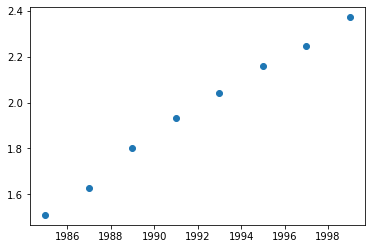

In [18]:
plt.scatter(cpi_dict.keys(), cpi_dict.values())

In [19]:
cpi_dict[1999]

2.372

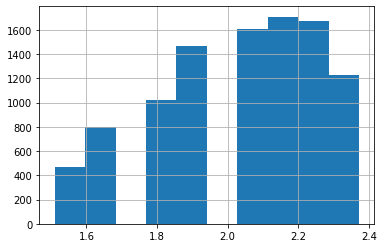

In [20]:
tmp_dat['cpi'].hist()

In [21]:
tmp_dat.head()

,idchild,momid,year,num_children,cred_rate0,min_income_max_credit0,phaseout_rate0,phase_out_begin0,cred_rate1,min_income_max_credit1,...,liveboth,fatstg,samprandwhite,piarersn,hispanic,black,samprandom,hrswrinew,afqtadj,piamatsn
18,2701.0,27,1995,2,7.65,4100,7.65,5130,34.0,6160,...,1,0,1,1.378451,0,0,1,10.0,1.800921,1.488657
34,5802.0,58,1997,3,7.65,4340,7.65,5430,34.0,6500,...,1,0,1,0.694447,0,0,1,1560.0,1.092527,1.488657
35,5803.0,58,1997,3,7.65,4340,7.65,5430,34.0,6500,...,1,0,1,1.241650,0,0,1,1560.0,1.092527,0.753502
43,9201.0,92,1987,1,14.00,6080,10.00,6920,14.0,6080,...,0,0,1,0.694447,0,0,1,740.0,-0.222054,1.194595
49,9602.0,96,1995,2,7.65,4100,7.65,5130,34.0,6160,...,1,0,0,0.420846,0,0,1,2080.0,-0.535611,0.018347


In [22]:
tmp_dat['min_income_max_credit0'] = tmp_dat['min_income_max_credit0'] / tmp_dat['cpi'] * cpi_dict[1999]
tmp_dat['phase_out_begin0'] = tmp_dat['phase_out_begin0'] / tmp_dat['cpi'] * cpi_dict[1999]
tmp_dat['min_income_max_credit1'] = tmp_dat['min_income_max_credit1'] / tmp_dat['cpi'] * cpi_dict[1999]
tmp_dat['phase_out_begin1'] = tmp_dat['phase_out_begin1'] / tmp_dat['cpi'] * cpi_dict[1999]
tmp_dat['min_income_max_credit2'] = tmp_dat['min_income_max_credit2'] / tmp_dat['cpi'] * cpi_dict[1999]
tmp_dat['phase_out_begin2'] = tmp_dat['phase_out_begin2'] / tmp_dat['cpi'] * cpi_dict[1999]

### Step 9. Drop Unused columns

In [23]:
final_dat = tmp_dat.drop(columns=['cpi', 'cpily', 'idchild', 'momid', 'year'])

## Likelihood models for fitting simulation

Step 1:

See if income can be explained by Z and U.

Step 2: 

Count the dimensions for U, Z and Y. Set dimensions of M N and X to 1.

Step 3: 

Run the LVM to fit it.

Step 4: 

Generate data and ground truth from the LVM.

In [24]:

unused_cols = ['idchild', 'momid', 'year']
Z_cols = ['cred_rate0', 'min_income_max_credit0', 'phaseout_rate0', 'phase_out_begin0',
         'cred_rate1', 'min_income_max_credit1', 'phaseout_rate1', 'phase_out_begin1',
         'cred_rate2', 'min_income_max_credit2', 'phaseout_rate2', 'phase_out_begin2']
income_cols = ['earnincsimp', 'earnincrimp', 'totinc', 'totinc_prev']
U_cols = ['num_children', 'rtotweadimp2', 'childcare', 'sampnmhisp', 'hgcbym79',
       'sampnmblack', 'numofa', 'totamusd', 'hrswrinew', 'hgcbyf79', 'motstg', 
          'maxndeply', 'totamud', 'samprandwhite', 'sampnm', 'black', 'afqtadj', 
          'totwead', 'hispanic', 'swages', 'totweadimp2', 'samprandom', 'ageofrimp',
          'wksuni', 'male', 'marrlyimp', 'fatstg', 'liveboth']
Y_cols = ['piamatsn', 'piarecsn', 'piarersn', ]

In [25]:
print(len(Z_cols))
print(len(U_cols))
print(len(Y_cols))

12
28
3


### See if income can be explained by Z and U.

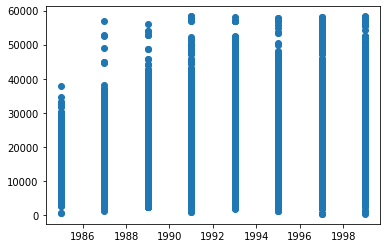

In [26]:
# See if year correlates with income


plt.scatter(tmp_dat['year'], tmp_dat['totinc'])

In [27]:
for year in [1985, 1987, 1989, 1991, 1993, 1995, 1997, 1999]:
    rslt_df = np.mean(tmp_dat[tmp_dat['year'] == year]['totinc'])
    print(rslt_df)



13522.24392354048
15898.800991280104
17959.18529408657
18158.25337953153
19579.120394220325
19603.716564546663
21933.137481163074
23844.892858800802


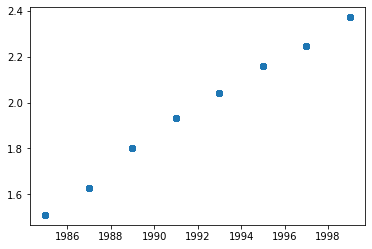

In [28]:
plt.scatter(tmp_dat['year'], tmp_dat['cpi'])

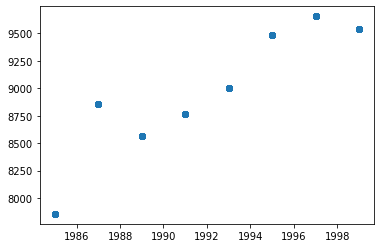

In [29]:
plt.scatter(tmp_dat['year'], tmp_dat['min_income_max_credit2'])

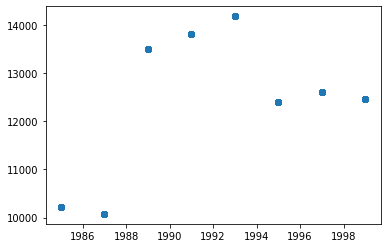

In [30]:
plt.scatter(tmp_dat['year'], tmp_dat['phase_out_begin2'])

In [31]:
from sklearn.ensemble import RandomForestRegressor
y = final_dat['totinc']
X = final_dat[['cred_rate0', 'min_income_max_credit0', 'phaseout_rate0', 'phase_out_begin0',
         'cred_rate1', 'min_income_max_credit1', 'phaseout_rate1', 'phase_out_begin1',
         'cred_rate2', 'min_income_max_credit2', 'phaseout_rate2', 'phase_out_begin2',
         'num_children', 'rtotweadimp2', 'childcare', 'sampnmhisp', 'hgcbym79',
       'sampnmblack', 'numofa', 'totamusd', 'hrswrinew', 'hgcbyf79', 'motstg', 
          'maxndeply', 'totamud', 'samprandwhite', 'sampnm', 'black', 'afqtadj', 
          'totwead', 'hispanic', 'swages', 'totweadimp2', 'samprandom', 'ageofrimp',
          'wksuni', 'male', 'marrlyimp', 'fatstg', 'liveboth']]

regr = RandomForestRegressor(max_depth=2, random_state=0)
regr.fit(X, y)



RandomForestRegressor(max_depth=2, random_state=0)

In [32]:
from sklearn.metrics import r2_score, explained_variance_score

In [33]:
r2_score(regr.predict(X), y)

0.45451682179695263

In [34]:
explained_variance_score(regr.predict(X), y)

0.4545185508187377

### Count variable dimensions and create train_data

In [35]:
num_u = len(U_cols)
num_z = len(Z_cols)
num_y = 1
num_x, num_m, num_n = 1, 1, 1

In [36]:
Z = final_dat[Z_cols]
U = final_dat[U_cols]
Y = final_dat[Y_cols]
M = final_dat['totinc']
N = final_dat['totinc_prev']

In [37]:
Y = np.mean(Y, axis=1)

In [38]:
final_dat[Y_cols]

,piamatsn,piarecsn,piarersn
18,1.488657,1.262641,1.378451
34,1.488657,1.481388,0.694447
35,0.753502,0.825148,1.241650
43,1.194595,1.043895,0.694447
49,0.018347,0.533486,0.420846
...,...,...,...
91840,-0.422746,-0.706079,1.173250
91848,0.679987,0.314739,0.284045
91852,0.900533,1.043895,0.694447
91856,-0.937354,-0.924825,-1.152363


In [39]:
Y

18       1.376583
34       1.221497
35       0.940100
43       0.977646
49       0.324226
           ...   
91840    0.014808
91848    0.426257
91852    0.879625
91856   -1.004847
91866   -0.145722
Length: 9968, dtype: float32

In [40]:
from miv.util import dotdict

def standardise(nparr):
    print('std: ', np.std(nparr, axis=0))
    print('mean: ', np.mean(nparr, axis=0))
    return (nparr - np.mean(nparr, axis=0).reshape(1,-1))/(np.std(nparr, axis=0).reshape(1,-1)+1e-7)

train_data = dotdict({})
train_data.Z = torch.tensor(standardise(Z.values))
train_data.U = torch.tensor(np.concatenate([U.values[:, 0:1].astype(int), standardise(U.values[:, 1:])], axis=-1))
train_data.Y = torch.tensor(standardise(Y.values).reshape(-1,1))
train_data.M = torch.tensor(standardise(M.values.reshape(-1,1)))
train_data.N = torch.tensor(standardise(N.values.reshape(-1,1)))

std:  [4.98361702e+00 3.12756301e+03 4.13257245e+00 4.30673707e+03
 9.22408513e+00 9.85778799e+02 2.34647389e+00 1.20905814e+03
 1.13422934e+01 4.75363206e+02 4.51505790e+00 1.20905814e+03]
mean:  [6.61090490e+00 4.05518436e+03 5.93732343e+00 5.29538243e+03
 2.42304374e+01 7.84347378e+03 1.36701485e+01 1.27556703e+04
 2.65691212e+01 9.11590162e+03 1.60547422e+01 1.27556703e+04]
std:  [1.04638182e+03 0.00000000e+00 3.96064722e-01 3.85814247e+00
 4.48454517e-01 6.54631161e-01 3.14201390e+02 9.35768382e+02
 5.04774027e+00 2.21756380e-01 1.07511546e+00 2.12178368e+02
 4.98204484e-01 6.40019063e-02 4.49095177e-01 9.19151218e-01
 1.04533105e+03 3.96527791e-01 2.19871524e+04 1.04533105e+03
 4.85661864e-01 3.99420565e+00 4.50932294e-01 4.99990942e-01
 4.48405041e-01 1.61456619e-01 4.67101555e-01]
mean:  [ 3.11416209e+02  0.00000000e+00  1.94823435e-01  9.95124398e+00
  2.78892456e-01  1.91188454e+00  3.70640901e+01  1.45162627e+03
  9.03250401e+00  5.18659711e-02  2.54725120e+00  3.01345470e+0

### Fit latent variable model

In [42]:
ts = torch.tensor([[1,2,3], [4,5,6]])
idxes = torch.tensor([[1,2], [0,2]])
ts[[[0],[1]], idxes]
num_children = torch.tensor([[0], [1], [2]]) * 4
print(np.concatenate([num_children, num_children + 1, num_children + 2,
                     num_children + 3], axis=-1))

[[ 0  1  2  3]
 [ 4  5  6  7]
 [ 8  9 10 11]]


In [43]:
torch.arange(3)

tensor([0, 1, 2])

In [44]:
##             U 
##           /  \    
##          /    \    
##   Z --> X --> Y 
##        / \
##       /   \
##      M    N
##
## 
##
## E[Y|Z] = E[f(X)|Z] 
## f(X) = a + b X + c X^2 
## Y|X,U  = f(X) + g(U) + eps
## E[f(X)|Z]= a + b E[X|Z] + cE[X^2|Z]
## X|Z,U
## (Y - E[f(X)|Z])^2
## Y = f(X, W) + epsilon
## E[Y|Z] = E[f(X, W)|Z] = int_{x,w} f(x,w) p(x|w,z)p(w|z)
## 

## p({x}|{z}) = prod_i (p(x_i|z_i))
## 
## covariates: y_0, polity2l, ethfrac, 
##             relfrac, Oil, lpopl1, 
##             lmtnest, ccode, year
## X: true income
## M: totinc
## N: totinc_prev
## Z: EITC parameters
## Y: test scores



# likelihood models


class MDecoder(torch.nn.Module):
    # p(m|x) = gaussian(x, exp(mm0 + mm1 * x)^2)
    def __init__(self, data):
        super().__init__()
        self.m_logscale_fc = nn.Linear(1,1)
        self.data = data
    
    def forward(self, x):
        pmx_mean = x
        pmx_logscale = self.m_logscale_fc(x.double())
        pmx_scale = torch.exp(pmx_logscale)
        
        return pmx_mean, pmx_scale

class NDecoder(torch.nn.Module):
    # p(n|x) = gaussian(x, exp(nn0 + nn1 * x)^2)
    def __init__(self, data):
        super().__init__()
        self.n_logscale_fc = nn.Linear(1,1)
        self.data = data
    
    def forward(self, x):
        pnx_mean = x
        pnx_logscale = self.n_logscale_fc(x.double())
        pnx_scale = torch.exp(pnx_logscale)
        
        return pnx_mean, pnx_scale
    
    

class XModel(torch.nn.Module):
    # p(x|z, u) = gaussian(f(Z, U), exp(zz0 + zz1 * x)^2)
    # input dim = dim_z + dim_u = 62
    def __init__(self, data):
        super().__init__()
        self.x_feature = nn.Sequential(nn.Linear(num_u+int(num_z/3), 10), nn.ReLU())
        self.x_mean_fc = nn.Linear(10,1)
        self.x_logscale_fc = nn.Linear(10,1)
        self.data = data
        
    def forward(self, idx):
        z = self.data.Z[idx]
        u = self.data.U[idx]
        pxzu_mean, pxzu_scale = self.forward_(z, u)
        
        return pxzu_mean, pxzu_scale
    
    def forward_(self, z, u):
        num_children = u[:, 0].type(torch.int64).reshape(-1,1)
#         breakpoint()
        num_children_select = torch.cat([torch.clamp(num_children, max=2) * 4, 
                                         torch.clamp(num_children, max=2) * 4 + 1, 
                                         torch.clamp(num_children, max=2) * 4 + 2,
                                         torch.clamp(num_children, max=2) * 4 + 3], axis=-1)
        z4_num_children = z[torch.arange(z.shape[0]).reshape(-1,1), num_children_select]
        zu = torch.cat([z4_num_children,u], axis=-1)
        zu_feature = self.x_feature(zu)
        pxzu_mean = self.x_mean_fc(zu_feature)
        pxzu_logscale = self.x_logscale_fc(zu_feature)
        pxzu_scale = torch.exp(pxzu_logscale)

        return pxzu_mean, pxzu_scale
    
    
class YModel(torch.nn.Module):
    # Y = f(X) + g(U) + eps
    # p(y|x, u) = gaussian(f(x) + g(u), eps)
    # input dim = dim_x + dim_u = 1 + 2 + 5 = 8
    
    def __init__(self, data):
        super().__init__()
        self.fx = nn.Sequential(nn.Linear(1, 5), nn.ReLU(), nn.Linear(5, 1))
        
        self.gu = nn.Sequential(nn.Linear(num_u, 5), nn.ReLU(), nn.Linear(5, 1))
        
        self.y_noise_logscale = nn.Linear(1+num_u, 1)
        
        self.data = data
    
    def forward(self, x, idx):
        
        u = self.data.U[idx]
        
        pyxu_mean, pyxu_scale = self.forward_(x, u)
        
        return pyxu_mean, pyxu_scale
    
    def forward_(self, x, u):
        fx = self.fx(x)
        gu = self.gu(u)

        pyxu_mean = fx + gu
        
        pyxu_scale = torch.exp(self.y_noise_logscale(torch.cat([x, u], axis=-1)))
        
        return pyxu_mean, pyxu_scale
        


class Encoder1(torch.nn.Module):
    # q({x}|{m},{n},{z}, {covar}, {y}) = gaussian(q0 + q1*{m} + q2*{n} + q3*{z}, 
    #                       exp(qq0 + qq1*{m} + qq2*{n} + qq3*{z})^2)
    # input dim = dim_m + dim_n + dim_z + dim_covar + dim_u + dim_y = 70
    # H[q] = -E_q[log(q)] = log(prod(sigma)*(2*pi*e)**(B*0.5))
    def __init__(self, data):
        super().__init__()
        input_dim = 2 + num_z + num_u + num_y
        self.q_nonlinear = nn.Sequential(nn.Linear(input_dim, 26), nn.ReLU())
#         self.q_mean_fc = nn.Linear(3, 1)
#         self.q_logscale_fc = nn.Linear(3, 1)
        self.q_mean_fc = nn.Linear(26, 1)
        self.q_logscale_fc = nn.Linear(26, 1)
        self.data = data
        
    def forward(self, idx):
#         breakpoint()
        q_mean, q_scale, H_q = self.forward_(self.data.M[idx], self.data.N[idx], self.data.Z[idx], 
                              self.data.U[idx], self.data.Y[idx])
        
        return q_mean, q_scale, H_q
    
    def forward_(self, m, n, z, u, y):
        B = m.shape[0]
        
        mnzuy = torch.cat([m, n, z, u, y], axis=1)
#         breakpoint()
        q_feature = self.q_nonlinear(mnzuy)
        q_mean = self.q_mean_fc(q_feature)
#         q_mean = self.q_mean_fc(mnz.double())
        q_logscale = self.q_logscale_fc(q_feature)
#         q_logscale = self.q_logscale_fc(mnz)
        q_scale = torch.exp(q_logscale)
        
        H_q = torch.log(torch.prod(q_scale)*(2*torch.pi*torch.e)**(B*0.5))
        
        return q_mean, q_scale, H_q
    

    


class LVM(torch.nn.Module):
    def __init__(self, data, sample_size_from_pxz):
        super().__init__()
        self.xmodel = XModel(data)
        self.ndecoder = NDecoder(data)
        self.mdecoder = MDecoder(data)
        self.encoder = Encoder1(data)
        self.ymodel = YModel(data)
        self.data = data
        self.sample_size_from_pxz = sample_size_from_pxz
    
    
    def stage_1_loss(self, idx):
        ### Free energy = E_q[log(p({m},{n},{x}|{z})) - log(q)] 
        ###             = E_q[log(p({m},{n},{x}|{z}))] + H_q({m},{n},{z})
        ###             = E_q[sum_i{log(p(m_i, n_i, x_i|z_i))}] + H_q({m}, {n}, {z})
        ###             = E_q[sum_i{log(p(m_i|x_i))} + sum_i{log(p(n_i|x_i))} + sum_i{log(p(x_i|z_i))}]
        ###               + H_q({m},{n},{z})
        ###             = sum_i{E_q[log(p(m_i|x_i))]} 
        ###               + sum_i{E_q[log(p(n_i|x_i))]} 
        ###               + sum_i{E_q[log(p(x_i|z_i))]} 
        ###               + H_q({m},{n},{z})
        ### ELBO = - sum_i{E_q[log(p(m_i|x_i))]} 
        ###        - sum_i{E_q[log(p(n_i|x_i))]} 
        ###        - sum_i{E_q[log(p(x_i|z_i))]} 
        ###        - H_q({m},{n},{z})
    
        q_mean, q_scale, H_q = self.encoder(idx)
        q_dist = torch.distributions.Normal(q_mean, q_scale)
        x_samples_from_q = q_dist.rsample()

        pmx_mean, pmx_scale = self.mdecoder(x_samples_from_q)
        pmx_dist = torch.distributions.Normal(pmx_mean, pmx_scale)
        sum_pmx = torch.sum(pmx_dist.log_prob(data.M[idx]))

        pnx_mean, pnx_scale = self.ndecoder(x_samples_from_q)
        pnx_dist = torch.distributions.Normal(pnx_mean, pnx_scale)
        sum_pnx = torch.sum(pnx_dist.log_prob(data.N[idx]))

        pxzu_mean, pxzu_scale = self.xmodel(idx)
        pxzu_dist = torch.distributions.Normal(pxzu_mean, pxzu_scale)
        sum_pxzu = torch.sum(pxzu_dist.log_prob(x_samples_from_q))
        
#         loss = -sum_pmx - sum_pnx - sum_pxzu - H_q
        
        pyxu_mean, pyxu_scale = self.ymodel(x_samples_from_q, idx)
        pyxu_dist = torch.distributions.Normal(pyxu_mean, pyxu_scale)
        sum_pyxu = torch.sum(pyxu_dist.log_prob(data.Y[idx]))

        loss = -sum_pmx - sum_pnx - sum_pxzu - sum_pyxu - H_q
        
        return loss
    
#     @staticmethod
#     def cross_entropy_loss(pred, true):
        
#         return loss
        
    
#     def stage_2_loss(self, idx):
#         # {Z, Y}
#         # E[Y|Z] = E[f(X)|Z] vs E[Y|X] = f(X)

#         with torch.no_grad():
            
#             pxz_mean, pxz_scale = self.ivm(idx)
#             pxz_dist = torch.distributions.Normal(pxz_mean, pxz_scale)
            
#             x_samples_from_z = pxz_dist.rsample(sample_shape=(self.sample_size_from_pxz,))
            
#             dim_x = x_samples_from_z.shape[-1]
            

            
#         response_inp = torch.cat([x_samples_from_z.reshape(-1, dim_x), 
#                                   self.data.Y_covariate[idx].repeat((self.sample_size_from_pxz, 1)).reshape(-1, self.data.Y_covariate.shape[-1])], axis=-1)
        
#         preds_1 = torch.mean(self.response(response_inp[:, :1]).reshape(self.sample_size_from_pxz, -1), axis=0).reshape(-1,1)
#         preds_2 = torch.ones(preds_1.shape) - preds_1
#         probs = torch.cat([preds_1, preds_2], dim=1)
        
#         cross_entropy_loss = nn.CrossEntropyLoss()
        
#         loss = cross_entropy_loss(probs, target)
        
# #         breakpoint()
        
#         return loss
    

In [45]:
# training function

def split_into_batches(train_size, batch_size):
    batches_idxes = []
    idxes = np.arange(train_size)
    np.random.shuffle(idxes)
    batch_i = 0
    while True:
        batches_idxes.append(torch.tensor(idxes[batch_i * batch_size: (batch_i + 1) * batch_size]))
        batch_i += 1
        if batch_i * batch_size >= train_size:
            break
    return batches_idxes

def train1(lvm, data, batch_size):
    lvm.train()
    lvm.double()
    optimizer = optim.Adam(lvm.parameters(), lr=1e-3)
    losses = []
    step = 0
    for ep in range(500):
        running_loss = 0.0
        batches_idx = split_into_batches(train_size=data.Z.shape[0], batch_size=batch_size)
        for i, batch_idx in enumerate(batches_idx):
            loss = lvm.stage_1_loss(batch_idx)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            
            if i % 1 == 0:
                print('[epoch %d, batch %5d] loss: %.5f' % (
                ep + 1, i + 1, running_loss / 1))
                # breakpoint()
                running_loss = 0.0
                
            losses.append(loss.item())
            
            step += 1
            
    return lvm

def train2(lvm, data, batch_size):
    lvm.eval()
    lvm.response.train()
    lvm.double()
    optimizer = optim.Adam(lvm.response.parameters(), lr=1e-3)
    losses = []
    step = 0
    for ep in range(500):
        running_loss = 0.0
        batches_idx = split_into_batches(train_size=data.Z.shape[0], batch_size=batch_size)
        for i, batch_idx in enumerate(batches_idx):
            loss = lvm.stage_2_loss(batch_idx)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            
            if i % 1 == 0:
                print('[epoch %d, batch %5d] loss: %.5f' % (
                ep + 1, i + 1, running_loss / 1))
                running_loss = 0.0
            
            losses.append(loss.item())
            
            step += 1
    return lvm
                
    


In [46]:
sample_size_from_pxz = 100
data = train_data
lvm = LVM(data, sample_size_from_pxz=sample_size_from_pxz)
# print('response_net_param: ', lvm.response.response_net[0].weight)
print('iv model param: ', lvm.xmodel.x_logscale_fc.weight)


lvm = train1(lvm, data, batch_size=64)


iv model param:  Parameter containing:
tensor([[-0.2157, -0.2505, -0.1116, -0.1935,  0.2498, -0.1728, -0.1032, -0.2067,
          0.0699, -0.1166]], requires_grad=True)
[epoch 1, batch     1] loss: 1912.55719
[epoch 1, batch     2] loss: 1283.95405
[epoch 1, batch     3] loss: 1931.11718
[epoch 1, batch     4] loss: 1235.16597
[epoch 1, batch     5] loss: 2270.99862
[epoch 1, batch     6] loss: 11956.69244
[epoch 1, batch     7] loss: 1325.04682
[epoch 1, batch     8] loss: 2342.49600
[epoch 1, batch     9] loss: 2058.21664
[epoch 1, batch    10] loss: 1238.95936
[epoch 1, batch    11] loss: 1342.70026
[epoch 1, batch    12] loss: 1054.21164
[epoch 1, batch    13] loss: 892.77640
[epoch 1, batch    14] loss: 523.98540
[epoch 1, batch    15] loss: 1190.18380
[epoch 1, batch    16] loss: 677.54085
[epoch 1, batch    17] loss: 1397.10944
[epoch 1, batch    18] loss: 2960.19243
[epoch 1, batch    19] loss: 2073.46901
[epoch 1, batch    20] loss: 977.42311
[epoch 1, batch    21] loss: 1507.

[epoch 2, batch    83] loss: 350.76498
[epoch 2, batch    84] loss: 317.62278
[epoch 2, batch    85] loss: 327.59962
[epoch 2, batch    86] loss: 315.17808
[epoch 2, batch    87] loss: 321.37449
[epoch 2, batch    88] loss: 71417.84935
[epoch 2, batch    89] loss: 360.34655
[epoch 2, batch    90] loss: 344.77968
[epoch 2, batch    91] loss: 314.29848
[epoch 2, batch    92] loss: 335.09885
[epoch 2, batch    93] loss: 309.04804
[epoch 2, batch    94] loss: 378.80703
[epoch 2, batch    95] loss: 330.93688
[epoch 2, batch    96] loss: 344.48524
[epoch 2, batch    97] loss: 350.68799
[epoch 2, batch    98] loss: 850.30695
[epoch 2, batch    99] loss: 344.64892
[epoch 2, batch   100] loss: 68502.92367
[epoch 2, batch   101] loss: 447.41368
[epoch 2, batch   102] loss: 373.07777
[epoch 2, batch   103] loss: 356.61486
[epoch 2, batch   104] loss: 336.19055
[epoch 2, batch   105] loss: 369.07400
[epoch 2, batch   106] loss: 305.97188
[epoch 2, batch   107] loss: 337.28067
[epoch 2, batch   108

[epoch 4, batch    21] loss: 346.08667
[epoch 4, batch    22] loss: 288.64381
[epoch 4, batch    23] loss: 312.88630
[epoch 4, batch    24] loss: 342.80627
[epoch 4, batch    25] loss: 33398.56026
[epoch 4, batch    26] loss: 462.89289
[epoch 4, batch    27] loss: 311.74653
[epoch 4, batch    28] loss: 307.13421
[epoch 4, batch    29] loss: 315.54570
[epoch 4, batch    30] loss: 319.11630
[epoch 4, batch    31] loss: 317.92878
[epoch 4, batch    32] loss: 315.51420
[epoch 4, batch    33] loss: 305.81484
[epoch 4, batch    34] loss: 331.58286
[epoch 4, batch    35] loss: 353.45695
[epoch 4, batch    36] loss: 295.32696
[epoch 4, batch    37] loss: 314.82920
[epoch 4, batch    38] loss: 380.59459
[epoch 4, batch    39] loss: 316.54634
[epoch 4, batch    40] loss: 298.28384
[epoch 4, batch    41] loss: 336.93966
[epoch 4, batch    42] loss: 298.21453
[epoch 4, batch    43] loss: 282.93354
[epoch 4, batch    44] loss: 314.92678
[epoch 4, batch    45] loss: 335.29102
[epoch 4, batch    46] 

[epoch 5, batch   113] loss: 324.04026
[epoch 5, batch   114] loss: 300.45777
[epoch 5, batch   115] loss: 280.68284
[epoch 5, batch   116] loss: 278.67370
[epoch 5, batch   117] loss: 311.30545
[epoch 5, batch   118] loss: 311.68957
[epoch 5, batch   119] loss: 348.74998
[epoch 5, batch   120] loss: 288.65253
[epoch 5, batch   121] loss: 307.07306
[epoch 5, batch   122] loss: 321.85834
[epoch 5, batch   123] loss: 281.77936
[epoch 5, batch   124] loss: 285.41300
[epoch 5, batch   125] loss: 280.92931
[epoch 5, batch   126] loss: 338.40475
[epoch 5, batch   127] loss: 323.72639
[epoch 5, batch   128] loss: 323.90400
[epoch 5, batch   129] loss: 318.60027
[epoch 5, batch   130] loss: 294.08204
[epoch 5, batch   131] loss: 318.42470
[epoch 5, batch   132] loss: 323.68563
[epoch 5, batch   133] loss: 310.63836
[epoch 5, batch   134] loss: 303.83833
[epoch 5, batch   135] loss: 293.84860
[epoch 5, batch   136] loss: 291.73157
[epoch 5, batch   137] loss: 274.62500
[epoch 5, batch   138] lo

[epoch 7, batch    49] loss: 319.86443
[epoch 7, batch    50] loss: 384.03351
[epoch 7, batch    51] loss: 304.18157
[epoch 7, batch    52] loss: 278.29637
[epoch 7, batch    53] loss: 290.62245
[epoch 7, batch    54] loss: 277.30893
[epoch 7, batch    55] loss: 293.00326
[epoch 7, batch    56] loss: 312.86904
[epoch 7, batch    57] loss: 260.20635
[epoch 7, batch    58] loss: 318.99919
[epoch 7, batch    59] loss: 485.09223
[epoch 7, batch    60] loss: 268.68024
[epoch 7, batch    61] loss: 272.39405
[epoch 7, batch    62] loss: 361.01378
[epoch 7, batch    63] loss: 373.37903
[epoch 7, batch    64] loss: 567.70145
[epoch 7, batch    65] loss: 319.24638
[epoch 7, batch    66] loss: 319.05667
[epoch 7, batch    67] loss: 349.80961
[epoch 7, batch    68] loss: 282.52417
[epoch 7, batch    69] loss: 296.15362
[epoch 7, batch    70] loss: 341.41642
[epoch 7, batch    71] loss: 312.52886
[epoch 7, batch    72] loss: 581.48210
[epoch 7, batch    73] loss: 9335.89595
[epoch 7, batch    74] l

[epoch 8, batch   155] loss: 273.57448
[epoch 8, batch   156] loss: 267.94845
[epoch 9, batch     1] loss: 267.85087
[epoch 9, batch     2] loss: 370.19202
[epoch 9, batch     3] loss: 282.49169
[epoch 9, batch     4] loss: 275.25993
[epoch 9, batch     5] loss: 289.56671
[epoch 9, batch     6] loss: 314.06178
[epoch 9, batch     7] loss: 276.13238
[epoch 9, batch     8] loss: 712.92238
[epoch 9, batch     9] loss: 321.75772
[epoch 9, batch    10] loss: 303.98040
[epoch 9, batch    11] loss: 277.93880
[epoch 9, batch    12] loss: 321.27558
[epoch 9, batch    13] loss: 317.31044
[epoch 9, batch    14] loss: 288.91884
[epoch 9, batch    15] loss: 308.76468
[epoch 9, batch    16] loss: 274.88662
[epoch 9, batch    17] loss: 271.31457
[epoch 9, batch    18] loss: 311.88529
[epoch 9, batch    19] loss: 292.37528
[epoch 9, batch    20] loss: 302.95575
[epoch 9, batch    21] loss: 277.13429
[epoch 9, batch    22] loss: 253.68593
[epoch 9, batch    23] loss: 295.33704
[epoch 9, batch    24] lo

[epoch 10, batch    99] loss: 262.38392
[epoch 10, batch   100] loss: 269.47526
[epoch 10, batch   101] loss: 307.42250
[epoch 10, batch   102] loss: 269.71486
[epoch 10, batch   103] loss: 254.53902
[epoch 10, batch   104] loss: 4493.30823
[epoch 10, batch   105] loss: 8793.57731
[epoch 10, batch   106] loss: 292.28249
[epoch 10, batch   107] loss: 264.83343
[epoch 10, batch   108] loss: 301.25662
[epoch 10, batch   109] loss: 307.93245
[epoch 10, batch   110] loss: 260.95854
[epoch 10, batch   111] loss: 257.80473
[epoch 10, batch   112] loss: 314.98915
[epoch 10, batch   113] loss: 458.74267
[epoch 10, batch   114] loss: 254.79987
[epoch 10, batch   115] loss: 278.89267
[epoch 10, batch   116] loss: 255.33360
[epoch 10, batch   117] loss: 301.47966
[epoch 10, batch   118] loss: 257.43099
[epoch 10, batch   119] loss: 331.17303
[epoch 10, batch   120] loss: 262.97074
[epoch 10, batch   121] loss: 228.12458
[epoch 10, batch   122] loss: 276.56554
[epoch 10, batch   123] loss: 283.0564

[epoch 12, batch    40] loss: 287.03478
[epoch 12, batch    41] loss: 278.36150
[epoch 12, batch    42] loss: 301.15453
[epoch 12, batch    43] loss: 280.67333
[epoch 12, batch    44] loss: 241.42938
[epoch 12, batch    45] loss: 270.90891
[epoch 12, batch    46] loss: 321.32212
[epoch 12, batch    47] loss: 328.35060
[epoch 12, batch    48] loss: 274.07397
[epoch 12, batch    49] loss: 296.81878
[epoch 12, batch    50] loss: 343.49193
[epoch 12, batch    51] loss: 240.71205
[epoch 12, batch    52] loss: 235.10654
[epoch 12, batch    53] loss: 243.71980
[epoch 12, batch    54] loss: 258.44701
[epoch 12, batch    55] loss: 246.47931
[epoch 12, batch    56] loss: 268.66178
[epoch 12, batch    57] loss: 278.71408
[epoch 12, batch    58] loss: 252.15071
[epoch 12, batch    59] loss: 260.82387
[epoch 12, batch    60] loss: 292.56927
[epoch 12, batch    61] loss: 291.62798
[epoch 12, batch    62] loss: 281.57186
[epoch 12, batch    63] loss: 302.22460
[epoch 12, batch    64] loss: 343.23375


[epoch 13, batch   137] loss: 272.65468
[epoch 13, batch   138] loss: 250.57271
[epoch 13, batch   139] loss: 263.58963
[epoch 13, batch   140] loss: 269.05215
[epoch 13, batch   141] loss: 242.35201
[epoch 13, batch   142] loss: 315.02053
[epoch 13, batch   143] loss: 493.15632
[epoch 13, batch   144] loss: 2637.07789
[epoch 13, batch   145] loss: 272.16201
[epoch 13, batch   146] loss: 250.95925
[epoch 13, batch   147] loss: 304.27975
[epoch 13, batch   148] loss: 262.46191
[epoch 13, batch   149] loss: 284.66639
[epoch 13, batch   150] loss: 5181.29982
[epoch 13, batch   151] loss: 270.20168
[epoch 13, batch   152] loss: 282.12355
[epoch 13, batch   153] loss: 269.78803
[epoch 13, batch   154] loss: 294.92970
[epoch 13, batch   155] loss: 250.13237
[epoch 13, batch   156] loss: 172.55814
[epoch 14, batch     1] loss: 291.20451
[epoch 14, batch     2] loss: 299.40761
[epoch 14, batch     3] loss: 235.01771
[epoch 14, batch     4] loss: 287.18752
[epoch 14, batch     5] loss: 256.7446

[epoch 15, batch    87] loss: 293.87594
[epoch 15, batch    88] loss: 243.72390
[epoch 15, batch    89] loss: 247.15283
[epoch 15, batch    90] loss: 257.71845
[epoch 15, batch    91] loss: 277.34102
[epoch 15, batch    92] loss: 286.13904
[epoch 15, batch    93] loss: 270.49162
[epoch 15, batch    94] loss: 243.17286
[epoch 15, batch    95] loss: 298.44800
[epoch 15, batch    96] loss: 253.03692
[epoch 15, batch    97] loss: 244.70584
[epoch 15, batch    98] loss: 279.78238
[epoch 15, batch    99] loss: 322.62224
[epoch 15, batch   100] loss: 298.38898
[epoch 15, batch   101] loss: 315.34976
[epoch 15, batch   102] loss: 246.60645
[epoch 15, batch   103] loss: 272.55029
[epoch 15, batch   104] loss: 247.98960
[epoch 15, batch   105] loss: 256.71777
[epoch 15, batch   106] loss: 246.62113
[epoch 15, batch   107] loss: 285.74516
[epoch 15, batch   108] loss: 298.08518
[epoch 15, batch   109] loss: 239.29364
[epoch 15, batch   110] loss: 309.97155
[epoch 15, batch   111] loss: 310.63774


[epoch 17, batch    18] loss: 269.30680
[epoch 17, batch    19] loss: 231.64676
[epoch 17, batch    20] loss: 241.41775
[epoch 17, batch    21] loss: 221.22167
[epoch 17, batch    22] loss: 263.97311
[epoch 17, batch    23] loss: 225.14730
[epoch 17, batch    24] loss: 242.05046
[epoch 17, batch    25] loss: 270.26816
[epoch 17, batch    26] loss: 302.46241
[epoch 17, batch    27] loss: 288.84637
[epoch 17, batch    28] loss: 223.81566
[epoch 17, batch    29] loss: 301.42416
[epoch 17, batch    30] loss: 299.33896
[epoch 17, batch    31] loss: 213.42501
[epoch 17, batch    32] loss: 265.29083
[epoch 17, batch    33] loss: 252.02233
[epoch 17, batch    34] loss: 281.30651
[epoch 17, batch    35] loss: 238.64599
[epoch 17, batch    36] loss: 290.79792
[epoch 17, batch    37] loss: 252.65142
[epoch 17, batch    38] loss: 281.20302
[epoch 17, batch    39] loss: 234.05988
[epoch 17, batch    40] loss: 259.33677
[epoch 17, batch    41] loss: 327.61690
[epoch 17, batch    42] loss: 376.84283


[epoch 18, batch   116] loss: 2678.62796
[epoch 18, batch   117] loss: 249.93763
[epoch 18, batch   118] loss: 246.03407
[epoch 18, batch   119] loss: 288.59153
[epoch 18, batch   120] loss: 252.38143
[epoch 18, batch   121] loss: 298.97640
[epoch 18, batch   122] loss: 264.45579
[epoch 18, batch   123] loss: 268.91966
[epoch 18, batch   124] loss: 259.08768
[epoch 18, batch   125] loss: 205.64627
[epoch 18, batch   126] loss: 294.24173
[epoch 18, batch   127] loss: 256.68852
[epoch 18, batch   128] loss: 239.04761
[epoch 18, batch   129] loss: 245.59145
[epoch 18, batch   130] loss: 241.75682
[epoch 18, batch   131] loss: 213.08275
[epoch 18, batch   132] loss: 223.64676
[epoch 18, batch   133] loss: 272.50882
[epoch 18, batch   134] loss: 224.24060
[epoch 18, batch   135] loss: 234.90837
[epoch 18, batch   136] loss: 265.49070
[epoch 18, batch   137] loss: 277.34350
[epoch 18, batch   138] loss: 311.64095
[epoch 18, batch   139] loss: 307.37355
[epoch 18, batch   140] loss: 220.84031

[epoch 20, batch    67] loss: 244.66781
[epoch 20, batch    68] loss: 266.58431
[epoch 20, batch    69] loss: 269.60040
[epoch 20, batch    70] loss: 237.94807
[epoch 20, batch    71] loss: 205.10044
[epoch 20, batch    72] loss: 199.05732
[epoch 20, batch    73] loss: 233.13425
[epoch 20, batch    74] loss: 258.72757
[epoch 20, batch    75] loss: 220.73434
[epoch 20, batch    76] loss: 223.75090
[epoch 20, batch    77] loss: 2127.88351
[epoch 20, batch    78] loss: 255.15213
[epoch 20, batch    79] loss: 234.78702
[epoch 20, batch    80] loss: 194.49747
[epoch 20, batch    81] loss: 219.70898
[epoch 20, batch    82] loss: 274.83741
[epoch 20, batch    83] loss: 247.05932
[epoch 20, batch    84] loss: 254.18031
[epoch 20, batch    85] loss: 218.84778
[epoch 20, batch    86] loss: 227.31211
[epoch 20, batch    87] loss: 211.50561
[epoch 20, batch    88] loss: 250.07679
[epoch 20, batch    89] loss: 255.46326
[epoch 20, batch    90] loss: 217.76707
[epoch 20, batch    91] loss: 360.93029

[epoch 22, batch    14] loss: 208.46372
[epoch 22, batch    15] loss: 212.22785
[epoch 22, batch    16] loss: 284.81865
[epoch 22, batch    17] loss: 234.49872
[epoch 22, batch    18] loss: 322.36325
[epoch 22, batch    19] loss: 209.49637
[epoch 22, batch    20] loss: 211.82669
[epoch 22, batch    21] loss: 253.57037
[epoch 22, batch    22] loss: 273.97025
[epoch 22, batch    23] loss: 229.61810
[epoch 22, batch    24] loss: 210.24084
[epoch 22, batch    25] loss: 223.60177
[epoch 22, batch    26] loss: 214.13890
[epoch 22, batch    27] loss: 216.11290
[epoch 22, batch    28] loss: 229.29082
[epoch 22, batch    29] loss: 228.61301
[epoch 22, batch    30] loss: 230.77882
[epoch 22, batch    31] loss: 216.77985
[epoch 22, batch    32] loss: 215.60022
[epoch 22, batch    33] loss: 319.39926
[epoch 22, batch    34] loss: 209.84265
[epoch 22, batch    35] loss: 209.71500
[epoch 22, batch    36] loss: 203.68519
[epoch 22, batch    37] loss: 202.22862
[epoch 22, batch    38] loss: 208.26471


[epoch 23, batch   108] loss: 197.08484
[epoch 23, batch   109] loss: 261.94170
[epoch 23, batch   110] loss: 208.11819
[epoch 23, batch   111] loss: 216.62301
[epoch 23, batch   112] loss: 257.90822
[epoch 23, batch   113] loss: 190.41330
[epoch 23, batch   114] loss: 200.20215
[epoch 23, batch   115] loss: 206.92065
[epoch 23, batch   116] loss: 187.90543
[epoch 23, batch   117] loss: 219.97789
[epoch 23, batch   118] loss: 220.13907
[epoch 23, batch   119] loss: 193.79368
[epoch 23, batch   120] loss: 192.71781
[epoch 23, batch   121] loss: 225.25939
[epoch 23, batch   122] loss: 342.47968
[epoch 23, batch   123] loss: 279.17877
[epoch 23, batch   124] loss: 246.39504
[epoch 23, batch   125] loss: 196.33333
[epoch 23, batch   126] loss: 185.98161
[epoch 23, batch   127] loss: 194.49237
[epoch 23, batch   128] loss: 205.43515
[epoch 23, batch   129] loss: 304.20134
[epoch 23, batch   130] loss: 197.56609
[epoch 23, batch   131] loss: 178.90605
[epoch 23, batch   132] loss: 207.39455


[epoch 25, batch    42] loss: 201.58352
[epoch 25, batch    43] loss: 205.09191
[epoch 25, batch    44] loss: 196.37895
[epoch 25, batch    45] loss: 196.12695
[epoch 25, batch    46] loss: 231.94223
[epoch 25, batch    47] loss: 267.66456
[epoch 25, batch    48] loss: 196.07086
[epoch 25, batch    49] loss: 248.52026
[epoch 25, batch    50] loss: 256.79657
[epoch 25, batch    51] loss: 205.60902
[epoch 25, batch    52] loss: 224.67092
[epoch 25, batch    53] loss: 178.11836
[epoch 25, batch    54] loss: 198.56462
[epoch 25, batch    55] loss: 259.39884
[epoch 25, batch    56] loss: 201.87873
[epoch 25, batch    57] loss: 218.84256
[epoch 25, batch    58] loss: 238.51520
[epoch 25, batch    59] loss: 210.14650
[epoch 25, batch    60] loss: 217.27201
[epoch 25, batch    61] loss: 209.37622
[epoch 25, batch    62] loss: 203.15236
[epoch 25, batch    63] loss: 220.36615
[epoch 25, batch    64] loss: 229.43618
[epoch 25, batch    65] loss: 209.08133
[epoch 25, batch    66] loss: 205.23838


[epoch 26, batch   139] loss: 191.15389
[epoch 26, batch   140] loss: 166.18810
[epoch 26, batch   141] loss: 199.21122
[epoch 26, batch   142] loss: 189.17617
[epoch 26, batch   143] loss: 190.76550
[epoch 26, batch   144] loss: 202.00136
[epoch 26, batch   145] loss: 256.14120
[epoch 26, batch   146] loss: 254.27106
[epoch 26, batch   147] loss: 186.43438
[epoch 26, batch   148] loss: 193.61472
[epoch 26, batch   149] loss: 177.93254
[epoch 26, batch   150] loss: 187.04936
[epoch 26, batch   151] loss: 186.86630
[epoch 26, batch   152] loss: 205.69473
[epoch 26, batch   153] loss: 192.40176
[epoch 26, batch   154] loss: 206.84076
[epoch 26, batch   155] loss: 216.53964
[epoch 26, batch   156] loss: 182.69373
[epoch 27, batch     1] loss: 191.98058
[epoch 27, batch     2] loss: 182.62552
[epoch 27, batch     3] loss: 170.60213
[epoch 27, batch     4] loss: 183.66775
[epoch 27, batch     5] loss: 186.95402
[epoch 27, batch     6] loss: 186.73981
[epoch 27, batch     7] loss: 191.32432


[epoch 28, batch    83] loss: 202.01499
[epoch 28, batch    84] loss: 179.00780
[epoch 28, batch    85] loss: 180.23461
[epoch 28, batch    86] loss: 171.63147
[epoch 28, batch    87] loss: 186.54144
[epoch 28, batch    88] loss: 183.20901
[epoch 28, batch    89] loss: 185.65829
[epoch 28, batch    90] loss: 175.14994
[epoch 28, batch    91] loss: 188.08256
[epoch 28, batch    92] loss: 219.12950
[epoch 28, batch    93] loss: 222.96383
[epoch 28, batch    94] loss: 178.63620
[epoch 28, batch    95] loss: 255.20008
[epoch 28, batch    96] loss: 248.90557
[epoch 28, batch    97] loss: 188.77117
[epoch 28, batch    98] loss: 188.66361
[epoch 28, batch    99] loss: 187.33128
[epoch 28, batch   100] loss: 177.69458
[epoch 28, batch   101] loss: 194.65143
[epoch 28, batch   102] loss: 181.56032
[epoch 28, batch   103] loss: 222.13142
[epoch 28, batch   104] loss: 178.91944
[epoch 28, batch   105] loss: 199.81552
[epoch 28, batch   106] loss: 197.02676
[epoch 28, batch   107] loss: 176.66820


[epoch 30, batch    13] loss: 182.27266
[epoch 30, batch    14] loss: 194.68394
[epoch 30, batch    15] loss: 186.05285
[epoch 30, batch    16] loss: 193.45774
[epoch 30, batch    17] loss: 212.19507
[epoch 30, batch    18] loss: 177.28945
[epoch 30, batch    19] loss: 181.27200
[epoch 30, batch    20] loss: 175.51689
[epoch 30, batch    21] loss: 187.85408
[epoch 30, batch    22] loss: 170.24005
[epoch 30, batch    23] loss: 205.45393
[epoch 30, batch    24] loss: 160.60929
[epoch 30, batch    25] loss: 170.63441
[epoch 30, batch    26] loss: 233.58286
[epoch 30, batch    27] loss: 170.68640
[epoch 30, batch    28] loss: 221.67914
[epoch 30, batch    29] loss: 178.55140
[epoch 30, batch    30] loss: 173.67533
[epoch 30, batch    31] loss: 166.40841
[epoch 30, batch    32] loss: 207.23813
[epoch 30, batch    33] loss: 177.77925
[epoch 30, batch    34] loss: 173.26588
[epoch 30, batch    35] loss: 210.22248
[epoch 30, batch    36] loss: 171.83646
[epoch 30, batch    37] loss: 190.04642


[epoch 31, batch   102] loss: 155.28511
[epoch 31, batch   103] loss: 163.51212
[epoch 31, batch   104] loss: 200.72220
[epoch 31, batch   105] loss: 194.58754
[epoch 31, batch   106] loss: 154.42654
[epoch 31, batch   107] loss: 244.08599
[epoch 31, batch   108] loss: 167.03559
[epoch 31, batch   109] loss: 200.34766
[epoch 31, batch   110] loss: 165.98477
[epoch 31, batch   111] loss: 163.91964
[epoch 31, batch   112] loss: 187.90366
[epoch 31, batch   113] loss: 176.59508
[epoch 31, batch   114] loss: 174.60380
[epoch 31, batch   115] loss: 160.79287
[epoch 31, batch   116] loss: 179.98901
[epoch 31, batch   117] loss: 159.88449
[epoch 31, batch   118] loss: 231.34322
[epoch 31, batch   119] loss: 156.72689
[epoch 31, batch   120] loss: 154.68742
[epoch 31, batch   121] loss: 172.87473
[epoch 31, batch   122] loss: 178.63205
[epoch 31, batch   123] loss: 173.28994
[epoch 31, batch   124] loss: 183.80191
[epoch 31, batch   125] loss: 183.52820
[epoch 31, batch   126] loss: 229.14868


[epoch 33, batch    48] loss: 141.42404
[epoch 33, batch    49] loss: 173.72929
[epoch 33, batch    50] loss: 138.28275
[epoch 33, batch    51] loss: 170.18167
[epoch 33, batch    52] loss: 159.32778
[epoch 33, batch    53] loss: 184.37868
[epoch 33, batch    54] loss: 157.47190
[epoch 33, batch    55] loss: 175.12062
[epoch 33, batch    56] loss: 148.84455
[epoch 33, batch    57] loss: 183.34714
[epoch 33, batch    58] loss: 167.44765
[epoch 33, batch    59] loss: 188.93957
[epoch 33, batch    60] loss: 166.10274
[epoch 33, batch    61] loss: 150.82786
[epoch 33, batch    62] loss: 187.43510
[epoch 33, batch    63] loss: 167.99740
[epoch 33, batch    64] loss: 170.39352
[epoch 33, batch    65] loss: 452.57896
[epoch 33, batch    66] loss: 159.36280
[epoch 33, batch    67] loss: 179.20589
[epoch 33, batch    68] loss: 156.47017
[epoch 33, batch    69] loss: 161.05709
[epoch 33, batch    70] loss: 154.59515
[epoch 33, batch    71] loss: 198.21182
[epoch 33, batch    72] loss: 184.06061


[epoch 34, batch   155] loss: 199.12870
[epoch 34, batch   156] loss: 121.76068
[epoch 35, batch     1] loss: 180.79863
[epoch 35, batch     2] loss: 179.62024
[epoch 35, batch     3] loss: 146.13500
[epoch 35, batch     4] loss: 147.09007
[epoch 35, batch     5] loss: 140.10688
[epoch 35, batch     6] loss: 152.65059
[epoch 35, batch     7] loss: 176.81666
[epoch 35, batch     8] loss: 141.40654
[epoch 35, batch     9] loss: 172.68983
[epoch 35, batch    10] loss: 144.03331
[epoch 35, batch    11] loss: 151.88890
[epoch 35, batch    12] loss: 179.58223
[epoch 35, batch    13] loss: 149.55953
[epoch 35, batch    14] loss: 150.81211
[epoch 35, batch    15] loss: 157.08083
[epoch 35, batch    16] loss: 161.91536
[epoch 35, batch    17] loss: 142.65411
[epoch 35, batch    18] loss: 189.06486
[epoch 35, batch    19] loss: 161.07420
[epoch 35, batch    20] loss: 145.04100
[epoch 35, batch    21] loss: 156.88752
[epoch 35, batch    22] loss: 159.41010
[epoch 35, batch    23] loss: 139.49380


[epoch 36, batch    99] loss: 132.91300
[epoch 36, batch   100] loss: 134.97078
[epoch 36, batch   101] loss: 141.34393
[epoch 36, batch   102] loss: 136.00557
[epoch 36, batch   103] loss: 165.78289
[epoch 36, batch   104] loss: 234.99849
[epoch 36, batch   105] loss: 139.50540
[epoch 36, batch   106] loss: 161.85297
[epoch 36, batch   107] loss: 210.14765
[epoch 36, batch   108] loss: 136.80900
[epoch 36, batch   109] loss: 150.31906
[epoch 36, batch   110] loss: 140.97631
[epoch 36, batch   111] loss: 131.14619
[epoch 36, batch   112] loss: 176.55197
[epoch 36, batch   113] loss: 139.90960
[epoch 36, batch   114] loss: 155.53974
[epoch 36, batch   115] loss: 127.32835
[epoch 36, batch   116] loss: 153.96849
[epoch 36, batch   117] loss: 165.01188
[epoch 36, batch   118] loss: 155.96223
[epoch 36, batch   119] loss: 152.34978
[epoch 36, batch   120] loss: 306.60467
[epoch 36, batch   121] loss: 141.52109
[epoch 36, batch   122] loss: 183.99757
[epoch 36, batch   123] loss: 137.88776


[epoch 38, batch    46] loss: 178.76999
[epoch 38, batch    47] loss: 144.36797
[epoch 38, batch    48] loss: 145.12451
[epoch 38, batch    49] loss: 144.54640
[epoch 38, batch    50] loss: 147.37126
[epoch 38, batch    51] loss: 146.68599
[epoch 38, batch    52] loss: 169.67817
[epoch 38, batch    53] loss: 177.39263
[epoch 38, batch    54] loss: 141.88275
[epoch 38, batch    55] loss: 190.18137
[epoch 38, batch    56] loss: 190.83673
[epoch 38, batch    57] loss: 151.02270
[epoch 38, batch    58] loss: 132.52541
[epoch 38, batch    59] loss: 166.98835
[epoch 38, batch    60] loss: 143.93439
[epoch 38, batch    61] loss: 167.42799
[epoch 38, batch    62] loss: 126.37864
[epoch 38, batch    63] loss: 137.47993
[epoch 38, batch    64] loss: 141.88282
[epoch 38, batch    65] loss: 249.22264
[epoch 38, batch    66] loss: 132.59918
[epoch 38, batch    67] loss: 177.69472
[epoch 38, batch    68] loss: 153.42940
[epoch 38, batch    69] loss: 135.79882
[epoch 38, batch    70] loss: 140.47214


[epoch 39, batch   146] loss: 139.33184
[epoch 39, batch   147] loss: 161.23075
[epoch 39, batch   148] loss: 268.28501
[epoch 39, batch   149] loss: 129.86662
[epoch 39, batch   150] loss: 126.76066
[epoch 39, batch   151] loss: 127.33438
[epoch 39, batch   152] loss: 166.02895
[epoch 39, batch   153] loss: 135.44103
[epoch 39, batch   154] loss: 133.08461
[epoch 39, batch   155] loss: 145.50188
[epoch 39, batch   156] loss: 100.61803
[epoch 40, batch     1] loss: 136.51492
[epoch 40, batch     2] loss: 134.25209
[epoch 40, batch     3] loss: 156.58446
[epoch 40, batch     4] loss: 120.12263
[epoch 40, batch     5] loss: 159.12949
[epoch 40, batch     6] loss: 134.46688
[epoch 40, batch     7] loss: 119.40350
[epoch 40, batch     8] loss: 120.17835
[epoch 40, batch     9] loss: 122.80979
[epoch 40, batch    10] loss: 138.03728
[epoch 40, batch    11] loss: 129.51764
[epoch 40, batch    12] loss: 150.32507
[epoch 40, batch    13] loss: 143.51911
[epoch 40, batch    14] loss: 165.72361


[epoch 41, batch    84] loss: 123.45382
[epoch 41, batch    85] loss: 123.73223
[epoch 41, batch    86] loss: 141.83442
[epoch 41, batch    87] loss: 145.55903
[epoch 41, batch    88] loss: 141.04945
[epoch 41, batch    89] loss: 168.97488
[epoch 41, batch    90] loss: 125.76221
[epoch 41, batch    91] loss: 146.59803
[epoch 41, batch    92] loss: 192.43412
[epoch 41, batch    93] loss: 170.34198
[epoch 41, batch    94] loss: 123.66765
[epoch 41, batch    95] loss: 149.35403
[epoch 41, batch    96] loss: 121.70972
[epoch 41, batch    97] loss: 117.23542
[epoch 41, batch    98] loss: 131.53095
[epoch 41, batch    99] loss: 145.72355
[epoch 41, batch   100] loss: 103.76539
[epoch 41, batch   101] loss: 243.94254
[epoch 41, batch   102] loss: 125.58979
[epoch 41, batch   103] loss: 143.22657
[epoch 41, batch   104] loss: 129.75451
[epoch 41, batch   105] loss: 135.17775
[epoch 41, batch   106] loss: 139.29000
[epoch 41, batch   107] loss: 123.73962
[epoch 41, batch   108] loss: 133.56471


[epoch 43, batch    12] loss: 254.99953
[epoch 43, batch    13] loss: 112.92188
[epoch 43, batch    14] loss: 111.59917
[epoch 43, batch    15] loss: 121.82088
[epoch 43, batch    16] loss: 110.20025
[epoch 43, batch    17] loss: 125.61554
[epoch 43, batch    18] loss: 174.39474
[epoch 43, batch    19] loss: 102.91528
[epoch 43, batch    20] loss: 119.38909
[epoch 43, batch    21] loss: 131.59093
[epoch 43, batch    22] loss: 123.48333
[epoch 43, batch    23] loss: 151.45127
[epoch 43, batch    24] loss: 121.49698
[epoch 43, batch    25] loss: 123.55126
[epoch 43, batch    26] loss: 185.88949
[epoch 43, batch    27] loss: 256.03318
[epoch 43, batch    28] loss: 177.62326
[epoch 43, batch    29] loss: 153.89664
[epoch 43, batch    30] loss: 132.81508
[epoch 43, batch    31] loss: 159.59587
[epoch 43, batch    32] loss: 146.46442
[epoch 43, batch    33] loss: 130.24022
[epoch 43, batch    34] loss: 143.52004
[epoch 43, batch    35] loss: 142.86611
[epoch 43, batch    36] loss: 160.79411


[epoch 44, batch    97] loss: 157.38350
[epoch 44, batch    98] loss: 150.50850
[epoch 44, batch    99] loss: 147.65363
[epoch 44, batch   100] loss: 149.06652
[epoch 44, batch   101] loss: 149.23159
[epoch 44, batch   102] loss: 140.28511
[epoch 44, batch   103] loss: 120.13061
[epoch 44, batch   104] loss: 123.21026
[epoch 44, batch   105] loss: 130.04207
[epoch 44, batch   106] loss: 228.68682
[epoch 44, batch   107] loss: 123.23093
[epoch 44, batch   108] loss: 113.00222
[epoch 44, batch   109] loss: 166.73615
[epoch 44, batch   110] loss: 115.07727
[epoch 44, batch   111] loss: 125.24654
[epoch 44, batch   112] loss: 124.38067
[epoch 44, batch   113] loss: 131.44928
[epoch 44, batch   114] loss: 129.10327
[epoch 44, batch   115] loss: 149.45181
[epoch 44, batch   116] loss: 105.60749
[epoch 44, batch   117] loss: 137.13354
[epoch 44, batch   118] loss: 126.79293
[epoch 44, batch   119] loss: 104.05420
[epoch 44, batch   120] loss: 161.56877
[epoch 44, batch   121] loss: 172.60695


[epoch 46, batch    33] loss: 262.19128
[epoch 46, batch    34] loss: 273.33888
[epoch 46, batch    35] loss: 206.13333
[epoch 46, batch    36] loss: 139.05203
[epoch 46, batch    37] loss: 125.78567
[epoch 46, batch    38] loss: 107.70750
[epoch 46, batch    39] loss: 131.77877
[epoch 46, batch    40] loss: 160.48389
[epoch 46, batch    41] loss: 97.59153
[epoch 46, batch    42] loss: 125.87672
[epoch 46, batch    43] loss: 137.62846
[epoch 46, batch    44] loss: 120.24417
[epoch 46, batch    45] loss: 109.23526
[epoch 46, batch    46] loss: 121.43921
[epoch 46, batch    47] loss: 125.14975
[epoch 46, batch    48] loss: 111.30039
[epoch 46, batch    49] loss: 158.18849
[epoch 46, batch    50] loss: 128.26017
[epoch 46, batch    51] loss: 151.84856
[epoch 46, batch    52] loss: 141.81957
[epoch 46, batch    53] loss: 119.38357
[epoch 46, batch    54] loss: 122.13403
[epoch 46, batch    55] loss: 121.96172
[epoch 46, batch    56] loss: 150.67021
[epoch 46, batch    57] loss: 99.96963
[e

[epoch 47, batch   114] loss: 117.14799
[epoch 47, batch   115] loss: 112.88832
[epoch 47, batch   116] loss: 131.19990
[epoch 47, batch   117] loss: 120.04780
[epoch 47, batch   118] loss: 128.71349
[epoch 47, batch   119] loss: 138.73197
[epoch 47, batch   120] loss: 105.46070
[epoch 47, batch   121] loss: 129.55991
[epoch 47, batch   122] loss: 177.88634
[epoch 47, batch   123] loss: 99.07939
[epoch 47, batch   124] loss: 152.18291
[epoch 47, batch   125] loss: 117.03540
[epoch 47, batch   126] loss: 135.06816
[epoch 47, batch   127] loss: 105.74282
[epoch 47, batch   128] loss: 122.93246
[epoch 47, batch   129] loss: 133.70688
[epoch 47, batch   130] loss: 101.97159
[epoch 47, batch   131] loss: 112.14462
[epoch 47, batch   132] loss: 190.98226
[epoch 47, batch   133] loss: 111.23319
[epoch 47, batch   134] loss: 116.34953
[epoch 47, batch   135] loss: 163.54233
[epoch 47, batch   136] loss: 116.43264
[epoch 47, batch   137] loss: 104.78799
[epoch 47, batch   138] loss: 126.57039
[

[epoch 49, batch    28] loss: 157.77671
[epoch 49, batch    29] loss: 100.54090
[epoch 49, batch    30] loss: 131.26124
[epoch 49, batch    31] loss: 112.73480
[epoch 49, batch    32] loss: 175.85512
[epoch 49, batch    33] loss: 118.89724
[epoch 49, batch    34] loss: 116.06980
[epoch 49, batch    35] loss: 135.17055
[epoch 49, batch    36] loss: 122.00031
[epoch 49, batch    37] loss: 112.24749
[epoch 49, batch    38] loss: 153.33913
[epoch 49, batch    39] loss: 132.62667
[epoch 49, batch    40] loss: 121.21184
[epoch 49, batch    41] loss: 112.25953
[epoch 49, batch    42] loss: 138.90689
[epoch 49, batch    43] loss: 101.06023
[epoch 49, batch    44] loss: 129.12637
[epoch 49, batch    45] loss: 140.15279
[epoch 49, batch    46] loss: 133.33252
[epoch 49, batch    47] loss: 123.92737
[epoch 49, batch    48] loss: 106.40700
[epoch 49, batch    49] loss: 125.98923
[epoch 49, batch    50] loss: 117.14946
[epoch 49, batch    51] loss: 164.20211
[epoch 49, batch    52] loss: 116.68398


[epoch 50, batch    99] loss: 138.91174
[epoch 50, batch   100] loss: 122.55018
[epoch 50, batch   101] loss: 118.08912
[epoch 50, batch   102] loss: 104.46416
[epoch 50, batch   103] loss: 113.30377
[epoch 50, batch   104] loss: 150.03937
[epoch 50, batch   105] loss: 109.59465
[epoch 50, batch   106] loss: 180.87703
[epoch 50, batch   107] loss: 119.18206
[epoch 50, batch   108] loss: 123.33212
[epoch 50, batch   109] loss: 128.83558
[epoch 50, batch   110] loss: 121.65084
[epoch 50, batch   111] loss: 126.19696
[epoch 50, batch   112] loss: 131.56242
[epoch 50, batch   113] loss: 115.97582
[epoch 50, batch   114] loss: 113.75987
[epoch 50, batch   115] loss: 309.50624
[epoch 50, batch   116] loss: 130.43309
[epoch 50, batch   117] loss: 99.14335
[epoch 50, batch   118] loss: 85.50711
[epoch 50, batch   119] loss: 121.89618
[epoch 50, batch   120] loss: 116.20630
[epoch 50, batch   121] loss: 340.72636
[epoch 50, batch   122] loss: 107.75568
[epoch 50, batch   123] loss: 123.68646
[e

[epoch 52, batch    36] loss: 166.51633
[epoch 52, batch    37] loss: 176.54570
[epoch 52, batch    38] loss: 127.76056
[epoch 52, batch    39] loss: 121.02999
[epoch 52, batch    40] loss: 100.88176
[epoch 52, batch    41] loss: 149.73219
[epoch 52, batch    42] loss: 116.95410
[epoch 52, batch    43] loss: 120.61143
[epoch 52, batch    44] loss: 100.84893
[epoch 52, batch    45] loss: 115.70055
[epoch 52, batch    46] loss: 122.89634
[epoch 52, batch    47] loss: 126.69533
[epoch 52, batch    48] loss: 108.34256
[epoch 52, batch    49] loss: 121.42254
[epoch 52, batch    50] loss: 121.41476
[epoch 52, batch    51] loss: 95.53300
[epoch 52, batch    52] loss: 170.80131
[epoch 52, batch    53] loss: 132.56191
[epoch 52, batch    54] loss: 92.35977
[epoch 52, batch    55] loss: 124.40769
[epoch 52, batch    56] loss: 140.82895
[epoch 52, batch    57] loss: 144.71373
[epoch 52, batch    58] loss: 122.11749
[epoch 52, batch    59] loss: 113.94236
[epoch 52, batch    60] loss: 90.36624
[ep

[epoch 53, batch   136] loss: 140.59209
[epoch 53, batch   137] loss: 161.11964
[epoch 53, batch   138] loss: 96.90621
[epoch 53, batch   139] loss: 122.52833
[epoch 53, batch   140] loss: 118.65119
[epoch 53, batch   141] loss: 129.20869
[epoch 53, batch   142] loss: 118.52069
[epoch 53, batch   143] loss: 125.40520
[epoch 53, batch   144] loss: 119.62139
[epoch 53, batch   145] loss: 124.53392
[epoch 53, batch   146] loss: 86.77908
[epoch 53, batch   147] loss: 87.84085
[epoch 53, batch   148] loss: 133.32614
[epoch 53, batch   149] loss: 151.36618
[epoch 53, batch   150] loss: 99.85416
[epoch 53, batch   151] loss: 110.18256
[epoch 53, batch   152] loss: 98.67215
[epoch 53, batch   153] loss: 113.46084
[epoch 53, batch   154] loss: 105.42737
[epoch 53, batch   155] loss: 99.36887
[epoch 53, batch   156] loss: 69.69408
[epoch 54, batch     1] loss: 127.13961
[epoch 54, batch     2] loss: 113.04987
[epoch 54, batch     3] loss: 104.07621
[epoch 54, batch     4] loss: 90.01842
[epoch 5

[epoch 55, batch    82] loss: 102.52609
[epoch 55, batch    83] loss: 116.54487
[epoch 55, batch    84] loss: 164.68333
[epoch 55, batch    85] loss: 102.84417
[epoch 55, batch    86] loss: 132.08958
[epoch 55, batch    87] loss: 106.74368
[epoch 55, batch    88] loss: 105.94256
[epoch 55, batch    89] loss: 144.42344
[epoch 55, batch    90] loss: 97.41630
[epoch 55, batch    91] loss: 108.28277
[epoch 55, batch    92] loss: 94.71105
[epoch 55, batch    93] loss: 168.70140
[epoch 55, batch    94] loss: 102.69775
[epoch 55, batch    95] loss: 329.95821
[epoch 55, batch    96] loss: 104.82241
[epoch 55, batch    97] loss: 151.55061
[epoch 55, batch    98] loss: 115.48187
[epoch 55, batch    99] loss: 134.54446
[epoch 55, batch   100] loss: 112.89966
[epoch 55, batch   101] loss: 96.31230
[epoch 55, batch   102] loss: 159.76959
[epoch 55, batch   103] loss: 128.71719
[epoch 55, batch   104] loss: 138.17974
[epoch 55, batch   105] loss: 169.00753
[epoch 55, batch   106] loss: 134.95326
[ep

[epoch 57, batch    33] loss: 124.27931
[epoch 57, batch    34] loss: 128.60708
[epoch 57, batch    35] loss: 112.64351
[epoch 57, batch    36] loss: 102.16490
[epoch 57, batch    37] loss: 119.19173
[epoch 57, batch    38] loss: 102.25525
[epoch 57, batch    39] loss: 113.08103
[epoch 57, batch    40] loss: 98.97484
[epoch 57, batch    41] loss: 101.21673
[epoch 57, batch    42] loss: 92.22688
[epoch 57, batch    43] loss: 147.87943
[epoch 57, batch    44] loss: 116.18146
[epoch 57, batch    45] loss: 151.84383
[epoch 57, batch    46] loss: 111.29159
[epoch 57, batch    47] loss: 116.79033
[epoch 57, batch    48] loss: 127.55741
[epoch 57, batch    49] loss: 108.00864
[epoch 57, batch    50] loss: 130.62785
[epoch 57, batch    51] loss: 114.47874
[epoch 57, batch    52] loss: 152.72979
[epoch 57, batch    53] loss: 127.29548
[epoch 57, batch    54] loss: 111.82308
[epoch 57, batch    55] loss: 118.23807
[epoch 57, batch    56] loss: 120.38211
[epoch 57, batch    57] loss: 116.35302
[e

[epoch 58, batch   120] loss: 122.16126
[epoch 58, batch   121] loss: 94.13225
[epoch 58, batch   122] loss: 103.74765
[epoch 58, batch   123] loss: 97.44917
[epoch 58, batch   124] loss: 114.40193
[epoch 58, batch   125] loss: 125.59137
[epoch 58, batch   126] loss: 126.19385
[epoch 58, batch   127] loss: 140.04798
[epoch 58, batch   128] loss: 147.47374
[epoch 58, batch   129] loss: 97.37890
[epoch 58, batch   130] loss: 96.29961
[epoch 58, batch   131] loss: 108.53423
[epoch 58, batch   132] loss: 96.70630
[epoch 58, batch   133] loss: 99.32274
[epoch 58, batch   134] loss: 100.08602
[epoch 58, batch   135] loss: 87.07656
[epoch 58, batch   136] loss: 76.51731
[epoch 58, batch   137] loss: 121.61174
[epoch 58, batch   138] loss: 98.82190
[epoch 58, batch   139] loss: 90.46591
[epoch 58, batch   140] loss: 138.95648
[epoch 58, batch   141] loss: 117.01906
[epoch 58, batch   142] loss: 169.45714
[epoch 58, batch   143] loss: 113.12479
[epoch 58, batch   144] loss: 133.82758
[epoch 58,

[epoch 60, batch    71] loss: 87.82558
[epoch 60, batch    72] loss: 122.89243
[epoch 60, batch    73] loss: 134.29085
[epoch 60, batch    74] loss: 108.37528
[epoch 60, batch    75] loss: 165.29352
[epoch 60, batch    76] loss: 113.19195
[epoch 60, batch    77] loss: 110.84300
[epoch 60, batch    78] loss: 130.21662
[epoch 60, batch    79] loss: 116.53006
[epoch 60, batch    80] loss: 125.68731
[epoch 60, batch    81] loss: 141.18711
[epoch 60, batch    82] loss: 281.69637
[epoch 60, batch    83] loss: 130.83627
[epoch 60, batch    84] loss: 111.56897
[epoch 60, batch    85] loss: 146.08391
[epoch 60, batch    86] loss: 116.16143
[epoch 60, batch    87] loss: 146.14798
[epoch 60, batch    88] loss: 119.75922
[epoch 60, batch    89] loss: 98.02993
[epoch 60, batch    90] loss: 126.36120
[epoch 60, batch    91] loss: 111.84805
[epoch 60, batch    92] loss: 105.85028
[epoch 60, batch    93] loss: 166.58219
[epoch 60, batch    94] loss: 105.00565
[epoch 60, batch    95] loss: 108.97168
[e

[epoch 62, batch    17] loss: 111.13153
[epoch 62, batch    18] loss: 105.53070
[epoch 62, batch    19] loss: 106.81118
[epoch 62, batch    20] loss: 99.52837
[epoch 62, batch    21] loss: 121.31709
[epoch 62, batch    22] loss: 113.79804
[epoch 62, batch    23] loss: 117.45968
[epoch 62, batch    24] loss: 133.43957
[epoch 62, batch    25] loss: 140.59243
[epoch 62, batch    26] loss: 133.55959
[epoch 62, batch    27] loss: 115.65651
[epoch 62, batch    28] loss: 102.21198
[epoch 62, batch    29] loss: 115.56131
[epoch 62, batch    30] loss: 113.95852
[epoch 62, batch    31] loss: 101.91800
[epoch 62, batch    32] loss: 129.35161
[epoch 62, batch    33] loss: 113.32865
[epoch 62, batch    34] loss: 101.31953
[epoch 62, batch    35] loss: 88.46058
[epoch 62, batch    36] loss: 121.98840
[epoch 62, batch    37] loss: 119.42647
[epoch 62, batch    38] loss: 108.62902
[epoch 62, batch    39] loss: 123.53329
[epoch 62, batch    40] loss: 124.11050
[epoch 62, batch    41] loss: 102.58476
[e

[epoch 63, batch   114] loss: 182.85660
[epoch 63, batch   115] loss: 112.41735
[epoch 63, batch   116] loss: 133.30622
[epoch 63, batch   117] loss: 96.57055
[epoch 63, batch   118] loss: 110.14296
[epoch 63, batch   119] loss: 116.62035
[epoch 63, batch   120] loss: 140.68665
[epoch 63, batch   121] loss: 119.27681
[epoch 63, batch   122] loss: 116.22209
[epoch 63, batch   123] loss: 116.07394
[epoch 63, batch   124] loss: 146.00009
[epoch 63, batch   125] loss: 108.58000
[epoch 63, batch   126] loss: 85.54577
[epoch 63, batch   127] loss: 148.68680
[epoch 63, batch   128] loss: 104.22170
[epoch 63, batch   129] loss: 111.66843
[epoch 63, batch   130] loss: 148.26291
[epoch 63, batch   131] loss: 95.84690
[epoch 63, batch   132] loss: 119.73743
[epoch 63, batch   133] loss: 123028724.23538
[epoch 63, batch   134] loss: 132.41017
[epoch 63, batch   135] loss: 117.70239
[epoch 63, batch   136] loss: 129.87618
[epoch 63, batch   137] loss: 117.81114
[epoch 63, batch   138] loss: 136.764

[epoch 65, batch    53] loss: 129.54125
[epoch 65, batch    54] loss: 138.28781
[epoch 65, batch    55] loss: 134.62523
[epoch 65, batch    56] loss: 113.41157
[epoch 65, batch    57] loss: 129.46378
[epoch 65, batch    58] loss: 294.36302
[epoch 65, batch    59] loss: 120.50926
[epoch 65, batch    60] loss: 106.80580
[epoch 65, batch    61] loss: 130.80535
[epoch 65, batch    62] loss: 131.80359
[epoch 65, batch    63] loss: 122.05833
[epoch 65, batch    64] loss: 363.90885
[epoch 65, batch    65] loss: 103.19103
[epoch 65, batch    66] loss: 142.97939
[epoch 65, batch    67] loss: 160.26757
[epoch 65, batch    68] loss: 117.39151
[epoch 65, batch    69] loss: 166.78316
[epoch 65, batch    70] loss: 105.21837
[epoch 65, batch    71] loss: 111.79066
[epoch 65, batch    72] loss: 118.41591
[epoch 65, batch    73] loss: 141.01366
[epoch 65, batch    74] loss: 121.79259
[epoch 65, batch    75] loss: 203.09680
[epoch 65, batch    76] loss: 112.51379
[epoch 65, batch    77] loss: 114.01095


[epoch 66, batch   148] loss: 121.25443
[epoch 66, batch   149] loss: 124.04027
[epoch 66, batch   150] loss: 127.96483
[epoch 66, batch   151] loss: 119.20836
[epoch 66, batch   152] loss: 150.84784
[epoch 66, batch   153] loss: 111.67664
[epoch 66, batch   154] loss: 118.22389
[epoch 66, batch   155] loss: 175.19645
[epoch 66, batch   156] loss: 90.95804
[epoch 67, batch     1] loss: 93.50161
[epoch 67, batch     2] loss: 126.18167
[epoch 67, batch     3] loss: 103.19260
[epoch 67, batch     4] loss: 121.15136
[epoch 67, batch     5] loss: 265.82202
[epoch 67, batch     6] loss: 133.62880
[epoch 67, batch     7] loss: 148.12231
[epoch 67, batch     8] loss: 105.71628
[epoch 67, batch     9] loss: 147.74662
[epoch 67, batch    10] loss: 142.37152
[epoch 67, batch    11] loss: 102.29493
[epoch 67, batch    12] loss: 119.16216
[epoch 67, batch    13] loss: 112.97300
[epoch 67, batch    14] loss: 105.24598
[epoch 67, batch    15] loss: 169.69748
[epoch 67, batch    16] loss: 110.08478
[e

[epoch 68, batch    78] loss: 130.60823
[epoch 68, batch    79] loss: 105.25653
[epoch 68, batch    80] loss: 121.05248
[epoch 68, batch    81] loss: 129.60941
[epoch 68, batch    82] loss: 114.97189
[epoch 68, batch    83] loss: 101.70429
[epoch 68, batch    84] loss: 142.06573
[epoch 68, batch    85] loss: 103.42650
[epoch 68, batch    86] loss: 140.67946
[epoch 68, batch    87] loss: 121.25608
[epoch 68, batch    88] loss: 95.14434
[epoch 68, batch    89] loss: 91.51614
[epoch 68, batch    90] loss: 143.93908
[epoch 68, batch    91] loss: 142.55441
[epoch 68, batch    92] loss: 99.11838
[epoch 68, batch    93] loss: 156.16103
[epoch 68, batch    94] loss: 152.83648
[epoch 68, batch    95] loss: 121.36538
[epoch 68, batch    96] loss: 230.81715
[epoch 68, batch    97] loss: 107.40396
[epoch 68, batch    98] loss: 120.53214
[epoch 68, batch    99] loss: 189.30280
[epoch 68, batch   100] loss: 148.54072
[epoch 68, batch   101] loss: 92.46994
[epoch 68, batch   102] loss: 133.55521
[epo

[epoch 70, batch    27] loss: 137.88751
[epoch 70, batch    28] loss: 138.48125
[epoch 70, batch    29] loss: 150.66382
[epoch 70, batch    30] loss: 98.48533
[epoch 70, batch    31] loss: 109.44156
[epoch 70, batch    32] loss: 108.54409
[epoch 70, batch    33] loss: 114.69125
[epoch 70, batch    34] loss: 112.31004
[epoch 70, batch    35] loss: 113.02683
[epoch 70, batch    36] loss: 118.28569
[epoch 70, batch    37] loss: 122.97377
[epoch 70, batch    38] loss: 109.53523
[epoch 70, batch    39] loss: 111.89967
[epoch 70, batch    40] loss: 165.45658
[epoch 70, batch    41] loss: 117.92738
[epoch 70, batch    42] loss: 112.44582
[epoch 70, batch    43] loss: 98.78717
[epoch 70, batch    44] loss: 116.80674
[epoch 70, batch    45] loss: 117.50679
[epoch 70, batch    46] loss: 125.96171
[epoch 70, batch    47] loss: 116.60065
[epoch 70, batch    48] loss: 114.24049
[epoch 70, batch    49] loss: 96.94159
[epoch 70, batch    50] loss: 127.17140
[epoch 70, batch    51] loss: 145.92153
[ep

[epoch 71, batch   119] loss: 111.80591
[epoch 71, batch   120] loss: 111.45751
[epoch 71, batch   121] loss: 102.74484
[epoch 71, batch   122] loss: 147.64635
[epoch 71, batch   123] loss: 116.04773
[epoch 71, batch   124] loss: 139.43768
[epoch 71, batch   125] loss: 104.34367
[epoch 71, batch   126] loss: 121.66333
[epoch 71, batch   127] loss: 112.33597
[epoch 71, batch   128] loss: 131.15479
[epoch 71, batch   129] loss: 105.15891
[epoch 71, batch   130] loss: 336.89466
[epoch 71, batch   131] loss: 113.99570
[epoch 71, batch   132] loss: 262.39012
[epoch 71, batch   133] loss: 113.15900
[epoch 71, batch   134] loss: 113.24535
[epoch 71, batch   135] loss: 372.14202
[epoch 71, batch   136] loss: 92.49226
[epoch 71, batch   137] loss: 108.49411
[epoch 71, batch   138] loss: 147.26555
[epoch 71, batch   139] loss: 139.85793
[epoch 71, batch   140] loss: 113.73751
[epoch 71, batch   141] loss: 115.58681
[epoch 71, batch   142] loss: 124.31012
[epoch 71, batch   143] loss: 96.91414
[e

[epoch 73, batch    58] loss: 112.83908
[epoch 73, batch    59] loss: 146.22786
[epoch 73, batch    60] loss: 104.61971
[epoch 73, batch    61] loss: 138.63618
[epoch 73, batch    62] loss: 122.72299
[epoch 73, batch    63] loss: 89.75004
[epoch 73, batch    64] loss: 139.10629
[epoch 73, batch    65] loss: 134.60268
[epoch 73, batch    66] loss: 313.73268
[epoch 73, batch    67] loss: 334.00419
[epoch 73, batch    68] loss: 114.64488
[epoch 73, batch    69] loss: 105.25157
[epoch 73, batch    70] loss: 145.35836
[epoch 73, batch    71] loss: 97.52612
[epoch 73, batch    72] loss: 111.67255
[epoch 73, batch    73] loss: 102.33971
[epoch 73, batch    74] loss: 108.64752
[epoch 73, batch    75] loss: 129.03215
[epoch 73, batch    76] loss: 135.11097
[epoch 73, batch    77] loss: 107.67109
[epoch 73, batch    78] loss: 107.43111
[epoch 73, batch    79] loss: 89.62727
[epoch 73, batch    80] loss: 108.81772
[epoch 73, batch    81] loss: 114.84397
[epoch 73, batch    82] loss: 100.04829
[ep

[epoch 75, batch     1] loss: 116.13462
[epoch 75, batch     2] loss: 93.46365
[epoch 75, batch     3] loss: 116.09003
[epoch 75, batch     4] loss: 168.46207
[epoch 75, batch     5] loss: 99.06682
[epoch 75, batch     6] loss: 115.27354
[epoch 75, batch     7] loss: 131.64299
[epoch 75, batch     8] loss: 131.98911
[epoch 75, batch     9] loss: 128.93911
[epoch 75, batch    10] loss: 145.60364
[epoch 75, batch    11] loss: 181.08938
[epoch 75, batch    12] loss: 122.50239
[epoch 75, batch    13] loss: 133.70295
[epoch 75, batch    14] loss: 112.90022
[epoch 75, batch    15] loss: 119.36490
[epoch 75, batch    16] loss: 110.07149
[epoch 75, batch    17] loss: 116.06534
[epoch 75, batch    18] loss: 105.16786
[epoch 75, batch    19] loss: 135.91746
[epoch 75, batch    20] loss: 101.47174
[epoch 75, batch    21] loss: 105.47892
[epoch 75, batch    22] loss: 123.36548
[epoch 75, batch    23] loss: 123.69322
[epoch 75, batch    24] loss: 83.64265
[epoch 75, batch    25] loss: 108.83831
[ep

[epoch 76, batch   105] loss: 106.54782
[epoch 76, batch   106] loss: 95.17699
[epoch 76, batch   107] loss: 99.36617
[epoch 76, batch   108] loss: 127.85126
[epoch 76, batch   109] loss: 171.72093
[epoch 76, batch   110] loss: 114.81220
[epoch 76, batch   111] loss: 118.14873
[epoch 76, batch   112] loss: 101.66515
[epoch 76, batch   113] loss: 171.44532
[epoch 76, batch   114] loss: 106.46665
[epoch 76, batch   115] loss: 155.22457
[epoch 76, batch   116] loss: 99.33618
[epoch 76, batch   117] loss: 383.16916
[epoch 76, batch   118] loss: 143.46745
[epoch 76, batch   119] loss: 235.34281
[epoch 76, batch   120] loss: 123.49186
[epoch 76, batch   121] loss: 139.68901
[epoch 76, batch   122] loss: 124.23606
[epoch 76, batch   123] loss: 114.21133
[epoch 76, batch   124] loss: 112.68540
[epoch 76, batch   125] loss: 131.58963
[epoch 76, batch   126] loss: 101.68110
[epoch 76, batch   127] loss: 112.41912
[epoch 76, batch   128] loss: 131.63357
[epoch 76, batch   129] loss: 368.39750
[ep

[epoch 78, batch    51] loss: 88.23844
[epoch 78, batch    52] loss: 82.84336
[epoch 78, batch    53] loss: 104.69645
[epoch 78, batch    54] loss: 97.75274
[epoch 78, batch    55] loss: 89.53393
[epoch 78, batch    56] loss: 114.78003
[epoch 78, batch    57] loss: 127.83518
[epoch 78, batch    58] loss: 160.02144
[epoch 78, batch    59] loss: 95.41471
[epoch 78, batch    60] loss: 138.70178
[epoch 78, batch    61] loss: 122.57336
[epoch 78, batch    62] loss: 198.21694
[epoch 78, batch    63] loss: 100.35056
[epoch 78, batch    64] loss: 135.94825
[epoch 78, batch    65] loss: 131.27426
[epoch 78, batch    66] loss: 117.67842
[epoch 78, batch    67] loss: 122.78498
[epoch 78, batch    68] loss: 106.08112
[epoch 78, batch    69] loss: 103.60945
[epoch 78, batch    70] loss: 120.34712
[epoch 78, batch    71] loss: 150.07247
[epoch 78, batch    72] loss: 99.32270
[epoch 78, batch    73] loss: 116.63544
[epoch 78, batch    74] loss: 144.15600
[epoch 78, batch    75] loss: 184.78811
[epoch

[epoch 80, batch     3] loss: 119.32398
[epoch 80, batch     4] loss: 100.48842
[epoch 80, batch     5] loss: 129.90069
[epoch 80, batch     6] loss: 152.00308
[epoch 80, batch     7] loss: 106.58034
[epoch 80, batch     8] loss: 182.07009
[epoch 80, batch     9] loss: 85.95015
[epoch 80, batch    10] loss: 109.43321
[epoch 80, batch    11] loss: 107.47990
[epoch 80, batch    12] loss: 107.38084
[epoch 80, batch    13] loss: 122.16474
[epoch 80, batch    14] loss: 122.44850
[epoch 80, batch    15] loss: 150.21552
[epoch 80, batch    16] loss: 119.59178
[epoch 80, batch    17] loss: 100.12918
[epoch 80, batch    18] loss: 254.17938
[epoch 80, batch    19] loss: 147.88354
[epoch 80, batch    20] loss: 102.80493
[epoch 80, batch    21] loss: 99.41241
[epoch 80, batch    22] loss: 116.97151
[epoch 80, batch    23] loss: 92.80357
[epoch 80, batch    24] loss: 94.95433
[epoch 80, batch    25] loss: 90.98848
[epoch 80, batch    26] loss: 81.74980
[epoch 80, batch    27] loss: 235.14751
[epoch

[epoch 81, batch    95] loss: 114.69536
[epoch 81, batch    96] loss: 157.67150
[epoch 81, batch    97] loss: 110.76123
[epoch 81, batch    98] loss: 107.32969
[epoch 81, batch    99] loss: 95.76990
[epoch 81, batch   100] loss: 116.36828
[epoch 81, batch   101] loss: 114.65216
[epoch 81, batch   102] loss: 121.49425
[epoch 81, batch   103] loss: 114.70501
[epoch 81, batch   104] loss: 121.67146
[epoch 81, batch   105] loss: 103.12785
[epoch 81, batch   106] loss: 126.99220
[epoch 81, batch   107] loss: 310.46319
[epoch 81, batch   108] loss: 125.02286
[epoch 81, batch   109] loss: 124.12005
[epoch 81, batch   110] loss: 103.41104
[epoch 81, batch   111] loss: 108.93768
[epoch 81, batch   112] loss: 109.31373
[epoch 81, batch   113] loss: 115.63924
[epoch 81, batch   114] loss: 133.04851
[epoch 81, batch   115] loss: 242.75525
[epoch 81, batch   116] loss: 150.27266
[epoch 81, batch   117] loss: 153.18297
[epoch 81, batch   118] loss: 100.78853
[epoch 81, batch   119] loss: 92.98859
[e

[epoch 83, batch    37] loss: 121.18635
[epoch 83, batch    38] loss: 109.09190
[epoch 83, batch    39] loss: 109.92364
[epoch 83, batch    40] loss: 126.94811
[epoch 83, batch    41] loss: 96.27239
[epoch 83, batch    42] loss: 96.08071
[epoch 83, batch    43] loss: 97.63588
[epoch 83, batch    44] loss: 322.48228
[epoch 83, batch    45] loss: 372.66588
[epoch 83, batch    46] loss: 120.07096
[epoch 83, batch    47] loss: 114.85175
[epoch 83, batch    48] loss: 150.85906
[epoch 83, batch    49] loss: 102.42285
[epoch 83, batch    50] loss: 95.83901
[epoch 83, batch    51] loss: 114.50116
[epoch 83, batch    52] loss: 114.81578
[epoch 83, batch    53] loss: 162.36149
[epoch 83, batch    54] loss: 89.56887
[epoch 83, batch    55] loss: 149.41393
[epoch 83, batch    56] loss: 136.94830
[epoch 83, batch    57] loss: 119.40778
[epoch 83, batch    58] loss: 266.02988
[epoch 83, batch    59] loss: 108.90711
[epoch 83, batch    60] loss: 118.76900
[epoch 83, batch    61] loss: 97.72939
[epoch

[epoch 84, batch   139] loss: 179.04552
[epoch 84, batch   140] loss: 127.11978
[epoch 84, batch   141] loss: 121.90012
[epoch 84, batch   142] loss: 107.89522
[epoch 84, batch   143] loss: 91.84875
[epoch 84, batch   144] loss: 111.27480
[epoch 84, batch   145] loss: 120.59393
[epoch 84, batch   146] loss: 311.79354
[epoch 84, batch   147] loss: 99.84517
[epoch 84, batch   148] loss: 123.23853
[epoch 84, batch   149] loss: 104.53273
[epoch 84, batch   150] loss: 103.73285
[epoch 84, batch   151] loss: 90.74330
[epoch 84, batch   152] loss: 115.02367
[epoch 84, batch   153] loss: 114.47991
[epoch 84, batch   154] loss: 256.15041
[epoch 84, batch   155] loss: 128.32730
[epoch 84, batch   156] loss: 89.99202
[epoch 85, batch     1] loss: 103.62651
[epoch 85, batch     2] loss: 138.26847
[epoch 85, batch     3] loss: 151.61902
[epoch 85, batch     4] loss: 110.30797
[epoch 85, batch     5] loss: 88.51577
[epoch 85, batch     6] loss: 107.08917
[epoch 85, batch     7] loss: 119.79223
[epoc

[epoch 86, batch    86] loss: 118.97729
[epoch 86, batch    87] loss: 126.49256
[epoch 86, batch    88] loss: 145.30078
[epoch 86, batch    89] loss: 104.09446
[epoch 86, batch    90] loss: 146.59439
[epoch 86, batch    91] loss: 107.13658
[epoch 86, batch    92] loss: 110.21263
[epoch 86, batch    93] loss: 110.76349
[epoch 86, batch    94] loss: 96.03997
[epoch 86, batch    95] loss: 107.19356
[epoch 86, batch    96] loss: 121.63445
[epoch 86, batch    97] loss: 127.94719
[epoch 86, batch    98] loss: 103.20782
[epoch 86, batch    99] loss: 132.26041
[epoch 86, batch   100] loss: 114.41791
[epoch 86, batch   101] loss: 126.27644
[epoch 86, batch   102] loss: 147.71394
[epoch 86, batch   103] loss: 149.51637
[epoch 86, batch   104] loss: 116.96664
[epoch 86, batch   105] loss: 106.17625
[epoch 86, batch   106] loss: 141.39872
[epoch 86, batch   107] loss: 123.01029
[epoch 86, batch   108] loss: 113.11239
[epoch 86, batch   109] loss: 102.02478
[epoch 86, batch   110] loss: 103.55867
[

[epoch 88, batch    33] loss: 182.28149
[epoch 88, batch    34] loss: 102.89325
[epoch 88, batch    35] loss: 100.60889
[epoch 88, batch    36] loss: 143.21464
[epoch 88, batch    37] loss: 104.19260
[epoch 88, batch    38] loss: 94.99600
[epoch 88, batch    39] loss: 80.57789
[epoch 88, batch    40] loss: 126.63206
[epoch 88, batch    41] loss: 108.22434
[epoch 88, batch    42] loss: 135.63190
[epoch 88, batch    43] loss: 105.63915
[epoch 88, batch    44] loss: 123.40774
[epoch 88, batch    45] loss: 99.45984
[epoch 88, batch    46] loss: 119.94887
[epoch 88, batch    47] loss: 136.59740
[epoch 88, batch    48] loss: 121.69624
[epoch 88, batch    49] loss: 131.40007
[epoch 88, batch    50] loss: 353.17250
[epoch 88, batch    51] loss: 107.84927
[epoch 88, batch    52] loss: 143.65215
[epoch 88, batch    53] loss: 126.49873
[epoch 88, batch    54] loss: 129.89455
[epoch 88, batch    55] loss: 127.94700
[epoch 88, batch    56] loss: 103.29119
[epoch 88, batch    57] loss: 113.05567
[ep

[epoch 89, batch   130] loss: 138.92031
[epoch 89, batch   131] loss: 75.95594
[epoch 89, batch   132] loss: 102.45969
[epoch 89, batch   133] loss: 170.16011
[epoch 89, batch   134] loss: 112.87971
[epoch 89, batch   135] loss: 115.83598
[epoch 89, batch   136] loss: 121.78650
[epoch 89, batch   137] loss: 100.24932
[epoch 89, batch   138] loss: 296.09815
[epoch 89, batch   139] loss: 88.12376
[epoch 89, batch   140] loss: 100.01291
[epoch 89, batch   141] loss: 125.32675
[epoch 89, batch   142] loss: 148.37460
[epoch 89, batch   143] loss: 163.92718
[epoch 89, batch   144] loss: 106.80567
[epoch 89, batch   145] loss: 352.52530
[epoch 89, batch   146] loss: 370.36540
[epoch 89, batch   147] loss: 115.10470
[epoch 89, batch   148] loss: 146.31665
[epoch 89, batch   149] loss: 145.87068
[epoch 89, batch   150] loss: 104.88314
[epoch 89, batch   151] loss: 84.21998
[epoch 89, batch   152] loss: 94.61637
[epoch 89, batch   153] loss: 124.69086
[epoch 89, batch   154] loss: 100.45161
[epo

[epoch 91, batch    72] loss: 104.09590
[epoch 91, batch    73] loss: 115.97097
[epoch 91, batch    74] loss: 93.19381
[epoch 91, batch    75] loss: 101.57529
[epoch 91, batch    76] loss: 108.03808
[epoch 91, batch    77] loss: 98.01207
[epoch 91, batch    78] loss: 134.04001
[epoch 91, batch    79] loss: 110.14268
[epoch 91, batch    80] loss: 112.48909
[epoch 91, batch    81] loss: 104.03795
[epoch 91, batch    82] loss: 109.27475
[epoch 91, batch    83] loss: 151.90383
[epoch 91, batch    84] loss: 110.00333
[epoch 91, batch    85] loss: 101.87017
[epoch 91, batch    86] loss: 100.45904
[epoch 91, batch    87] loss: 112.17373
[epoch 91, batch    88] loss: 115.10806
[epoch 91, batch    89] loss: 188.57498
[epoch 91, batch    90] loss: 115.93314
[epoch 91, batch    91] loss: 101.01397
[epoch 91, batch    92] loss: 125.14207
[epoch 91, batch    93] loss: 152.05702
[epoch 91, batch    94] loss: 96.62605
[epoch 91, batch    95] loss: 90.42715
[epoch 91, batch    96] loss: 162.54061
[epo

[epoch 93, batch    22] loss: 185.08864
[epoch 93, batch    23] loss: 137.38333
[epoch 93, batch    24] loss: 151.85238
[epoch 93, batch    25] loss: 89.62710
[epoch 93, batch    26] loss: 142.26707
[epoch 93, batch    27] loss: 120.00399
[epoch 93, batch    28] loss: 97.71654
[epoch 93, batch    29] loss: 97.94005
[epoch 93, batch    30] loss: 126.74698
[epoch 93, batch    31] loss: 158.18910
[epoch 93, batch    32] loss: 140.53012
[epoch 93, batch    33] loss: 130.25094
[epoch 93, batch    34] loss: 108.25003
[epoch 93, batch    35] loss: 153.98205
[epoch 93, batch    36] loss: 92.69079
[epoch 93, batch    37] loss: 120.08688
[epoch 93, batch    38] loss: 119.04883
[epoch 93, batch    39] loss: 168.61783
[epoch 93, batch    40] loss: 112.04333
[epoch 93, batch    41] loss: 107.05151
[epoch 93, batch    42] loss: 135.82995
[epoch 93, batch    43] loss: 99.50303
[epoch 93, batch    44] loss: 104.93218
[epoch 93, batch    45] loss: 132.45809
[epoch 93, batch    46] loss: 147.26036
[epoc

[epoch 94, batch   117] loss: 121.68631
[epoch 94, batch   118] loss: 126.12729
[epoch 94, batch   119] loss: 115.20762
[epoch 94, batch   120] loss: 103.60587
[epoch 94, batch   121] loss: 88.23603
[epoch 94, batch   122] loss: 118.70248
[epoch 94, batch   123] loss: 104.65929
[epoch 94, batch   124] loss: 119.50464
[epoch 94, batch   125] loss: 344.81094
[epoch 94, batch   126] loss: 110.43954
[epoch 94, batch   127] loss: 149.01821
[epoch 94, batch   128] loss: 125.19008
[epoch 94, batch   129] loss: 116.07793
[epoch 94, batch   130] loss: 113.30101
[epoch 94, batch   131] loss: 108.36742
[epoch 94, batch   132] loss: 123.61649
[epoch 94, batch   133] loss: 115.42609
[epoch 94, batch   134] loss: 112.75388
[epoch 94, batch   135] loss: 104.65846
[epoch 94, batch   136] loss: 116.09030
[epoch 94, batch   137] loss: 101.61830
[epoch 94, batch   138] loss: 110.95876
[epoch 94, batch   139] loss: 105.53685
[epoch 94, batch   140] loss: 114.95302
[epoch 94, batch   141] loss: 99.93892
[e

[epoch 96, batch    59] loss: 205.82281
[epoch 96, batch    60] loss: 110.01512
[epoch 96, batch    61] loss: 112.81717
[epoch 96, batch    62] loss: 140.43934
[epoch 96, batch    63] loss: 86.87063
[epoch 96, batch    64] loss: 106.19788
[epoch 96, batch    65] loss: 91.48141
[epoch 96, batch    66] loss: 125.58428
[epoch 96, batch    67] loss: 124.03495
[epoch 96, batch    68] loss: 123.25983
[epoch 96, batch    69] loss: 129.36487
[epoch 96, batch    70] loss: 109.18953
[epoch 96, batch    71] loss: 98.03586
[epoch 96, batch    72] loss: 107.52798
[epoch 96, batch    73] loss: 125.55479
[epoch 96, batch    74] loss: 118.96242
[epoch 96, batch    75] loss: 116.74203
[epoch 96, batch    76] loss: 102.27632
[epoch 96, batch    77] loss: 115.59601
[epoch 96, batch    78] loss: 82.67843
[epoch 96, batch    79] loss: 152.35441
[epoch 96, batch    80] loss: 121.89236
[epoch 96, batch    81] loss: 133.89296
[epoch 96, batch    82] loss: 130.70226
[epoch 96, batch    83] loss: 106.97726
[epo

[epoch 98, batch     1] loss: 157.10054
[epoch 98, batch     2] loss: 100.38262
[epoch 98, batch     3] loss: 104.65901
[epoch 98, batch     4] loss: 102.30517
[epoch 98, batch     5] loss: 112.62624
[epoch 98, batch     6] loss: 115.29844
[epoch 98, batch     7] loss: 122.59562
[epoch 98, batch     8] loss: 120.81478
[epoch 98, batch     9] loss: 111.83254
[epoch 98, batch    10] loss: 131.33961
[epoch 98, batch    11] loss: 98.51062
[epoch 98, batch    12] loss: 121.33651
[epoch 98, batch    13] loss: 132.23631
[epoch 98, batch    14] loss: 114.39526
[epoch 98, batch    15] loss: 81.03063
[epoch 98, batch    16] loss: 137.29342
[epoch 98, batch    17] loss: 94.91763
[epoch 98, batch    18] loss: 95.01068
[epoch 98, batch    19] loss: 131.79811
[epoch 98, batch    20] loss: 121.46216
[epoch 98, batch    21] loss: 187.93782
[epoch 98, batch    22] loss: 127.35682
[epoch 98, batch    23] loss: 137.22973
[epoch 98, batch    24] loss: 134.68299
[epoch 98, batch    25] loss: 98.34145
[epoc

[epoch 99, batch    97] loss: 121.99604
[epoch 99, batch    98] loss: 173.99644
[epoch 99, batch    99] loss: 105.93131
[epoch 99, batch   100] loss: 100.85451
[epoch 99, batch   101] loss: 164.69813
[epoch 99, batch   102] loss: 124.75226
[epoch 99, batch   103] loss: 112.97248
[epoch 99, batch   104] loss: 123.45412
[epoch 99, batch   105] loss: 149.28045
[epoch 99, batch   106] loss: 79.95041
[epoch 99, batch   107] loss: 147.07670
[epoch 99, batch   108] loss: 106.39285
[epoch 99, batch   109] loss: 105.11047
[epoch 99, batch   110] loss: 101.24485
[epoch 99, batch   111] loss: 96.73719
[epoch 99, batch   112] loss: 97.17557
[epoch 99, batch   113] loss: 108.08237
[epoch 99, batch   114] loss: 153.30666
[epoch 99, batch   115] loss: 113.48039
[epoch 99, batch   116] loss: 138.52941
[epoch 99, batch   117] loss: 127.26739
[epoch 99, batch   118] loss: 109.79335
[epoch 99, batch   119] loss: 107.02823
[epoch 99, batch   120] loss: 100.06163
[epoch 99, batch   121] loss: 82.15478
[epo

[epoch 101, batch    41] loss: 109.21003
[epoch 101, batch    42] loss: 353.38915
[epoch 101, batch    43] loss: 103.46103
[epoch 101, batch    44] loss: 109.17602
[epoch 101, batch    45] loss: 115.81903
[epoch 101, batch    46] loss: 104.39343
[epoch 101, batch    47] loss: 120.98756
[epoch 101, batch    48] loss: 111.55003
[epoch 101, batch    49] loss: 92.92436
[epoch 101, batch    50] loss: 95.83655
[epoch 101, batch    51] loss: 130.30950
[epoch 101, batch    52] loss: 119.16435
[epoch 101, batch    53] loss: 108.00346
[epoch 101, batch    54] loss: 140.02274
[epoch 101, batch    55] loss: 220.12687
[epoch 101, batch    56] loss: 101.27206
[epoch 101, batch    57] loss: 126.92022
[epoch 101, batch    58] loss: 91.42556
[epoch 101, batch    59] loss: 148.85106
[epoch 101, batch    60] loss: 134.90244
[epoch 101, batch    61] loss: 105.70253
[epoch 101, batch    62] loss: 107.53435
[epoch 101, batch    63] loss: 115.59165
[epoch 101, batch    64] loss: 126.44712
[epoch 101, batch  

[epoch 102, batch   146] loss: 117.81003
[epoch 102, batch   147] loss: 102.35731
[epoch 102, batch   148] loss: 114.25858
[epoch 102, batch   149] loss: 121.52467
[epoch 102, batch   150] loss: 85.59768
[epoch 102, batch   151] loss: 165.37242
[epoch 102, batch   152] loss: 122.66252
[epoch 102, batch   153] loss: 140.89276
[epoch 102, batch   154] loss: 102.22236
[epoch 102, batch   155] loss: 109.76956
[epoch 102, batch   156] loss: 77.36642
[epoch 103, batch     1] loss: 137.02156
[epoch 103, batch     2] loss: 94.02069
[epoch 103, batch     3] loss: 115.36107
[epoch 103, batch     4] loss: 101.37995
[epoch 103, batch     5] loss: 103.06765
[epoch 103, batch     6] loss: 117.14917
[epoch 103, batch     7] loss: 122.88397
[epoch 103, batch     8] loss: 127.23245
[epoch 103, batch     9] loss: 106.58879
[epoch 103, batch    10] loss: 79.36003
[epoch 103, batch    11] loss: 126.32692
[epoch 103, batch    12] loss: 112.78552
[epoch 103, batch    13] loss: 96.75948
[epoch 103, batch    

[epoch 104, batch    85] loss: 103.90638
[epoch 104, batch    86] loss: 106.60935
[epoch 104, batch    87] loss: 97.84544
[epoch 104, batch    88] loss: 333.90939
[epoch 104, batch    89] loss: 117.96645
[epoch 104, batch    90] loss: 107.21191
[epoch 104, batch    91] loss: 95.22397
[epoch 104, batch    92] loss: 148.12669
[epoch 104, batch    93] loss: 109.70069
[epoch 104, batch    94] loss: 97.62286
[epoch 104, batch    95] loss: 96.27632
[epoch 104, batch    96] loss: 115.26437
[epoch 104, batch    97] loss: 129.82364
[epoch 104, batch    98] loss: 88.85004
[epoch 104, batch    99] loss: 115.31143
[epoch 104, batch   100] loss: 139.93897
[epoch 104, batch   101] loss: 151.28019
[epoch 104, batch   102] loss: 127.98733
[epoch 104, batch   103] loss: 103.53208
[epoch 104, batch   104] loss: 113.48845
[epoch 104, batch   105] loss: 117.11635
[epoch 104, batch   106] loss: 139.76567
[epoch 104, batch   107] loss: 108.99936
[epoch 104, batch   108] loss: 135.89547
[epoch 104, batch   1

[epoch 106, batch    35] loss: 94.65717
[epoch 106, batch    36] loss: 120.70988
[epoch 106, batch    37] loss: 84.93215
[epoch 106, batch    38] loss: 110.28214
[epoch 106, batch    39] loss: 101.49122
[epoch 106, batch    40] loss: 136.61322
[epoch 106, batch    41] loss: 103.84432
[epoch 106, batch    42] loss: 133.52199
[epoch 106, batch    43] loss: 121.40912
[epoch 106, batch    44] loss: 102.95619
[epoch 106, batch    45] loss: 99.78638
[epoch 106, batch    46] loss: 225.85928
[epoch 106, batch    47] loss: 101.04669
[epoch 106, batch    48] loss: 94.91686
[epoch 106, batch    49] loss: 96.56077
[epoch 106, batch    50] loss: 145.56659
[epoch 106, batch    51] loss: 131.34686
[epoch 106, batch    52] loss: 101.75388
[epoch 106, batch    53] loss: 106.69022
[epoch 106, batch    54] loss: 97.96194
[epoch 106, batch    55] loss: 103.64119
[epoch 106, batch    56] loss: 104.86647
[epoch 106, batch    57] loss: 88.87279
[epoch 106, batch    58] loss: 155.67035
[epoch 106, batch    59

[epoch 107, batch   134] loss: 82.19176
[epoch 107, batch   135] loss: 143.15025
[epoch 107, batch   136] loss: 117.63252
[epoch 107, batch   137] loss: 144.79767
[epoch 107, batch   138] loss: 98.58123
[epoch 107, batch   139] loss: 92.13159
[epoch 107, batch   140] loss: 152.57867
[epoch 107, batch   141] loss: 84.83622
[epoch 107, batch   142] loss: 100.65646
[epoch 107, batch   143] loss: 144.06975
[epoch 107, batch   144] loss: 133.31883
[epoch 107, batch   145] loss: 105.92062
[epoch 107, batch   146] loss: 112.15907
[epoch 107, batch   147] loss: 83.42688
[epoch 107, batch   148] loss: 122.52502
[epoch 107, batch   149] loss: 136.44311
[epoch 107, batch   150] loss: 113.78113
[epoch 107, batch   151] loss: 122.18644
[epoch 107, batch   152] loss: 132.36502
[epoch 107, batch   153] loss: 108.81797
[epoch 107, batch   154] loss: 106.92587
[epoch 107, batch   155] loss: 336.74377
[epoch 107, batch   156] loss: 70.97901
[epoch 108, batch     1] loss: 137.14410
[epoch 108, batch     

[epoch 109, batch    65] loss: 101.86327
[epoch 109, batch    66] loss: 195.44052
[epoch 109, batch    67] loss: 122.09322
[epoch 109, batch    68] loss: 108.32965
[epoch 109, batch    69] loss: 97.71872
[epoch 109, batch    70] loss: 155.06762
[epoch 109, batch    71] loss: 145.56811
[epoch 109, batch    72] loss: 100.60371
[epoch 109, batch    73] loss: 106.12753
[epoch 109, batch    74] loss: 115.43164
[epoch 109, batch    75] loss: 107.98076
[epoch 109, batch    76] loss: 117.58504
[epoch 109, batch    77] loss: 105.14906
[epoch 109, batch    78] loss: 112.01944
[epoch 109, batch    79] loss: 171.88805
[epoch 109, batch    80] loss: 131.87157
[epoch 109, batch    81] loss: 134.50285
[epoch 109, batch    82] loss: 110.33751
[epoch 109, batch    83] loss: 142.38644
[epoch 109, batch    84] loss: 155.40877
[epoch 109, batch    85] loss: 134.25074
[epoch 109, batch    86] loss: 127.71464
[epoch 109, batch    87] loss: 114.47914
[epoch 109, batch    88] loss: 205.91477
[epoch 109, batch

[epoch 111, batch    10] loss: 126.67380
[epoch 111, batch    11] loss: 102.34285
[epoch 111, batch    12] loss: 151.66233
[epoch 111, batch    13] loss: 141.25992
[epoch 111, batch    14] loss: 130.42897
[epoch 111, batch    15] loss: 105.70082
[epoch 111, batch    16] loss: 88.14557
[epoch 111, batch    17] loss: 126.57353
[epoch 111, batch    18] loss: 105.61245
[epoch 111, batch    19] loss: 90.50804
[epoch 111, batch    20] loss: 119.18656
[epoch 111, batch    21] loss: 107.12269
[epoch 111, batch    22] loss: 116.42133
[epoch 111, batch    23] loss: 97.67493
[epoch 111, batch    24] loss: 88.16267
[epoch 111, batch    25] loss: 100.12486
[epoch 111, batch    26] loss: 172.34478
[epoch 111, batch    27] loss: 132.95069
[epoch 111, batch    28] loss: 113.47780
[epoch 111, batch    29] loss: 104.23291
[epoch 111, batch    30] loss: 125.72301
[epoch 111, batch    31] loss: 87.95919
[epoch 111, batch    32] loss: 115.48834
[epoch 111, batch    33] loss: 349.36850
[epoch 111, batch    

[epoch 112, batch   111] loss: 136.40979
[epoch 112, batch   112] loss: 103.21030
[epoch 112, batch   113] loss: 79.14765
[epoch 112, batch   114] loss: 112.00267
[epoch 112, batch   115] loss: 248.31415
[epoch 112, batch   116] loss: 105.33001
[epoch 112, batch   117] loss: 118.21250
[epoch 112, batch   118] loss: 198.83459
[epoch 112, batch   119] loss: 114.82502
[epoch 112, batch   120] loss: 139.00695
[epoch 112, batch   121] loss: 125.02989
[epoch 112, batch   122] loss: 102.87113
[epoch 112, batch   123] loss: 428.59754
[epoch 112, batch   124] loss: 113.44219
[epoch 112, batch   125] loss: 104.57065
[epoch 112, batch   126] loss: 115.78758
[epoch 112, batch   127] loss: 96.83002
[epoch 112, batch   128] loss: 129.94109
[epoch 112, batch   129] loss: 108.31578
[epoch 112, batch   130] loss: 108.05611
[epoch 112, batch   131] loss: 103.84018
[epoch 112, batch   132] loss: 116.86551
[epoch 112, batch   133] loss: 150.75062
[epoch 112, batch   134] loss: 98.36513
[epoch 112, batch  

[epoch 114, batch    52] loss: 100.65357
[epoch 114, batch    53] loss: 108.99309
[epoch 114, batch    54] loss: 111.16992
[epoch 114, batch    55] loss: 140.11417
[epoch 114, batch    56] loss: 113.27416
[epoch 114, batch    57] loss: 110.29368
[epoch 114, batch    58] loss: 123.79327
[epoch 114, batch    59] loss: 97.87019
[epoch 114, batch    60] loss: 109.88094
[epoch 114, batch    61] loss: 127.60001
[epoch 114, batch    62] loss: 87.63424
[epoch 114, batch    63] loss: 116.82402
[epoch 114, batch    64] loss: 111.41847
[epoch 114, batch    65] loss: 112.46754
[epoch 114, batch    66] loss: 107.41692
[epoch 114, batch    67] loss: 96.41669
[epoch 114, batch    68] loss: 118.84857
[epoch 114, batch    69] loss: 118.06389
[epoch 114, batch    70] loss: 108.57005
[epoch 114, batch    71] loss: 100.50293
[epoch 114, batch    72] loss: 121.09228
[epoch 114, batch    73] loss: 103.03737
[epoch 114, batch    74] loss: 126.36525
[epoch 114, batch    75] loss: 133.63390
[epoch 114, batch  

[epoch 115, batch   153] loss: 128.83441
[epoch 115, batch   154] loss: 93.84007
[epoch 115, batch   155] loss: 116.00725
[epoch 115, batch   156] loss: 72.29602
[epoch 116, batch     1] loss: 109.08490
[epoch 116, batch     2] loss: 116.54393
[epoch 116, batch     3] loss: 89.18029
[epoch 116, batch     4] loss: 133.09819
[epoch 116, batch     5] loss: 110.62544
[epoch 116, batch     6] loss: 106.22465
[epoch 116, batch     7] loss: 100.61908
[epoch 116, batch     8] loss: 111.34236
[epoch 116, batch     9] loss: 89.45751
[epoch 116, batch    10] loss: 105.71214
[epoch 116, batch    11] loss: 140.30852
[epoch 116, batch    12] loss: 127.37147
[epoch 116, batch    13] loss: 153.21445
[epoch 116, batch    14] loss: 126.83489
[epoch 116, batch    15] loss: 137.34635
[epoch 116, batch    16] loss: 146.95066
[epoch 116, batch    17] loss: 351.95883
[epoch 116, batch    18] loss: 115.00385
[epoch 116, batch    19] loss: 349.29619
[epoch 116, batch    20] loss: 104.48405
[epoch 116, batch   

[epoch 117, batch   106] loss: 102.35113
[epoch 117, batch   107] loss: 140.41973
[epoch 117, batch   108] loss: 137.15828
[epoch 117, batch   109] loss: 133.18868
[epoch 117, batch   110] loss: 118.34210
[epoch 117, batch   111] loss: 87.19681
[epoch 117, batch   112] loss: 125.40745
[epoch 117, batch   113] loss: 119.43857
[epoch 117, batch   114] loss: 102.14562
[epoch 117, batch   115] loss: 101.26353
[epoch 117, batch   116] loss: 101.09467
[epoch 117, batch   117] loss: 109.28065
[epoch 117, batch   118] loss: 95.36670
[epoch 117, batch   119] loss: 126.32745
[epoch 117, batch   120] loss: 258.05741
[epoch 117, batch   121] loss: 122.78627
[epoch 117, batch   122] loss: 98.24055
[epoch 117, batch   123] loss: 114.76551
[epoch 117, batch   124] loss: 95.20075
[epoch 117, batch   125] loss: 299.31233
[epoch 117, batch   126] loss: 114.55516
[epoch 117, batch   127] loss: 114.91142
[epoch 117, batch   128] loss: 104.60195
[epoch 117, batch   129] loss: 138.53307
[epoch 117, batch   

[epoch 119, batch    46] loss: 96.17970
[epoch 119, batch    47] loss: 117.67144
[epoch 119, batch    48] loss: 194.28990
[epoch 119, batch    49] loss: 128.11452
[epoch 119, batch    50] loss: 118.16902
[epoch 119, batch    51] loss: 135.91520
[epoch 119, batch    52] loss: 106.58257
[epoch 119, batch    53] loss: 156.25992
[epoch 119, batch    54] loss: 99.51925
[epoch 119, batch    55] loss: 123.81400
[epoch 119, batch    56] loss: 110.15269
[epoch 119, batch    57] loss: 118.98704
[epoch 119, batch    58] loss: 100.42161
[epoch 119, batch    59] loss: 110.12921
[epoch 119, batch    60] loss: 109.96804
[epoch 119, batch    61] loss: 87.27507
[epoch 119, batch    62] loss: 104.97305
[epoch 119, batch    63] loss: 180.74659
[epoch 119, batch    64] loss: 121.18825
[epoch 119, batch    65] loss: 150.63025
[epoch 119, batch    66] loss: 117.74893
[epoch 119, batch    67] loss: 101.19577
[epoch 119, batch    68] loss: 127.84914
[epoch 119, batch    69] loss: 125.18521
[epoch 119, batch  

[epoch 120, batch   141] loss: 157.52344
[epoch 120, batch   142] loss: 100.22382
[epoch 120, batch   143] loss: 110.52735
[epoch 120, batch   144] loss: 194.67564
[epoch 120, batch   145] loss: 113.57408
[epoch 120, batch   146] loss: 110.01965
[epoch 120, batch   147] loss: 124.25145
[epoch 120, batch   148] loss: 129.40642
[epoch 120, batch   149] loss: 100.16030
[epoch 120, batch   150] loss: 107.57486
[epoch 120, batch   151] loss: 120.02811
[epoch 120, batch   152] loss: 106.65129
[epoch 120, batch   153] loss: 123.56743
[epoch 120, batch   154] loss: 113.43143
[epoch 120, batch   155] loss: 138.36886
[epoch 120, batch   156] loss: 76.07372
[epoch 121, batch     1] loss: 101.67926
[epoch 121, batch     2] loss: 125.52121
[epoch 121, batch     3] loss: 126.81186
[epoch 121, batch     4] loss: 96.23916
[epoch 121, batch     5] loss: 124.54332
[epoch 121, batch     6] loss: 160.06488
[epoch 121, batch     7] loss: 105.41861
[epoch 121, batch     8] loss: 119.90875
[epoch 121, batch 

[epoch 122, batch    89] loss: 131.66664
[epoch 122, batch    90] loss: 108.27118
[epoch 122, batch    91] loss: 116.16051
[epoch 122, batch    92] loss: 91.58434
[epoch 122, batch    93] loss: 112.64128
[epoch 122, batch    94] loss: 124.18691
[epoch 122, batch    95] loss: 145.38313
[epoch 122, batch    96] loss: 298.10369
[epoch 122, batch    97] loss: 112.72195
[epoch 122, batch    98] loss: 100.76635
[epoch 122, batch    99] loss: 100.87049
[epoch 122, batch   100] loss: 103.32509
[epoch 122, batch   101] loss: 153.67880
[epoch 122, batch   102] loss: 97.38007
[epoch 122, batch   103] loss: 110.49242
[epoch 122, batch   104] loss: 152.79251
[epoch 122, batch   105] loss: 113.53199
[epoch 122, batch   106] loss: 134.07313
[epoch 122, batch   107] loss: 115.21704
[epoch 122, batch   108] loss: 148.02405
[epoch 122, batch   109] loss: 96.13577
[epoch 122, batch   110] loss: 132.21187
[epoch 122, batch   111] loss: 121.06968
[epoch 122, batch   112] loss: 106.46179
[epoch 122, batch  

[epoch 124, batch    37] loss: 99.49491
[epoch 124, batch    38] loss: 93.59154
[epoch 124, batch    39] loss: 124.70429
[epoch 124, batch    40] loss: 101.36639
[epoch 124, batch    41] loss: 109.14103
[epoch 124, batch    42] loss: 134.79054
[epoch 124, batch    43] loss: 141.59848
[epoch 124, batch    44] loss: 125.24424
[epoch 124, batch    45] loss: 97.46134
[epoch 124, batch    46] loss: 128.51790
[epoch 124, batch    47] loss: 253.94489
[epoch 124, batch    48] loss: 106.73138
[epoch 124, batch    49] loss: 137.18263
[epoch 124, batch    50] loss: 127.21407
[epoch 124, batch    51] loss: 128.85719
[epoch 124, batch    52] loss: 124.56301
[epoch 124, batch    53] loss: 108.62655
[epoch 124, batch    54] loss: 81.62292
[epoch 124, batch    55] loss: 95.07512
[epoch 124, batch    56] loss: 127.90160
[epoch 124, batch    57] loss: 92.29309
[epoch 124, batch    58] loss: 120.33454
[epoch 124, batch    59] loss: 109.11118
[epoch 124, batch    60] loss: 95.44403
[epoch 124, batch    61

[epoch 125, batch   138] loss: 108.22497
[epoch 125, batch   139] loss: 109.79649
[epoch 125, batch   140] loss: 102.84922
[epoch 125, batch   141] loss: 132.31702
[epoch 125, batch   142] loss: 117.22306
[epoch 125, batch   143] loss: 146.49742
[epoch 125, batch   144] loss: 127.94485
[epoch 125, batch   145] loss: 482.35308
[epoch 125, batch   146] loss: 130.51056
[epoch 125, batch   147] loss: 97.79438
[epoch 125, batch   148] loss: 135.54808
[epoch 125, batch   149] loss: 97.18384
[epoch 125, batch   150] loss: 115.02458
[epoch 125, batch   151] loss: 109.45167
[epoch 125, batch   152] loss: 118.83104
[epoch 125, batch   153] loss: 152.55991
[epoch 125, batch   154] loss: 117.20065
[epoch 125, batch   155] loss: 126.14586
[epoch 125, batch   156] loss: 75.56986
[epoch 126, batch     1] loss: 117.31746
[epoch 126, batch     2] loss: 97.46160
[epoch 126, batch     3] loss: 112.89003
[epoch 126, batch     4] loss: 104.76647
[epoch 126, batch     5] loss: 123.78711
[epoch 126, batch   

[epoch 127, batch    85] loss: 112.94891
[epoch 127, batch    86] loss: 125.54397
[epoch 127, batch    87] loss: 96.57760
[epoch 127, batch    88] loss: 93.79839
[epoch 127, batch    89] loss: 122.05313
[epoch 127, batch    90] loss: 107.74538
[epoch 127, batch    91] loss: 120.86525
[epoch 127, batch    92] loss: 127.37507
[epoch 127, batch    93] loss: 99.54380
[epoch 127, batch    94] loss: 122.78777
[epoch 127, batch    95] loss: 114.64550
[epoch 127, batch    96] loss: 129.75194
[epoch 127, batch    97] loss: 108.76888
[epoch 127, batch    98] loss: 103.84725
[epoch 127, batch    99] loss: 87.98245
[epoch 127, batch   100] loss: 173.62645
[epoch 127, batch   101] loss: 134.41329
[epoch 127, batch   102] loss: 132.31982
[epoch 127, batch   103] loss: 155.21350
[epoch 127, batch   104] loss: 115.95610
[epoch 127, batch   105] loss: 102.26178
[epoch 127, batch   106] loss: 138.93942
[epoch 127, batch   107] loss: 284.76984
[epoch 127, batch   108] loss: 104.63751
[epoch 127, batch   

[epoch 129, batch    29] loss: 98.06042
[epoch 129, batch    30] loss: 101.22736
[epoch 129, batch    31] loss: 126.05757
[epoch 129, batch    32] loss: 96.83823
[epoch 129, batch    33] loss: 109.25905
[epoch 129, batch    34] loss: 99.89180
[epoch 129, batch    35] loss: 118.77683
[epoch 129, batch    36] loss: 119.60284
[epoch 129, batch    37] loss: 161.29085
[epoch 129, batch    38] loss: 136.41560
[epoch 129, batch    39] loss: 149.14788
[epoch 129, batch    40] loss: 99.30634
[epoch 129, batch    41] loss: 92.17474
[epoch 129, batch    42] loss: 98.12956
[epoch 129, batch    43] loss: 110.78013
[epoch 129, batch    44] loss: 120.88603
[epoch 129, batch    45] loss: 126.57408
[epoch 129, batch    46] loss: 122.38760
[epoch 129, batch    47] loss: 95.77097
[epoch 129, batch    48] loss: 133.35457
[epoch 129, batch    49] loss: 135.44616
[epoch 129, batch    50] loss: 113.17827
[epoch 129, batch    51] loss: 119.97013
[epoch 129, batch    52] loss: 109.93841
[epoch 129, batch    53

[epoch 130, batch   129] loss: 161.50810
[epoch 130, batch   130] loss: 100.43686
[epoch 130, batch   131] loss: 246.97134
[epoch 130, batch   132] loss: 130.70070
[epoch 130, batch   133] loss: 111.70993
[epoch 130, batch   134] loss: 158.03221
[epoch 130, batch   135] loss: 114.55297
[epoch 130, batch   136] loss: 115.20931
[epoch 130, batch   137] loss: 91.24671
[epoch 130, batch   138] loss: 126.28882
[epoch 130, batch   139] loss: 91.12187
[epoch 130, batch   140] loss: 105.05240
[epoch 130, batch   141] loss: 88.29849
[epoch 130, batch   142] loss: 123.58194
[epoch 130, batch   143] loss: 98.97196
[epoch 130, batch   144] loss: 127.01406
[epoch 130, batch   145] loss: 112.78348
[epoch 130, batch   146] loss: 124.59259
[epoch 130, batch   147] loss: 87.59688
[epoch 130, batch   148] loss: 118.61601
[epoch 130, batch   149] loss: 121.81052
[epoch 130, batch   150] loss: 106.58888
[epoch 130, batch   151] loss: 93.60164
[epoch 130, batch   152] loss: 118.46227
[epoch 130, batch   15

[epoch 132, batch    73] loss: 92.97625
[epoch 132, batch    74] loss: 127.23111
[epoch 132, batch    75] loss: 117.41119
[epoch 132, batch    76] loss: 122.89035
[epoch 132, batch    77] loss: 134.32577
[epoch 132, batch    78] loss: 91.13417
[epoch 132, batch    79] loss: 133.80394
[epoch 132, batch    80] loss: 104.68855
[epoch 132, batch    81] loss: 102.19897
[epoch 132, batch    82] loss: 97.80588
[epoch 132, batch    83] loss: 113.89142
[epoch 132, batch    84] loss: 91.39556
[epoch 132, batch    85] loss: 118.62505
[epoch 132, batch    86] loss: 316.57839
[epoch 132, batch    87] loss: 99.96754
[epoch 132, batch    88] loss: 94.46035
[epoch 132, batch    89] loss: 97.94109
[epoch 132, batch    90] loss: 111.68377
[epoch 132, batch    91] loss: 141.02304
[epoch 132, batch    92] loss: 96.47205
[epoch 132, batch    93] loss: 104.53075
[epoch 132, batch    94] loss: 68.80492
[epoch 132, batch    95] loss: 94.70274
[epoch 132, batch    96] loss: 111.11420
[epoch 132, batch    97] l

[epoch 134, batch    16] loss: 111.71325
[epoch 134, batch    17] loss: 113.65126
[epoch 134, batch    18] loss: 110.93482
[epoch 134, batch    19] loss: 309.55628
[epoch 134, batch    20] loss: 107.71994
[epoch 134, batch    21] loss: 115.13971
[epoch 134, batch    22] loss: 103.28486
[epoch 134, batch    23] loss: 87.21046
[epoch 134, batch    24] loss: 117.56345
[epoch 134, batch    25] loss: 100.06567
[epoch 134, batch    26] loss: 77.95592
[epoch 134, batch    27] loss: 104.90729
[epoch 134, batch    28] loss: 101.26940
[epoch 134, batch    29] loss: 100.12639
[epoch 134, batch    30] loss: 98.80143
[epoch 134, batch    31] loss: 201.47261
[epoch 134, batch    32] loss: 118.80270
[epoch 134, batch    33] loss: 145.52746
[epoch 134, batch    34] loss: 112.43220
[epoch 134, batch    35] loss: 106.94085
[epoch 134, batch    36] loss: 120.97151
[epoch 134, batch    37] loss: 109.22159
[epoch 134, batch    38] loss: 92.72153
[epoch 134, batch    39] loss: 124.68637
[epoch 134, batch   

[epoch 135, batch   107] loss: 120.00711
[epoch 135, batch   108] loss: 130.08216
[epoch 135, batch   109] loss: 119.53315
[epoch 135, batch   110] loss: 108.69134
[epoch 135, batch   111] loss: 132.97695
[epoch 135, batch   112] loss: 122.88224
[epoch 135, batch   113] loss: 99.53423
[epoch 135, batch   114] loss: 111.74030
[epoch 135, batch   115] loss: 105.89268
[epoch 135, batch   116] loss: 119.38930
[epoch 135, batch   117] loss: 170.80266
[epoch 135, batch   118] loss: 114.82818
[epoch 135, batch   119] loss: 93.55642
[epoch 135, batch   120] loss: 112.39971
[epoch 135, batch   121] loss: 141.37363
[epoch 135, batch   122] loss: 106.22353
[epoch 135, batch   123] loss: 110.03393
[epoch 135, batch   124] loss: 116.85726
[epoch 135, batch   125] loss: 123.44736
[epoch 135, batch   126] loss: 80.15613
[epoch 135, batch   127] loss: 100.91220
[epoch 135, batch   128] loss: 94.69137
[epoch 135, batch   129] loss: 130.31891
[epoch 135, batch   130] loss: 97.08217
[epoch 135, batch   1

[epoch 137, batch    12] loss: 107.50247
[epoch 137, batch    13] loss: 114.76539
[epoch 137, batch    14] loss: 101.56661
[epoch 137, batch    15] loss: 133.65417
[epoch 137, batch    16] loss: 120.65146
[epoch 137, batch    17] loss: 112.64048
[epoch 137, batch    18] loss: 145.01728
[epoch 137, batch    19] loss: 109.37456
[epoch 137, batch    20] loss: 116.37575
[epoch 137, batch    21] loss: 122.72051
[epoch 137, batch    22] loss: 135.50990
[epoch 137, batch    23] loss: 98.99491
[epoch 137, batch    24] loss: 96.89173
[epoch 137, batch    25] loss: 110.60602
[epoch 137, batch    26] loss: 111.44562
[epoch 137, batch    27] loss: 112.31151
[epoch 137, batch    28] loss: 126.62562
[epoch 137, batch    29] loss: 94.42814
[epoch 137, batch    30] loss: 103.50922
[epoch 137, batch    31] loss: 85.85669
[epoch 137, batch    32] loss: 122.41312
[epoch 137, batch    33] loss: 121.06487
[epoch 137, batch    34] loss: 107.38306
[epoch 137, batch    35] loss: 224.18843
[epoch 137, batch   

[epoch 138, batch    85] loss: 276.47857
[epoch 138, batch    86] loss: 104.26599
[epoch 138, batch    87] loss: 78.99253
[epoch 138, batch    88] loss: 106.45829
[epoch 138, batch    89] loss: 114.79270
[epoch 138, batch    90] loss: 120.37326
[epoch 138, batch    91] loss: 104.55132
[epoch 138, batch    92] loss: 115.60408
[epoch 138, batch    93] loss: 116.63270
[epoch 138, batch    94] loss: 146.61216
[epoch 138, batch    95] loss: 92.99020
[epoch 138, batch    96] loss: 117.73699
[epoch 138, batch    97] loss: 97.85271
[epoch 138, batch    98] loss: 104.58526
[epoch 138, batch    99] loss: 111.37193
[epoch 138, batch   100] loss: 100.33559
[epoch 138, batch   101] loss: 346.88520
[epoch 138, batch   102] loss: 125.82462
[epoch 138, batch   103] loss: 116.69787
[epoch 138, batch   104] loss: 131.88974
[epoch 138, batch   105] loss: 102.77989
[epoch 138, batch   106] loss: 97.90968
[epoch 138, batch   107] loss: 105.91832
[epoch 138, batch   108] loss: 121.94094
[epoch 138, batch   

[epoch 140, batch    20] loss: 98.83561
[epoch 140, batch    21] loss: 82.69188
[epoch 140, batch    22] loss: 192.82131
[epoch 140, batch    23] loss: 129.27098
[epoch 140, batch    24] loss: 91.04767
[epoch 140, batch    25] loss: 130.78532
[epoch 140, batch    26] loss: 130.42702
[epoch 140, batch    27] loss: 93.08619
[epoch 140, batch    28] loss: 99.74516
[epoch 140, batch    29] loss: 114.87811
[epoch 140, batch    30] loss: 111.06447
[epoch 140, batch    31] loss: 88.03479
[epoch 140, batch    32] loss: 106.79496
[epoch 140, batch    33] loss: 92.26975
[epoch 140, batch    34] loss: 88.35676
[epoch 140, batch    35] loss: 98.10723
[epoch 140, batch    36] loss: 94.18993
[epoch 140, batch    37] loss: 86.12630
[epoch 140, batch    38] loss: 96.61234
[epoch 140, batch    39] loss: 136.96335
[epoch 140, batch    40] loss: 100.04736
[epoch 140, batch    41] loss: 297.81227
[epoch 140, batch    42] loss: 104.03058
[epoch 140, batch    43] loss: 116.13027
[epoch 140, batch    44] los

[epoch 141, batch   107] loss: 93.08334
[epoch 141, batch   108] loss: 115.00446
[epoch 141, batch   109] loss: 106.57163
[epoch 141, batch   110] loss: 90.44290
[epoch 141, batch   111] loss: 140.86341
[epoch 141, batch   112] loss: 126.94043
[epoch 141, batch   113] loss: 89.44144
[epoch 141, batch   114] loss: 107.63867
[epoch 141, batch   115] loss: 114.85722
[epoch 141, batch   116] loss: 111.50667
[epoch 141, batch   117] loss: 102.16551
[epoch 141, batch   118] loss: 93.68898
[epoch 141, batch   119] loss: 102.01592
[epoch 141, batch   120] loss: 105.55717
[epoch 141, batch   121] loss: 99.96181
[epoch 141, batch   122] loss: 106.59427
[epoch 141, batch   123] loss: 158.07973
[epoch 141, batch   124] loss: 110.39024
[epoch 141, batch   125] loss: 131.84064
[epoch 141, batch   126] loss: 105.46648
[epoch 141, batch   127] loss: 124.78116
[epoch 141, batch   128] loss: 113.43533
[epoch 141, batch   129] loss: 83.72040
[epoch 141, batch   130] loss: 150.50618
[epoch 141, batch   13

[epoch 143, batch    29] loss: 115.55216
[epoch 143, batch    30] loss: 108.83057
[epoch 143, batch    31] loss: 103.32632
[epoch 143, batch    32] loss: 97.06687
[epoch 143, batch    33] loss: 111.50965
[epoch 143, batch    34] loss: 113.57004
[epoch 143, batch    35] loss: 100.48088
[epoch 143, batch    36] loss: 93.10739
[epoch 143, batch    37] loss: 102.44298
[epoch 143, batch    38] loss: 95.57310
[epoch 143, batch    39] loss: 115.66229
[epoch 143, batch    40] loss: 100.14185
[epoch 143, batch    41] loss: 114.12737
[epoch 143, batch    42] loss: 143.46498
[epoch 143, batch    43] loss: 93.88221
[epoch 143, batch    44] loss: 99.72196
[epoch 143, batch    45] loss: 259.69434
[epoch 143, batch    46] loss: 106.30826
[epoch 143, batch    47] loss: 121.52350
[epoch 143, batch    48] loss: 139.06870
[epoch 143, batch    49] loss: 133.57495
[epoch 143, batch    50] loss: 117.91227
[epoch 143, batch    51] loss: 105.75290
[epoch 143, batch    52] loss: 125.19718
[epoch 143, batch    

[epoch 144, batch   126] loss: 81.65390
[epoch 144, batch   127] loss: 121.69448
[epoch 144, batch   128] loss: 154.12845
[epoch 144, batch   129] loss: 112.06554
[epoch 144, batch   130] loss: 122.92830
[epoch 144, batch   131] loss: 101.44450
[epoch 144, batch   132] loss: 117.83898
[epoch 144, batch   133] loss: 119.62176
[epoch 144, batch   134] loss: 137.68882
[epoch 144, batch   135] loss: 106.53356
[epoch 144, batch   136] loss: 91.88982
[epoch 144, batch   137] loss: 102.59132
[epoch 144, batch   138] loss: 112.46168
[epoch 144, batch   139] loss: 85.00512
[epoch 144, batch   140] loss: 167.33543
[epoch 144, batch   141] loss: 100.53249
[epoch 144, batch   142] loss: 102.40695
[epoch 144, batch   143] loss: 106.25966
[epoch 144, batch   144] loss: 131.19323
[epoch 144, batch   145] loss: 90.53348
[epoch 144, batch   146] loss: 118.45119
[epoch 144, batch   147] loss: 188.06248
[epoch 144, batch   148] loss: 108.02223
[epoch 144, batch   149] loss: 83.16101
[epoch 144, batch   1

[epoch 146, batch    73] loss: 107.85673
[epoch 146, batch    74] loss: 138.48101
[epoch 146, batch    75] loss: 94.95325
[epoch 146, batch    76] loss: 133.89783
[epoch 146, batch    77] loss: 120.14881
[epoch 146, batch    78] loss: 126.52884
[epoch 146, batch    79] loss: 167.17669
[epoch 146, batch    80] loss: 133.88521
[epoch 146, batch    81] loss: 101.37079
[epoch 146, batch    82] loss: 128.27129
[epoch 146, batch    83] loss: 130.29455
[epoch 146, batch    84] loss: 104.78810
[epoch 146, batch    85] loss: 90.61072
[epoch 146, batch    86] loss: 118.54856
[epoch 146, batch    87] loss: 110.05310
[epoch 146, batch    88] loss: 96.95130
[epoch 146, batch    89] loss: 102.31507
[epoch 146, batch    90] loss: 110.73462
[epoch 146, batch    91] loss: 80.36284
[epoch 146, batch    92] loss: 118.73438
[epoch 146, batch    93] loss: 143.84602
[epoch 146, batch    94] loss: 143.58179
[epoch 146, batch    95] loss: 117.75922
[epoch 146, batch    96] loss: 134.42190
[epoch 146, batch   

[epoch 148, batch    16] loss: 82.25611
[epoch 148, batch    17] loss: 130.71166
[epoch 148, batch    18] loss: 123.41546
[epoch 148, batch    19] loss: 93.69342
[epoch 148, batch    20] loss: 95.19847
[epoch 148, batch    21] loss: 112.64015
[epoch 148, batch    22] loss: 98.16709
[epoch 148, batch    23] loss: 120.20323
[epoch 148, batch    24] loss: 85.76585
[epoch 148, batch    25] loss: 117.72344
[epoch 148, batch    26] loss: 94.10953
[epoch 148, batch    27] loss: 110.70031
[epoch 148, batch    28] loss: 88.94845
[epoch 148, batch    29] loss: 128.16466
[epoch 148, batch    30] loss: 109.68271
[epoch 148, batch    31] loss: 114.73501
[epoch 148, batch    32] loss: 217.20950
[epoch 148, batch    33] loss: 98.09923
[epoch 148, batch    34] loss: 121.54652
[epoch 148, batch    35] loss: 132.25521
[epoch 148, batch    36] loss: 143.05143
[epoch 148, batch    37] loss: 111.35902
[epoch 148, batch    38] loss: 113.17399
[epoch 148, batch    39] loss: 136.85709
[epoch 148, batch    40]

[epoch 149, batch   118] loss: 92.19903
[epoch 149, batch   119] loss: 109.03478
[epoch 149, batch   120] loss: 88.12386
[epoch 149, batch   121] loss: 98.18208
[epoch 149, batch   122] loss: 124.55718
[epoch 149, batch   123] loss: 110.76608
[epoch 149, batch   124] loss: 113.50363
[epoch 149, batch   125] loss: 114.25259
[epoch 149, batch   126] loss: 112.44565
[epoch 149, batch   127] loss: 107.12133
[epoch 149, batch   128] loss: 131.89225
[epoch 149, batch   129] loss: 121.20125
[epoch 149, batch   130] loss: 99.99769
[epoch 149, batch   131] loss: 106.24551
[epoch 149, batch   132] loss: 99.08637
[epoch 149, batch   133] loss: 135.29355
[epoch 149, batch   134] loss: 118.71334
[epoch 149, batch   135] loss: 118.18924
[epoch 149, batch   136] loss: 97.05360
[epoch 149, batch   137] loss: 119.94435
[epoch 149, batch   138] loss: 83.97808
[epoch 149, batch   139] loss: 131.57917
[epoch 149, batch   140] loss: 91.56617
[epoch 149, batch   141] loss: 119.58238
[epoch 149, batch   142]

[epoch 151, batch    68] loss: 127.51597
[epoch 151, batch    69] loss: 114.33401
[epoch 151, batch    70] loss: 132.04694
[epoch 151, batch    71] loss: 207.27899
[epoch 151, batch    72] loss: 140.44503
[epoch 151, batch    73] loss: 116.65456
[epoch 151, batch    74] loss: 120.93062
[epoch 151, batch    75] loss: 188.36172
[epoch 151, batch    76] loss: 137.29167
[epoch 151, batch    77] loss: 103.14195
[epoch 151, batch    78] loss: 124.22014
[epoch 151, batch    79] loss: 96.65407
[epoch 151, batch    80] loss: 107.11747
[epoch 151, batch    81] loss: 96.67147
[epoch 151, batch    82] loss: 104.09136
[epoch 151, batch    83] loss: 145.98937
[epoch 151, batch    84] loss: 82.63548
[epoch 151, batch    85] loss: 105.15522
[epoch 151, batch    86] loss: 108.15165
[epoch 151, batch    87] loss: 91.85003
[epoch 151, batch    88] loss: 111.08384
[epoch 151, batch    89] loss: 97.37883
[epoch 151, batch    90] loss: 170.30956
[epoch 151, batch    91] loss: 101.37314
[epoch 151, batch    

[epoch 153, batch     9] loss: 189.97548
[epoch 153, batch    10] loss: 148.91351
[epoch 153, batch    11] loss: 153.92501
[epoch 153, batch    12] loss: 152.85745
[epoch 153, batch    13] loss: 175.31919
[epoch 153, batch    14] loss: 152.17946
[epoch 153, batch    15] loss: 133.66455
[epoch 153, batch    16] loss: 190.60587
[epoch 153, batch    17] loss: 157.87113
[epoch 153, batch    18] loss: 150.44072
[epoch 153, batch    19] loss: 153.57368
[epoch 153, batch    20] loss: 147.70197
[epoch 153, batch    21] loss: 187.87394
[epoch 153, batch    22] loss: 150.83799
[epoch 153, batch    23] loss: 433.58419
[epoch 153, batch    24] loss: 155.19968
[epoch 153, batch    25] loss: 406.86391
[epoch 153, batch    26] loss: 148.52311
[epoch 153, batch    27] loss: 163.03112
[epoch 153, batch    28] loss: 154.61925
[epoch 153, batch    29] loss: 175.21044
[epoch 153, batch    30] loss: 145.66412
[epoch 153, batch    31] loss: 203.77886
[epoch 153, batch    32] loss: 186.06762
[epoch 153, batc

[epoch 154, batch   106] loss: 100.20635
[epoch 154, batch   107] loss: 114.61215
[epoch 154, batch   108] loss: 322.42339
[epoch 154, batch   109] loss: 131.87687
[epoch 154, batch   110] loss: 147.89296
[epoch 154, batch   111] loss: 131.78144
[epoch 154, batch   112] loss: 116.91391
[epoch 154, batch   113] loss: 116.21028
[epoch 154, batch   114] loss: 111.99859
[epoch 154, batch   115] loss: 159.23480
[epoch 154, batch   116] loss: 120.21041
[epoch 154, batch   117] loss: 109.65295
[epoch 154, batch   118] loss: 110.68368
[epoch 154, batch   119] loss: 157.97477
[epoch 154, batch   120] loss: 114.10939
[epoch 154, batch   121] loss: 281.29425
[epoch 154, batch   122] loss: 107.64333
[epoch 154, batch   123] loss: 131.96443
[epoch 154, batch   124] loss: 173.73764
[epoch 154, batch   125] loss: 125.93075
[epoch 154, batch   126] loss: 136.10899
[epoch 154, batch   127] loss: 109.85604
[epoch 154, batch   128] loss: 130.46072
[epoch 154, batch   129] loss: 115.77194
[epoch 154, batc

[epoch 156, batch    32] loss: 118.54946
[epoch 156, batch    33] loss: 115.72571
[epoch 156, batch    34] loss: 120.02375
[epoch 156, batch    35] loss: 114.64776
[epoch 156, batch    36] loss: 116.30845
[epoch 156, batch    37] loss: 132.12184
[epoch 156, batch    38] loss: 374.94821
[epoch 156, batch    39] loss: 110.32254
[epoch 156, batch    40] loss: 116.83882
[epoch 156, batch    41] loss: 100.53900
[epoch 156, batch    42] loss: 115.08023
[epoch 156, batch    43] loss: 137.00451
[epoch 156, batch    44] loss: 106.50125
[epoch 156, batch    45] loss: 122.82987
[epoch 156, batch    46] loss: 135.42241
[epoch 156, batch    47] loss: 112.86202
[epoch 156, batch    48] loss: 95.72156
[epoch 156, batch    49] loss: 116.57444
[epoch 156, batch    50] loss: 181.02065
[epoch 156, batch    51] loss: 115.15609
[epoch 156, batch    52] loss: 256.78726
[epoch 156, batch    53] loss: 197.29957
[epoch 156, batch    54] loss: 111.08760
[epoch 156, batch    55] loss: 167.52036
[epoch 156, batch

[epoch 157, batch   135] loss: 122.02331
[epoch 157, batch   136] loss: 181.89892
[epoch 157, batch   137] loss: 135.72677
[epoch 157, batch   138] loss: 119.46771
[epoch 157, batch   139] loss: 139.10680
[epoch 157, batch   140] loss: 94.53777
[epoch 157, batch   141] loss: 127.97606
[epoch 157, batch   142] loss: 95.70661
[epoch 157, batch   143] loss: 401.55368
[epoch 157, batch   144] loss: 136.99198
[epoch 157, batch   145] loss: 127.16270
[epoch 157, batch   146] loss: 110.95909
[epoch 157, batch   147] loss: 125.12339
[epoch 157, batch   148] loss: 101.74566
[epoch 157, batch   149] loss: 120.87982
[epoch 157, batch   150] loss: 117.69116
[epoch 157, batch   151] loss: 105.62845
[epoch 157, batch   152] loss: 287.72934
[epoch 157, batch   153] loss: 106.94542
[epoch 157, batch   154] loss: 134.70664
[epoch 157, batch   155] loss: 93.02721
[epoch 157, batch   156] loss: 70.59197
[epoch 158, batch     1] loss: 103.85263
[epoch 158, batch     2] loss: 124.60579
[epoch 158, batch   

[epoch 159, batch    80] loss: 104.13812
[epoch 159, batch    81] loss: 101.23614
[epoch 159, batch    82] loss: 140.73334
[epoch 159, batch    83] loss: 136.21577
[epoch 159, batch    84] loss: 136.68136
[epoch 159, batch    85] loss: 111.30925
[epoch 159, batch    86] loss: 85.57548
[epoch 159, batch    87] loss: 119.08422
[epoch 159, batch    88] loss: 158.72541
[epoch 159, batch    89] loss: 128.71039
[epoch 159, batch    90] loss: 95.97056
[epoch 159, batch    91] loss: 106.98616
[epoch 159, batch    92] loss: 145.57421
[epoch 159, batch    93] loss: 138.63999
[epoch 159, batch    94] loss: 132.11288
[epoch 159, batch    95] loss: 106.40081
[epoch 159, batch    96] loss: 92.19899
[epoch 159, batch    97] loss: 113.05977
[epoch 159, batch    98] loss: 126.67217
[epoch 159, batch    99] loss: 119.03802
[epoch 159, batch   100] loss: 107.81910
[epoch 159, batch   101] loss: 107.86947
[epoch 159, batch   102] loss: 106.72511
[epoch 159, batch   103] loss: 112.19159
[epoch 159, batch  

[epoch 161, batch    17] loss: 82.40964
[epoch 161, batch    18] loss: 104.64676
[epoch 161, batch    19] loss: 152.13078
[epoch 161, batch    20] loss: 124.03178
[epoch 161, batch    21] loss: 113.53298
[epoch 161, batch    22] loss: 98.10631
[epoch 161, batch    23] loss: 107.48218
[epoch 161, batch    24] loss: 115.69039
[epoch 161, batch    25] loss: 101.99900
[epoch 161, batch    26] loss: 114.78362
[epoch 161, batch    27] loss: 89.08553
[epoch 161, batch    28] loss: 160.38954
[epoch 161, batch    29] loss: 115.68743
[epoch 161, batch    30] loss: 111.78279
[epoch 161, batch    31] loss: 108.92729
[epoch 161, batch    32] loss: 108.25135
[epoch 161, batch    33] loss: 115.55626
[epoch 161, batch    34] loss: 107.54153
[epoch 161, batch    35] loss: 116.64976
[epoch 161, batch    36] loss: 116.89306
[epoch 161, batch    37] loss: 109.72750
[epoch 161, batch    38] loss: 246.55150
[epoch 161, batch    39] loss: 138.40088
[epoch 161, batch    40] loss: 389.33111
[epoch 161, batch  

[epoch 162, batch   123] loss: 100.61789
[epoch 162, batch   124] loss: 148.74202
[epoch 162, batch   125] loss: 107.90412
[epoch 162, batch   126] loss: 140.62529
[epoch 162, batch   127] loss: 130.98417
[epoch 162, batch   128] loss: 103.16901
[epoch 162, batch   129] loss: 164.72054
[epoch 162, batch   130] loss: 151.41411
[epoch 162, batch   131] loss: 320.47817
[epoch 162, batch   132] loss: 124.92452
[epoch 162, batch   133] loss: 123.70212
[epoch 162, batch   134] loss: 121.57161
[epoch 162, batch   135] loss: 157.79736
[epoch 162, batch   136] loss: 111.13202
[epoch 162, batch   137] loss: 117.73442
[epoch 162, batch   138] loss: 102.04594
[epoch 162, batch   139] loss: 121.81275
[epoch 162, batch   140] loss: 121.74980
[epoch 162, batch   141] loss: 111.66217
[epoch 162, batch   142] loss: 121.79289
[epoch 162, batch   143] loss: 110.16335
[epoch 162, batch   144] loss: 129.30010
[epoch 162, batch   145] loss: 128.65506
[epoch 162, batch   146] loss: 95.12738
[epoch 162, batch

[epoch 164, batch    68] loss: 125.06598
[epoch 164, batch    69] loss: 379.81898
[epoch 164, batch    70] loss: 129.06605
[epoch 164, batch    71] loss: 123.53371
[epoch 164, batch    72] loss: 121.41827
[epoch 164, batch    73] loss: 128.96339
[epoch 164, batch    74] loss: 116.42670
[epoch 164, batch    75] loss: 115.35541
[epoch 164, batch    76] loss: 120.18459
[epoch 164, batch    77] loss: 130.82061
[epoch 164, batch    78] loss: 98.18071
[epoch 164, batch    79] loss: 88.99283
[epoch 164, batch    80] loss: 112.10250
[epoch 164, batch    81] loss: 103.12968
[epoch 164, batch    82] loss: 112.05201
[epoch 164, batch    83] loss: 138.23841
[epoch 164, batch    84] loss: 99.15239
[epoch 164, batch    85] loss: 119.02816
[epoch 164, batch    86] loss: 109.11902
[epoch 164, batch    87] loss: 122.08721
[epoch 164, batch    88] loss: 395.54758
[epoch 164, batch    89] loss: 114.09838
[epoch 164, batch    90] loss: 114.31783
[epoch 164, batch    91] loss: 126.54493
[epoch 164, batch  

[epoch 166, batch    14] loss: 104.61714
[epoch 166, batch    15] loss: 377.37377
[epoch 166, batch    16] loss: 114.68714
[epoch 166, batch    17] loss: 145.34476
[epoch 166, batch    18] loss: 114.43127
[epoch 166, batch    19] loss: 116.36520
[epoch 166, batch    20] loss: 118.29097
[epoch 166, batch    21] loss: 125.27734
[epoch 166, batch    22] loss: 120.37475
[epoch 166, batch    23] loss: 116.90032
[epoch 166, batch    24] loss: 116.08715
[epoch 166, batch    25] loss: 101.72911
[epoch 166, batch    26] loss: 131.38205
[epoch 166, batch    27] loss: 95.61104
[epoch 166, batch    28] loss: 100.59380
[epoch 166, batch    29] loss: 103.39799
[epoch 166, batch    30] loss: 139.12563
[epoch 166, batch    31] loss: 90.64280
[epoch 166, batch    32] loss: 153.30967
[epoch 166, batch    33] loss: 100.20423
[epoch 166, batch    34] loss: 107.15583
[epoch 166, batch    35] loss: 91.76015
[epoch 166, batch    36] loss: 130.86447
[epoch 166, batch    37] loss: 152.26645
[epoch 166, batch  

[epoch 167, batch   112] loss: 113.65636
[epoch 167, batch   113] loss: 104.89006
[epoch 167, batch   114] loss: 124.45333
[epoch 167, batch   115] loss: 88.92114
[epoch 167, batch   116] loss: 422.03327
[epoch 167, batch   117] loss: 110.17835
[epoch 167, batch   118] loss: 113.78209
[epoch 167, batch   119] loss: 114.29179
[epoch 167, batch   120] loss: 406.86918
[epoch 167, batch   121] loss: 122.90931
[epoch 167, batch   122] loss: 87.18116
[epoch 167, batch   123] loss: 106.11234
[epoch 167, batch   124] loss: 100.41772
[epoch 167, batch   125] loss: 120.51369
[epoch 167, batch   126] loss: 104.82379
[epoch 167, batch   127] loss: 152.13013
[epoch 167, batch   128] loss: 96.82985
[epoch 167, batch   129] loss: 116.93829
[epoch 167, batch   130] loss: 118.99803
[epoch 167, batch   131] loss: 88.07349
[epoch 167, batch   132] loss: 130.82459
[epoch 167, batch   133] loss: 103.91688
[epoch 167, batch   134] loss: 106.91805
[epoch 167, batch   135] loss: 99.20280
[epoch 167, batch   1

[epoch 169, batch    57] loss: 132.71802
[epoch 169, batch    58] loss: 102.30063
[epoch 169, batch    59] loss: 123.63317
[epoch 169, batch    60] loss: 142.44473
[epoch 169, batch    61] loss: 111.92604
[epoch 169, batch    62] loss: 98.01198
[epoch 169, batch    63] loss: 118.17150
[epoch 169, batch    64] loss: 117.82202
[epoch 169, batch    65] loss: 130.74420
[epoch 169, batch    66] loss: 89.41331
[epoch 169, batch    67] loss: 138.89373
[epoch 169, batch    68] loss: 118.10419
[epoch 169, batch    69] loss: 133.13138
[epoch 169, batch    70] loss: 177.94302
[epoch 169, batch    71] loss: 117.00055
[epoch 169, batch    72] loss: 109.44983
[epoch 169, batch    73] loss: 108.18252
[epoch 169, batch    74] loss: 120.59407
[epoch 169, batch    75] loss: 102.40975
[epoch 169, batch    76] loss: 101.30073
[epoch 169, batch    77] loss: 146.24196
[epoch 169, batch    78] loss: 122.66553
[epoch 169, batch    79] loss: 118.13485
[epoch 169, batch    80] loss: 111.94064
[epoch 169, batch 

[epoch 171, batch     1] loss: 120.72775
[epoch 171, batch     2] loss: 95.81654
[epoch 171, batch     3] loss: 102.97938
[epoch 171, batch     4] loss: 86.41354
[epoch 171, batch     5] loss: 113.07200
[epoch 171, batch     6] loss: 94.14849
[epoch 171, batch     7] loss: 137.10060
[epoch 171, batch     8] loss: 114.56127
[epoch 171, batch     9] loss: 90.34125
[epoch 171, batch    10] loss: 325.38656
[epoch 171, batch    11] loss: 118.80204
[epoch 171, batch    12] loss: 89.44794
[epoch 171, batch    13] loss: 105.48912
[epoch 171, batch    14] loss: 122.70574
[epoch 171, batch    15] loss: 97.68609
[epoch 171, batch    16] loss: 124.59085
[epoch 171, batch    17] loss: 125.12849
[epoch 171, batch    18] loss: 116.03521
[epoch 171, batch    19] loss: 99.71957
[epoch 171, batch    20] loss: 118.60763
[epoch 171, batch    21] loss: 120.84227
[epoch 171, batch    22] loss: 101.02816
[epoch 171, batch    23] loss: 106.93708
[epoch 171, batch    24] loss: 117.31887
[epoch 171, batch    25

[epoch 172, batch    96] loss: 91.57516
[epoch 172, batch    97] loss: 111.45309
[epoch 172, batch    98] loss: 124.90158
[epoch 172, batch    99] loss: 246.08141
[epoch 172, batch   100] loss: 129.93525
[epoch 172, batch   101] loss: 115.17159
[epoch 172, batch   102] loss: 111.80883
[epoch 172, batch   103] loss: 107.17645
[epoch 172, batch   104] loss: 89.39165
[epoch 172, batch   105] loss: 87.04919
[epoch 172, batch   106] loss: 103.76686
[epoch 172, batch   107] loss: 104.94317
[epoch 172, batch   108] loss: 111.33913
[epoch 172, batch   109] loss: 137.93802
[epoch 172, batch   110] loss: 119.88335
[epoch 172, batch   111] loss: 123.74403
[epoch 172, batch   112] loss: 96.85454
[epoch 172, batch   113] loss: 106.08768
[epoch 172, batch   114] loss: 110.60254
[epoch 172, batch   115] loss: 101.65930
[epoch 172, batch   116] loss: 139.53430
[epoch 172, batch   117] loss: 108.32999
[epoch 172, batch   118] loss: 117.62429
[epoch 172, batch   119] loss: 100.76704
[epoch 172, batch   

[epoch 174, batch    38] loss: 134.73896
[epoch 174, batch    39] loss: 98.35300
[epoch 174, batch    40] loss: 114.68714
[epoch 174, batch    41] loss: 132.40636
[epoch 174, batch    42] loss: 406.14244
[epoch 174, batch    43] loss: 347.48052
[epoch 174, batch    44] loss: 118.94042
[epoch 174, batch    45] loss: 141.15120
[epoch 174, batch    46] loss: 110.30025
[epoch 174, batch    47] loss: 127.71573
[epoch 174, batch    48] loss: 75.77715
[epoch 174, batch    49] loss: 108.63095
[epoch 174, batch    50] loss: 109.25384
[epoch 174, batch    51] loss: 118.31862
[epoch 174, batch    52] loss: 109.48748
[epoch 174, batch    53] loss: 110.55573
[epoch 174, batch    54] loss: 123.85304
[epoch 174, batch    55] loss: 132.04629
[epoch 174, batch    56] loss: 143.42231
[epoch 174, batch    57] loss: 130.65094
[epoch 174, batch    58] loss: 118.27662
[epoch 174, batch    59] loss: 88.52511
[epoch 174, batch    60] loss: 256.20384
[epoch 174, batch    61] loss: 415.30229
[epoch 174, batch  

[epoch 175, batch   133] loss: 106.40357
[epoch 175, batch   134] loss: 128.88958
[epoch 175, batch   135] loss: 122.01252
[epoch 175, batch   136] loss: 90.01061
[epoch 175, batch   137] loss: 114.20514
[epoch 175, batch   138] loss: 382.79490
[epoch 175, batch   139] loss: 117.82555
[epoch 175, batch   140] loss: 188.79681
[epoch 175, batch   141] loss: 137.07894
[epoch 175, batch   142] loss: 121.69445
[epoch 175, batch   143] loss: 116.98060
[epoch 175, batch   144] loss: 93.99392
[epoch 175, batch   145] loss: 106.97362
[epoch 175, batch   146] loss: 142.70234
[epoch 175, batch   147] loss: 113.13877
[epoch 175, batch   148] loss: 240.48699
[epoch 175, batch   149] loss: 118.35423
[epoch 175, batch   150] loss: 328.34158
[epoch 175, batch   151] loss: 100.71890
[epoch 175, batch   152] loss: 124.50102
[epoch 175, batch   153] loss: 115.21989
[epoch 175, batch   154] loss: 86.08862
[epoch 175, batch   155] loss: 163.20631
[epoch 175, batch   156] loss: 150.45500
[epoch 176, batch  

[epoch 177, batch    67] loss: 111.59413
[epoch 177, batch    68] loss: 99.86798
[epoch 177, batch    69] loss: 417.47577
[epoch 177, batch    70] loss: 110.14068
[epoch 177, batch    71] loss: 109.18699
[epoch 177, batch    72] loss: 130.41144
[epoch 177, batch    73] loss: 96.19413
[epoch 177, batch    74] loss: 113.71826
[epoch 177, batch    75] loss: 102.39316
[epoch 177, batch    76] loss: 177.79397
[epoch 177, batch    77] loss: 123.52655
[epoch 177, batch    78] loss: 156.40095
[epoch 177, batch    79] loss: 121.61188
[epoch 177, batch    80] loss: 91.10059
[epoch 177, batch    81] loss: 134.40469
[epoch 177, batch    82] loss: 103.78422
[epoch 177, batch    83] loss: 110.06810
[epoch 177, batch    84] loss: 112.29879
[epoch 177, batch    85] loss: 127.19063
[epoch 177, batch    86] loss: 110.86777
[epoch 177, batch    87] loss: 121.30965
[epoch 177, batch    88] loss: 127.34764
[epoch 177, batch    89] loss: 134.92953
[epoch 177, batch    90] loss: 105.68406
[epoch 177, batch  

[epoch 179, batch    10] loss: 120.08216
[epoch 179, batch    11] loss: 102.95582
[epoch 179, batch    12] loss: 113.56785
[epoch 179, batch    13] loss: 113.95468
[epoch 179, batch    14] loss: 151.59180
[epoch 179, batch    15] loss: 127.45566
[epoch 179, batch    16] loss: 107.97288
[epoch 179, batch    17] loss: 101.30817
[epoch 179, batch    18] loss: 111.61546
[epoch 179, batch    19] loss: 120.91865
[epoch 179, batch    20] loss: 128.48774
[epoch 179, batch    21] loss: 102.98747
[epoch 179, batch    22] loss: 94.83680
[epoch 179, batch    23] loss: 107.49772
[epoch 179, batch    24] loss: 88.77906
[epoch 179, batch    25] loss: 120.32610
[epoch 179, batch    26] loss: 106.15325
[epoch 179, batch    27] loss: 185.56412
[epoch 179, batch    28] loss: 104.19444
[epoch 179, batch    29] loss: 91.62066
[epoch 179, batch    30] loss: 114.50853
[epoch 179, batch    31] loss: 117.54176
[epoch 179, batch    32] loss: 90.24028
[epoch 179, batch    33] loss: 129.85402
[epoch 179, batch   

[epoch 180, batch   110] loss: 89.06482
[epoch 180, batch   111] loss: 105.74635
[epoch 180, batch   112] loss: 97.52965
[epoch 180, batch   113] loss: 105.25873
[epoch 180, batch   114] loss: 93.13017
[epoch 180, batch   115] loss: 139.66873
[epoch 180, batch   116] loss: 117.55064
[epoch 180, batch   117] loss: 113.50297
[epoch 180, batch   118] loss: 155.17681
[epoch 180, batch   119] loss: 127.82263
[epoch 180, batch   120] loss: 102.21211
[epoch 180, batch   121] loss: 102.54547
[epoch 180, batch   122] loss: 394.29582
[epoch 180, batch   123] loss: 116.59362
[epoch 180, batch   124] loss: 145.56588
[epoch 180, batch   125] loss: 108.42715
[epoch 180, batch   126] loss: 111.36976
[epoch 180, batch   127] loss: 101.99256
[epoch 180, batch   128] loss: 130.56079
[epoch 180, batch   129] loss: 104.75656
[epoch 180, batch   130] loss: 153.17021
[epoch 180, batch   131] loss: 104.98156
[epoch 180, batch   132] loss: 116.23007
[epoch 180, batch   133] loss: 132.06913
[epoch 180, batch  

[epoch 182, batch    57] loss: 124.44193
[epoch 182, batch    58] loss: 99.45890
[epoch 182, batch    59] loss: 101.15978
[epoch 182, batch    60] loss: 101.99900
[epoch 182, batch    61] loss: 110.82708
[epoch 182, batch    62] loss: 93.74920
[epoch 182, batch    63] loss: 120.83196
[epoch 182, batch    64] loss: 390.64284
[epoch 182, batch    65] loss: 104.22553
[epoch 182, batch    66] loss: 97.68229
[epoch 182, batch    67] loss: 116.02191
[epoch 182, batch    68] loss: 103.02423
[epoch 182, batch    69] loss: 126.23016
[epoch 182, batch    70] loss: 113.05019
[epoch 182, batch    71] loss: 108.51572
[epoch 182, batch    72] loss: 121.00869
[epoch 182, batch    73] loss: 89.11823
[epoch 182, batch    74] loss: 315.78432
[epoch 182, batch    75] loss: 94.65348
[epoch 182, batch    76] loss: 119.49625
[epoch 182, batch    77] loss: 111.76475
[epoch 182, batch    78] loss: 120.57085
[epoch 182, batch    79] loss: 158.25768
[epoch 182, batch    80] loss: 131.14277
[epoch 182, batch    

[epoch 183, batch   155] loss: 95.93678
[epoch 183, batch   156] loss: 194.15128
[epoch 184, batch     1] loss: 122.58053
[epoch 184, batch     2] loss: 111.13428
[epoch 184, batch     3] loss: 106.29924
[epoch 184, batch     4] loss: 327.06586
[epoch 184, batch     5] loss: 94.68958
[epoch 184, batch     6] loss: 129.89536
[epoch 184, batch     7] loss: 94.09243
[epoch 184, batch     8] loss: 210.05441
[epoch 184, batch     9] loss: 90.19817
[epoch 184, batch    10] loss: 110.62501
[epoch 184, batch    11] loss: 90.93789
[epoch 184, batch    12] loss: 110.14622
[epoch 184, batch    13] loss: 236.68129
[epoch 184, batch    14] loss: 102.39678
[epoch 184, batch    15] loss: 147.84490
[epoch 184, batch    16] loss: 106.32965
[epoch 184, batch    17] loss: 128.46026
[epoch 184, batch    18] loss: 105.88414
[epoch 184, batch    19] loss: 109.50303
[epoch 184, batch    20] loss: 116.45804
[epoch 184, batch    21] loss: 122.74455
[epoch 184, batch    22] loss: 125.09693
[epoch 184, batch    

[epoch 185, batch    88] loss: 86.66574
[epoch 185, batch    89] loss: 87.47152
[epoch 185, batch    90] loss: 100.17899
[epoch 185, batch    91] loss: 114.06077
[epoch 185, batch    92] loss: 186.01291
[epoch 185, batch    93] loss: 107.71525
[epoch 185, batch    94] loss: 96.10930
[epoch 185, batch    95] loss: 114.27737
[epoch 185, batch    96] loss: 98.43552
[epoch 185, batch    97] loss: 96.02279
[epoch 185, batch    98] loss: 139.27061
[epoch 185, batch    99] loss: 99.68360
[epoch 185, batch   100] loss: 104.80912
[epoch 185, batch   101] loss: 101.95974
[epoch 185, batch   102] loss: 132.34142
[epoch 185, batch   103] loss: 122.63692
[epoch 185, batch   104] loss: 126.73607
[epoch 185, batch   105] loss: 93.68116
[epoch 185, batch   106] loss: 118.12053
[epoch 185, batch   107] loss: 102.67272
[epoch 185, batch   108] loss: 97.70522
[epoch 185, batch   109] loss: 95.56235
[epoch 185, batch   110] loss: 115.83953
[epoch 185, batch   111] loss: 124.28113
[epoch 185, batch   112] 

[epoch 187, batch     8] loss: 120.84717
[epoch 187, batch     9] loss: 127.52129
[epoch 187, batch    10] loss: 112.89186
[epoch 187, batch    11] loss: 116.43237
[epoch 187, batch    12] loss: 108.69639
[epoch 187, batch    13] loss: 105.33364
[epoch 187, batch    14] loss: 118.48031
[epoch 187, batch    15] loss: 136.22152
[epoch 187, batch    16] loss: 119.57299
[epoch 187, batch    17] loss: 110.98902
[epoch 187, batch    18] loss: 110.67976
[epoch 187, batch    19] loss: 102.01649
[epoch 187, batch    20] loss: 102.86430
[epoch 187, batch    21] loss: 102.30890
[epoch 187, batch    22] loss: 122.31508
[epoch 187, batch    23] loss: 93.50580
[epoch 187, batch    24] loss: 115.00837
[epoch 187, batch    25] loss: 112.47066
[epoch 187, batch    26] loss: 116.98912
[epoch 187, batch    27] loss: 106.96069
[epoch 187, batch    28] loss: 126.61995
[epoch 187, batch    29] loss: 111.38499
[epoch 187, batch    30] loss: 111.91526
[epoch 187, batch    31] loss: 164.30906
[epoch 187, batch

[epoch 188, batch    70] loss: 102.96264
[epoch 188, batch    71] loss: 101.90856
[epoch 188, batch    72] loss: 98.17300
[epoch 188, batch    73] loss: 109.25160
[epoch 188, batch    74] loss: 118.58992
[epoch 188, batch    75] loss: 140.11530
[epoch 188, batch    76] loss: 109.51605
[epoch 188, batch    77] loss: 143.33118
[epoch 188, batch    78] loss: 107.94011
[epoch 188, batch    79] loss: 115.83543
[epoch 188, batch    80] loss: 103.32099
[epoch 188, batch    81] loss: 104.98511
[epoch 188, batch    82] loss: 89.80397
[epoch 188, batch    83] loss: 126.22420
[epoch 188, batch    84] loss: 87.42813
[epoch 188, batch    85] loss: 113.01794
[epoch 188, batch    86] loss: 111.30616
[epoch 188, batch    87] loss: 88.13156
[epoch 188, batch    88] loss: 115.52481
[epoch 188, batch    89] loss: 106.70308
[epoch 188, batch    90] loss: 101.45987
[epoch 188, batch    91] loss: 96.70002
[epoch 188, batch    92] loss: 133.35433
[epoch 188, batch    93] loss: 94.90230
[epoch 188, batch    9

[epoch 190, batch     7] loss: 103.92396
[epoch 190, batch     8] loss: 123.79395
[epoch 190, batch     9] loss: 137.36894
[epoch 190, batch    10] loss: 99.15723
[epoch 190, batch    11] loss: 142.35277
[epoch 190, batch    12] loss: 88.28270
[epoch 190, batch    13] loss: 112.19310
[epoch 190, batch    14] loss: 108.78983
[epoch 190, batch    15] loss: 103.43038
[epoch 190, batch    16] loss: 113.97517
[epoch 190, batch    17] loss: 102.69369
[epoch 190, batch    18] loss: 118.03248
[epoch 190, batch    19] loss: 113.19306
[epoch 190, batch    20] loss: 111.46913
[epoch 190, batch    21] loss: 105.69536
[epoch 190, batch    22] loss: 107.04126
[epoch 190, batch    23] loss: 106.89155
[epoch 190, batch    24] loss: 129.13577
[epoch 190, batch    25] loss: 410.03012
[epoch 190, batch    26] loss: 119.08592
[epoch 190, batch    27] loss: 103.00528
[epoch 190, batch    28] loss: 98.51084
[epoch 190, batch    29] loss: 119.97852
[epoch 190, batch    30] loss: 117.58830
[epoch 190, batch  

[epoch 191, batch    93] loss: 96.00601
[epoch 191, batch    94] loss: 97.60393
[epoch 191, batch    95] loss: 114.58457
[epoch 191, batch    96] loss: 87.18014
[epoch 191, batch    97] loss: 90.94981
[epoch 191, batch    98] loss: 108.80095
[epoch 191, batch    99] loss: 112.16524
[epoch 191, batch   100] loss: 110.45291
[epoch 191, batch   101] loss: 111.22798
[epoch 191, batch   102] loss: 96.22816
[epoch 191, batch   103] loss: 86.43940
[epoch 191, batch   104] loss: 108.52280
[epoch 191, batch   105] loss: 115.26327
[epoch 191, batch   106] loss: 103.90367
[epoch 191, batch   107] loss: 93.16645
[epoch 191, batch   108] loss: 109.03141
[epoch 191, batch   109] loss: 114.74362
[epoch 191, batch   110] loss: 111.25182
[epoch 191, batch   111] loss: 113.75698
[epoch 191, batch   112] loss: 176.33308
[epoch 191, batch   113] loss: 137.44729
[epoch 191, batch   114] loss: 105.30411
[epoch 191, batch   115] loss: 151.35717
[epoch 191, batch   116] loss: 119.04779
[epoch 191, batch   117

[epoch 193, batch    15] loss: 110.78120
[epoch 193, batch    16] loss: 102.13016
[epoch 193, batch    17] loss: 97.31971
[epoch 193, batch    18] loss: 104.22146
[epoch 193, batch    19] loss: 113.90743
[epoch 193, batch    20] loss: 318.34159
[epoch 193, batch    21] loss: 111.55532
[epoch 193, batch    22] loss: 123.75513
[epoch 193, batch    23] loss: 86.03506
[epoch 193, batch    24] loss: 92.85431
[epoch 193, batch    25] loss: 100.71180
[epoch 193, batch    26] loss: 98.43829
[epoch 193, batch    27] loss: 127.96073
[epoch 193, batch    28] loss: 120.87269
[epoch 193, batch    29] loss: 106.36842
[epoch 193, batch    30] loss: 140.10536
[epoch 193, batch    31] loss: 127.39007
[epoch 193, batch    32] loss: 123.11769
[epoch 193, batch    33] loss: 88.65470
[epoch 193, batch    34] loss: 94.30571
[epoch 193, batch    35] loss: 121.72899
[epoch 193, batch    36] loss: 103.49168
[epoch 193, batch    37] loss: 110.00114
[epoch 193, batch    38] loss: 138.20657
[epoch 193, batch    3

[epoch 194, batch   112] loss: 124.72115
[epoch 194, batch   113] loss: 110.92011
[epoch 194, batch   114] loss: 117.36211
[epoch 194, batch   115] loss: 216.68863
[epoch 194, batch   116] loss: 99.84281
[epoch 194, batch   117] loss: 104.34117
[epoch 194, batch   118] loss: 96.21964
[epoch 194, batch   119] loss: 108.38254
[epoch 194, batch   120] loss: 109.43601
[epoch 194, batch   121] loss: 108.95843
[epoch 194, batch   122] loss: 108.91173
[epoch 194, batch   123] loss: 110.70563
[epoch 194, batch   124] loss: 107.03037
[epoch 194, batch   125] loss: 106.24789
[epoch 194, batch   126] loss: 93.82123
[epoch 194, batch   127] loss: 103.24446
[epoch 194, batch   128] loss: 136.85171
[epoch 194, batch   129] loss: 94.29779
[epoch 194, batch   130] loss: 119.71764
[epoch 194, batch   131] loss: 113.94913
[epoch 194, batch   132] loss: 103.51396
[epoch 194, batch   133] loss: 90.80248
[epoch 194, batch   134] loss: 114.17918
[epoch 194, batch   135] loss: 119.65118
[epoch 194, batch   1

[epoch 196, batch    34] loss: 109.04986
[epoch 196, batch    35] loss: 100.61224
[epoch 196, batch    36] loss: 98.88480
[epoch 196, batch    37] loss: 101.13203
[epoch 196, batch    38] loss: 115.74712
[epoch 196, batch    39] loss: 95.40361
[epoch 196, batch    40] loss: 85.06993
[epoch 196, batch    41] loss: 103.94907
[epoch 196, batch    42] loss: 186.48979
[epoch 196, batch    43] loss: 103.85763
[epoch 196, batch    44] loss: 100.95134
[epoch 196, batch    45] loss: 91.29671
[epoch 196, batch    46] loss: 107.79239
[epoch 196, batch    47] loss: 153.59589
[epoch 196, batch    48] loss: 117.96568
[epoch 196, batch    49] loss: 91.56037
[epoch 196, batch    50] loss: 99.30634
[epoch 196, batch    51] loss: 89.42293
[epoch 196, batch    52] loss: 102.49115
[epoch 196, batch    53] loss: 162.98654
[epoch 196, batch    54] loss: 122.64953
[epoch 196, batch    55] loss: 100.05423
[epoch 196, batch    56] loss: 103.66529
[epoch 196, batch    57] loss: 152.96134
[epoch 196, batch    58

[epoch 197, batch   125] loss: 201.25901
[epoch 197, batch   126] loss: 112.60035
[epoch 197, batch   127] loss: 129.22264
[epoch 197, batch   128] loss: 103.78308
[epoch 197, batch   129] loss: 98.96874
[epoch 197, batch   130] loss: 138.73022
[epoch 197, batch   131] loss: 157.60933
[epoch 197, batch   132] loss: 113.50708
[epoch 197, batch   133] loss: 97.89102
[epoch 197, batch   134] loss: 106.96444
[epoch 197, batch   135] loss: 92.92054
[epoch 197, batch   136] loss: 96.36000
[epoch 197, batch   137] loss: 96.15825
[epoch 197, batch   138] loss: 128.14434
[epoch 197, batch   139] loss: 124.01671
[epoch 197, batch   140] loss: 136.61465
[epoch 197, batch   141] loss: 161.19987
[epoch 197, batch   142] loss: 114.20660
[epoch 197, batch   143] loss: 109.54711
[epoch 197, batch   144] loss: 85.31020
[epoch 197, batch   145] loss: 112.27500
[epoch 197, batch   146] loss: 98.16521
[epoch 197, batch   147] loss: 91.07690
[epoch 197, batch   148] loss: 121.38264
[epoch 197, batch   149]

[epoch 199, batch    66] loss: 112.74537
[epoch 199, batch    67] loss: 115.40770
[epoch 199, batch    68] loss: 96.70208
[epoch 199, batch    69] loss: 102.25784
[epoch 199, batch    70] loss: 84.42872
[epoch 199, batch    71] loss: 133.42891
[epoch 199, batch    72] loss: 100.62501
[epoch 199, batch    73] loss: 106.61510
[epoch 199, batch    74] loss: 106.96299
[epoch 199, batch    75] loss: 109.14179
[epoch 199, batch    76] loss: 121.29946
[epoch 199, batch    77] loss: 85.58852
[epoch 199, batch    78] loss: 129.79990
[epoch 199, batch    79] loss: 129.69856
[epoch 199, batch    80] loss: 102.88698
[epoch 199, batch    81] loss: 90.26309
[epoch 199, batch    82] loss: 89.33523
[epoch 199, batch    83] loss: 118.88934
[epoch 199, batch    84] loss: 95.04899
[epoch 199, batch    85] loss: 123.33898
[epoch 199, batch    86] loss: 116.87828
[epoch 199, batch    87] loss: 109.08842
[epoch 199, batch    88] loss: 422.96060
[epoch 199, batch    89] loss: 119.28583
[epoch 199, batch    9

[epoch 201, batch    12] loss: 123.21350
[epoch 201, batch    13] loss: 97.97223
[epoch 201, batch    14] loss: 181.39880
[epoch 201, batch    15] loss: 126.67389
[epoch 201, batch    16] loss: 96.90470
[epoch 201, batch    17] loss: 101.43025
[epoch 201, batch    18] loss: 118.38496
[epoch 201, batch    19] loss: 117.16951
[epoch 201, batch    20] loss: 120.03763
[epoch 201, batch    21] loss: 99.64249
[epoch 201, batch    22] loss: 95.73192
[epoch 201, batch    23] loss: 107.45130
[epoch 201, batch    24] loss: 111.37727
[epoch 201, batch    25] loss: 86.63280
[epoch 201, batch    26] loss: 104.09219
[epoch 201, batch    27] loss: 92.53642
[epoch 201, batch    28] loss: 78.15102
[epoch 201, batch    29] loss: 93.82915
[epoch 201, batch    30] loss: 119.41465
[epoch 201, batch    31] loss: 134.24073
[epoch 201, batch    32] loss: 84.15380
[epoch 201, batch    33] loss: 113.00094
[epoch 201, batch    34] loss: 111.24878
[epoch 201, batch    35] loss: 85.43282
[epoch 201, batch    36] l

[epoch 202, batch   111] loss: 84.63791
[epoch 202, batch   112] loss: 115.63708
[epoch 202, batch   113] loss: 135.56768
[epoch 202, batch   114] loss: 108.43946
[epoch 202, batch   115] loss: 112.19276
[epoch 202, batch   116] loss: 111.47013
[epoch 202, batch   117] loss: 123.28457
[epoch 202, batch   118] loss: 97.57996
[epoch 202, batch   119] loss: 101.27655
[epoch 202, batch   120] loss: 103.86180
[epoch 202, batch   121] loss: 94.24160
[epoch 202, batch   122] loss: 127.48985
[epoch 202, batch   123] loss: 91.23776
[epoch 202, batch   124] loss: 102.57080
[epoch 202, batch   125] loss: 110.88903
[epoch 202, batch   126] loss: 99.10740
[epoch 202, batch   127] loss: 100.79745
[epoch 202, batch   128] loss: 236.40679
[epoch 202, batch   129] loss: 113.61717
[epoch 202, batch   130] loss: 125.74502
[epoch 202, batch   131] loss: 118.41078
[epoch 202, batch   132] loss: 90.38781
[epoch 202, batch   133] loss: 92.55398
[epoch 202, batch   134] loss: 81.24473
[epoch 202, batch   135]

[epoch 204, batch    44] loss: 122.78263
[epoch 204, batch    45] loss: 92.83288
[epoch 204, batch    46] loss: 128.14871
[epoch 204, batch    47] loss: 97.50828
[epoch 204, batch    48] loss: 96.13896
[epoch 204, batch    49] loss: 127.48830
[epoch 204, batch    50] loss: 106.08042
[epoch 204, batch    51] loss: 102.18750
[epoch 204, batch    52] loss: 94.25172
[epoch 204, batch    53] loss: 102.02909
[epoch 204, batch    54] loss: 101.81471
[epoch 204, batch    55] loss: 121.37755
[epoch 204, batch    56] loss: 119.29424
[epoch 204, batch    57] loss: 97.42397
[epoch 204, batch    58] loss: 118.03735
[epoch 204, batch    59] loss: 106.46450
[epoch 204, batch    60] loss: 120.92662
[epoch 204, batch    61] loss: 104.27907
[epoch 204, batch    62] loss: 107.68362
[epoch 204, batch    63] loss: 115.60721
[epoch 204, batch    64] loss: 120.02086
[epoch 204, batch    65] loss: 87.96536
[epoch 204, batch    66] loss: 117.72667
[epoch 204, batch    67] loss: 139.81070
[epoch 204, batch    6

[epoch 205, batch   131] loss: 129.17167
[epoch 205, batch   132] loss: 290.44469
[epoch 205, batch   133] loss: 101.57179
[epoch 205, batch   134] loss: 91.86671
[epoch 205, batch   135] loss: 102.24873
[epoch 205, batch   136] loss: 106.72257
[epoch 205, batch   137] loss: 125.80922
[epoch 205, batch   138] loss: 104.21600
[epoch 205, batch   139] loss: 98.00324
[epoch 205, batch   140] loss: 116.19070
[epoch 205, batch   141] loss: 90.20302
[epoch 205, batch   142] loss: 305.06424
[epoch 205, batch   143] loss: 98.21691
[epoch 205, batch   144] loss: 101.97708
[epoch 205, batch   145] loss: 73.04641
[epoch 205, batch   146] loss: 116.74527
[epoch 205, batch   147] loss: 118.65381
[epoch 205, batch   148] loss: 106.80372
[epoch 205, batch   149] loss: 95.86226
[epoch 205, batch   150] loss: 120.06070
[epoch 205, batch   151] loss: 103.56724
[epoch 205, batch   152] loss: 120.08125
[epoch 205, batch   153] loss: 100.54680
[epoch 205, batch   154] loss: 95.77443
[epoch 205, batch   155

[epoch 207, batch    56] loss: 87.46504
[epoch 207, batch    57] loss: 102.41332
[epoch 207, batch    58] loss: 118.66691
[epoch 207, batch    59] loss: 96.92672
[epoch 207, batch    60] loss: 105.56487
[epoch 207, batch    61] loss: 121.32354
[epoch 207, batch    62] loss: 96.10382
[epoch 207, batch    63] loss: 85.96486
[epoch 207, batch    64] loss: 140.06505
[epoch 207, batch    65] loss: 102.24415
[epoch 207, batch    66] loss: 93.57873
[epoch 207, batch    67] loss: 116.27401
[epoch 207, batch    68] loss: 89.86578
[epoch 207, batch    69] loss: 104.73850
[epoch 207, batch    70] loss: 105.45644
[epoch 207, batch    71] loss: 101.17944
[epoch 207, batch    72] loss: 81.92652
[epoch 207, batch    73] loss: 121.12420
[epoch 207, batch    74] loss: 97.15869
[epoch 207, batch    75] loss: 107.36457
[epoch 207, batch    76] loss: 163.23720
[epoch 207, batch    77] loss: 117.41048
[epoch 207, batch    78] loss: 112.09381
[epoch 207, batch    79] loss: 133.54949
[epoch 207, batch    80]

[epoch 208, batch   132] loss: 104.71555
[epoch 208, batch   133] loss: 100.65591
[epoch 208, batch   134] loss: 104.01102
[epoch 208, batch   135] loss: 108.54116
[epoch 208, batch   136] loss: 118.42050
[epoch 208, batch   137] loss: 102.66487
[epoch 208, batch   138] loss: 101.52710
[epoch 208, batch   139] loss: 117.52751
[epoch 208, batch   140] loss: 100.79327
[epoch 208, batch   141] loss: 88.46364
[epoch 208, batch   142] loss: 138.64501
[epoch 208, batch   143] loss: 85.18209
[epoch 208, batch   144] loss: 101.91390
[epoch 208, batch   145] loss: 91.26125
[epoch 208, batch   146] loss: 118.86487
[epoch 208, batch   147] loss: 125.34651
[epoch 208, batch   148] loss: 119.49732
[epoch 208, batch   149] loss: 102.65146
[epoch 208, batch   150] loss: 68.05312
[epoch 208, batch   151] loss: 91.43996
[epoch 208, batch   152] loss: 100.72127
[epoch 208, batch   153] loss: 112.10334
[epoch 208, batch   154] loss: 94.98819
[epoch 208, batch   155] loss: 98.31341
[epoch 208, batch   156

[epoch 210, batch    65] loss: 408.65952
[epoch 210, batch    66] loss: 96.00079
[epoch 210, batch    67] loss: 90.10489
[epoch 210, batch    68] loss: 148.60105
[epoch 210, batch    69] loss: 122.13347
[epoch 210, batch    70] loss: 98.53137
[epoch 210, batch    71] loss: 116.65500
[epoch 210, batch    72] loss: 73.10535
[epoch 210, batch    73] loss: 97.72829
[epoch 210, batch    74] loss: 103.46096
[epoch 210, batch    75] loss: 94.87970
[epoch 210, batch    76] loss: 86.60579
[epoch 210, batch    77] loss: 94.05080
[epoch 210, batch    78] loss: 92.61391
[epoch 210, batch    79] loss: 110.99725
[epoch 210, batch    80] loss: 105.34819
[epoch 210, batch    81] loss: 91.58873
[epoch 210, batch    82] loss: 131.32497
[epoch 210, batch    83] loss: 88.43850
[epoch 210, batch    84] loss: 119.18402
[epoch 210, batch    85] loss: 105.04486
[epoch 210, batch    86] loss: 100.10072
[epoch 210, batch    87] loss: 86.82414
[epoch 210, batch    88] loss: 294.30979
[epoch 210, batch    89] los

[epoch 212, batch     3] loss: 155.68549
[epoch 212, batch     4] loss: 101.00277
[epoch 212, batch     5] loss: 86.11277
[epoch 212, batch     6] loss: 111.15988
[epoch 212, batch     7] loss: 110.43561
[epoch 212, batch     8] loss: 121.21411
[epoch 212, batch     9] loss: 93.76028
[epoch 212, batch    10] loss: 100.86966
[epoch 212, batch    11] loss: 107.81722
[epoch 212, batch    12] loss: 115.87018
[epoch 212, batch    13] loss: 104.88912
[epoch 212, batch    14] loss: 93.13474
[epoch 212, batch    15] loss: 103.91959
[epoch 212, batch    16] loss: 105.06597
[epoch 212, batch    17] loss: 119.91841
[epoch 212, batch    18] loss: 129.65520
[epoch 212, batch    19] loss: 139.92719
[epoch 212, batch    20] loss: 97.32893
[epoch 212, batch    21] loss: 98.71872
[epoch 212, batch    22] loss: 79.70377
[epoch 212, batch    23] loss: 101.75065
[epoch 212, batch    24] loss: 114.74550
[epoch 212, batch    25] loss: 106.25341
[epoch 212, batch    26] loss: 104.15081
[epoch 212, batch    2

[epoch 213, batch    94] loss: 99.93798
[epoch 213, batch    95] loss: 118.28398
[epoch 213, batch    96] loss: 124.89312
[epoch 213, batch    97] loss: 109.97719
[epoch 213, batch    98] loss: 110.77105
[epoch 213, batch    99] loss: 99.44115
[epoch 213, batch   100] loss: 75.36484
[epoch 213, batch   101] loss: 100.07236
[epoch 213, batch   102] loss: 207.68851
[epoch 213, batch   103] loss: 100.86588
[epoch 213, batch   104] loss: 109.44995
[epoch 213, batch   105] loss: 101.00879
[epoch 213, batch   106] loss: 130.73119
[epoch 213, batch   107] loss: 113.42138
[epoch 213, batch   108] loss: 96.84760
[epoch 213, batch   109] loss: 117.83870
[epoch 213, batch   110] loss: 125.82126
[epoch 213, batch   111] loss: 110.82265
[epoch 213, batch   112] loss: 103.87177
[epoch 213, batch   113] loss: 103.94124
[epoch 213, batch   114] loss: 90.47536
[epoch 213, batch   115] loss: 223.52007
[epoch 213, batch   116] loss: 86.48474
[epoch 213, batch   117] loss: 125.15924
[epoch 213, batch   11

[epoch 215, batch    29] loss: 133.41905
[epoch 215, batch    30] loss: 124.17267
[epoch 215, batch    31] loss: 94.00331
[epoch 215, batch    32] loss: 127.14775
[epoch 215, batch    33] loss: 108.59594
[epoch 215, batch    34] loss: 104.03975
[epoch 215, batch    35] loss: 77.48050
[epoch 215, batch    36] loss: 103.73630
[epoch 215, batch    37] loss: 89.27636
[epoch 215, batch    38] loss: 110.47420
[epoch 215, batch    39] loss: 256.94506
[epoch 215, batch    40] loss: 114.14549
[epoch 215, batch    41] loss: 87.55761
[epoch 215, batch    42] loss: 86.11503
[epoch 215, batch    43] loss: 131.52409
[epoch 215, batch    44] loss: 112.28942
[epoch 215, batch    45] loss: 102.52638
[epoch 215, batch    46] loss: 108.56339
[epoch 215, batch    47] loss: 86.73414
[epoch 215, batch    48] loss: 80.69562
[epoch 215, batch    49] loss: 94.79130
[epoch 215, batch    50] loss: 109.77621
[epoch 215, batch    51] loss: 94.23607
[epoch 215, batch    52] loss: 116.62292
[epoch 215, batch    53] 

[epoch 216, batch   133] loss: 124.48624
[epoch 216, batch   134] loss: 111.41009
[epoch 216, batch   135] loss: 94.25756
[epoch 216, batch   136] loss: 114.43621
[epoch 216, batch   137] loss: 164.97158
[epoch 216, batch   138] loss: 104.92256
[epoch 216, batch   139] loss: 111.54991
[epoch 216, batch   140] loss: 100.88297
[epoch 216, batch   141] loss: 88.75321
[epoch 216, batch   142] loss: 99.46797
[epoch 216, batch   143] loss: 91.42795
[epoch 216, batch   144] loss: 126.60593
[epoch 216, batch   145] loss: 119.64916
[epoch 216, batch   146] loss: 138.41321
[epoch 216, batch   147] loss: 91.94246
[epoch 216, batch   148] loss: 101.10929
[epoch 216, batch   149] loss: 83.27720
[epoch 216, batch   150] loss: 113.06135
[epoch 216, batch   151] loss: 93.97173
[epoch 216, batch   152] loss: 91.05015
[epoch 216, batch   153] loss: 109.02168
[epoch 216, batch   154] loss: 118.51260
[epoch 216, batch   155] loss: 101.16273
[epoch 216, batch   156] loss: 83.01088
[epoch 217, batch     1] 

[epoch 218, batch    83] loss: 113.80168
[epoch 218, batch    84] loss: 111.97814
[epoch 218, batch    85] loss: 109.42375
[epoch 218, batch    86] loss: 99.62428
[epoch 218, batch    87] loss: 99.67882
[epoch 218, batch    88] loss: 130.61144
[epoch 218, batch    89] loss: 111.87534
[epoch 218, batch    90] loss: 92.32980
[epoch 218, batch    91] loss: 148.14217
[epoch 218, batch    92] loss: 115.95803
[epoch 218, batch    93] loss: 82.55578
[epoch 218, batch    94] loss: 91.38591
[epoch 218, batch    95] loss: 196.25468
[epoch 218, batch    96] loss: 123.78713
[epoch 218, batch    97] loss: 75.84399
[epoch 218, batch    98] loss: 93.73754
[epoch 218, batch    99] loss: 114.46067
[epoch 218, batch   100] loss: 93.44178
[epoch 218, batch   101] loss: 117.69178
[epoch 218, batch   102] loss: 130.11723
[epoch 218, batch   103] loss: 110.63053
[epoch 218, batch   104] loss: 106.06035
[epoch 218, batch   105] loss: 218.46792
[epoch 218, batch   106] loss: 93.97027
[epoch 218, batch   107] 

[epoch 220, batch    26] loss: 104.35188
[epoch 220, batch    27] loss: 123.01437
[epoch 220, batch    28] loss: 107.38826
[epoch 220, batch    29] loss: 109.84188
[epoch 220, batch    30] loss: 120.77626
[epoch 220, batch    31] loss: 113.76437
[epoch 220, batch    32] loss: 93.12526
[epoch 220, batch    33] loss: 101.06940
[epoch 220, batch    34] loss: 117.19272
[epoch 220, batch    35] loss: 99.16520
[epoch 220, batch    36] loss: 98.42799
[epoch 220, batch    37] loss: 109.24705
[epoch 220, batch    38] loss: 126.84611
[epoch 220, batch    39] loss: 120.06903
[epoch 220, batch    40] loss: 124.17622
[epoch 220, batch    41] loss: 110.02032
[epoch 220, batch    42] loss: 95.26330
[epoch 220, batch    43] loss: 89.53892
[epoch 220, batch    44] loss: 108.51477
[epoch 220, batch    45] loss: 98.42644
[epoch 220, batch    46] loss: 102.08786
[epoch 220, batch    47] loss: 130.03184
[epoch 220, batch    48] loss: 133.67860
[epoch 220, batch    49] loss: 105.76909
[epoch 220, batch    5

[epoch 221, batch   119] loss: 107.68391
[epoch 221, batch   120] loss: 87.03814
[epoch 221, batch   121] loss: 91.30118
[epoch 221, batch   122] loss: 103.10887
[epoch 221, batch   123] loss: 97.51754
[epoch 221, batch   124] loss: 107.74381
[epoch 221, batch   125] loss: 109.24256
[epoch 221, batch   126] loss: 99.54620
[epoch 221, batch   127] loss: 87.64259
[epoch 221, batch   128] loss: 101.71577
[epoch 221, batch   129] loss: 116.42786
[epoch 221, batch   130] loss: 84.39760
[epoch 221, batch   131] loss: 102.34869
[epoch 221, batch   132] loss: 92.09172
[epoch 221, batch   133] loss: 85.14987
[epoch 221, batch   134] loss: 93.05549
[epoch 221, batch   135] loss: 127.31475
[epoch 221, batch   136] loss: 101.51251
[epoch 221, batch   137] loss: 73.68417
[epoch 221, batch   138] loss: 100.70785
[epoch 221, batch   139] loss: 111.04759
[epoch 221, batch   140] loss: 100.55033
[epoch 221, batch   141] loss: 96.00178
[epoch 221, batch   142] loss: 77.72864
[epoch 221, batch   143] los

[epoch 223, batch    62] loss: 223.98008
[epoch 223, batch    63] loss: 148.41624
[epoch 223, batch    64] loss: 71.99732
[epoch 223, batch    65] loss: 152.58419
[epoch 223, batch    66] loss: 98.55532
[epoch 223, batch    67] loss: 107.00453
[epoch 223, batch    68] loss: 61.29842
[epoch 223, batch    69] loss: 97.42471
[epoch 223, batch    70] loss: 87.09291
[epoch 223, batch    71] loss: 112.01156
[epoch 223, batch    72] loss: 97.29397
[epoch 223, batch    73] loss: 107.02206
[epoch 223, batch    74] loss: 99.43524
[epoch 223, batch    75] loss: 116.52880
[epoch 223, batch    76] loss: 96.78612
[epoch 223, batch    77] loss: 104.83422
[epoch 223, batch    78] loss: 82.58752
[epoch 223, batch    79] loss: 118.68786
[epoch 223, batch    80] loss: 95.25949
[epoch 223, batch    81] loss: 98.30796
[epoch 223, batch    82] loss: 98.94253
[epoch 223, batch    83] loss: 237.96301
[epoch 223, batch    84] loss: 109.07097
[epoch 223, batch    85] loss: 122.85424
[epoch 223, batch    86] los

[epoch 225, batch     1] loss: 98.88781
[epoch 225, batch     2] loss: 87.32263
[epoch 225, batch     3] loss: 93.56849
[epoch 225, batch     4] loss: 138.54095
[epoch 225, batch     5] loss: 92.26508
[epoch 225, batch     6] loss: 76.25266
[epoch 225, batch     7] loss: 87.48848
[epoch 225, batch     8] loss: 95.19084
[epoch 225, batch     9] loss: 86.27264
[epoch 225, batch    10] loss: 113.50972
[epoch 225, batch    11] loss: 101.79803
[epoch 225, batch    12] loss: 96.24835
[epoch 225, batch    13] loss: 107.39664
[epoch 225, batch    14] loss: 94.98748
[epoch 225, batch    15] loss: 203.43580
[epoch 225, batch    16] loss: 149.65884
[epoch 225, batch    17] loss: 88.87517
[epoch 225, batch    18] loss: 91.18689
[epoch 225, batch    19] loss: 101.46928
[epoch 225, batch    20] loss: 101.33427
[epoch 225, batch    21] loss: 106.43689
[epoch 225, batch    22] loss: 98.00638
[epoch 225, batch    23] loss: 122.83671
[epoch 225, batch    24] loss: 81.90736
[epoch 225, batch    25] loss:

[epoch 226, batch   100] loss: 86.21034
[epoch 226, batch   101] loss: 108.65739
[epoch 226, batch   102] loss: 142.06981
[epoch 226, batch   103] loss: 130.26976
[epoch 226, batch   104] loss: 243.40391
[epoch 226, batch   105] loss: 79.98561
[epoch 226, batch   106] loss: 79.84104
[epoch 226, batch   107] loss: 105.75868
[epoch 226, batch   108] loss: 268.81113
[epoch 226, batch   109] loss: 108.65565
[epoch 226, batch   110] loss: 91.56051
[epoch 226, batch   111] loss: 110.25311
[epoch 226, batch   112] loss: 78.67255
[epoch 226, batch   113] loss: 87.17451
[epoch 226, batch   114] loss: 115.12401
[epoch 226, batch   115] loss: 110.83734
[epoch 226, batch   116] loss: 101.23585
[epoch 226, batch   117] loss: 101.08373
[epoch 226, batch   118] loss: 113.48524
[epoch 226, batch   119] loss: 100.47328
[epoch 226, batch   120] loss: 105.94282
[epoch 226, batch   121] loss: 112.70373
[epoch 226, batch   122] loss: 116.21572
[epoch 226, batch   123] loss: 115.90360
[epoch 226, batch   12

[epoch 228, batch    45] loss: 103.05177
[epoch 228, batch    46] loss: 97.21974
[epoch 228, batch    47] loss: 91.83549
[epoch 228, batch    48] loss: 100.30320
[epoch 228, batch    49] loss: 94.04106
[epoch 228, batch    50] loss: 409.79419
[epoch 228, batch    51] loss: 111.35825
[epoch 228, batch    52] loss: 134.73871
[epoch 228, batch    53] loss: 98.97153
[epoch 228, batch    54] loss: 121.78799
[epoch 228, batch    55] loss: 89.38006
[epoch 228, batch    56] loss: 133.31480
[epoch 228, batch    57] loss: 103.29872
[epoch 228, batch    58] loss: 127.65735
[epoch 228, batch    59] loss: 109.67843
[epoch 228, batch    60] loss: 111.77385
[epoch 228, batch    61] loss: 109.25627
[epoch 228, batch    62] loss: 117.10304
[epoch 228, batch    63] loss: 112.28308
[epoch 228, batch    64] loss: 116.98028
[epoch 228, batch    65] loss: 92.00124
[epoch 228, batch    66] loss: 114.94169
[epoch 228, batch    67] loss: 85.63745
[epoch 228, batch    68] loss: 95.81322
[epoch 228, batch    69]

[epoch 229, batch   146] loss: 113.42268
[epoch 229, batch   147] loss: 95.82649
[epoch 229, batch   148] loss: 114.60329
[epoch 229, batch   149] loss: 101.84851
[epoch 229, batch   150] loss: 95.20940
[epoch 229, batch   151] loss: 189.95620
[epoch 229, batch   152] loss: 108.94370
[epoch 229, batch   153] loss: 77.90316
[epoch 229, batch   154] loss: 116.76659
[epoch 229, batch   155] loss: 103.30287
[epoch 229, batch   156] loss: 109.84441
[epoch 230, batch     1] loss: 106.25660
[epoch 230, batch     2] loss: 84.66318
[epoch 230, batch     3] loss: 188.70045
[epoch 230, batch     4] loss: 107.43912
[epoch 230, batch     5] loss: 109.84023
[epoch 230, batch     6] loss: 118.96022
[epoch 230, batch     7] loss: 176.71977
[epoch 230, batch     8] loss: 93.50349
[epoch 230, batch     9] loss: 125.82388
[epoch 230, batch    10] loss: 104.24872
[epoch 230, batch    11] loss: 95.28903
[epoch 230, batch    12] loss: 112.79077
[epoch 230, batch    13] loss: 117.84421
[epoch 230, batch    1

[epoch 231, batch    82] loss: 101.04891
[epoch 231, batch    83] loss: 132.51201
[epoch 231, batch    84] loss: 114.26889
[epoch 231, batch    85] loss: 117.11558
[epoch 231, batch    86] loss: 96.66586
[epoch 231, batch    87] loss: 186.06777
[epoch 231, batch    88] loss: 115.91500
[epoch 231, batch    89] loss: 86.86833
[epoch 231, batch    90] loss: 137.84651
[epoch 231, batch    91] loss: 115.38749
[epoch 231, batch    92] loss: 105.96411
[epoch 231, batch    93] loss: 103.42040
[epoch 231, batch    94] loss: 93.49536
[epoch 231, batch    95] loss: 400.90315
[epoch 231, batch    96] loss: 133.20875
[epoch 231, batch    97] loss: 105.60895
[epoch 231, batch    98] loss: 114.72531
[epoch 231, batch    99] loss: 90.78321
[epoch 231, batch   100] loss: 105.64009
[epoch 231, batch   101] loss: 86.89672
[epoch 231, batch   102] loss: 125.36023
[epoch 231, batch   103] loss: 109.91669
[epoch 231, batch   104] loss: 123.69654
[epoch 231, batch   105] loss: 93.02014
[epoch 231, batch   10

[epoch 233, batch    22] loss: 99.33046
[epoch 233, batch    23] loss: 124.36631
[epoch 233, batch    24] loss: 110.44409
[epoch 233, batch    25] loss: 115.20210
[epoch 233, batch    26] loss: 90.56207
[epoch 233, batch    27] loss: 79.40277
[epoch 233, batch    28] loss: 270.06900
[epoch 233, batch    29] loss: 112.13710
[epoch 233, batch    30] loss: 163.70210
[epoch 233, batch    31] loss: 101.69913
[epoch 233, batch    32] loss: 86.35608
[epoch 233, batch    33] loss: 89.31670
[epoch 233, batch    34] loss: 104.18261
[epoch 233, batch    35] loss: 83.76538
[epoch 233, batch    36] loss: 108.37535
[epoch 233, batch    37] loss: 88.73284
[epoch 233, batch    38] loss: 79.44930
[epoch 233, batch    39] loss: 118.38477
[epoch 233, batch    40] loss: 94.41456
[epoch 233, batch    41] loss: 114.24572
[epoch 233, batch    42] loss: 90.59172
[epoch 233, batch    43] loss: 96.78192
[epoch 233, batch    44] loss: 277.37099
[epoch 233, batch    45] loss: 112.71067
[epoch 233, batch    46] lo

[epoch 234, batch   124] loss: 89.98919
[epoch 234, batch   125] loss: 125.83332
[epoch 234, batch   126] loss: 90.68461
[epoch 234, batch   127] loss: 94.98573
[epoch 234, batch   128] loss: 129.34412
[epoch 234, batch   129] loss: 107.31941
[epoch 234, batch   130] loss: 84.60581
[epoch 234, batch   131] loss: 94.68941
[epoch 234, batch   132] loss: 119.50048
[epoch 234, batch   133] loss: 194.82964
[epoch 234, batch   134] loss: 100.59054
[epoch 234, batch   135] loss: 135.99741
[epoch 234, batch   136] loss: 104.57642
[epoch 234, batch   137] loss: 90.40088
[epoch 234, batch   138] loss: 119.79603
[epoch 234, batch   139] loss: 98.22832
[epoch 234, batch   140] loss: 187.64995
[epoch 234, batch   141] loss: 89.26314
[epoch 234, batch   142] loss: 106.59146
[epoch 234, batch   143] loss: 95.94627
[epoch 234, batch   144] loss: 97.11351
[epoch 234, batch   145] loss: 110.29673
[epoch 234, batch   146] loss: 139.20130
[epoch 234, batch   147] loss: 104.45159
[epoch 234, batch   148] l

[epoch 236, batch    75] loss: 100.53934
[epoch 236, batch    76] loss: 89.71487
[epoch 236, batch    77] loss: 128.19401
[epoch 236, batch    78] loss: 95.73838
[epoch 236, batch    79] loss: 137.29056
[epoch 236, batch    80] loss: 101.36006
[epoch 236, batch    81] loss: 107.34723
[epoch 236, batch    82] loss: 105.80845
[epoch 236, batch    83] loss: 110.39975
[epoch 236, batch    84] loss: 123.34513
[epoch 236, batch    85] loss: 93.55324
[epoch 236, batch    86] loss: 84.75201
[epoch 236, batch    87] loss: 229.67039
[epoch 236, batch    88] loss: 83.38047
[epoch 236, batch    89] loss: 120.74001
[epoch 236, batch    90] loss: 105.72317
[epoch 236, batch    91] loss: 87.29876
[epoch 236, batch    92] loss: 82.85081
[epoch 236, batch    93] loss: 97.16302
[epoch 236, batch    94] loss: 138.73823
[epoch 236, batch    95] loss: 105.28332
[epoch 236, batch    96] loss: 103.99015
[epoch 236, batch    97] loss: 101.75302
[epoch 236, batch    98] loss: 113.40822
[epoch 236, batch    99]

[epoch 238, batch    18] loss: 124.72802
[epoch 238, batch    19] loss: 94.85113
[epoch 238, batch    20] loss: 99.75385
[epoch 238, batch    21] loss: 129.50014
[epoch 238, batch    22] loss: 108.15164
[epoch 238, batch    23] loss: 105.33467
[epoch 238, batch    24] loss: 176.50595
[epoch 238, batch    25] loss: 115.42976
[epoch 238, batch    26] loss: 102.42424
[epoch 238, batch    27] loss: 175.14293
[epoch 238, batch    28] loss: 105.27094
[epoch 238, batch    29] loss: 101.13400
[epoch 238, batch    30] loss: 202.72116
[epoch 238, batch    31] loss: 194.29697
[epoch 238, batch    32] loss: 118.59818
[epoch 238, batch    33] loss: 129.35885
[epoch 238, batch    34] loss: 98.41887
[epoch 238, batch    35] loss: 99.36706
[epoch 238, batch    36] loss: 107.44788
[epoch 238, batch    37] loss: 98.93021
[epoch 238, batch    38] loss: 128.92464
[epoch 238, batch    39] loss: 93.54298
[epoch 238, batch    40] loss: 108.90334
[epoch 238, batch    41] loss: 122.19786
[epoch 238, batch    4

[epoch 239, batch   117] loss: 87.51340
[epoch 239, batch   118] loss: 90.01813
[epoch 239, batch   119] loss: 112.70734
[epoch 239, batch   120] loss: 135.99057
[epoch 239, batch   121] loss: 137.56452
[epoch 239, batch   122] loss: 109.04564
[epoch 239, batch   123] loss: 103.09657
[epoch 239, batch   124] loss: 81.39139
[epoch 239, batch   125] loss: 110.61637
[epoch 239, batch   126] loss: 98.53776
[epoch 239, batch   127] loss: 82.31483
[epoch 239, batch   128] loss: 81.01988
[epoch 239, batch   129] loss: 120.96964
[epoch 239, batch   130] loss: 117.81580
[epoch 239, batch   131] loss: 108.33643
[epoch 239, batch   132] loss: 88.13561
[epoch 239, batch   133] loss: 120.74529
[epoch 239, batch   134] loss: 369.99287
[epoch 239, batch   135] loss: 96.48736
[epoch 239, batch   136] loss: 99.16956
[epoch 239, batch   137] loss: 102.41275
[epoch 239, batch   138] loss: 116.58395
[epoch 239, batch   139] loss: 95.27330
[epoch 239, batch   140] loss: 88.08795
[epoch 239, batch   141] lo

[epoch 241, batch    64] loss: 101.22545
[epoch 241, batch    65] loss: 94.40036
[epoch 241, batch    66] loss: 403.76495
[epoch 241, batch    67] loss: 88.63255
[epoch 241, batch    68] loss: 92.29323
[epoch 241, batch    69] loss: 102.66237
[epoch 241, batch    70] loss: 205.79888
[epoch 241, batch    71] loss: 125.29087
[epoch 241, batch    72] loss: 99.54456
[epoch 241, batch    73] loss: 95.10522
[epoch 241, batch    74] loss: 125.02720
[epoch 241, batch    75] loss: 102.44287
[epoch 241, batch    76] loss: 85.28510
[epoch 241, batch    77] loss: 100.82837
[epoch 241, batch    78] loss: 114.64066
[epoch 241, batch    79] loss: 111.05504
[epoch 241, batch    80] loss: 107.08456
[epoch 241, batch    81] loss: 129.74908
[epoch 241, batch    82] loss: 105.00760
[epoch 241, batch    83] loss: 97.26762
[epoch 241, batch    84] loss: 89.14700
[epoch 241, batch    85] loss: 91.15926
[epoch 241, batch    86] loss: 82.86427
[epoch 241, batch    87] loss: 111.87456
[epoch 241, batch    88] l

[epoch 243, batch     4] loss: 94.86969
[epoch 243, batch     5] loss: 126.59836
[epoch 243, batch     6] loss: 397.11376
[epoch 243, batch     7] loss: 367.00527
[epoch 243, batch     8] loss: 89.00374
[epoch 243, batch     9] loss: 210.20575
[epoch 243, batch    10] loss: 107.90035
[epoch 243, batch    11] loss: 98.82462
[epoch 243, batch    12] loss: 86.18603
[epoch 243, batch    13] loss: 118.66659
[epoch 243, batch    14] loss: 97.54346
[epoch 243, batch    15] loss: 86.49035
[epoch 243, batch    16] loss: 113.25667
[epoch 243, batch    17] loss: 99.34742
[epoch 243, batch    18] loss: 79.04412
[epoch 243, batch    19] loss: 100.48065
[epoch 243, batch    20] loss: 119.12467
[epoch 243, batch    21] loss: 118.05723
[epoch 243, batch    22] loss: 132.82911
[epoch 243, batch    23] loss: 177.45206
[epoch 243, batch    24] loss: 96.03483
[epoch 243, batch    25] loss: 128.38360
[epoch 243, batch    26] loss: 103.96954
[epoch 243, batch    27] loss: 98.97665
[epoch 243, batch    28] l

[epoch 244, batch   102] loss: 85.84045
[epoch 244, batch   103] loss: 105.22393
[epoch 244, batch   104] loss: 119.58035
[epoch 244, batch   105] loss: 87.65033
[epoch 244, batch   106] loss: 106.90231
[epoch 244, batch   107] loss: 253.92159
[epoch 244, batch   108] loss: 69.19328
[epoch 244, batch   109] loss: 120.88650
[epoch 244, batch   110] loss: 95.84361
[epoch 244, batch   111] loss: 106.12012
[epoch 244, batch   112] loss: 101.38975
[epoch 244, batch   113] loss: 75.37960
[epoch 244, batch   114] loss: 94.19031
[epoch 244, batch   115] loss: 96.81066
[epoch 244, batch   116] loss: 87.72205
[epoch 244, batch   117] loss: 108.12132
[epoch 244, batch   118] loss: 100.73108
[epoch 244, batch   119] loss: 204.64772
[epoch 244, batch   120] loss: 132.92651
[epoch 244, batch   121] loss: 99.06873
[epoch 244, batch   122] loss: 81.93420
[epoch 244, batch   123] loss: 96.40062
[epoch 244, batch   124] loss: 138.69754
[epoch 244, batch   125] loss: 93.84417
[epoch 244, batch   126] los

[epoch 246, batch    44] loss: 92.04740
[epoch 246, batch    45] loss: 104.71152
[epoch 246, batch    46] loss: 95.40266
[epoch 246, batch    47] loss: 77.70965
[epoch 246, batch    48] loss: 95.56373
[epoch 246, batch    49] loss: 125.00398
[epoch 246, batch    50] loss: 114.14021
[epoch 246, batch    51] loss: 121.25231
[epoch 246, batch    52] loss: 101.81085
[epoch 246, batch    53] loss: 103.69437
[epoch 246, batch    54] loss: 85.60097
[epoch 246, batch    55] loss: 104.11029
[epoch 246, batch    56] loss: 107.74446
[epoch 246, batch    57] loss: 106.80782
[epoch 246, batch    58] loss: 90.88742
[epoch 246, batch    59] loss: 96.46146
[epoch 246, batch    60] loss: 139.12753
[epoch 246, batch    61] loss: 115.70057
[epoch 246, batch    62] loss: 101.02502
[epoch 246, batch    63] loss: 112.15545
[epoch 246, batch    64] loss: 84.87316
[epoch 246, batch    65] loss: 126.75880
[epoch 246, batch    66] loss: 122.04545
[epoch 246, batch    67] loss: 95.06837
[epoch 246, batch    68] 

[epoch 247, batch   153] loss: 105.39601
[epoch 247, batch   154] loss: 90.74284
[epoch 247, batch   155] loss: 99.64618
[epoch 247, batch   156] loss: 74.64964
[epoch 248, batch     1] loss: 85.76000
[epoch 248, batch     2] loss: 107.84317
[epoch 248, batch     3] loss: 104.32536
[epoch 248, batch     4] loss: 91.77237
[epoch 248, batch     5] loss: 102.55808
[epoch 248, batch     6] loss: 100.49572
[epoch 248, batch     7] loss: 116.16236
[epoch 248, batch     8] loss: 93.64477
[epoch 248, batch     9] loss: 92.28248
[epoch 248, batch    10] loss: 119.39273
[epoch 248, batch    11] loss: 87.89986
[epoch 248, batch    12] loss: 81.25591
[epoch 248, batch    13] loss: 103.36973
[epoch 248, batch    14] loss: 105.55481
[epoch 248, batch    15] loss: 118.90805
[epoch 248, batch    16] loss: 94.98224
[epoch 248, batch    17] loss: 110.31196
[epoch 248, batch    18] loss: 261.97237
[epoch 248, batch    19] loss: 104.15011
[epoch 248, batch    20] loss: 95.90711
[epoch 248, batch    21] lo

[epoch 249, batch   101] loss: 136.40717
[epoch 249, batch   102] loss: 96.22754
[epoch 249, batch   103] loss: 89.48408
[epoch 249, batch   104] loss: 205.38113
[epoch 249, batch   105] loss: 96.17051
[epoch 249, batch   106] loss: 103.07557
[epoch 249, batch   107] loss: 87.19450
[epoch 249, batch   108] loss: 131.05238
[epoch 249, batch   109] loss: 92.67415
[epoch 249, batch   110] loss: 123.91671
[epoch 249, batch   111] loss: 91.18070
[epoch 249, batch   112] loss: 99.55780
[epoch 249, batch   113] loss: 163.54909
[epoch 249, batch   114] loss: 117.77917
[epoch 249, batch   115] loss: 105.26038
[epoch 249, batch   116] loss: 86.51339
[epoch 249, batch   117] loss: 101.53120
[epoch 249, batch   118] loss: 111.23904
[epoch 249, batch   119] loss: 110.89316
[epoch 249, batch   120] loss: 120.57167
[epoch 249, batch   121] loss: 116.66157
[epoch 249, batch   122] loss: 103.25675
[epoch 249, batch   123] loss: 112.11949
[epoch 249, batch   124] loss: 86.02345
[epoch 249, batch   125] 

[epoch 251, batch    46] loss: 101.04921
[epoch 251, batch    47] loss: 115.59371
[epoch 251, batch    48] loss: 87.94928
[epoch 251, batch    49] loss: 219.06020
[epoch 251, batch    50] loss: 114.20024
[epoch 251, batch    51] loss: 134.29759
[epoch 251, batch    52] loss: 79.28819
[epoch 251, batch    53] loss: 112.07057
[epoch 251, batch    54] loss: 106.32282
[epoch 251, batch    55] loss: 134.16392
[epoch 251, batch    56] loss: 125.65280
[epoch 251, batch    57] loss: 108.10584
[epoch 251, batch    58] loss: 99.38028
[epoch 251, batch    59] loss: 119.71416
[epoch 251, batch    60] loss: 82.44454
[epoch 251, batch    61] loss: 100.73872
[epoch 251, batch    62] loss: 103.60472
[epoch 251, batch    63] loss: 404.46199
[epoch 251, batch    64] loss: 182.93425
[epoch 251, batch    65] loss: 97.87381
[epoch 251, batch    66] loss: 123.42608
[epoch 251, batch    67] loss: 119.58654
[epoch 251, batch    68] loss: 167.00577
[epoch 251, batch    69] loss: 130.71879
[epoch 251, batch    

[epoch 252, batch   139] loss: 115.70849
[epoch 252, batch   140] loss: 296.71977
[epoch 252, batch   141] loss: 115.74914
[epoch 252, batch   142] loss: 82.53233
[epoch 252, batch   143] loss: 94.58730
[epoch 252, batch   144] loss: 122.06850
[epoch 252, batch   145] loss: 108.49988
[epoch 252, batch   146] loss: 103.88421
[epoch 252, batch   147] loss: 106.63250
[epoch 252, batch   148] loss: 114.20746
[epoch 252, batch   149] loss: 102.07808
[epoch 252, batch   150] loss: 84.84797
[epoch 252, batch   151] loss: 90.24093
[epoch 252, batch   152] loss: 94.17366
[epoch 252, batch   153] loss: 99.59249
[epoch 252, batch   154] loss: 120.28671
[epoch 252, batch   155] loss: 124.19060
[epoch 252, batch   156] loss: 63.84757
[epoch 253, batch     1] loss: 106.66324
[epoch 253, batch     2] loss: 266.71477
[epoch 253, batch     3] loss: 128.30533
[epoch 253, batch     4] loss: 112.95005
[epoch 253, batch     5] loss: 79.79136
[epoch 253, batch     6] loss: 121.52558
[epoch 253, batch     7]

[epoch 254, batch    86] loss: 103.87470
[epoch 254, batch    87] loss: 101.06204
[epoch 254, batch    88] loss: 89.17292
[epoch 254, batch    89] loss: 100.54155
[epoch 254, batch    90] loss: 80.19674
[epoch 254, batch    91] loss: 107.02264
[epoch 254, batch    92] loss: 202.75553
[epoch 254, batch    93] loss: 108.02511
[epoch 254, batch    94] loss: 112.25214
[epoch 254, batch    95] loss: 123.74851
[epoch 254, batch    96] loss: 117.86869
[epoch 254, batch    97] loss: 88.05981
[epoch 254, batch    98] loss: 116.88587
[epoch 254, batch    99] loss: 104.24328
[epoch 254, batch   100] loss: 92.57239
[epoch 254, batch   101] loss: 104.36122
[epoch 254, batch   102] loss: 105.26602
[epoch 254, batch   103] loss: 112.38456
[epoch 254, batch   104] loss: 104.59811
[epoch 254, batch   105] loss: 113.22752
[epoch 254, batch   106] loss: 371.14874
[epoch 254, batch   107] loss: 93.46607
[epoch 254, batch   108] loss: 92.74908
[epoch 254, batch   109] loss: 113.01630
[epoch 254, batch   11

[epoch 256, batch    19] loss: 98.78510
[epoch 256, batch    20] loss: 94.86455
[epoch 256, batch    21] loss: 104.43349
[epoch 256, batch    22] loss: 109.46665
[epoch 256, batch    23] loss: 98.75415
[epoch 256, batch    24] loss: 91.26036
[epoch 256, batch    25] loss: 210.29085
[epoch 256, batch    26] loss: 88.24197
[epoch 256, batch    27] loss: 80.01578
[epoch 256, batch    28] loss: 146.58547
[epoch 256, batch    29] loss: 114.32211
[epoch 256, batch    30] loss: 126.54872
[epoch 256, batch    31] loss: 107.33187
[epoch 256, batch    32] loss: 107.74881
[epoch 256, batch    33] loss: 95.52637
[epoch 256, batch    34] loss: 115.40771
[epoch 256, batch    35] loss: 90.72714
[epoch 256, batch    36] loss: 94.19593
[epoch 256, batch    37] loss: 147.84743
[epoch 256, batch    38] loss: 101.12826
[epoch 256, batch    39] loss: 118.62517
[epoch 256, batch    40] loss: 81.97833
[epoch 256, batch    41] loss: 99.69121
[epoch 256, batch    42] loss: 117.01465
[epoch 256, batch    43] lo

[epoch 257, batch   113] loss: 117.25020
[epoch 257, batch   114] loss: 85.56107
[epoch 257, batch   115] loss: 95.45529
[epoch 257, batch   116] loss: 107.37271
[epoch 257, batch   117] loss: 98.94772
[epoch 257, batch   118] loss: 80.19266
[epoch 257, batch   119] loss: 95.06804
[epoch 257, batch   120] loss: 132.64508
[epoch 257, batch   121] loss: 108.11916
[epoch 257, batch   122] loss: 84.09490
[epoch 257, batch   123] loss: 106.25437
[epoch 257, batch   124] loss: 106.40388
[epoch 257, batch   125] loss: 81.04929
[epoch 257, batch   126] loss: 90.49579
[epoch 257, batch   127] loss: 108.36800
[epoch 257, batch   128] loss: 113.82420
[epoch 257, batch   129] loss: 91.72425
[epoch 257, batch   130] loss: 132.75782
[epoch 257, batch   131] loss: 107.46738
[epoch 257, batch   132] loss: 131.27350
[epoch 257, batch   133] loss: 139.11634
[epoch 257, batch   134] loss: 83.78072
[epoch 257, batch   135] loss: 86.65865
[epoch 257, batch   136] loss: 95.25961
[epoch 257, batch   137] los

[epoch 259, batch    51] loss: 105.63055
[epoch 259, batch    52] loss: 105.60311
[epoch 259, batch    53] loss: 104.49323
[epoch 259, batch    54] loss: 96.74336
[epoch 259, batch    55] loss: 97.72095
[epoch 259, batch    56] loss: 99.97100
[epoch 259, batch    57] loss: 94.54726
[epoch 259, batch    58] loss: 91.61398
[epoch 259, batch    59] loss: 220.46277
[epoch 259, batch    60] loss: 97.26041
[epoch 259, batch    61] loss: 135.82727
[epoch 259, batch    62] loss: 91.88980
[epoch 259, batch    63] loss: 116.15273
[epoch 259, batch    64] loss: 100.04643
[epoch 259, batch    65] loss: 128.44136
[epoch 259, batch    66] loss: 120.50412
[epoch 259, batch    67] loss: 92.22994
[epoch 259, batch    68] loss: 91.75343
[epoch 259, batch    69] loss: 380.29376
[epoch 259, batch    70] loss: 99.87838
[epoch 259, batch    71] loss: 87.53719
[epoch 259, batch    72] loss: 113.87256
[epoch 259, batch    73] loss: 106.04209
[epoch 259, batch    74] loss: 83.40309
[epoch 259, batch    75] los

[epoch 260, batch   149] loss: 115.93251
[epoch 260, batch   150] loss: 85.31015
[epoch 260, batch   151] loss: 106.02739
[epoch 260, batch   152] loss: 99.91678
[epoch 260, batch   153] loss: 75.12995
[epoch 260, batch   154] loss: 124.34902
[epoch 260, batch   155] loss: 86.36088
[epoch 260, batch   156] loss: 170.44653
[epoch 261, batch     1] loss: 119.62880
[epoch 261, batch     2] loss: 100.31970
[epoch 261, batch     3] loss: 100.84176
[epoch 261, batch     4] loss: 138.49771
[epoch 261, batch     5] loss: 93.14710
[epoch 261, batch     6] loss: 94.02428
[epoch 261, batch     7] loss: 91.24266
[epoch 261, batch     8] loss: 185.25303
[epoch 261, batch     9] loss: 86.46250
[epoch 261, batch    10] loss: 91.39738
[epoch 261, batch    11] loss: 91.79402
[epoch 261, batch    12] loss: 254.05014
[epoch 261, batch    13] loss: 393.04647
[epoch 261, batch    14] loss: 115.86605
[epoch 261, batch    15] loss: 100.29553
[epoch 261, batch    16] loss: 89.63437
[epoch 261, batch    17] lo

[epoch 262, batch    90] loss: 115.73609
[epoch 262, batch    91] loss: 379.27203
[epoch 262, batch    92] loss: 84.69830
[epoch 262, batch    93] loss: 106.21268
[epoch 262, batch    94] loss: 106.23011
[epoch 262, batch    95] loss: 104.90994
[epoch 262, batch    96] loss: 129.95354
[epoch 262, batch    97] loss: 76.85493
[epoch 262, batch    98] loss: 119.13770
[epoch 262, batch    99] loss: 110.88220
[epoch 262, batch   100] loss: 104.17509
[epoch 262, batch   101] loss: 151.71650
[epoch 262, batch   102] loss: 78.27559
[epoch 262, batch   103] loss: 100.57603
[epoch 262, batch   104] loss: 125.99910
[epoch 262, batch   105] loss: 122.18611
[epoch 262, batch   106] loss: 107.71640
[epoch 262, batch   107] loss: 88.65389
[epoch 262, batch   108] loss: 113.09517
[epoch 262, batch   109] loss: 83.13173
[epoch 262, batch   110] loss: 84.82235
[epoch 262, batch   111] loss: 117.57598
[epoch 262, batch   112] loss: 113.08840
[epoch 262, batch   113] loss: 102.37168
[epoch 262, batch   11

[epoch 264, batch    38] loss: 106.22533
[epoch 264, batch    39] loss: 96.95398
[epoch 264, batch    40] loss: 83.10620
[epoch 264, batch    41] loss: 140.87908
[epoch 264, batch    42] loss: 188.31145
[epoch 264, batch    43] loss: 97.83292
[epoch 264, batch    44] loss: 85.89971
[epoch 264, batch    45] loss: 115.49092
[epoch 264, batch    46] loss: 94.56475
[epoch 264, batch    47] loss: 88.79434
[epoch 264, batch    48] loss: 104.20682
[epoch 264, batch    49] loss: 105.62167
[epoch 264, batch    50] loss: 120.49359
[epoch 264, batch    51] loss: 225.87835
[epoch 264, batch    52] loss: 133.88251
[epoch 264, batch    53] loss: 106.11307
[epoch 264, batch    54] loss: 84.50613
[epoch 264, batch    55] loss: 88.04655
[epoch 264, batch    56] loss: 122.98993
[epoch 264, batch    57] loss: 123.70561
[epoch 264, batch    58] loss: 151.89274
[epoch 264, batch    59] loss: 389.15068
[epoch 264, batch    60] loss: 67.94233
[epoch 264, batch    61] loss: 104.91198
[epoch 264, batch    62] 

[epoch 265, batch   126] loss: 96.31832
[epoch 265, batch   127] loss: 103.74752
[epoch 265, batch   128] loss: 115.58437
[epoch 265, batch   129] loss: 107.85432
[epoch 265, batch   130] loss: 131.66625
[epoch 265, batch   131] loss: 73.68961
[epoch 265, batch   132] loss: 89.24890
[epoch 265, batch   133] loss: 214.08635
[epoch 265, batch   134] loss: 144.55556
[epoch 265, batch   135] loss: 112.58972
[epoch 265, batch   136] loss: 114.20004
[epoch 265, batch   137] loss: 113.90557
[epoch 265, batch   138] loss: 115.06736
[epoch 265, batch   139] loss: 93.32667
[epoch 265, batch   140] loss: 112.57933
[epoch 265, batch   141] loss: 114.39129
[epoch 265, batch   142] loss: 91.11363
[epoch 265, batch   143] loss: 79.03692
[epoch 265, batch   144] loss: 92.30448
[epoch 265, batch   145] loss: 136.09880
[epoch 265, batch   146] loss: 95.84942
[epoch 265, batch   147] loss: 123.36468
[epoch 265, batch   148] loss: 84.93580
[epoch 265, batch   149] loss: 211.19033
[epoch 265, batch   150] 

[epoch 267, batch    64] loss: 124.99784
[epoch 267, batch    65] loss: 102.80851
[epoch 267, batch    66] loss: 107.65962
[epoch 267, batch    67] loss: 109.36352
[epoch 267, batch    68] loss: 80.38118
[epoch 267, batch    69] loss: 92.69629
[epoch 267, batch    70] loss: 104.53352
[epoch 267, batch    71] loss: 109.90965
[epoch 267, batch    72] loss: 94.94329
[epoch 267, batch    73] loss: 94.11384
[epoch 267, batch    74] loss: 105.45655
[epoch 267, batch    75] loss: 135.50059
[epoch 267, batch    76] loss: 117.64767
[epoch 267, batch    77] loss: 117.96544
[epoch 267, batch    78] loss: 109.72662
[epoch 267, batch    79] loss: 87.63504
[epoch 267, batch    80] loss: 100.59954
[epoch 267, batch    81] loss: 108.30708
[epoch 267, batch    82] loss: 103.49888
[epoch 267, batch    83] loss: 102.96221
[epoch 267, batch    84] loss: 88.49208
[epoch 267, batch    85] loss: 134.03030
[epoch 267, batch    86] loss: 110.97675
[epoch 267, batch    87] loss: 91.51903
[epoch 267, batch    88

[epoch 269, batch    10] loss: 91.09669
[epoch 269, batch    11] loss: 87.51962
[epoch 269, batch    12] loss: 90.46366
[epoch 269, batch    13] loss: 107.88373
[epoch 269, batch    14] loss: 102.47332
[epoch 269, batch    15] loss: 98.38064
[epoch 269, batch    16] loss: 86.98118
[epoch 269, batch    17] loss: 150.74805
[epoch 269, batch    18] loss: 86.31832
[epoch 269, batch    19] loss: 212.86408
[epoch 269, batch    20] loss: 134.46913
[epoch 269, batch    21] loss: 116.39468
[epoch 269, batch    22] loss: 257.46888
[epoch 269, batch    23] loss: 78.50758
[epoch 269, batch    24] loss: 108.75835
[epoch 269, batch    25] loss: 94.97213
[epoch 269, batch    26] loss: 97.78940
[epoch 269, batch    27] loss: 105.55751
[epoch 269, batch    28] loss: 98.53456
[epoch 269, batch    29] loss: 365.40261
[epoch 269, batch    30] loss: 117.43999
[epoch 269, batch    31] loss: 88.23800
[epoch 269, batch    32] loss: 120.82869
[epoch 269, batch    33] loss: 101.78609
[epoch 269, batch    34] lo

[epoch 270, batch   111] loss: 95.75553
[epoch 270, batch   112] loss: 131.72591
[epoch 270, batch   113] loss: 106.55155
[epoch 270, batch   114] loss: 109.47496
[epoch 270, batch   115] loss: 109.22655
[epoch 270, batch   116] loss: 83.89580
[epoch 270, batch   117] loss: 107.34867
[epoch 270, batch   118] loss: 120.25028
[epoch 270, batch   119] loss: 136.63717
[epoch 270, batch   120] loss: 98.07219
[epoch 270, batch   121] loss: 97.93548
[epoch 270, batch   122] loss: 100.13879
[epoch 270, batch   123] loss: 144.19999
[epoch 270, batch   124] loss: 89.36629
[epoch 270, batch   125] loss: 85.57564
[epoch 270, batch   126] loss: 398.31153
[epoch 270, batch   127] loss: 86.62579
[epoch 270, batch   128] loss: 106.03785
[epoch 270, batch   129] loss: 86.38707
[epoch 270, batch   130] loss: 79.89367
[epoch 270, batch   131] loss: 101.07086
[epoch 270, batch   132] loss: 85.86473
[epoch 270, batch   133] loss: 102.91280
[epoch 270, batch   134] loss: 97.54790
[epoch 270, batch   135] lo

[epoch 272, batch    57] loss: 110.07128
[epoch 272, batch    58] loss: 138.08545
[epoch 272, batch    59] loss: 139.15986
[epoch 272, batch    60] loss: 97.64255
[epoch 272, batch    61] loss: 103.38720
[epoch 272, batch    62] loss: 127.97471
[epoch 272, batch    63] loss: 117.95124
[epoch 272, batch    64] loss: 110.34866
[epoch 272, batch    65] loss: 98.01514
[epoch 272, batch    66] loss: 391.34126
[epoch 272, batch    67] loss: 186.41134
[epoch 272, batch    68] loss: 101.45526
[epoch 272, batch    69] loss: 108.21601
[epoch 272, batch    70] loss: 143.18734
[epoch 272, batch    71] loss: 104.69604
[epoch 272, batch    72] loss: 100.30780
[epoch 272, batch    73] loss: 87.37404
[epoch 272, batch    74] loss: 105.76337
[epoch 272, batch    75] loss: 337.00692
[epoch 272, batch    76] loss: 92.17964
[epoch 272, batch    77] loss: 91.26442
[epoch 272, batch    78] loss: 102.50954
[epoch 272, batch    79] loss: 98.34379
[epoch 272, batch    80] loss: 104.52395
[epoch 272, batch    8

[epoch 273, batch   155] loss: 92.19477
[epoch 273, batch   156] loss: 91.81202
[epoch 274, batch     1] loss: 117.65449
[epoch 274, batch     2] loss: 93.90448
[epoch 274, batch     3] loss: 139.04817
[epoch 274, batch     4] loss: 87.71945
[epoch 274, batch     5] loss: 102.56383
[epoch 274, batch     6] loss: 99.76047
[epoch 274, batch     7] loss: 88.56287
[epoch 274, batch     8] loss: 106.16745
[epoch 274, batch     9] loss: 127.57073
[epoch 274, batch    10] loss: 110.08961
[epoch 274, batch    11] loss: 113.79321
[epoch 274, batch    12] loss: 239.91711
[epoch 274, batch    13] loss: 104.13141
[epoch 274, batch    14] loss: 99.69380
[epoch 274, batch    15] loss: 76.88616
[epoch 274, batch    16] loss: 169.87402
[epoch 274, batch    17] loss: 166.65361
[epoch 274, batch    18] loss: 107.38190
[epoch 274, batch    19] loss: 85.36357
[epoch 274, batch    20] loss: 100.42648
[epoch 274, batch    21] loss: 105.25079
[epoch 274, batch    22] loss: 100.68123
[epoch 274, batch    23] 

[epoch 275, batch    91] loss: 125.12662
[epoch 275, batch    92] loss: 145.16403
[epoch 275, batch    93] loss: 207.07436
[epoch 275, batch    94] loss: 105.52298
[epoch 275, batch    95] loss: 87.95481
[epoch 275, batch    96] loss: 109.28275
[epoch 275, batch    97] loss: 110.34675
[epoch 275, batch    98] loss: 150.47964
[epoch 275, batch    99] loss: 220.19715
[epoch 275, batch   100] loss: 97.49126
[epoch 275, batch   101] loss: 82.89703
[epoch 275, batch   102] loss: 107.58577
[epoch 275, batch   103] loss: 91.63834
[epoch 275, batch   104] loss: 97.39052
[epoch 275, batch   105] loss: 103.24234
[epoch 275, batch   106] loss: 81.93939
[epoch 275, batch   107] loss: 117.37356
[epoch 275, batch   108] loss: 98.65388
[epoch 275, batch   109] loss: 102.51211
[epoch 275, batch   110] loss: 95.94703
[epoch 275, batch   111] loss: 129.43002
[epoch 275, batch   112] loss: 95.76523
[epoch 275, batch   113] loss: 114.05434
[epoch 275, batch   114] loss: 97.26103
[epoch 275, batch   115] l

[epoch 277, batch    31] loss: 223.03509
[epoch 277, batch    32] loss: 121.89753
[epoch 277, batch    33] loss: 108.11286
[epoch 277, batch    34] loss: 102.25688
[epoch 277, batch    35] loss: 109.33045
[epoch 277, batch    36] loss: 197.99866
[epoch 277, batch    37] loss: 110.72456
[epoch 277, batch    38] loss: 104.94622
[epoch 277, batch    39] loss: 112.07983
[epoch 277, batch    40] loss: 102.21935
[epoch 277, batch    41] loss: 98.80584
[epoch 277, batch    42] loss: 361.39330
[epoch 277, batch    43] loss: 148.64564
[epoch 277, batch    44] loss: 171.84590
[epoch 277, batch    45] loss: 99.39861
[epoch 277, batch    46] loss: 103.03685
[epoch 277, batch    47] loss: 113.85106
[epoch 277, batch    48] loss: 118.25157
[epoch 277, batch    49] loss: 133.81138
[epoch 277, batch    50] loss: 94.87088
[epoch 277, batch    51] loss: 96.00577
[epoch 277, batch    52] loss: 81.75539
[epoch 277, batch    53] loss: 80.10689
[epoch 277, batch    54] loss: 88.09274
[epoch 277, batch    55

[epoch 278, batch   137] loss: 118.19350
[epoch 278, batch   138] loss: 100.18070
[epoch 278, batch   139] loss: 86.58583
[epoch 278, batch   140] loss: 104.79012
[epoch 278, batch   141] loss: 88.00792
[epoch 278, batch   142] loss: 112.82999
[epoch 278, batch   143] loss: 105.39479
[epoch 278, batch   144] loss: 91.67124
[epoch 278, batch   145] loss: 113.78022
[epoch 278, batch   146] loss: 94.92483
[epoch 278, batch   147] loss: 98.64522
[epoch 278, batch   148] loss: 94.13521
[epoch 278, batch   149] loss: 86.90195
[epoch 278, batch   150] loss: 135.57760
[epoch 278, batch   151] loss: 408.59889
[epoch 278, batch   152] loss: 97.41630
[epoch 278, batch   153] loss: 102.90337
[epoch 278, batch   154] loss: 137.15819
[epoch 278, batch   155] loss: 97.84421
[epoch 278, batch   156] loss: 78.98535
[epoch 279, batch     1] loss: 95.88984
[epoch 279, batch     2] loss: 86.86200
[epoch 279, batch     3] loss: 103.48934
[epoch 279, batch     4] loss: 113.76686
[epoch 279, batch     5] los

[epoch 280, batch    79] loss: 106.51968
[epoch 280, batch    80] loss: 119.89634
[epoch 280, batch    81] loss: 77.42797
[epoch 280, batch    82] loss: 110.98546
[epoch 280, batch    83] loss: 126.55879
[epoch 280, batch    84] loss: 129.31931
[epoch 280, batch    85] loss: 98.00644
[epoch 280, batch    86] loss: 107.22042
[epoch 280, batch    87] loss: 102.82622
[epoch 280, batch    88] loss: 98.81240
[epoch 280, batch    89] loss: 89.90095
[epoch 280, batch    90] loss: 142.14759
[epoch 280, batch    91] loss: 120.23029
[epoch 280, batch    92] loss: 118.63724
[epoch 280, batch    93] loss: 98.45903
[epoch 280, batch    94] loss: 108.14024
[epoch 280, batch    95] loss: 111.06286
[epoch 280, batch    96] loss: 104.14724
[epoch 280, batch    97] loss: 170.34023
[epoch 280, batch    98] loss: 127.62647
[epoch 280, batch    99] loss: 108.25158
[epoch 280, batch   100] loss: 125.50896
[epoch 280, batch   101] loss: 325.80238
[epoch 280, batch   102] loss: 245.50831
[epoch 280, batch   1

[epoch 282, batch    21] loss: 96.45119
[epoch 282, batch    22] loss: 110.86035
[epoch 282, batch    23] loss: 102.20307
[epoch 282, batch    24] loss: 113.24645
[epoch 282, batch    25] loss: 96.80098
[epoch 282, batch    26] loss: 108.99067
[epoch 282, batch    27] loss: 113.95137
[epoch 282, batch    28] loss: 91.15159
[epoch 282, batch    29] loss: 120.35736
[epoch 282, batch    30] loss: 105.85564
[epoch 282, batch    31] loss: 101.07319
[epoch 282, batch    32] loss: 103.73790
[epoch 282, batch    33] loss: 122.95577
[epoch 282, batch    34] loss: 100.78748
[epoch 282, batch    35] loss: 87.62923
[epoch 282, batch    36] loss: 99.42707
[epoch 282, batch    37] loss: 97.61865
[epoch 282, batch    38] loss: 85.92979
[epoch 282, batch    39] loss: 242.50019
[epoch 282, batch    40] loss: 134.76943
[epoch 282, batch    41] loss: 88.97548
[epoch 282, batch    42] loss: 84.92802
[epoch 282, batch    43] loss: 80.37349
[epoch 282, batch    44] loss: 199.14721
[epoch 282, batch    45] l

[epoch 283, batch   120] loss: 105.89299
[epoch 283, batch   121] loss: 93.07922
[epoch 283, batch   122] loss: 105.22255
[epoch 283, batch   123] loss: 128.79095
[epoch 283, batch   124] loss: 118.30873
[epoch 283, batch   125] loss: 93.86312
[epoch 283, batch   126] loss: 109.12833
[epoch 283, batch   127] loss: 102.07721
[epoch 283, batch   128] loss: 126.09459
[epoch 283, batch   129] loss: 103.96192
[epoch 283, batch   130] loss: 102.94670
[epoch 283, batch   131] loss: 119.78406
[epoch 283, batch   132] loss: 129.89642
[epoch 283, batch   133] loss: 107.55227
[epoch 283, batch   134] loss: 96.29519
[epoch 283, batch   135] loss: 121.62261
[epoch 283, batch   136] loss: 82.31716
[epoch 283, batch   137] loss: 84.38227
[epoch 283, batch   138] loss: 149.31310
[epoch 283, batch   139] loss: 81.96798
[epoch 283, batch   140] loss: 94.12108
[epoch 283, batch   141] loss: 118.42168
[epoch 283, batch   142] loss: 137.45986
[epoch 283, batch   143] loss: 153.69762
[epoch 283, batch   144

[epoch 285, batch    66] loss: 98.23990
[epoch 285, batch    67] loss: 106.61025
[epoch 285, batch    68] loss: 108.18106
[epoch 285, batch    69] loss: 98.68991
[epoch 285, batch    70] loss: 165.35205
[epoch 285, batch    71] loss: 385.87902
[epoch 285, batch    72] loss: 111.63412
[epoch 285, batch    73] loss: 118.87304
[epoch 285, batch    74] loss: 97.31995
[epoch 285, batch    75] loss: 272.23073
[epoch 285, batch    76] loss: 98.59377
[epoch 285, batch    77] loss: 121.09429
[epoch 285, batch    78] loss: 77.65940
[epoch 285, batch    79] loss: 133.72626
[epoch 285, batch    80] loss: 95.54744
[epoch 285, batch    81] loss: 122.31785
[epoch 285, batch    82] loss: 334.75422
[epoch 285, batch    83] loss: 363.81410
[epoch 285, batch    84] loss: 123.28513
[epoch 285, batch    85] loss: 103.88907
[epoch 285, batch    86] loss: 114.50468
[epoch 285, batch    87] loss: 94.25930
[epoch 285, batch    88] loss: 95.70521
[epoch 285, batch    89] loss: 118.97478
[epoch 285, batch    90]

[epoch 286, batch   152] loss: 77.72121
[epoch 286, batch   153] loss: 120.89775
[epoch 286, batch   154] loss: 103.89847
[epoch 286, batch   155] loss: 86.96187
[epoch 286, batch   156] loss: 73.24551
[epoch 287, batch     1] loss: 112.94691
[epoch 287, batch     2] loss: 81.03921
[epoch 287, batch     3] loss: 114.59656
[epoch 287, batch     4] loss: 118.14904
[epoch 287, batch     5] loss: 106.71579
[epoch 287, batch     6] loss: 136.01319
[epoch 287, batch     7] loss: 131.01238
[epoch 287, batch     8] loss: 93.60005
[epoch 287, batch     9] loss: 102.08039
[epoch 287, batch    10] loss: 120.37583
[epoch 287, batch    11] loss: 109.93069
[epoch 287, batch    12] loss: 92.84732
[epoch 287, batch    13] loss: 111.78244
[epoch 287, batch    14] loss: 132.48248
[epoch 287, batch    15] loss: 88.13991
[epoch 287, batch    16] loss: 110.47259
[epoch 287, batch    17] loss: 109.77377
[epoch 287, batch    18] loss: 85.11293
[epoch 287, batch    19] loss: 90.51905
[epoch 287, batch    20] 

[epoch 288, batch    89] loss: 114.12487
[epoch 288, batch    90] loss: 96.45089
[epoch 288, batch    91] loss: 135.78873
[epoch 288, batch    92] loss: 109.14822
[epoch 288, batch    93] loss: 98.56641
[epoch 288, batch    94] loss: 84.47164
[epoch 288, batch    95] loss: 103.13848
[epoch 288, batch    96] loss: 82.35203
[epoch 288, batch    97] loss: 77.90087
[epoch 288, batch    98] loss: 84.75318
[epoch 288, batch    99] loss: 90.53175
[epoch 288, batch   100] loss: 98.34745
[epoch 288, batch   101] loss: 110.90441
[epoch 288, batch   102] loss: 84.63527
[epoch 288, batch   103] loss: 105.65085
[epoch 288, batch   104] loss: 138.99402
[epoch 288, batch   105] loss: 92.74565
[epoch 288, batch   106] loss: 89.92298
[epoch 288, batch   107] loss: 93.05539
[epoch 288, batch   108] loss: 281.57732
[epoch 288, batch   109] loss: 97.70966
[epoch 288, batch   110] loss: 102.63142
[epoch 288, batch   111] loss: 86.92677
[epoch 288, batch   112] loss: 114.26288
[epoch 288, batch   113] loss:

[epoch 290, batch    19] loss: 97.72821
[epoch 290, batch    20] loss: 126.36987
[epoch 290, batch    21] loss: 90.26809
[epoch 290, batch    22] loss: 118.44042
[epoch 290, batch    23] loss: 112.94963
[epoch 290, batch    24] loss: 143.96303
[epoch 290, batch    25] loss: 99.54889
[epoch 290, batch    26] loss: 107.91471
[epoch 290, batch    27] loss: 85.73652
[epoch 290, batch    28] loss: 101.62918
[epoch 290, batch    29] loss: 80.75618
[epoch 290, batch    30] loss: 103.85565
[epoch 290, batch    31] loss: 100.79829
[epoch 290, batch    32] loss: 113.33198
[epoch 290, batch    33] loss: 139.42418
[epoch 290, batch    34] loss: 105.24666
[epoch 290, batch    35] loss: 99.37920
[epoch 290, batch    36] loss: 111.63864
[epoch 290, batch    37] loss: 111.36829
[epoch 290, batch    38] loss: 91.71923
[epoch 290, batch    39] loss: 367.79486
[epoch 290, batch    40] loss: 100.64829
[epoch 290, batch    41] loss: 97.92606
[epoch 290, batch    42] loss: 76.70970
[epoch 290, batch    43] 

[epoch 291, batch   114] loss: 125.42726
[epoch 291, batch   115] loss: 146.46073
[epoch 291, batch   116] loss: 93.19336
[epoch 291, batch   117] loss: 97.69332
[epoch 291, batch   118] loss: 142.59835
[epoch 291, batch   119] loss: 234.38652
[epoch 291, batch   120] loss: 102.51878
[epoch 291, batch   121] loss: 97.58755
[epoch 291, batch   122] loss: 131.84391
[epoch 291, batch   123] loss: 94.54075
[epoch 291, batch   124] loss: 112.51565
[epoch 291, batch   125] loss: 103.50603
[epoch 291, batch   126] loss: 118.39880
[epoch 291, batch   127] loss: 89.06873
[epoch 291, batch   128] loss: 109.12956
[epoch 291, batch   129] loss: 89.13905
[epoch 291, batch   130] loss: 89.66987
[epoch 291, batch   131] loss: 117.63677
[epoch 291, batch   132] loss: 89.47415
[epoch 291, batch   133] loss: 107.06608
[epoch 291, batch   134] loss: 134.73389
[epoch 291, batch   135] loss: 119.01381
[epoch 291, batch   136] loss: 103.54922
[epoch 291, batch   137] loss: 108.17531
[epoch 291, batch   138]

[epoch 293, batch    61] loss: 108.95593
[epoch 293, batch    62] loss: 118.25151
[epoch 293, batch    63] loss: 95.56214
[epoch 293, batch    64] loss: 126.47835
[epoch 293, batch    65] loss: 78.56057
[epoch 293, batch    66] loss: 124.45074
[epoch 293, batch    67] loss: 104.50968
[epoch 293, batch    68] loss: 103.04834
[epoch 293, batch    69] loss: 130.44111
[epoch 293, batch    70] loss: 112.57424
[epoch 293, batch    71] loss: 96.67034
[epoch 293, batch    72] loss: 93.76504
[epoch 293, batch    73] loss: 351.92394
[epoch 293, batch    74] loss: 93.01378
[epoch 293, batch    75] loss: 121.54615
[epoch 293, batch    76] loss: 94.12619
[epoch 293, batch    77] loss: 85.17877
[epoch 293, batch    78] loss: 118.49984
[epoch 293, batch    79] loss: 83.81485
[epoch 293, batch    80] loss: 84.15498
[epoch 293, batch    81] loss: 82.75931
[epoch 293, batch    82] loss: 102.18494
[epoch 293, batch    83] loss: 139.72460
[epoch 293, batch    84] loss: 118.73162
[epoch 293, batch    85] l

[epoch 295, batch     2] loss: 69.89042
[epoch 295, batch     3] loss: 141.52878
[epoch 295, batch     4] loss: 96.97391
[epoch 295, batch     5] loss: 101.88586
[epoch 295, batch     6] loss: 117.66200
[epoch 295, batch     7] loss: 79.50931
[epoch 295, batch     8] loss: 91.54559
[epoch 295, batch     9] loss: 342.77422
[epoch 295, batch    10] loss: 96.54325
[epoch 295, batch    11] loss: 83.21434
[epoch 295, batch    12] loss: 110.96367
[epoch 295, batch    13] loss: 106.89365
[epoch 295, batch    14] loss: 106.73100
[epoch 295, batch    15] loss: 108.74220
[epoch 295, batch    16] loss: 122.66595
[epoch 295, batch    17] loss: 86.94943
[epoch 295, batch    18] loss: 86.16460
[epoch 295, batch    19] loss: 133.05399
[epoch 295, batch    20] loss: 73.95596
[epoch 295, batch    21] loss: 85.84333
[epoch 295, batch    22] loss: 329.66824
[epoch 295, batch    23] loss: 87.25967
[epoch 295, batch    24] loss: 121.23101
[epoch 295, batch    25] loss: 109.50953
[epoch 295, batch    26] lo

[epoch 296, batch   106] loss: 86.70669
[epoch 296, batch   107] loss: 119.74292
[epoch 296, batch   108] loss: 99.64376
[epoch 296, batch   109] loss: 118.91470
[epoch 296, batch   110] loss: 90.53252
[epoch 296, batch   111] loss: 90.30202
[epoch 296, batch   112] loss: 97.18155
[epoch 296, batch   113] loss: 91.85742
[epoch 296, batch   114] loss: 115.96312
[epoch 296, batch   115] loss: 99.21928
[epoch 296, batch   116] loss: 86.91353
[epoch 296, batch   117] loss: 100.93384
[epoch 296, batch   118] loss: 105.01836
[epoch 296, batch   119] loss: 87.39814
[epoch 296, batch   120] loss: 107.20277
[epoch 296, batch   121] loss: 101.82199
[epoch 296, batch   122] loss: 117.38553
[epoch 296, batch   123] loss: 330.29917
[epoch 296, batch   124] loss: 154.41922
[epoch 296, batch   125] loss: 101.19491
[epoch 296, batch   126] loss: 99.77459
[epoch 296, batch   127] loss: 89.93355
[epoch 296, batch   128] loss: 87.21893
[epoch 296, batch   129] loss: 115.04584
[epoch 296, batch   130] los

[epoch 298, batch    46] loss: 415.94492
[epoch 298, batch    47] loss: 108.52243
[epoch 298, batch    48] loss: 104.12824
[epoch 298, batch    49] loss: 115.18386
[epoch 298, batch    50] loss: 119.44192
[epoch 298, batch    51] loss: 71.89552
[epoch 298, batch    52] loss: 117.07029
[epoch 298, batch    53] loss: 123.02230
[epoch 298, batch    54] loss: 117.09367
[epoch 298, batch    55] loss: 130.15413
[epoch 298, batch    56] loss: 115.55996
[epoch 298, batch    57] loss: 104.74933
[epoch 298, batch    58] loss: 101.82261
[epoch 298, batch    59] loss: 79.47459
[epoch 298, batch    60] loss: 111.26785
[epoch 298, batch    61] loss: 82.32702
[epoch 298, batch    62] loss: 117.31425
[epoch 298, batch    63] loss: 98.30371
[epoch 298, batch    64] loss: 266.43153
[epoch 298, batch    65] loss: 96.19650
[epoch 298, batch    66] loss: 79.65817
[epoch 298, batch    67] loss: 96.36447
[epoch 298, batch    68] loss: 127.83718
[epoch 298, batch    69] loss: 92.80711
[epoch 298, batch    70]

[epoch 299, batch   142] loss: 98.93396
[epoch 299, batch   143] loss: 98.03341
[epoch 299, batch   144] loss: 127.83801
[epoch 299, batch   145] loss: 133.84134
[epoch 299, batch   146] loss: 141.88002
[epoch 299, batch   147] loss: 91.13372
[epoch 299, batch   148] loss: 102.62829
[epoch 299, batch   149] loss: 106.70423
[epoch 299, batch   150] loss: 113.48277
[epoch 299, batch   151] loss: 151.22799
[epoch 299, batch   152] loss: 116.50970
[epoch 299, batch   153] loss: 99.14338
[epoch 299, batch   154] loss: 91.23951
[epoch 299, batch   155] loss: 114.73573
[epoch 299, batch   156] loss: 101.13155
[epoch 300, batch     1] loss: 105.89176
[epoch 300, batch     2] loss: 96.10404
[epoch 300, batch     3] loss: 109.53557
[epoch 300, batch     4] loss: 123.44266
[epoch 300, batch     5] loss: 97.83670
[epoch 300, batch     6] loss: 107.18044
[epoch 300, batch     7] loss: 105.02554
[epoch 300, batch     8] loss: 102.31499
[epoch 300, batch     9] loss: 90.19450
[epoch 300, batch    10]

[epoch 301, batch    77] loss: 99.55832
[epoch 301, batch    78] loss: 119.80989
[epoch 301, batch    79] loss: 101.98070
[epoch 301, batch    80] loss: 113.06276
[epoch 301, batch    81] loss: 319.24263
[epoch 301, batch    82] loss: 109.85439
[epoch 301, batch    83] loss: 102.43721
[epoch 301, batch    84] loss: 93.87695
[epoch 301, batch    85] loss: 114.92711
[epoch 301, batch    86] loss: 112.94880
[epoch 301, batch    87] loss: 98.96040
[epoch 301, batch    88] loss: 117.52225
[epoch 301, batch    89] loss: 87.45393
[epoch 301, batch    90] loss: 96.48664
[epoch 301, batch    91] loss: 107.34767
[epoch 301, batch    92] loss: 126.19397
[epoch 301, batch    93] loss: 76.60727
[epoch 301, batch    94] loss: 101.06907
[epoch 301, batch    95] loss: 98.64665
[epoch 301, batch    96] loss: 78.20642
[epoch 301, batch    97] loss: 98.04578
[epoch 301, batch    98] loss: 95.74759
[epoch 301, batch    99] loss: 90.35841
[epoch 301, batch   100] loss: 108.01540
[epoch 301, batch   101] lo

[epoch 303, batch    10] loss: 104.23845
[epoch 303, batch    11] loss: 85.59241
[epoch 303, batch    12] loss: 106.10215
[epoch 303, batch    13] loss: 101.75683
[epoch 303, batch    14] loss: 86.57455
[epoch 303, batch    15] loss: 101.26357
[epoch 303, batch    16] loss: 89.76150
[epoch 303, batch    17] loss: 93.85011
[epoch 303, batch    18] loss: 106.42466
[epoch 303, batch    19] loss: 105.10645
[epoch 303, batch    20] loss: 121.61467
[epoch 303, batch    21] loss: 89.37251
[epoch 303, batch    22] loss: 93.84151
[epoch 303, batch    23] loss: 89.87654
[epoch 303, batch    24] loss: 90.80413
[epoch 303, batch    25] loss: 111.10483
[epoch 303, batch    26] loss: 85.46773
[epoch 303, batch    27] loss: 121.52159
[epoch 303, batch    28] loss: 80.94232
[epoch 303, batch    29] loss: 102.22025
[epoch 303, batch    30] loss: 101.86131
[epoch 303, batch    31] loss: 80.73752
[epoch 303, batch    32] loss: 90.10600
[epoch 303, batch    33] loss: 105.25591
[epoch 303, batch    34] los

[epoch 304, batch   112] loss: 94.45121
[epoch 304, batch   113] loss: 104.30290
[epoch 304, batch   114] loss: 138.13136
[epoch 304, batch   115] loss: 71.16962
[epoch 304, batch   116] loss: 234.67751
[epoch 304, batch   117] loss: 139.27468
[epoch 304, batch   118] loss: 85.18402
[epoch 304, batch   119] loss: 89.68472
[epoch 304, batch   120] loss: 102.21754
[epoch 304, batch   121] loss: 86.58561
[epoch 304, batch   122] loss: 96.59643
[epoch 304, batch   123] loss: 89.51501
[epoch 304, batch   124] loss: 95.74019
[epoch 304, batch   125] loss: 108.64097
[epoch 304, batch   126] loss: 89.21564
[epoch 304, batch   127] loss: 95.73593
[epoch 304, batch   128] loss: 115.90521
[epoch 304, batch   129] loss: 100.07493
[epoch 304, batch   130] loss: 119.48879
[epoch 304, batch   131] loss: 84.51692
[epoch 304, batch   132] loss: 91.73164
[epoch 304, batch   133] loss: 95.93666
[epoch 304, batch   134] loss: 97.62059
[epoch 304, batch   135] loss: 104.48587
[epoch 304, batch   136] loss:

[epoch 306, batch    57] loss: 225.48066
[epoch 306, batch    58] loss: 105.82157
[epoch 306, batch    59] loss: 104.88599
[epoch 306, batch    60] loss: 117.39665
[epoch 306, batch    61] loss: 81.35847
[epoch 306, batch    62] loss: 102.95735
[epoch 306, batch    63] loss: 111.03026
[epoch 306, batch    64] loss: 98.25471
[epoch 306, batch    65] loss: 130.02338
[epoch 306, batch    66] loss: 102.29538
[epoch 306, batch    67] loss: 107.96302
[epoch 306, batch    68] loss: 139.45504
[epoch 306, batch    69] loss: 86.30344
[epoch 306, batch    70] loss: 98.59433
[epoch 306, batch    71] loss: 92.35947
[epoch 306, batch    72] loss: 104.73395
[epoch 306, batch    73] loss: 104.60245
[epoch 306, batch    74] loss: 117.78169
[epoch 306, batch    75] loss: 105.91531
[epoch 306, batch    76] loss: 110.10687
[epoch 306, batch    77] loss: 119.97660
[epoch 306, batch    78] loss: 120.14848
[epoch 306, batch    79] loss: 110.03466
[epoch 306, batch    80] loss: 92.96785
[epoch 306, batch    8

[epoch 307, batch   156] loss: 81.99707
[epoch 308, batch     1] loss: 82.84183
[epoch 308, batch     2] loss: 323.32043
[epoch 308, batch     3] loss: 160.22226
[epoch 308, batch     4] loss: 85.50968
[epoch 308, batch     5] loss: 97.25011
[epoch 308, batch     6] loss: 85.53076
[epoch 308, batch     7] loss: 132.76227
[epoch 308, batch     8] loss: 109.81582
[epoch 308, batch     9] loss: 120.89585
[epoch 308, batch    10] loss: 104.86275
[epoch 308, batch    11] loss: 96.78529
[epoch 308, batch    12] loss: 91.75444
[epoch 308, batch    13] loss: 95.09849
[epoch 308, batch    14] loss: 100.85841
[epoch 308, batch    15] loss: 103.67776
[epoch 308, batch    16] loss: 108.56631
[epoch 308, batch    17] loss: 95.05317
[epoch 308, batch    18] loss: 90.39655
[epoch 308, batch    19] loss: 101.61961
[epoch 308, batch    20] loss: 90.64490
[epoch 308, batch    21] loss: 97.61911
[epoch 308, batch    22] loss: 92.38860
[epoch 308, batch    23] loss: 103.85446
[epoch 308, batch    24] loss

[epoch 309, batch   100] loss: 116.16126
[epoch 309, batch   101] loss: 114.02480
[epoch 309, batch   102] loss: 112.50873
[epoch 309, batch   103] loss: 123.96617
[epoch 309, batch   104] loss: 124.11802
[epoch 309, batch   105] loss: 122.28472
[epoch 309, batch   106] loss: 112.74462
[epoch 309, batch   107] loss: 96.43880
[epoch 309, batch   108] loss: 107.69162
[epoch 309, batch   109] loss: 80.29118
[epoch 309, batch   110] loss: 147.85335
[epoch 309, batch   111] loss: 154.40364
[epoch 309, batch   112] loss: 75.13454
[epoch 309, batch   113] loss: 116.46528
[epoch 309, batch   114] loss: 93.99742
[epoch 309, batch   115] loss: 118.34592
[epoch 309, batch   116] loss: 100.94379
[epoch 309, batch   117] loss: 99.39030
[epoch 309, batch   118] loss: 81.10951
[epoch 309, batch   119] loss: 118.81383
[epoch 309, batch   120] loss: 81.50505
[epoch 309, batch   121] loss: 341.57262
[epoch 309, batch   122] loss: 88.87296
[epoch 309, batch   123] loss: 116.37506
[epoch 309, batch   124]

[epoch 311, batch    47] loss: 82.49869
[epoch 311, batch    48] loss: 87.91446
[epoch 311, batch    49] loss: 83.23324
[epoch 311, batch    50] loss: 77.69205
[epoch 311, batch    51] loss: 86.41102
[epoch 311, batch    52] loss: 100.43447
[epoch 311, batch    53] loss: 91.60423
[epoch 311, batch    54] loss: 136.93249
[epoch 311, batch    55] loss: 85.75436
[epoch 311, batch    56] loss: 88.54309
[epoch 311, batch    57] loss: 93.71610
[epoch 311, batch    58] loss: 94.73787
[epoch 311, batch    59] loss: 118.18483
[epoch 311, batch    60] loss: 97.08929
[epoch 311, batch    61] loss: 128.94947
[epoch 311, batch    62] loss: 93.17446
[epoch 311, batch    63] loss: 98.30011
[epoch 311, batch    64] loss: 113.77173
[epoch 311, batch    65] loss: 101.35836
[epoch 311, batch    66] loss: 129.95834
[epoch 311, batch    67] loss: 89.88301
[epoch 311, batch    68] loss: 109.07379
[epoch 311, batch    69] loss: 118.66841
[epoch 311, batch    70] loss: 83.76789
[epoch 311, batch    71] loss: 

[epoch 312, batch   140] loss: 98.21266
[epoch 312, batch   141] loss: 101.50423
[epoch 312, batch   142] loss: 106.40387
[epoch 312, batch   143] loss: 86.30488
[epoch 312, batch   144] loss: 95.13049
[epoch 312, batch   145] loss: 81.49009
[epoch 312, batch   146] loss: 100.38512
[epoch 312, batch   147] loss: 109.00131
[epoch 312, batch   148] loss: 86.80342
[epoch 312, batch   149] loss: 105.40075
[epoch 312, batch   150] loss: 114.66099
[epoch 312, batch   151] loss: 100.43958
[epoch 312, batch   152] loss: 105.58472
[epoch 312, batch   153] loss: 135.29639
[epoch 312, batch   154] loss: 81.18591
[epoch 312, batch   155] loss: 89.52981
[epoch 312, batch   156] loss: 72.02339
[epoch 313, batch     1] loss: 93.41431
[epoch 313, batch     2] loss: 113.75401
[epoch 313, batch     3] loss: 109.54916
[epoch 313, batch     4] loss: 93.73502
[epoch 313, batch     5] loss: 102.38141
[epoch 313, batch     6] loss: 67.91245
[epoch 313, batch     7] loss: 126.99187
[epoch 313, batch     8] lo

[epoch 314, batch    76] loss: 94.18656
[epoch 314, batch    77] loss: 105.40587
[epoch 314, batch    78] loss: 119.65107
[epoch 314, batch    79] loss: 97.45779
[epoch 314, batch    80] loss: 85.38862
[epoch 314, batch    81] loss: 98.17395
[epoch 314, batch    82] loss: 94.94762
[epoch 314, batch    83] loss: 101.52874
[epoch 314, batch    84] loss: 130.80373
[epoch 314, batch    85] loss: 128.64535
[epoch 314, batch    86] loss: 100.57553
[epoch 314, batch    87] loss: 97.03018
[epoch 314, batch    88] loss: 91.74503
[epoch 314, batch    89] loss: 193.13317
[epoch 314, batch    90] loss: 121.86897
[epoch 314, batch    91] loss: 119.62340
[epoch 314, batch    92] loss: 124.83412
[epoch 314, batch    93] loss: 113.94398
[epoch 314, batch    94] loss: 117.68313
[epoch 314, batch    95] loss: 86.95941
[epoch 314, batch    96] loss: 118.67748
[epoch 314, batch    97] loss: 95.27974
[epoch 314, batch    98] loss: 109.04949
[epoch 314, batch    99] loss: 98.50387
[epoch 314, batch   100] l

[epoch 316, batch    22] loss: 279.21029
[epoch 316, batch    23] loss: 110.28956
[epoch 316, batch    24] loss: 107.50533
[epoch 316, batch    25] loss: 124.67622
[epoch 316, batch    26] loss: 108.88164
[epoch 316, batch    27] loss: 110.15648
[epoch 316, batch    28] loss: 81.45709
[epoch 316, batch    29] loss: 111.25991
[epoch 316, batch    30] loss: 102.23293
[epoch 316, batch    31] loss: 97.25245
[epoch 316, batch    32] loss: 122.65784
[epoch 316, batch    33] loss: 111.63799
[epoch 316, batch    34] loss: 102.94382
[epoch 316, batch    35] loss: 118.64692
[epoch 316, batch    36] loss: 86.73403
[epoch 316, batch    37] loss: 84.02075
[epoch 316, batch    38] loss: 89.26860
[epoch 316, batch    39] loss: 310.90286
[epoch 316, batch    40] loss: 95.24175
[epoch 316, batch    41] loss: 87.57949
[epoch 316, batch    42] loss: 116.12701
[epoch 316, batch    43] loss: 94.87153
[epoch 316, batch    44] loss: 115.17875
[epoch 316, batch    45] loss: 105.95815
[epoch 316, batch    46]

[epoch 317, batch   115] loss: 142.36306
[epoch 317, batch   116] loss: 87.26045
[epoch 317, batch   117] loss: 97.00978
[epoch 317, batch   118] loss: 321.93589
[epoch 317, batch   119] loss: 117.34560
[epoch 317, batch   120] loss: 101.21829
[epoch 317, batch   121] loss: 93.45863
[epoch 317, batch   122] loss: 97.28466
[epoch 317, batch   123] loss: 92.71756
[epoch 317, batch   124] loss: 108.90544
[epoch 317, batch   125] loss: 72.23191
[epoch 317, batch   126] loss: 135.84019
[epoch 317, batch   127] loss: 109.70267
[epoch 317, batch   128] loss: 93.46579
[epoch 317, batch   129] loss: 115.44212
[epoch 317, batch   130] loss: 109.15955
[epoch 317, batch   131] loss: 90.31294
[epoch 317, batch   132] loss: 106.49212
[epoch 317, batch   133] loss: 106.05319
[epoch 317, batch   134] loss: 84.32849
[epoch 317, batch   135] loss: 106.70342
[epoch 317, batch   136] loss: 86.01740
[epoch 317, batch   137] loss: 99.61458
[epoch 317, batch   138] loss: 87.87761
[epoch 317, batch   139] los

[epoch 319, batch    63] loss: 113.78649
[epoch 319, batch    64] loss: 120.03589
[epoch 319, batch    65] loss: 118.68153
[epoch 319, batch    66] loss: 148.33047
[epoch 319, batch    67] loss: 117.39905
[epoch 319, batch    68] loss: 96.09916
[epoch 319, batch    69] loss: 156.91810
[epoch 319, batch    70] loss: 103.60043
[epoch 319, batch    71] loss: 202.23042
[epoch 319, batch    72] loss: 103.37653
[epoch 319, batch    73] loss: 112.68376
[epoch 319, batch    74] loss: 118.51416
[epoch 319, batch    75] loss: 82.03700
[epoch 319, batch    76] loss: 93.26374
[epoch 319, batch    77] loss: 91.42067
[epoch 319, batch    78] loss: 83.80354
[epoch 319, batch    79] loss: 99.31651
[epoch 319, batch    80] loss: 68.78043
[epoch 319, batch    81] loss: 104.88951
[epoch 319, batch    82] loss: 92.09148
[epoch 319, batch    83] loss: 118.48905
[epoch 319, batch    84] loss: 94.90349
[epoch 319, batch    85] loss: 116.86337
[epoch 319, batch    86] loss: 86.27567
[epoch 319, batch    87] l

[epoch 321, batch     6] loss: 142.02454
[epoch 321, batch     7] loss: 76.31486
[epoch 321, batch     8] loss: 100.78454
[epoch 321, batch     9] loss: 212.20894
[epoch 321, batch    10] loss: 101.48503
[epoch 321, batch    11] loss: 94.42882
[epoch 321, batch    12] loss: 96.71286
[epoch 321, batch    13] loss: 122.22996
[epoch 321, batch    14] loss: 136.00351
[epoch 321, batch    15] loss: 125.01245
[epoch 321, batch    16] loss: 92.85257
[epoch 321, batch    17] loss: 86.01131
[epoch 321, batch    18] loss: 77.52091
[epoch 321, batch    19] loss: 98.89751
[epoch 321, batch    20] loss: 87.00307
[epoch 321, batch    21] loss: 77.63239
[epoch 321, batch    22] loss: 113.45082
[epoch 321, batch    23] loss: 111.07140
[epoch 321, batch    24] loss: 143.31939
[epoch 321, batch    25] loss: 299.75228
[epoch 321, batch    26] loss: 124.25106
[epoch 321, batch    27] loss: 108.35931
[epoch 321, batch    28] loss: 88.88230
[epoch 321, batch    29] loss: 90.31146
[epoch 321, batch    30] lo

[epoch 322, batch    99] loss: 138.70482
[epoch 322, batch   100] loss: 154.78576
[epoch 322, batch   101] loss: 107.49065
[epoch 322, batch   102] loss: 207.44993
[epoch 322, batch   103] loss: 101.17673
[epoch 322, batch   104] loss: 104.72859
[epoch 322, batch   105] loss: 120.45918
[epoch 322, batch   106] loss: 119.59738
[epoch 322, batch   107] loss: 87.87018
[epoch 322, batch   108] loss: 82.67330
[epoch 322, batch   109] loss: 87.26447
[epoch 322, batch   110] loss: 108.41244
[epoch 322, batch   111] loss: 91.40434
[epoch 322, batch   112] loss: 109.58145
[epoch 322, batch   113] loss: 92.08603
[epoch 322, batch   114] loss: 95.90691
[epoch 322, batch   115] loss: 91.59975
[epoch 322, batch   116] loss: 148.65242
[epoch 322, batch   117] loss: 112.72073
[epoch 322, batch   118] loss: 290.96902
[epoch 322, batch   119] loss: 95.96466
[epoch 322, batch   120] loss: 86.32938
[epoch 322, batch   121] loss: 147.56764
[epoch 322, batch   122] loss: 88.47713
[epoch 322, batch   123] l

[epoch 324, batch    33] loss: 107.57718
[epoch 324, batch    34] loss: 107.59590
[epoch 324, batch    35] loss: 80.59091
[epoch 324, batch    36] loss: 116.24893
[epoch 324, batch    37] loss: 88.73289
[epoch 324, batch    38] loss: 98.72538
[epoch 324, batch    39] loss: 95.25126
[epoch 324, batch    40] loss: 79.43115
[epoch 324, batch    41] loss: 128.18189
[epoch 324, batch    42] loss: 116.14059
[epoch 324, batch    43] loss: 117.63432
[epoch 324, batch    44] loss: 104.53292
[epoch 324, batch    45] loss: 240.05097
[epoch 324, batch    46] loss: 101.44756
[epoch 324, batch    47] loss: 99.70650
[epoch 324, batch    48] loss: 82.95141
[epoch 324, batch    49] loss: 298.87258
[epoch 324, batch    50] loss: 137.53386
[epoch 324, batch    51] loss: 87.65632
[epoch 324, batch    52] loss: 141.02198
[epoch 324, batch    53] loss: 99.93758
[epoch 324, batch    54] loss: 93.84977
[epoch 324, batch    55] loss: 116.08382
[epoch 324, batch    56] loss: 95.10162
[epoch 324, batch    57] lo

[epoch 325, batch   132] loss: 103.11599
[epoch 325, batch   133] loss: 83.52160
[epoch 325, batch   134] loss: 117.20616
[epoch 325, batch   135] loss: 102.94026
[epoch 325, batch   136] loss: 101.85489
[epoch 325, batch   137] loss: 114.41706
[epoch 325, batch   138] loss: 186.56506
[epoch 325, batch   139] loss: 109.63519
[epoch 325, batch   140] loss: 109.74118
[epoch 325, batch   141] loss: 103.52737
[epoch 325, batch   142] loss: 91.08247
[epoch 325, batch   143] loss: 103.82318
[epoch 325, batch   144] loss: 142.78007
[epoch 325, batch   145] loss: 90.93674
[epoch 325, batch   146] loss: 91.06740
[epoch 325, batch   147] loss: 87.52128
[epoch 325, batch   148] loss: 100.09648
[epoch 325, batch   149] loss: 130.34091
[epoch 325, batch   150] loss: 96.47136
[epoch 325, batch   151] loss: 129.68510
[epoch 325, batch   152] loss: 63.84290
[epoch 325, batch   153] loss: 126.53479
[epoch 325, batch   154] loss: 110.45818
[epoch 325, batch   155] loss: 97.61411
[epoch 325, batch   156]

[epoch 327, batch    68] loss: 98.24431
[epoch 327, batch    69] loss: 128.61498
[epoch 327, batch    70] loss: 91.92754
[epoch 327, batch    71] loss: 83.69919
[epoch 327, batch    72] loss: 276.94927
[epoch 327, batch    73] loss: 123.10618
[epoch 327, batch    74] loss: 109.02797
[epoch 327, batch    75] loss: 101.70363
[epoch 327, batch    76] loss: 87.06044
[epoch 327, batch    77] loss: 100.00339
[epoch 327, batch    78] loss: 78.27457
[epoch 327, batch    79] loss: 87.71348
[epoch 327, batch    80] loss: 101.09476
[epoch 327, batch    81] loss: 84.91595
[epoch 327, batch    82] loss: 103.98493
[epoch 327, batch    83] loss: 88.97728
[epoch 327, batch    84] loss: 110.67855
[epoch 327, batch    85] loss: 116.12680
[epoch 327, batch    86] loss: 96.29744
[epoch 327, batch    87] loss: 85.65155
[epoch 327, batch    88] loss: 103.53942
[epoch 327, batch    89] loss: 82.97558
[epoch 327, batch    90] loss: 121.00123
[epoch 327, batch    91] loss: 95.58411
[epoch 327, batch    92] los

[epoch 329, batch     2] loss: 89.78246
[epoch 329, batch     3] loss: 100.12158
[epoch 329, batch     4] loss: 142.50441
[epoch 329, batch     5] loss: 85.36730
[epoch 329, batch     6] loss: 104.88292
[epoch 329, batch     7] loss: 119.34823
[epoch 329, batch     8] loss: 75.41654
[epoch 329, batch     9] loss: 171.95617
[epoch 329, batch    10] loss: 109.94958
[epoch 329, batch    11] loss: 185.16513
[epoch 329, batch    12] loss: 114.25806
[epoch 329, batch    13] loss: 93.45481
[epoch 329, batch    14] loss: 95.96468
[epoch 329, batch    15] loss: 111.28834
[epoch 329, batch    16] loss: 90.45757
[epoch 329, batch    17] loss: 103.87690
[epoch 329, batch    18] loss: 64.67167
[epoch 329, batch    19] loss: 123.52743
[epoch 329, batch    20] loss: 130.35074
[epoch 329, batch    21] loss: 112.88149
[epoch 329, batch    22] loss: 113.98301
[epoch 329, batch    23] loss: 111.50779
[epoch 329, batch    24] loss: 99.44230
[epoch 329, batch    25] loss: 103.77745
[epoch 329, batch    26]

[epoch 330, batch    98] loss: 202.83944
[epoch 330, batch    99] loss: 83.86619
[epoch 330, batch   100] loss: 94.92077
[epoch 330, batch   101] loss: 89.90332
[epoch 330, batch   102] loss: 93.11393
[epoch 330, batch   103] loss: 111.00895
[epoch 330, batch   104] loss: 176.95277
[epoch 330, batch   105] loss: 81.09264
[epoch 330, batch   106] loss: 90.99051
[epoch 330, batch   107] loss: 99.22089
[epoch 330, batch   108] loss: 121.69667
[epoch 330, batch   109] loss: 95.20661
[epoch 330, batch   110] loss: 112.54588
[epoch 330, batch   111] loss: 154.28220
[epoch 330, batch   112] loss: 89.68929
[epoch 330, batch   113] loss: 94.46581
[epoch 330, batch   114] loss: 121.32169
[epoch 330, batch   115] loss: 295.00813
[epoch 330, batch   116] loss: 237.05399
[epoch 330, batch   117] loss: 86.94439
[epoch 330, batch   118] loss: 134.50178
[epoch 330, batch   119] loss: 69.18324
[epoch 330, batch   120] loss: 127.32109
[epoch 330, batch   121] loss: 120.49255
[epoch 330, batch   122] los

[epoch 332, batch    43] loss: 119.82045
[epoch 332, batch    44] loss: 93.49588
[epoch 332, batch    45] loss: 132.98450
[epoch 332, batch    46] loss: 119.09254
[epoch 332, batch    47] loss: 107.60130
[epoch 332, batch    48] loss: 108.75011
[epoch 332, batch    49] loss: 122.47935
[epoch 332, batch    50] loss: 88.19104
[epoch 332, batch    51] loss: 122.70037
[epoch 332, batch    52] loss: 118.45122
[epoch 332, batch    53] loss: 113.52404
[epoch 332, batch    54] loss: 94.82662
[epoch 332, batch    55] loss: 79.67473
[epoch 332, batch    56] loss: 114.26797
[epoch 332, batch    57] loss: 110.10438
[epoch 332, batch    58] loss: 276.14935
[epoch 332, batch    59] loss: 119.34533
[epoch 332, batch    60] loss: 109.75437
[epoch 332, batch    61] loss: 82.07050
[epoch 332, batch    62] loss: 87.31255
[epoch 332, batch    63] loss: 122.72716
[epoch 332, batch    64] loss: 130.43519
[epoch 332, batch    65] loss: 111.32981
[epoch 332, batch    66] loss: 86.82614
[epoch 332, batch    67

[epoch 333, batch   145] loss: 100.76517
[epoch 333, batch   146] loss: 107.09145
[epoch 333, batch   147] loss: 87.93493
[epoch 333, batch   148] loss: 122.39271
[epoch 333, batch   149] loss: 88.21929
[epoch 333, batch   150] loss: 100.23510
[epoch 333, batch   151] loss: 92.71673
[epoch 333, batch   152] loss: 103.30558
[epoch 333, batch   153] loss: 140.43745
[epoch 333, batch   154] loss: 98.35981
[epoch 333, batch   155] loss: 127.76585
[epoch 333, batch   156] loss: 74.55693
[epoch 334, batch     1] loss: 103.76587
[epoch 334, batch     2] loss: 110.29951
[epoch 334, batch     3] loss: 80.31271
[epoch 334, batch     4] loss: 105.63789
[epoch 334, batch     5] loss: 114.29120
[epoch 334, batch     6] loss: 150.70105
[epoch 334, batch     7] loss: 90.72455
[epoch 334, batch     8] loss: 84.52804
[epoch 334, batch     9] loss: 86.44778
[epoch 334, batch    10] loss: 80.08921
[epoch 334, batch    11] loss: 184.93653
[epoch 334, batch    12] loss: 104.77241
[epoch 334, batch    13] l

[epoch 335, batch    88] loss: 101.75193
[epoch 335, batch    89] loss: 130.72898
[epoch 335, batch    90] loss: 108.57779
[epoch 335, batch    91] loss: 96.09574
[epoch 335, batch    92] loss: 103.89816
[epoch 335, batch    93] loss: 108.01435
[epoch 335, batch    94] loss: 105.34559
[epoch 335, batch    95] loss: 113.46508
[epoch 335, batch    96] loss: 112.01167
[epoch 335, batch    97] loss: 104.86969
[epoch 335, batch    98] loss: 130.63028
[epoch 335, batch    99] loss: 90.67052
[epoch 335, batch   100] loss: 116.87735
[epoch 335, batch   101] loss: 103.33085
[epoch 335, batch   102] loss: 117.38741
[epoch 335, batch   103] loss: 91.67930
[epoch 335, batch   104] loss: 93.16390
[epoch 335, batch   105] loss: 241.82716
[epoch 335, batch   106] loss: 86.59297
[epoch 335, batch   107] loss: 103.09492
[epoch 335, batch   108] loss: 268.04219
[epoch 335, batch   109] loss: 84.67869
[epoch 335, batch   110] loss: 83.53529
[epoch 335, batch   111] loss: 115.20858
[epoch 335, batch   112

[epoch 337, batch    34] loss: 84.71527
[epoch 337, batch    35] loss: 91.50407
[epoch 337, batch    36] loss: 97.61126
[epoch 337, batch    37] loss: 120.72030
[epoch 337, batch    38] loss: 98.09753
[epoch 337, batch    39] loss: 135.31285
[epoch 337, batch    40] loss: 97.73432
[epoch 337, batch    41] loss: 288.36807
[epoch 337, batch    42] loss: 90.51812
[epoch 337, batch    43] loss: 75.92490
[epoch 337, batch    44] loss: 159.80901
[epoch 337, batch    45] loss: 168.79473
[epoch 337, batch    46] loss: 88.59898
[epoch 337, batch    47] loss: 104.88130
[epoch 337, batch    48] loss: 96.25043
[epoch 337, batch    49] loss: 97.23310
[epoch 337, batch    50] loss: 102.74996
[epoch 337, batch    51] loss: 106.69490
[epoch 337, batch    52] loss: 110.59697
[epoch 337, batch    53] loss: 74.81832
[epoch 337, batch    54] loss: 113.20542
[epoch 337, batch    55] loss: 112.49807
[epoch 337, batch    56] loss: 120.60255
[epoch 337, batch    57] loss: 150.21653
[epoch 337, batch    58] lo

[epoch 338, batch   130] loss: 120.55715
[epoch 338, batch   131] loss: 163.92318
[epoch 338, batch   132] loss: 103.88433
[epoch 338, batch   133] loss: 105.78035
[epoch 338, batch   134] loss: 102.88330
[epoch 338, batch   135] loss: 83.66096
[epoch 338, batch   136] loss: 102.93944
[epoch 338, batch   137] loss: 96.95604
[epoch 338, batch   138] loss: 107.42538
[epoch 338, batch   139] loss: 111.78837
[epoch 338, batch   140] loss: 113.80931
[epoch 338, batch   141] loss: 138.50290
[epoch 338, batch   142] loss: 134.05558
[epoch 338, batch   143] loss: 85.17931
[epoch 338, batch   144] loss: 114.63691
[epoch 338, batch   145] loss: 100.94177
[epoch 338, batch   146] loss: 107.99881
[epoch 338, batch   147] loss: 83.56073
[epoch 338, batch   148] loss: 77.87258
[epoch 338, batch   149] loss: 117.51231
[epoch 338, batch   150] loss: 83.71541
[epoch 338, batch   151] loss: 94.18149
[epoch 338, batch   152] loss: 99.20426
[epoch 338, batch   153] loss: 94.83089
[epoch 338, batch   154] 

[epoch 340, batch    74] loss: 93.96521
[epoch 340, batch    75] loss: 87.61224
[epoch 340, batch    76] loss: 103.64362
[epoch 340, batch    77] loss: 100.52201
[epoch 340, batch    78] loss: 80.05988
[epoch 340, batch    79] loss: 93.54778
[epoch 340, batch    80] loss: 110.01202
[epoch 340, batch    81] loss: 83.84734
[epoch 340, batch    82] loss: 100.44767
[epoch 340, batch    83] loss: 89.25060
[epoch 340, batch    84] loss: 106.61219
[epoch 340, batch    85] loss: 71.40600
[epoch 340, batch    86] loss: 98.24348
[epoch 340, batch    87] loss: 114.86288
[epoch 340, batch    88] loss: 86.84452
[epoch 340, batch    89] loss: 173.60494
[epoch 340, batch    90] loss: 112.99401
[epoch 340, batch    91] loss: 146.72902
[epoch 340, batch    92] loss: 108.02323
[epoch 340, batch    93] loss: 76.27727
[epoch 340, batch    94] loss: 104.50403
[epoch 340, batch    95] loss: 83.23474
[epoch 340, batch    96] loss: 147.82423
[epoch 340, batch    97] loss: 123.83307
[epoch 340, batch    98] lo

[epoch 342, batch    12] loss: 105.01471
[epoch 342, batch    13] loss: 81.78880
[epoch 342, batch    14] loss: 115.62801
[epoch 342, batch    15] loss: 119.38980
[epoch 342, batch    16] loss: 83.31694
[epoch 342, batch    17] loss: 141.54900
[epoch 342, batch    18] loss: 82.27675
[epoch 342, batch    19] loss: 102.68589
[epoch 342, batch    20] loss: 102.68640
[epoch 342, batch    21] loss: 111.71687
[epoch 342, batch    22] loss: 120.56864
[epoch 342, batch    23] loss: 114.67148
[epoch 342, batch    24] loss: 90.05762
[epoch 342, batch    25] loss: 98.17471
[epoch 342, batch    26] loss: 129.03677
[epoch 342, batch    27] loss: 88.19236
[epoch 342, batch    28] loss: 107.32103
[epoch 342, batch    29] loss: 92.92609
[epoch 342, batch    30] loss: 117.32223
[epoch 342, batch    31] loss: 98.22542
[epoch 342, batch    32] loss: 109.18680
[epoch 342, batch    33] loss: 89.51863
[epoch 342, batch    34] loss: 73.35988
[epoch 342, batch    35] loss: 110.41974
[epoch 342, batch    36] l

[epoch 343, batch   107] loss: 111.87565
[epoch 343, batch   108] loss: 108.26973
[epoch 343, batch   109] loss: 96.38464
[epoch 343, batch   110] loss: 112.47145
[epoch 343, batch   111] loss: 80.09373
[epoch 343, batch   112] loss: 93.68853
[epoch 343, batch   113] loss: 86.28837
[epoch 343, batch   114] loss: 109.00160
[epoch 343, batch   115] loss: 86.62172
[epoch 343, batch   116] loss: 125.47539
[epoch 343, batch   117] loss: 113.23068
[epoch 343, batch   118] loss: 100.29633
[epoch 343, batch   119] loss: 100.90861
[epoch 343, batch   120] loss: 82.04050
[epoch 343, batch   121] loss: 73.60097
[epoch 343, batch   122] loss: 70.95867
[epoch 343, batch   123] loss: 101.90501
[epoch 343, batch   124] loss: 101.11501
[epoch 343, batch   125] loss: 118.53880
[epoch 343, batch   126] loss: 111.52531
[epoch 343, batch   127] loss: 88.45025
[epoch 343, batch   128] loss: 109.71223
[epoch 343, batch   129] loss: 89.08536
[epoch 343, batch   130] loss: 98.45755
[epoch 343, batch   131] lo

[epoch 345, batch    42] loss: 142.37260
[epoch 345, batch    43] loss: 96.66793
[epoch 345, batch    44] loss: 133.51735
[epoch 345, batch    45] loss: 120.37877
[epoch 345, batch    46] loss: 121.92726
[epoch 345, batch    47] loss: 126.34192
[epoch 345, batch    48] loss: 98.82337
[epoch 345, batch    49] loss: 130.69852
[epoch 345, batch    50] loss: 115.19689
[epoch 345, batch    51] loss: 119.79425
[epoch 345, batch    52] loss: 101.42631
[epoch 345, batch    53] loss: 87.26015
[epoch 345, batch    54] loss: 88.18188
[epoch 345, batch    55] loss: 104.94573
[epoch 345, batch    56] loss: 90.15324
[epoch 345, batch    57] loss: 118.45288
[epoch 345, batch    58] loss: 88.86401
[epoch 345, batch    59] loss: 97.85200
[epoch 345, batch    60] loss: 145.80953
[epoch 345, batch    61] loss: 110.23420
[epoch 345, batch    62] loss: 98.35825
[epoch 345, batch    63] loss: 95.79661
[epoch 345, batch    64] loss: 239.35444
[epoch 345, batch    65] loss: 90.89031
[epoch 345, batch    66] l

[epoch 346, batch   143] loss: 94.10946
[epoch 346, batch   144] loss: 73.83965
[epoch 346, batch   145] loss: 110.55714
[epoch 346, batch   146] loss: 104.24172
[epoch 346, batch   147] loss: 117.68094
[epoch 346, batch   148] loss: 114.09909
[epoch 346, batch   149] loss: 91.32883
[epoch 346, batch   150] loss: 121.98095
[epoch 346, batch   151] loss: 120.47882
[epoch 346, batch   152] loss: 104.62688
[epoch 346, batch   153] loss: 95.66065
[epoch 346, batch   154] loss: 115.06871
[epoch 346, batch   155] loss: 71.81015
[epoch 346, batch   156] loss: 60.04966
[epoch 347, batch     1] loss: 100.74007
[epoch 347, batch     2] loss: 73.27728
[epoch 347, batch     3] loss: 134.74618
[epoch 347, batch     4] loss: 95.57205
[epoch 347, batch     5] loss: 114.42839
[epoch 347, batch     6] loss: 100.37863
[epoch 347, batch     7] loss: 106.41342
[epoch 347, batch     8] loss: 115.60207
[epoch 347, batch     9] loss: 100.46233
[epoch 347, batch    10] loss: 87.05404
[epoch 347, batch    11] 

[epoch 348, batch    92] loss: 115.97040
[epoch 348, batch    93] loss: 82.41938
[epoch 348, batch    94] loss: 85.01769
[epoch 348, batch    95] loss: 102.06769
[epoch 348, batch    96] loss: 122.91812
[epoch 348, batch    97] loss: 124.70810
[epoch 348, batch    98] loss: 104.19663
[epoch 348, batch    99] loss: 99.87422
[epoch 348, batch   100] loss: 179.67186
[epoch 348, batch   101] loss: 264.10986
[epoch 348, batch   102] loss: 90.84393
[epoch 348, batch   103] loss: 145.46883
[epoch 348, batch   104] loss: 100.47408
[epoch 348, batch   105] loss: 98.36969
[epoch 348, batch   106] loss: 100.38256
[epoch 348, batch   107] loss: 106.97150
[epoch 348, batch   108] loss: 74.52136
[epoch 348, batch   109] loss: 213.17698
[epoch 348, batch   110] loss: 136.47080
[epoch 348, batch   111] loss: 136.91412
[epoch 348, batch   112] loss: 92.90958
[epoch 348, batch   113] loss: 86.44893
[epoch 348, batch   114] loss: 98.93312
[epoch 348, batch   115] loss: 83.57013
[epoch 348, batch   116] l

[epoch 350, batch    41] loss: 137.16951
[epoch 350, batch    42] loss: 98.50666
[epoch 350, batch    43] loss: 84.64780
[epoch 350, batch    44] loss: 131.95764
[epoch 350, batch    45] loss: 115.17353
[epoch 350, batch    46] loss: 126.03534
[epoch 350, batch    47] loss: 93.64201
[epoch 350, batch    48] loss: 96.90884
[epoch 350, batch    49] loss: 141.70014
[epoch 350, batch    50] loss: 152.27507
[epoch 350, batch    51] loss: 77.12850
[epoch 350, batch    52] loss: 161.73011
[epoch 350, batch    53] loss: 91.06232
[epoch 350, batch    54] loss: 84.21589
[epoch 350, batch    55] loss: 117.73974
[epoch 350, batch    56] loss: 113.83294
[epoch 350, batch    57] loss: 89.09972
[epoch 350, batch    58] loss: 103.67564
[epoch 350, batch    59] loss: 100.19672
[epoch 350, batch    60] loss: 89.57963
[epoch 350, batch    61] loss: 89.37561
[epoch 350, batch    62] loss: 94.93038
[epoch 350, batch    63] loss: 101.38697
[epoch 350, batch    64] loss: 119.57151
[epoch 350, batch    65] lo

[epoch 351, batch   137] loss: 137.39317
[epoch 351, batch   138] loss: 86.06817
[epoch 351, batch   139] loss: 126.84473
[epoch 351, batch   140] loss: 125.13456
[epoch 351, batch   141] loss: 87.15797
[epoch 351, batch   142] loss: 77.40874
[epoch 351, batch   143] loss: 106.84373
[epoch 351, batch   144] loss: 100.51396
[epoch 351, batch   145] loss: 127.92103
[epoch 351, batch   146] loss: 103.04357
[epoch 351, batch   147] loss: 108.11033
[epoch 351, batch   148] loss: 87.93522
[epoch 351, batch   149] loss: 84.47742
[epoch 351, batch   150] loss: 290.91744
[epoch 351, batch   151] loss: 104.63662
[epoch 351, batch   152] loss: 116.51621
[epoch 351, batch   153] loss: 135.95310
[epoch 351, batch   154] loss: 72.68374
[epoch 351, batch   155] loss: 129.02582
[epoch 351, batch   156] loss: 62.11776
[epoch 352, batch     1] loss: 102.91260
[epoch 352, batch     2] loss: 105.55075
[epoch 352, batch     3] loss: 100.54569
[epoch 352, batch     4] loss: 80.63874
[epoch 352, batch     5]

[epoch 353, batch    73] loss: 81.58482
[epoch 353, batch    74] loss: 107.61684
[epoch 353, batch    75] loss: 111.67527
[epoch 353, batch    76] loss: 94.02287
[epoch 353, batch    77] loss: 99.18896
[epoch 353, batch    78] loss: 90.04832
[epoch 353, batch    79] loss: 96.48172
[epoch 353, batch    80] loss: 337.65077
[epoch 353, batch    81] loss: 90.14177
[epoch 353, batch    82] loss: 78.93852
[epoch 353, batch    83] loss: 103.38983
[epoch 353, batch    84] loss: 99.20233
[epoch 353, batch    85] loss: 97.84090
[epoch 353, batch    86] loss: 95.65995
[epoch 353, batch    87] loss: 72.71180
[epoch 353, batch    88] loss: 192.16933
[epoch 353, batch    89] loss: 92.16649
[epoch 353, batch    90] loss: 95.48893
[epoch 353, batch    91] loss: 97.21635
[epoch 353, batch    92] loss: 112.36786
[epoch 353, batch    93] loss: 67.37062
[epoch 353, batch    94] loss: 131.55928
[epoch 353, batch    95] loss: 131.93971
[epoch 353, batch    96] loss: 153.91590
[epoch 353, batch    97] loss: 

[epoch 355, batch     5] loss: 87.03718
[epoch 355, batch     6] loss: 100.26610
[epoch 355, batch     7] loss: 84.55425
[epoch 355, batch     8] loss: 77.90258
[epoch 355, batch     9] loss: 104.99731
[epoch 355, batch    10] loss: 98.05099
[epoch 355, batch    11] loss: 99.71483
[epoch 355, batch    12] loss: 233.47665
[epoch 355, batch    13] loss: 93.69028
[epoch 355, batch    14] loss: 83.50585
[epoch 355, batch    15] loss: 106.79843
[epoch 355, batch    16] loss: 133.63936
[epoch 355, batch    17] loss: 112.22181
[epoch 355, batch    18] loss: 105.74036
[epoch 355, batch    19] loss: 105.76499
[epoch 355, batch    20] loss: 85.28919
[epoch 355, batch    21] loss: 97.04282
[epoch 355, batch    22] loss: 89.71338
[epoch 355, batch    23] loss: 166.10522
[epoch 355, batch    24] loss: 119.10278
[epoch 355, batch    25] loss: 99.63444
[epoch 355, batch    26] loss: 83.57952
[epoch 355, batch    27] loss: 109.04144
[epoch 355, batch    28] loss: 106.68254
[epoch 355, batch    29] los

[epoch 356, batch   110] loss: 102.67752
[epoch 356, batch   111] loss: 127.77191
[epoch 356, batch   112] loss: 118.31829
[epoch 356, batch   113] loss: 95.27868
[epoch 356, batch   114] loss: 78.24557
[epoch 356, batch   115] loss: 122.11437
[epoch 356, batch   116] loss: 108.32704
[epoch 356, batch   117] loss: 125.16494
[epoch 356, batch   118] loss: 121.61825
[epoch 356, batch   119] loss: 133.25201
[epoch 356, batch   120] loss: 95.89296
[epoch 356, batch   121] loss: 96.90618
[epoch 356, batch   122] loss: 84.58382
[epoch 356, batch   123] loss: 136.72326
[epoch 356, batch   124] loss: 81.44274
[epoch 356, batch   125] loss: 94.05216
[epoch 356, batch   126] loss: 131.54482
[epoch 356, batch   127] loss: 126.42797
[epoch 356, batch   128] loss: 88.80812
[epoch 356, batch   129] loss: 102.89704
[epoch 356, batch   130] loss: 93.17347
[epoch 356, batch   131] loss: 103.75015
[epoch 356, batch   132] loss: 78.14586
[epoch 356, batch   133] loss: 143.81379
[epoch 356, batch   134] l

[epoch 358, batch    49] loss: 103.04442
[epoch 358, batch    50] loss: 116.82630
[epoch 358, batch    51] loss: 68.45117
[epoch 358, batch    52] loss: 88.34223
[epoch 358, batch    53] loss: 72.17358
[epoch 358, batch    54] loss: 130.22054
[epoch 358, batch    55] loss: 91.26171
[epoch 358, batch    56] loss: 108.34944
[epoch 358, batch    57] loss: 121.52679
[epoch 358, batch    58] loss: 79.96690
[epoch 358, batch    59] loss: 113.12908
[epoch 358, batch    60] loss: 104.23349
[epoch 358, batch    61] loss: 107.64096
[epoch 358, batch    62] loss: 154.10080
[epoch 358, batch    63] loss: 94.96161
[epoch 358, batch    64] loss: 128.92848
[epoch 358, batch    65] loss: 98.17157
[epoch 358, batch    66] loss: 67.14282
[epoch 358, batch    67] loss: 108.73037
[epoch 358, batch    68] loss: 98.68575
[epoch 358, batch    69] loss: 109.39419
[epoch 358, batch    70] loss: 94.70913
[epoch 358, batch    71] loss: 101.29152
[epoch 358, batch    72] loss: 120.40751
[epoch 358, batch    73] l

[epoch 359, batch   145] loss: 125.16506
[epoch 359, batch   146] loss: 106.26680
[epoch 359, batch   147] loss: 124.70107
[epoch 359, batch   148] loss: 133.77189
[epoch 359, batch   149] loss: 99.06173
[epoch 359, batch   150] loss: 84.02977
[epoch 359, batch   151] loss: 104.38841
[epoch 359, batch   152] loss: 86.85229
[epoch 359, batch   153] loss: 78.50909
[epoch 359, batch   154] loss: 118.87750
[epoch 359, batch   155] loss: 79.60509
[epoch 359, batch   156] loss: 82.82965
[epoch 360, batch     1] loss: 111.81112
[epoch 360, batch     2] loss: 93.16909
[epoch 360, batch     3] loss: 133.97540
[epoch 360, batch     4] loss: 132.60518
[epoch 360, batch     5] loss: 96.06298
[epoch 360, batch     6] loss: 88.46476
[epoch 360, batch     7] loss: 101.19504
[epoch 360, batch     8] loss: 88.10779
[epoch 360, batch     9] loss: 104.07243
[epoch 360, batch    10] loss: 100.56290
[epoch 360, batch    11] loss: 117.59658
[epoch 360, batch    12] loss: 114.92381
[epoch 360, batch    13] l

[epoch 361, batch    90] loss: 231.29728
[epoch 361, batch    91] loss: 93.18433
[epoch 361, batch    92] loss: 93.84050
[epoch 361, batch    93] loss: 104.71174
[epoch 361, batch    94] loss: 115.01297
[epoch 361, batch    95] loss: 106.57310
[epoch 361, batch    96] loss: 128.34289
[epoch 361, batch    97] loss: 104.19285
[epoch 361, batch    98] loss: 82.75548
[epoch 361, batch    99] loss: 124.57477
[epoch 361, batch   100] loss: 94.40745
[epoch 361, batch   101] loss: 112.75717
[epoch 361, batch   102] loss: 96.44385
[epoch 361, batch   103] loss: 107.18224
[epoch 361, batch   104] loss: 113.15322
[epoch 361, batch   105] loss: 120.87971
[epoch 361, batch   106] loss: 103.03948
[epoch 361, batch   107] loss: 121.79482
[epoch 361, batch   108] loss: 92.81013
[epoch 361, batch   109] loss: 89.29567
[epoch 361, batch   110] loss: 97.43609
[epoch 361, batch   111] loss: 89.62967
[epoch 361, batch   112] loss: 145.88894
[epoch 361, batch   113] loss: 111.49942
[epoch 361, batch   114] 

[epoch 363, batch    30] loss: 78.59539
[epoch 363, batch    31] loss: 130.76574
[epoch 363, batch    32] loss: 84.97904
[epoch 363, batch    33] loss: 73.91900
[epoch 363, batch    34] loss: 97.65046
[epoch 363, batch    35] loss: 176.63852
[epoch 363, batch    36] loss: 86.31607
[epoch 363, batch    37] loss: 73.85928
[epoch 363, batch    38] loss: 103.15938
[epoch 363, batch    39] loss: 103.93997
[epoch 363, batch    40] loss: 102.70141
[epoch 363, batch    41] loss: 198.63383
[epoch 363, batch    42] loss: 106.76778
[epoch 363, batch    43] loss: 105.05055
[epoch 363, batch    44] loss: 115.73653
[epoch 363, batch    45] loss: 111.35301
[epoch 363, batch    46] loss: 104.21799
[epoch 363, batch    47] loss: 89.19287
[epoch 363, batch    48] loss: 102.56671
[epoch 363, batch    49] loss: 91.29896
[epoch 363, batch    50] loss: 172.73159
[epoch 363, batch    51] loss: 94.04625
[epoch 363, batch    52] loss: 95.38654
[epoch 363, batch    53] loss: 137.05646
[epoch 363, batch    54] l

[epoch 364, batch   129] loss: 123.63446
[epoch 364, batch   130] loss: 98.60269
[epoch 364, batch   131] loss: 97.90067
[epoch 364, batch   132] loss: 94.17029
[epoch 364, batch   133] loss: 144.93327
[epoch 364, batch   134] loss: 120.94884
[epoch 364, batch   135] loss: 102.29093
[epoch 364, batch   136] loss: 101.95391
[epoch 364, batch   137] loss: 72.17095
[epoch 364, batch   138] loss: 108.41606
[epoch 364, batch   139] loss: 86.99147
[epoch 364, batch   140] loss: 69.04253
[epoch 364, batch   141] loss: 344.68423
[epoch 364, batch   142] loss: 100.24182
[epoch 364, batch   143] loss: 106.08741
[epoch 364, batch   144] loss: 142.47238
[epoch 364, batch   145] loss: 190.56156
[epoch 364, batch   146] loss: 136.91373
[epoch 364, batch   147] loss: 115.49223
[epoch 364, batch   148] loss: 105.68290
[epoch 364, batch   149] loss: 108.48230
[epoch 364, batch   150] loss: 91.75867
[epoch 364, batch   151] loss: 123.89252
[epoch 364, batch   152] loss: 81.44060
[epoch 364, batch   153]

[epoch 366, batch    75] loss: 94.19919
[epoch 366, batch    76] loss: 117.24149
[epoch 366, batch    77] loss: 117.57587
[epoch 366, batch    78] loss: 90.97823
[epoch 366, batch    79] loss: 85.02122
[epoch 366, batch    80] loss: 83.62213
[epoch 366, batch    81] loss: 99.56783
[epoch 366, batch    82] loss: 108.91861
[epoch 366, batch    83] loss: 211.51480
[epoch 366, batch    84] loss: 131.35996
[epoch 366, batch    85] loss: 146.34858
[epoch 366, batch    86] loss: 107.51355
[epoch 366, batch    87] loss: 94.42348
[epoch 366, batch    88] loss: 99.77507
[epoch 366, batch    89] loss: 80.98574
[epoch 366, batch    90] loss: 119.36913
[epoch 366, batch    91] loss: 122.28788
[epoch 366, batch    92] loss: 84.53978
[epoch 366, batch    93] loss: 95.30625
[epoch 366, batch    94] loss: 76.31086
[epoch 366, batch    95] loss: 112.47042
[epoch 366, batch    96] loss: 90.28481
[epoch 366, batch    97] loss: 119.96765
[epoch 366, batch    98] loss: 74.87544
[epoch 366, batch    99] loss

[epoch 367, batch   123] loss: 81.87852
[epoch 367, batch   124] loss: 101.68874
[epoch 367, batch   125] loss: 101.63107
[epoch 367, batch   126] loss: 103.13736
[epoch 367, batch   127] loss: 123.19312
[epoch 367, batch   128] loss: 148.00245
[epoch 367, batch   129] loss: 120.80630
[epoch 367, batch   130] loss: 112.66448
[epoch 367, batch   131] loss: 109.89958
[epoch 367, batch   132] loss: 90.15719
[epoch 367, batch   133] loss: 73.18810
[epoch 367, batch   134] loss: 83.33722
[epoch 367, batch   135] loss: 123.39521
[epoch 367, batch   136] loss: 81.40387
[epoch 367, batch   137] loss: 85.70434
[epoch 367, batch   138] loss: 74.67585
[epoch 367, batch   139] loss: 67.01352
[epoch 367, batch   140] loss: 104.70028
[epoch 367, batch   141] loss: 124.30433
[epoch 367, batch   142] loss: 111.86954
[epoch 367, batch   143] loss: 84.15037
[epoch 367, batch   144] loss: 120.05476
[epoch 367, batch   145] loss: 116.41152
[epoch 367, batch   146] loss: 73.58195
[epoch 367, batch   147] l

[epoch 369, batch    65] loss: 122.18436
[epoch 369, batch    66] loss: 106.81085
[epoch 369, batch    67] loss: 87.43327
[epoch 369, batch    68] loss: 97.55470
[epoch 369, batch    69] loss: 118.71495
[epoch 369, batch    70] loss: 93.08598
[epoch 369, batch    71] loss: 173.16797
[epoch 369, batch    72] loss: 92.96693
[epoch 369, batch    73] loss: 105.32935
[epoch 369, batch    74] loss: 72.20022
[epoch 369, batch    75] loss: 109.46768
[epoch 369, batch    76] loss: 83.18449
[epoch 369, batch    77] loss: 107.23622
[epoch 369, batch    78] loss: 87.09251
[epoch 369, batch    79] loss: 104.28689
[epoch 369, batch    80] loss: 68.83134
[epoch 369, batch    81] loss: 105.79306
[epoch 369, batch    82] loss: 85.48074
[epoch 369, batch    83] loss: 109.25423
[epoch 369, batch    84] loss: 114.26017
[epoch 369, batch    85] loss: 103.13495
[epoch 369, batch    86] loss: 235.59981
[epoch 369, batch    87] loss: 90.52150
[epoch 369, batch    88] loss: 95.70658
[epoch 369, batch    89] lo

[epoch 370, batch   148] loss: 94.31879
[epoch 370, batch   149] loss: 110.11304
[epoch 370, batch   150] loss: 99.68610
[epoch 370, batch   151] loss: 94.57434
[epoch 370, batch   152] loss: 85.11424
[epoch 370, batch   153] loss: 94.54208
[epoch 370, batch   154] loss: 96.77786
[epoch 370, batch   155] loss: 105.63850
[epoch 370, batch   156] loss: 53.05349
[epoch 371, batch     1] loss: 106.33569
[epoch 371, batch     2] loss: 116.37457
[epoch 371, batch     3] loss: 106.99139
[epoch 371, batch     4] loss: 106.45816
[epoch 371, batch     5] loss: 140.03638
[epoch 371, batch     6] loss: 91.42493
[epoch 371, batch     7] loss: 90.30080
[epoch 371, batch     8] loss: 88.42415
[epoch 371, batch     9] loss: 114.07848
[epoch 371, batch    10] loss: 94.98690
[epoch 371, batch    11] loss: 83.01690
[epoch 371, batch    12] loss: 98.07519
[epoch 371, batch    13] loss: 81.51110
[epoch 371, batch    14] loss: 108.74455
[epoch 371, batch    15] loss: 88.32959
[epoch 371, batch    16] loss: 

[epoch 372, batch    86] loss: 124.72014
[epoch 372, batch    87] loss: 87.98166
[epoch 372, batch    88] loss: 102.81189
[epoch 372, batch    89] loss: 100.97603
[epoch 372, batch    90] loss: 76.80294
[epoch 372, batch    91] loss: 92.41784
[epoch 372, batch    92] loss: 100.89680
[epoch 372, batch    93] loss: 136.41354
[epoch 372, batch    94] loss: 260.63659
[epoch 372, batch    95] loss: 106.47890
[epoch 372, batch    96] loss: 120.99970
[epoch 372, batch    97] loss: 102.53407
[epoch 372, batch    98] loss: 98.33401
[epoch 372, batch    99] loss: 111.67164
[epoch 372, batch   100] loss: 74.69436
[epoch 372, batch   101] loss: 173.69461
[epoch 372, batch   102] loss: 114.07987
[epoch 372, batch   103] loss: 74.41139
[epoch 372, batch   104] loss: 81.65834
[epoch 372, batch   105] loss: 125.34435
[epoch 372, batch   106] loss: 91.31593
[epoch 372, batch   107] loss: 80.09990
[epoch 372, batch   108] loss: 95.39545
[epoch 372, batch   109] loss: 94.78163
[epoch 372, batch   110] lo

[epoch 374, batch    31] loss: 92.42400
[epoch 374, batch    32] loss: 103.65850
[epoch 374, batch    33] loss: 116.08364
[epoch 374, batch    34] loss: 77.19855
[epoch 374, batch    35] loss: 91.77074
[epoch 374, batch    36] loss: 130.64962
[epoch 374, batch    37] loss: 121.25570
[epoch 374, batch    38] loss: 101.70625
[epoch 374, batch    39] loss: 139.52425
[epoch 374, batch    40] loss: 106.49587
[epoch 374, batch    41] loss: 96.42481
[epoch 374, batch    42] loss: 108.65279
[epoch 374, batch    43] loss: 94.17962
[epoch 374, batch    44] loss: 84.06185
[epoch 374, batch    45] loss: 78.99118
[epoch 374, batch    46] loss: 84.26370
[epoch 374, batch    47] loss: 98.28661
[epoch 374, batch    48] loss: 116.40802
[epoch 374, batch    49] loss: 95.11544
[epoch 374, batch    50] loss: 96.58648
[epoch 374, batch    51] loss: 112.12372
[epoch 374, batch    52] loss: 86.09061
[epoch 374, batch    53] loss: 113.94011
[epoch 374, batch    54] loss: 89.04720
[epoch 374, batch    55] loss

[epoch 375, batch   133] loss: 99.63130
[epoch 375, batch   134] loss: 73.37249
[epoch 375, batch   135] loss: 96.37569
[epoch 375, batch   136] loss: 110.89720
[epoch 375, batch   137] loss: 365.20274
[epoch 375, batch   138] loss: 113.36328
[epoch 375, batch   139] loss: 94.84322
[epoch 375, batch   140] loss: 132.93720
[epoch 375, batch   141] loss: 86.38448
[epoch 375, batch   142] loss: 88.73162
[epoch 375, batch   143] loss: 94.62775
[epoch 375, batch   144] loss: 102.38447
[epoch 375, batch   145] loss: 87.35620
[epoch 375, batch   146] loss: 110.74395
[epoch 375, batch   147] loss: 113.70274
[epoch 375, batch   148] loss: 80.52508
[epoch 375, batch   149] loss: 111.12455
[epoch 375, batch   150] loss: 133.92715
[epoch 375, batch   151] loss: 99.53467
[epoch 375, batch   152] loss: 121.95280
[epoch 375, batch   153] loss: 106.55135
[epoch 375, batch   154] loss: 95.75135
[epoch 375, batch   155] loss: 257.70125
[epoch 375, batch   156] loss: 93.25535
[epoch 376, batch     1] los

[epoch 377, batch    76] loss: 88.21631
[epoch 377, batch    77] loss: 358.74790
[epoch 377, batch    78] loss: 110.65972
[epoch 377, batch    79] loss: 121.62561
[epoch 377, batch    80] loss: 85.34820
[epoch 377, batch    81] loss: 105.63898
[epoch 377, batch    82] loss: 249.25567
[epoch 377, batch    83] loss: 98.70878
[epoch 377, batch    84] loss: 111.75853
[epoch 377, batch    85] loss: 110.39296
[epoch 377, batch    86] loss: 93.41115
[epoch 377, batch    87] loss: 100.01519
[epoch 377, batch    88] loss: 121.24427
[epoch 377, batch    89] loss: 117.77796
[epoch 377, batch    90] loss: 116.72974
[epoch 377, batch    91] loss: 151.21648
[epoch 377, batch    92] loss: 131.22460
[epoch 377, batch    93] loss: 87.63905
[epoch 377, batch    94] loss: 100.07780
[epoch 377, batch    95] loss: 171.24426
[epoch 377, batch    96] loss: 114.52133
[epoch 377, batch    97] loss: 98.01705
[epoch 377, batch    98] loss: 91.66869
[epoch 377, batch    99] loss: 101.03337
[epoch 377, batch   100

[epoch 379, batch    18] loss: 81.41244
[epoch 379, batch    19] loss: 81.94525
[epoch 379, batch    20] loss: 72.13242
[epoch 379, batch    21] loss: 106.17514
[epoch 379, batch    22] loss: 76.45988
[epoch 379, batch    23] loss: 136.98607
[epoch 379, batch    24] loss: 85.35642
[epoch 379, batch    25] loss: 109.02951
[epoch 379, batch    26] loss: 112.06353
[epoch 379, batch    27] loss: 92.64912
[epoch 379, batch    28] loss: 112.90816
[epoch 379, batch    29] loss: 102.61051
[epoch 379, batch    30] loss: 105.31065
[epoch 379, batch    31] loss: 123.10974
[epoch 379, batch    32] loss: 187.60384
[epoch 379, batch    33] loss: 122.28269
[epoch 379, batch    34] loss: 116.83340
[epoch 379, batch    35] loss: 86.77366
[epoch 379, batch    36] loss: 89.42839
[epoch 379, batch    37] loss: 89.89164
[epoch 379, batch    38] loss: 115.70692
[epoch 379, batch    39] loss: 92.58643
[epoch 379, batch    40] loss: 82.17621
[epoch 379, batch    41] loss: 180.48876
[epoch 379, batch    42] lo

[epoch 380, batch   122] loss: 98.78395
[epoch 380, batch   123] loss: 110.00605
[epoch 380, batch   124] loss: 84.31554
[epoch 380, batch   125] loss: 86.46397
[epoch 380, batch   126] loss: 108.47197
[epoch 380, batch   127] loss: 102.05979
[epoch 380, batch   128] loss: 95.42717
[epoch 380, batch   129] loss: 88.11062
[epoch 380, batch   130] loss: 180.03335
[epoch 380, batch   131] loss: 100.82742
[epoch 380, batch   132] loss: 70.89192
[epoch 380, batch   133] loss: 62.99641
[epoch 380, batch   134] loss: 82.09495
[epoch 380, batch   135] loss: 148.58715
[epoch 380, batch   136] loss: 146.79835
[epoch 380, batch   137] loss: 112.52179
[epoch 380, batch   138] loss: 127.42773
[epoch 380, batch   139] loss: 106.64826
[epoch 380, batch   140] loss: 88.54504
[epoch 380, batch   141] loss: 91.10793
[epoch 380, batch   142] loss: 72.06705
[epoch 380, batch   143] loss: 123.42901
[epoch 380, batch   144] loss: 78.12778
[epoch 380, batch   145] loss: 105.50007
[epoch 380, batch   146] los

[epoch 382, batch    65] loss: 98.23927
[epoch 382, batch    66] loss: 82.04831
[epoch 382, batch    67] loss: 81.40123
[epoch 382, batch    68] loss: 111.97422
[epoch 382, batch    69] loss: 110.63367
[epoch 382, batch    70] loss: 110.39510
[epoch 382, batch    71] loss: 92.64895
[epoch 382, batch    72] loss: 77.10410
[epoch 382, batch    73] loss: 96.71885
[epoch 382, batch    74] loss: 92.69868
[epoch 382, batch    75] loss: 104.98971
[epoch 382, batch    76] loss: 120.46056
[epoch 382, batch    77] loss: 84.70180
[epoch 382, batch    78] loss: 131.74204
[epoch 382, batch    79] loss: 94.16973
[epoch 382, batch    80] loss: 97.17496
[epoch 382, batch    81] loss: 112.87698
[epoch 382, batch    82] loss: 66.19993
[epoch 382, batch    83] loss: 148.89071
[epoch 382, batch    84] loss: 72.33534
[epoch 382, batch    85] loss: 79.22093
[epoch 382, batch    86] loss: 98.80645
[epoch 382, batch    87] loss: 79.84522
[epoch 382, batch    88] loss: 81.28685
[epoch 382, batch    89] loss: 9

[epoch 384, batch     7] loss: 114.42981
[epoch 384, batch     8] loss: 94.36538
[epoch 384, batch     9] loss: 104.59288
[epoch 384, batch    10] loss: 90.68266
[epoch 384, batch    11] loss: 164.57832
[epoch 384, batch    12] loss: 93.60168
[epoch 384, batch    13] loss: 99.05028
[epoch 384, batch    14] loss: 160.82753
[epoch 384, batch    15] loss: 102.92161
[epoch 384, batch    16] loss: 120.26400
[epoch 384, batch    17] loss: 97.45531
[epoch 384, batch    18] loss: 154.47536
[epoch 384, batch    19] loss: 89.01466
[epoch 384, batch    20] loss: 94.56438
[epoch 384, batch    21] loss: 94.67454
[epoch 384, batch    22] loss: 111.82064
[epoch 384, batch    23] loss: 103.48651
[epoch 384, batch    24] loss: 88.33674
[epoch 384, batch    25] loss: 92.81326
[epoch 384, batch    26] loss: 86.85077
[epoch 384, batch    27] loss: 73.56097
[epoch 384, batch    28] loss: 102.86247
[epoch 384, batch    29] loss: 94.04622
[epoch 384, batch    30] loss: 75.49026
[epoch 384, batch    31] loss:

[epoch 385, batch   106] loss: 102.73814
[epoch 385, batch   107] loss: 92.15109
[epoch 385, batch   108] loss: 114.11143
[epoch 385, batch   109] loss: 94.43775
[epoch 385, batch   110] loss: 72.64248
[epoch 385, batch   111] loss: 90.86814
[epoch 385, batch   112] loss: 86.26160
[epoch 385, batch   113] loss: 146.39834
[epoch 385, batch   114] loss: 103.48708
[epoch 385, batch   115] loss: 89.07432
[epoch 385, batch   116] loss: 89.75649
[epoch 385, batch   117] loss: 91.81028
[epoch 385, batch   118] loss: 90.40210
[epoch 385, batch   119] loss: 88.72197
[epoch 385, batch   120] loss: 113.01439
[epoch 385, batch   121] loss: 108.46618
[epoch 385, batch   122] loss: 106.24594
[epoch 385, batch   123] loss: 137.02232
[epoch 385, batch   124] loss: 84.60737
[epoch 385, batch   125] loss: 103.13657
[epoch 385, batch   126] loss: 83.60639
[epoch 385, batch   127] loss: 90.90172
[epoch 385, batch   128] loss: 99.06882
[epoch 385, batch   129] loss: 93.40915
[epoch 385, batch   130] loss: 

[epoch 387, batch    51] loss: 99.70385
[epoch 387, batch    52] loss: 135.80806
[epoch 387, batch    53] loss: 87.09780
[epoch 387, batch    54] loss: 89.21716
[epoch 387, batch    55] loss: 117.77099
[epoch 387, batch    56] loss: 95.71638
[epoch 387, batch    57] loss: 99.08430
[epoch 387, batch    58] loss: 93.66362
[epoch 387, batch    59] loss: 272.02934
[epoch 387, batch    60] loss: 118.71763
[epoch 387, batch    61] loss: 93.85309
[epoch 387, batch    62] loss: 104.01874
[epoch 387, batch    63] loss: 112.64526
[epoch 387, batch    64] loss: 134.52733
[epoch 387, batch    65] loss: 139.82151
[epoch 387, batch    66] loss: 83.47863
[epoch 387, batch    67] loss: 102.82869
[epoch 387, batch    68] loss: 110.84859
[epoch 387, batch    69] loss: 77.34409
[epoch 387, batch    70] loss: 133.07321
[epoch 387, batch    71] loss: 113.83246
[epoch 387, batch    72] loss: 105.91063
[epoch 387, batch    73] loss: 97.60547
[epoch 387, batch    74] loss: 100.16380
[epoch 387, batch    75] l

[epoch 388, batch   110] loss: 112.22322
[epoch 388, batch   111] loss: 91.42642
[epoch 388, batch   112] loss: 98.88056
[epoch 388, batch   113] loss: 95.80094
[epoch 388, batch   114] loss: 78.79278
[epoch 388, batch   115] loss: 82.79933
[epoch 388, batch   116] loss: 110.44554
[epoch 388, batch   117] loss: 78.21810
[epoch 388, batch   118] loss: 154.72797
[epoch 388, batch   119] loss: 116.36462
[epoch 388, batch   120] loss: 112.62571
[epoch 388, batch   121] loss: 100.12729
[epoch 388, batch   122] loss: 113.22446
[epoch 388, batch   123] loss: 88.91519
[epoch 388, batch   124] loss: 141.69041
[epoch 388, batch   125] loss: 87.38838
[epoch 388, batch   126] loss: 218.36454
[epoch 388, batch   127] loss: 126.36917
[epoch 388, batch   128] loss: 104.94368
[epoch 388, batch   129] loss: 96.77449
[epoch 388, batch   130] loss: 126.94889
[epoch 388, batch   131] loss: 129.08776
[epoch 388, batch   132] loss: 82.00829
[epoch 388, batch   133] loss: 99.50128
[epoch 388, batch   134] lo

[epoch 390, batch    56] loss: 117.72364
[epoch 390, batch    57] loss: 106.45950
[epoch 390, batch    58] loss: 79.61353
[epoch 390, batch    59] loss: 86.11777
[epoch 390, batch    60] loss: 89.00579
[epoch 390, batch    61] loss: 162.23920
[epoch 390, batch    62] loss: 114.76514
[epoch 390, batch    63] loss: 88.00058
[epoch 390, batch    64] loss: 217.13495
[epoch 390, batch    65] loss: 90.15068
[epoch 390, batch    66] loss: 52.75457
[epoch 390, batch    67] loss: 90.33500
[epoch 390, batch    68] loss: 100.08799
[epoch 390, batch    69] loss: 107.25112
[epoch 390, batch    70] loss: 85.48784
[epoch 390, batch    71] loss: 85.47389
[epoch 390, batch    72] loss: 76.03434
[epoch 390, batch    73] loss: 83.67350
[epoch 390, batch    74] loss: 98.85775
[epoch 390, batch    75] loss: 110.49397
[epoch 390, batch    76] loss: 102.24900
[epoch 390, batch    77] loss: 93.05082
[epoch 390, batch    78] loss: 131.54643
[epoch 390, batch    79] loss: 106.54059
[epoch 390, batch    80] loss

[epoch 392, batch     5] loss: 114.07980
[epoch 392, batch     6] loss: 99.98193
[epoch 392, batch     7] loss: 63.23470
[epoch 392, batch     8] loss: 80.56387
[epoch 392, batch     9] loss: 82.31914
[epoch 392, batch    10] loss: 74.65126
[epoch 392, batch    11] loss: 95.05205
[epoch 392, batch    12] loss: 74.26596
[epoch 392, batch    13] loss: 85.54191
[epoch 392, batch    14] loss: 74.82883
[epoch 392, batch    15] loss: 119.84414
[epoch 392, batch    16] loss: 107.60450
[epoch 392, batch    17] loss: 110.99922
[epoch 392, batch    18] loss: 81.89320
[epoch 392, batch    19] loss: 247.96927
[epoch 392, batch    20] loss: 93.55317
[epoch 392, batch    21] loss: 102.50019
[epoch 392, batch    22] loss: 74.54608
[epoch 392, batch    23] loss: 74.13676
[epoch 392, batch    24] loss: 97.87517
[epoch 392, batch    25] loss: 360.92174
[epoch 392, batch    26] loss: 90.02411
[epoch 392, batch    27] loss: 85.02476
[epoch 392, batch    28] loss: 77.97724
[epoch 392, batch    29] loss: 90

[epoch 393, batch   103] loss: 103.57431
[epoch 393, batch   104] loss: 100.65468
[epoch 393, batch   105] loss: 99.29340
[epoch 393, batch   106] loss: 70.12835
[epoch 393, batch   107] loss: 95.26109
[epoch 393, batch   108] loss: 136.37690
[epoch 393, batch   109] loss: 96.87567
[epoch 393, batch   110] loss: 87.21475
[epoch 393, batch   111] loss: 84.62674
[epoch 393, batch   112] loss: 89.50759
[epoch 393, batch   113] loss: 112.59914
[epoch 393, batch   114] loss: 106.19124
[epoch 393, batch   115] loss: 118.55548
[epoch 393, batch   116] loss: 85.45469
[epoch 393, batch   117] loss: 92.00790
[epoch 393, batch   118] loss: 81.52379
[epoch 393, batch   119] loss: 93.48001
[epoch 393, batch   120] loss: 73.67191
[epoch 393, batch   121] loss: 109.37854
[epoch 393, batch   122] loss: 106.26495
[epoch 393, batch   123] loss: 105.61905
[epoch 393, batch   124] loss: 124.03116
[epoch 393, batch   125] loss: 120.06262
[epoch 393, batch   126] loss: 120.12716
[epoch 393, batch   127] los

[epoch 395, batch    27] loss: 97.89424
[epoch 395, batch    28] loss: 98.15397
[epoch 395, batch    29] loss: 159.27053
[epoch 395, batch    30] loss: 80.96660
[epoch 395, batch    31] loss: 93.89070
[epoch 395, batch    32] loss: 123.19106
[epoch 395, batch    33] loss: 88.36175
[epoch 395, batch    34] loss: 84.79342
[epoch 395, batch    35] loss: 377.19903
[epoch 395, batch    36] loss: 103.23895
[epoch 395, batch    37] loss: 79.99854
[epoch 395, batch    38] loss: 82.47370
[epoch 395, batch    39] loss: 98.94564
[epoch 395, batch    40] loss: 96.40169
[epoch 395, batch    41] loss: 109.22617
[epoch 395, batch    42] loss: 88.04587
[epoch 395, batch    43] loss: 87.74377
[epoch 395, batch    44] loss: 108.44483
[epoch 395, batch    45] loss: 96.17779
[epoch 395, batch    46] loss: 81.85360
[epoch 395, batch    47] loss: 102.17027
[epoch 395, batch    48] loss: 112.24013
[epoch 395, batch    49] loss: 96.19453
[epoch 395, batch    50] loss: 135.45346
[epoch 395, batch    51] loss: 

[epoch 396, batch   126] loss: 103.92128
[epoch 396, batch   127] loss: 108.14780
[epoch 396, batch   128] loss: 118.91986
[epoch 396, batch   129] loss: 101.04110
[epoch 396, batch   130] loss: 105.04253
[epoch 396, batch   131] loss: 107.20190
[epoch 396, batch   132] loss: 70.53629
[epoch 396, batch   133] loss: 88.40101
[epoch 396, batch   134] loss: 82.53980
[epoch 396, batch   135] loss: 93.96024
[epoch 396, batch   136] loss: 104.11885
[epoch 396, batch   137] loss: 100.86905
[epoch 396, batch   138] loss: 106.00896
[epoch 396, batch   139] loss: 95.16046
[epoch 396, batch   140] loss: 96.99607
[epoch 396, batch   141] loss: 89.13171
[epoch 396, batch   142] loss: 89.56455
[epoch 396, batch   143] loss: 94.54519
[epoch 396, batch   144] loss: 109.59330
[epoch 396, batch   145] loss: 133.20744
[epoch 396, batch   146] loss: 105.85168
[epoch 396, batch   147] loss: 101.60262
[epoch 396, batch   148] loss: 75.76302
[epoch 396, batch   149] loss: 159.96359
[epoch 396, batch   150] l

[epoch 398, batch    66] loss: 132.29071
[epoch 398, batch    67] loss: 81.96143
[epoch 398, batch    68] loss: 99.39781
[epoch 398, batch    69] loss: 112.00032
[epoch 398, batch    70] loss: 97.02412
[epoch 398, batch    71] loss: 94.48518
[epoch 398, batch    72] loss: 93.31052
[epoch 398, batch    73] loss: 95.11585
[epoch 398, batch    74] loss: 111.41112
[epoch 398, batch    75] loss: 83.86373
[epoch 398, batch    76] loss: 105.69266
[epoch 398, batch    77] loss: 71.52693
[epoch 398, batch    78] loss: 81.39505
[epoch 398, batch    79] loss: 131.49654
[epoch 398, batch    80] loss: 149.50699
[epoch 398, batch    81] loss: 104.76446
[epoch 398, batch    82] loss: 110.16169
[epoch 398, batch    83] loss: 99.41259
[epoch 398, batch    84] loss: 96.23020
[epoch 398, batch    85] loss: 110.73238
[epoch 398, batch    86] loss: 100.43109
[epoch 398, batch    87] loss: 102.35252
[epoch 398, batch    88] loss: 112.08689
[epoch 398, batch    89] loss: 111.63628
[epoch 398, batch    90] lo

[epoch 399, batch   154] loss: 71.14982
[epoch 399, batch   155] loss: 102.62217
[epoch 399, batch   156] loss: 66.81794
[epoch 400, batch     1] loss: 70.19573
[epoch 400, batch     2] loss: 124.48781
[epoch 400, batch     3] loss: 107.05533
[epoch 400, batch     4] loss: 118.10630
[epoch 400, batch     5] loss: 103.50587
[epoch 400, batch     6] loss: 123.66591
[epoch 400, batch     7] loss: 99.21999
[epoch 400, batch     8] loss: 105.33552
[epoch 400, batch     9] loss: 104.05553
[epoch 400, batch    10] loss: 87.83064
[epoch 400, batch    11] loss: 110.75735
[epoch 400, batch    12] loss: 106.25011
[epoch 400, batch    13] loss: 77.95154
[epoch 400, batch    14] loss: 99.01746
[epoch 400, batch    15] loss: 104.78607
[epoch 400, batch    16] loss: 87.49858
[epoch 400, batch    17] loss: 109.13568
[epoch 400, batch    18] loss: 96.25076
[epoch 400, batch    19] loss: 111.71643
[epoch 400, batch    20] loss: 102.41320
[epoch 400, batch    21] loss: 90.45528
[epoch 400, batch    22] l

[epoch 401, batch    92] loss: 80.70520
[epoch 401, batch    93] loss: 240.72790
[epoch 401, batch    94] loss: 79.35122
[epoch 401, batch    95] loss: 73.83303
[epoch 401, batch    96] loss: 74.87053
[epoch 401, batch    97] loss: 109.86960
[epoch 401, batch    98] loss: 148.67575
[epoch 401, batch    99] loss: 76.78023
[epoch 401, batch   100] loss: 136.23048
[epoch 401, batch   101] loss: 237.03761
[epoch 401, batch   102] loss: 65.26087
[epoch 401, batch   103] loss: 120.92481
[epoch 401, batch   104] loss: 80.06707
[epoch 401, batch   105] loss: 98.44709
[epoch 401, batch   106] loss: 89.88445
[epoch 401, batch   107] loss: 75.13067
[epoch 401, batch   108] loss: 78.69636
[epoch 401, batch   109] loss: 112.78217
[epoch 401, batch   110] loss: 99.61341
[epoch 401, batch   111] loss: 97.29025
[epoch 401, batch   112] loss: 71.56069
[epoch 401, batch   113] loss: 100.14899
[epoch 401, batch   114] loss: 85.45467
[epoch 401, batch   115] loss: 102.65597
[epoch 401, batch   116] loss: 

[epoch 403, batch    44] loss: 89.14991
[epoch 403, batch    45] loss: 84.06782
[epoch 403, batch    46] loss: 108.50894
[epoch 403, batch    47] loss: 258.39839
[epoch 403, batch    48] loss: 96.31902
[epoch 403, batch    49] loss: 122.90677
[epoch 403, batch    50] loss: 64.59693
[epoch 403, batch    51] loss: 108.77721
[epoch 403, batch    52] loss: 102.18196
[epoch 403, batch    53] loss: 121.57860
[epoch 403, batch    54] loss: 108.12932
[epoch 403, batch    55] loss: 81.64428
[epoch 403, batch    56] loss: 92.76980
[epoch 403, batch    57] loss: 112.39214
[epoch 403, batch    58] loss: 91.40098
[epoch 403, batch    59] loss: 77.22236
[epoch 403, batch    60] loss: 114.42786
[epoch 403, batch    61] loss: 116.40198
[epoch 403, batch    62] loss: 128.20373
[epoch 403, batch    63] loss: 106.71594
[epoch 403, batch    64] loss: 81.28599
[epoch 403, batch    65] loss: 102.24499
[epoch 403, batch    66] loss: 90.90880
[epoch 403, batch    67] loss: 82.29944
[epoch 403, batch    68] lo

[epoch 404, batch   141] loss: 68.01273
[epoch 404, batch   142] loss: 120.39262
[epoch 404, batch   143] loss: 102.59147
[epoch 404, batch   144] loss: 114.25914
[epoch 404, batch   145] loss: 97.09894
[epoch 404, batch   146] loss: 120.21692
[epoch 404, batch   147] loss: 91.56646
[epoch 404, batch   148] loss: 96.53410
[epoch 404, batch   149] loss: 94.01956
[epoch 404, batch   150] loss: 87.11034
[epoch 404, batch   151] loss: 98.04736
[epoch 404, batch   152] loss: 79.45782
[epoch 404, batch   153] loss: 105.87096
[epoch 404, batch   154] loss: 109.76943
[epoch 404, batch   155] loss: 97.72490
[epoch 404, batch   156] loss: 52.57629
[epoch 405, batch     1] loss: 105.44724
[epoch 405, batch     2] loss: 97.50665
[epoch 405, batch     3] loss: 115.40406
[epoch 405, batch     4] loss: 80.70441
[epoch 405, batch     5] loss: 135.37157
[epoch 405, batch     6] loss: 114.30112
[epoch 405, batch     7] loss: 124.14547
[epoch 405, batch     8] loss: 103.20767
[epoch 405, batch     9] los

[epoch 406, batch    79] loss: 123.27610
[epoch 406, batch    80] loss: 73.83012
[epoch 406, batch    81] loss: 89.20753
[epoch 406, batch    82] loss: 94.55107
[epoch 406, batch    83] loss: 126.46293
[epoch 406, batch    84] loss: 89.73558
[epoch 406, batch    85] loss: 86.46726
[epoch 406, batch    86] loss: 231.21737
[epoch 406, batch    87] loss: 109.53567
[epoch 406, batch    88] loss: 79.36494
[epoch 406, batch    89] loss: 93.60030
[epoch 406, batch    90] loss: 79.64749
[epoch 406, batch    91] loss: 132.67963
[epoch 406, batch    92] loss: 84.01129
[epoch 406, batch    93] loss: 102.10921
[epoch 406, batch    94] loss: 116.05177
[epoch 406, batch    95] loss: 88.44119
[epoch 406, batch    96] loss: 85.58941
[epoch 406, batch    97] loss: 94.07925
[epoch 406, batch    98] loss: 84.84029
[epoch 406, batch    99] loss: 88.70258
[epoch 406, batch   100] loss: 96.68924
[epoch 406, batch   101] loss: 79.58164
[epoch 406, batch   102] loss: 84.78174
[epoch 406, batch   103] loss: 87

[epoch 408, batch    19] loss: 104.88974
[epoch 408, batch    20] loss: 116.89135
[epoch 408, batch    21] loss: 84.65288
[epoch 408, batch    22] loss: 137.95433
[epoch 408, batch    23] loss: 96.22311
[epoch 408, batch    24] loss: 83.44631
[epoch 408, batch    25] loss: 97.61722
[epoch 408, batch    26] loss: 84.73138
[epoch 408, batch    27] loss: 103.04057
[epoch 408, batch    28] loss: 83.42059
[epoch 408, batch    29] loss: 227.15671
[epoch 408, batch    30] loss: 96.87745
[epoch 408, batch    31] loss: 76.08183
[epoch 408, batch    32] loss: 80.63683
[epoch 408, batch    33] loss: 92.24398
[epoch 408, batch    34] loss: 111.17613
[epoch 408, batch    35] loss: 112.51013
[epoch 408, batch    36] loss: 103.09092
[epoch 408, batch    37] loss: 95.64093
[epoch 408, batch    38] loss: 93.08418
[epoch 408, batch    39] loss: 104.96737
[epoch 408, batch    40] loss: 102.77284
[epoch 408, batch    41] loss: 95.58182
[epoch 408, batch    42] loss: 73.49704
[epoch 408, batch    43] loss:

[epoch 409, batch   126] loss: 100.14571
[epoch 409, batch   127] loss: 77.06472
[epoch 409, batch   128] loss: 81.01068
[epoch 409, batch   129] loss: 111.86906
[epoch 409, batch   130] loss: 77.75372
[epoch 409, batch   131] loss: 109.91924
[epoch 409, batch   132] loss: 71.38266
[epoch 409, batch   133] loss: 114.54822
[epoch 409, batch   134] loss: 85.36591
[epoch 409, batch   135] loss: 106.93042
[epoch 409, batch   136] loss: 99.83592
[epoch 409, batch   137] loss: 124.92647
[epoch 409, batch   138] loss: 134.79969
[epoch 409, batch   139] loss: 99.55695
[epoch 409, batch   140] loss: 138.11785
[epoch 409, batch   141] loss: 96.82110
[epoch 409, batch   142] loss: 92.58657
[epoch 409, batch   143] loss: 119.36041
[epoch 409, batch   144] loss: 95.92486
[epoch 409, batch   145] loss: 110.73600
[epoch 409, batch   146] loss: 89.82623
[epoch 409, batch   147] loss: 115.61344
[epoch 409, batch   148] loss: 90.51230
[epoch 409, batch   149] loss: 87.32912
[epoch 409, batch   150] loss

[epoch 411, batch    67] loss: 85.42998
[epoch 411, batch    68] loss: 114.71507
[epoch 411, batch    69] loss: 100.22437
[epoch 411, batch    70] loss: 99.88549
[epoch 411, batch    71] loss: 114.42494
[epoch 411, batch    72] loss: 78.15215
[epoch 411, batch    73] loss: 99.61958
[epoch 411, batch    74] loss: 228.31655
[epoch 411, batch    75] loss: 144.79490
[epoch 411, batch    76] loss: 93.68505
[epoch 411, batch    77] loss: 91.88375
[epoch 411, batch    78] loss: 171.15090
[epoch 411, batch    79] loss: 96.48776
[epoch 411, batch    80] loss: 93.12151
[epoch 411, batch    81] loss: 111.15101
[epoch 411, batch    82] loss: 113.36984
[epoch 411, batch    83] loss: 102.35833
[epoch 411, batch    84] loss: 82.48869
[epoch 411, batch    85] loss: 97.06838
[epoch 411, batch    86] loss: 89.14966
[epoch 411, batch    87] loss: 99.13513
[epoch 411, batch    88] loss: 90.47450
[epoch 411, batch    89] loss: 87.54607
[epoch 411, batch    90] loss: 67.60029
[epoch 411, batch    91] loss: 

[epoch 413, batch     4] loss: 109.47871
[epoch 413, batch     5] loss: 93.22932
[epoch 413, batch     6] loss: 119.33819
[epoch 413, batch     7] loss: 108.70258
[epoch 413, batch     8] loss: 96.84295
[epoch 413, batch     9] loss: 94.22733
[epoch 413, batch    10] loss: 75.24356
[epoch 413, batch    11] loss: 90.56810
[epoch 413, batch    12] loss: 78.79588
[epoch 413, batch    13] loss: 89.66988
[epoch 413, batch    14] loss: 98.85332
[epoch 413, batch    15] loss: 79.83050
[epoch 413, batch    16] loss: 94.13402
[epoch 413, batch    17] loss: 126.56220
[epoch 413, batch    18] loss: 112.72173
[epoch 413, batch    19] loss: 92.06677
[epoch 413, batch    20] loss: 242.89588
[epoch 413, batch    21] loss: 103.29670
[epoch 413, batch    22] loss: 106.90657
[epoch 413, batch    23] loss: 79.55781
[epoch 413, batch    24] loss: 128.40952
[epoch 413, batch    25] loss: 98.06996
[epoch 413, batch    26] loss: 92.22149
[epoch 413, batch    27] loss: 94.59806
[epoch 413, batch    28] loss: 

[epoch 414, batch   109] loss: 62.24552
[epoch 414, batch   110] loss: 82.81909
[epoch 414, batch   111] loss: 111.77307
[epoch 414, batch   112] loss: 118.24488
[epoch 414, batch   113] loss: 103.38909
[epoch 414, batch   114] loss: 109.67802
[epoch 414, batch   115] loss: 81.71537
[epoch 414, batch   116] loss: 76.20922
[epoch 414, batch   117] loss: 86.30009
[epoch 414, batch   118] loss: 141.07346
[epoch 414, batch   119] loss: 101.88912
[epoch 414, batch   120] loss: 131.54503
[epoch 414, batch   121] loss: 75.55816
[epoch 414, batch   122] loss: 79.12725
[epoch 414, batch   123] loss: 105.32984
[epoch 414, batch   124] loss: 97.13969
[epoch 414, batch   125] loss: 88.58786
[epoch 414, batch   126] loss: 89.44008
[epoch 414, batch   127] loss: 75.98819
[epoch 414, batch   128] loss: 97.70578
[epoch 414, batch   129] loss: 95.92937
[epoch 414, batch   130] loss: 81.51265
[epoch 414, batch   131] loss: 105.31169
[epoch 414, batch   132] loss: 93.38599
[epoch 414, batch   133] loss: 

[epoch 416, batch    50] loss: 78.72649
[epoch 416, batch    51] loss: 239.95039
[epoch 416, batch    52] loss: 69.67449
[epoch 416, batch    53] loss: 120.38137
[epoch 416, batch    54] loss: 127.59339
[epoch 416, batch    55] loss: 80.15521
[epoch 416, batch    56] loss: 96.58231
[epoch 416, batch    57] loss: 94.19568
[epoch 416, batch    58] loss: 102.36135
[epoch 416, batch    59] loss: 87.77987
[epoch 416, batch    60] loss: 101.55514
[epoch 416, batch    61] loss: 82.85388
[epoch 416, batch    62] loss: 102.14993
[epoch 416, batch    63] loss: 100.05573
[epoch 416, batch    64] loss: 90.14129
[epoch 416, batch    65] loss: 114.05474
[epoch 416, batch    66] loss: 129.70675
[epoch 416, batch    67] loss: 75.03097
[epoch 416, batch    68] loss: 103.91855
[epoch 416, batch    69] loss: 125.51222
[epoch 416, batch    70] loss: 93.63387
[epoch 416, batch    71] loss: 81.65096
[epoch 416, batch    72] loss: 80.85763
[epoch 416, batch    73] loss: 103.24123
[epoch 416, batch    74] los

[epoch 417, batch   123] loss: 77.27908
[epoch 417, batch   124] loss: 86.44357
[epoch 417, batch   125] loss: 127.41017
[epoch 417, batch   126] loss: 111.35414
[epoch 417, batch   127] loss: 89.11894
[epoch 417, batch   128] loss: 95.82754
[epoch 417, batch   129] loss: 55.23051
[epoch 417, batch   130] loss: 131.29486
[epoch 417, batch   131] loss: 119.64809
[epoch 417, batch   132] loss: 101.90877
[epoch 417, batch   133] loss: 103.18336
[epoch 417, batch   134] loss: 96.44125
[epoch 417, batch   135] loss: 96.70658
[epoch 417, batch   136] loss: 104.29672
[epoch 417, batch   137] loss: 90.91849
[epoch 417, batch   138] loss: 86.23368
[epoch 417, batch   139] loss: 141.48770
[epoch 417, batch   140] loss: 90.06308
[epoch 417, batch   141] loss: 95.34007
[epoch 417, batch   142] loss: 98.92711
[epoch 417, batch   143] loss: 114.28275
[epoch 417, batch   144] loss: 107.87077
[epoch 417, batch   145] loss: 78.37149
[epoch 417, batch   146] loss: 100.80008
[epoch 417, batch   147] loss

[epoch 419, batch    30] loss: 91.50295
[epoch 419, batch    31] loss: 123.91103
[epoch 419, batch    32] loss: 54.42508
[epoch 419, batch    33] loss: 115.06843
[epoch 419, batch    34] loss: 156.42786
[epoch 419, batch    35] loss: 94.85343
[epoch 419, batch    36] loss: 83.26962
[epoch 419, batch    37] loss: 113.04004
[epoch 419, batch    38] loss: 70.89281
[epoch 419, batch    39] loss: 86.25238
[epoch 419, batch    40] loss: 87.79937
[epoch 419, batch    41] loss: 90.27604
[epoch 419, batch    42] loss: 92.60049
[epoch 419, batch    43] loss: 112.16869
[epoch 419, batch    44] loss: 106.52547
[epoch 419, batch    45] loss: 88.64025
[epoch 419, batch    46] loss: 87.02520
[epoch 419, batch    47] loss: 100.94685
[epoch 419, batch    48] loss: 75.46709
[epoch 419, batch    49] loss: 131.29498
[epoch 419, batch    50] loss: 246.56818
[epoch 419, batch    51] loss: 122.78791
[epoch 419, batch    52] loss: 85.11523
[epoch 419, batch    53] loss: 92.73551
[epoch 419, batch    54] loss:

[epoch 420, batch   128] loss: 114.52190
[epoch 420, batch   129] loss: 99.93456
[epoch 420, batch   130] loss: 134.99953
[epoch 420, batch   131] loss: 100.57830
[epoch 420, batch   132] loss: 88.06862
[epoch 420, batch   133] loss: 105.75894
[epoch 420, batch   134] loss: 96.51098
[epoch 420, batch   135] loss: 97.59032
[epoch 420, batch   136] loss: 96.13722
[epoch 420, batch   137] loss: 302.89828
[epoch 420, batch   138] loss: 117.70459
[epoch 420, batch   139] loss: 78.67500
[epoch 420, batch   140] loss: 100.37281
[epoch 420, batch   141] loss: 104.90463
[epoch 420, batch   142] loss: 91.25957
[epoch 420, batch   143] loss: 96.13047
[epoch 420, batch   144] loss: 95.41100
[epoch 420, batch   145] loss: 156.91756
[epoch 420, batch   146] loss: 95.15299
[epoch 420, batch   147] loss: 131.56105
[epoch 420, batch   148] loss: 105.02853
[epoch 420, batch   149] loss: 73.90334
[epoch 420, batch   150] loss: 85.08368
[epoch 420, batch   151] loss: 80.12900
[epoch 420, batch   152] loss

[epoch 422, batch    70] loss: 88.30274
[epoch 422, batch    71] loss: 99.20098
[epoch 422, batch    72] loss: 99.56581
[epoch 422, batch    73] loss: 115.45181
[epoch 422, batch    74] loss: 89.46386
[epoch 422, batch    75] loss: 84.45226
[epoch 422, batch    76] loss: 104.76424
[epoch 422, batch    77] loss: 71.14553
[epoch 422, batch    78] loss: 101.09012
[epoch 422, batch    79] loss: 102.63138
[epoch 422, batch    80] loss: 87.05640
[epoch 422, batch    81] loss: 117.06910
[epoch 422, batch    82] loss: 87.48441
[epoch 422, batch    83] loss: 69.74653
[epoch 422, batch    84] loss: 120.08077
[epoch 422, batch    85] loss: 134.71078
[epoch 422, batch    86] loss: 79.54574
[epoch 422, batch    87] loss: 82.30745
[epoch 422, batch    88] loss: 106.10758
[epoch 422, batch    89] loss: 109.32882
[epoch 422, batch    90] loss: 82.78146
[epoch 422, batch    91] loss: 97.42788
[epoch 422, batch    92] loss: 113.55756
[epoch 422, batch    93] loss: 67.87352
[epoch 422, batch    94] loss:

[epoch 423, batch   149] loss: 85.61694
[epoch 423, batch   150] loss: 97.33636
[epoch 423, batch   151] loss: 112.59441
[epoch 423, batch   152] loss: 88.67339
[epoch 423, batch   153] loss: 124.32067
[epoch 423, batch   154] loss: 82.61445
[epoch 423, batch   155] loss: 84.78535
[epoch 423, batch   156] loss: 70.69873
[epoch 424, batch     1] loss: 117.06428
[epoch 424, batch     2] loss: 110.50658
[epoch 424, batch     3] loss: 101.70159
[epoch 424, batch     4] loss: 67.61022
[epoch 424, batch     5] loss: 95.72645
[epoch 424, batch     6] loss: 206.74498
[epoch 424, batch     7] loss: 89.34229
[epoch 424, batch     8] loss: 111.43931
[epoch 424, batch     9] loss: 72.39484
[epoch 424, batch    10] loss: 105.43587
[epoch 424, batch    11] loss: 86.00000
[epoch 424, batch    12] loss: 90.02029
[epoch 424, batch    13] loss: 94.00938
[epoch 424, batch    14] loss: 103.44905
[epoch 424, batch    15] loss: 128.83060
[epoch 424, batch    16] loss: 81.94435
[epoch 424, batch    17] loss:

[epoch 425, batch    89] loss: 96.19600
[epoch 425, batch    90] loss: 127.60590
[epoch 425, batch    91] loss: 120.69002
[epoch 425, batch    92] loss: 92.43319
[epoch 425, batch    93] loss: 71.77820
[epoch 425, batch    94] loss: 101.34505
[epoch 425, batch    95] loss: 88.99917
[epoch 425, batch    96] loss: 123.62469
[epoch 425, batch    97] loss: 87.01937
[epoch 425, batch    98] loss: 115.07906
[epoch 425, batch    99] loss: 104.19700
[epoch 425, batch   100] loss: 86.52311
[epoch 425, batch   101] loss: 103.12458
[epoch 425, batch   102] loss: 75.09049
[epoch 425, batch   103] loss: 79.26870
[epoch 425, batch   104] loss: 125.59446
[epoch 425, batch   105] loss: 109.17854
[epoch 425, batch   106] loss: 100.60158
[epoch 425, batch   107] loss: 311.54007
[epoch 425, batch   108] loss: 107.68069
[epoch 425, batch   109] loss: 74.25208
[epoch 425, batch   110] loss: 97.57572
[epoch 425, batch   111] loss: 108.71329
[epoch 425, batch   112] loss: 114.32514
[epoch 425, batch   113] l

[epoch 427, batch    37] loss: 134.34809
[epoch 427, batch    38] loss: 81.87064
[epoch 427, batch    39] loss: 103.48885
[epoch 427, batch    40] loss: 102.82828
[epoch 427, batch    41] loss: 84.25675
[epoch 427, batch    42] loss: 87.06557
[epoch 427, batch    43] loss: 99.10023
[epoch 427, batch    44] loss: 66.79968
[epoch 427, batch    45] loss: 66.66145
[epoch 427, batch    46] loss: 103.43432
[epoch 427, batch    47] loss: 126.21393
[epoch 427, batch    48] loss: 67.63488
[epoch 427, batch    49] loss: 93.74425
[epoch 427, batch    50] loss: 82.74154
[epoch 427, batch    51] loss: 118.53097
[epoch 427, batch    52] loss: 130.74088
[epoch 427, batch    53] loss: 101.90969
[epoch 427, batch    54] loss: 214.01068
[epoch 427, batch    55] loss: 98.82461
[epoch 427, batch    56] loss: 97.62656
[epoch 427, batch    57] loss: 91.50610
[epoch 427, batch    58] loss: 94.12151
[epoch 427, batch    59] loss: 86.55051
[epoch 427, batch    60] loss: 96.02053
[epoch 427, batch    61] loss: 

[epoch 428, batch   119] loss: 121.53308
[epoch 428, batch   120] loss: 90.46396
[epoch 428, batch   121] loss: 75.97628
[epoch 428, batch   122] loss: 78.10476
[epoch 428, batch   123] loss: 92.18356
[epoch 428, batch   124] loss: 93.24354
[epoch 428, batch   125] loss: 75.51450
[epoch 428, batch   126] loss: 123.29698
[epoch 428, batch   127] loss: 108.67694
[epoch 428, batch   128] loss: 96.44937
[epoch 428, batch   129] loss: 94.47994
[epoch 428, batch   130] loss: 106.01582
[epoch 428, batch   131] loss: 92.30270
[epoch 428, batch   132] loss: 69.45015
[epoch 428, batch   133] loss: 73.36794
[epoch 428, batch   134] loss: 115.45585
[epoch 428, batch   135] loss: 66.27386
[epoch 428, batch   136] loss: 109.67403
[epoch 428, batch   137] loss: 110.27154
[epoch 428, batch   138] loss: 159.23229
[epoch 428, batch   139] loss: 123.75028
[epoch 428, batch   140] loss: 177.67833
[epoch 428, batch   141] loss: 79.97863
[epoch 428, batch   142] loss: 124.58679
[epoch 428, batch   143] loss

[epoch 430, batch    57] loss: 131.18099
[epoch 430, batch    58] loss: 92.39327
[epoch 430, batch    59] loss: 96.64690
[epoch 430, batch    60] loss: 91.39469
[epoch 430, batch    61] loss: 98.72579
[epoch 430, batch    62] loss: 87.84186
[epoch 430, batch    63] loss: 131.68819
[epoch 430, batch    64] loss: 99.98073
[epoch 430, batch    65] loss: 91.39041
[epoch 430, batch    66] loss: 97.51037
[epoch 430, batch    67] loss: 90.69164
[epoch 430, batch    68] loss: 89.32187
[epoch 430, batch    69] loss: 80.23687
[epoch 430, batch    70] loss: 65.89728
[epoch 430, batch    71] loss: 75.74811
[epoch 430, batch    72] loss: 124.76768
[epoch 430, batch    73] loss: 81.80199
[epoch 430, batch    74] loss: 103.63757
[epoch 430, batch    75] loss: 103.60020
[epoch 430, batch    76] loss: 61.32024
[epoch 430, batch    77] loss: 105.34758
[epoch 430, batch    78] loss: 114.73121
[epoch 430, batch    79] loss: 113.83554
[epoch 430, batch    80] loss: 95.72100
[epoch 430, batch    81] loss: 1

[epoch 431, batch   152] loss: 97.32505
[epoch 431, batch   153] loss: 88.45913
[epoch 431, batch   154] loss: 98.78767
[epoch 431, batch   155] loss: 86.19134
[epoch 431, batch   156] loss: 87.91215
[epoch 432, batch     1] loss: 151.76221
[epoch 432, batch     2] loss: 94.51958
[epoch 432, batch     3] loss: 71.68311
[epoch 432, batch     4] loss: 100.73895
[epoch 432, batch     5] loss: 79.23888
[epoch 432, batch     6] loss: 109.69051
[epoch 432, batch     7] loss: 105.91225
[epoch 432, batch     8] loss: 76.71878
[epoch 432, batch     9] loss: 79.95538
[epoch 432, batch    10] loss: 149.75154
[epoch 432, batch    11] loss: 91.34705
[epoch 432, batch    12] loss: 85.45525
[epoch 432, batch    13] loss: 102.76615
[epoch 432, batch    14] loss: 130.39258
[epoch 432, batch    15] loss: 109.30526
[epoch 432, batch    16] loss: 88.83431
[epoch 432, batch    17] loss: 109.27165
[epoch 432, batch    18] loss: 65.40645
[epoch 432, batch    19] loss: 95.73395
[epoch 432, batch    20] loss: 

[epoch 433, batch    98] loss: 114.10260
[epoch 433, batch    99] loss: 76.97880
[epoch 433, batch   100] loss: 138.55400
[epoch 433, batch   101] loss: 94.63291
[epoch 433, batch   102] loss: 129.20865
[epoch 433, batch   103] loss: 104.16984
[epoch 433, batch   104] loss: 87.97454
[epoch 433, batch   105] loss: 127.82546
[epoch 433, batch   106] loss: 79.77621
[epoch 433, batch   107] loss: 74.37905
[epoch 433, batch   108] loss: 93.24221
[epoch 433, batch   109] loss: 104.08151
[epoch 433, batch   110] loss: 94.58236
[epoch 433, batch   111] loss: 121.43157
[epoch 433, batch   112] loss: 81.71489
[epoch 433, batch   113] loss: 89.23344
[epoch 433, batch   114] loss: 100.07172
[epoch 433, batch   115] loss: 133.24058
[epoch 433, batch   116] loss: 88.30756
[epoch 433, batch   117] loss: 100.94236
[epoch 433, batch   118] loss: 116.41483
[epoch 433, batch   119] loss: 94.82039
[epoch 433, batch   120] loss: 107.87838
[epoch 433, batch   121] loss: 133.84490
[epoch 433, batch   122] lo

[epoch 435, batch    23] loss: 105.02817
[epoch 435, batch    24] loss: 92.88279
[epoch 435, batch    25] loss: 114.26313
[epoch 435, batch    26] loss: 116.12821
[epoch 435, batch    27] loss: 113.21175
[epoch 435, batch    28] loss: 138.88156
[epoch 435, batch    29] loss: 98.88647
[epoch 435, batch    30] loss: 91.09160
[epoch 435, batch    31] loss: 108.56309
[epoch 435, batch    32] loss: 109.13083
[epoch 435, batch    33] loss: 84.63923
[epoch 435, batch    34] loss: 91.45246
[epoch 435, batch    35] loss: 61.58137
[epoch 435, batch    36] loss: 71.78074
[epoch 435, batch    37] loss: 109.79696
[epoch 435, batch    38] loss: 119.40333
[epoch 435, batch    39] loss: 80.30818
[epoch 435, batch    40] loss: 80.67634
[epoch 435, batch    41] loss: 84.63652
[epoch 435, batch    42] loss: 83.34950
[epoch 435, batch    43] loss: 83.26757
[epoch 435, batch    44] loss: 87.97332
[epoch 435, batch    45] loss: 88.18150
[epoch 435, batch    46] loss: 106.53267
[epoch 435, batch    47] loss:

[epoch 436, batch   116] loss: 88.14063
[epoch 436, batch   117] loss: 77.12618
[epoch 436, batch   118] loss: 102.46079
[epoch 436, batch   119] loss: 97.27348
[epoch 436, batch   120] loss: 100.11654
[epoch 436, batch   121] loss: 65.49465
[epoch 436, batch   122] loss: 102.56648
[epoch 436, batch   123] loss: 91.16838
[epoch 436, batch   124] loss: 95.04289
[epoch 436, batch   125] loss: 79.76994
[epoch 436, batch   126] loss: 233.54650
[epoch 436, batch   127] loss: 59.76625
[epoch 436, batch   128] loss: 95.82388
[epoch 436, batch   129] loss: 116.00265
[epoch 436, batch   130] loss: 103.98537
[epoch 436, batch   131] loss: 110.46621
[epoch 436, batch   132] loss: 118.61692
[epoch 436, batch   133] loss: 115.48904
[epoch 436, batch   134] loss: 98.40039
[epoch 436, batch   135] loss: 116.27633
[epoch 436, batch   136] loss: 129.38317
[epoch 436, batch   137] loss: 103.20133
[epoch 436, batch   138] loss: 126.94068
[epoch 436, batch   139] loss: 90.53688
[epoch 436, batch   140] lo

[epoch 438, batch    59] loss: 96.85319
[epoch 438, batch    60] loss: 100.40288
[epoch 438, batch    61] loss: 88.48915
[epoch 438, batch    62] loss: 74.30910
[epoch 438, batch    63] loss: 79.61085
[epoch 438, batch    64] loss: 115.03809
[epoch 438, batch    65] loss: 114.40078
[epoch 438, batch    66] loss: 91.01459
[epoch 438, batch    67] loss: 89.43275
[epoch 438, batch    68] loss: 90.11973
[epoch 438, batch    69] loss: 100.88520
[epoch 438, batch    70] loss: 115.16491
[epoch 438, batch    71] loss: 103.29417
[epoch 438, batch    72] loss: 111.39205
[epoch 438, batch    73] loss: 80.32082
[epoch 438, batch    74] loss: 85.95160
[epoch 438, batch    75] loss: 68.23303
[epoch 438, batch    76] loss: 72.51515
[epoch 438, batch    77] loss: 91.99105
[epoch 438, batch    78] loss: 101.75661
[epoch 438, batch    79] loss: 85.39253
[epoch 438, batch    80] loss: 238.61555
[epoch 438, batch    81] loss: 90.74933
[epoch 438, batch    82] loss: 99.25955
[epoch 438, batch    83] loss: 

[epoch 440, batch     3] loss: 98.75321
[epoch 440, batch     4] loss: 82.51336
[epoch 440, batch     5] loss: 71.95968
[epoch 440, batch     6] loss: 114.40515
[epoch 440, batch     7] loss: 97.12770
[epoch 440, batch     8] loss: 84.58014
[epoch 440, batch     9] loss: 83.57164
[epoch 440, batch    10] loss: 77.39638
[epoch 440, batch    11] loss: 88.76414
[epoch 440, batch    12] loss: 108.90329
[epoch 440, batch    13] loss: 112.19817
[epoch 440, batch    14] loss: 73.60824
[epoch 440, batch    15] loss: 71.46239
[epoch 440, batch    16] loss: 91.43922
[epoch 440, batch    17] loss: 125.34989
[epoch 440, batch    18] loss: 90.01051
[epoch 440, batch    19] loss: 94.60339
[epoch 440, batch    20] loss: 79.26255
[epoch 440, batch    21] loss: 85.80689
[epoch 440, batch    22] loss: 131.35441
[epoch 440, batch    23] loss: 107.18739
[epoch 440, batch    24] loss: 87.88344
[epoch 440, batch    25] loss: 67.68641
[epoch 440, batch    26] loss: 94.15624
[epoch 440, batch    27] loss: 84.

[epoch 441, batch    88] loss: 68.64362
[epoch 441, batch    89] loss: 58.99148
[epoch 441, batch    90] loss: 95.35450
[epoch 441, batch    91] loss: 102.05561
[epoch 441, batch    92] loss: 132.65685
[epoch 441, batch    93] loss: 93.17970
[epoch 441, batch    94] loss: 90.09094
[epoch 441, batch    95] loss: 93.05819
[epoch 441, batch    96] loss: 91.27852
[epoch 441, batch    97] loss: 99.70448
[epoch 441, batch    98] loss: 113.95865
[epoch 441, batch    99] loss: 82.42164
[epoch 441, batch   100] loss: 56.44116
[epoch 441, batch   101] loss: 86.07161
[epoch 441, batch   102] loss: 86.64950
[epoch 441, batch   103] loss: 91.85989
[epoch 441, batch   104] loss: 94.12461
[epoch 441, batch   105] loss: 141.45812
[epoch 441, batch   106] loss: 95.57248
[epoch 441, batch   107] loss: 129.05546
[epoch 441, batch   108] loss: 109.99767
[epoch 441, batch   109] loss: 77.23453
[epoch 441, batch   110] loss: 80.89637
[epoch 441, batch   111] loss: 81.77160
[epoch 441, batch   112] loss: 122

[epoch 442, batch   143] loss: 87.50031
[epoch 442, batch   144] loss: 95.42147
[epoch 442, batch   145] loss: 82.25067
[epoch 442, batch   146] loss: 74.01978
[epoch 442, batch   147] loss: 191.52166
[epoch 442, batch   148] loss: 83.71525
[epoch 442, batch   149] loss: 101.68167
[epoch 442, batch   150] loss: 74.06949
[epoch 442, batch   151] loss: 88.61479
[epoch 442, batch   152] loss: 79.64741
[epoch 442, batch   153] loss: 111.10995
[epoch 442, batch   154] loss: 105.26881
[epoch 442, batch   155] loss: 98.35886
[epoch 442, batch   156] loss: 60.22474
[epoch 443, batch     1] loss: 121.36659
[epoch 443, batch     2] loss: 95.78191
[epoch 443, batch     3] loss: 77.45960
[epoch 443, batch     4] loss: 65.24583
[epoch 443, batch     5] loss: 113.15500
[epoch 443, batch     6] loss: 118.35097
[epoch 443, batch     7] loss: 94.57675
[epoch 443, batch     8] loss: 95.43816
[epoch 443, batch     9] loss: 89.65941
[epoch 443, batch    10] loss: 83.01683
[epoch 443, batch    11] loss: 11

[epoch 444, batch    85] loss: 88.90670
[epoch 444, batch    86] loss: 85.84288
[epoch 444, batch    87] loss: 148.27596
[epoch 444, batch    88] loss: 110.71203
[epoch 444, batch    89] loss: 92.69121
[epoch 444, batch    90] loss: 94.86145
[epoch 444, batch    91] loss: 124.58562
[epoch 444, batch    92] loss: 92.31352
[epoch 444, batch    93] loss: 100.49006
[epoch 444, batch    94] loss: 78.33063
[epoch 444, batch    95] loss: 86.33357
[epoch 444, batch    96] loss: 115.79307
[epoch 444, batch    97] loss: 108.46142
[epoch 444, batch    98] loss: 101.21604
[epoch 444, batch    99] loss: 95.32707
[epoch 444, batch   100] loss: 100.15795
[epoch 444, batch   101] loss: 107.81466
[epoch 444, batch   102] loss: 92.36817
[epoch 444, batch   103] loss: 117.73858
[epoch 444, batch   104] loss: 112.33584
[epoch 444, batch   105] loss: 79.94784
[epoch 444, batch   106] loss: 99.38945
[epoch 444, batch   107] loss: 71.31591
[epoch 444, batch   108] loss: 96.83583
[epoch 444, batch   109] loss

[epoch 446, batch    33] loss: 95.57091
[epoch 446, batch    34] loss: 138.59543
[epoch 446, batch    35] loss: 95.47412
[epoch 446, batch    36] loss: 87.60148
[epoch 446, batch    37] loss: 80.50481
[epoch 446, batch    38] loss: 108.95570
[epoch 446, batch    39] loss: 73.80437
[epoch 446, batch    40] loss: 103.45429
[epoch 446, batch    41] loss: 125.51989
[epoch 446, batch    42] loss: 96.68566
[epoch 446, batch    43] loss: 107.46333
[epoch 446, batch    44] loss: 120.52901
[epoch 446, batch    45] loss: 100.38786
[epoch 446, batch    46] loss: 93.72502
[epoch 446, batch    47] loss: 106.00180
[epoch 446, batch    48] loss: 89.09086
[epoch 446, batch    49] loss: 115.01686
[epoch 446, batch    50] loss: 71.53315
[epoch 446, batch    51] loss: 103.34393
[epoch 446, batch    52] loss: 87.66084
[epoch 446, batch    53] loss: 125.59810
[epoch 446, batch    54] loss: 103.30533
[epoch 446, batch    55] loss: 76.43225
[epoch 446, batch    56] loss: 108.40647
[epoch 446, batch    57] lo

[epoch 447, batch   133] loss: 76.46300
[epoch 447, batch   134] loss: 96.06351
[epoch 447, batch   135] loss: 95.80042
[epoch 447, batch   136] loss: 87.00069
[epoch 447, batch   137] loss: 117.74750
[epoch 447, batch   138] loss: 74.65261
[epoch 447, batch   139] loss: 105.93540
[epoch 447, batch   140] loss: 63.81124
[epoch 447, batch   141] loss: 127.16616
[epoch 447, batch   142] loss: 117.10436
[epoch 447, batch   143] loss: 117.32900
[epoch 447, batch   144] loss: 96.34065
[epoch 447, batch   145] loss: 103.05725
[epoch 447, batch   146] loss: 228.02322
[epoch 447, batch   147] loss: 89.63868
[epoch 447, batch   148] loss: 92.23311
[epoch 447, batch   149] loss: 104.96173
[epoch 447, batch   150] loss: 101.15578
[epoch 447, batch   151] loss: 72.01406
[epoch 447, batch   152] loss: 86.04459
[epoch 447, batch   153] loss: 103.25668
[epoch 447, batch   154] loss: 76.35365
[epoch 447, batch   155] loss: 122.35008
[epoch 447, batch   156] loss: 86.37365
[epoch 448, batch     1] loss

[epoch 449, batch    75] loss: 92.44306
[epoch 449, batch    76] loss: 110.81465
[epoch 449, batch    77] loss: 110.46356
[epoch 449, batch    78] loss: 111.06089
[epoch 449, batch    79] loss: 95.79798
[epoch 449, batch    80] loss: 92.63737
[epoch 449, batch    81] loss: 77.55057
[epoch 449, batch    82] loss: 103.97582
[epoch 449, batch    83] loss: 99.33747
[epoch 449, batch    84] loss: 77.17228
[epoch 449, batch    85] loss: 91.19001
[epoch 449, batch    86] loss: 79.15834
[epoch 449, batch    87] loss: 84.75580
[epoch 449, batch    88] loss: 81.00174
[epoch 449, batch    89] loss: 115.19330
[epoch 449, batch    90] loss: 72.00592
[epoch 449, batch    91] loss: 99.90566
[epoch 449, batch    92] loss: 78.65600
[epoch 449, batch    93] loss: 132.32298
[epoch 449, batch    94] loss: 98.35494
[epoch 449, batch    95] loss: 60.77658
[epoch 449, batch    96] loss: 87.52072
[epoch 449, batch    97] loss: 79.52564
[epoch 449, batch    98] loss: 72.41944
[epoch 449, batch    99] loss: 96.

[epoch 451, batch    13] loss: 160.58943
[epoch 451, batch    14] loss: 133.29724
[epoch 451, batch    15] loss: 103.37927
[epoch 451, batch    16] loss: 118.05633
[epoch 451, batch    17] loss: 89.41728
[epoch 451, batch    18] loss: 103.64428
[epoch 451, batch    19] loss: 92.87373
[epoch 451, batch    20] loss: 112.90777
[epoch 451, batch    21] loss: 121.10790
[epoch 451, batch    22] loss: 71.95071
[epoch 451, batch    23] loss: 130.86490
[epoch 451, batch    24] loss: 74.84038
[epoch 451, batch    25] loss: 105.46298
[epoch 451, batch    26] loss: 61.54101
[epoch 451, batch    27] loss: 73.22241
[epoch 451, batch    28] loss: 100.50316
[epoch 451, batch    29] loss: 141.02547
[epoch 451, batch    30] loss: 92.77457
[epoch 451, batch    31] loss: 88.41129
[epoch 451, batch    32] loss: 111.75601
[epoch 451, batch    33] loss: 87.78358
[epoch 451, batch    34] loss: 92.51202
[epoch 451, batch    35] loss: 122.32813
[epoch 451, batch    36] loss: 69.49693
[epoch 451, batch    37] lo

[epoch 452, batch   113] loss: 88.87750
[epoch 452, batch   114] loss: 83.06655
[epoch 452, batch   115] loss: 96.33281
[epoch 452, batch   116] loss: 81.68932
[epoch 452, batch   117] loss: 71.22861
[epoch 452, batch   118] loss: 101.55599
[epoch 452, batch   119] loss: 81.20823
[epoch 452, batch   120] loss: 105.71105
[epoch 452, batch   121] loss: 95.91032
[epoch 452, batch   122] loss: 81.81365
[epoch 452, batch   123] loss: 68.90540
[epoch 452, batch   124] loss: 70.73372
[epoch 452, batch   125] loss: 57.67341
[epoch 452, batch   126] loss: 96.21194
[epoch 452, batch   127] loss: 94.68973
[epoch 452, batch   128] loss: 116.19378
[epoch 452, batch   129] loss: 76.02856
[epoch 452, batch   130] loss: 60.15027
[epoch 452, batch   131] loss: 81.56289
[epoch 452, batch   132] loss: 115.51659
[epoch 452, batch   133] loss: 78.08394
[epoch 452, batch   134] loss: 100.46125
[epoch 452, batch   135] loss: 64.80779
[epoch 452, batch   136] loss: 82.93813
[epoch 452, batch   137] loss: 95.1

[epoch 454, batch    47] loss: 97.86068
[epoch 454, batch    48] loss: 89.72355
[epoch 454, batch    49] loss: 89.75969
[epoch 454, batch    50] loss: 91.78939
[epoch 454, batch    51] loss: 83.50700
[epoch 454, batch    52] loss: 85.62054
[epoch 454, batch    53] loss: 83.46965
[epoch 454, batch    54] loss: 98.24034
[epoch 454, batch    55] loss: 126.39287
[epoch 454, batch    56] loss: 99.29602
[epoch 454, batch    57] loss: 72.45948
[epoch 454, batch    58] loss: 101.16772
[epoch 454, batch    59] loss: 120.19174
[epoch 454, batch    60] loss: 63.10461
[epoch 454, batch    61] loss: 84.86829
[epoch 454, batch    62] loss: 76.19593
[epoch 454, batch    63] loss: 106.91043
[epoch 454, batch    64] loss: 92.60788
[epoch 454, batch    65] loss: 80.39253
[epoch 454, batch    66] loss: 64.84322
[epoch 454, batch    67] loss: 112.43853
[epoch 454, batch    68] loss: 80.80267
[epoch 454, batch    69] loss: 99.36174
[epoch 454, batch    70] loss: 88.94266
[epoch 454, batch    71] loss: 96.3

[epoch 455, batch   153] loss: 89.66243
[epoch 455, batch   154] loss: 85.25026
[epoch 455, batch   155] loss: 111.04792
[epoch 455, batch   156] loss: 76.76354
[epoch 456, batch     1] loss: 89.29539
[epoch 456, batch     2] loss: 69.20417
[epoch 456, batch     3] loss: 76.81873
[epoch 456, batch     4] loss: 75.30226
[epoch 456, batch     5] loss: 70.87400
[epoch 456, batch     6] loss: 84.76462
[epoch 456, batch     7] loss: 106.21779
[epoch 456, batch     8] loss: 158.02863
[epoch 456, batch     9] loss: 99.72074
[epoch 456, batch    10] loss: 110.08523
[epoch 456, batch    11] loss: 73.74111
[epoch 456, batch    12] loss: 120.90175
[epoch 456, batch    13] loss: 85.15249
[epoch 456, batch    14] loss: 90.92198
[epoch 456, batch    15] loss: 75.14291
[epoch 456, batch    16] loss: 91.86863
[epoch 456, batch    17] loss: 91.28893
[epoch 456, batch    18] loss: 157.47639
[epoch 456, batch    19] loss: 77.43164
[epoch 456, batch    20] loss: 87.37370
[epoch 456, batch    21] loss: 68.

[epoch 457, batch    92] loss: 215.64007
[epoch 457, batch    93] loss: 77.56106
[epoch 457, batch    94] loss: 81.40611
[epoch 457, batch    95] loss: 86.82338
[epoch 457, batch    96] loss: 89.54647
[epoch 457, batch    97] loss: 113.25754
[epoch 457, batch    98] loss: 71.10861
[epoch 457, batch    99] loss: 96.60324
[epoch 457, batch   100] loss: 113.70807
[epoch 457, batch   101] loss: 140.38562
[epoch 457, batch   102] loss: 72.80240
[epoch 457, batch   103] loss: 78.61281
[epoch 457, batch   104] loss: 78.34406
[epoch 457, batch   105] loss: 77.95670
[epoch 457, batch   106] loss: 136.63466
[epoch 457, batch   107] loss: 78.70971
[epoch 457, batch   108] loss: 68.97293
[epoch 457, batch   109] loss: 145.28594
[epoch 457, batch   110] loss: 117.08282
[epoch 457, batch   111] loss: 76.31217
[epoch 457, batch   112] loss: 151.43755
[epoch 457, batch   113] loss: 101.69255
[epoch 457, batch   114] loss: 117.54582
[epoch 457, batch   115] loss: 87.11123
[epoch 457, batch   116] loss:

[epoch 459, batch    31] loss: 87.17882
[epoch 459, batch    32] loss: 105.38428
[epoch 459, batch    33] loss: 89.76428
[epoch 459, batch    34] loss: 91.36684
[epoch 459, batch    35] loss: 109.42220
[epoch 459, batch    36] loss: 105.15564
[epoch 459, batch    37] loss: 105.14952
[epoch 459, batch    38] loss: 107.79444
[epoch 459, batch    39] loss: 126.97574
[epoch 459, batch    40] loss: 339.43730
[epoch 459, batch    41] loss: 105.44729
[epoch 459, batch    42] loss: 114.15399
[epoch 459, batch    43] loss: 119.54557
[epoch 459, batch    44] loss: 79.67703
[epoch 459, batch    45] loss: 84.09303
[epoch 459, batch    46] loss: 105.32181
[epoch 459, batch    47] loss: 117.01138
[epoch 459, batch    48] loss: 153.37423
[epoch 459, batch    49] loss: 104.30901
[epoch 459, batch    50] loss: 95.35948
[epoch 459, batch    51] loss: 102.43684
[epoch 459, batch    52] loss: 92.10987
[epoch 459, batch    53] loss: 89.42788
[epoch 459, batch    54] loss: 119.34952
[epoch 459, batch    55]

[epoch 460, batch   130] loss: 127.75568
[epoch 460, batch   131] loss: 103.38092
[epoch 460, batch   132] loss: 118.83343
[epoch 460, batch   133] loss: 106.46571
[epoch 460, batch   134] loss: 98.55983
[epoch 460, batch   135] loss: 108.34639
[epoch 460, batch   136] loss: 95.11031
[epoch 460, batch   137] loss: 98.85886
[epoch 460, batch   138] loss: 117.15875
[epoch 460, batch   139] loss: 92.66051
[epoch 460, batch   140] loss: 106.22879
[epoch 460, batch   141] loss: 85.09244
[epoch 460, batch   142] loss: 94.83164
[epoch 460, batch   143] loss: 105.66316
[epoch 460, batch   144] loss: 147.85036
[epoch 460, batch   145] loss: 92.68456
[epoch 460, batch   146] loss: 83.59720
[epoch 460, batch   147] loss: 88.39047
[epoch 460, batch   148] loss: 78.06433
[epoch 460, batch   149] loss: 99.53518
[epoch 460, batch   150] loss: 72.81623
[epoch 460, batch   151] loss: 103.22099
[epoch 460, batch   152] loss: 99.19865
[epoch 460, batch   153] loss: 109.26604
[epoch 460, batch   154] loss

[epoch 462, batch    82] loss: 102.19180
[epoch 462, batch    83] loss: 88.82447
[epoch 462, batch    84] loss: 105.32909
[epoch 462, batch    85] loss: 88.66869
[epoch 462, batch    86] loss: 97.16800
[epoch 462, batch    87] loss: 90.71263
[epoch 462, batch    88] loss: 63.64222
[epoch 462, batch    89] loss: 93.34961
[epoch 462, batch    90] loss: 102.03411
[epoch 462, batch    91] loss: 85.38558
[epoch 462, batch    92] loss: 115.48181
[epoch 462, batch    93] loss: 68.26171
[epoch 462, batch    94] loss: 108.59178
[epoch 462, batch    95] loss: 109.41279
[epoch 462, batch    96] loss: 106.92128
[epoch 462, batch    97] loss: 115.48603
[epoch 462, batch    98] loss: 89.70178
[epoch 462, batch    99] loss: 87.66742
[epoch 462, batch   100] loss: 86.37535
[epoch 462, batch   101] loss: 70.68654
[epoch 462, batch   102] loss: 80.18151
[epoch 462, batch   103] loss: 88.98997
[epoch 462, batch   104] loss: 76.16043
[epoch 462, batch   105] loss: 104.75525
[epoch 462, batch   106] loss: 

[epoch 464, batch    25] loss: 82.76946
[epoch 464, batch    26] loss: 107.81399
[epoch 464, batch    27] loss: 75.39068
[epoch 464, batch    28] loss: 45.28520
[epoch 464, batch    29] loss: 147.38900
[epoch 464, batch    30] loss: 103.30347
[epoch 464, batch    31] loss: 66.12316
[epoch 464, batch    32] loss: 102.17441
[epoch 464, batch    33] loss: 83.95056
[epoch 464, batch    34] loss: 79.13809
[epoch 464, batch    35] loss: 80.21286
[epoch 464, batch    36] loss: 105.18884
[epoch 464, batch    37] loss: 104.63420
[epoch 464, batch    38] loss: 124.75153
[epoch 464, batch    39] loss: 92.09263
[epoch 464, batch    40] loss: 123.84313
[epoch 464, batch    41] loss: 111.18478
[epoch 464, batch    42] loss: 90.69531
[epoch 464, batch    43] loss: 91.70631
[epoch 464, batch    44] loss: 145.91307
[epoch 464, batch    45] loss: 85.53171
[epoch 464, batch    46] loss: 77.35741
[epoch 464, batch    47] loss: 85.02951
[epoch 464, batch    48] loss: 92.68863
[epoch 464, batch    49] loss:

[epoch 465, batch   124] loss: 80.83941
[epoch 465, batch   125] loss: 73.24340
[epoch 465, batch   126] loss: 112.21068
[epoch 465, batch   127] loss: 142.39461
[epoch 465, batch   128] loss: 119.54349
[epoch 465, batch   129] loss: 73.54614
[epoch 465, batch   130] loss: 104.32164
[epoch 465, batch   131] loss: 139.77628
[epoch 465, batch   132] loss: 114.61084
[epoch 465, batch   133] loss: 89.32647
[epoch 465, batch   134] loss: 66.39568
[epoch 465, batch   135] loss: 89.33285
[epoch 465, batch   136] loss: 100.51489
[epoch 465, batch   137] loss: 76.97425
[epoch 465, batch   138] loss: 103.56290
[epoch 465, batch   139] loss: 92.97093
[epoch 465, batch   140] loss: 75.50622
[epoch 465, batch   141] loss: 267.37714
[epoch 465, batch   142] loss: 103.62787
[epoch 465, batch   143] loss: 81.27051
[epoch 465, batch   144] loss: 98.36855
[epoch 465, batch   145] loss: 127.67792
[epoch 465, batch   146] loss: 104.22852
[epoch 465, batch   147] loss: 116.33577
[epoch 465, batch   148] lo

[epoch 467, batch    65] loss: 80.96647
[epoch 467, batch    66] loss: 136.89891
[epoch 467, batch    67] loss: 75.10696
[epoch 467, batch    68] loss: 80.81050
[epoch 467, batch    69] loss: 81.29400
[epoch 467, batch    70] loss: 82.77155
[epoch 467, batch    71] loss: 82.64481
[epoch 467, batch    72] loss: 64.94616
[epoch 467, batch    73] loss: 90.16442
[epoch 467, batch    74] loss: 79.10083
[epoch 467, batch    75] loss: 98.21749
[epoch 467, batch    76] loss: 100.03060
[epoch 467, batch    77] loss: 67.26789
[epoch 467, batch    78] loss: 74.46840
[epoch 467, batch    79] loss: 120.72042
[epoch 467, batch    80] loss: 233.69659
[epoch 467, batch    81] loss: 129.05003
[epoch 467, batch    82] loss: 80.15250
[epoch 467, batch    83] loss: 111.57940
[epoch 467, batch    84] loss: 119.71884
[epoch 467, batch    85] loss: 98.57728
[epoch 467, batch    86] loss: 81.00462
[epoch 467, batch    87] loss: 102.62866
[epoch 467, batch    88] loss: 95.22369
[epoch 467, batch    89] loss: 8

[epoch 469, batch    10] loss: 87.45431
[epoch 469, batch    11] loss: 87.83437
[epoch 469, batch    12] loss: 95.04339
[epoch 469, batch    13] loss: 89.30544
[epoch 469, batch    14] loss: 78.28294
[epoch 469, batch    15] loss: 88.00418
[epoch 469, batch    16] loss: 86.83440
[epoch 469, batch    17] loss: 96.91560
[epoch 469, batch    18] loss: 99.48823
[epoch 469, batch    19] loss: 76.12314
[epoch 469, batch    20] loss: 79.95289
[epoch 469, batch    21] loss: 140.99470
[epoch 469, batch    22] loss: 78.62226
[epoch 469, batch    23] loss: 92.45706
[epoch 469, batch    24] loss: 72.37814
[epoch 469, batch    25] loss: 86.06004
[epoch 469, batch    26] loss: 121.05603
[epoch 469, batch    27] loss: 68.43414
[epoch 469, batch    28] loss: 109.72382
[epoch 469, batch    29] loss: 94.98503
[epoch 469, batch    30] loss: 102.22676
[epoch 469, batch    31] loss: 72.42639
[epoch 469, batch    32] loss: 126.50966
[epoch 469, batch    33] loss: 73.38950
[epoch 469, batch    34] loss: 132.

[epoch 470, batch   108] loss: 128.34695
[epoch 470, batch   109] loss: 107.99170
[epoch 470, batch   110] loss: 101.45504
[epoch 470, batch   111] loss: 89.73565
[epoch 470, batch   112] loss: 140.35683
[epoch 470, batch   113] loss: 121.26117
[epoch 470, batch   114] loss: 84.10817
[epoch 470, batch   115] loss: 67.36799
[epoch 470, batch   116] loss: 120.68169
[epoch 470, batch   117] loss: 122.94199
[epoch 470, batch   118] loss: 136.28082
[epoch 470, batch   119] loss: 92.92302
[epoch 470, batch   120] loss: 80.34958
[epoch 470, batch   121] loss: 247.15094
[epoch 470, batch   122] loss: 76.01970
[epoch 470, batch   123] loss: 70.04371
[epoch 470, batch   124] loss: 158.88221
[epoch 470, batch   125] loss: 117.27330
[epoch 470, batch   126] loss: 97.16462
[epoch 470, batch   127] loss: 91.63260
[epoch 470, batch   128] loss: 116.81652
[epoch 470, batch   129] loss: 70.14010
[epoch 470, batch   130] loss: 57.39366
[epoch 470, batch   131] loss: 116.79885
[epoch 470, batch   132] lo

[epoch 472, batch    48] loss: 83.27657
[epoch 472, batch    49] loss: 72.61369
[epoch 472, batch    50] loss: 74.33325
[epoch 472, batch    51] loss: 100.92982
[epoch 472, batch    52] loss: 100.83243
[epoch 472, batch    53] loss: 100.00839
[epoch 472, batch    54] loss: 119.92672
[epoch 472, batch    55] loss: 88.29665
[epoch 472, batch    56] loss: 104.62523
[epoch 472, batch    57] loss: 85.52464
[epoch 472, batch    58] loss: 91.34630
[epoch 472, batch    59] loss: 115.00302
[epoch 472, batch    60] loss: 106.13821
[epoch 472, batch    61] loss: 104.01707
[epoch 472, batch    62] loss: 115.32206
[epoch 472, batch    63] loss: 93.72618
[epoch 472, batch    64] loss: 108.42590
[epoch 472, batch    65] loss: 126.10322
[epoch 472, batch    66] loss: 88.40668
[epoch 472, batch    67] loss: 64.48724
[epoch 472, batch    68] loss: 99.86049
[epoch 472, batch    69] loss: 73.36435
[epoch 472, batch    70] loss: 89.89561
[epoch 472, batch    71] loss: 82.98353
[epoch 472, batch    72] loss

[epoch 473, batch   142] loss: 88.51061
[epoch 473, batch   143] loss: 88.22022
[epoch 473, batch   144] loss: 100.45332
[epoch 473, batch   145] loss: 88.10792
[epoch 473, batch   146] loss: 75.99240
[epoch 473, batch   147] loss: 115.39985
[epoch 473, batch   148] loss: 86.19699
[epoch 473, batch   149] loss: 95.96281
[epoch 473, batch   150] loss: 84.65261
[epoch 473, batch   151] loss: 101.70084
[epoch 473, batch   152] loss: 79.43190
[epoch 473, batch   153] loss: 97.03437
[epoch 473, batch   154] loss: 95.64616
[epoch 473, batch   155] loss: 110.49849
[epoch 473, batch   156] loss: 75.59742
[epoch 474, batch     1] loss: 111.03595
[epoch 474, batch     2] loss: 115.15908
[epoch 474, batch     3] loss: 80.93391
[epoch 474, batch     4] loss: 130.63755
[epoch 474, batch     5] loss: 87.46884
[epoch 474, batch     6] loss: 71.72342
[epoch 474, batch     7] loss: 74.91030
[epoch 474, batch     8] loss: 101.27634
[epoch 474, batch     9] loss: 81.26956
[epoch 474, batch    10] loss: 9

[epoch 475, batch    88] loss: 90.61503
[epoch 475, batch    89] loss: 114.49702
[epoch 475, batch    90] loss: 86.75777
[epoch 475, batch    91] loss: 98.52667
[epoch 475, batch    92] loss: 135.72183
[epoch 475, batch    93] loss: 77.38628
[epoch 475, batch    94] loss: 126.17966
[epoch 475, batch    95] loss: 93.49788
[epoch 475, batch    96] loss: 84.71954
[epoch 475, batch    97] loss: 112.26554
[epoch 475, batch    98] loss: 101.35684
[epoch 475, batch    99] loss: 80.91858
[epoch 475, batch   100] loss: 78.58739
[epoch 475, batch   101] loss: 92.71187
[epoch 475, batch   102] loss: 141.85312
[epoch 475, batch   103] loss: 82.18397
[epoch 475, batch   104] loss: 91.62206
[epoch 475, batch   105] loss: 88.10655
[epoch 475, batch   106] loss: 97.82346
[epoch 475, batch   107] loss: 116.90105
[epoch 475, batch   108] loss: 64.67982
[epoch 475, batch   109] loss: 68.24434
[epoch 475, batch   110] loss: 125.81070
[epoch 475, batch   111] loss: 96.39637
[epoch 475, batch   112] loss: 8

[epoch 477, batch    30] loss: 131.20645
[epoch 477, batch    31] loss: 92.19169
[epoch 477, batch    32] loss: 87.58973
[epoch 477, batch    33] loss: 86.67400
[epoch 477, batch    34] loss: 97.72015
[epoch 477, batch    35] loss: 97.84838
[epoch 477, batch    36] loss: 79.39597
[epoch 477, batch    37] loss: 96.21628
[epoch 477, batch    38] loss: 93.49366
[epoch 477, batch    39] loss: 104.09349
[epoch 477, batch    40] loss: 103.20462
[epoch 477, batch    41] loss: 120.62331
[epoch 477, batch    42] loss: 105.92882
[epoch 477, batch    43] loss: 79.53838
[epoch 477, batch    44] loss: 104.33076
[epoch 477, batch    45] loss: 120.08322
[epoch 477, batch    46] loss: 115.05037
[epoch 477, batch    47] loss: 84.36495
[epoch 477, batch    48] loss: 110.78912
[epoch 477, batch    49] loss: 81.36113
[epoch 477, batch    50] loss: 85.66033
[epoch 477, batch    51] loss: 65.68400
[epoch 477, batch    52] loss: 62.38510
[epoch 477, batch    53] loss: 83.74114
[epoch 477, batch    54] loss: 

[epoch 478, batch   132] loss: 93.78875
[epoch 478, batch   133] loss: 100.29978
[epoch 478, batch   134] loss: 85.37136
[epoch 478, batch   135] loss: 100.19432
[epoch 478, batch   136] loss: 86.52225
[epoch 478, batch   137] loss: 130.68837
[epoch 478, batch   138] loss: 129.63212
[epoch 478, batch   139] loss: 112.64352
[epoch 478, batch   140] loss: 75.63773
[epoch 478, batch   141] loss: 94.09457
[epoch 478, batch   142] loss: 76.47202
[epoch 478, batch   143] loss: 121.90553
[epoch 478, batch   144] loss: 108.28346
[epoch 478, batch   145] loss: 69.92083
[epoch 478, batch   146] loss: 75.03726
[epoch 478, batch   147] loss: 88.95807
[epoch 478, batch   148] loss: 100.56145
[epoch 478, batch   149] loss: 80.93271
[epoch 478, batch   150] loss: 213.98358
[epoch 478, batch   151] loss: 96.02827
[epoch 478, batch   152] loss: 108.40814
[epoch 478, batch   153] loss: 77.97779
[epoch 478, batch   154] loss: 73.32721
[epoch 478, batch   155] loss: 93.77334
[epoch 478, batch   156] loss:

[epoch 480, batch    82] loss: 136.67296
[epoch 480, batch    83] loss: 108.61729
[epoch 480, batch    84] loss: 244.17446
[epoch 480, batch    85] loss: 103.52946
[epoch 480, batch    86] loss: 78.57360
[epoch 480, batch    87] loss: 93.50632
[epoch 480, batch    88] loss: 104.43685
[epoch 480, batch    89] loss: 112.42754
[epoch 480, batch    90] loss: 105.15969
[epoch 480, batch    91] loss: 89.66775
[epoch 480, batch    92] loss: 98.88628
[epoch 480, batch    93] loss: 75.96059
[epoch 480, batch    94] loss: 137.96905
[epoch 480, batch    95] loss: 89.81584
[epoch 480, batch    96] loss: 96.37813
[epoch 480, batch    97] loss: 75.05991
[epoch 480, batch    98] loss: 103.94840
[epoch 480, batch    99] loss: 78.09092
[epoch 480, batch   100] loss: 83.15147
[epoch 480, batch   101] loss: 128.21506
[epoch 480, batch   102] loss: 70.20383
[epoch 480, batch   103] loss: 89.49216
[epoch 480, batch   104] loss: 97.02031
[epoch 480, batch   105] loss: 72.18117
[epoch 480, batch   106] loss:

[epoch 482, batch    17] loss: 84.70272
[epoch 482, batch    18] loss: 77.83057
[epoch 482, batch    19] loss: 66.07918
[epoch 482, batch    20] loss: 104.87496
[epoch 482, batch    21] loss: 71.08901
[epoch 482, batch    22] loss: 105.40305
[epoch 482, batch    23] loss: 127.69138
[epoch 482, batch    24] loss: 107.20380
[epoch 482, batch    25] loss: 92.61937
[epoch 482, batch    26] loss: 281.72920
[epoch 482, batch    27] loss: 79.43366
[epoch 482, batch    28] loss: 85.63284
[epoch 482, batch    29] loss: 70.41253
[epoch 482, batch    30] loss: 106.96161
[epoch 482, batch    31] loss: 77.62480
[epoch 482, batch    32] loss: 90.95622
[epoch 482, batch    33] loss: 93.54854
[epoch 482, batch    34] loss: 101.15362
[epoch 482, batch    35] loss: 106.85533
[epoch 482, batch    36] loss: 111.41833
[epoch 482, batch    37] loss: 76.95936
[epoch 482, batch    38] loss: 78.68990
[epoch 482, batch    39] loss: 81.90395
[epoch 482, batch    40] loss: 152.66227
[epoch 482, batch    41] loss:

[epoch 483, batch   120] loss: 102.16993
[epoch 483, batch   121] loss: 171.40863
[epoch 483, batch   122] loss: 71.15571
[epoch 483, batch   123] loss: 106.71452
[epoch 483, batch   124] loss: 85.38319
[epoch 483, batch   125] loss: 146.16185
[epoch 483, batch   126] loss: 114.33916
[epoch 483, batch   127] loss: 132.51240
[epoch 483, batch   128] loss: 222.73714
[epoch 483, batch   129] loss: 76.32600
[epoch 483, batch   130] loss: 101.87290
[epoch 483, batch   131] loss: 57.84563
[epoch 483, batch   132] loss: 83.64669
[epoch 483, batch   133] loss: 75.72077
[epoch 483, batch   134] loss: 94.07911
[epoch 483, batch   135] loss: 81.67220
[epoch 483, batch   136] loss: 75.80823
[epoch 483, batch   137] loss: 70.62701
[epoch 483, batch   138] loss: 87.11813
[epoch 483, batch   139] loss: 104.57231
[epoch 483, batch   140] loss: 151.37575
[epoch 483, batch   141] loss: 100.11038
[epoch 483, batch   142] loss: 75.02846
[epoch 483, batch   143] loss: 106.04059
[epoch 483, batch   144] los

[epoch 485, batch    61] loss: 112.20888
[epoch 485, batch    62] loss: 113.64078
[epoch 485, batch    63] loss: 90.33908
[epoch 485, batch    64] loss: 105.17876
[epoch 485, batch    65] loss: 104.94868
[epoch 485, batch    66] loss: 243.73519
[epoch 485, batch    67] loss: 113.91811
[epoch 485, batch    68] loss: 143.17718
[epoch 485, batch    69] loss: 93.55196
[epoch 485, batch    70] loss: 134.11419
[epoch 485, batch    71] loss: 88.70214
[epoch 485, batch    72] loss: 83.78831
[epoch 485, batch    73] loss: 111.97685
[epoch 485, batch    74] loss: 76.10103
[epoch 485, batch    75] loss: 80.34654
[epoch 485, batch    76] loss: 56.94761
[epoch 485, batch    77] loss: 82.93706
[epoch 485, batch    78] loss: 99.31545
[epoch 485, batch    79] loss: 54.08019
[epoch 485, batch    80] loss: 87.88307
[epoch 485, batch    81] loss: 77.97058
[epoch 485, batch    82] loss: 96.91402
[epoch 485, batch    83] loss: 123.40081
[epoch 485, batch    84] loss: 87.15997
[epoch 485, batch    85] loss:

[epoch 487, batch     6] loss: 103.73585
[epoch 487, batch     7] loss: 86.59728
[epoch 487, batch     8] loss: 75.92630
[epoch 487, batch     9] loss: 116.97860
[epoch 487, batch    10] loss: 91.90993
[epoch 487, batch    11] loss: 76.93564
[epoch 487, batch    12] loss: 93.92499
[epoch 487, batch    13] loss: 71.44161
[epoch 487, batch    14] loss: 97.74360
[epoch 487, batch    15] loss: 93.77900
[epoch 487, batch    16] loss: 93.04321
[epoch 487, batch    17] loss: 85.90907
[epoch 487, batch    18] loss: 99.67905
[epoch 487, batch    19] loss: 105.91835
[epoch 487, batch    20] loss: 81.54890
[epoch 487, batch    21] loss: 93.50881
[epoch 487, batch    22] loss: 96.96420
[epoch 487, batch    23] loss: 115.95026
[epoch 487, batch    24] loss: 94.51047
[epoch 487, batch    25] loss: 78.77760
[epoch 487, batch    26] loss: 78.64457
[epoch 487, batch    27] loss: 82.90894
[epoch 487, batch    28] loss: 97.02056
[epoch 487, batch    29] loss: 76.88077
[epoch 487, batch    30] loss: 92.05

[epoch 488, batch   114] loss: 88.63148
[epoch 488, batch   115] loss: 120.62173
[epoch 488, batch   116] loss: 109.36687
[epoch 488, batch   117] loss: 93.98141
[epoch 488, batch   118] loss: 119.20649
[epoch 488, batch   119] loss: 101.00467
[epoch 488, batch   120] loss: 71.85120
[epoch 488, batch   121] loss: 142.20837
[epoch 488, batch   122] loss: 81.45070
[epoch 488, batch   123] loss: 88.99623
[epoch 488, batch   124] loss: 132.46493
[epoch 488, batch   125] loss: 102.26597
[epoch 488, batch   126] loss: 89.98524
[epoch 488, batch   127] loss: 80.57025
[epoch 488, batch   128] loss: 92.61248
[epoch 488, batch   129] loss: 93.00600
[epoch 488, batch   130] loss: 106.22988
[epoch 488, batch   131] loss: 79.05939
[epoch 488, batch   132] loss: 104.70789
[epoch 488, batch   133] loss: 98.92554
[epoch 488, batch   134] loss: 89.27109
[epoch 488, batch   135] loss: 112.55053
[epoch 488, batch   136] loss: 94.81632
[epoch 488, batch   137] loss: 112.41047
[epoch 488, batch   138] loss

[epoch 490, batch    62] loss: 96.79733
[epoch 490, batch    63] loss: 105.75422
[epoch 490, batch    64] loss: 86.71022
[epoch 490, batch    65] loss: 76.05075
[epoch 490, batch    66] loss: 129.80225
[epoch 490, batch    67] loss: 110.85878
[epoch 490, batch    68] loss: 110.92452
[epoch 490, batch    69] loss: 87.09096
[epoch 490, batch    70] loss: 92.90778
[epoch 490, batch    71] loss: 136.48861
[epoch 490, batch    72] loss: 92.21975
[epoch 490, batch    73] loss: 98.07702
[epoch 490, batch    74] loss: 102.71569
[epoch 490, batch    75] loss: 107.14422
[epoch 490, batch    76] loss: 77.97544
[epoch 490, batch    77] loss: 112.38770
[epoch 490, batch    78] loss: 123.76488
[epoch 490, batch    79] loss: 89.27412
[epoch 490, batch    80] loss: 100.65258
[epoch 490, batch    81] loss: 95.12836
[epoch 490, batch    82] loss: 88.35150
[epoch 490, batch    83] loss: 67.95823
[epoch 490, batch    84] loss: 94.23503
[epoch 490, batch    85] loss: 143.73025
[epoch 490, batch    86] loss

[epoch 492, batch    11] loss: 109.37241
[epoch 492, batch    12] loss: 92.83696
[epoch 492, batch    13] loss: 97.69175
[epoch 492, batch    14] loss: 131.31251
[epoch 492, batch    15] loss: 111.50062
[epoch 492, batch    16] loss: 85.76490
[epoch 492, batch    17] loss: 83.12409
[epoch 492, batch    18] loss: 104.87502
[epoch 492, batch    19] loss: 114.11354
[epoch 492, batch    20] loss: 60.63491
[epoch 492, batch    21] loss: 117.68999
[epoch 492, batch    22] loss: 83.28485
[epoch 492, batch    23] loss: 91.61974
[epoch 492, batch    24] loss: 78.35232
[epoch 492, batch    25] loss: 119.18110
[epoch 492, batch    26] loss: 120.77671
[epoch 492, batch    27] loss: 104.10244
[epoch 492, batch    28] loss: 74.99840
[epoch 492, batch    29] loss: 196.65611
[epoch 492, batch    30] loss: 71.86201
[epoch 492, batch    31] loss: 85.76696
[epoch 492, batch    32] loss: 99.82192
[epoch 492, batch    33] loss: 115.08606
[epoch 492, batch    34] loss: 102.20748
[epoch 492, batch    35] los

[epoch 493, batch   112] loss: 113.21028
[epoch 493, batch   113] loss: 121.01515
[epoch 493, batch   114] loss: 110.54716
[epoch 493, batch   115] loss: 93.88774
[epoch 493, batch   116] loss: 53.71834
[epoch 493, batch   117] loss: 83.15718
[epoch 493, batch   118] loss: 78.14381
[epoch 493, batch   119] loss: 92.93593
[epoch 493, batch   120] loss: 97.87287
[epoch 493, batch   121] loss: 112.65471
[epoch 493, batch   122] loss: 78.76718
[epoch 493, batch   123] loss: 96.10022
[epoch 493, batch   124] loss: 272.61111
[epoch 493, batch   125] loss: 77.43074
[epoch 493, batch   126] loss: 87.93877
[epoch 493, batch   127] loss: 104.34098
[epoch 493, batch   128] loss: 86.13875
[epoch 493, batch   129] loss: 88.69688
[epoch 493, batch   130] loss: 77.51948
[epoch 493, batch   131] loss: 71.55430
[epoch 493, batch   132] loss: 75.04314
[epoch 493, batch   133] loss: 98.17078
[epoch 493, batch   134] loss: 94.50604
[epoch 493, batch   135] loss: 120.49782
[epoch 493, batch   136] loss: 10

[epoch 495, batch    52] loss: 103.48814
[epoch 495, batch    53] loss: 85.30938
[epoch 495, batch    54] loss: 78.84188
[epoch 495, batch    55] loss: 94.38077
[epoch 495, batch    56] loss: 78.83181
[epoch 495, batch    57] loss: 86.34755
[epoch 495, batch    58] loss: 93.17358
[epoch 495, batch    59] loss: 91.66842
[epoch 495, batch    60] loss: 90.07349
[epoch 495, batch    61] loss: 82.79440
[epoch 495, batch    62] loss: 82.35888
[epoch 495, batch    63] loss: 105.60443
[epoch 495, batch    64] loss: 127.45461
[epoch 495, batch    65] loss: 255.80367
[epoch 495, batch    66] loss: 96.18456
[epoch 495, batch    67] loss: 101.09501
[epoch 495, batch    68] loss: 83.67047
[epoch 495, batch    69] loss: 83.52182
[epoch 495, batch    70] loss: 78.61954
[epoch 495, batch    71] loss: 99.50694
[epoch 495, batch    72] loss: 126.03037
[epoch 495, batch    73] loss: 99.22476
[epoch 495, batch    74] loss: 96.12538
[epoch 495, batch    75] loss: 80.23020
[epoch 495, batch    76] loss: 88.

[epoch 496, batch   143] loss: 96.09312
[epoch 496, batch   144] loss: 116.19287
[epoch 496, batch   145] loss: 90.08851
[epoch 496, batch   146] loss: 91.30652
[epoch 496, batch   147] loss: 100.76731
[epoch 496, batch   148] loss: 60.27615
[epoch 496, batch   149] loss: 65.74859
[epoch 496, batch   150] loss: 98.60323
[epoch 496, batch   151] loss: 81.41385
[epoch 496, batch   152] loss: 99.72445
[epoch 496, batch   153] loss: 97.03700
[epoch 496, batch   154] loss: 94.15293
[epoch 496, batch   155] loss: 93.00680
[epoch 496, batch   156] loss: 81.05149
[epoch 497, batch     1] loss: 122.00586
[epoch 497, batch     2] loss: 92.85989
[epoch 497, batch     3] loss: 99.77932
[epoch 497, batch     4] loss: 98.23251
[epoch 497, batch     5] loss: 148.69564
[epoch 497, batch     6] loss: 102.55409
[epoch 497, batch     7] loss: 82.93315
[epoch 497, batch     8] loss: 121.09698
[epoch 497, batch     9] loss: 71.77059
[epoch 497, batch    10] loss: 92.59732
[epoch 497, batch    11] loss: 106

[epoch 498, batch    90] loss: 117.33180
[epoch 498, batch    91] loss: 71.42794
[epoch 498, batch    92] loss: 90.41097
[epoch 498, batch    93] loss: 108.76784
[epoch 498, batch    94] loss: 112.07273
[epoch 498, batch    95] loss: 95.67698
[epoch 498, batch    96] loss: 117.64267
[epoch 498, batch    97] loss: 89.07664
[epoch 498, batch    98] loss: 101.06389
[epoch 498, batch    99] loss: 97.97259
[epoch 498, batch   100] loss: 82.83931
[epoch 498, batch   101] loss: 116.50029
[epoch 498, batch   102] loss: 100.65551
[epoch 498, batch   103] loss: 80.41827
[epoch 498, batch   104] loss: 77.53131
[epoch 498, batch   105] loss: 93.70163
[epoch 498, batch   106] loss: 104.37128
[epoch 498, batch   107] loss: 88.54638
[epoch 498, batch   108] loss: 203.24340
[epoch 498, batch   109] loss: 89.81863
[epoch 498, batch   110] loss: 98.84492
[epoch 498, batch   111] loss: 89.40070
[epoch 498, batch   112] loss: 98.54083
[epoch 498, batch   113] loss: 86.06056
[epoch 498, batch   114] loss: 

[epoch 500, batch    31] loss: 101.68935
[epoch 500, batch    32] loss: 66.95352
[epoch 500, batch    33] loss: 131.37524
[epoch 500, batch    34] loss: 69.31893
[epoch 500, batch    35] loss: 143.95496
[epoch 500, batch    36] loss: 117.24757
[epoch 500, batch    37] loss: 76.09639
[epoch 500, batch    38] loss: 85.69331
[epoch 500, batch    39] loss: 120.10252
[epoch 500, batch    40] loss: 81.67297
[epoch 500, batch    41] loss: 103.36885
[epoch 500, batch    42] loss: 98.40483
[epoch 500, batch    43] loss: 112.39167
[epoch 500, batch    44] loss: 94.24885
[epoch 500, batch    45] loss: 90.25724
[epoch 500, batch    46] loss: 115.52121
[epoch 500, batch    47] loss: 107.50712
[epoch 500, batch    48] loss: 177.68313
[epoch 500, batch    49] loss: 89.66942
[epoch 500, batch    50] loss: 93.58824
[epoch 500, batch    51] loss: 66.49910
[epoch 500, batch    52] loss: 102.92876
[epoch 500, batch    53] loss: 88.64251
[epoch 500, batch    54] loss: 67.78558
[epoch 500, batch    55] loss

[epoch 501, batch   130] loss: 98.77626
[epoch 501, batch   131] loss: 56.94127
[epoch 501, batch   132] loss: 176.53086
[epoch 501, batch   133] loss: 98.96635
[epoch 501, batch   134] loss: 94.05001
[epoch 501, batch   135] loss: 85.31127
[epoch 501, batch   136] loss: 82.85699
[epoch 501, batch   137] loss: 86.67525
[epoch 501, batch   138] loss: 102.09843
[epoch 501, batch   139] loss: 88.56464
[epoch 501, batch   140] loss: 91.37893
[epoch 501, batch   141] loss: 77.34251
[epoch 501, batch   142] loss: 82.40162
[epoch 501, batch   143] loss: 81.62119
[epoch 501, batch   144] loss: 104.70487
[epoch 501, batch   145] loss: 76.70635
[epoch 501, batch   146] loss: 70.78227
[epoch 501, batch   147] loss: 77.93680
[epoch 501, batch   148] loss: 94.17312
[epoch 501, batch   149] loss: 96.14607
[epoch 501, batch   150] loss: 112.06948
[epoch 501, batch   151] loss: 85.77153
[epoch 501, batch   152] loss: 116.27750
[epoch 501, batch   153] loss: 94.26009
[epoch 501, batch   154] loss: 100.

[epoch 503, batch    73] loss: 68.76466
[epoch 503, batch    74] loss: 102.85264
[epoch 503, batch    75] loss: 89.58804
[epoch 503, batch    76] loss: 74.90220
[epoch 503, batch    77] loss: 90.47436
[epoch 503, batch    78] loss: 137.95057
[epoch 503, batch    79] loss: 122.51556
[epoch 503, batch    80] loss: 105.60389
[epoch 503, batch    81] loss: 103.59105
[epoch 503, batch    82] loss: 81.38459
[epoch 503, batch    83] loss: 71.44688
[epoch 503, batch    84] loss: 114.22543
[epoch 503, batch    85] loss: 74.04278
[epoch 503, batch    86] loss: 91.60049
[epoch 503, batch    87] loss: 104.54033
[epoch 503, batch    88] loss: 128.49924
[epoch 503, batch    89] loss: 91.94123
[epoch 503, batch    90] loss: 70.47514
[epoch 503, batch    91] loss: 88.92447
[epoch 503, batch    92] loss: 109.19029
[epoch 503, batch    93] loss: 102.77948
[epoch 503, batch    94] loss: 96.90441
[epoch 503, batch    95] loss: 96.67957
[epoch 503, batch    96] loss: 79.82800
[epoch 503, batch    97] loss:

[epoch 505, batch    19] loss: 112.31123
[epoch 505, batch    20] loss: 98.37415
[epoch 505, batch    21] loss: 79.04595
[epoch 505, batch    22] loss: 79.89150
[epoch 505, batch    23] loss: 80.66544
[epoch 505, batch    24] loss: 103.99350
[epoch 505, batch    25] loss: 86.25167
[epoch 505, batch    26] loss: 95.23453
[epoch 505, batch    27] loss: 98.87211
[epoch 505, batch    28] loss: 90.49748
[epoch 505, batch    29] loss: 72.67391
[epoch 505, batch    30] loss: 76.06582
[epoch 505, batch    31] loss: 110.21395
[epoch 505, batch    32] loss: 82.01509
[epoch 505, batch    33] loss: 76.03881
[epoch 505, batch    34] loss: 102.83271
[epoch 505, batch    35] loss: 104.75445
[epoch 505, batch    36] loss: 81.97584
[epoch 505, batch    37] loss: 92.43185
[epoch 505, batch    38] loss: 92.71994
[epoch 505, batch    39] loss: 74.62853
[epoch 505, batch    40] loss: 104.74758
[epoch 505, batch    41] loss: 96.25365
[epoch 505, batch    42] loss: 68.62213
[epoch 505, batch    43] loss: 75.

[epoch 506, batch   114] loss: 67.85310
[epoch 506, batch   115] loss: 103.46325
[epoch 506, batch   116] loss: 138.64927
[epoch 506, batch   117] loss: 91.02545
[epoch 506, batch   118] loss: 97.97314
[epoch 506, batch   119] loss: 139.51965
[epoch 506, batch   120] loss: 74.47117
[epoch 506, batch   121] loss: 98.80601
[epoch 506, batch   122] loss: 93.42044
[epoch 506, batch   123] loss: 86.79809
[epoch 506, batch   124] loss: 91.25450
[epoch 506, batch   125] loss: 64.38953
[epoch 506, batch   126] loss: 82.32299
[epoch 506, batch   127] loss: 130.23615
[epoch 506, batch   128] loss: 90.73474
[epoch 506, batch   129] loss: 100.04446
[epoch 506, batch   130] loss: 90.67334
[epoch 506, batch   131] loss: 104.88476
[epoch 506, batch   132] loss: 64.61900
[epoch 506, batch   133] loss: 205.84371
[epoch 506, batch   134] loss: 101.88866
[epoch 506, batch   135] loss: 69.03311
[epoch 506, batch   136] loss: 102.57893
[epoch 506, batch   137] loss: 104.85864
[epoch 506, batch   138] loss:

[epoch 508, batch    38] loss: 102.56372
[epoch 508, batch    39] loss: 115.99660
[epoch 508, batch    40] loss: 85.76022
[epoch 508, batch    41] loss: 101.06680
[epoch 508, batch    42] loss: 108.50778
[epoch 508, batch    43] loss: 101.66782
[epoch 508, batch    44] loss: 128.68153
[epoch 508, batch    45] loss: 119.22150
[epoch 508, batch    46] loss: 123.72322
[epoch 508, batch    47] loss: 89.54192
[epoch 508, batch    48] loss: 105.95031
[epoch 508, batch    49] loss: 84.28612
[epoch 508, batch    50] loss: 83.12662
[epoch 508, batch    51] loss: 74.11859
[epoch 508, batch    52] loss: 97.02991
[epoch 508, batch    53] loss: 92.51743
[epoch 508, batch    54] loss: 68.18457
[epoch 508, batch    55] loss: 97.79081
[epoch 508, batch    56] loss: 92.88983
[epoch 508, batch    57] loss: 73.58245
[epoch 508, batch    58] loss: 80.02014
[epoch 508, batch    59] loss: 110.97255
[epoch 508, batch    60] loss: 131.73763
[epoch 508, batch    61] loss: 92.60185
[epoch 508, batch    62] loss

[epoch 509, batch   140] loss: 81.10582
[epoch 509, batch   141] loss: 98.66439
[epoch 509, batch   142] loss: 83.26630
[epoch 509, batch   143] loss: 69.21629
[epoch 509, batch   144] loss: 75.72147
[epoch 509, batch   145] loss: 66.01453
[epoch 509, batch   146] loss: 77.17141
[epoch 509, batch   147] loss: 81.62775
[epoch 509, batch   148] loss: 74.63427
[epoch 509, batch   149] loss: 73.52595
[epoch 509, batch   150] loss: 124.62158
[epoch 509, batch   151] loss: 77.98841
[epoch 509, batch   152] loss: 205.22044
[epoch 509, batch   153] loss: 107.79154
[epoch 509, batch   154] loss: 129.66675
[epoch 509, batch   155] loss: 73.73385
[epoch 509, batch   156] loss: 78.34940
[epoch 510, batch     1] loss: 80.77208
[epoch 510, batch     2] loss: 99.08856
[epoch 510, batch     3] loss: 163.74936
[epoch 510, batch     4] loss: 108.53954
[epoch 510, batch     5] loss: 103.30612
[epoch 510, batch     6] loss: 100.90301
[epoch 510, batch     7] loss: 82.87745
[epoch 510, batch     8] loss: 9

[epoch 511, batch    79] loss: 96.09982
[epoch 511, batch    80] loss: 100.38693
[epoch 511, batch    81] loss: 87.07936
[epoch 511, batch    82] loss: 100.96897
[epoch 511, batch    83] loss: 73.12152
[epoch 511, batch    84] loss: 114.71369
[epoch 511, batch    85] loss: 85.63712
[epoch 511, batch    86] loss: 116.70431
[epoch 511, batch    87] loss: 88.61548
[epoch 511, batch    88] loss: 70.29689
[epoch 511, batch    89] loss: 98.22670
[epoch 511, batch    90] loss: 68.79245
[epoch 511, batch    91] loss: 114.50659
[epoch 511, batch    92] loss: 109.20881
[epoch 511, batch    93] loss: 112.04743
[epoch 511, batch    94] loss: 100.33933
[epoch 511, batch    95] loss: 92.55074
[epoch 511, batch    96] loss: 85.90835
[epoch 511, batch    97] loss: 243.25828
[epoch 511, batch    98] loss: 61.07329
[epoch 511, batch    99] loss: 109.84150
[epoch 511, batch   100] loss: 87.50582
[epoch 511, batch   101] loss: 122.53016
[epoch 511, batch   102] loss: 170.53368
[epoch 511, batch   103] los

[epoch 513, batch    18] loss: 105.02298
[epoch 513, batch    19] loss: 124.99083
[epoch 513, batch    20] loss: 82.10071
[epoch 513, batch    21] loss: 87.64206
[epoch 513, batch    22] loss: 201.62916
[epoch 513, batch    23] loss: 88.15624
[epoch 513, batch    24] loss: 100.10272
[epoch 513, batch    25] loss: 144.57730
[epoch 513, batch    26] loss: 88.43349
[epoch 513, batch    27] loss: 130.42324
[epoch 513, batch    28] loss: 90.43165
[epoch 513, batch    29] loss: 96.41638
[epoch 513, batch    30] loss: 106.62297
[epoch 513, batch    31] loss: 78.04369
[epoch 513, batch    32] loss: 98.64365
[epoch 513, batch    33] loss: 115.98629
[epoch 513, batch    34] loss: 108.15588
[epoch 513, batch    35] loss: 75.30775
[epoch 513, batch    36] loss: 109.11354
[epoch 513, batch    37] loss: 88.00168
[epoch 513, batch    38] loss: 94.63283
[epoch 513, batch    39] loss: 98.87099
[epoch 513, batch    40] loss: 68.54123
[epoch 513, batch    41] loss: 70.53529
[epoch 513, batch    42] loss:

[epoch 514, batch   108] loss: 89.92074
[epoch 514, batch   109] loss: 78.34746
[epoch 514, batch   110] loss: 90.90745
[epoch 514, batch   111] loss: 81.05530
[epoch 514, batch   112] loss: 104.22985
[epoch 514, batch   113] loss: 96.03952
[epoch 514, batch   114] loss: 104.97512
[epoch 514, batch   115] loss: 93.59177
[epoch 514, batch   116] loss: 113.99584
[epoch 514, batch   117] loss: 85.66948
[epoch 514, batch   118] loss: 125.28894
[epoch 514, batch   119] loss: 93.38813
[epoch 514, batch   120] loss: 109.71420
[epoch 514, batch   121] loss: 82.96566
[epoch 514, batch   122] loss: 76.03351
[epoch 514, batch   123] loss: 93.79300
[epoch 514, batch   124] loss: 65.91347
[epoch 514, batch   125] loss: 90.74573
[epoch 514, batch   126] loss: 77.81468
[epoch 514, batch   127] loss: 114.71036
[epoch 514, batch   128] loss: 90.65958
[epoch 514, batch   129] loss: 137.58212
[epoch 514, batch   130] loss: 93.40683
[epoch 514, batch   131] loss: 93.01455
[epoch 514, batch   132] loss: 12

[epoch 516, batch    56] loss: 92.77169
[epoch 516, batch    57] loss: 103.03313
[epoch 516, batch    58] loss: 114.65703
[epoch 516, batch    59] loss: 59.59721
[epoch 516, batch    60] loss: 109.68898
[epoch 516, batch    61] loss: 84.44707
[epoch 516, batch    62] loss: 89.75523
[epoch 516, batch    63] loss: 84.65865
[epoch 516, batch    64] loss: 90.80979
[epoch 516, batch    65] loss: 114.86568
[epoch 516, batch    66] loss: 61.77753
[epoch 516, batch    67] loss: 76.80640
[epoch 516, batch    68] loss: 102.96662
[epoch 516, batch    69] loss: 88.31733
[epoch 516, batch    70] loss: 101.05436
[epoch 516, batch    71] loss: 93.58021
[epoch 516, batch    72] loss: 96.14162
[epoch 516, batch    73] loss: 112.86837
[epoch 516, batch    74] loss: 87.17508
[epoch 516, batch    75] loss: 84.65445
[epoch 516, batch    76] loss: 115.91165
[epoch 516, batch    77] loss: 127.70593
[epoch 516, batch    78] loss: 73.38091
[epoch 516, batch    79] loss: 90.64073
[epoch 516, batch    80] loss: 

[epoch 517, batch   138] loss: 97.34269
[epoch 517, batch   139] loss: 114.36886
[epoch 517, batch   140] loss: 102.19701
[epoch 517, batch   141] loss: 71.30011
[epoch 517, batch   142] loss: 86.11842
[epoch 517, batch   143] loss: 89.89776
[epoch 517, batch   144] loss: 118.22795
[epoch 517, batch   145] loss: 109.53624
[epoch 517, batch   146] loss: 108.81727
[epoch 517, batch   147] loss: 70.90630
[epoch 517, batch   148] loss: 98.36651
[epoch 517, batch   149] loss: 85.59648
[epoch 517, batch   150] loss: 89.39628
[epoch 517, batch   151] loss: 83.44389
[epoch 517, batch   152] loss: 112.43208
[epoch 517, batch   153] loss: 221.48154
[epoch 517, batch   154] loss: 72.61959
[epoch 517, batch   155] loss: 71.50439
[epoch 517, batch   156] loss: 50.05921
[epoch 518, batch     1] loss: 95.32363
[epoch 518, batch     2] loss: 92.79417
[epoch 518, batch     3] loss: 102.07100
[epoch 518, batch     4] loss: 74.43803
[epoch 518, batch     5] loss: 96.69052
[epoch 518, batch     6] loss: 9

[epoch 519, batch    63] loss: 90.36810
[epoch 519, batch    64] loss: 123.10543
[epoch 519, batch    65] loss: 128.80989
[epoch 519, batch    66] loss: 130.97205
[epoch 519, batch    67] loss: 43.67797
[epoch 519, batch    68] loss: 110.72633
[epoch 519, batch    69] loss: 83.20619
[epoch 519, batch    70] loss: 84.97203
[epoch 519, batch    71] loss: 88.37247
[epoch 519, batch    72] loss: 120.90645
[epoch 519, batch    73] loss: 82.42252
[epoch 519, batch    74] loss: 94.48021
[epoch 519, batch    75] loss: 120.12376
[epoch 519, batch    76] loss: 79.23169
[epoch 519, batch    77] loss: 86.74157
[epoch 519, batch    78] loss: 90.52201
[epoch 519, batch    79] loss: 73.82768
[epoch 519, batch    80] loss: 88.81749
[epoch 519, batch    81] loss: 112.19159
[epoch 519, batch    82] loss: 120.05972
[epoch 519, batch    83] loss: 99.84220
[epoch 519, batch    84] loss: 79.24129
[epoch 519, batch    85] loss: 108.43412
[epoch 519, batch    86] loss: 75.71390
[epoch 519, batch    87] loss: 

[epoch 521, batch     7] loss: 111.07783
[epoch 521, batch     8] loss: 112.00484
[epoch 521, batch     9] loss: 96.86148
[epoch 521, batch    10] loss: 73.49824
[epoch 521, batch    11] loss: 69.47724
[epoch 521, batch    12] loss: 84.48355
[epoch 521, batch    13] loss: 96.01449
[epoch 521, batch    14] loss: 72.94422
[epoch 521, batch    15] loss: 86.65505
[epoch 521, batch    16] loss: 76.22333
[epoch 521, batch    17] loss: 82.28848
[epoch 521, batch    18] loss: 80.04357
[epoch 521, batch    19] loss: 103.90747
[epoch 521, batch    20] loss: 85.01892
[epoch 521, batch    21] loss: 77.38429
[epoch 521, batch    22] loss: 122.64749
[epoch 521, batch    23] loss: 78.88296
[epoch 521, batch    24] loss: 96.93113
[epoch 521, batch    25] loss: 97.38196
[epoch 521, batch    26] loss: 78.24578
[epoch 521, batch    27] loss: 85.30744
[epoch 521, batch    28] loss: 82.85254
[epoch 521, batch    29] loss: 117.01579
[epoch 521, batch    30] loss: 104.56642
[epoch 521, batch    31] loss: 62.

[epoch 522, batch   111] loss: 81.47434
[epoch 522, batch   112] loss: 122.76071
[epoch 522, batch   113] loss: 98.96006
[epoch 522, batch   114] loss: 79.65878
[epoch 522, batch   115] loss: 133.62510
[epoch 522, batch   116] loss: 70.68403
[epoch 522, batch   117] loss: 82.39296
[epoch 522, batch   118] loss: 127.04005
[epoch 522, batch   119] loss: 107.89410
[epoch 522, batch   120] loss: 99.20741
[epoch 522, batch   121] loss: 85.99557
[epoch 522, batch   122] loss: 101.34010
[epoch 522, batch   123] loss: 82.44227
[epoch 522, batch   124] loss: 109.22673
[epoch 522, batch   125] loss: 223.68080
[epoch 522, batch   126] loss: 89.56376
[epoch 522, batch   127] loss: 137.64369
[epoch 522, batch   128] loss: 125.72017
[epoch 522, batch   129] loss: 102.52696
[epoch 522, batch   130] loss: 77.80541
[epoch 522, batch   131] loss: 97.50224
[epoch 522, batch   132] loss: 251.77857
[epoch 522, batch   133] loss: 86.00730
[epoch 522, batch   134] loss: 93.45610
[epoch 522, batch   135] loss

[epoch 524, batch    55] loss: 89.95574
[epoch 524, batch    56] loss: 111.17846
[epoch 524, batch    57] loss: 89.63976
[epoch 524, batch    58] loss: 87.47327
[epoch 524, batch    59] loss: 80.48651
[epoch 524, batch    60] loss: 97.31255
[epoch 524, batch    61] loss: 68.15362
[epoch 524, batch    62] loss: 95.39893
[epoch 524, batch    63] loss: 99.34661
[epoch 524, batch    64] loss: 71.58042
[epoch 524, batch    65] loss: 110.27203
[epoch 524, batch    66] loss: 95.28006
[epoch 524, batch    67] loss: 78.65526
[epoch 524, batch    68] loss: 107.80545
[epoch 524, batch    69] loss: 90.39125
[epoch 524, batch    70] loss: 235.21172
[epoch 524, batch    71] loss: 96.66085
[epoch 524, batch    72] loss: 92.80051
[epoch 524, batch    73] loss: 125.46225
[epoch 524, batch    74] loss: 96.02145
[epoch 524, batch    75] loss: 123.34308
[epoch 524, batch    76] loss: 131.82199
[epoch 524, batch    77] loss: 57.61222
[epoch 524, batch    78] loss: 114.35937
[epoch 524, batch    79] loss: 9

[epoch 525, batch   142] loss: 86.57491
[epoch 525, batch   143] loss: 205.54204
[epoch 525, batch   144] loss: 128.68955
[epoch 525, batch   145] loss: 124.08303
[epoch 525, batch   146] loss: 150.71333
[epoch 525, batch   147] loss: 71.01870
[epoch 525, batch   148] loss: 103.50143
[epoch 525, batch   149] loss: 83.76052
[epoch 525, batch   150] loss: 80.99619
[epoch 525, batch   151] loss: 78.54710
[epoch 525, batch   152] loss: 111.28588
[epoch 525, batch   153] loss: 115.14933
[epoch 525, batch   154] loss: 84.65776
[epoch 525, batch   155] loss: 102.99777
[epoch 525, batch   156] loss: 56.90065
[epoch 526, batch     1] loss: 98.82589
[epoch 526, batch     2] loss: 65.60807
[epoch 526, batch     3] loss: 104.23227
[epoch 526, batch     4] loss: 84.99051
[epoch 526, batch     5] loss: 103.66931
[epoch 526, batch     6] loss: 76.19449
[epoch 526, batch     7] loss: 141.72086
[epoch 526, batch     8] loss: 99.16797
[epoch 526, batch     9] loss: 120.41030
[epoch 526, batch    10] los

[epoch 527, batch    87] loss: 92.43099
[epoch 527, batch    88] loss: 105.58113
[epoch 527, batch    89] loss: 107.84227
[epoch 527, batch    90] loss: 70.28909
[epoch 527, batch    91] loss: 75.19921
[epoch 527, batch    92] loss: 91.46992
[epoch 527, batch    93] loss: 65.78175
[epoch 527, batch    94] loss: 115.80884
[epoch 527, batch    95] loss: 84.21758
[epoch 527, batch    96] loss: 109.84229
[epoch 527, batch    97] loss: 68.23278
[epoch 527, batch    98] loss: 124.59908
[epoch 527, batch    99] loss: 93.20172
[epoch 527, batch   100] loss: 77.45947
[epoch 527, batch   101] loss: 68.23462
[epoch 527, batch   102] loss: 95.13918
[epoch 527, batch   103] loss: 85.27018
[epoch 527, batch   104] loss: 98.18429
[epoch 527, batch   105] loss: 86.73911
[epoch 527, batch   106] loss: 86.05692
[epoch 527, batch   107] loss: 111.76156
[epoch 527, batch   108] loss: 68.39364
[epoch 527, batch   109] loss: 93.55392
[epoch 527, batch   110] loss: 78.53773
[epoch 527, batch   111] loss: 90.

[epoch 529, batch    29] loss: 93.72371
[epoch 529, batch    30] loss: 78.20661
[epoch 529, batch    31] loss: 85.40861
[epoch 529, batch    32] loss: 120.49000
[epoch 529, batch    33] loss: 91.43132
[epoch 529, batch    34] loss: 78.01802
[epoch 529, batch    35] loss: 101.28445
[epoch 529, batch    36] loss: 112.86482
[epoch 529, batch    37] loss: 119.57796
[epoch 529, batch    38] loss: 91.81108
[epoch 529, batch    39] loss: 60.26856
[epoch 529, batch    40] loss: 105.34515
[epoch 529, batch    41] loss: 113.18705
[epoch 529, batch    42] loss: 70.69844
[epoch 529, batch    43] loss: 126.99524
[epoch 529, batch    44] loss: 90.78437
[epoch 529, batch    45] loss: 81.37962
[epoch 529, batch    46] loss: 93.23786
[epoch 529, batch    47] loss: 77.69330
[epoch 529, batch    48] loss: 94.87325
[epoch 529, batch    49] loss: 111.26182
[epoch 529, batch    50] loss: 94.04447
[epoch 529, batch    51] loss: 95.98320
[epoch 529, batch    52] loss: 72.41345
[epoch 529, batch    53] loss: 1

[epoch 530, batch   125] loss: 77.47670
[epoch 530, batch   126] loss: 96.93986
[epoch 530, batch   127] loss: 92.75826
[epoch 530, batch   128] loss: 99.64620
[epoch 530, batch   129] loss: 95.80077
[epoch 530, batch   130] loss: 182.70858
[epoch 530, batch   131] loss: 91.76927
[epoch 530, batch   132] loss: 98.33305
[epoch 530, batch   133] loss: 81.11931
[epoch 530, batch   134] loss: 87.13438
[epoch 530, batch   135] loss: 83.84417
[epoch 530, batch   136] loss: 83.19329
[epoch 530, batch   137] loss: 113.66384
[epoch 530, batch   138] loss: 77.49208
[epoch 530, batch   139] loss: 109.57019
[epoch 530, batch   140] loss: 126.17817
[epoch 530, batch   141] loss: 123.96105
[epoch 530, batch   142] loss: 86.22950
[epoch 530, batch   143] loss: 84.08318
[epoch 530, batch   144] loss: 68.51806
[epoch 530, batch   145] loss: 93.44634
[epoch 530, batch   146] loss: 78.28948
[epoch 530, batch   147] loss: 80.66384
[epoch 530, batch   148] loss: 108.44441
[epoch 530, batch   149] loss: 96.

[epoch 532, batch    59] loss: 107.20181
[epoch 532, batch    60] loss: 117.23314
[epoch 532, batch    61] loss: 126.05346
[epoch 532, batch    62] loss: 102.99022
[epoch 532, batch    63] loss: 103.56545
[epoch 532, batch    64] loss: 64.43626
[epoch 532, batch    65] loss: 86.01966
[epoch 532, batch    66] loss: 109.00418
[epoch 532, batch    67] loss: 85.87665
[epoch 532, batch    68] loss: 97.69746
[epoch 532, batch    69] loss: 95.45089
[epoch 532, batch    70] loss: 93.08107
[epoch 532, batch    71] loss: 105.97720
[epoch 532, batch    72] loss: 71.27435
[epoch 532, batch    73] loss: 88.32951
[epoch 532, batch    74] loss: 119.24255
[epoch 532, batch    75] loss: 110.75365
[epoch 532, batch    76] loss: 70.30969
[epoch 532, batch    77] loss: 118.08970
[epoch 532, batch    78] loss: 83.94034
[epoch 532, batch    79] loss: 80.13001
[epoch 532, batch    80] loss: 96.95255
[epoch 532, batch    81] loss: 73.69147
[epoch 532, batch    82] loss: 86.84857
[epoch 532, batch    83] loss:

[epoch 534, batch     1] loss: 81.85163
[epoch 534, batch     2] loss: 90.42643
[epoch 534, batch     3] loss: 87.23403
[epoch 534, batch     4] loss: 86.29719
[epoch 534, batch     5] loss: 95.21115
[epoch 534, batch     6] loss: 78.46801
[epoch 534, batch     7] loss: 131.33732
[epoch 534, batch     8] loss: 95.70449
[epoch 534, batch     9] loss: 115.44030
[epoch 534, batch    10] loss: 88.62384
[epoch 534, batch    11] loss: 133.08808
[epoch 534, batch    12] loss: 147.42125
[epoch 534, batch    13] loss: 78.48952
[epoch 534, batch    14] loss: 250.07282
[epoch 534, batch    15] loss: 84.55609
[epoch 534, batch    16] loss: 79.95427
[epoch 534, batch    17] loss: 101.02823
[epoch 534, batch    18] loss: 105.28119
[epoch 534, batch    19] loss: 93.59717
[epoch 534, batch    20] loss: 107.19043
[epoch 534, batch    21] loss: 120.16502
[epoch 534, batch    22] loss: 81.97078
[epoch 534, batch    23] loss: 81.49233
[epoch 534, batch    24] loss: 91.12231
[epoch 534, batch    25] loss: 

[epoch 535, batch    94] loss: 115.43569
[epoch 535, batch    95] loss: 122.01243
[epoch 535, batch    96] loss: 90.84937
[epoch 535, batch    97] loss: 92.02062
[epoch 535, batch    98] loss: 69.03133
[epoch 535, batch    99] loss: 89.96777
[epoch 535, batch   100] loss: 104.59243
[epoch 535, batch   101] loss: 77.41106
[epoch 535, batch   102] loss: 101.23898
[epoch 535, batch   103] loss: 88.97496
[epoch 535, batch   104] loss: 128.01634
[epoch 535, batch   105] loss: 116.65557
[epoch 535, batch   106] loss: 116.41030
[epoch 535, batch   107] loss: 109.22253
[epoch 535, batch   108] loss: 80.72395
[epoch 535, batch   109] loss: 83.95789
[epoch 535, batch   110] loss: 103.76208
[epoch 535, batch   111] loss: 95.60247
[epoch 535, batch   112] loss: 118.54297
[epoch 535, batch   113] loss: 85.73180
[epoch 535, batch   114] loss: 72.95296
[epoch 535, batch   115] loss: 100.69925
[epoch 535, batch   116] loss: 99.47005
[epoch 535, batch   117] loss: 82.39110
[epoch 535, batch   118] loss

[epoch 537, batch    36] loss: 78.51937
[epoch 537, batch    37] loss: 112.92177
[epoch 537, batch    38] loss: 88.02011
[epoch 537, batch    39] loss: 87.62205
[epoch 537, batch    40] loss: 79.51153
[epoch 537, batch    41] loss: 88.14717
[epoch 537, batch    42] loss: 65.09291
[epoch 537, batch    43] loss: 68.63743
[epoch 537, batch    44] loss: 115.47434
[epoch 537, batch    45] loss: 134.69101
[epoch 537, batch    46] loss: 113.09238
[epoch 537, batch    47] loss: 69.26096
[epoch 537, batch    48] loss: 101.86609
[epoch 537, batch    49] loss: 111.57884
[epoch 537, batch    50] loss: 127.19710
[epoch 537, batch    51] loss: 100.82419
[epoch 537, batch    52] loss: 82.11629
[epoch 537, batch    53] loss: 80.90463
[epoch 537, batch    54] loss: 100.49145
[epoch 537, batch    55] loss: 85.23788
[epoch 537, batch    56] loss: 95.47025
[epoch 537, batch    57] loss: 90.98600
[epoch 537, batch    58] loss: 96.58760
[epoch 537, batch    59] loss: 105.01817
[epoch 537, batch    60] loss:

[epoch 538, batch   146] loss: 92.32183
[epoch 538, batch   147] loss: 117.19969
[epoch 538, batch   148] loss: 103.04119
[epoch 538, batch   149] loss: 111.26353
[epoch 538, batch   150] loss: 136.72509
[epoch 538, batch   151] loss: 105.03922
[epoch 538, batch   152] loss: 77.50474
[epoch 538, batch   153] loss: 135.33222
[epoch 538, batch   154] loss: 76.78337
[epoch 538, batch   155] loss: 101.44445
[epoch 538, batch   156] loss: 53.14662
[epoch 539, batch     1] loss: 100.96444
[epoch 539, batch     2] loss: 94.31409
[epoch 539, batch     3] loss: 93.21884
[epoch 539, batch     4] loss: 77.66418
[epoch 539, batch     5] loss: 64.90539
[epoch 539, batch     6] loss: 106.63005
[epoch 539, batch     7] loss: 99.94581
[epoch 539, batch     8] loss: 76.40297
[epoch 539, batch     9] loss: 84.77651
[epoch 539, batch    10] loss: 89.55657
[epoch 539, batch    11] loss: 115.04403
[epoch 539, batch    12] loss: 102.98157
[epoch 539, batch    13] loss: 90.46725
[epoch 539, batch    14] loss

[epoch 540, batch    93] loss: 178.59511
[epoch 540, batch    94] loss: 79.68393
[epoch 540, batch    95] loss: 69.38785
[epoch 540, batch    96] loss: 60.90730
[epoch 540, batch    97] loss: 82.10410
[epoch 540, batch    98] loss: 97.13282
[epoch 540, batch    99] loss: 90.12302
[epoch 540, batch   100] loss: 79.68856
[epoch 540, batch   101] loss: 105.84523
[epoch 540, batch   102] loss: 101.65884
[epoch 540, batch   103] loss: 74.63318
[epoch 540, batch   104] loss: 66.59634
[epoch 540, batch   105] loss: 76.67614
[epoch 540, batch   106] loss: 108.25505
[epoch 540, batch   107] loss: 96.14352
[epoch 540, batch   108] loss: 109.14913
[epoch 540, batch   109] loss: 95.36471
[epoch 540, batch   110] loss: 89.03764
[epoch 540, batch   111] loss: 109.47235
[epoch 540, batch   112] loss: 138.47929
[epoch 540, batch   113] loss: 91.90902
[epoch 540, batch   114] loss: 73.69528
[epoch 540, batch   115] loss: 116.12308
[epoch 540, batch   116] loss: 113.36353
[epoch 540, batch   117] loss: 

[epoch 542, batch    34] loss: 78.20706
[epoch 542, batch    35] loss: 74.08333
[epoch 542, batch    36] loss: 112.22301
[epoch 542, batch    37] loss: 87.95017
[epoch 542, batch    38] loss: 106.45653
[epoch 542, batch    39] loss: 92.86794
[epoch 542, batch    40] loss: 90.39896
[epoch 542, batch    41] loss: 86.77193
[epoch 542, batch    42] loss: 90.36301
[epoch 542, batch    43] loss: 114.68933
[epoch 542, batch    44] loss: 101.74288
[epoch 542, batch    45] loss: 120.93722
[epoch 542, batch    46] loss: 125.34327
[epoch 542, batch    47] loss: 93.01023
[epoch 542, batch    48] loss: 110.72644
[epoch 542, batch    49] loss: 103.30243
[epoch 542, batch    50] loss: 112.74442
[epoch 542, batch    51] loss: 103.16124
[epoch 542, batch    52] loss: 161.57549
[epoch 542, batch    53] loss: 105.23012
[epoch 542, batch    54] loss: 108.38993
[epoch 542, batch    55] loss: 98.72720
[epoch 542, batch    56] loss: 76.50239
[epoch 542, batch    57] loss: 85.53995
[epoch 542, batch    58] lo

[epoch 543, batch   122] loss: 151.83549
[epoch 543, batch   123] loss: 113.09508
[epoch 543, batch   124] loss: 114.74072
[epoch 543, batch   125] loss: 65.71361
[epoch 543, batch   126] loss: 106.45106
[epoch 543, batch   127] loss: 100.17718
[epoch 543, batch   128] loss: 75.83605
[epoch 543, batch   129] loss: 76.81938
[epoch 543, batch   130] loss: 72.38176
[epoch 543, batch   131] loss: 112.08808
[epoch 543, batch   132] loss: 99.07063
[epoch 543, batch   133] loss: 109.99304
[epoch 543, batch   134] loss: 73.29728
[epoch 543, batch   135] loss: 71.55417
[epoch 543, batch   136] loss: 73.90804
[epoch 543, batch   137] loss: 119.53185
[epoch 543, batch   138] loss: 89.01357
[epoch 543, batch   139] loss: 83.36176
[epoch 543, batch   140] loss: 106.27731
[epoch 543, batch   141] loss: 78.70951
[epoch 543, batch   142] loss: 89.63182
[epoch 543, batch   143] loss: 84.70428
[epoch 543, batch   144] loss: 86.85619
[epoch 543, batch   145] loss: 75.98855
[epoch 543, batch   146] loss: 

[epoch 545, batch    67] loss: 96.38469
[epoch 545, batch    68] loss: 101.74660
[epoch 545, batch    69] loss: 85.84002
[epoch 545, batch    70] loss: 100.67693
[epoch 545, batch    71] loss: 119.61472
[epoch 545, batch    72] loss: 88.63819
[epoch 545, batch    73] loss: 127.14439
[epoch 545, batch    74] loss: 95.00504
[epoch 545, batch    75] loss: 128.90894
[epoch 545, batch    76] loss: 112.35627
[epoch 545, batch    77] loss: 67.06626
[epoch 545, batch    78] loss: 78.67187
[epoch 545, batch    79] loss: 75.60804
[epoch 545, batch    80] loss: 89.53569
[epoch 545, batch    81] loss: 76.52412
[epoch 545, batch    82] loss: 116.02462
[epoch 545, batch    83] loss: 149.13074
[epoch 545, batch    84] loss: 76.21474
[epoch 545, batch    85] loss: 116.92660
[epoch 545, batch    86] loss: 105.48852
[epoch 545, batch    87] loss: 88.14651
[epoch 545, batch    88] loss: 95.43111
[epoch 545, batch    89] loss: 93.15881
[epoch 545, batch    90] loss: 149.13856
[epoch 545, batch    91] loss

[epoch 547, batch    17] loss: 102.78159
[epoch 547, batch    18] loss: 81.88808
[epoch 547, batch    19] loss: 110.52861
[epoch 547, batch    20] loss: 138.51718
[epoch 547, batch    21] loss: 150.52566
[epoch 547, batch    22] loss: 69.23547
[epoch 547, batch    23] loss: 99.26020
[epoch 547, batch    24] loss: 85.08685
[epoch 547, batch    25] loss: 101.39618
[epoch 547, batch    26] loss: 93.13581
[epoch 547, batch    27] loss: 71.56961
[epoch 547, batch    28] loss: 155.49470
[epoch 547, batch    29] loss: 82.10495
[epoch 547, batch    30] loss: 134.93104
[epoch 547, batch    31] loss: 111.76923
[epoch 547, batch    32] loss: 86.90775
[epoch 547, batch    33] loss: 120.02730
[epoch 547, batch    34] loss: 103.14534
[epoch 547, batch    35] loss: 98.29149
[epoch 547, batch    36] loss: 99.36480
[epoch 547, batch    37] loss: 79.80589
[epoch 547, batch    38] loss: 90.08506
[epoch 547, batch    39] loss: 80.54092
[epoch 547, batch    40] loss: 91.97529
[epoch 547, batch    41] loss:

[epoch 548, batch    99] loss: 89.03360
[epoch 548, batch   100] loss: 110.57094
[epoch 548, batch   101] loss: 93.26756
[epoch 548, batch   102] loss: 97.22304
[epoch 548, batch   103] loss: 121.02964
[epoch 548, batch   104] loss: 93.54850
[epoch 548, batch   105] loss: 110.06404
[epoch 548, batch   106] loss: 68.59079
[epoch 548, batch   107] loss: 79.37433
[epoch 548, batch   108] loss: 102.46982
[epoch 548, batch   109] loss: 104.93449
[epoch 548, batch   110] loss: 99.74323
[epoch 548, batch   111] loss: 76.54670
[epoch 548, batch   112] loss: 170.98619
[epoch 548, batch   113] loss: 113.92064
[epoch 548, batch   114] loss: 88.48640
[epoch 548, batch   115] loss: 68.36581
[epoch 548, batch   116] loss: 114.67899
[epoch 548, batch   117] loss: 81.27093
[epoch 548, batch   118] loss: 80.34845
[epoch 548, batch   119] loss: 124.65889
[epoch 548, batch   120] loss: 69.21075
[epoch 548, batch   121] loss: 65.91638
[epoch 548, batch   122] loss: 102.40243
[epoch 548, batch   123] loss:

[epoch 550, batch    40] loss: 95.38404
[epoch 550, batch    41] loss: 82.13201
[epoch 550, batch    42] loss: 86.65835
[epoch 550, batch    43] loss: 67.71865
[epoch 550, batch    44] loss: 91.43532
[epoch 550, batch    45] loss: 97.68002
[epoch 550, batch    46] loss: 88.53463
[epoch 550, batch    47] loss: 92.13437
[epoch 550, batch    48] loss: 78.08980
[epoch 550, batch    49] loss: 79.38461
[epoch 550, batch    50] loss: 76.67405
[epoch 550, batch    51] loss: 79.72660
[epoch 550, batch    52] loss: 107.66564
[epoch 550, batch    53] loss: 106.76835
[epoch 550, batch    54] loss: 85.62504
[epoch 550, batch    55] loss: 77.09069
[epoch 550, batch    56] loss: 84.14840
[epoch 550, batch    57] loss: 109.96808
[epoch 550, batch    58] loss: 100.89640
[epoch 550, batch    59] loss: 90.24253
[epoch 550, batch    60] loss: 83.66757
[epoch 550, batch    61] loss: 76.85180
[epoch 550, batch    62] loss: 93.43955
[epoch 550, batch    63] loss: 103.51024
[epoch 550, batch    64] loss: 84.2

[epoch 551, batch   137] loss: 94.86729
[epoch 551, batch   138] loss: 95.12223
[epoch 551, batch   139] loss: 116.13111
[epoch 551, batch   140] loss: 79.56502
[epoch 551, batch   141] loss: 120.17342
[epoch 551, batch   142] loss: 111.28728
[epoch 551, batch   143] loss: 107.64187
[epoch 551, batch   144] loss: 111.31224
[epoch 551, batch   145] loss: 70.12353
[epoch 551, batch   146] loss: 98.00949
[epoch 551, batch   147] loss: 91.43617
[epoch 551, batch   148] loss: 70.59657
[epoch 551, batch   149] loss: 93.00899
[epoch 551, batch   150] loss: 81.78092
[epoch 551, batch   151] loss: 100.96250
[epoch 551, batch   152] loss: 89.74189
[epoch 551, batch   153] loss: 121.11577
[epoch 551, batch   154] loss: 127.44806
[epoch 551, batch   155] loss: 85.64530
[epoch 551, batch   156] loss: 80.27478
[epoch 552, batch     1] loss: 73.72041
[epoch 552, batch     2] loss: 81.34960
[epoch 552, batch     3] loss: 117.84194
[epoch 552, batch     4] loss: 92.72715
[epoch 552, batch     5] loss: 

[epoch 553, batch    84] loss: 111.63843
[epoch 553, batch    85] loss: 79.45941
[epoch 553, batch    86] loss: 88.05817
[epoch 553, batch    87] loss: 84.81037
[epoch 553, batch    88] loss: 96.00332
[epoch 553, batch    89] loss: 119.98112
[epoch 553, batch    90] loss: 88.43495
[epoch 553, batch    91] loss: 95.04427
[epoch 553, batch    92] loss: 85.81684
[epoch 553, batch    93] loss: 94.69822
[epoch 553, batch    94] loss: 115.71482
[epoch 553, batch    95] loss: 90.08219
[epoch 553, batch    96] loss: 72.94627
[epoch 553, batch    97] loss: 104.71033
[epoch 553, batch    98] loss: 89.91374
[epoch 553, batch    99] loss: 106.14976
[epoch 553, batch   100] loss: 87.06163
[epoch 553, batch   101] loss: 100.00385
[epoch 553, batch   102] loss: 116.79137
[epoch 553, batch   103] loss: 85.56033
[epoch 553, batch   104] loss: 79.02344
[epoch 553, batch   105] loss: 111.92659
[epoch 553, batch   106] loss: 93.07431
[epoch 553, batch   107] loss: 125.04038
[epoch 553, batch   108] loss: 

[epoch 555, batch    23] loss: 96.02736
[epoch 555, batch    24] loss: 79.29746
[epoch 555, batch    25] loss: 80.20385
[epoch 555, batch    26] loss: 97.35320
[epoch 555, batch    27] loss: 79.44952
[epoch 555, batch    28] loss: 75.91241
[epoch 555, batch    29] loss: 81.90456
[epoch 555, batch    30] loss: 119.74499
[epoch 555, batch    31] loss: 95.14282
[epoch 555, batch    32] loss: 142.80467
[epoch 555, batch    33] loss: 91.28329
[epoch 555, batch    34] loss: 117.95045
[epoch 555, batch    35] loss: 88.08504
[epoch 555, batch    36] loss: 97.59310
[epoch 555, batch    37] loss: 55.99410
[epoch 555, batch    38] loss: 83.34927
[epoch 555, batch    39] loss: 84.64909
[epoch 555, batch    40] loss: 100.92115
[epoch 555, batch    41] loss: 67.53073
[epoch 555, batch    42] loss: 112.18769
[epoch 555, batch    43] loss: 72.04536
[epoch 555, batch    44] loss: 85.34372
[epoch 555, batch    45] loss: 99.92287
[epoch 555, batch    46] loss: 100.49276
[epoch 555, batch    47] loss: 126

[epoch 556, batch   121] loss: 91.47318
[epoch 556, batch   122] loss: 73.97918
[epoch 556, batch   123] loss: 83.90465
[epoch 556, batch   124] loss: 108.09253
[epoch 556, batch   125] loss: 89.89268
[epoch 556, batch   126] loss: 71.77384
[epoch 556, batch   127] loss: 89.44213
[epoch 556, batch   128] loss: 119.27176
[epoch 556, batch   129] loss: 103.52609
[epoch 556, batch   130] loss: 87.26228
[epoch 556, batch   131] loss: 102.09492
[epoch 556, batch   132] loss: 82.89238
[epoch 556, batch   133] loss: 101.32486
[epoch 556, batch   134] loss: 71.68701
[epoch 556, batch   135] loss: 90.73365
[epoch 556, batch   136] loss: 124.16727
[epoch 556, batch   137] loss: 136.58230
[epoch 556, batch   138] loss: 86.65169
[epoch 556, batch   139] loss: 115.05031
[epoch 556, batch   140] loss: 63.56340
[epoch 556, batch   141] loss: 77.71172
[epoch 556, batch   142] loss: 112.92646
[epoch 556, batch   143] loss: 135.98727
[epoch 556, batch   144] loss: 110.44794
[epoch 556, batch   145] loss

[epoch 558, batch    62] loss: 85.80207
[epoch 558, batch    63] loss: 78.72774
[epoch 558, batch    64] loss: 107.69749
[epoch 558, batch    65] loss: 81.34434
[epoch 558, batch    66] loss: 134.93074
[epoch 558, batch    67] loss: 60.66060
[epoch 558, batch    68] loss: 89.69267
[epoch 558, batch    69] loss: 99.91073
[epoch 558, batch    70] loss: 65.86305
[epoch 558, batch    71] loss: 87.58261
[epoch 558, batch    72] loss: 87.29273
[epoch 558, batch    73] loss: 98.31019
[epoch 558, batch    74] loss: 86.05957
[epoch 558, batch    75] loss: 67.16317
[epoch 558, batch    76] loss: 89.95025
[epoch 558, batch    77] loss: 109.82798
[epoch 558, batch    78] loss: 96.44628
[epoch 558, batch    79] loss: 85.06976
[epoch 558, batch    80] loss: 140.26399
[epoch 558, batch    81] loss: 91.79321
[epoch 558, batch    82] loss: 81.13846
[epoch 558, batch    83] loss: 102.81152
[epoch 558, batch    84] loss: 83.12916
[epoch 558, batch    85] loss: 100.56312
[epoch 558, batch    86] loss: 72.

[epoch 560, batch    10] loss: 64.25029
[epoch 560, batch    11] loss: 101.24914
[epoch 560, batch    12] loss: 81.09032
[epoch 560, batch    13] loss: 88.23745
[epoch 560, batch    14] loss: 91.00116
[epoch 560, batch    15] loss: 124.27858
[epoch 560, batch    16] loss: 75.10214
[epoch 560, batch    17] loss: 164.94977
[epoch 560, batch    18] loss: 92.45742
[epoch 560, batch    19] loss: 76.08163
[epoch 560, batch    20] loss: 90.08222
[epoch 560, batch    21] loss: 89.71089
[epoch 560, batch    22] loss: 139.66174
[epoch 560, batch    23] loss: 77.48222
[epoch 560, batch    24] loss: 75.31661
[epoch 560, batch    25] loss: 95.83152
[epoch 560, batch    26] loss: 100.04012
[epoch 560, batch    27] loss: 113.76920
[epoch 560, batch    28] loss: 106.14276
[epoch 560, batch    29] loss: 76.82065
[epoch 560, batch    30] loss: 109.04641
[epoch 560, batch    31] loss: 83.05113
[epoch 560, batch    32] loss: 118.22799
[epoch 560, batch    33] loss: 75.41136
[epoch 560, batch    34] loss: 

[epoch 561, batch    96] loss: 65.97373
[epoch 561, batch    97] loss: 80.52823
[epoch 561, batch    98] loss: 85.93631
[epoch 561, batch    99] loss: 67.97812
[epoch 561, batch   100] loss: 113.30048
[epoch 561, batch   101] loss: 114.60781
[epoch 561, batch   102] loss: 105.00956
[epoch 561, batch   103] loss: 76.56009
[epoch 561, batch   104] loss: 103.26513
[epoch 561, batch   105] loss: 116.06839
[epoch 561, batch   106] loss: 97.19018
[epoch 561, batch   107] loss: 89.10286
[epoch 561, batch   108] loss: 88.53135
[epoch 561, batch   109] loss: 93.19462
[epoch 561, batch   110] loss: 185.90414
[epoch 561, batch   111] loss: 72.53354
[epoch 561, batch   112] loss: 81.79713
[epoch 561, batch   113] loss: 83.84060
[epoch 561, batch   114] loss: 65.07628
[epoch 561, batch   115] loss: 115.67655
[epoch 561, batch   116] loss: 89.60398
[epoch 561, batch   117] loss: 73.12533
[epoch 561, batch   118] loss: 251.47798
[epoch 561, batch   119] loss: 94.81996
[epoch 561, batch   120] loss: 1

[epoch 563, batch    35] loss: 74.09673
[epoch 563, batch    36] loss: 95.55963
[epoch 563, batch    37] loss: 202.27598
[epoch 563, batch    38] loss: 107.70844
[epoch 563, batch    39] loss: 92.39517
[epoch 563, batch    40] loss: 97.93838
[epoch 563, batch    41] loss: 80.86738
[epoch 563, batch    42] loss: 83.12128
[epoch 563, batch    43] loss: 94.92844
[epoch 563, batch    44] loss: 80.63986
[epoch 563, batch    45] loss: 77.75703
[epoch 563, batch    46] loss: 114.37311
[epoch 563, batch    47] loss: 86.24715
[epoch 563, batch    48] loss: 107.28635
[epoch 563, batch    49] loss: 124.03740
[epoch 563, batch    50] loss: 114.84943
[epoch 563, batch    51] loss: 93.41352
[epoch 563, batch    52] loss: 108.60935
[epoch 563, batch    53] loss: 77.83697
[epoch 563, batch    54] loss: 96.01368
[epoch 563, batch    55] loss: 75.66016
[epoch 563, batch    56] loss: 112.73042
[epoch 563, batch    57] loss: 85.65814
[epoch 563, batch    58] loss: 109.36442
[epoch 563, batch    59] loss: 

[epoch 564, batch   140] loss: 66.02737
[epoch 564, batch   141] loss: 102.13187
[epoch 564, batch   142] loss: 102.96911
[epoch 564, batch   143] loss: 72.44170
[epoch 564, batch   144] loss: 105.30086
[epoch 564, batch   145] loss: 84.21167
[epoch 564, batch   146] loss: 122.90312
[epoch 564, batch   147] loss: 79.37490
[epoch 564, batch   148] loss: 90.84681
[epoch 564, batch   149] loss: 100.75035
[epoch 564, batch   150] loss: 99.06274
[epoch 564, batch   151] loss: 110.94129
[epoch 564, batch   152] loss: 66.40061
[epoch 564, batch   153] loss: 86.47464
[epoch 564, batch   154] loss: 97.94601
[epoch 564, batch   155] loss: 92.22765
[epoch 564, batch   156] loss: 63.68844
[epoch 565, batch     1] loss: 133.45138
[epoch 565, batch     2] loss: 103.52854
[epoch 565, batch     3] loss: 103.26755
[epoch 565, batch     4] loss: 107.61786
[epoch 565, batch     5] loss: 105.78157
[epoch 565, batch     6] loss: 101.90988
[epoch 565, batch     7] loss: 109.01369
[epoch 565, batch     8] lo

[epoch 566, batch    82] loss: 124.53602
[epoch 566, batch    83] loss: 110.35951
[epoch 566, batch    84] loss: 70.34322
[epoch 566, batch    85] loss: 97.42825
[epoch 566, batch    86] loss: 84.29895
[epoch 566, batch    87] loss: 78.98276
[epoch 566, batch    88] loss: 92.51966
[epoch 566, batch    89] loss: 79.54381
[epoch 566, batch    90] loss: 76.81639
[epoch 566, batch    91] loss: 90.62352
[epoch 566, batch    92] loss: 93.63687
[epoch 566, batch    93] loss: 113.26131
[epoch 566, batch    94] loss: 106.39954
[epoch 566, batch    95] loss: 66.83705
[epoch 566, batch    96] loss: 106.76257
[epoch 566, batch    97] loss: 82.36686
[epoch 566, batch    98] loss: 98.04387
[epoch 566, batch    99] loss: 89.41827
[epoch 566, batch   100] loss: 116.46423
[epoch 566, batch   101] loss: 105.05548
[epoch 566, batch   102] loss: 106.45936
[epoch 566, batch   103] loss: 101.71833
[epoch 566, batch   104] loss: 67.74388
[epoch 566, batch   105] loss: 75.37205
[epoch 566, batch   106] loss: 

[epoch 568, batch     6] loss: 84.00946
[epoch 568, batch     7] loss: 78.89514
[epoch 568, batch     8] loss: 91.05764
[epoch 568, batch     9] loss: 102.84935
[epoch 568, batch    10] loss: 85.42960
[epoch 568, batch    11] loss: 81.56648
[epoch 568, batch    12] loss: 102.14371
[epoch 568, batch    13] loss: 89.97394
[epoch 568, batch    14] loss: 98.62144
[epoch 568, batch    15] loss: 96.70398
[epoch 568, batch    16] loss: 60.99861
[epoch 568, batch    17] loss: 78.55469
[epoch 568, batch    18] loss: 136.52772
[epoch 568, batch    19] loss: 121.28329
[epoch 568, batch    20] loss: 85.04762
[epoch 568, batch    21] loss: 85.84331
[epoch 568, batch    22] loss: 83.37235
[epoch 568, batch    23] loss: 89.24782
[epoch 568, batch    24] loss: 73.86451
[epoch 568, batch    25] loss: 109.87767
[epoch 568, batch    26] loss: 96.70349
[epoch 568, batch    27] loss: 70.74145
[epoch 568, batch    28] loss: 99.83354
[epoch 568, batch    29] loss: 124.68502
[epoch 568, batch    30] loss: 108

[epoch 569, batch   110] loss: 75.80144
[epoch 569, batch   111] loss: 83.40903
[epoch 569, batch   112] loss: 144.96590
[epoch 569, batch   113] loss: 85.04366
[epoch 569, batch   114] loss: 127.52446
[epoch 569, batch   115] loss: 86.91165
[epoch 569, batch   116] loss: 63.08625
[epoch 569, batch   117] loss: 98.47250
[epoch 569, batch   118] loss: 77.89565
[epoch 569, batch   119] loss: 79.63450
[epoch 569, batch   120] loss: 110.72235
[epoch 569, batch   121] loss: 89.57817
[epoch 569, batch   122] loss: 113.97276
[epoch 569, batch   123] loss: 73.85494
[epoch 569, batch   124] loss: 176.83201
[epoch 569, batch   125] loss: 89.21704
[epoch 569, batch   126] loss: 83.76979
[epoch 569, batch   127] loss: 111.05508
[epoch 569, batch   128] loss: 101.24846
[epoch 569, batch   129] loss: 109.62384
[epoch 569, batch   130] loss: 62.87701
[epoch 569, batch   131] loss: 64.17795
[epoch 569, batch   132] loss: 148.01390
[epoch 569, batch   133] loss: 69.74994
[epoch 569, batch   134] loss: 

[epoch 571, batch    64] loss: 82.86988
[epoch 571, batch    65] loss: 85.14714
[epoch 571, batch    66] loss: 82.12773
[epoch 571, batch    67] loss: 107.25607
[epoch 571, batch    68] loss: 101.34912
[epoch 571, batch    69] loss: 97.39243
[epoch 571, batch    70] loss: 73.61859
[epoch 571, batch    71] loss: 112.93635
[epoch 571, batch    72] loss: 117.84420
[epoch 571, batch    73] loss: 80.78027
[epoch 571, batch    74] loss: 101.20141
[epoch 571, batch    75] loss: 88.07598
[epoch 571, batch    76] loss: 64.01009
[epoch 571, batch    77] loss: 147.50451
[epoch 571, batch    78] loss: 89.14512
[epoch 571, batch    79] loss: 91.58718
[epoch 571, batch    80] loss: 94.04007
[epoch 571, batch    81] loss: 87.33629
[epoch 571, batch    82] loss: 107.08633
[epoch 571, batch    83] loss: 81.06942
[epoch 571, batch    84] loss: 93.67872
[epoch 571, batch    85] loss: 91.99159
[epoch 571, batch    86] loss: 61.63761
[epoch 571, batch    87] loss: 88.92814
[epoch 571, batch    88] loss: 93

[epoch 573, batch     2] loss: 93.91490
[epoch 573, batch     3] loss: 86.74691
[epoch 573, batch     4] loss: 91.59554
[epoch 573, batch     5] loss: 122.93151
[epoch 573, batch     6] loss: 70.23511
[epoch 573, batch     7] loss: 88.02111
[epoch 573, batch     8] loss: 128.90641
[epoch 573, batch     9] loss: 76.98996
[epoch 573, batch    10] loss: 211.66040
[epoch 573, batch    11] loss: 78.00843
[epoch 573, batch    12] loss: 84.80538
[epoch 573, batch    13] loss: 48.87594
[epoch 573, batch    14] loss: 73.81921
[epoch 573, batch    15] loss: 128.04076
[epoch 573, batch    16] loss: 84.16658
[epoch 573, batch    17] loss: 89.66123
[epoch 573, batch    18] loss: 127.58207
[epoch 573, batch    19] loss: 110.12644
[epoch 573, batch    20] loss: 79.78062
[epoch 573, batch    21] loss: 95.82419
[epoch 573, batch    22] loss: 71.21938
[epoch 573, batch    23] loss: 116.91379
[epoch 573, batch    24] loss: 73.93614
[epoch 573, batch    25] loss: 76.39373
[epoch 573, batch    26] loss: 10

[epoch 574, batch   100] loss: 92.99947
[epoch 574, batch   101] loss: 71.75912
[epoch 574, batch   102] loss: 76.47687
[epoch 574, batch   103] loss: 100.01004
[epoch 574, batch   104] loss: 103.39462
[epoch 574, batch   105] loss: 105.33862
[epoch 574, batch   106] loss: 62.49991
[epoch 574, batch   107] loss: 88.34148
[epoch 574, batch   108] loss: 71.23278
[epoch 574, batch   109] loss: 120.86046
[epoch 574, batch   110] loss: 111.55950
[epoch 574, batch   111] loss: 80.93196
[epoch 574, batch   112] loss: 96.64874
[epoch 574, batch   113] loss: 119.10735
[epoch 574, batch   114] loss: 86.22100
[epoch 574, batch   115] loss: 72.63984
[epoch 574, batch   116] loss: 105.97568
[epoch 574, batch   117] loss: 87.66846
[epoch 574, batch   118] loss: 76.61605
[epoch 574, batch   119] loss: 90.04628
[epoch 574, batch   120] loss: 80.53958
[epoch 574, batch   121] loss: 62.51458
[epoch 574, batch   122] loss: 113.48669
[epoch 574, batch   123] loss: 76.09947
[epoch 574, batch   124] loss: 1

[epoch 576, batch    45] loss: 96.11258
[epoch 576, batch    46] loss: 68.59876
[epoch 576, batch    47] loss: 110.20541
[epoch 576, batch    48] loss: 96.65502
[epoch 576, batch    49] loss: 121.27557
[epoch 576, batch    50] loss: 121.72688
[epoch 576, batch    51] loss: 79.52551
[epoch 576, batch    52] loss: 103.76432
[epoch 576, batch    53] loss: 106.76673
[epoch 576, batch    54] loss: 71.55223
[epoch 576, batch    55] loss: 91.57458
[epoch 576, batch    56] loss: 87.27067
[epoch 576, batch    57] loss: 104.12414
[epoch 576, batch    58] loss: 85.66803
[epoch 576, batch    59] loss: 98.73971
[epoch 576, batch    60] loss: 102.52643
[epoch 576, batch    61] loss: 95.30040
[epoch 576, batch    62] loss: 69.31071
[epoch 576, batch    63] loss: 87.49609
[epoch 576, batch    64] loss: 259.74779
[epoch 576, batch    65] loss: 129.44817
[epoch 576, batch    66] loss: 73.11254
[epoch 576, batch    67] loss: 79.52570
[epoch 576, batch    68] loss: 118.29372
[epoch 576, batch    69] loss:

[epoch 577, batch   143] loss: 54.24840
[epoch 577, batch   144] loss: 70.54090
[epoch 577, batch   145] loss: 92.47461
[epoch 577, batch   146] loss: 72.64545
[epoch 577, batch   147] loss: 110.82892
[epoch 577, batch   148] loss: 90.43945
[epoch 577, batch   149] loss: 81.92512
[epoch 577, batch   150] loss: 120.01460
[epoch 577, batch   151] loss: 174.44360
[epoch 577, batch   152] loss: 72.21896
[epoch 577, batch   153] loss: 93.27825
[epoch 577, batch   154] loss: 111.00623
[epoch 577, batch   155] loss: 112.71856
[epoch 577, batch   156] loss: 87.10674
[epoch 578, batch     1] loss: 86.62508
[epoch 578, batch     2] loss: 76.30192
[epoch 578, batch     3] loss: 64.21249
[epoch 578, batch     4] loss: 76.99618
[epoch 578, batch     5] loss: 69.57045
[epoch 578, batch     6] loss: 104.04741
[epoch 578, batch     7] loss: 105.23199
[epoch 578, batch     8] loss: 114.24019
[epoch 578, batch     9] loss: 85.01028
[epoch 578, batch    10] loss: 92.83597
[epoch 578, batch    11] loss: 8

[epoch 579, batch    72] loss: 99.50252
[epoch 579, batch    73] loss: 129.57802
[epoch 579, batch    74] loss: 140.66884
[epoch 579, batch    75] loss: 97.32692
[epoch 579, batch    76] loss: 77.55995
[epoch 579, batch    77] loss: 95.79339
[epoch 579, batch    78] loss: 96.29236
[epoch 579, batch    79] loss: 65.25450
[epoch 579, batch    80] loss: 91.93974
[epoch 579, batch    81] loss: 85.05033
[epoch 579, batch    82] loss: 78.09171
[epoch 579, batch    83] loss: 78.39281
[epoch 579, batch    84] loss: 77.70577
[epoch 579, batch    85] loss: 116.59632
[epoch 579, batch    86] loss: 66.58423
[epoch 579, batch    87] loss: 87.65369
[epoch 579, batch    88] loss: 94.01177
[epoch 579, batch    89] loss: 112.08517
[epoch 579, batch    90] loss: 85.71571
[epoch 579, batch    91] loss: 66.36870
[epoch 579, batch    92] loss: 101.32687
[epoch 579, batch    93] loss: 78.52696
[epoch 579, batch    94] loss: 108.39482
[epoch 579, batch    95] loss: 105.02767
[epoch 579, batch    96] loss: 80

[epoch 581, batch     8] loss: 138.84305
[epoch 581, batch     9] loss: 196.74031
[epoch 581, batch    10] loss: 123.18415
[epoch 581, batch    11] loss: 202.70026
[epoch 581, batch    12] loss: 306.06241
[epoch 581, batch    13] loss: 137.01618
[epoch 581, batch    14] loss: 142.61114
[epoch 581, batch    15] loss: 131.85863
[epoch 581, batch    16] loss: 128.46792
[epoch 581, batch    17] loss: 489.34150
[epoch 581, batch    18] loss: 161.81181
[epoch 581, batch    19] loss: 124.07561
[epoch 581, batch    20] loss: 217.22546
[epoch 581, batch    21] loss: 157.24610
[epoch 581, batch    22] loss: 158.96469
[epoch 581, batch    23] loss: 139.49955
[epoch 581, batch    24] loss: 115.05489
[epoch 581, batch    25] loss: 153.36010
[epoch 581, batch    26] loss: 144.08786
[epoch 581, batch    27] loss: 152.61866
[epoch 581, batch    28] loss: 139.27659
[epoch 581, batch    29] loss: 239.44119
[epoch 581, batch    30] loss: 130.19076
[epoch 581, batch    31] loss: 144.28590
[epoch 581, batc

[epoch 582, batch   111] loss: 115.38290
[epoch 582, batch   112] loss: 103.20019
[epoch 582, batch   113] loss: 71.19348
[epoch 582, batch   114] loss: 73.81252
[epoch 582, batch   115] loss: 87.76535
[epoch 582, batch   116] loss: 97.03422
[epoch 582, batch   117] loss: 84.52187
[epoch 582, batch   118] loss: 94.40469
[epoch 582, batch   119] loss: 84.21430
[epoch 582, batch   120] loss: 95.67167
[epoch 582, batch   121] loss: 78.32984
[epoch 582, batch   122] loss: 136.08087
[epoch 582, batch   123] loss: 123.63554
[epoch 582, batch   124] loss: 87.45705
[epoch 582, batch   125] loss: 93.83010
[epoch 582, batch   126] loss: 97.47632
[epoch 582, batch   127] loss: 65.35720
[epoch 582, batch   128] loss: 78.71973
[epoch 582, batch   129] loss: 100.20172
[epoch 582, batch   130] loss: 84.72574
[epoch 582, batch   131] loss: 73.74738
[epoch 582, batch   132] loss: 103.76637
[epoch 582, batch   133] loss: 106.34063
[epoch 582, batch   134] loss: 103.25257
[epoch 582, batch   135] loss: 8

[epoch 584, batch    55] loss: 74.94849
[epoch 584, batch    56] loss: 66.44198
[epoch 584, batch    57] loss: 291.87086
[epoch 584, batch    58] loss: 94.60915
[epoch 584, batch    59] loss: 125.86107
[epoch 584, batch    60] loss: 81.28431
[epoch 584, batch    61] loss: 74.90643
[epoch 584, batch    62] loss: 116.09485
[epoch 584, batch    63] loss: 100.21104
[epoch 584, batch    64] loss: 99.98145
[epoch 584, batch    65] loss: 107.18435
[epoch 584, batch    66] loss: 97.82724
[epoch 584, batch    67] loss: 93.00621
[epoch 584, batch    68] loss: 155.30107
[epoch 584, batch    69] loss: 97.59093
[epoch 584, batch    70] loss: 289.84731
[epoch 584, batch    71] loss: 96.05282
[epoch 584, batch    72] loss: 95.26507
[epoch 584, batch    73] loss: 106.89016
[epoch 584, batch    74] loss: 93.25403
[epoch 584, batch    75] loss: 111.47709
[epoch 584, batch    76] loss: 88.15489
[epoch 584, batch    77] loss: 118.08802
[epoch 584, batch    78] loss: 150.73010
[epoch 584, batch    79] loss

[epoch 585, batch   150] loss: 82.85476
[epoch 585, batch   151] loss: 108.98748
[epoch 585, batch   152] loss: 86.79407
[epoch 585, batch   153] loss: 271.26650
[epoch 585, batch   154] loss: 73.03693
[epoch 585, batch   155] loss: 131.69365
[epoch 585, batch   156] loss: 63.38168
[epoch 586, batch     1] loss: 134.60016
[epoch 586, batch     2] loss: 76.57600
[epoch 586, batch     3] loss: 90.18229
[epoch 586, batch     4] loss: 68.77666
[epoch 586, batch     5] loss: 89.84841
[epoch 586, batch     6] loss: 89.66002
[epoch 586, batch     7] loss: 87.13141
[epoch 586, batch     8] loss: 55.93775
[epoch 586, batch     9] loss: 116.45565
[epoch 586, batch    10] loss: 113.94059
[epoch 586, batch    11] loss: 89.11915
[epoch 586, batch    12] loss: 99.72428
[epoch 586, batch    13] loss: 110.53179
[epoch 586, batch    14] loss: 119.31956
[epoch 586, batch    15] loss: 77.54793
[epoch 586, batch    16] loss: 76.33285
[epoch 586, batch    17] loss: 107.75923
[epoch 586, batch    18] loss: 

[epoch 587, batch    93] loss: 103.41194
[epoch 587, batch    94] loss: 62.89173
[epoch 587, batch    95] loss: 110.18949
[epoch 587, batch    96] loss: 117.84657
[epoch 587, batch    97] loss: 78.28327
[epoch 587, batch    98] loss: 125.56951
[epoch 587, batch    99] loss: 94.05362
[epoch 587, batch   100] loss: 110.13171
[epoch 587, batch   101] loss: 80.63578
[epoch 587, batch   102] loss: 114.54132
[epoch 587, batch   103] loss: 146.84956
[epoch 587, batch   104] loss: 125.95138
[epoch 587, batch   105] loss: 88.87258
[epoch 587, batch   106] loss: 110.42276
[epoch 587, batch   107] loss: 85.67529
[epoch 587, batch   108] loss: 124.93045
[epoch 587, batch   109] loss: 83.05985
[epoch 587, batch   110] loss: 68.70581
[epoch 587, batch   111] loss: 109.74565
[epoch 587, batch   112] loss: 91.22815
[epoch 587, batch   113] loss: 86.90585
[epoch 587, batch   114] loss: 92.46829
[epoch 587, batch   115] loss: 105.62507
[epoch 587, batch   116] loss: 115.74393
[epoch 587, batch   117] lo

[epoch 589, batch    46] loss: 92.97331
[epoch 589, batch    47] loss: 92.80882
[epoch 589, batch    48] loss: 102.79613
[epoch 589, batch    49] loss: 96.53890
[epoch 589, batch    50] loss: 95.41572
[epoch 589, batch    51] loss: 89.49926
[epoch 589, batch    52] loss: 104.45517
[epoch 589, batch    53] loss: 60.86641
[epoch 589, batch    54] loss: 105.67106
[epoch 589, batch    55] loss: 95.61167
[epoch 589, batch    56] loss: 81.38554
[epoch 589, batch    57] loss: 108.93684
[epoch 589, batch    58] loss: 104.87940
[epoch 589, batch    59] loss: 117.63295
[epoch 589, batch    60] loss: 92.28092
[epoch 589, batch    61] loss: 73.87614
[epoch 589, batch    62] loss: 95.81505
[epoch 589, batch    63] loss: 92.55885
[epoch 589, batch    64] loss: 272.20635
[epoch 589, batch    65] loss: 94.54584
[epoch 589, batch    66] loss: 110.43693
[epoch 589, batch    67] loss: 132.84767
[epoch 589, batch    68] loss: 127.03059
[epoch 589, batch    69] loss: 82.96008
[epoch 589, batch    70] loss:

[epoch 590, batch   146] loss: 136.25477
[epoch 590, batch   147] loss: 101.47412
[epoch 590, batch   148] loss: 120.22120
[epoch 590, batch   149] loss: 492.13307
[epoch 590, batch   150] loss: 80.17359
[epoch 590, batch   151] loss: 68.90982
[epoch 590, batch   152] loss: 96.54014
[epoch 590, batch   153] loss: 104.52114
[epoch 590, batch   154] loss: 76.41350
[epoch 590, batch   155] loss: 101.19399
[epoch 590, batch   156] loss: 66.53815
[epoch 591, batch     1] loss: 77.78938
[epoch 591, batch     2] loss: 92.80728
[epoch 591, batch     3] loss: 93.43840
[epoch 591, batch     4] loss: 113.55678
[epoch 591, batch     5] loss: 75.91405
[epoch 591, batch     6] loss: 94.60696
[epoch 591, batch     7] loss: 88.64538
[epoch 591, batch     8] loss: 93.07777
[epoch 591, batch     9] loss: 60.85688
[epoch 591, batch    10] loss: 95.88259
[epoch 591, batch    11] loss: 122.17226
[epoch 591, batch    12] loss: 114.47015
[epoch 591, batch    13] loss: 85.74678
[epoch 591, batch    14] loss: 

[epoch 592, batch    72] loss: 453.67325
[epoch 592, batch    73] loss: 98.63584
[epoch 592, batch    74] loss: 257.17728
[epoch 592, batch    75] loss: 90.41399
[epoch 592, batch    76] loss: 103.63254
[epoch 592, batch    77] loss: 104.62313
[epoch 592, batch    78] loss: 103.51715
[epoch 592, batch    79] loss: 59.53507
[epoch 592, batch    80] loss: 148.00437
[epoch 592, batch    81] loss: 84.60215
[epoch 592, batch    82] loss: 114.80887
[epoch 592, batch    83] loss: 100.84711
[epoch 592, batch    84] loss: 108.66722
[epoch 592, batch    85] loss: 118.67789
[epoch 592, batch    86] loss: 111.10709
[epoch 592, batch    87] loss: 109.06000
[epoch 592, batch    88] loss: 90.90106
[epoch 592, batch    89] loss: 208.75333
[epoch 592, batch    90] loss: 86.17176
[epoch 592, batch    91] loss: 329.42934
[epoch 592, batch    92] loss: 70.34773
[epoch 592, batch    93] loss: 109.23702
[epoch 592, batch    94] loss: 116.35083
[epoch 592, batch    95] loss: 107.28380
[epoch 592, batch    96

[epoch 594, batch    17] loss: 82.85561
[epoch 594, batch    18] loss: 111.80953
[epoch 594, batch    19] loss: 99.50658
[epoch 594, batch    20] loss: 433.22266
[epoch 594, batch    21] loss: 153.13125
[epoch 594, batch    22] loss: 374.08029
[epoch 594, batch    23] loss: 104.86514
[epoch 594, batch    24] loss: 76.49441
[epoch 594, batch    25] loss: 80.35142
[epoch 594, batch    26] loss: 96.18144
[epoch 594, batch    27] loss: 65.62794
[epoch 594, batch    28] loss: 109.03643
[epoch 594, batch    29] loss: 301.52852
[epoch 594, batch    30] loss: 93.46700
[epoch 594, batch    31] loss: 75.61847
[epoch 594, batch    32] loss: 89.51308
[epoch 594, batch    33] loss: 102.19927
[epoch 594, batch    34] loss: 77.47491
[epoch 594, batch    35] loss: 62.05869
[epoch 594, batch    36] loss: 113.07740
[epoch 594, batch    37] loss: 126.37035
[epoch 594, batch    38] loss: 98.67028
[epoch 594, batch    39] loss: 93.47757
[epoch 594, batch    40] loss: 87.25035
[epoch 594, batch    41] loss:

[epoch 595, batch   112] loss: 140.69802
[epoch 595, batch   113] loss: 127.64849
[epoch 595, batch   114] loss: 82.93195
[epoch 595, batch   115] loss: 99.85203
[epoch 595, batch   116] loss: 94.06918
[epoch 595, batch   117] loss: 60.83597
[epoch 595, batch   118] loss: 78.57381
[epoch 595, batch   119] loss: 92.27328
[epoch 595, batch   120] loss: 128.94255
[epoch 595, batch   121] loss: 114.73279
[epoch 595, batch   122] loss: 97.64489
[epoch 595, batch   123] loss: 66.48829
[epoch 595, batch   124] loss: 84.90234
[epoch 595, batch   125] loss: 115.13372
[epoch 595, batch   126] loss: 83.64740
[epoch 595, batch   127] loss: 63.06202
[epoch 595, batch   128] loss: 67.30301
[epoch 595, batch   129] loss: 87.38709
[epoch 595, batch   130] loss: 94.43695
[epoch 595, batch   131] loss: 206.61119
[epoch 595, batch   132] loss: 108.29418
[epoch 595, batch   133] loss: 86.84908
[epoch 595, batch   134] loss: 103.37639
[epoch 595, batch   135] loss: 71.39137
[epoch 595, batch   136] loss: 1

[epoch 597, batch    36] loss: 131.40675
[epoch 597, batch    37] loss: 94.35983
[epoch 597, batch    38] loss: 74.35985
[epoch 597, batch    39] loss: 88.84718
[epoch 597, batch    40] loss: 106.52635
[epoch 597, batch    41] loss: 93.09217
[epoch 597, batch    42] loss: 104.12367
[epoch 597, batch    43] loss: 87.79786
[epoch 597, batch    44] loss: 82.95817
[epoch 597, batch    45] loss: 117.16566
[epoch 597, batch    46] loss: 280.13391
[epoch 597, batch    47] loss: 92.34569
[epoch 597, batch    48] loss: 97.58372
[epoch 597, batch    49] loss: 82.44424
[epoch 597, batch    50] loss: 76.30210
[epoch 597, batch    51] loss: 72.48771
[epoch 597, batch    52] loss: 88.68759
[epoch 597, batch    53] loss: 72.14952
[epoch 597, batch    54] loss: 71.57098
[epoch 597, batch    55] loss: 90.65115
[epoch 597, batch    56] loss: 132.12402
[epoch 597, batch    57] loss: 100.01002
[epoch 597, batch    58] loss: 92.01317
[epoch 597, batch    59] loss: 104.98390
[epoch 597, batch    60] loss: 7

[epoch 598, batch   130] loss: 98.18053
[epoch 598, batch   131] loss: 85.57703
[epoch 598, batch   132] loss: 74.13136
[epoch 598, batch   133] loss: 98.05227
[epoch 598, batch   134] loss: 93.05988
[epoch 598, batch   135] loss: 84.63348
[epoch 598, batch   136] loss: 103.97179
[epoch 598, batch   137] loss: 83.92629
[epoch 598, batch   138] loss: 69.47721
[epoch 598, batch   139] loss: 120.36821
[epoch 598, batch   140] loss: 91.94085
[epoch 598, batch   141] loss: 147.80097
[epoch 598, batch   142] loss: 112.66832
[epoch 598, batch   143] loss: 91.60778
[epoch 598, batch   144] loss: 94.97196
[epoch 598, batch   145] loss: 91.21164
[epoch 598, batch   146] loss: 78.08126
[epoch 598, batch   147] loss: 79.01234
[epoch 598, batch   148] loss: 100.89382
[epoch 598, batch   149] loss: 107.58989
[epoch 598, batch   150] loss: 74.57886
[epoch 598, batch   151] loss: 74.96588
[epoch 598, batch   152] loss: 89.21640
[epoch 598, batch   153] loss: 83.92583
[epoch 598, batch   154] loss: 101

[epoch 600, batch    77] loss: 81.52665
[epoch 600, batch    78] loss: 79.94382
[epoch 600, batch    79] loss: 109.72357
[epoch 600, batch    80] loss: 84.36464
[epoch 600, batch    81] loss: 99.96064
[epoch 600, batch    82] loss: 95.53251
[epoch 600, batch    83] loss: 124.25509
[epoch 600, batch    84] loss: 102.91232
[epoch 600, batch    85] loss: 98.80965
[epoch 600, batch    86] loss: 89.09798
[epoch 600, batch    87] loss: 297.05397
[epoch 600, batch    88] loss: 118.14412
[epoch 600, batch    89] loss: 111.66529
[epoch 600, batch    90] loss: 73.94211
[epoch 600, batch    91] loss: 59.46695
[epoch 600, batch    92] loss: 86.39803
[epoch 600, batch    93] loss: 82.75598
[epoch 600, batch    94] loss: 96.95056
[epoch 600, batch    95] loss: 66.24989
[epoch 600, batch    96] loss: 112.87268
[epoch 600, batch    97] loss: 78.66233
[epoch 600, batch    98] loss: 103.57967
[epoch 600, batch    99] loss: 59.94408
[epoch 600, batch   100] loss: 79.94211
[epoch 600, batch   101] loss: 7

[epoch 602, batch    15] loss: 156.21216
[epoch 602, batch    16] loss: 82.29033
[epoch 602, batch    17] loss: 99.67569
[epoch 602, batch    18] loss: 74.80394
[epoch 602, batch    19] loss: 106.25837
[epoch 602, batch    20] loss: 87.17393
[epoch 602, batch    21] loss: 104.34466
[epoch 602, batch    22] loss: 124.58600
[epoch 602, batch    23] loss: 121.48183
[epoch 602, batch    24] loss: 77.99588
[epoch 602, batch    25] loss: 109.58447
[epoch 602, batch    26] loss: 102.85627
[epoch 602, batch    27] loss: 127.14152
[epoch 602, batch    28] loss: 105.07201
[epoch 602, batch    29] loss: 57.60383
[epoch 602, batch    30] loss: 231.88625
[epoch 602, batch    31] loss: 76.25827
[epoch 602, batch    32] loss: 108.72917
[epoch 602, batch    33] loss: 80.02357
[epoch 602, batch    34] loss: 162.24195
[epoch 602, batch    35] loss: 91.33087
[epoch 602, batch    36] loss: 327.89156
[epoch 602, batch    37] loss: 484.11346
[epoch 602, batch    38] loss: 87.33950
[epoch 602, batch    39] l

[epoch 603, batch   103] loss: 100.27508
[epoch 603, batch   104] loss: 92.97716
[epoch 603, batch   105] loss: 78.73080
[epoch 603, batch   106] loss: 115.61797
[epoch 603, batch   107] loss: 88.33875
[epoch 603, batch   108] loss: 72.19013
[epoch 603, batch   109] loss: 84.93233
[epoch 603, batch   110] loss: 95.80742
[epoch 603, batch   111] loss: 95.33273
[epoch 603, batch   112] loss: 92.32923
[epoch 603, batch   113] loss: 80.24117
[epoch 603, batch   114] loss: 79.35706
[epoch 603, batch   115] loss: 89.97563
[epoch 603, batch   116] loss: 137.13299
[epoch 603, batch   117] loss: 92.16247
[epoch 603, batch   118] loss: 111.78304
[epoch 603, batch   119] loss: 88.50342
[epoch 603, batch   120] loss: 74.77279
[epoch 603, batch   121] loss: 98.04527
[epoch 603, batch   122] loss: 101.84385
[epoch 603, batch   123] loss: 75.75585
[epoch 603, batch   124] loss: 78.99034
[epoch 603, batch   125] loss: 184.69205
[epoch 603, batch   126] loss: 152.07950
[epoch 603, batch   127] loss: 88

[epoch 605, batch    47] loss: 91.45644
[epoch 605, batch    48] loss: 137.99816
[epoch 605, batch    49] loss: 104.96821
[epoch 605, batch    50] loss: 64.56843
[epoch 605, batch    51] loss: 88.45819
[epoch 605, batch    52] loss: 74.99473
[epoch 605, batch    53] loss: 106.20632
[epoch 605, batch    54] loss: 89.05640
[epoch 605, batch    55] loss: 62.01638
[epoch 605, batch    56] loss: 106.53625
[epoch 605, batch    57] loss: 113.46378
[epoch 605, batch    58] loss: 94.61140
[epoch 605, batch    59] loss: 94.69687
[epoch 605, batch    60] loss: 84.14518
[epoch 605, batch    61] loss: 64.75915
[epoch 605, batch    62] loss: 91.13149
[epoch 605, batch    63] loss: 91.00136
[epoch 605, batch    64] loss: 117.58100
[epoch 605, batch    65] loss: 116.15491
[epoch 605, batch    66] loss: 62.73541
[epoch 605, batch    67] loss: 112.83483
[epoch 605, batch    68] loss: 119.58795
[epoch 605, batch    69] loss: 102.12854
[epoch 605, batch    70] loss: 95.40895
[epoch 605, batch    71] loss:

[epoch 606, batch   146] loss: 105.04744
[epoch 606, batch   147] loss: 88.78792
[epoch 606, batch   148] loss: 110.04945
[epoch 606, batch   149] loss: 73.76737
[epoch 606, batch   150] loss: 98.85992
[epoch 606, batch   151] loss: 92.03953
[epoch 606, batch   152] loss: 84.07674
[epoch 606, batch   153] loss: 87.36121
[epoch 606, batch   154] loss: 450.94676
[epoch 606, batch   155] loss: 83.35641
[epoch 606, batch   156] loss: 80.52231
[epoch 607, batch     1] loss: 72.86353
[epoch 607, batch     2] loss: 116.69676
[epoch 607, batch     3] loss: 69.88490
[epoch 607, batch     4] loss: 105.73516
[epoch 607, batch     5] loss: 293.97663
[epoch 607, batch     6] loss: 98.24745
[epoch 607, batch     7] loss: 87.80672
[epoch 607, batch     8] loss: 95.04950
[epoch 607, batch     9] loss: 94.27842
[epoch 607, batch    10] loss: 92.57631
[epoch 607, batch    11] loss: 88.81412
[epoch 607, batch    12] loss: 114.14054
[epoch 607, batch    13] loss: 81.76241
[epoch 607, batch    14] loss: 66

[epoch 608, batch    85] loss: 73.91913
[epoch 608, batch    86] loss: 71.33074
[epoch 608, batch    87] loss: 153.17354
[epoch 608, batch    88] loss: 307.01059
[epoch 608, batch    89] loss: 106.58863
[epoch 608, batch    90] loss: 110.14724
[epoch 608, batch    91] loss: 152.33015
[epoch 608, batch    92] loss: 108.09941
[epoch 608, batch    93] loss: 72.69684
[epoch 608, batch    94] loss: 108.27967
[epoch 608, batch    95] loss: 127.79891
[epoch 608, batch    96] loss: 68.18660
[epoch 608, batch    97] loss: 96.40315
[epoch 608, batch    98] loss: 122.85055
[epoch 608, batch    99] loss: 87.15460
[epoch 608, batch   100] loss: 145.65629
[epoch 608, batch   101] loss: 65.85632
[epoch 608, batch   102] loss: 63.13465
[epoch 608, batch   103] loss: 79.41167
[epoch 608, batch   104] loss: 100.77531
[epoch 608, batch   105] loss: 100.32568
[epoch 608, batch   106] loss: 101.12009
[epoch 608, batch   107] loss: 95.49655
[epoch 608, batch   108] loss: 72.30688
[epoch 608, batch   109] lo

[epoch 610, batch    22] loss: 87.96494
[epoch 610, batch    23] loss: 88.23100
[epoch 610, batch    24] loss: 79.25043
[epoch 610, batch    25] loss: 79.83579
[epoch 610, batch    26] loss: 104.36543
[epoch 610, batch    27] loss: 89.03937
[epoch 610, batch    28] loss: 103.10562
[epoch 610, batch    29] loss: 107.78265
[epoch 610, batch    30] loss: 93.46252
[epoch 610, batch    31] loss: 92.20962
[epoch 610, batch    32] loss: 82.23907
[epoch 610, batch    33] loss: 175.73921
[epoch 610, batch    34] loss: 85.73133
[epoch 610, batch    35] loss: 66.58634
[epoch 610, batch    36] loss: 125.35457
[epoch 610, batch    37] loss: 99.07753
[epoch 610, batch    38] loss: 80.91523
[epoch 610, batch    39] loss: 94.01399
[epoch 610, batch    40] loss: 90.20989
[epoch 610, batch    41] loss: 85.18923
[epoch 610, batch    42] loss: 86.95230
[epoch 610, batch    43] loss: 119.40500
[epoch 610, batch    44] loss: 98.87503
[epoch 610, batch    45] loss: 86.15826
[epoch 610, batch    46] loss: 73.

[epoch 611, batch   125] loss: 114.12375
[epoch 611, batch   126] loss: 133.38512
[epoch 611, batch   127] loss: 76.17361
[epoch 611, batch   128] loss: 80.11711
[epoch 611, batch   129] loss: 128.50391
[epoch 611, batch   130] loss: 103.91119
[epoch 611, batch   131] loss: 80.52470
[epoch 611, batch   132] loss: 90.55797
[epoch 611, batch   133] loss: 72.12419
[epoch 611, batch   134] loss: 105.38103
[epoch 611, batch   135] loss: 117.24491
[epoch 611, batch   136] loss: 94.62851
[epoch 611, batch   137] loss: 111.54605
[epoch 611, batch   138] loss: 65.71298
[epoch 611, batch   139] loss: 89.18920
[epoch 611, batch   140] loss: 81.02114
[epoch 611, batch   141] loss: 88.83608
[epoch 611, batch   142] loss: 240.26421
[epoch 611, batch   143] loss: 90.20400
[epoch 611, batch   144] loss: 92.28636
[epoch 611, batch   145] loss: 81.45802
[epoch 611, batch   146] loss: 144.45581
[epoch 611, batch   147] loss: 116.51519
[epoch 611, batch   148] loss: 96.15399
[epoch 611, batch   149] loss:

[epoch 613, batch    69] loss: 98.89020
[epoch 613, batch    70] loss: 119.13722
[epoch 613, batch    71] loss: 75.03442
[epoch 613, batch    72] loss: 80.45778
[epoch 613, batch    73] loss: 83.08286
[epoch 613, batch    74] loss: 98.66807
[epoch 613, batch    75] loss: 101.92103
[epoch 613, batch    76] loss: 67.06006
[epoch 613, batch    77] loss: 75.99842
[epoch 613, batch    78] loss: 78.01273
[epoch 613, batch    79] loss: 76.59268
[epoch 613, batch    80] loss: 94.49344
[epoch 613, batch    81] loss: 131.58155
[epoch 613, batch    82] loss: 70.91597
[epoch 613, batch    83] loss: 75.36048
[epoch 613, batch    84] loss: 109.92153
[epoch 613, batch    85] loss: 117.69318
[epoch 613, batch    86] loss: 98.97370
[epoch 613, batch    87] loss: 83.76476
[epoch 613, batch    88] loss: 89.35652
[epoch 613, batch    89] loss: 80.98561
[epoch 613, batch    90] loss: 85.63755
[epoch 613, batch    91] loss: 99.04754
[epoch 613, batch    92] loss: 109.31803
[epoch 613, batch    93] loss: 95.

[epoch 614, batch   147] loss: 83.62015
[epoch 614, batch   148] loss: 118.24321
[epoch 614, batch   149] loss: 123.92720
[epoch 614, batch   150] loss: 100.71462
[epoch 614, batch   151] loss: 112.14421
[epoch 614, batch   152] loss: 95.30438
[epoch 614, batch   153] loss: 96.41567
[epoch 614, batch   154] loss: 140.49964
[epoch 614, batch   155] loss: 113.86211
[epoch 614, batch   156] loss: 66.25573
[epoch 615, batch     1] loss: 93.55416
[epoch 615, batch     2] loss: 102.85537
[epoch 615, batch     3] loss: 193.36194
[epoch 615, batch     4] loss: 95.09124
[epoch 615, batch     5] loss: 96.62390
[epoch 615, batch     6] loss: 89.57991
[epoch 615, batch     7] loss: 84.27613
[epoch 615, batch     8] loss: 113.23460
[epoch 615, batch     9] loss: 75.29857
[epoch 615, batch    10] loss: 60.23256
[epoch 615, batch    11] loss: 74.27542
[epoch 615, batch    12] loss: 89.56417
[epoch 615, batch    13] loss: 112.21872
[epoch 615, batch    14] loss: 73.83717
[epoch 615, batch    15] loss:

[epoch 616, batch    86] loss: 119.41156
[epoch 616, batch    87] loss: 83.07790
[epoch 616, batch    88] loss: 87.81544
[epoch 616, batch    89] loss: 83.93498
[epoch 616, batch    90] loss: 92.97518
[epoch 616, batch    91] loss: 68.93230
[epoch 616, batch    92] loss: 72.87370
[epoch 616, batch    93] loss: 109.08506
[epoch 616, batch    94] loss: 118.88373
[epoch 616, batch    95] loss: 250.53877
[epoch 616, batch    96] loss: 107.07080
[epoch 616, batch    97] loss: 102.93351
[epoch 616, batch    98] loss: 81.03546
[epoch 616, batch    99] loss: 120.76115
[epoch 616, batch   100] loss: 82.13123
[epoch 616, batch   101] loss: 487.58380
[epoch 616, batch   102] loss: 70.52334
[epoch 616, batch   103] loss: 84.57029
[epoch 616, batch   104] loss: 75.45365
[epoch 616, batch   105] loss: 84.99447
[epoch 616, batch   106] loss: 86.94203
[epoch 616, batch   107] loss: 129.15909
[epoch 616, batch   108] loss: 96.61801
[epoch 616, batch   109] loss: 80.30499
[epoch 616, batch   110] loss: 

[epoch 618, batch    38] loss: 125.24254
[epoch 618, batch    39] loss: 97.34192
[epoch 618, batch    40] loss: 99.44448
[epoch 618, batch    41] loss: 98.43146
[epoch 618, batch    42] loss: 80.83453
[epoch 618, batch    43] loss: 70.86184
[epoch 618, batch    44] loss: 117.97699
[epoch 618, batch    45] loss: 244.44303
[epoch 618, batch    46] loss: 137.67830
[epoch 618, batch    47] loss: 92.26745
[epoch 618, batch    48] loss: 90.54484
[epoch 618, batch    49] loss: 78.52535
[epoch 618, batch    50] loss: 93.64665
[epoch 618, batch    51] loss: 95.28760
[epoch 618, batch    52] loss: 86.19101
[epoch 618, batch    53] loss: 67.09057
[epoch 618, batch    54] loss: 99.56424
[epoch 618, batch    55] loss: 102.44016
[epoch 618, batch    56] loss: 94.32464
[epoch 618, batch    57] loss: 177.63289
[epoch 618, batch    58] loss: 120.00978
[epoch 618, batch    59] loss: 94.33998
[epoch 618, batch    60] loss: 102.41769
[epoch 618, batch    61] loss: 444.05406
[epoch 618, batch    62] loss: 

[epoch 619, batch   144] loss: 85.01272
[epoch 619, batch   145] loss: 89.44022
[epoch 619, batch   146] loss: 72.93855
[epoch 619, batch   147] loss: 116.03715
[epoch 619, batch   148] loss: 88.17979
[epoch 619, batch   149] loss: 104.46247
[epoch 619, batch   150] loss: 116.45448
[epoch 619, batch   151] loss: 110.45080
[epoch 619, batch   152] loss: 77.47267
[epoch 619, batch   153] loss: 105.94110
[epoch 619, batch   154] loss: 100.03386
[epoch 619, batch   155] loss: 83.10281
[epoch 619, batch   156] loss: 66.67213
[epoch 620, batch     1] loss: 108.63096
[epoch 620, batch     2] loss: 94.69237
[epoch 620, batch     3] loss: 105.65321
[epoch 620, batch     4] loss: 111.38763
[epoch 620, batch     5] loss: 104.86167
[epoch 620, batch     6] loss: 92.57440
[epoch 620, batch     7] loss: 89.35080
[epoch 620, batch     8] loss: 162.33310
[epoch 620, batch     9] loss: 109.24033
[epoch 620, batch    10] loss: 100.62459
[epoch 620, batch    11] loss: 93.38683
[epoch 620, batch    12] lo

[epoch 621, batch    85] loss: 54.43515
[epoch 621, batch    86] loss: 69.48982
[epoch 621, batch    87] loss: 84.48819
[epoch 621, batch    88] loss: 95.73939
[epoch 621, batch    89] loss: 78.58118
[epoch 621, batch    90] loss: 110.43157
[epoch 621, batch    91] loss: 77.10471
[epoch 621, batch    92] loss: 90.26279
[epoch 621, batch    93] loss: 103.90102
[epoch 621, batch    94] loss: 82.53857
[epoch 621, batch    95] loss: 61.05257
[epoch 621, batch    96] loss: 76.29507
[epoch 621, batch    97] loss: 79.23913
[epoch 621, batch    98] loss: 75.98727
[epoch 621, batch    99] loss: 67.46887
[epoch 621, batch   100] loss: 95.52163
[epoch 621, batch   101] loss: 85.52649
[epoch 621, batch   102] loss: 233.42498
[epoch 621, batch   103] loss: 83.73336
[epoch 621, batch   104] loss: 102.83057
[epoch 621, batch   105] loss: 108.67660
[epoch 621, batch   106] loss: 103.73287
[epoch 621, batch   107] loss: 78.42820
[epoch 621, batch   108] loss: 103.87273
[epoch 621, batch   109] loss: 62

[epoch 623, batch    25] loss: 104.71813
[epoch 623, batch    26] loss: 158.15530
[epoch 623, batch    27] loss: 73.23585
[epoch 623, batch    28] loss: 101.86024
[epoch 623, batch    29] loss: 83.46541
[epoch 623, batch    30] loss: 105.38257
[epoch 623, batch    31] loss: 126.73209
[epoch 623, batch    32] loss: 122.22001
[epoch 623, batch    33] loss: 107.78630
[epoch 623, batch    34] loss: 81.68963
[epoch 623, batch    35] loss: 68.98760
[epoch 623, batch    36] loss: 163.15703
[epoch 623, batch    37] loss: 85.19507
[epoch 623, batch    38] loss: 90.14377
[epoch 623, batch    39] loss: 85.76023
[epoch 623, batch    40] loss: 72.32393
[epoch 623, batch    41] loss: 100.69517
[epoch 623, batch    42] loss: 116.32542
[epoch 623, batch    43] loss: 70.48370
[epoch 623, batch    44] loss: 97.67480
[epoch 623, batch    45] loss: 284.87567
[epoch 623, batch    46] loss: 100.01103
[epoch 623, batch    47] loss: 66.22372
[epoch 623, batch    48] loss: 107.09144
[epoch 623, batch    49] lo

[epoch 624, batch   131] loss: 322.20314
[epoch 624, batch   132] loss: 70.07733
[epoch 624, batch   133] loss: 110.30765
[epoch 624, batch   134] loss: 84.39827
[epoch 624, batch   135] loss: 80.27184
[epoch 624, batch   136] loss: 91.38323
[epoch 624, batch   137] loss: 109.98856
[epoch 624, batch   138] loss: 80.34481
[epoch 624, batch   139] loss: 85.87496
[epoch 624, batch   140] loss: 105.55896
[epoch 624, batch   141] loss: 60.72307
[epoch 624, batch   142] loss: 65.26564
[epoch 624, batch   143] loss: 71.51102
[epoch 624, batch   144] loss: 85.69507
[epoch 624, batch   145] loss: 77.23154
[epoch 624, batch   146] loss: 80.58237
[epoch 624, batch   147] loss: 112.64982
[epoch 624, batch   148] loss: 85.72957
[epoch 624, batch   149] loss: 67.11873
[epoch 624, batch   150] loss: 82.98524
[epoch 624, batch   151] loss: 56.12517
[epoch 624, batch   152] loss: 107.39098
[epoch 624, batch   153] loss: 138.24861
[epoch 624, batch   154] loss: 104.82430
[epoch 624, batch   155] loss: 1

[epoch 626, batch    71] loss: 80.42772
[epoch 626, batch    72] loss: 82.93794
[epoch 626, batch    73] loss: 98.47442
[epoch 626, batch    74] loss: 91.38258
[epoch 626, batch    75] loss: 94.16471
[epoch 626, batch    76] loss: 129.87433
[epoch 626, batch    77] loss: 113.40815
[epoch 626, batch    78] loss: 93.66853
[epoch 626, batch    79] loss: 80.75221
[epoch 626, batch    80] loss: 74.77334
[epoch 626, batch    81] loss: 78.65139
[epoch 626, batch    82] loss: 74.16842
[epoch 626, batch    83] loss: 246.25248
[epoch 626, batch    84] loss: 97.68708
[epoch 626, batch    85] loss: 66.30285
[epoch 626, batch    86] loss: 98.91206
[epoch 626, batch    87] loss: 108.39221
[epoch 626, batch    88] loss: 88.84512
[epoch 626, batch    89] loss: 83.71322
[epoch 626, batch    90] loss: 87.86259
[epoch 626, batch    91] loss: 96.67219
[epoch 626, batch    92] loss: 91.29669
[epoch 626, batch    93] loss: 114.88257
[epoch 626, batch    94] loss: 69.12393
[epoch 626, batch    95] loss: 101.

[epoch 628, batch     4] loss: 80.71470
[epoch 628, batch     5] loss: 67.97173
[epoch 628, batch     6] loss: 122.23518
[epoch 628, batch     7] loss: 124.08710
[epoch 628, batch     8] loss: 81.39752
[epoch 628, batch     9] loss: 121.47904
[epoch 628, batch    10] loss: 84.29994
[epoch 628, batch    11] loss: 238.32233
[epoch 628, batch    12] loss: 109.74644
[epoch 628, batch    13] loss: 96.58674
[epoch 628, batch    14] loss: 70.80016
[epoch 628, batch    15] loss: 121.90627
[epoch 628, batch    16] loss: 123.88733
[epoch 628, batch    17] loss: 89.20045
[epoch 628, batch    18] loss: 107.54948
[epoch 628, batch    19] loss: 83.61866
[epoch 628, batch    20] loss: 98.25415
[epoch 628, batch    21] loss: 90.84128
[epoch 628, batch    22] loss: 87.28302
[epoch 628, batch    23] loss: 97.94550
[epoch 628, batch    24] loss: 80.58787
[epoch 628, batch    25] loss: 111.52084
[epoch 628, batch    26] loss: 71.65142
[epoch 628, batch    27] loss: 83.20791
[epoch 628, batch    28] loss: 

[epoch 629, batch   107] loss: 86.73434
[epoch 629, batch   108] loss: 84.68569
[epoch 629, batch   109] loss: 191.32987
[epoch 629, batch   110] loss: 90.88072
[epoch 629, batch   111] loss: 97.60018
[epoch 629, batch   112] loss: 91.14130
[epoch 629, batch   113] loss: 261.90522
[epoch 629, batch   114] loss: 110.40172
[epoch 629, batch   115] loss: 114.18174
[epoch 629, batch   116] loss: 102.81104
[epoch 629, batch   117] loss: 86.13526
[epoch 629, batch   118] loss: 113.10802
[epoch 629, batch   119] loss: 100.42995
[epoch 629, batch   120] loss: 65.29715
[epoch 629, batch   121] loss: 116.43808
[epoch 629, batch   122] loss: 108.77139
[epoch 629, batch   123] loss: 104.74476
[epoch 629, batch   124] loss: 124.12320
[epoch 629, batch   125] loss: 111.15378
[epoch 629, batch   126] loss: 94.16744
[epoch 629, batch   127] loss: 120.02621
[epoch 629, batch   128] loss: 95.46018
[epoch 629, batch   129] loss: 89.97067
[epoch 629, batch   130] loss: 108.87499
[epoch 629, batch   131] l

[epoch 631, batch    56] loss: 312.31368
[epoch 631, batch    57] loss: 87.60029
[epoch 631, batch    58] loss: 123.59808
[epoch 631, batch    59] loss: 86.07223
[epoch 631, batch    60] loss: 90.94598
[epoch 631, batch    61] loss: 131.41484
[epoch 631, batch    62] loss: 108.27315
[epoch 631, batch    63] loss: 77.65233
[epoch 631, batch    64] loss: 96.69478
[epoch 631, batch    65] loss: 493.33388
[epoch 631, batch    66] loss: 126.80950
[epoch 631, batch    67] loss: 111.15197
[epoch 631, batch    68] loss: 128.05439
[epoch 631, batch    69] loss: 79.21550
[epoch 631, batch    70] loss: 106.15840
[epoch 631, batch    71] loss: 89.74350
[epoch 631, batch    72] loss: 109.36186
[epoch 631, batch    73] loss: 79.02360
[epoch 631, batch    74] loss: 84.88936
[epoch 631, batch    75] loss: 86.51582
[epoch 631, batch    76] loss: 170.83900
[epoch 631, batch    77] loss: 84.81496
[epoch 631, batch    78] loss: 98.53575
[epoch 631, batch    79] loss: 118.40360
[epoch 631, batch    80] los

[epoch 632, batch   152] loss: 133.30998
[epoch 632, batch   153] loss: 95.68983
[epoch 632, batch   154] loss: 453.79688
[epoch 632, batch   155] loss: 104.38489
[epoch 632, batch   156] loss: 62.90934
[epoch 633, batch     1] loss: 110.81382
[epoch 633, batch     2] loss: 119.15303
[epoch 633, batch     3] loss: 76.83751
[epoch 633, batch     4] loss: 94.51655
[epoch 633, batch     5] loss: 99.22523
[epoch 633, batch     6] loss: 84.95827
[epoch 633, batch     7] loss: 86.13758
[epoch 633, batch     8] loss: 78.12383
[epoch 633, batch     9] loss: 117.38407
[epoch 633, batch    10] loss: 85.17763
[epoch 633, batch    11] loss: 96.26419
[epoch 633, batch    12] loss: 107.47546
[epoch 633, batch    13] loss: 102.85390
[epoch 633, batch    14] loss: 76.23010
[epoch 633, batch    15] loss: 68.58204
[epoch 633, batch    16] loss: 112.93260
[epoch 633, batch    17] loss: 113.11160
[epoch 633, batch    18] loss: 97.96087
[epoch 633, batch    19] loss: 81.46495
[epoch 633, batch    20] loss:

[epoch 634, batch    84] loss: 80.06407
[epoch 634, batch    85] loss: 81.89343
[epoch 634, batch    86] loss: 84.64531
[epoch 634, batch    87] loss: 101.00858
[epoch 634, batch    88] loss: 86.39147
[epoch 634, batch    89] loss: 92.03800
[epoch 634, batch    90] loss: 112.53135
[epoch 634, batch    91] loss: 112.91854
[epoch 634, batch    92] loss: 67.93560
[epoch 634, batch    93] loss: 74.59110
[epoch 634, batch    94] loss: 81.39781
[epoch 634, batch    95] loss: 83.34105
[epoch 634, batch    96] loss: 70.18872
[epoch 634, batch    97] loss: 104.51607
[epoch 634, batch    98] loss: 79.83912
[epoch 634, batch    99] loss: 106.09467
[epoch 634, batch   100] loss: 89.38826
[epoch 634, batch   101] loss: 110.07818
[epoch 634, batch   102] loss: 148.64000
[epoch 634, batch   103] loss: 78.53540
[epoch 634, batch   104] loss: 115.39504
[epoch 634, batch   105] loss: 123.64159
[epoch 634, batch   106] loss: 94.56954
[epoch 634, batch   107] loss: 119.86535
[epoch 634, batch   108] loss:

[epoch 636, batch    27] loss: 116.27443
[epoch 636, batch    28] loss: 104.58753
[epoch 636, batch    29] loss: 68.74114
[epoch 636, batch    30] loss: 91.01840
[epoch 636, batch    31] loss: 97.21410
[epoch 636, batch    32] loss: 79.99964
[epoch 636, batch    33] loss: 115.20278
[epoch 636, batch    34] loss: 90.11366
[epoch 636, batch    35] loss: 77.55505
[epoch 636, batch    36] loss: 85.49876
[epoch 636, batch    37] loss: 106.79392
[epoch 636, batch    38] loss: 104.00990
[epoch 636, batch    39] loss: 75.74385
[epoch 636, batch    40] loss: 91.66973
[epoch 636, batch    41] loss: 112.41439
[epoch 636, batch    42] loss: 88.08360
[epoch 636, batch    43] loss: 67.24179
[epoch 636, batch    44] loss: 121.20652
[epoch 636, batch    45] loss: 482.57806
[epoch 636, batch    46] loss: 82.74051
[epoch 636, batch    47] loss: 116.98621
[epoch 636, batch    48] loss: 113.66853
[epoch 636, batch    49] loss: 81.61605
[epoch 636, batch    50] loss: 95.06278
[epoch 636, batch    51] loss:

[epoch 637, batch   127] loss: 87.82827
[epoch 637, batch   128] loss: 85.41637
[epoch 637, batch   129] loss: 101.60856
[epoch 637, batch   130] loss: 122.43776
[epoch 637, batch   131] loss: 75.73365
[epoch 637, batch   132] loss: 100.99459
[epoch 637, batch   133] loss: 136.73361
[epoch 637, batch   134] loss: 279.14122
[epoch 637, batch   135] loss: 68.48758
[epoch 637, batch   136] loss: 103.45816
[epoch 637, batch   137] loss: 90.47546
[epoch 637, batch   138] loss: 133.86506
[epoch 637, batch   139] loss: 94.53492
[epoch 637, batch   140] loss: 91.53053
[epoch 637, batch   141] loss: 88.18296
[epoch 637, batch   142] loss: 85.37196
[epoch 637, batch   143] loss: 88.73350
[epoch 637, batch   144] loss: 103.65609
[epoch 637, batch   145] loss: 121.24360
[epoch 637, batch   146] loss: 100.22088
[epoch 637, batch   147] loss: 85.42408
[epoch 637, batch   148] loss: 101.63029
[epoch 637, batch   149] loss: 106.76009
[epoch 637, batch   150] loss: 84.54705
[epoch 637, batch   151] los

[epoch 639, batch    59] loss: 94.00068
[epoch 639, batch    60] loss: 100.08661
[epoch 639, batch    61] loss: 80.10698
[epoch 639, batch    62] loss: 90.63615
[epoch 639, batch    63] loss: 99.00936
[epoch 639, batch    64] loss: 322.13492
[epoch 639, batch    65] loss: 82.59114
[epoch 639, batch    66] loss: 229.29481
[epoch 639, batch    67] loss: 133.05068
[epoch 639, batch    68] loss: 80.09089
[epoch 639, batch    69] loss: 104.62899
[epoch 639, batch    70] loss: 84.26427
[epoch 639, batch    71] loss: 114.82468
[epoch 639, batch    72] loss: 104.30527
[epoch 639, batch    73] loss: 115.17042
[epoch 639, batch    74] loss: 56.74689
[epoch 639, batch    75] loss: 104.97602
[epoch 639, batch    76] loss: 112.23172
[epoch 639, batch    77] loss: 93.66409
[epoch 639, batch    78] loss: 127.65305
[epoch 639, batch    79] loss: 98.77445
[epoch 639, batch    80] loss: 78.21024
[epoch 639, batch    81] loss: 84.88657
[epoch 639, batch    82] loss: 150.77318
[epoch 639, batch    83] los

[epoch 641, batch     5] loss: 79.51993
[epoch 641, batch     6] loss: 68.36117
[epoch 641, batch     7] loss: 138.68348
[epoch 641, batch     8] loss: 94.81407
[epoch 641, batch     9] loss: 85.20164
[epoch 641, batch    10] loss: 74.24866
[epoch 641, batch    11] loss: 85.93865
[epoch 641, batch    12] loss: 89.72773
[epoch 641, batch    13] loss: 97.21209
[epoch 641, batch    14] loss: 102.64431
[epoch 641, batch    15] loss: 116.35211
[epoch 641, batch    16] loss: 108.44135
[epoch 641, batch    17] loss: 148.08452
[epoch 641, batch    18] loss: 103.36255
[epoch 641, batch    19] loss: 87.77245
[epoch 641, batch    20] loss: 78.16995
[epoch 641, batch    21] loss: 99.03763
[epoch 641, batch    22] loss: 98.61522
[epoch 641, batch    23] loss: 82.37757
[epoch 641, batch    24] loss: 79.68228
[epoch 641, batch    25] loss: 98.51294
[epoch 641, batch    26] loss: 74.25553
[epoch 641, batch    27] loss: 91.33151
[epoch 641, batch    28] loss: 72.73764
[epoch 641, batch    29] loss: 105

[epoch 642, batch   115] loss: 77.36355
[epoch 642, batch   116] loss: 64.37471
[epoch 642, batch   117] loss: 101.51642
[epoch 642, batch   118] loss: 88.36218
[epoch 642, batch   119] loss: 85.58645
[epoch 642, batch   120] loss: 89.19807
[epoch 642, batch   121] loss: 100.44462
[epoch 642, batch   122] loss: 106.87421
[epoch 642, batch   123] loss: 74.76215
[epoch 642, batch   124] loss: 112.95977
[epoch 642, batch   125] loss: 95.02193
[epoch 642, batch   126] loss: 100.10647
[epoch 642, batch   127] loss: 97.17149
[epoch 642, batch   128] loss: 84.62343
[epoch 642, batch   129] loss: 78.22432
[epoch 642, batch   130] loss: 111.04058
[epoch 642, batch   131] loss: 88.01697
[epoch 642, batch   132] loss: 91.43199
[epoch 642, batch   133] loss: 108.39718
[epoch 642, batch   134] loss: 89.20749
[epoch 642, batch   135] loss: 68.25356
[epoch 642, batch   136] loss: 71.52705
[epoch 642, batch   137] loss: 97.32060
[epoch 642, batch   138] loss: 98.95134
[epoch 642, batch   139] loss: 73

[epoch 644, batch    54] loss: 107.98092
[epoch 644, batch    55] loss: 117.54576
[epoch 644, batch    56] loss: 121.07939
[epoch 644, batch    57] loss: 90.23824
[epoch 644, batch    58] loss: 81.54146
[epoch 644, batch    59] loss: 93.84271
[epoch 644, batch    60] loss: 110.33414
[epoch 644, batch    61] loss: 76.05164
[epoch 644, batch    62] loss: 93.33839
[epoch 644, batch    63] loss: 120.22136
[epoch 644, batch    64] loss: 113.47886
[epoch 644, batch    65] loss: 56.60286
[epoch 644, batch    66] loss: 76.54816
[epoch 644, batch    67] loss: 94.82184
[epoch 644, batch    68] loss: 128.84805
[epoch 644, batch    69] loss: 106.52932
[epoch 644, batch    70] loss: 107.71718
[epoch 644, batch    71] loss: 123.95446
[epoch 644, batch    72] loss: 75.99446
[epoch 644, batch    73] loss: 103.86321
[epoch 644, batch    74] loss: 94.94719
[epoch 644, batch    75] loss: 103.90812
[epoch 644, batch    76] loss: 104.47896
[epoch 644, batch    77] loss: 71.17228
[epoch 644, batch    78] lo

[epoch 645, batch   149] loss: 112.36131
[epoch 645, batch   150] loss: 85.56912
[epoch 645, batch   151] loss: 97.45698
[epoch 645, batch   152] loss: 88.03535
[epoch 645, batch   153] loss: 114.48745
[epoch 645, batch   154] loss: 107.04023
[epoch 645, batch   155] loss: 112.00221
[epoch 645, batch   156] loss: 84.57738
[epoch 646, batch     1] loss: 145.61188
[epoch 646, batch     2] loss: 82.19349
[epoch 646, batch     3] loss: 85.60990
[epoch 646, batch     4] loss: 79.05698
[epoch 646, batch     5] loss: 75.41184
[epoch 646, batch     6] loss: 89.72329
[epoch 646, batch     7] loss: 115.77017
[epoch 646, batch     8] loss: 88.42928
[epoch 646, batch     9] loss: 84.36397
[epoch 646, batch    10] loss: 98.14639
[epoch 646, batch    11] loss: 80.76232
[epoch 646, batch    12] loss: 96.29696
[epoch 646, batch    13] loss: 64.73510
[epoch 646, batch    14] loss: 97.17877
[epoch 646, batch    15] loss: 66.17198
[epoch 646, batch    16] loss: 109.33283
[epoch 646, batch    17] loss: 94

[epoch 647, batch    94] loss: 88.10572
[epoch 647, batch    95] loss: 73.33252
[epoch 647, batch    96] loss: 134.08788
[epoch 647, batch    97] loss: 64.56469
[epoch 647, batch    98] loss: 86.86801
[epoch 647, batch    99] loss: 97.07645
[epoch 647, batch   100] loss: 92.51089
[epoch 647, batch   101] loss: 96.67771
[epoch 647, batch   102] loss: 118.81675
[epoch 647, batch   103] loss: 126.10493
[epoch 647, batch   104] loss: 131.28893
[epoch 647, batch   105] loss: 84.48322
[epoch 647, batch   106] loss: 96.13870
[epoch 647, batch   107] loss: 86.51856
[epoch 647, batch   108] loss: 84.24018
[epoch 647, batch   109] loss: 449.69393
[epoch 647, batch   110] loss: 235.60655
[epoch 647, batch   111] loss: 109.26043
[epoch 647, batch   112] loss: 115.71363
[epoch 647, batch   113] loss: 78.75763
[epoch 647, batch   114] loss: 66.17059
[epoch 647, batch   115] loss: 95.02825
[epoch 647, batch   116] loss: 106.11796
[epoch 647, batch   117] loss: 205.52338
[epoch 647, batch   118] loss:

[epoch 649, batch    40] loss: 130.28353
[epoch 649, batch    41] loss: 92.06906
[epoch 649, batch    42] loss: 105.71850
[epoch 649, batch    43] loss: 103.35235
[epoch 649, batch    44] loss: 110.15559
[epoch 649, batch    45] loss: 97.97029
[epoch 649, batch    46] loss: 82.52521
[epoch 649, batch    47] loss: 129.35974
[epoch 649, batch    48] loss: 98.20418
[epoch 649, batch    49] loss: 343.36984
[epoch 649, batch    50] loss: 106.55169
[epoch 649, batch    51] loss: 77.34636
[epoch 649, batch    52] loss: 121.78224
[epoch 649, batch    53] loss: 98.44145
[epoch 649, batch    54] loss: 89.95463
[epoch 649, batch    55] loss: 105.38648
[epoch 649, batch    56] loss: 116.04640
[epoch 649, batch    57] loss: 105.28056
[epoch 649, batch    58] loss: 75.83606
[epoch 649, batch    59] loss: 82.91316
[epoch 649, batch    60] loss: 93.69534
[epoch 649, batch    61] loss: 104.65723
[epoch 649, batch    62] loss: 104.51640
[epoch 649, batch    63] loss: 81.02823
[epoch 649, batch    64] lo

[epoch 650, batch   135] loss: 90.45676
[epoch 650, batch   136] loss: 82.03090
[epoch 650, batch   137] loss: 308.57045
[epoch 650, batch   138] loss: 97.83835
[epoch 650, batch   139] loss: 75.53956
[epoch 650, batch   140] loss: 72.34872
[epoch 650, batch   141] loss: 105.44119
[epoch 650, batch   142] loss: 100.77860
[epoch 650, batch   143] loss: 86.47156
[epoch 650, batch   144] loss: 110.52565
[epoch 650, batch   145] loss: 106.22469
[epoch 650, batch   146] loss: 106.08107
[epoch 650, batch   147] loss: 73.05193
[epoch 650, batch   148] loss: 179.99194
[epoch 650, batch   149] loss: 113.54972
[epoch 650, batch   150] loss: 91.08177
[epoch 650, batch   151] loss: 120.30500
[epoch 650, batch   152] loss: 77.48148
[epoch 650, batch   153] loss: 80.07927
[epoch 650, batch   154] loss: 109.95823
[epoch 650, batch   155] loss: 138.93260
[epoch 650, batch   156] loss: 99.14952
[epoch 651, batch     1] loss: 86.44344
[epoch 651, batch     2] loss: 95.75647
[epoch 651, batch     3] loss

[epoch 652, batch    72] loss: 89.24036
[epoch 652, batch    73] loss: 124.47004
[epoch 652, batch    74] loss: 111.01925
[epoch 652, batch    75] loss: 89.69536
[epoch 652, batch    76] loss: 98.99655
[epoch 652, batch    77] loss: 79.66044
[epoch 652, batch    78] loss: 78.57132
[epoch 652, batch    79] loss: 90.43747
[epoch 652, batch    80] loss: 100.54105
[epoch 652, batch    81] loss: 82.77010
[epoch 652, batch    82] loss: 104.08300
[epoch 652, batch    83] loss: 112.42065
[epoch 652, batch    84] loss: 102.99188
[epoch 652, batch    85] loss: 475.75701
[epoch 652, batch    86] loss: 86.78506
[epoch 652, batch    87] loss: 94.63801
[epoch 652, batch    88] loss: 106.79559
[epoch 652, batch    89] loss: 68.35886
[epoch 652, batch    90] loss: 147.64298
[epoch 652, batch    91] loss: 153.81553
[epoch 652, batch    92] loss: 79.97827
[epoch 652, batch    93] loss: 115.50171
[epoch 652, batch    94] loss: 83.09547
[epoch 652, batch    95] loss: 116.23191
[epoch 652, batch    96] los

[epoch 654, batch    27] loss: 84.74463
[epoch 654, batch    28] loss: 89.31991
[epoch 654, batch    29] loss: 109.76518
[epoch 654, batch    30] loss: 136.06451
[epoch 654, batch    31] loss: 99.85039
[epoch 654, batch    32] loss: 61.95918
[epoch 654, batch    33] loss: 67.46801
[epoch 654, batch    34] loss: 69.12829
[epoch 654, batch    35] loss: 107.31874
[epoch 654, batch    36] loss: 86.93618
[epoch 654, batch    37] loss: 103.34431
[epoch 654, batch    38] loss: 69.20503
[epoch 654, batch    39] loss: 82.02756
[epoch 654, batch    40] loss: 82.68276
[epoch 654, batch    41] loss: 111.91209
[epoch 654, batch    42] loss: 74.61489
[epoch 654, batch    43] loss: 112.09701
[epoch 654, batch    44] loss: 72.06146
[epoch 654, batch    45] loss: 89.69628
[epoch 654, batch    46] loss: 66.98827
[epoch 654, batch    47] loss: 96.97681
[epoch 654, batch    48] loss: 84.70576
[epoch 654, batch    49] loss: 66.10458
[epoch 654, batch    50] loss: 110.68277
[epoch 654, batch    51] loss: 92

[epoch 655, batch   131] loss: 93.09538
[epoch 655, batch   132] loss: 80.66148
[epoch 655, batch   133] loss: 84.56100
[epoch 655, batch   134] loss: 135.40899
[epoch 655, batch   135] loss: 106.09961
[epoch 655, batch   136] loss: 535.50775
[epoch 655, batch   137] loss: 100.05795
[epoch 655, batch   138] loss: 103.07636
[epoch 655, batch   139] loss: 99.81874
[epoch 655, batch   140] loss: 83.14241
[epoch 655, batch   141] loss: 98.32758
[epoch 655, batch   142] loss: 116.43600
[epoch 655, batch   143] loss: 63.70766
[epoch 655, batch   144] loss: 74.14014
[epoch 655, batch   145] loss: 99.08965
[epoch 655, batch   146] loss: 119.93541
[epoch 655, batch   147] loss: 83.83048
[epoch 655, batch   148] loss: 92.97838
[epoch 655, batch   149] loss: 174.46519
[epoch 655, batch   150] loss: 84.39575
[epoch 655, batch   151] loss: 79.91154
[epoch 655, batch   152] loss: 118.40210
[epoch 655, batch   153] loss: 92.74907
[epoch 655, batch   154] loss: 91.95911
[epoch 655, batch   155] loss: 

[epoch 657, batch    78] loss: 95.73243
[epoch 657, batch    79] loss: 69.87233
[epoch 657, batch    80] loss: 87.54527
[epoch 657, batch    81] loss: 70.77411
[epoch 657, batch    82] loss: 88.51358
[epoch 657, batch    83] loss: 83.45388
[epoch 657, batch    84] loss: 71.36006
[epoch 657, batch    85] loss: 105.15987
[epoch 657, batch    86] loss: 84.75062
[epoch 657, batch    87] loss: 71.42480
[epoch 657, batch    88] loss: 70.25765
[epoch 657, batch    89] loss: 81.67524
[epoch 657, batch    90] loss: 93.83190
[epoch 657, batch    91] loss: 91.45658
[epoch 657, batch    92] loss: 130.11606
[epoch 657, batch    93] loss: 102.57414
[epoch 657, batch    94] loss: 82.67131
[epoch 657, batch    95] loss: 98.57941
[epoch 657, batch    96] loss: 102.01171
[epoch 657, batch    97] loss: 108.69374
[epoch 657, batch    98] loss: 320.08553
[epoch 657, batch    99] loss: 108.80115
[epoch 657, batch   100] loss: 84.05201
[epoch 657, batch   101] loss: 117.15987
[epoch 657, batch   102] loss: 1

[epoch 659, batch    24] loss: 91.62638
[epoch 659, batch    25] loss: 95.27090
[epoch 659, batch    26] loss: 77.56106
[epoch 659, batch    27] loss: 83.95228
[epoch 659, batch    28] loss: 109.67667
[epoch 659, batch    29] loss: 82.73806
[epoch 659, batch    30] loss: 101.41013
[epoch 659, batch    31] loss: 93.66272
[epoch 659, batch    32] loss: 109.00354
[epoch 659, batch    33] loss: 357.77300
[epoch 659, batch    34] loss: 84.42157
[epoch 659, batch    35] loss: 90.68020
[epoch 659, batch    36] loss: 109.26516
[epoch 659, batch    37] loss: 112.84041
[epoch 659, batch    38] loss: 116.63847
[epoch 659, batch    39] loss: 75.00975
[epoch 659, batch    40] loss: 113.30170
[epoch 659, batch    41] loss: 74.56296
[epoch 659, batch    42] loss: 83.02133
[epoch 659, batch    43] loss: 103.34319
[epoch 659, batch    44] loss: 101.56023
[epoch 659, batch    45] loss: 76.25094
[epoch 659, batch    46] loss: 121.26512
[epoch 659, batch    47] loss: 64.70869
[epoch 659, batch    48] loss

[epoch 660, batch   129] loss: 69.64624
[epoch 660, batch   130] loss: 87.16723
[epoch 660, batch   131] loss: 90.52926
[epoch 660, batch   132] loss: 106.89760
[epoch 660, batch   133] loss: 88.73110
[epoch 660, batch   134] loss: 112.87850
[epoch 660, batch   135] loss: 71.12702
[epoch 660, batch   136] loss: 111.97921
[epoch 660, batch   137] loss: 109.89632
[epoch 660, batch   138] loss: 54.53533
[epoch 660, batch   139] loss: 95.64729
[epoch 660, batch   140] loss: 103.27375
[epoch 660, batch   141] loss: 132.67287
[epoch 660, batch   142] loss: 100.50467
[epoch 660, batch   143] loss: 78.76205
[epoch 660, batch   144] loss: 89.54137
[epoch 660, batch   145] loss: 98.73720
[epoch 660, batch   146] loss: 99.68653
[epoch 660, batch   147] loss: 77.65059
[epoch 660, batch   148] loss: 84.82097
[epoch 660, batch   149] loss: 112.55920
[epoch 660, batch   150] loss: 116.62232
[epoch 660, batch   151] loss: 72.99865
[epoch 660, batch   152] loss: 81.28128
[epoch 660, batch   153] loss: 

[epoch 662, batch    68] loss: 72.90761
[epoch 662, batch    69] loss: 86.22739
[epoch 662, batch    70] loss: 107.20931
[epoch 662, batch    71] loss: 65.18783
[epoch 662, batch    72] loss: 68.84690
[epoch 662, batch    73] loss: 97.78469
[epoch 662, batch    74] loss: 103.58806
[epoch 662, batch    75] loss: 113.14708
[epoch 662, batch    76] loss: 89.30510
[epoch 662, batch    77] loss: 109.48363
[epoch 662, batch    78] loss: 112.48736
[epoch 662, batch    79] loss: 80.87410
[epoch 662, batch    80] loss: 66.35951
[epoch 662, batch    81] loss: 100.04076
[epoch 662, batch    82] loss: 101.03644
[epoch 662, batch    83] loss: 116.73027
[epoch 662, batch    84] loss: 102.82738
[epoch 662, batch    85] loss: 104.43228
[epoch 662, batch    86] loss: 73.19237
[epoch 662, batch    87] loss: 54.88209
[epoch 662, batch    88] loss: 110.86482
[epoch 662, batch    89] loss: 116.78592
[epoch 662, batch    90] loss: 94.46562
[epoch 662, batch    91] loss: 86.83169
[epoch 662, batch    92] los

[epoch 663, batch   152] loss: 91.46582
[epoch 663, batch   153] loss: 82.10254
[epoch 663, batch   154] loss: 108.59571
[epoch 663, batch   155] loss: 81.43901
[epoch 663, batch   156] loss: 58.77064
[epoch 664, batch     1] loss: 87.29225
[epoch 664, batch     2] loss: 83.55415
[epoch 664, batch     3] loss: 78.46356
[epoch 664, batch     4] loss: 100.08426
[epoch 664, batch     5] loss: 87.95603
[epoch 664, batch     6] loss: 134.44015
[epoch 664, batch     7] loss: 512.42937
[epoch 664, batch     8] loss: 115.28545
[epoch 664, batch     9] loss: 67.85237
[epoch 664, batch    10] loss: 205.06014
[epoch 664, batch    11] loss: 130.35889
[epoch 664, batch    12] loss: 85.17252
[epoch 664, batch    13] loss: 121.24670
[epoch 664, batch    14] loss: 85.57563
[epoch 664, batch    15] loss: 97.01905
[epoch 664, batch    16] loss: 101.88705
[epoch 664, batch    17] loss: 86.02989
[epoch 664, batch    18] loss: 83.11086
[epoch 664, batch    19] loss: 101.58748
[epoch 664, batch    20] loss:

[epoch 665, batch    93] loss: 70.57721
[epoch 665, batch    94] loss: 95.10685
[epoch 665, batch    95] loss: 81.37112
[epoch 665, batch    96] loss: 139.18211
[epoch 665, batch    97] loss: 71.19392
[epoch 665, batch    98] loss: 76.55987
[epoch 665, batch    99] loss: 57.27819
[epoch 665, batch   100] loss: 63.33061
[epoch 665, batch   101] loss: 120.57105
[epoch 665, batch   102] loss: 73.67494
[epoch 665, batch   103] loss: 94.53625
[epoch 665, batch   104] loss: 77.84503
[epoch 665, batch   105] loss: 122.30095
[epoch 665, batch   106] loss: 129.08260
[epoch 665, batch   107] loss: 142.53646
[epoch 665, batch   108] loss: 107.59417
[epoch 665, batch   109] loss: 88.45686
[epoch 665, batch   110] loss: 139.89810
[epoch 665, batch   111] loss: 88.78625
[epoch 665, batch   112] loss: 125.66312
[epoch 665, batch   113] loss: 106.46973
[epoch 665, batch   114] loss: 77.10072
[epoch 665, batch   115] loss: 135.26196
[epoch 665, batch   116] loss: 93.75286
[epoch 665, batch   117] loss:

[epoch 667, batch    26] loss: 76.33784
[epoch 667, batch    27] loss: 108.36888
[epoch 667, batch    28] loss: 119.28059
[epoch 667, batch    29] loss: 88.21678
[epoch 667, batch    30] loss: 100.45401
[epoch 667, batch    31] loss: 93.07211
[epoch 667, batch    32] loss: 88.02614
[epoch 667, batch    33] loss: 89.12116
[epoch 667, batch    34] loss: 76.78066
[epoch 667, batch    35] loss: 73.49258
[epoch 667, batch    36] loss: 96.80572
[epoch 667, batch    37] loss: 89.90373
[epoch 667, batch    38] loss: 114.59622
[epoch 667, batch    39] loss: 68.93731
[epoch 667, batch    40] loss: 279.59169
[epoch 667, batch    41] loss: 95.13196
[epoch 667, batch    42] loss: 80.50897
[epoch 667, batch    43] loss: 99.22398
[epoch 667, batch    44] loss: 147.86828
[epoch 667, batch    45] loss: 77.22020
[epoch 667, batch    46] loss: 76.48534
[epoch 667, batch    47] loss: 75.58198
[epoch 667, batch    48] loss: 85.38001
[epoch 667, batch    49] loss: 72.06736
[epoch 667, batch    50] loss: 89.

[epoch 668, batch   130] loss: 58.85404
[epoch 668, batch   131] loss: 80.42043
[epoch 668, batch   132] loss: 81.96442
[epoch 668, batch   133] loss: 113.91442
[epoch 668, batch   134] loss: 169.67679
[epoch 668, batch   135] loss: 86.02957
[epoch 668, batch   136] loss: 91.70204
[epoch 668, batch   137] loss: 197.94417
[epoch 668, batch   138] loss: 135.66416
[epoch 668, batch   139] loss: 108.58614
[epoch 668, batch   140] loss: 85.80842
[epoch 668, batch   141] loss: 95.66878
[epoch 668, batch   142] loss: 88.87235
[epoch 668, batch   143] loss: 81.21953
[epoch 668, batch   144] loss: 80.40093
[epoch 668, batch   145] loss: 85.09907
[epoch 668, batch   146] loss: 131.71261
[epoch 668, batch   147] loss: 102.11922
[epoch 668, batch   148] loss: 129.96212
[epoch 668, batch   149] loss: 87.15926
[epoch 668, batch   150] loss: 93.04034
[epoch 668, batch   151] loss: 78.43058
[epoch 668, batch   152] loss: 96.15424
[epoch 668, batch   153] loss: 68.21143
[epoch 668, batch   154] loss: 1

[epoch 670, batch    81] loss: 94.48452
[epoch 670, batch    82] loss: 123.84292
[epoch 670, batch    83] loss: 101.29006
[epoch 670, batch    84] loss: 86.84048
[epoch 670, batch    85] loss: 107.12132
[epoch 670, batch    86] loss: 72.74380
[epoch 670, batch    87] loss: 93.09678
[epoch 670, batch    88] loss: 111.74689
[epoch 670, batch    89] loss: 64.24118
[epoch 670, batch    90] loss: 99.36295
[epoch 670, batch    91] loss: 98.90553
[epoch 670, batch    92] loss: 78.22134
[epoch 670, batch    93] loss: 84.87970
[epoch 670, batch    94] loss: 147.79960
[epoch 670, batch    95] loss: 90.52796
[epoch 670, batch    96] loss: 96.56674
[epoch 670, batch    97] loss: 110.35069
[epoch 670, batch    98] loss: 104.80516
[epoch 670, batch    99] loss: 83.60957
[epoch 670, batch   100] loss: 89.20043
[epoch 670, batch   101] loss: 67.80551
[epoch 670, batch   102] loss: 135.46716
[epoch 670, batch   103] loss: 149.88881
[epoch 670, batch   104] loss: 91.46479
[epoch 670, batch   105] loss: 

[epoch 672, batch    33] loss: 75.21580
[epoch 672, batch    34] loss: 112.95689
[epoch 672, batch    35] loss: 133.13694
[epoch 672, batch    36] loss: 90.04588
[epoch 672, batch    37] loss: 70.87360
[epoch 672, batch    38] loss: 106.35582
[epoch 672, batch    39] loss: 128.50066
[epoch 672, batch    40] loss: 82.05991
[epoch 672, batch    41] loss: 496.96304
[epoch 672, batch    42] loss: 99.18707
[epoch 672, batch    43] loss: 110.45685
[epoch 672, batch    44] loss: 110.30408
[epoch 672, batch    45] loss: 89.67990
[epoch 672, batch    46] loss: 59.66730
[epoch 672, batch    47] loss: 110.97985
[epoch 672, batch    48] loss: 95.86825
[epoch 672, batch    49] loss: 55.36982
[epoch 672, batch    50] loss: 73.84153
[epoch 672, batch    51] loss: 85.56517
[epoch 672, batch    52] loss: 95.71422
[epoch 672, batch    53] loss: 76.67393
[epoch 672, batch    54] loss: 108.88640
[epoch 672, batch    55] loss: 105.93154
[epoch 672, batch    56] loss: 125.81807
[epoch 672, batch    57] loss

[epoch 673, batch   134] loss: 263.24245
[epoch 673, batch   135] loss: 84.97291
[epoch 673, batch   136] loss: 82.29801
[epoch 673, batch   137] loss: 84.00900
[epoch 673, batch   138] loss: 80.95704
[epoch 673, batch   139] loss: 84.93496
[epoch 673, batch   140] loss: 83.17680
[epoch 673, batch   141] loss: 139.84686
[epoch 673, batch   142] loss: 85.60661
[epoch 673, batch   143] loss: 75.27625
[epoch 673, batch   144] loss: 113.95159
[epoch 673, batch   145] loss: 106.23515
[epoch 673, batch   146] loss: 88.68923
[epoch 673, batch   147] loss: 91.95101
[epoch 673, batch   148] loss: 100.03071
[epoch 673, batch   149] loss: 80.53243
[epoch 673, batch   150] loss: 214.68376
[epoch 673, batch   151] loss: 101.65148
[epoch 673, batch   152] loss: 103.16677
[epoch 673, batch   153] loss: 99.53696
[epoch 673, batch   154] loss: 87.01763
[epoch 673, batch   155] loss: 133.06157
[epoch 673, batch   156] loss: 62.18365
[epoch 674, batch     1] loss: 111.34645
[epoch 674, batch     2] loss:

[epoch 675, batch    67] loss: 95.92114
[epoch 675, batch    68] loss: 93.67406
[epoch 675, batch    69] loss: 61.59427
[epoch 675, batch    70] loss: 73.55004
[epoch 675, batch    71] loss: 90.42985
[epoch 675, batch    72] loss: 89.31525
[epoch 675, batch    73] loss: 99.78531
[epoch 675, batch    74] loss: 83.75014
[epoch 675, batch    75] loss: 208.51434
[epoch 675, batch    76] loss: 82.10827
[epoch 675, batch    77] loss: 117.13577
[epoch 675, batch    78] loss: 129.46603
[epoch 675, batch    79] loss: 112.69706
[epoch 675, batch    80] loss: 80.46096
[epoch 675, batch    81] loss: 77.30672
[epoch 675, batch    82] loss: 83.57289
[epoch 675, batch    83] loss: 102.26181
[epoch 675, batch    84] loss: 105.41868
[epoch 675, batch    85] loss: 140.88972
[epoch 675, batch    86] loss: 102.70386
[epoch 675, batch    87] loss: 91.72877
[epoch 675, batch    88] loss: 140.18945
[epoch 675, batch    89] loss: 81.94426
[epoch 675, batch    90] loss: 73.64813
[epoch 675, batch    91] loss: 

[epoch 677, batch     9] loss: 79.19228
[epoch 677, batch    10] loss: 115.44322
[epoch 677, batch    11] loss: 121.79980
[epoch 677, batch    12] loss: 111.33133
[epoch 677, batch    13] loss: 116.98635
[epoch 677, batch    14] loss: 89.43072
[epoch 677, batch    15] loss: 98.99875
[epoch 677, batch    16] loss: 89.76061
[epoch 677, batch    17] loss: 84.81294
[epoch 677, batch    18] loss: 87.67810
[epoch 677, batch    19] loss: 71.75944
[epoch 677, batch    20] loss: 149.51426
[epoch 677, batch    21] loss: 575.54731
[epoch 677, batch    22] loss: 103.10983
[epoch 677, batch    23] loss: 86.16478
[epoch 677, batch    24] loss: 106.91947
[epoch 677, batch    25] loss: 70.26887
[epoch 677, batch    26] loss: 114.25747
[epoch 677, batch    27] loss: 94.61332
[epoch 677, batch    28] loss: 92.22648
[epoch 677, batch    29] loss: 87.35101
[epoch 677, batch    30] loss: 123.67244
[epoch 677, batch    31] loss: 56.97904
[epoch 677, batch    32] loss: 85.78139
[epoch 677, batch    33] loss:

[epoch 678, batch   111] loss: 108.08900
[epoch 678, batch   112] loss: 85.48235
[epoch 678, batch   113] loss: 106.14493
[epoch 678, batch   114] loss: 55.65540
[epoch 678, batch   115] loss: 81.31832
[epoch 678, batch   116] loss: 85.61197
[epoch 678, batch   117] loss: 65.13317
[epoch 678, batch   118] loss: 78.39676
[epoch 678, batch   119] loss: 106.18142
[epoch 678, batch   120] loss: 107.06698
[epoch 678, batch   121] loss: 73.70747
[epoch 678, batch   122] loss: 90.78531
[epoch 678, batch   123] loss: 67.27104
[epoch 678, batch   124] loss: 102.43190
[epoch 678, batch   125] loss: 115.23637
[epoch 678, batch   126] loss: 80.70763
[epoch 678, batch   127] loss: 88.96904
[epoch 678, batch   128] loss: 97.23776
[epoch 678, batch   129] loss: 64.26425
[epoch 678, batch   130] loss: 103.62304
[epoch 678, batch   131] loss: 93.66760
[epoch 678, batch   132] loss: 117.67434
[epoch 678, batch   133] loss: 72.22931
[epoch 678, batch   134] loss: 94.94304
[epoch 678, batch   135] loss: 1

[epoch 680, batch    58] loss: 104.91868
[epoch 680, batch    59] loss: 107.88376
[epoch 680, batch    60] loss: 76.67886
[epoch 680, batch    61] loss: 87.01317
[epoch 680, batch    62] loss: 115.88685
[epoch 680, batch    63] loss: 80.74613
[epoch 680, batch    64] loss: 90.85661
[epoch 680, batch    65] loss: 78.96144
[epoch 680, batch    66] loss: 85.33094
[epoch 680, batch    67] loss: 105.19338
[epoch 680, batch    68] loss: 79.61728
[epoch 680, batch    69] loss: 88.71625
[epoch 680, batch    70] loss: 83.20391
[epoch 680, batch    71] loss: 87.35765
[epoch 680, batch    72] loss: 185.26189
[epoch 680, batch    73] loss: 108.64207
[epoch 680, batch    74] loss: 87.38007
[epoch 680, batch    75] loss: 87.96109
[epoch 680, batch    76] loss: 122.17731
[epoch 680, batch    77] loss: 98.28174
[epoch 680, batch    78] loss: 158.88613
[epoch 680, batch    79] loss: 119.44198
[epoch 680, batch    80] loss: 73.74557
[epoch 680, batch    81] loss: 70.62879
[epoch 680, batch    82] loss: 

[epoch 681, batch   150] loss: 99.17391
[epoch 681, batch   151] loss: 96.49725
[epoch 681, batch   152] loss: 80.92148
[epoch 681, batch   153] loss: 81.22224
[epoch 681, batch   154] loss: 100.34977
[epoch 681, batch   155] loss: 136.17476
[epoch 681, batch   156] loss: 73.71618
[epoch 682, batch     1] loss: 99.22333
[epoch 682, batch     2] loss: 82.71667
[epoch 682, batch     3] loss: 96.62073
[epoch 682, batch     4] loss: 88.80348
[epoch 682, batch     5] loss: 102.07141
[epoch 682, batch     6] loss: 101.72084
[epoch 682, batch     7] loss: 91.26601
[epoch 682, batch     8] loss: 119.61920
[epoch 682, batch     9] loss: 98.18401
[epoch 682, batch    10] loss: 69.72612
[epoch 682, batch    11] loss: 89.74071
[epoch 682, batch    12] loss: 85.18661
[epoch 682, batch    13] loss: 105.52891
[epoch 682, batch    14] loss: 69.17025
[epoch 682, batch    15] loss: 171.30909
[epoch 682, batch    16] loss: 82.31936
[epoch 682, batch    17] loss: 73.86102
[epoch 682, batch    18] loss: 45

[epoch 683, batch    90] loss: 104.31830
[epoch 683, batch    91] loss: 92.26179
[epoch 683, batch    92] loss: 81.23186
[epoch 683, batch    93] loss: 108.43306
[epoch 683, batch    94] loss: 84.58244
[epoch 683, batch    95] loss: 91.39307
[epoch 683, batch    96] loss: 92.55542
[epoch 683, batch    97] loss: 83.87796
[epoch 683, batch    98] loss: 72.58855
[epoch 683, batch    99] loss: 105.00465
[epoch 683, batch   100] loss: 77.22212
[epoch 683, batch   101] loss: 52.46756
[epoch 683, batch   102] loss: 75.75586
[epoch 683, batch   103] loss: 69.30648
[epoch 683, batch   104] loss: 84.90815
[epoch 683, batch   105] loss: 93.11194
[epoch 683, batch   106] loss: 86.32191
[epoch 683, batch   107] loss: 93.87527
[epoch 683, batch   108] loss: 98.95957
[epoch 683, batch   109] loss: 113.73040
[epoch 683, batch   110] loss: 449.67932
[epoch 683, batch   111] loss: 70.40778
[epoch 683, batch   112] loss: 66.04640
[epoch 683, batch   113] loss: 139.73474
[epoch 683, batch   114] loss: 100

[epoch 685, batch    38] loss: 65.07054
[epoch 685, batch    39] loss: 98.07072
[epoch 685, batch    40] loss: 87.64617
[epoch 685, batch    41] loss: 79.57053
[epoch 685, batch    42] loss: 219.97494
[epoch 685, batch    43] loss: 83.36713
[epoch 685, batch    44] loss: 486.32921
[epoch 685, batch    45] loss: 83.18583
[epoch 685, batch    46] loss: 69.33721
[epoch 685, batch    47] loss: 62.56491
[epoch 685, batch    48] loss: 102.57860
[epoch 685, batch    49] loss: 111.26905
[epoch 685, batch    50] loss: 92.04093
[epoch 685, batch    51] loss: 86.77836
[epoch 685, batch    52] loss: 73.80310
[epoch 685, batch    53] loss: 129.35365
[epoch 685, batch    54] loss: 80.74282
[epoch 685, batch    55] loss: 97.22092
[epoch 685, batch    56] loss: 126.40813
[epoch 685, batch    57] loss: 82.28607
[epoch 685, batch    58] loss: 103.88870
[epoch 685, batch    59] loss: 147.50285
[epoch 685, batch    60] loss: 115.55610
[epoch 685, batch    61] loss: 104.14544
[epoch 685, batch    62] loss:

[epoch 686, batch   130] loss: 68.31656
[epoch 686, batch   131] loss: 119.52594
[epoch 686, batch   132] loss: 94.31487
[epoch 686, batch   133] loss: 121.34105
[epoch 686, batch   134] loss: 87.77446
[epoch 686, batch   135] loss: 79.81292
[epoch 686, batch   136] loss: 77.39171
[epoch 686, batch   137] loss: 117.36295
[epoch 686, batch   138] loss: 105.67576
[epoch 686, batch   139] loss: 88.85205
[epoch 686, batch   140] loss: 116.43331
[epoch 686, batch   141] loss: 80.99467
[epoch 686, batch   142] loss: 90.52012
[epoch 686, batch   143] loss: 135.94346
[epoch 686, batch   144] loss: 126.04207
[epoch 686, batch   145] loss: 93.93221
[epoch 686, batch   146] loss: 72.74698
[epoch 686, batch   147] loss: 77.18101
[epoch 686, batch   148] loss: 78.37704
[epoch 686, batch   149] loss: 98.58899
[epoch 686, batch   150] loss: 93.04450
[epoch 686, batch   151] loss: 214.72281
[epoch 686, batch   152] loss: 88.19850
[epoch 686, batch   153] loss: 116.55127
[epoch 686, batch   154] loss: 

[epoch 688, batch    58] loss: 122.58720
[epoch 688, batch    59] loss: 135.30084
[epoch 688, batch    60] loss: 125.60357
[epoch 688, batch    61] loss: 84.76295
[epoch 688, batch    62] loss: 490.82201
[epoch 688, batch    63] loss: 75.62809
[epoch 688, batch    64] loss: 98.38796
[epoch 688, batch    65] loss: 100.94303
[epoch 688, batch    66] loss: 90.19973
[epoch 688, batch    67] loss: 93.04166
[epoch 688, batch    68] loss: 109.75235
[epoch 688, batch    69] loss: 122.17428
[epoch 688, batch    70] loss: 73.17196
[epoch 688, batch    71] loss: 112.04462
[epoch 688, batch    72] loss: 87.01119
[epoch 688, batch    73] loss: 114.75505
[epoch 688, batch    74] loss: 324.09502
[epoch 688, batch    75] loss: 73.23946
[epoch 688, batch    76] loss: 147.46709
[epoch 688, batch    77] loss: 71.58876
[epoch 688, batch    78] loss: 134.87016
[epoch 688, batch    79] loss: 213.42564
[epoch 688, batch    80] loss: 121.37495
[epoch 688, batch    81] loss: 108.32807
[epoch 688, batch    82] 

[epoch 689, batch   139] loss: 84.34767
[epoch 689, batch   140] loss: 74.34983
[epoch 689, batch   141] loss: 104.41020
[epoch 689, batch   142] loss: 96.80968
[epoch 689, batch   143] loss: 101.31659
[epoch 689, batch   144] loss: 96.55939
[epoch 689, batch   145] loss: 136.75050
[epoch 689, batch   146] loss: 79.16553
[epoch 689, batch   147] loss: 102.35426
[epoch 689, batch   148] loss: 100.45400
[epoch 689, batch   149] loss: 106.64921
[epoch 689, batch   150] loss: 92.27688
[epoch 689, batch   151] loss: 251.36292
[epoch 689, batch   152] loss: 91.31216
[epoch 689, batch   153] loss: 90.34040
[epoch 689, batch   154] loss: 108.05741
[epoch 689, batch   155] loss: 122.89823
[epoch 689, batch   156] loss: 57.12123
[epoch 690, batch     1] loss: 61.56054
[epoch 690, batch     2] loss: 75.64803
[epoch 690, batch     3] loss: 98.75534
[epoch 690, batch     4] loss: 77.45145
[epoch 690, batch     5] loss: 96.95311
[epoch 690, batch     6] loss: 83.50550
[epoch 690, batch     7] loss: 

[epoch 691, batch    91] loss: 106.48353
[epoch 691, batch    92] loss: 105.18140
[epoch 691, batch    93] loss: 79.12926
[epoch 691, batch    94] loss: 93.80316
[epoch 691, batch    95] loss: 90.95729
[epoch 691, batch    96] loss: 89.54112
[epoch 691, batch    97] loss: 90.71733
[epoch 691, batch    98] loss: 96.75640
[epoch 691, batch    99] loss: 100.12073
[epoch 691, batch   100] loss: 95.63514
[epoch 691, batch   101] loss: 91.05299
[epoch 691, batch   102] loss: 111.27587
[epoch 691, batch   103] loss: 92.41735
[epoch 691, batch   104] loss: 85.93455
[epoch 691, batch   105] loss: 107.25770
[epoch 691, batch   106] loss: 78.95103
[epoch 691, batch   107] loss: 98.26808
[epoch 691, batch   108] loss: 90.32667
[epoch 691, batch   109] loss: 206.32335
[epoch 691, batch   110] loss: 109.20428
[epoch 691, batch   111] loss: 99.26787
[epoch 691, batch   112] loss: 119.72567
[epoch 691, batch   113] loss: 93.60583
[epoch 691, batch   114] loss: 124.16295
[epoch 691, batch   115] loss: 

[epoch 693, batch    31] loss: 88.41290
[epoch 693, batch    32] loss: 96.94630
[epoch 693, batch    33] loss: 83.80597
[epoch 693, batch    34] loss: 85.30844
[epoch 693, batch    35] loss: 108.39349
[epoch 693, batch    36] loss: 109.15478
[epoch 693, batch    37] loss: 79.79473
[epoch 693, batch    38] loss: 129.09100
[epoch 693, batch    39] loss: 120.62994
[epoch 693, batch    40] loss: 76.42976
[epoch 693, batch    41] loss: 75.94809
[epoch 693, batch    42] loss: 97.92189
[epoch 693, batch    43] loss: 81.68325
[epoch 693, batch    44] loss: 102.39710
[epoch 693, batch    45] loss: 62.11261
[epoch 693, batch    46] loss: 71.13468
[epoch 693, batch    47] loss: 82.61568
[epoch 693, batch    48] loss: 78.03271
[epoch 693, batch    49] loss: 110.46100
[epoch 693, batch    50] loss: 70.82613
[epoch 693, batch    51] loss: 76.65943
[epoch 693, batch    52] loss: 205.16786
[epoch 693, batch    53] loss: 93.08408
[epoch 693, batch    54] loss: 73.45748
[epoch 693, batch    55] loss: 10

[epoch 694, batch   131] loss: 88.82207
[epoch 694, batch   132] loss: 103.37103
[epoch 694, batch   133] loss: 82.17817
[epoch 694, batch   134] loss: 138.24624
[epoch 694, batch   135] loss: 83.67184
[epoch 694, batch   136] loss: 84.12871
[epoch 694, batch   137] loss: 464.53259
[epoch 694, batch   138] loss: 132.42962
[epoch 694, batch   139] loss: 109.08664
[epoch 694, batch   140] loss: 94.80572
[epoch 694, batch   141] loss: 90.37812
[epoch 694, batch   142] loss: 81.41464
[epoch 694, batch   143] loss: 103.40924
[epoch 694, batch   144] loss: 103.02491
[epoch 694, batch   145] loss: 92.60420
[epoch 694, batch   146] loss: 108.89484
[epoch 694, batch   147] loss: 120.56829
[epoch 694, batch   148] loss: 130.09878
[epoch 694, batch   149] loss: 75.23050
[epoch 694, batch   150] loss: 80.34677
[epoch 694, batch   151] loss: 116.18453
[epoch 694, batch   152] loss: 69.58735
[epoch 694, batch   153] loss: 112.66439
[epoch 694, batch   154] loss: 86.36872
[epoch 694, batch   155] los

[epoch 696, batch    79] loss: 152.23861
[epoch 696, batch    80] loss: 118.21386
[epoch 696, batch    81] loss: 112.13842
[epoch 696, batch    82] loss: 115.42757
[epoch 696, batch    83] loss: 92.95219
[epoch 696, batch    84] loss: 90.89099
[epoch 696, batch    85] loss: 100.23544
[epoch 696, batch    86] loss: 79.28744
[epoch 696, batch    87] loss: 97.13656
[epoch 696, batch    88] loss: 103.94780
[epoch 696, batch    89] loss: 91.74233
[epoch 696, batch    90] loss: 84.33207
[epoch 696, batch    91] loss: 105.01754
[epoch 696, batch    92] loss: 80.90151
[epoch 696, batch    93] loss: 81.95377
[epoch 696, batch    94] loss: 104.23341
[epoch 696, batch    95] loss: 93.06763
[epoch 696, batch    96] loss: 115.03095
[epoch 696, batch    97] loss: 300.70481
[epoch 696, batch    98] loss: 72.82890
[epoch 696, batch    99] loss: 149.77532
[epoch 696, batch   100] loss: 95.27336
[epoch 696, batch   101] loss: 146.03149
[epoch 696, batch   102] loss: 56.07774
[epoch 696, batch   103] los

[epoch 698, batch    29] loss: 129.54447
[epoch 698, batch    30] loss: 81.45075
[epoch 698, batch    31] loss: 81.20754
[epoch 698, batch    32] loss: 102.11512
[epoch 698, batch    33] loss: 97.70018
[epoch 698, batch    34] loss: 84.16411
[epoch 698, batch    35] loss: 98.61619
[epoch 698, batch    36] loss: 72.67127
[epoch 698, batch    37] loss: 79.41010
[epoch 698, batch    38] loss: 79.80771
[epoch 698, batch    39] loss: 81.17139
[epoch 698, batch    40] loss: 75.32159
[epoch 698, batch    41] loss: 94.32675
[epoch 698, batch    42] loss: 113.99141
[epoch 698, batch    43] loss: 91.80176
[epoch 698, batch    44] loss: 83.81355
[epoch 698, batch    45] loss: 142.96281
[epoch 698, batch    46] loss: 97.97638
[epoch 698, batch    47] loss: 80.67826
[epoch 698, batch    48] loss: 105.89987
[epoch 698, batch    49] loss: 110.28393
[epoch 698, batch    50] loss: 93.27425
[epoch 698, batch    51] loss: 80.87982
[epoch 698, batch    52] loss: 67.88907
[epoch 698, batch    53] loss: 105

[epoch 699, batch   129] loss: 87.78024
[epoch 699, batch   130] loss: 71.40596
[epoch 699, batch   131] loss: 90.44422
[epoch 699, batch   132] loss: 89.45238
[epoch 699, batch   133] loss: 103.24515
[epoch 699, batch   134] loss: 113.18484
[epoch 699, batch   135] loss: 87.39305
[epoch 699, batch   136] loss: 121.53544
[epoch 699, batch   137] loss: 120.91708
[epoch 699, batch   138] loss: 449.00535
[epoch 699, batch   139] loss: 91.34713
[epoch 699, batch   140] loss: 106.10970
[epoch 699, batch   141] loss: 78.59948
[epoch 699, batch   142] loss: 163.94328
[epoch 699, batch   143] loss: 99.12604
[epoch 699, batch   144] loss: 85.58320
[epoch 699, batch   145] loss: 100.18829
[epoch 699, batch   146] loss: 123.51312
[epoch 699, batch   147] loss: 105.42711
[epoch 699, batch   148] loss: 116.41277
[epoch 699, batch   149] loss: 109.15392
[epoch 699, batch   150] loss: 86.91126
[epoch 699, batch   151] loss: 82.76020
[epoch 699, batch   152] loss: 132.67162
[epoch 699, batch   153] lo

[epoch 701, batch    79] loss: 100.44570
[epoch 701, batch    80] loss: 83.64342
[epoch 701, batch    81] loss: 97.88918
[epoch 701, batch    82] loss: 84.23769
[epoch 701, batch    83] loss: 102.25712
[epoch 701, batch    84] loss: 65.50034
[epoch 701, batch    85] loss: 87.72251
[epoch 701, batch    86] loss: 96.75642
[epoch 701, batch    87] loss: 115.73886
[epoch 701, batch    88] loss: 74.20041
[epoch 701, batch    89] loss: 111.57936
[epoch 701, batch    90] loss: 95.93795
[epoch 701, batch    91] loss: 84.54447
[epoch 701, batch    92] loss: 123.53775
[epoch 701, batch    93] loss: 90.16609
[epoch 701, batch    94] loss: 189.91029
[epoch 701, batch    95] loss: 87.48140
[epoch 701, batch    96] loss: 80.31855
[epoch 701, batch    97] loss: 82.88544
[epoch 701, batch    98] loss: 70.46505
[epoch 701, batch    99] loss: 81.97297
[epoch 701, batch   100] loss: 117.60096
[epoch 701, batch   101] loss: 99.28638
[epoch 701, batch   102] loss: 74.74394
[epoch 701, batch   103] loss: 92

[epoch 703, batch    26] loss: 102.20557
[epoch 703, batch    27] loss: 90.00930
[epoch 703, batch    28] loss: 73.53629
[epoch 703, batch    29] loss: 125.93487
[epoch 703, batch    30] loss: 129.42087
[epoch 703, batch    31] loss: 101.68469
[epoch 703, batch    32] loss: 86.74860
[epoch 703, batch    33] loss: 82.43716
[epoch 703, batch    34] loss: 133.71929
[epoch 703, batch    35] loss: 69.81200
[epoch 703, batch    36] loss: 106.11630
[epoch 703, batch    37] loss: 85.35818
[epoch 703, batch    38] loss: 90.41457
[epoch 703, batch    39] loss: 154.05835
[epoch 703, batch    40] loss: 101.17287
[epoch 703, batch    41] loss: 111.70744
[epoch 703, batch    42] loss: 169.39000
[epoch 703, batch    43] loss: 87.08141
[epoch 703, batch    44] loss: 72.17757
[epoch 703, batch    45] loss: 105.66930
[epoch 703, batch    46] loss: 65.15926
[epoch 703, batch    47] loss: 68.62159
[epoch 703, batch    48] loss: 91.85337
[epoch 703, batch    49] loss: 100.29088
[epoch 703, batch    50] los

[epoch 704, batch   130] loss: 101.09481
[epoch 704, batch   131] loss: 91.26770
[epoch 704, batch   132] loss: 72.05903
[epoch 704, batch   133] loss: 80.66326
[epoch 704, batch   134] loss: 99.17077
[epoch 704, batch   135] loss: 77.91079
[epoch 704, batch   136] loss: 103.76391
[epoch 704, batch   137] loss: 87.62472
[epoch 704, batch   138] loss: 82.54613
[epoch 704, batch   139] loss: 92.52401
[epoch 704, batch   140] loss: 186.49581
[epoch 704, batch   141] loss: 93.51333
[epoch 704, batch   142] loss: 101.12274
[epoch 704, batch   143] loss: 97.45969
[epoch 704, batch   144] loss: 68.37592
[epoch 704, batch   145] loss: 74.83463
[epoch 704, batch   146] loss: 65.48977
[epoch 704, batch   147] loss: 93.14997
[epoch 704, batch   148] loss: 100.16450
[epoch 704, batch   149] loss: 111.31849
[epoch 704, batch   150] loss: 77.17210
[epoch 704, batch   151] loss: 91.18209
[epoch 704, batch   152] loss: 96.61462
[epoch 704, batch   153] loss: 79.54943
[epoch 704, batch   154] loss: 114

[epoch 706, batch    75] loss: 104.38606
[epoch 706, batch    76] loss: 100.04017
[epoch 706, batch    77] loss: 82.44089
[epoch 706, batch    78] loss: 124.32387
[epoch 706, batch    79] loss: 99.71298
[epoch 706, batch    80] loss: 87.76562
[epoch 706, batch    81] loss: 117.68029
[epoch 706, batch    82] loss: 97.86139
[epoch 706, batch    83] loss: 103.50540
[epoch 706, batch    84] loss: 97.92657
[epoch 706, batch    85] loss: 117.49674
[epoch 706, batch    86] loss: 76.85311
[epoch 706, batch    87] loss: 105.12211
[epoch 706, batch    88] loss: 108.68070
[epoch 706, batch    89] loss: 115.45811
[epoch 706, batch    90] loss: 77.66111
[epoch 706, batch    91] loss: 144.99526
[epoch 706, batch    92] loss: 95.07439
[epoch 706, batch    93] loss: 83.82848
[epoch 706, batch    94] loss: 100.12023
[epoch 706, batch    95] loss: 92.76546
[epoch 706, batch    96] loss: 82.66245
[epoch 706, batch    97] loss: 87.73253
[epoch 706, batch    98] loss: 75.77547
[epoch 706, batch    99] loss

[epoch 708, batch    17] loss: 69.27214
[epoch 708, batch    18] loss: 110.12416
[epoch 708, batch    19] loss: 93.30711
[epoch 708, batch    20] loss: 58.13620
[epoch 708, batch    21] loss: 71.18673
[epoch 708, batch    22] loss: 102.31334
[epoch 708, batch    23] loss: 101.76267
[epoch 708, batch    24] loss: 69.48996
[epoch 708, batch    25] loss: 84.64304
[epoch 708, batch    26] loss: 167.97970
[epoch 708, batch    27] loss: 93.16171
[epoch 708, batch    28] loss: 71.93298
[epoch 708, batch    29] loss: 84.18670
[epoch 708, batch    30] loss: 100.57041
[epoch 708, batch    31] loss: 120.64224
[epoch 708, batch    32] loss: 89.74963
[epoch 708, batch    33] loss: 67.88003
[epoch 708, batch    34] loss: 98.80399
[epoch 708, batch    35] loss: 97.20930
[epoch 708, batch    36] loss: 78.27972
[epoch 708, batch    37] loss: 128.77381
[epoch 708, batch    38] loss: 63.52925
[epoch 708, batch    39] loss: 88.42992
[epoch 708, batch    40] loss: 113.35388
[epoch 708, batch    41] loss: 1

[epoch 709, batch   119] loss: 82.59325
[epoch 709, batch   120] loss: 100.56311
[epoch 709, batch   121] loss: 98.10255
[epoch 709, batch   122] loss: 66.27654
[epoch 709, batch   123] loss: 319.36200
[epoch 709, batch   124] loss: 92.88802
[epoch 709, batch   125] loss: 99.03882
[epoch 709, batch   126] loss: 85.78677
[epoch 709, batch   127] loss: 398.34529
[epoch 709, batch   128] loss: 122.23027
[epoch 709, batch   129] loss: 115.61508
[epoch 709, batch   130] loss: 89.44288
[epoch 709, batch   131] loss: 109.43534
[epoch 709, batch   132] loss: 71.55656
[epoch 709, batch   133] loss: 101.95265
[epoch 709, batch   134] loss: 92.53114
[epoch 709, batch   135] loss: 78.63260
[epoch 709, batch   136] loss: 73.49293
[epoch 709, batch   137] loss: 95.23438
[epoch 709, batch   138] loss: 157.52693
[epoch 709, batch   139] loss: 111.83189
[epoch 709, batch   140] loss: 89.68349
[epoch 709, batch   141] loss: 131.33856
[epoch 709, batch   142] loss: 83.46079
[epoch 709, batch   143] loss:

[epoch 711, batch    60] loss: 104.29069
[epoch 711, batch    61] loss: 106.69608
[epoch 711, batch    62] loss: 156.22141
[epoch 711, batch    63] loss: 143.35369
[epoch 711, batch    64] loss: 103.15924
[epoch 711, batch    65] loss: 95.63204
[epoch 711, batch    66] loss: 80.22358
[epoch 711, batch    67] loss: 101.87389
[epoch 711, batch    68] loss: 77.95014
[epoch 711, batch    69] loss: 81.32155
[epoch 711, batch    70] loss: 78.37175
[epoch 711, batch    71] loss: 80.60343
[epoch 711, batch    72] loss: 83.12023
[epoch 711, batch    73] loss: 89.19212
[epoch 711, batch    74] loss: 94.64405
[epoch 711, batch    75] loss: 98.87318
[epoch 711, batch    76] loss: 128.54304
[epoch 711, batch    77] loss: 92.56977
[epoch 711, batch    78] loss: 112.78404
[epoch 711, batch    79] loss: 69.12715
[epoch 711, batch    80] loss: 93.47026
[epoch 711, batch    81] loss: 109.97523
[epoch 711, batch    82] loss: 85.83661
[epoch 711, batch    83] loss: 74.40131
[epoch 711, batch    84] loss: 

[epoch 712, batch   146] loss: 70.67080
[epoch 712, batch   147] loss: 89.34626
[epoch 712, batch   148] loss: 124.48336
[epoch 712, batch   149] loss: 62.16345
[epoch 712, batch   150] loss: 141.51701
[epoch 712, batch   151] loss: 89.67921
[epoch 712, batch   152] loss: 119.85918
[epoch 712, batch   153] loss: 112.48972
[epoch 712, batch   154] loss: 89.08070
[epoch 712, batch   155] loss: 97.31319
[epoch 712, batch   156] loss: 69.21132
[epoch 713, batch     1] loss: 108.74811
[epoch 713, batch     2] loss: 77.98067
[epoch 713, batch     3] loss: 60.55502
[epoch 713, batch     4] loss: 106.46015
[epoch 713, batch     5] loss: 84.44173
[epoch 713, batch     6] loss: 121.93943
[epoch 713, batch     7] loss: 91.59842
[epoch 713, batch     8] loss: 287.97802
[epoch 713, batch     9] loss: 106.07068
[epoch 713, batch    10] loss: 94.48996
[epoch 713, batch    11] loss: 106.24555
[epoch 713, batch    12] loss: 102.54127
[epoch 713, batch    13] loss: 63.42091
[epoch 713, batch    14] loss

[epoch 714, batch    84] loss: 112.50628
[epoch 714, batch    85] loss: 71.69888
[epoch 714, batch    86] loss: 83.59867
[epoch 714, batch    87] loss: 69.67249
[epoch 714, batch    88] loss: 98.44415
[epoch 714, batch    89] loss: 82.70439
[epoch 714, batch    90] loss: 62.02800
[epoch 714, batch    91] loss: 79.90214
[epoch 714, batch    92] loss: 107.87953
[epoch 714, batch    93] loss: 275.98166
[epoch 714, batch    94] loss: 105.84246
[epoch 714, batch    95] loss: 101.04213
[epoch 714, batch    96] loss: 69.01504
[epoch 714, batch    97] loss: 70.98918
[epoch 714, batch    98] loss: 74.20157
[epoch 714, batch    99] loss: 86.82686
[epoch 714, batch   100] loss: 95.07095
[epoch 714, batch   101] loss: 82.19752
[epoch 714, batch   102] loss: 96.88739
[epoch 714, batch   103] loss: 129.50345
[epoch 714, batch   104] loss: 124.28201
[epoch 714, batch   105] loss: 81.46730
[epoch 714, batch   106] loss: 118.74084
[epoch 714, batch   107] loss: 59.68785
[epoch 714, batch   108] loss: 1

[epoch 716, batch    25] loss: 85.87388
[epoch 716, batch    26] loss: 72.71681
[epoch 716, batch    27] loss: 110.90731
[epoch 716, batch    28] loss: 80.69589
[epoch 716, batch    29] loss: 111.43545
[epoch 716, batch    30] loss: 87.90424
[epoch 716, batch    31] loss: 111.31424
[epoch 716, batch    32] loss: 90.49013
[epoch 716, batch    33] loss: 86.99826
[epoch 716, batch    34] loss: 97.27619
[epoch 716, batch    35] loss: 123.06639
[epoch 716, batch    36] loss: 89.56180
[epoch 716, batch    37] loss: 94.30399
[epoch 716, batch    38] loss: 86.35986
[epoch 716, batch    39] loss: 94.48624
[epoch 716, batch    40] loss: 124.91002
[epoch 716, batch    41] loss: 81.22187
[epoch 716, batch    42] loss: 128.44430
[epoch 716, batch    43] loss: 78.00915
[epoch 716, batch    44] loss: 84.31116
[epoch 716, batch    45] loss: 93.73467
[epoch 716, batch    46] loss: 105.48025
[epoch 716, batch    47] loss: 82.49173
[epoch 716, batch    48] loss: 91.53303
[epoch 716, batch    49] loss: 69

[epoch 717, batch   127] loss: 100.97841
[epoch 717, batch   128] loss: 74.60211
[epoch 717, batch   129] loss: 105.11940
[epoch 717, batch   130] loss: 80.11150
[epoch 717, batch   131] loss: 77.08320
[epoch 717, batch   132] loss: 95.46608
[epoch 717, batch   133] loss: 77.20535
[epoch 717, batch   134] loss: 84.29336
[epoch 717, batch   135] loss: 136.69433
[epoch 717, batch   136] loss: 83.04329
[epoch 717, batch   137] loss: 108.15708
[epoch 717, batch   138] loss: 71.24110
[epoch 717, batch   139] loss: 91.62044
[epoch 717, batch   140] loss: 155.05710
[epoch 717, batch   141] loss: 105.09698
[epoch 717, batch   142] loss: 76.00673
[epoch 717, batch   143] loss: 101.28440
[epoch 717, batch   144] loss: 82.93471
[epoch 717, batch   145] loss: 171.14819
[epoch 717, batch   146] loss: 356.38942
[epoch 717, batch   147] loss: 68.37265
[epoch 717, batch   148] loss: 85.80755
[epoch 717, batch   149] loss: 77.57018
[epoch 717, batch   150] loss: 113.72488
[epoch 717, batch   151] loss:

[epoch 719, batch    70] loss: 94.81926
[epoch 719, batch    71] loss: 59.84783
[epoch 719, batch    72] loss: 86.04236
[epoch 719, batch    73] loss: 103.24904
[epoch 719, batch    74] loss: 106.73094
[epoch 719, batch    75] loss: 138.63398
[epoch 719, batch    76] loss: 66.26879
[epoch 719, batch    77] loss: 66.81014
[epoch 719, batch    78] loss: 100.53653
[epoch 719, batch    79] loss: 96.91419
[epoch 719, batch    80] loss: 76.70550
[epoch 719, batch    81] loss: 88.95906
[epoch 719, batch    82] loss: 78.38143
[epoch 719, batch    83] loss: 99.49786
[epoch 719, batch    84] loss: 124.09955
[epoch 719, batch    85] loss: 66.30203
[epoch 719, batch    86] loss: 99.44172
[epoch 719, batch    87] loss: 92.14824
[epoch 719, batch    88] loss: 58.45017
[epoch 719, batch    89] loss: 97.20916
[epoch 719, batch    90] loss: 132.53339
[epoch 719, batch    91] loss: 112.00548
[epoch 719, batch    92] loss: 116.36023
[epoch 719, batch    93] loss: 82.76753
[epoch 719, batch    94] loss: 9

[epoch 721, batch    15] loss: 87.90750
[epoch 721, batch    16] loss: 74.65606
[epoch 721, batch    17] loss: 80.44250
[epoch 721, batch    18] loss: 85.95133
[epoch 721, batch    19] loss: 85.11030
[epoch 721, batch    20] loss: 105.53619
[epoch 721, batch    21] loss: 98.52560
[epoch 721, batch    22] loss: 72.46502
[epoch 721, batch    23] loss: 87.67155
[epoch 721, batch    24] loss: 108.57219
[epoch 721, batch    25] loss: 101.22308
[epoch 721, batch    26] loss: 77.07413
[epoch 721, batch    27] loss: 101.06945
[epoch 721, batch    28] loss: 84.29662
[epoch 721, batch    29] loss: 144.64336
[epoch 721, batch    30] loss: 87.90797
[epoch 721, batch    31] loss: 83.99604
[epoch 721, batch    32] loss: 97.48555
[epoch 721, batch    33] loss: 91.45791
[epoch 721, batch    34] loss: 90.13932
[epoch 721, batch    35] loss: 109.57496
[epoch 721, batch    36] loss: 89.14456
[epoch 721, batch    37] loss: 80.21080
[epoch 721, batch    38] loss: 77.78520
[epoch 721, batch    39] loss: 85.

[epoch 722, batch   108] loss: 89.11120
[epoch 722, batch   109] loss: 85.14597
[epoch 722, batch   110] loss: 98.20748
[epoch 722, batch   111] loss: 65.39868
[epoch 722, batch   112] loss: 95.20241
[epoch 722, batch   113] loss: 90.27839
[epoch 722, batch   114] loss: 78.10963
[epoch 722, batch   115] loss: 68.77363
[epoch 722, batch   116] loss: 89.85221
[epoch 722, batch   117] loss: 139.97619
[epoch 722, batch   118] loss: 81.83054
[epoch 722, batch   119] loss: 159.15227
[epoch 722, batch   120] loss: 74.06066
[epoch 722, batch   121] loss: 74.86870
[epoch 722, batch   122] loss: 92.94637
[epoch 722, batch   123] loss: 144.26204
[epoch 722, batch   124] loss: 68.23248
[epoch 722, batch   125] loss: 103.69612
[epoch 722, batch   126] loss: 80.42472
[epoch 722, batch   127] loss: 59.05426
[epoch 722, batch   128] loss: 105.80793
[epoch 722, batch   129] loss: 109.58723
[epoch 722, batch   130] loss: 64.32789
[epoch 722, batch   131] loss: 79.49457
[epoch 722, batch   132] loss: 84.

[epoch 724, batch    49] loss: 95.03135
[epoch 724, batch    50] loss: 95.04268
[epoch 724, batch    51] loss: 95.87548
[epoch 724, batch    52] loss: 103.83730
[epoch 724, batch    53] loss: 102.46674
[epoch 724, batch    54] loss: 69.30392
[epoch 724, batch    55] loss: 90.88762
[epoch 724, batch    56] loss: 70.67955
[epoch 724, batch    57] loss: 77.25492
[epoch 724, batch    58] loss: 72.24903
[epoch 724, batch    59] loss: 275.54553
[epoch 724, batch    60] loss: 97.97391
[epoch 724, batch    61] loss: 102.08160
[epoch 724, batch    62] loss: 125.63868
[epoch 724, batch    63] loss: 106.35578
[epoch 724, batch    64] loss: 84.06719
[epoch 724, batch    65] loss: 73.10714
[epoch 724, batch    66] loss: 94.28560
[epoch 724, batch    67] loss: 108.05078
[epoch 724, batch    68] loss: 105.31952
[epoch 724, batch    69] loss: 86.24517
[epoch 724, batch    70] loss: 99.31424
[epoch 724, batch    71] loss: 82.11294
[epoch 724, batch    72] loss: 90.87968
[epoch 724, batch    73] loss: 9

[epoch 725, batch   155] loss: 65.90380
[epoch 725, batch   156] loss: 66.87219
[epoch 726, batch     1] loss: 113.04328
[epoch 726, batch     2] loss: 89.65198
[epoch 726, batch     3] loss: 101.54735
[epoch 726, batch     4] loss: 90.90523
[epoch 726, batch     5] loss: 87.22637
[epoch 726, batch     6] loss: 88.17621
[epoch 726, batch     7] loss: 142.14407
[epoch 726, batch     8] loss: 101.16644
[epoch 726, batch     9] loss: 96.13056
[epoch 726, batch    10] loss: 72.92490
[epoch 726, batch    11] loss: 120.59767
[epoch 726, batch    12] loss: 124.38814
[epoch 726, batch    13] loss: 98.73366
[epoch 726, batch    14] loss: 102.90716
[epoch 726, batch    15] loss: 80.54698
[epoch 726, batch    16] loss: 89.56574
[epoch 726, batch    17] loss: 72.99994
[epoch 726, batch    18] loss: 86.10797
[epoch 726, batch    19] loss: 70.53657
[epoch 726, batch    20] loss: 78.84154
[epoch 726, batch    21] loss: 55.97467
[epoch 726, batch    22] loss: 91.66081
[epoch 726, batch    23] loss: 72

[epoch 727, batch   103] loss: 136.53814
[epoch 727, batch   104] loss: 88.82745
[epoch 727, batch   105] loss: 108.51464
[epoch 727, batch   106] loss: 87.45858
[epoch 727, batch   107] loss: 97.93403
[epoch 727, batch   108] loss: 89.71930
[epoch 727, batch   109] loss: 86.68448
[epoch 727, batch   110] loss: 88.29298
[epoch 727, batch   111] loss: 94.57896
[epoch 727, batch   112] loss: 81.21736
[epoch 727, batch   113] loss: 73.05972
[epoch 727, batch   114] loss: 91.05217
[epoch 727, batch   115] loss: 91.76355
[epoch 727, batch   116] loss: 113.49557
[epoch 727, batch   117] loss: 319.22758
[epoch 727, batch   118] loss: 69.60642
[epoch 727, batch   119] loss: 107.81887
[epoch 727, batch   120] loss: 77.87044
[epoch 727, batch   121] loss: 75.98284
[epoch 727, batch   122] loss: 93.24656
[epoch 727, batch   123] loss: 107.12257
[epoch 727, batch   124] loss: 61.71222
[epoch 727, batch   125] loss: 57.00575
[epoch 727, batch   126] loss: 82.33467
[epoch 727, batch   127] loss: 86.

[epoch 729, batch    48] loss: 82.71360
[epoch 729, batch    49] loss: 95.75508
[epoch 729, batch    50] loss: 113.01097
[epoch 729, batch    51] loss: 114.27575
[epoch 729, batch    52] loss: 73.17463
[epoch 729, batch    53] loss: 144.67662
[epoch 729, batch    54] loss: 91.48328
[epoch 729, batch    55] loss: 80.04360
[epoch 729, batch    56] loss: 76.47122
[epoch 729, batch    57] loss: 83.95052
[epoch 729, batch    58] loss: 94.88665
[epoch 729, batch    59] loss: 96.69991
[epoch 729, batch    60] loss: 84.22487
[epoch 729, batch    61] loss: 76.82178
[epoch 729, batch    62] loss: 86.66060
[epoch 729, batch    63] loss: 114.77358
[epoch 729, batch    64] loss: 99.98771
[epoch 729, batch    65] loss: 67.50471
[epoch 729, batch    66] loss: 65.27676
[epoch 729, batch    67] loss: 93.17563
[epoch 729, batch    68] loss: 112.92479
[epoch 729, batch    69] loss: 83.62217
[epoch 729, batch    70] loss: 63.71111
[epoch 729, batch    71] loss: 108.15306
[epoch 729, batch    72] loss: 100

[epoch 730, batch   144] loss: 115.18409
[epoch 730, batch   145] loss: 95.23348
[epoch 730, batch   146] loss: 108.13817
[epoch 730, batch   147] loss: 100.74109
[epoch 730, batch   148] loss: 110.38981
[epoch 730, batch   149] loss: 110.03445
[epoch 730, batch   150] loss: 68.53938
[epoch 730, batch   151] loss: 99.13987
[epoch 730, batch   152] loss: 79.72204
[epoch 730, batch   153] loss: 122.91850
[epoch 730, batch   154] loss: 76.91113
[epoch 730, batch   155] loss: 89.51722
[epoch 730, batch   156] loss: 68.32330
[epoch 731, batch     1] loss: 68.75203
[epoch 731, batch     2] loss: 114.02146
[epoch 731, batch     3] loss: 115.96941
[epoch 731, batch     4] loss: 74.42886
[epoch 731, batch     5] loss: 210.26349
[epoch 731, batch     6] loss: 73.73151
[epoch 731, batch     7] loss: 93.30983
[epoch 731, batch     8] loss: 78.08952
[epoch 731, batch     9] loss: 189.12612
[epoch 731, batch    10] loss: 90.45537
[epoch 731, batch    11] loss: 130.20841
[epoch 731, batch    12] loss

[epoch 732, batch   101] loss: 109.20250
[epoch 732, batch   102] loss: 76.80817
[epoch 732, batch   103] loss: 106.23288
[epoch 732, batch   104] loss: 92.53290
[epoch 732, batch   105] loss: 104.03475
[epoch 732, batch   106] loss: 125.38449
[epoch 732, batch   107] loss: 128.61934
[epoch 732, batch   108] loss: 58.30582
[epoch 732, batch   109] loss: 105.64240
[epoch 732, batch   110] loss: 119.17950
[epoch 732, batch   111] loss: 85.12592
[epoch 732, batch   112] loss: 104.01715
[epoch 732, batch   113] loss: 80.60450
[epoch 732, batch   114] loss: 145.97593
[epoch 732, batch   115] loss: 73.39749
[epoch 732, batch   116] loss: 88.21394
[epoch 732, batch   117] loss: 131.75063
[epoch 732, batch   118] loss: 85.27866
[epoch 732, batch   119] loss: 99.00431
[epoch 732, batch   120] loss: 97.88742
[epoch 732, batch   121] loss: 121.07441
[epoch 732, batch   122] loss: 80.07991
[epoch 732, batch   123] loss: 60.71135
[epoch 732, batch   124] loss: 79.51873
[epoch 732, batch   125] loss

[epoch 734, batch    40] loss: 84.06623
[epoch 734, batch    41] loss: 78.71842
[epoch 734, batch    42] loss: 68.36603
[epoch 734, batch    43] loss: 74.79618
[epoch 734, batch    44] loss: 87.94958
[epoch 734, batch    45] loss: 98.80763
[epoch 734, batch    46] loss: 92.25941
[epoch 734, batch    47] loss: 90.00959
[epoch 734, batch    48] loss: 122.40067
[epoch 734, batch    49] loss: 170.05653
[epoch 734, batch    50] loss: 90.65938
[epoch 734, batch    51] loss: 86.03316
[epoch 734, batch    52] loss: 73.23418
[epoch 734, batch    53] loss: 102.73977
[epoch 734, batch    54] loss: 99.18223
[epoch 734, batch    55] loss: 97.51549
[epoch 734, batch    56] loss: 86.11116
[epoch 734, batch    57] loss: 109.16223
[epoch 734, batch    58] loss: 88.91755
[epoch 734, batch    59] loss: 118.25384
[epoch 734, batch    60] loss: 92.88485
[epoch 734, batch    61] loss: 90.76283
[epoch 734, batch    62] loss: 76.98245
[epoch 734, batch    63] loss: 90.95093
[epoch 734, batch    64] loss: 68.1

[epoch 735, batch   141] loss: 105.88416
[epoch 735, batch   142] loss: 78.52874
[epoch 735, batch   143] loss: 79.22940
[epoch 735, batch   144] loss: 77.45131
[epoch 735, batch   145] loss: 103.06790
[epoch 735, batch   146] loss: 73.72859
[epoch 735, batch   147] loss: 118.27491
[epoch 735, batch   148] loss: 85.15915
[epoch 735, batch   149] loss: 134.85803
[epoch 735, batch   150] loss: 98.92022
[epoch 735, batch   151] loss: 62.32201
[epoch 735, batch   152] loss: 80.70215
[epoch 735, batch   153] loss: 129.86718
[epoch 735, batch   154] loss: 104.45839
[epoch 735, batch   155] loss: 85.25373
[epoch 735, batch   156] loss: 57.73927
[epoch 736, batch     1] loss: 94.16617
[epoch 736, batch     2] loss: 83.31915
[epoch 736, batch     3] loss: 110.81033
[epoch 736, batch     4] loss: 110.88613
[epoch 736, batch     5] loss: 104.37847
[epoch 736, batch     6] loss: 98.48482
[epoch 736, batch     7] loss: 76.62376
[epoch 736, batch     8] loss: 70.80172
[epoch 736, batch     9] loss: 

[epoch 737, batch    85] loss: 107.65289
[epoch 737, batch    86] loss: 95.75529
[epoch 737, batch    87] loss: 125.12913
[epoch 737, batch    88] loss: 142.45048
[epoch 737, batch    89] loss: 98.42163
[epoch 737, batch    90] loss: 125.86046
[epoch 737, batch    91] loss: 71.12378
[epoch 737, batch    92] loss: 84.13969
[epoch 737, batch    93] loss: 92.32859
[epoch 737, batch    94] loss: 83.99504
[epoch 737, batch    95] loss: 172.19098
[epoch 737, batch    96] loss: 94.33489
[epoch 737, batch    97] loss: 76.57807
[epoch 737, batch    98] loss: 63.48660
[epoch 737, batch    99] loss: 77.64549
[epoch 737, batch   100] loss: 104.60667
[epoch 737, batch   101] loss: 94.89762
[epoch 737, batch   102] loss: 78.82903
[epoch 737, batch   103] loss: 103.62944
[epoch 737, batch   104] loss: 92.62408
[epoch 737, batch   105] loss: 89.51808
[epoch 737, batch   106] loss: 86.50436
[epoch 737, batch   107] loss: 100.35787
[epoch 737, batch   108] loss: 86.44231
[epoch 737, batch   109] loss: 7

[epoch 739, batch    31] loss: 77.15657
[epoch 739, batch    32] loss: 129.59023
[epoch 739, batch    33] loss: 87.70660
[epoch 739, batch    34] loss: 67.67471
[epoch 739, batch    35] loss: 103.32067
[epoch 739, batch    36] loss: 97.68183
[epoch 739, batch    37] loss: 101.87803
[epoch 739, batch    38] loss: 108.58560
[epoch 739, batch    39] loss: 135.83655
[epoch 739, batch    40] loss: 60.41703
[epoch 739, batch    41] loss: 69.33860
[epoch 739, batch    42] loss: 100.26482
[epoch 739, batch    43] loss: 124.50539
[epoch 739, batch    44] loss: 77.26980
[epoch 739, batch    45] loss: 91.83369
[epoch 739, batch    46] loss: 74.84603
[epoch 739, batch    47] loss: 98.64452
[epoch 739, batch    48] loss: 86.54392
[epoch 739, batch    49] loss: 80.45171
[epoch 739, batch    50] loss: 94.30673
[epoch 739, batch    51] loss: 79.14569
[epoch 739, batch    52] loss: 97.17292
[epoch 739, batch    53] loss: 73.09448
[epoch 739, batch    54] loss: 140.08015
[epoch 739, batch    55] loss: 9

[epoch 740, batch   124] loss: 77.17748
[epoch 740, batch   125] loss: 106.83992
[epoch 740, batch   126] loss: 84.66942
[epoch 740, batch   127] loss: 109.70394
[epoch 740, batch   128] loss: 86.57973
[epoch 740, batch   129] loss: 81.41309
[epoch 740, batch   130] loss: 91.34086
[epoch 740, batch   131] loss: 110.26484
[epoch 740, batch   132] loss: 108.39037
[epoch 740, batch   133] loss: 109.59898
[epoch 740, batch   134] loss: 99.22112
[epoch 740, batch   135] loss: 87.86314
[epoch 740, batch   136] loss: 71.84755
[epoch 740, batch   137] loss: 120.93583
[epoch 740, batch   138] loss: 94.64930
[epoch 740, batch   139] loss: 110.76252
[epoch 740, batch   140] loss: 89.52920
[epoch 740, batch   141] loss: 121.84232
[epoch 740, batch   142] loss: 80.75816
[epoch 740, batch   143] loss: 79.24448
[epoch 740, batch   144] loss: 82.70002
[epoch 740, batch   145] loss: 85.21595
[epoch 740, batch   146] loss: 88.71843
[epoch 740, batch   147] loss: 140.15347
[epoch 740, batch   148] loss: 

[epoch 742, batch    67] loss: 73.52130
[epoch 742, batch    68] loss: 133.44100
[epoch 742, batch    69] loss: 99.21792
[epoch 742, batch    70] loss: 73.46121
[epoch 742, batch    71] loss: 95.89560
[epoch 742, batch    72] loss: 148.28622
[epoch 742, batch    73] loss: 89.66197
[epoch 742, batch    74] loss: 403.83087
[epoch 742, batch    75] loss: 116.04038
[epoch 742, batch    76] loss: 130.11628
[epoch 742, batch    77] loss: 80.91723
[epoch 742, batch    78] loss: 95.85389
[epoch 742, batch    79] loss: 108.10680
[epoch 742, batch    80] loss: 82.10105
[epoch 742, batch    81] loss: 80.85991
[epoch 742, batch    82] loss: 94.18329
[epoch 742, batch    83] loss: 86.72917
[epoch 742, batch    84] loss: 81.48763
[epoch 742, batch    85] loss: 87.04107
[epoch 742, batch    86] loss: 72.58651
[epoch 742, batch    87] loss: 79.41235
[epoch 742, batch    88] loss: 83.61518
[epoch 742, batch    89] loss: 93.58931
[epoch 742, batch    90] loss: 106.03798
[epoch 742, batch    91] loss: 95

[epoch 744, batch     3] loss: 99.34905
[epoch 744, batch     4] loss: 77.46036
[epoch 744, batch     5] loss: 93.30198
[epoch 744, batch     6] loss: 93.67634
[epoch 744, batch     7] loss: 68.58646
[epoch 744, batch     8] loss: 83.84476
[epoch 744, batch     9] loss: 83.24088
[epoch 744, batch    10] loss: 87.86545
[epoch 744, batch    11] loss: 75.91182
[epoch 744, batch    12] loss: 77.60390
[epoch 744, batch    13] loss: 89.75938
[epoch 744, batch    14] loss: 131.64316
[epoch 744, batch    15] loss: 87.83331
[epoch 744, batch    16] loss: 194.36700
[epoch 744, batch    17] loss: 75.80398
[epoch 744, batch    18] loss: 113.77555
[epoch 744, batch    19] loss: 87.03118
[epoch 744, batch    20] loss: 105.06996
[epoch 744, batch    21] loss: 96.89608
[epoch 744, batch    22] loss: 100.07274
[epoch 744, batch    23] loss: 65.17472
[epoch 744, batch    24] loss: 85.31447
[epoch 744, batch    25] loss: 75.91887
[epoch 744, batch    26] loss: 85.13773
[epoch 744, batch    27] loss: 88.1

[epoch 745, batch   100] loss: 104.76503
[epoch 745, batch   101] loss: 88.07605
[epoch 745, batch   102] loss: 188.62369
[epoch 745, batch   103] loss: 61.53431
[epoch 745, batch   104] loss: 93.81258
[epoch 745, batch   105] loss: 101.66431
[epoch 745, batch   106] loss: 209.84719
[epoch 745, batch   107] loss: 103.97436
[epoch 745, batch   108] loss: 74.32581
[epoch 745, batch   109] loss: 82.64917
[epoch 745, batch   110] loss: 99.48257
[epoch 745, batch   111] loss: 90.53165
[epoch 745, batch   112] loss: 97.77832
[epoch 745, batch   113] loss: 90.98224
[epoch 745, batch   114] loss: 85.17216
[epoch 745, batch   115] loss: 93.64024
[epoch 745, batch   116] loss: 90.28419
[epoch 745, batch   117] loss: 127.60410
[epoch 745, batch   118] loss: 91.25286
[epoch 745, batch   119] loss: 180.83388
[epoch 745, batch   120] loss: 70.31031
[epoch 745, batch   121] loss: 113.37591
[epoch 745, batch   122] loss: 82.98254
[epoch 745, batch   123] loss: 100.87859
[epoch 745, batch   124] loss: 

[epoch 747, batch    42] loss: 148.50101
[epoch 747, batch    43] loss: 107.75565
[epoch 747, batch    44] loss: 89.84957
[epoch 747, batch    45] loss: 78.24024
[epoch 747, batch    46] loss: 117.31997
[epoch 747, batch    47] loss: 105.89272
[epoch 747, batch    48] loss: 112.78168
[epoch 747, batch    49] loss: 62.11727
[epoch 747, batch    50] loss: 114.30749
[epoch 747, batch    51] loss: 88.45587
[epoch 747, batch    52] loss: 70.66803
[epoch 747, batch    53] loss: 81.87680
[epoch 747, batch    54] loss: 70.56285
[epoch 747, batch    55] loss: 122.51779
[epoch 747, batch    56] loss: 87.06434
[epoch 747, batch    57] loss: 88.26532
[epoch 747, batch    58] loss: 83.51036
[epoch 747, batch    59] loss: 72.54970
[epoch 747, batch    60] loss: 75.03799
[epoch 747, batch    61] loss: 94.44495
[epoch 747, batch    62] loss: 67.20074
[epoch 747, batch    63] loss: 80.92762
[epoch 747, batch    64] loss: 88.64490
[epoch 747, batch    65] loss: 100.29100
[epoch 747, batch    66] loss: 8

[epoch 748, batch   143] loss: 54.45011
[epoch 748, batch   144] loss: 80.10196
[epoch 748, batch   145] loss: 65.07748
[epoch 748, batch   146] loss: 78.81353
[epoch 748, batch   147] loss: 117.81331
[epoch 748, batch   148] loss: 111.13099
[epoch 748, batch   149] loss: 423.65903
[epoch 748, batch   150] loss: 87.85156
[epoch 748, batch   151] loss: 85.62498
[epoch 748, batch   152] loss: 72.31877
[epoch 748, batch   153] loss: 93.23644
[epoch 748, batch   154] loss: 125.33176
[epoch 748, batch   155] loss: 89.86635
[epoch 748, batch   156] loss: 81.75151
[epoch 749, batch     1] loss: 76.52670
[epoch 749, batch     2] loss: 80.17754
[epoch 749, batch     3] loss: 102.92439
[epoch 749, batch     4] loss: 98.31733
[epoch 749, batch     5] loss: 84.05472
[epoch 749, batch     6] loss: 99.41159
[epoch 749, batch     7] loss: 84.51538
[epoch 749, batch     8] loss: 75.35956
[epoch 749, batch     9] loss: 98.77503
[epoch 749, batch    10] loss: 67.52982
[epoch 749, batch    11] loss: 82.4

[epoch 750, batch    96] loss: 85.35530
[epoch 750, batch    97] loss: 79.79650
[epoch 750, batch    98] loss: 402.49605
[epoch 750, batch    99] loss: 83.00866
[epoch 750, batch   100] loss: 87.79371
[epoch 750, batch   101] loss: 104.69106
[epoch 750, batch   102] loss: 104.01580
[epoch 750, batch   103] loss: 91.58080
[epoch 750, batch   104] loss: 91.08814
[epoch 750, batch   105] loss: 115.69571
[epoch 750, batch   106] loss: 81.92131
[epoch 750, batch   107] loss: 150.02490
[epoch 750, batch   108] loss: 115.30165
[epoch 750, batch   109] loss: 154.43030
[epoch 750, batch   110] loss: 143.65840
[epoch 750, batch   111] loss: 100.13254
[epoch 750, batch   112] loss: 82.63754
[epoch 750, batch   113] loss: 82.46189
[epoch 750, batch   114] loss: 113.49678
[epoch 750, batch   115] loss: 86.38219
[epoch 750, batch   116] loss: 74.23342
[epoch 750, batch   117] loss: 92.20469
[epoch 750, batch   118] loss: 85.75089
[epoch 750, batch   119] loss: 78.84462
[epoch 750, batch   120] loss:

[epoch 752, batch    42] loss: 115.03088
[epoch 752, batch    43] loss: 115.03604
[epoch 752, batch    44] loss: 87.01587
[epoch 752, batch    45] loss: 85.77250
[epoch 752, batch    46] loss: 93.05538
[epoch 752, batch    47] loss: 79.03302
[epoch 752, batch    48] loss: 98.23427
[epoch 752, batch    49] loss: 111.56994
[epoch 752, batch    50] loss: 77.31282
[epoch 752, batch    51] loss: 88.29990
[epoch 752, batch    52] loss: 83.28936
[epoch 752, batch    53] loss: 89.57656
[epoch 752, batch    54] loss: 114.09707
[epoch 752, batch    55] loss: 85.73468
[epoch 752, batch    56] loss: 94.30873
[epoch 752, batch    57] loss: 178.59643
[epoch 752, batch    58] loss: 128.16210
[epoch 752, batch    59] loss: 95.44877
[epoch 752, batch    60] loss: 93.73695
[epoch 752, batch    61] loss: 95.20685
[epoch 752, batch    62] loss: 88.93634
[epoch 752, batch    63] loss: 215.24641
[epoch 752, batch    64] loss: 82.39985
[epoch 752, batch    65] loss: 84.58432
[epoch 752, batch    66] loss: 84

[epoch 753, batch   142] loss: 146.11991
[epoch 753, batch   143] loss: 86.61803
[epoch 753, batch   144] loss: 128.77557
[epoch 753, batch   145] loss: 90.86473
[epoch 753, batch   146] loss: 98.71714
[epoch 753, batch   147] loss: 95.56663
[epoch 753, batch   148] loss: 92.99904
[epoch 753, batch   149] loss: 92.42989
[epoch 753, batch   150] loss: 76.23278
[epoch 753, batch   151] loss: 155.21023
[epoch 753, batch   152] loss: 78.33340
[epoch 753, batch   153] loss: 101.15898
[epoch 753, batch   154] loss: 92.81473
[epoch 753, batch   155] loss: 88.82752
[epoch 753, batch   156] loss: 72.34541
[epoch 754, batch     1] loss: 75.08912
[epoch 754, batch     2] loss: 76.31828
[epoch 754, batch     3] loss: 77.95371
[epoch 754, batch     4] loss: 115.81560
[epoch 754, batch     5] loss: 100.19995
[epoch 754, batch     6] loss: 97.13820
[epoch 754, batch     7] loss: 86.90544
[epoch 754, batch     8] loss: 120.67238
[epoch 754, batch     9] loss: 91.39387
[epoch 754, batch    10] loss: 88

[epoch 755, batch    87] loss: 82.18690
[epoch 755, batch    88] loss: 71.83690
[epoch 755, batch    89] loss: 85.90389
[epoch 755, batch    90] loss: 88.64857
[epoch 755, batch    91] loss: 96.76792
[epoch 755, batch    92] loss: 106.37367
[epoch 755, batch    93] loss: 92.95939
[epoch 755, batch    94] loss: 365.66580
[epoch 755, batch    95] loss: 87.06844
[epoch 755, batch    96] loss: 119.62864
[epoch 755, batch    97] loss: 86.94631
[epoch 755, batch    98] loss: 90.08752
[epoch 755, batch    99] loss: 117.56281
[epoch 755, batch   100] loss: 105.62481
[epoch 755, batch   101] loss: 101.18980
[epoch 755, batch   102] loss: 151.14107
[epoch 755, batch   103] loss: 131.84261
[epoch 755, batch   104] loss: 82.12124
[epoch 755, batch   105] loss: 71.48491
[epoch 755, batch   106] loss: 82.95969
[epoch 755, batch   107] loss: 66.44645
[epoch 755, batch   108] loss: 91.68230
[epoch 755, batch   109] loss: 106.45187
[epoch 755, batch   110] loss: 88.87361
[epoch 755, batch   111] loss: 

[epoch 757, batch    27] loss: 83.32838
[epoch 757, batch    28] loss: 93.92204
[epoch 757, batch    29] loss: 61.79211
[epoch 757, batch    30] loss: 75.27068
[epoch 757, batch    31] loss: 112.82455
[epoch 757, batch    32] loss: 74.77740
[epoch 757, batch    33] loss: 71.37380
[epoch 757, batch    34] loss: 104.13018
[epoch 757, batch    35] loss: 83.48151
[epoch 757, batch    36] loss: 87.98623
[epoch 757, batch    37] loss: 90.39048
[epoch 757, batch    38] loss: 90.70848
[epoch 757, batch    39] loss: 99.72715
[epoch 757, batch    40] loss: 103.71807
[epoch 757, batch    41] loss: 95.37862
[epoch 757, batch    42] loss: 82.36611
[epoch 757, batch    43] loss: 98.59536
[epoch 757, batch    44] loss: 80.53177
[epoch 757, batch    45] loss: 90.07132
[epoch 757, batch    46] loss: 129.95292
[epoch 757, batch    47] loss: 95.91513
[epoch 757, batch    48] loss: 83.14355
[epoch 757, batch    49] loss: 94.19553
[epoch 757, batch    50] loss: 77.43891
[epoch 757, batch    51] loss: 78.18

[epoch 758, batch   124] loss: 68.61911
[epoch 758, batch   125] loss: 78.06433
[epoch 758, batch   126] loss: 64.70640
[epoch 758, batch   127] loss: 105.16317
[epoch 758, batch   128] loss: 106.58361
[epoch 758, batch   129] loss: 96.19037
[epoch 758, batch   130] loss: 155.12880
[epoch 758, batch   131] loss: 92.31911
[epoch 758, batch   132] loss: 93.11565
[epoch 758, batch   133] loss: 68.72173
[epoch 758, batch   134] loss: 121.96672
[epoch 758, batch   135] loss: 176.18236
[epoch 758, batch   136] loss: 377.95213
[epoch 758, batch   137] loss: 106.07536
[epoch 758, batch   138] loss: 67.91827
[epoch 758, batch   139] loss: 87.00962
[epoch 758, batch   140] loss: 89.76990
[epoch 758, batch   141] loss: 120.81096
[epoch 758, batch   142] loss: 112.77794
[epoch 758, batch   143] loss: 96.01489
[epoch 758, batch   144] loss: 80.45451
[epoch 758, batch   145] loss: 119.74549
[epoch 758, batch   146] loss: 76.21868
[epoch 758, batch   147] loss: 76.99451
[epoch 758, batch   148] loss:

[epoch 760, batch    70] loss: 122.20852
[epoch 760, batch    71] loss: 58.31303
[epoch 760, batch    72] loss: 60.85670
[epoch 760, batch    73] loss: 109.13323
[epoch 760, batch    74] loss: 85.53914
[epoch 760, batch    75] loss: 133.22763
[epoch 760, batch    76] loss: 405.22455
[epoch 760, batch    77] loss: 111.02294
[epoch 760, batch    78] loss: 103.60764
[epoch 760, batch    79] loss: 98.14167
[epoch 760, batch    80] loss: 103.43800
[epoch 760, batch    81] loss: 96.42103
[epoch 760, batch    82] loss: 85.79452
[epoch 760, batch    83] loss: 118.70396
[epoch 760, batch    84] loss: 81.00412
[epoch 760, batch    85] loss: 111.23891
[epoch 760, batch    86] loss: 95.25491
[epoch 760, batch    87] loss: 68.33444
[epoch 760, batch    88] loss: 82.10838
[epoch 760, batch    89] loss: 115.07722
[epoch 760, batch    90] loss: 90.77249
[epoch 760, batch    91] loss: 103.15027
[epoch 760, batch    92] loss: 88.26207
[epoch 760, batch    93] loss: 102.63084
[epoch 760, batch    94] los

[epoch 762, batch    17] loss: 97.47535
[epoch 762, batch    18] loss: 84.69706
[epoch 762, batch    19] loss: 98.97561
[epoch 762, batch    20] loss: 84.83242
[epoch 762, batch    21] loss: 78.95859
[epoch 762, batch    22] loss: 67.84231
[epoch 762, batch    23] loss: 92.24198
[epoch 762, batch    24] loss: 104.70455
[epoch 762, batch    25] loss: 107.54894
[epoch 762, batch    26] loss: 101.85006
[epoch 762, batch    27] loss: 84.52628
[epoch 762, batch    28] loss: 76.72801
[epoch 762, batch    29] loss: 100.96732
[epoch 762, batch    30] loss: 138.77605
[epoch 762, batch    31] loss: 164.98782
[epoch 762, batch    32] loss: 87.52181
[epoch 762, batch    33] loss: 111.98650
[epoch 762, batch    34] loss: 110.04422
[epoch 762, batch    35] loss: 68.18839
[epoch 762, batch    36] loss: 74.33020
[epoch 762, batch    37] loss: 85.56269
[epoch 762, batch    38] loss: 74.07443
[epoch 762, batch    39] loss: 72.76970
[epoch 762, batch    40] loss: 85.63668
[epoch 762, batch    41] loss: 1

[epoch 763, batch   112] loss: 93.95943
[epoch 763, batch   113] loss: 90.86112
[epoch 763, batch   114] loss: 77.93644
[epoch 763, batch   115] loss: 134.30614
[epoch 763, batch   116] loss: 104.24806
[epoch 763, batch   117] loss: 101.38653
[epoch 763, batch   118] loss: 98.96067
[epoch 763, batch   119] loss: 83.10901
[epoch 763, batch   120] loss: 74.66379
[epoch 763, batch   121] loss: 95.24420
[epoch 763, batch   122] loss: 85.76940
[epoch 763, batch   123] loss: 89.61988
[epoch 763, batch   124] loss: 106.17847
[epoch 763, batch   125] loss: 123.50224
[epoch 763, batch   126] loss: 75.27468
[epoch 763, batch   127] loss: 107.49063
[epoch 763, batch   128] loss: 99.39651
[epoch 763, batch   129] loss: 73.50681
[epoch 763, batch   130] loss: 100.41786
[epoch 763, batch   131] loss: 89.72897
[epoch 763, batch   132] loss: 100.66909
[epoch 763, batch   133] loss: 135.66911
[epoch 763, batch   134] loss: 92.49612
[epoch 763, batch   135] loss: 83.72828
[epoch 763, batch   136] loss: 

[epoch 765, batch    51] loss: 118.08721
[epoch 765, batch    52] loss: 60.34064
[epoch 765, batch    53] loss: 101.74610
[epoch 765, batch    54] loss: 87.47562
[epoch 765, batch    55] loss: 64.88674
[epoch 765, batch    56] loss: 76.67654
[epoch 765, batch    57] loss: 137.22113
[epoch 765, batch    58] loss: 83.49185
[epoch 765, batch    59] loss: 91.43539
[epoch 765, batch    60] loss: 105.48566
[epoch 765, batch    61] loss: 100.66921
[epoch 765, batch    62] loss: 129.87682
[epoch 765, batch    63] loss: 93.50737
[epoch 765, batch    64] loss: 96.06918
[epoch 765, batch    65] loss: 75.78859
[epoch 765, batch    66] loss: 97.07541
[epoch 765, batch    67] loss: 88.14284
[epoch 765, batch    68] loss: 77.79468
[epoch 765, batch    69] loss: 84.72297
[epoch 765, batch    70] loss: 113.68853
[epoch 765, batch    71] loss: 83.88243
[epoch 765, batch    72] loss: 100.27357
[epoch 765, batch    73] loss: 173.34787
[epoch 765, batch    74] loss: 120.01389
[epoch 765, batch    75] loss:

[epoch 766, batch   153] loss: 101.57248
[epoch 766, batch   154] loss: 107.69199
[epoch 766, batch   155] loss: 137.20373
[epoch 766, batch   156] loss: 56.92195
[epoch 767, batch     1] loss: 79.27039
[epoch 767, batch     2] loss: 111.40238
[epoch 767, batch     3] loss: 119.15519
[epoch 767, batch     4] loss: 109.94766
[epoch 767, batch     5] loss: 84.63403
[epoch 767, batch     6] loss: 83.96982
[epoch 767, batch     7] loss: 88.22537
[epoch 767, batch     8] loss: 79.57507
[epoch 767, batch     9] loss: 125.79232
[epoch 767, batch    10] loss: 66.55940
[epoch 767, batch    11] loss: 94.55495
[epoch 767, batch    12] loss: 118.08006
[epoch 767, batch    13] loss: 96.14117
[epoch 767, batch    14] loss: 115.23900
[epoch 767, batch    15] loss: 69.24990
[epoch 767, batch    16] loss: 192.79466
[epoch 767, batch    17] loss: 79.10294
[epoch 767, batch    18] loss: 71.05776
[epoch 767, batch    19] loss: 83.62612
[epoch 767, batch    20] loss: 138.73134
[epoch 767, batch    21] loss

[epoch 768, batch    97] loss: 86.22930
[epoch 768, batch    98] loss: 74.54744
[epoch 768, batch    99] loss: 104.37096
[epoch 768, batch   100] loss: 84.63242
[epoch 768, batch   101] loss: 93.32203
[epoch 768, batch   102] loss: 114.28861
[epoch 768, batch   103] loss: 121.69452
[epoch 768, batch   104] loss: 98.45695
[epoch 768, batch   105] loss: 82.83742
[epoch 768, batch   106] loss: 158.93481
[epoch 768, batch   107] loss: 192.19318
[epoch 768, batch   108] loss: 111.75677
[epoch 768, batch   109] loss: 96.61238
[epoch 768, batch   110] loss: 78.05142
[epoch 768, batch   111] loss: 133.10526
[epoch 768, batch   112] loss: 96.05536
[epoch 768, batch   113] loss: 95.33309
[epoch 768, batch   114] loss: 90.90538
[epoch 768, batch   115] loss: 323.44536
[epoch 768, batch   116] loss: 66.30618
[epoch 768, batch   117] loss: 98.97460
[epoch 768, batch   118] loss: 81.74740
[epoch 768, batch   119] loss: 61.27352
[epoch 768, batch   120] loss: 70.76105
[epoch 768, batch   121] loss: 1

[epoch 770, batch    38] loss: 92.27596
[epoch 770, batch    39] loss: 119.50464
[epoch 770, batch    40] loss: 114.79607
[epoch 770, batch    41] loss: 72.44180
[epoch 770, batch    42] loss: 62.94704
[epoch 770, batch    43] loss: 115.67072
[epoch 770, batch    44] loss: 117.34883
[epoch 770, batch    45] loss: 80.62440
[epoch 770, batch    46] loss: 116.10417
[epoch 770, batch    47] loss: 84.78583
[epoch 770, batch    48] loss: 92.76831
[epoch 770, batch    49] loss: 85.85057
[epoch 770, batch    50] loss: 126.94398
[epoch 770, batch    51] loss: 78.08890
[epoch 770, batch    52] loss: 67.97704
[epoch 770, batch    53] loss: 120.50614
[epoch 770, batch    54] loss: 137.92851
[epoch 770, batch    55] loss: 138.31278
[epoch 770, batch    56] loss: 87.85570
[epoch 770, batch    57] loss: 126.87653
[epoch 770, batch    58] loss: 85.57537
[epoch 770, batch    59] loss: 97.65166
[epoch 770, batch    60] loss: 92.22183
[epoch 770, batch    61] loss: 96.52579
[epoch 770, batch    62] loss:

[epoch 771, batch   134] loss: 85.61762
[epoch 771, batch   135] loss: 84.58424
[epoch 771, batch   136] loss: 89.47816
[epoch 771, batch   137] loss: 96.52763
[epoch 771, batch   138] loss: 91.23819
[epoch 771, batch   139] loss: 104.68127
[epoch 771, batch   140] loss: 78.80412
[epoch 771, batch   141] loss: 89.42809
[epoch 771, batch   142] loss: 101.31146
[epoch 771, batch   143] loss: 60.13484
[epoch 771, batch   144] loss: 155.08424
[epoch 771, batch   145] loss: 158.11002
[epoch 771, batch   146] loss: 145.95285
[epoch 771, batch   147] loss: 82.01048
[epoch 771, batch   148] loss: 83.43434
[epoch 771, batch   149] loss: 121.90426
[epoch 771, batch   150] loss: 89.98481
[epoch 771, batch   151] loss: 85.34537
[epoch 771, batch   152] loss: 111.85424
[epoch 771, batch   153] loss: 96.13351
[epoch 771, batch   154] loss: 84.08795
[epoch 771, batch   155] loss: 108.00041
[epoch 771, batch   156] loss: 54.42490
[epoch 772, batch     1] loss: 99.74013
[epoch 772, batch     2] loss: 9

[epoch 773, batch    67] loss: 116.76681
[epoch 773, batch    68] loss: 95.47839
[epoch 773, batch    69] loss: 93.40903
[epoch 773, batch    70] loss: 83.77275
[epoch 773, batch    71] loss: 98.14526
[epoch 773, batch    72] loss: 79.82466
[epoch 773, batch    73] loss: 78.30852
[epoch 773, batch    74] loss: 52.28465
[epoch 773, batch    75] loss: 92.91134
[epoch 773, batch    76] loss: 121.20120
[epoch 773, batch    77] loss: 143.14679
[epoch 773, batch    78] loss: 86.99626
[epoch 773, batch    79] loss: 108.58757
[epoch 773, batch    80] loss: 97.43412
[epoch 773, batch    81] loss: 118.93771
[epoch 773, batch    82] loss: 100.56563
[epoch 773, batch    83] loss: 91.88999
[epoch 773, batch    84] loss: 86.63990
[epoch 773, batch    85] loss: 98.38907
[epoch 773, batch    86] loss: 89.18702
[epoch 773, batch    87] loss: 119.27076
[epoch 773, batch    88] loss: 343.42552
[epoch 773, batch    89] loss: 81.86763
[epoch 773, batch    90] loss: 93.06195
[epoch 773, batch    91] loss: 1

[epoch 774, batch   134] loss: 76.60668
[epoch 774, batch   135] loss: 87.84750
[epoch 774, batch   136] loss: 92.82078
[epoch 774, batch   137] loss: 93.44267
[epoch 774, batch   138] loss: 72.93839
[epoch 774, batch   139] loss: 85.62971
[epoch 774, batch   140] loss: 110.15330
[epoch 774, batch   141] loss: 112.16769
[epoch 774, batch   142] loss: 83.29000
[epoch 774, batch   143] loss: 363.34587
[epoch 774, batch   144] loss: 128.16268
[epoch 774, batch   145] loss: 81.28973
[epoch 774, batch   146] loss: 74.93136
[epoch 774, batch   147] loss: 96.17719
[epoch 774, batch   148] loss: 82.01467
[epoch 774, batch   149] loss: 93.58041
[epoch 774, batch   150] loss: 78.11255
[epoch 774, batch   151] loss: 77.00764
[epoch 774, batch   152] loss: 93.92534
[epoch 774, batch   153] loss: 118.26038
[epoch 774, batch   154] loss: 58.17392
[epoch 774, batch   155] loss: 71.51786
[epoch 774, batch   156] loss: 87.40900
[epoch 775, batch     1] loss: 98.63598
[epoch 775, batch     2] loss: 70.5

[epoch 776, batch    75] loss: 107.71707
[epoch 776, batch    76] loss: 111.20290
[epoch 776, batch    77] loss: 70.16418
[epoch 776, batch    78] loss: 104.87829
[epoch 776, batch    79] loss: 79.51494
[epoch 776, batch    80] loss: 101.09066
[epoch 776, batch    81] loss: 126.00731
[epoch 776, batch    82] loss: 92.17767
[epoch 776, batch    83] loss: 71.84782
[epoch 776, batch    84] loss: 93.66827
[epoch 776, batch    85] loss: 82.02024
[epoch 776, batch    86] loss: 91.23921
[epoch 776, batch    87] loss: 101.61243
[epoch 776, batch    88] loss: 84.77724
[epoch 776, batch    89] loss: 79.65707
[epoch 776, batch    90] loss: 124.86211
[epoch 776, batch    91] loss: 65.42503
[epoch 776, batch    92] loss: 80.39615
[epoch 776, batch    93] loss: 90.73458
[epoch 776, batch    94] loss: 97.71807
[epoch 776, batch    95] loss: 80.13822
[epoch 776, batch    96] loss: 46.76881
[epoch 776, batch    97] loss: 95.09216
[epoch 776, batch    98] loss: 85.04216
[epoch 776, batch    99] loss: 67

[epoch 778, batch    16] loss: 96.46746
[epoch 778, batch    17] loss: 91.15254
[epoch 778, batch    18] loss: 74.94119
[epoch 778, batch    19] loss: 90.98410
[epoch 778, batch    20] loss: 82.69962
[epoch 778, batch    21] loss: 68.52268
[epoch 778, batch    22] loss: 134.15770
[epoch 778, batch    23] loss: 106.20010
[epoch 778, batch    24] loss: 56.87282
[epoch 778, batch    25] loss: 108.82182
[epoch 778, batch    26] loss: 98.91824
[epoch 778, batch    27] loss: 86.33073
[epoch 778, batch    28] loss: 95.93967
[epoch 778, batch    29] loss: 100.57926
[epoch 778, batch    30] loss: 83.35096
[epoch 778, batch    31] loss: 205.08592
[epoch 778, batch    32] loss: 99.68544
[epoch 778, batch    33] loss: 91.14743
[epoch 778, batch    34] loss: 87.61377
[epoch 778, batch    35] loss: 84.95152
[epoch 778, batch    36] loss: 89.93693
[epoch 778, batch    37] loss: 96.37787
[epoch 778, batch    38] loss: 113.18244
[epoch 778, batch    39] loss: 148.26978
[epoch 778, batch    40] loss: 65

[epoch 779, batch   111] loss: 101.06457
[epoch 779, batch   112] loss: 154.23577
[epoch 779, batch   113] loss: 109.91589
[epoch 779, batch   114] loss: 95.60802
[epoch 779, batch   115] loss: 79.79676
[epoch 779, batch   116] loss: 90.91376
[epoch 779, batch   117] loss: 103.52915
[epoch 779, batch   118] loss: 84.49580
[epoch 779, batch   119] loss: 116.93167
[epoch 779, batch   120] loss: 102.33174
[epoch 779, batch   121] loss: 94.99040
[epoch 779, batch   122] loss: 122.28554
[epoch 779, batch   123] loss: 85.04649
[epoch 779, batch   124] loss: 91.82306
[epoch 779, batch   125] loss: 77.17922
[epoch 779, batch   126] loss: 111.49300
[epoch 779, batch   127] loss: 75.72481
[epoch 779, batch   128] loss: 115.58852
[epoch 779, batch   129] loss: 89.04667
[epoch 779, batch   130] loss: 99.39757
[epoch 779, batch   131] loss: 62.79381
[epoch 779, batch   132] loss: 92.45339
[epoch 779, batch   133] loss: 78.64159
[epoch 779, batch   134] loss: 156.92761
[epoch 779, batch   135] loss:

[epoch 781, batch    58] loss: 100.59900
[epoch 781, batch    59] loss: 89.64587
[epoch 781, batch    60] loss: 67.23467
[epoch 781, batch    61] loss: 103.99103
[epoch 781, batch    62] loss: 98.70314
[epoch 781, batch    63] loss: 92.44981
[epoch 781, batch    64] loss: 101.14696
[epoch 781, batch    65] loss: 120.58792
[epoch 781, batch    66] loss: 78.31123
[epoch 781, batch    67] loss: 97.81938
[epoch 781, batch    68] loss: 98.28948
[epoch 781, batch    69] loss: 84.43268
[epoch 781, batch    70] loss: 106.49113
[epoch 781, batch    71] loss: 119.47940
[epoch 781, batch    72] loss: 96.90105
[epoch 781, batch    73] loss: 94.29838
[epoch 781, batch    74] loss: 108.84651
[epoch 781, batch    75] loss: 60.71548
[epoch 781, batch    76] loss: 93.23760
[epoch 781, batch    77] loss: 66.13534
[epoch 781, batch    78] loss: 89.90212
[epoch 781, batch    79] loss: 82.60086
[epoch 781, batch    80] loss: 92.55058
[epoch 781, batch    81] loss: 93.97035
[epoch 781, batch    82] loss: 80

[epoch 782, batch   153] loss: 63.99136
[epoch 782, batch   154] loss: 107.66516
[epoch 782, batch   155] loss: 108.15995
[epoch 782, batch   156] loss: 61.85107
[epoch 783, batch     1] loss: 49.97655
[epoch 783, batch     2] loss: 95.15743
[epoch 783, batch     3] loss: 81.75154
[epoch 783, batch     4] loss: 104.20185
[epoch 783, batch     5] loss: 92.33355
[epoch 783, batch     6] loss: 101.49003
[epoch 783, batch     7] loss: 97.50022
[epoch 783, batch     8] loss: 81.21930
[epoch 783, batch     9] loss: 80.14031
[epoch 783, batch    10] loss: 89.55782
[epoch 783, batch    11] loss: 70.98963
[epoch 783, batch    12] loss: 124.27980
[epoch 783, batch    13] loss: 85.24902
[epoch 783, batch    14] loss: 80.59457
[epoch 783, batch    15] loss: 96.27886
[epoch 783, batch    16] loss: 97.64895
[epoch 783, batch    17] loss: 88.08720
[epoch 783, batch    18] loss: 294.95489
[epoch 783, batch    19] loss: 91.68358
[epoch 783, batch    20] loss: 68.63825
[epoch 783, batch    21] loss: 106

[epoch 784, batch    94] loss: 97.17019
[epoch 784, batch    95] loss: 106.89802
[epoch 784, batch    96] loss: 120.96142
[epoch 784, batch    97] loss: 87.46184
[epoch 784, batch    98] loss: 88.19415
[epoch 784, batch    99] loss: 103.63614
[epoch 784, batch   100] loss: 104.25436
[epoch 784, batch   101] loss: 87.76258
[epoch 784, batch   102] loss: 106.85804
[epoch 784, batch   103] loss: 78.27870
[epoch 784, batch   104] loss: 101.91941
[epoch 784, batch   105] loss: 107.20655
[epoch 784, batch   106] loss: 92.49350
[epoch 784, batch   107] loss: 90.10127
[epoch 784, batch   108] loss: 74.53029
[epoch 784, batch   109] loss: 79.95461
[epoch 784, batch   110] loss: 88.91091
[epoch 784, batch   111] loss: 84.92477
[epoch 784, batch   112] loss: 116.26008
[epoch 784, batch   113] loss: 86.20102
[epoch 784, batch   114] loss: 116.82913
[epoch 784, batch   115] loss: 77.86991
[epoch 784, batch   116] loss: 98.22054
[epoch 784, batch   117] loss: 110.47816
[epoch 784, batch   118] loss:

[epoch 786, batch    36] loss: 108.14500
[epoch 786, batch    37] loss: 88.53720
[epoch 786, batch    38] loss: 97.14965
[epoch 786, batch    39] loss: 79.55381
[epoch 786, batch    40] loss: 78.95924
[epoch 786, batch    41] loss: 76.78796
[epoch 786, batch    42] loss: 128.57069
[epoch 786, batch    43] loss: 167.56030
[epoch 786, batch    44] loss: 93.29263
[epoch 786, batch    45] loss: 82.77615
[epoch 786, batch    46] loss: 74.33923
[epoch 786, batch    47] loss: 98.10980
[epoch 786, batch    48] loss: 309.07135
[epoch 786, batch    49] loss: 92.24739
[epoch 786, batch    50] loss: 103.00444
[epoch 786, batch    51] loss: 105.22508
[epoch 786, batch    52] loss: 85.09067
[epoch 786, batch    53] loss: 74.29405
[epoch 786, batch    54] loss: 96.15320
[epoch 786, batch    55] loss: 108.17103
[epoch 786, batch    56] loss: 71.73383
[epoch 786, batch    57] loss: 113.18588
[epoch 786, batch    58] loss: 141.43758
[epoch 786, batch    59] loss: 84.27880
[epoch 786, batch    60] loss: 

[epoch 787, batch   144] loss: 77.79899
[epoch 787, batch   145] loss: 119.76309
[epoch 787, batch   146] loss: 91.19342
[epoch 787, batch   147] loss: 90.41726
[epoch 787, batch   148] loss: 134.47873
[epoch 787, batch   149] loss: 128.50839
[epoch 787, batch   150] loss: 100.95973
[epoch 787, batch   151] loss: 87.10526
[epoch 787, batch   152] loss: 93.50233
[epoch 787, batch   153] loss: 84.31737
[epoch 787, batch   154] loss: 78.08167
[epoch 787, batch   155] loss: 80.13942
[epoch 787, batch   156] loss: 95.50667
[epoch 788, batch     1] loss: 99.51179
[epoch 788, batch     2] loss: 80.67738
[epoch 788, batch     3] loss: 133.97854
[epoch 788, batch     4] loss: 110.91851
[epoch 788, batch     5] loss: 71.98610
[epoch 788, batch     6] loss: 97.08377
[epoch 788, batch     7] loss: 81.11735
[epoch 788, batch     8] loss: 118.39696
[epoch 788, batch     9] loss: 64.49882
[epoch 788, batch    10] loss: 92.75913
[epoch 788, batch    11] loss: 84.79340
[epoch 788, batch    12] loss: 69

[epoch 789, batch    84] loss: 98.45672
[epoch 789, batch    85] loss: 123.01542
[epoch 789, batch    86] loss: 101.32975
[epoch 789, batch    87] loss: 95.40605
[epoch 789, batch    88] loss: 113.44168
[epoch 789, batch    89] loss: 73.84819
[epoch 789, batch    90] loss: 123.43467
[epoch 789, batch    91] loss: 124.24467
[epoch 789, batch    92] loss: 108.62510
[epoch 789, batch    93] loss: 80.09318
[epoch 789, batch    94] loss: 98.39454
[epoch 789, batch    95] loss: 86.82257
[epoch 789, batch    96] loss: 106.72762
[epoch 789, batch    97] loss: 143.67034
[epoch 789, batch    98] loss: 103.93726
[epoch 789, batch    99] loss: 132.47365
[epoch 789, batch   100] loss: 119.73760
[epoch 789, batch   101] loss: 92.29330
[epoch 789, batch   102] loss: 116.03093
[epoch 789, batch   103] loss: 93.54834
[epoch 789, batch   104] loss: 90.51944
[epoch 789, batch   105] loss: 71.80639
[epoch 789, batch   106] loss: 108.91888
[epoch 789, batch   107] loss: 98.14919
[epoch 789, batch   108] lo

[epoch 791, batch    24] loss: 105.88718
[epoch 791, batch    25] loss: 97.77459
[epoch 791, batch    26] loss: 125.13511
[epoch 791, batch    27] loss: 138.69130
[epoch 791, batch    28] loss: 71.77792
[epoch 791, batch    29] loss: 77.80125
[epoch 791, batch    30] loss: 114.14793
[epoch 791, batch    31] loss: 104.97443
[epoch 791, batch    32] loss: 123.07964
[epoch 791, batch    33] loss: 92.66211
[epoch 791, batch    34] loss: 80.54470
[epoch 791, batch    35] loss: 77.55183
[epoch 791, batch    36] loss: 77.95086
[epoch 791, batch    37] loss: 79.86724
[epoch 791, batch    38] loss: 131.38639
[epoch 791, batch    39] loss: 95.91812
[epoch 791, batch    40] loss: 70.38934
[epoch 791, batch    41] loss: 92.79786
[epoch 791, batch    42] loss: 88.09445
[epoch 791, batch    43] loss: 117.22330
[epoch 791, batch    44] loss: 64.15190
[epoch 791, batch    45] loss: 72.68253
[epoch 791, batch    46] loss: 102.85488
[epoch 791, batch    47] loss: 99.57760
[epoch 791, batch    48] loss: 

[epoch 792, batch   128] loss: 104.59774
[epoch 792, batch   129] loss: 134.69023
[epoch 792, batch   130] loss: 90.18252
[epoch 792, batch   131] loss: 115.42628
[epoch 792, batch   132] loss: 61.26994
[epoch 792, batch   133] loss: 102.59421
[epoch 792, batch   134] loss: 96.73282
[epoch 792, batch   135] loss: 109.74512
[epoch 792, batch   136] loss: 100.45802
[epoch 792, batch   137] loss: 100.77586
[epoch 792, batch   138] loss: 85.65948
[epoch 792, batch   139] loss: 325.51725
[epoch 792, batch   140] loss: 95.86038
[epoch 792, batch   141] loss: 101.31790
[epoch 792, batch   142] loss: 96.43823
[epoch 792, batch   143] loss: 116.13643
[epoch 792, batch   144] loss: 97.17104
[epoch 792, batch   145] loss: 101.33285
[epoch 792, batch   146] loss: 96.26278
[epoch 792, batch   147] loss: 83.39886
[epoch 792, batch   148] loss: 76.02518
[epoch 792, batch   149] loss: 91.57378
[epoch 792, batch   150] loss: 109.43383
[epoch 792, batch   151] loss: 104.46849
[epoch 792, batch   152] lo

[epoch 794, batch    75] loss: 59.33364
[epoch 794, batch    76] loss: 97.03750
[epoch 794, batch    77] loss: 99.27464
[epoch 794, batch    78] loss: 103.43935
[epoch 794, batch    79] loss: 68.22583
[epoch 794, batch    80] loss: 101.23218
[epoch 794, batch    81] loss: 101.07874
[epoch 794, batch    82] loss: 91.97001
[epoch 794, batch    83] loss: 92.49005
[epoch 794, batch    84] loss: 125.03425
[epoch 794, batch    85] loss: 128.58771
[epoch 794, batch    86] loss: 72.42676
[epoch 794, batch    87] loss: 99.33286
[epoch 794, batch    88] loss: 121.72999
[epoch 794, batch    89] loss: 78.31277
[epoch 794, batch    90] loss: 63.04901
[epoch 794, batch    91] loss: 114.46832
[epoch 794, batch    92] loss: 98.19985
[epoch 794, batch    93] loss: 92.87625
[epoch 794, batch    94] loss: 118.81257
[epoch 794, batch    95] loss: 77.46580
[epoch 794, batch    96] loss: 84.44175
[epoch 794, batch    97] loss: 91.88043
[epoch 794, batch    98] loss: 116.46968
[epoch 794, batch    99] loss: 

[epoch 796, batch    15] loss: 60.15125
[epoch 796, batch    16] loss: 74.43540
[epoch 796, batch    17] loss: 143.86459
[epoch 796, batch    18] loss: 88.23895
[epoch 796, batch    19] loss: 81.24516
[epoch 796, batch    20] loss: 79.01077
[epoch 796, batch    21] loss: 65.00189
[epoch 796, batch    22] loss: 83.82318
[epoch 796, batch    23] loss: 102.72731
[epoch 796, batch    24] loss: 86.48555
[epoch 796, batch    25] loss: 103.98481
[epoch 796, batch    26] loss: 99.18630
[epoch 796, batch    27] loss: 81.90371
[epoch 796, batch    28] loss: 59.97577
[epoch 796, batch    29] loss: 116.90562
[epoch 796, batch    30] loss: 73.25864
[epoch 796, batch    31] loss: 75.08660
[epoch 796, batch    32] loss: 84.62196
[epoch 796, batch    33] loss: 100.94879
[epoch 796, batch    34] loss: 92.42712
[epoch 796, batch    35] loss: 87.25768
[epoch 796, batch    36] loss: 94.00247
[epoch 796, batch    37] loss: 74.13994
[epoch 796, batch    38] loss: 79.88549
[epoch 796, batch    39] loss: 97.7

[epoch 797, batch   117] loss: 89.73322
[epoch 797, batch   118] loss: 46.19548
[epoch 797, batch   119] loss: 68.76000
[epoch 797, batch   120] loss: 71.56506
[epoch 797, batch   121] loss: 93.22162
[epoch 797, batch   122] loss: 80.67961
[epoch 797, batch   123] loss: 118.42864
[epoch 797, batch   124] loss: 71.93568
[epoch 797, batch   125] loss: 99.82469
[epoch 797, batch   126] loss: 81.32285
[epoch 797, batch   127] loss: 94.54277
[epoch 797, batch   128] loss: 91.79284
[epoch 797, batch   129] loss: 95.15757
[epoch 797, batch   130] loss: 117.28120
[epoch 797, batch   131] loss: 125.46393
[epoch 797, batch   132] loss: 87.42962
[epoch 797, batch   133] loss: 76.38953
[epoch 797, batch   134] loss: 87.82816
[epoch 797, batch   135] loss: 87.93020
[epoch 797, batch   136] loss: 99.58357
[epoch 797, batch   137] loss: 84.90886
[epoch 797, batch   138] loss: 96.73309
[epoch 797, batch   139] loss: 114.73443
[epoch 797, batch   140] loss: 67.32247
[epoch 797, batch   141] loss: 88.47

[epoch 799, batch    68] loss: 138.95028
[epoch 799, batch    69] loss: 69.89494
[epoch 799, batch    70] loss: 83.55542
[epoch 799, batch    71] loss: 89.46992
[epoch 799, batch    72] loss: 142.96112
[epoch 799, batch    73] loss: 83.59301
[epoch 799, batch    74] loss: 79.57180
[epoch 799, batch    75] loss: 68.97557
[epoch 799, batch    76] loss: 94.83014
[epoch 799, batch    77] loss: 85.69554
[epoch 799, batch    78] loss: 89.77660
[epoch 799, batch    79] loss: 75.45694
[epoch 799, batch    80] loss: 111.64793
[epoch 799, batch    81] loss: 84.11160
[epoch 799, batch    82] loss: 106.64857
[epoch 799, batch    83] loss: 90.17911
[epoch 799, batch    84] loss: 89.77011
[epoch 799, batch    85] loss: 89.61301
[epoch 799, batch    86] loss: 72.43093
[epoch 799, batch    87] loss: 111.08195
[epoch 799, batch    88] loss: 90.76019
[epoch 799, batch    89] loss: 95.21006
[epoch 799, batch    90] loss: 131.03688
[epoch 799, batch    91] loss: 73.56146
[epoch 799, batch    92] loss: 72.

[epoch 801, batch     6] loss: 122.55832
[epoch 801, batch     7] loss: 74.67455
[epoch 801, batch     8] loss: 75.45752
[epoch 801, batch     9] loss: 96.20639
[epoch 801, batch    10] loss: 84.23854
[epoch 801, batch    11] loss: 83.13627
[epoch 801, batch    12] loss: 123.67259
[epoch 801, batch    13] loss: 84.68707
[epoch 801, batch    14] loss: 97.29202
[epoch 801, batch    15] loss: 82.09888
[epoch 801, batch    16] loss: 68.55278
[epoch 801, batch    17] loss: 127.08856
[epoch 801, batch    18] loss: 85.37626
[epoch 801, batch    19] loss: 89.25238
[epoch 801, batch    20] loss: 114.25137
[epoch 801, batch    21] loss: 132.76640
[epoch 801, batch    22] loss: 112.77243
[epoch 801, batch    23] loss: 124.10291
[epoch 801, batch    24] loss: 117.67882
[epoch 801, batch    25] loss: 114.61675
[epoch 801, batch    26] loss: 88.23611
[epoch 801, batch    27] loss: 102.82185
[epoch 801, batch    28] loss: 85.67363
[epoch 801, batch    29] loss: 294.58954
[epoch 801, batch    30] loss

[epoch 802, batch   102] loss: 68.76660
[epoch 802, batch   103] loss: 86.26494
[epoch 802, batch   104] loss: 113.87730
[epoch 802, batch   105] loss: 171.03595
[epoch 802, batch   106] loss: 100.35221
[epoch 802, batch   107] loss: 138.26219
[epoch 802, batch   108] loss: 80.83504
[epoch 802, batch   109] loss: 149.93030
[epoch 802, batch   110] loss: 108.91210
[epoch 802, batch   111] loss: 118.34327
[epoch 802, batch   112] loss: 102.64615
[epoch 802, batch   113] loss: 77.72408
[epoch 802, batch   114] loss: 80.03094
[epoch 802, batch   115] loss: 92.18369
[epoch 802, batch   116] loss: 97.59819
[epoch 802, batch   117] loss: 81.12382
[epoch 802, batch   118] loss: 87.29700
[epoch 802, batch   119] loss: 98.35470
[epoch 802, batch   120] loss: 62.07031
[epoch 802, batch   121] loss: 79.58183
[epoch 802, batch   122] loss: 94.28824
[epoch 802, batch   123] loss: 102.57658
[epoch 802, batch   124] loss: 120.13716
[epoch 802, batch   125] loss: 89.21673
[epoch 802, batch   126] loss:

[epoch 804, batch    34] loss: 100.23018
[epoch 804, batch    35] loss: 91.81154
[epoch 804, batch    36] loss: 129.61564
[epoch 804, batch    37] loss: 82.24660
[epoch 804, batch    38] loss: 85.80670
[epoch 804, batch    39] loss: 83.47919
[epoch 804, batch    40] loss: 121.68646
[epoch 804, batch    41] loss: 87.68619
[epoch 804, batch    42] loss: 98.40874
[epoch 804, batch    43] loss: 85.67122
[epoch 804, batch    44] loss: 93.10347
[epoch 804, batch    45] loss: 99.40234
[epoch 804, batch    46] loss: 104.21591
[epoch 804, batch    47] loss: 242.91822
[epoch 804, batch    48] loss: 134.07700
[epoch 804, batch    49] loss: 74.12996
[epoch 804, batch    50] loss: 102.04916
[epoch 804, batch    51] loss: 61.38041
[epoch 804, batch    52] loss: 102.63656
[epoch 804, batch    53] loss: 117.88470
[epoch 804, batch    54] loss: 68.71543
[epoch 804, batch    55] loss: 66.19157
[epoch 804, batch    56] loss: 92.61097
[epoch 804, batch    57] loss: 112.98163
[epoch 804, batch    58] loss:

[epoch 805, batch   122] loss: 84.13389
[epoch 805, batch   123] loss: 87.74788
[epoch 805, batch   124] loss: 72.94515
[epoch 805, batch   125] loss: 93.83492
[epoch 805, batch   126] loss: 119.61291
[epoch 805, batch   127] loss: 196.68760
[epoch 805, batch   128] loss: 116.33621
[epoch 805, batch   129] loss: 99.78722
[epoch 805, batch   130] loss: 94.79946
[epoch 805, batch   131] loss: 104.70261
[epoch 805, batch   132] loss: 93.60775
[epoch 805, batch   133] loss: 106.19282
[epoch 805, batch   134] loss: 104.34445
[epoch 805, batch   135] loss: 115.17340
[epoch 805, batch   136] loss: 87.58906
[epoch 805, batch   137] loss: 90.79416
[epoch 805, batch   138] loss: 145.17775
[epoch 805, batch   139] loss: 104.18165
[epoch 805, batch   140] loss: 99.07987
[epoch 805, batch   141] loss: 75.84221
[epoch 805, batch   142] loss: 64.25428
[epoch 805, batch   143] loss: 93.39894
[epoch 805, batch   144] loss: 115.06147
[epoch 805, batch   145] loss: 110.82110
[epoch 805, batch   146] loss

[epoch 807, batch    72] loss: 99.94182
[epoch 807, batch    73] loss: 87.41880
[epoch 807, batch    74] loss: 94.07941
[epoch 807, batch    75] loss: 109.58273
[epoch 807, batch    76] loss: 132.16337
[epoch 807, batch    77] loss: 106.34047
[epoch 807, batch    78] loss: 90.51466
[epoch 807, batch    79] loss: 87.59119
[epoch 807, batch    80] loss: 110.01759
[epoch 807, batch    81] loss: 92.59974
[epoch 807, batch    82] loss: 115.01923
[epoch 807, batch    83] loss: 102.72318
[epoch 807, batch    84] loss: 72.43992
[epoch 807, batch    85] loss: 85.84198
[epoch 807, batch    86] loss: 100.36117
[epoch 807, batch    87] loss: 75.68516
[epoch 807, batch    88] loss: 82.23283
[epoch 807, batch    89] loss: 131.41442
[epoch 807, batch    90] loss: 113.69959
[epoch 807, batch    91] loss: 59.38571
[epoch 807, batch    92] loss: 101.22802
[epoch 807, batch    93] loss: 77.67171
[epoch 807, batch    94] loss: 110.65920
[epoch 807, batch    95] loss: 105.15179
[epoch 807, batch    96] los

[epoch 809, batch    12] loss: 97.94359
[epoch 809, batch    13] loss: 77.25721
[epoch 809, batch    14] loss: 101.37287
[epoch 809, batch    15] loss: 111.15242
[epoch 809, batch    16] loss: 101.35825
[epoch 809, batch    17] loss: 74.39507
[epoch 809, batch    18] loss: 96.97286
[epoch 809, batch    19] loss: 92.38508
[epoch 809, batch    20] loss: 151.18991
[epoch 809, batch    21] loss: 83.13252
[epoch 809, batch    22] loss: 124.21021
[epoch 809, batch    23] loss: 93.36898
[epoch 809, batch    24] loss: 105.64847
[epoch 809, batch    25] loss: 112.45018
[epoch 809, batch    26] loss: 73.68713
[epoch 809, batch    27] loss: 105.77873
[epoch 809, batch    28] loss: 105.64888
[epoch 809, batch    29] loss: 82.10240
[epoch 809, batch    30] loss: 50.50974
[epoch 809, batch    31] loss: 195.34066
[epoch 809, batch    32] loss: 86.19632
[epoch 809, batch    33] loss: 97.55585
[epoch 809, batch    34] loss: 69.01964
[epoch 809, batch    35] loss: 292.39402
[epoch 809, batch    36] loss

[epoch 810, batch   112] loss: 105.76852
[epoch 810, batch   113] loss: 104.50638
[epoch 810, batch   114] loss: 62.90493
[epoch 810, batch   115] loss: 139.74735
[epoch 810, batch   116] loss: 81.15670
[epoch 810, batch   117] loss: 91.59590
[epoch 810, batch   118] loss: 100.48336
[epoch 810, batch   119] loss: 78.06022
[epoch 810, batch   120] loss: 42.56472
[epoch 810, batch   121] loss: 118.92828
[epoch 810, batch   122] loss: 78.19464
[epoch 810, batch   123] loss: 97.50907
[epoch 810, batch   124] loss: 99.91774
[epoch 810, batch   125] loss: 112.51263
[epoch 810, batch   126] loss: 76.78615
[epoch 810, batch   127] loss: 70.46338
[epoch 810, batch   128] loss: 81.92546
[epoch 810, batch   129] loss: 119.32627
[epoch 810, batch   130] loss: 119.91878
[epoch 810, batch   131] loss: 90.28659
[epoch 810, batch   132] loss: 130.93497
[epoch 810, batch   133] loss: 82.88224
[epoch 810, batch   134] loss: 94.35539
[epoch 810, batch   135] loss: 73.04319
[epoch 810, batch   136] loss: 

[epoch 812, batch    49] loss: 60.22721
[epoch 812, batch    50] loss: 112.65430
[epoch 812, batch    51] loss: 94.43919
[epoch 812, batch    52] loss: 73.35139
[epoch 812, batch    53] loss: 318.00641
[epoch 812, batch    54] loss: 97.38766
[epoch 812, batch    55] loss: 123.69776
[epoch 812, batch    56] loss: 133.63846
[epoch 812, batch    57] loss: 177.20671
[epoch 812, batch    58] loss: 87.40671
[epoch 812, batch    59] loss: 88.79210
[epoch 812, batch    60] loss: 157.73046
[epoch 812, batch    61] loss: 125.43543
[epoch 812, batch    62] loss: 84.91132
[epoch 812, batch    63] loss: 97.04711
[epoch 812, batch    64] loss: 116.13328
[epoch 812, batch    65] loss: 75.64329
[epoch 812, batch    66] loss: 67.76847
[epoch 812, batch    67] loss: 72.36108
[epoch 812, batch    68] loss: 103.00308
[epoch 812, batch    69] loss: 78.29860
[epoch 812, batch    70] loss: 105.38169
[epoch 812, batch    71] loss: 96.28741
[epoch 812, batch    72] loss: 130.82262
[epoch 812, batch    73] loss

[epoch 813, batch   150] loss: 80.31843
[epoch 813, batch   151] loss: 71.74348
[epoch 813, batch   152] loss: 95.75537
[epoch 813, batch   153] loss: 134.32138
[epoch 813, batch   154] loss: 111.20186
[epoch 813, batch   155] loss: 93.17893
[epoch 813, batch   156] loss: 284.71565
[epoch 814, batch     1] loss: 88.94573
[epoch 814, batch     2] loss: 87.83972
[epoch 814, batch     3] loss: 105.52815
[epoch 814, batch     4] loss: 107.15942
[epoch 814, batch     5] loss: 87.49179
[epoch 814, batch     6] loss: 84.05249
[epoch 814, batch     7] loss: 131.99755
[epoch 814, batch     8] loss: 293.93915
[epoch 814, batch     9] loss: 139.31913
[epoch 814, batch    10] loss: 103.22220
[epoch 814, batch    11] loss: 116.56523
[epoch 814, batch    12] loss: 88.00515
[epoch 814, batch    13] loss: 113.67489
[epoch 814, batch    14] loss: 76.45433
[epoch 814, batch    15] loss: 105.55343
[epoch 814, batch    16] loss: 66.70399
[epoch 814, batch    17] loss: 102.67041
[epoch 814, batch    18] lo

[epoch 815, batch    94] loss: 83.02096
[epoch 815, batch    95] loss: 102.92957
[epoch 815, batch    96] loss: 95.26726
[epoch 815, batch    97] loss: 70.19390
[epoch 815, batch    98] loss: 114.67712
[epoch 815, batch    99] loss: 84.99113
[epoch 815, batch   100] loss: 153.12383
[epoch 815, batch   101] loss: 104.87119
[epoch 815, batch   102] loss: 82.94623
[epoch 815, batch   103] loss: 89.32328
[epoch 815, batch   104] loss: 119.92863
[epoch 815, batch   105] loss: 57.05433
[epoch 815, batch   106] loss: 102.53587
[epoch 815, batch   107] loss: 81.01089
[epoch 815, batch   108] loss: 60.32013
[epoch 815, batch   109] loss: 94.36088
[epoch 815, batch   110] loss: 133.54404
[epoch 815, batch   111] loss: 66.60040
[epoch 815, batch   112] loss: 134.71991
[epoch 815, batch   113] loss: 115.13301
[epoch 815, batch   114] loss: 104.20227
[epoch 815, batch   115] loss: 80.07024
[epoch 815, batch   116] loss: 66.27789
[epoch 815, batch   117] loss: 74.28966
[epoch 815, batch   118] loss:

[epoch 817, batch    35] loss: 141.70074
[epoch 817, batch    36] loss: 101.73242
[epoch 817, batch    37] loss: 100.84590
[epoch 817, batch    38] loss: 384.55144
[epoch 817, batch    39] loss: 103.18103
[epoch 817, batch    40] loss: 111.76753
[epoch 817, batch    41] loss: 92.08271
[epoch 817, batch    42] loss: 85.10920
[epoch 817, batch    43] loss: 76.70592
[epoch 817, batch    44] loss: 96.29956
[epoch 817, batch    45] loss: 70.68073
[epoch 817, batch    46] loss: 104.24433
[epoch 817, batch    47] loss: 89.53655
[epoch 817, batch    48] loss: 78.79258
[epoch 817, batch    49] loss: 98.59177
[epoch 817, batch    50] loss: 110.34920
[epoch 817, batch    51] loss: 90.14449
[epoch 817, batch    52] loss: 120.95055
[epoch 817, batch    53] loss: 100.28979
[epoch 817, batch    54] loss: 119.69190
[epoch 817, batch    55] loss: 90.47595
[epoch 817, batch    56] loss: 95.26369
[epoch 817, batch    57] loss: 106.28862
[epoch 817, batch    58] loss: 101.61243
[epoch 817, batch    59] lo

[epoch 818, batch   138] loss: 72.51410
[epoch 818, batch   139] loss: 107.41654
[epoch 818, batch   140] loss: 80.28195
[epoch 818, batch   141] loss: 87.11626
[epoch 818, batch   142] loss: 68.55759
[epoch 818, batch   143] loss: 103.32259
[epoch 818, batch   144] loss: 95.64182
[epoch 818, batch   145] loss: 97.95692
[epoch 818, batch   146] loss: 109.75426
[epoch 818, batch   147] loss: 97.68486
[epoch 818, batch   148] loss: 66.96275
[epoch 818, batch   149] loss: 97.94291
[epoch 818, batch   150] loss: 147.81489
[epoch 818, batch   151] loss: 76.44622
[epoch 818, batch   152] loss: 65.93430
[epoch 818, batch   153] loss: 111.61352
[epoch 818, batch   154] loss: 89.84308
[epoch 818, batch   155] loss: 108.23084
[epoch 818, batch   156] loss: 51.18722
[epoch 819, batch     1] loss: 135.55071
[epoch 819, batch     2] loss: 91.75935
[epoch 819, batch     3] loss: 118.28615
[epoch 819, batch     4] loss: 103.90690
[epoch 819, batch     5] loss: 90.82955
[epoch 819, batch     6] loss: 

[epoch 820, batch    81] loss: 103.82850
[epoch 820, batch    82] loss: 107.27099
[epoch 820, batch    83] loss: 73.54303
[epoch 820, batch    84] loss: 111.52197
[epoch 820, batch    85] loss: 63.71931
[epoch 820, batch    86] loss: 105.45320
[epoch 820, batch    87] loss: 102.88945
[epoch 820, batch    88] loss: 113.54759
[epoch 820, batch    89] loss: 59.32973
[epoch 820, batch    90] loss: 101.52655
[epoch 820, batch    91] loss: 89.81297
[epoch 820, batch    92] loss: 100.14180
[epoch 820, batch    93] loss: 87.62508
[epoch 820, batch    94] loss: 85.89471
[epoch 820, batch    95] loss: 94.28217
[epoch 820, batch    96] loss: 78.64661
[epoch 820, batch    97] loss: 94.35526
[epoch 820, batch    98] loss: 86.12211
[epoch 820, batch    99] loss: 102.12642
[epoch 820, batch   100] loss: 123.53600
[epoch 820, batch   101] loss: 108.00399
[epoch 820, batch   102] loss: 77.80305
[epoch 820, batch   103] loss: 74.69613
[epoch 820, batch   104] loss: 102.45768
[epoch 820, batch   105] los

[epoch 822, batch    23] loss: 65.56857
[epoch 822, batch    24] loss: 108.14238
[epoch 822, batch    25] loss: 73.82588
[epoch 822, batch    26] loss: 132.25737
[epoch 822, batch    27] loss: 82.73804
[epoch 822, batch    28] loss: 87.98433
[epoch 822, batch    29] loss: 99.58754
[epoch 822, batch    30] loss: 81.79917
[epoch 822, batch    31] loss: 98.90203
[epoch 822, batch    32] loss: 83.25076
[epoch 822, batch    33] loss: 111.11934
[epoch 822, batch    34] loss: 100.58645
[epoch 822, batch    35] loss: 195.19415
[epoch 822, batch    36] loss: 92.14569
[epoch 822, batch    37] loss: 70.64038
[epoch 822, batch    38] loss: 86.05377
[epoch 822, batch    39] loss: 101.27749
[epoch 822, batch    40] loss: 76.52479
[epoch 822, batch    41] loss: 77.97661
[epoch 822, batch    42] loss: 116.02036
[epoch 822, batch    43] loss: 110.70643
[epoch 822, batch    44] loss: 110.39923
[epoch 822, batch    45] loss: 89.03478
[epoch 822, batch    46] loss: 255.62300
[epoch 822, batch    47] loss:

[epoch 823, batch   125] loss: 64.25710
[epoch 823, batch   126] loss: 69.62191
[epoch 823, batch   127] loss: 124.56723
[epoch 823, batch   128] loss: 141.63193
[epoch 823, batch   129] loss: 89.86476
[epoch 823, batch   130] loss: 91.04957
[epoch 823, batch   131] loss: 140.40922
[epoch 823, batch   132] loss: 87.57776
[epoch 823, batch   133] loss: 119.98622
[epoch 823, batch   134] loss: 70.62492
[epoch 823, batch   135] loss: 104.13390
[epoch 823, batch   136] loss: 80.85298
[epoch 823, batch   137] loss: 74.05706
[epoch 823, batch   138] loss: 98.23121
[epoch 823, batch   139] loss: 89.83392
[epoch 823, batch   140] loss: 93.17136
[epoch 823, batch   141] loss: 125.03582
[epoch 823, batch   142] loss: 122.08815
[epoch 823, batch   143] loss: 187.96897
[epoch 823, batch   144] loss: 83.17467
[epoch 823, batch   145] loss: 123.42961
[epoch 823, batch   146] loss: 77.37862
[epoch 823, batch   147] loss: 133.40535
[epoch 823, batch   148] loss: 94.73319
[epoch 823, batch   149] loss:

[epoch 825, batch    68] loss: 98.64729
[epoch 825, batch    69] loss: 96.14991
[epoch 825, batch    70] loss: 171.48179
[epoch 825, batch    71] loss: 121.74447
[epoch 825, batch    72] loss: 132.66327
[epoch 825, batch    73] loss: 89.35666
[epoch 825, batch    74] loss: 96.05145
[epoch 825, batch    75] loss: 69.01872
[epoch 825, batch    76] loss: 69.33995
[epoch 825, batch    77] loss: 84.63656
[epoch 825, batch    78] loss: 71.33592
[epoch 825, batch    79] loss: 96.84289
[epoch 825, batch    80] loss: 78.41003
[epoch 825, batch    81] loss: 67.91161
[epoch 825, batch    82] loss: 97.26455
[epoch 825, batch    83] loss: 110.44840
[epoch 825, batch    84] loss: 119.01826
[epoch 825, batch    85] loss: 55.13055
[epoch 825, batch    86] loss: 73.97910
[epoch 825, batch    87] loss: 96.48017
[epoch 825, batch    88] loss: 101.86132
[epoch 825, batch    89] loss: 88.76672
[epoch 825, batch    90] loss: 87.99353
[epoch 825, batch    91] loss: 70.89783
[epoch 825, batch    92] loss: 91.

[epoch 827, batch     8] loss: 97.88250
[epoch 827, batch     9] loss: 94.20271
[epoch 827, batch    10] loss: 85.43426
[epoch 827, batch    11] loss: 95.38094
[epoch 827, batch    12] loss: 100.90365
[epoch 827, batch    13] loss: 92.74078
[epoch 827, batch    14] loss: 72.93169
[epoch 827, batch    15] loss: 71.39117
[epoch 827, batch    16] loss: 87.47026
[epoch 827, batch    17] loss: 109.78390
[epoch 827, batch    18] loss: 88.44182
[epoch 827, batch    19] loss: 77.27813
[epoch 827, batch    20] loss: 79.46177
[epoch 827, batch    21] loss: 73.45993
[epoch 827, batch    22] loss: 75.98468
[epoch 827, batch    23] loss: 75.73058
[epoch 827, batch    24] loss: 120.23551
[epoch 827, batch    25] loss: 100.57561
[epoch 827, batch    26] loss: 126.90360
[epoch 827, batch    27] loss: 125.57295
[epoch 827, batch    28] loss: 78.70292
[epoch 827, batch    29] loss: 86.20102
[epoch 827, batch    30] loss: 141.97299
[epoch 827, batch    31] loss: 68.97068
[epoch 827, batch    32] loss: 69

[epoch 828, batch   109] loss: 98.18928
[epoch 828, batch   110] loss: 137.74116
[epoch 828, batch   111] loss: 74.19564
[epoch 828, batch   112] loss: 61.36747
[epoch 828, batch   113] loss: 117.90738
[epoch 828, batch   114] loss: 99.99725
[epoch 828, batch   115] loss: 76.52292
[epoch 828, batch   116] loss: 107.26849
[epoch 828, batch   117] loss: 114.29790
[epoch 828, batch   118] loss: 85.11208
[epoch 828, batch   119] loss: 112.03663
[epoch 828, batch   120] loss: 90.26146
[epoch 828, batch   121] loss: 162.43581
[epoch 828, batch   122] loss: 96.11950
[epoch 828, batch   123] loss: 81.76529
[epoch 828, batch   124] loss: 76.08248
[epoch 828, batch   125] loss: 119.98108
[epoch 828, batch   126] loss: 83.45740
[epoch 828, batch   127] loss: 100.29091
[epoch 828, batch   128] loss: 136.90597
[epoch 828, batch   129] loss: 108.30455
[epoch 828, batch   130] loss: 102.70731
[epoch 828, batch   131] loss: 92.14838
[epoch 828, batch   132] loss: 99.80268
[epoch 828, batch   133] loss

[epoch 830, batch    57] loss: 80.28471
[epoch 830, batch    58] loss: 83.76865
[epoch 830, batch    59] loss: 75.15747
[epoch 830, batch    60] loss: 129.70401
[epoch 830, batch    61] loss: 87.34641
[epoch 830, batch    62] loss: 96.22331
[epoch 830, batch    63] loss: 93.39750
[epoch 830, batch    64] loss: 87.45825
[epoch 830, batch    65] loss: 115.22174
[epoch 830, batch    66] loss: 122.84568
[epoch 830, batch    67] loss: 73.00108
[epoch 830, batch    68] loss: 108.03397
[epoch 830, batch    69] loss: 100.56775
[epoch 830, batch    70] loss: 106.06316
[epoch 830, batch    71] loss: 99.88279
[epoch 830, batch    72] loss: 85.60534
[epoch 830, batch    73] loss: 66.80188
[epoch 830, batch    74] loss: 82.71253
[epoch 830, batch    75] loss: 121.63622
[epoch 830, batch    76] loss: 118.73954
[epoch 830, batch    77] loss: 183.71290
[epoch 830, batch    78] loss: 123.34265
[epoch 830, batch    79] loss: 77.44809
[epoch 830, batch    80] loss: 111.49035
[epoch 830, batch    81] loss

[epoch 831, batch   155] loss: 105.14057
[epoch 831, batch   156] loss: 80.50559
[epoch 832, batch     1] loss: 109.60409
[epoch 832, batch     2] loss: 78.68934
[epoch 832, batch     3] loss: 111.78826
[epoch 832, batch     4] loss: 88.77999
[epoch 832, batch     5] loss: 79.78778
[epoch 832, batch     6] loss: 113.72181
[epoch 832, batch     7] loss: 82.84783
[epoch 832, batch     8] loss: 90.20864
[epoch 832, batch     9] loss: 121.77914
[epoch 832, batch    10] loss: 99.93159
[epoch 832, batch    11] loss: 111.76579
[epoch 832, batch    12] loss: 85.65795
[epoch 832, batch    13] loss: 87.22919
[epoch 832, batch    14] loss: 73.14731
[epoch 832, batch    15] loss: 125.75155
[epoch 832, batch    16] loss: 101.87731
[epoch 832, batch    17] loss: 86.29652
[epoch 832, batch    18] loss: 135.91282
[epoch 832, batch    19] loss: 115.84874
[epoch 832, batch    20] loss: 93.54075
[epoch 832, batch    21] loss: 98.02101
[epoch 832, batch    22] loss: 69.72711
[epoch 832, batch    23] loss:

[epoch 833, batch    96] loss: 95.15993
[epoch 833, batch    97] loss: 75.40954
[epoch 833, batch    98] loss: 134.69444
[epoch 833, batch    99] loss: 81.81322
[epoch 833, batch   100] loss: 75.56510
[epoch 833, batch   101] loss: 68.77468
[epoch 833, batch   102] loss: 126.17268
[epoch 833, batch   103] loss: 80.53896
[epoch 833, batch   104] loss: 155.21304
[epoch 833, batch   105] loss: 83.90908
[epoch 833, batch   106] loss: 98.40589
[epoch 833, batch   107] loss: 127.31764
[epoch 833, batch   108] loss: 115.06265
[epoch 833, batch   109] loss: 64.87287
[epoch 833, batch   110] loss: 104.27008
[epoch 833, batch   111] loss: 125.60589
[epoch 833, batch   112] loss: 98.70039
[epoch 833, batch   113] loss: 381.40329
[epoch 833, batch   114] loss: 120.35146
[epoch 833, batch   115] loss: 89.62836
[epoch 833, batch   116] loss: 114.77610
[epoch 833, batch   117] loss: 99.84148
[epoch 833, batch   118] loss: 136.86259
[epoch 833, batch   119] loss: 100.98520
[epoch 833, batch   120] los

[epoch 835, batch    41] loss: 74.52172
[epoch 835, batch    42] loss: 88.66801
[epoch 835, batch    43] loss: 122.36922
[epoch 835, batch    44] loss: 85.23517
[epoch 835, batch    45] loss: 84.12250
[epoch 835, batch    46] loss: 109.03218
[epoch 835, batch    47] loss: 84.75247
[epoch 835, batch    48] loss: 102.06814
[epoch 835, batch    49] loss: 117.74535
[epoch 835, batch    50] loss: 113.75242
[epoch 835, batch    51] loss: 100.50317
[epoch 835, batch    52] loss: 118.22469
[epoch 835, batch    53] loss: 112.42824
[epoch 835, batch    54] loss: 93.01830
[epoch 835, batch    55] loss: 105.10312
[epoch 835, batch    56] loss: 75.02153
[epoch 835, batch    57] loss: 102.99877
[epoch 835, batch    58] loss: 127.24984
[epoch 835, batch    59] loss: 116.32515
[epoch 835, batch    60] loss: 105.47620
[epoch 835, batch    61] loss: 88.21964
[epoch 835, batch    62] loss: 337.58385
[epoch 835, batch    63] loss: 83.37443
[epoch 835, batch    64] loss: 104.45312
[epoch 835, batch    65] 

[epoch 836, batch   142] loss: 87.21394
[epoch 836, batch   143] loss: 81.34804
[epoch 836, batch   144] loss: 96.02566
[epoch 836, batch   145] loss: 86.83511
[epoch 836, batch   146] loss: 87.55464
[epoch 836, batch   147] loss: 93.69617
[epoch 836, batch   148] loss: 93.57970
[epoch 836, batch   149] loss: 96.33338
[epoch 836, batch   150] loss: 119.71628
[epoch 836, batch   151] loss: 94.58357
[epoch 836, batch   152] loss: 90.66299
[epoch 836, batch   153] loss: 80.64156
[epoch 836, batch   154] loss: 84.95195
[epoch 836, batch   155] loss: 81.77066
[epoch 836, batch   156] loss: 106.15132
[epoch 837, batch     1] loss: 101.49942
[epoch 837, batch     2] loss: 90.59338
[epoch 837, batch     3] loss: 62.71036
[epoch 837, batch     4] loss: 58.81705
[epoch 837, batch     5] loss: 116.66727
[epoch 837, batch     6] loss: 63.73561
[epoch 837, batch     7] loss: 63.89581
[epoch 837, batch     8] loss: 151.13471
[epoch 837, batch     9] loss: 98.92128
[epoch 837, batch    10] loss: 103.

[epoch 838, batch    78] loss: 98.05032
[epoch 838, batch    79] loss: 91.47768
[epoch 838, batch    80] loss: 96.90837
[epoch 838, batch    81] loss: 93.31785
[epoch 838, batch    82] loss: 118.62689
[epoch 838, batch    83] loss: 103.60955
[epoch 838, batch    84] loss: 123.22857
[epoch 838, batch    85] loss: 60.31183
[epoch 838, batch    86] loss: 75.13866
[epoch 838, batch    87] loss: 77.31114
[epoch 838, batch    88] loss: 81.31725
[epoch 838, batch    89] loss: 243.09997
[epoch 838, batch    90] loss: 70.20319
[epoch 838, batch    91] loss: 107.75941
[epoch 838, batch    92] loss: 73.81587
[epoch 838, batch    93] loss: 113.24836
[epoch 838, batch    94] loss: 77.51672
[epoch 838, batch    95] loss: 83.42058
[epoch 838, batch    96] loss: 77.91359
[epoch 838, batch    97] loss: 95.26887
[epoch 838, batch    98] loss: 86.71047
[epoch 838, batch    99] loss: 107.26499
[epoch 838, batch   100] loss: 120.26032
[epoch 838, batch   101] loss: 92.10407
[epoch 838, batch   102] loss: 8

[epoch 840, batch    15] loss: 103.23922
[epoch 840, batch    16] loss: 71.65329
[epoch 840, batch    17] loss: 78.06175
[epoch 840, batch    18] loss: 75.10057
[epoch 840, batch    19] loss: 95.88339
[epoch 840, batch    20] loss: 83.64206
[epoch 840, batch    21] loss: 84.05017
[epoch 840, batch    22] loss: 104.70613
[epoch 840, batch    23] loss: 97.01242
[epoch 840, batch    24] loss: 110.61076
[epoch 840, batch    25] loss: 102.38138
[epoch 840, batch    26] loss: 112.44110
[epoch 840, batch    27] loss: 119.12854
[epoch 840, batch    28] loss: 85.98320
[epoch 840, batch    29] loss: 90.34948
[epoch 840, batch    30] loss: 75.45236
[epoch 840, batch    31] loss: 90.53681
[epoch 840, batch    32] loss: 112.98621
[epoch 840, batch    33] loss: 92.13483
[epoch 840, batch    34] loss: 141.93443
[epoch 840, batch    35] loss: 85.68016
[epoch 840, batch    36] loss: 81.39855
[epoch 840, batch    37] loss: 70.72848
[epoch 840, batch    38] loss: 96.10605
[epoch 840, batch    39] loss: 1

[epoch 841, batch   112] loss: 100.20732
[epoch 841, batch   113] loss: 76.40487
[epoch 841, batch   114] loss: 80.77972
[epoch 841, batch   115] loss: 68.85692
[epoch 841, batch   116] loss: 142.72980
[epoch 841, batch   117] loss: 63.14447
[epoch 841, batch   118] loss: 87.18054
[epoch 841, batch   119] loss: 145.38784
[epoch 841, batch   120] loss: 120.91457
[epoch 841, batch   121] loss: 67.65986
[epoch 841, batch   122] loss: 92.78115
[epoch 841, batch   123] loss: 99.49399
[epoch 841, batch   124] loss: 91.70464
[epoch 841, batch   125] loss: 74.37474
[epoch 841, batch   126] loss: 94.96878
[epoch 841, batch   127] loss: 87.41066
[epoch 841, batch   128] loss: 107.95998
[epoch 841, batch   129] loss: 114.39640
[epoch 841, batch   130] loss: 101.89446
[epoch 841, batch   131] loss: 85.92273
[epoch 841, batch   132] loss: 96.08779
[epoch 841, batch   133] loss: 112.41872
[epoch 841, batch   134] loss: 149.26887
[epoch 841, batch   135] loss: 102.48969
[epoch 841, batch   136] loss:

[epoch 843, batch    43] loss: 65.26295
[epoch 843, batch    44] loss: 94.02522
[epoch 843, batch    45] loss: 54.45489
[epoch 843, batch    46] loss: 79.30191
[epoch 843, batch    47] loss: 82.95153
[epoch 843, batch    48] loss: 110.94224
[epoch 843, batch    49] loss: 74.98739
[epoch 843, batch    50] loss: 168.29693
[epoch 843, batch    51] loss: 96.65732
[epoch 843, batch    52] loss: 83.36180
[epoch 843, batch    53] loss: 92.01835
[epoch 843, batch    54] loss: 97.18911
[epoch 843, batch    55] loss: 128.51785
[epoch 843, batch    56] loss: 122.73245
[epoch 843, batch    57] loss: 105.62785
[epoch 843, batch    58] loss: 66.62180
[epoch 843, batch    59] loss: 97.26233
[epoch 843, batch    60] loss: 96.02126
[epoch 843, batch    61] loss: 65.11057
[epoch 843, batch    62] loss: 79.20132
[epoch 843, batch    63] loss: 113.38109
[epoch 843, batch    64] loss: 108.68113
[epoch 843, batch    65] loss: 103.17468
[epoch 843, batch    66] loss: 61.28111
[epoch 843, batch    67] loss: 6

[epoch 844, batch   138] loss: 105.74253
[epoch 844, batch   139] loss: 141.94017
[epoch 844, batch   140] loss: 66.09888
[epoch 844, batch   141] loss: 84.64442
[epoch 844, batch   142] loss: 104.74372
[epoch 844, batch   143] loss: 117.85637
[epoch 844, batch   144] loss: 79.78853
[epoch 844, batch   145] loss: 116.72339
[epoch 844, batch   146] loss: 89.27321
[epoch 844, batch   147] loss: 98.97862
[epoch 844, batch   148] loss: 99.56672
[epoch 844, batch   149] loss: 75.89201
[epoch 844, batch   150] loss: 80.95755
[epoch 844, batch   151] loss: 99.55390
[epoch 844, batch   152] loss: 119.25353
[epoch 844, batch   153] loss: 88.26056
[epoch 844, batch   154] loss: 96.81255
[epoch 844, batch   155] loss: 72.00448
[epoch 844, batch   156] loss: 75.69079
[epoch 845, batch     1] loss: 99.01667
[epoch 845, batch     2] loss: 124.60460
[epoch 845, batch     3] loss: 68.66159
[epoch 845, batch     4] loss: 82.72681
[epoch 845, batch     5] loss: 76.40793
[epoch 845, batch     6] loss: 11

[epoch 846, batch    80] loss: 72.59998
[epoch 846, batch    81] loss: 65.93843
[epoch 846, batch    82] loss: 75.09100
[epoch 846, batch    83] loss: 102.71889
[epoch 846, batch    84] loss: 106.92892
[epoch 846, batch    85] loss: 104.15943
[epoch 846, batch    86] loss: 101.99603
[epoch 846, batch    87] loss: 76.95637
[epoch 846, batch    88] loss: 110.49199
[epoch 846, batch    89] loss: 79.24379
[epoch 846, batch    90] loss: 94.92816
[epoch 846, batch    91] loss: 82.47519
[epoch 846, batch    92] loss: 80.69335
[epoch 846, batch    93] loss: 312.76349
[epoch 846, batch    94] loss: 76.55474
[epoch 846, batch    95] loss: 84.29729
[epoch 846, batch    96] loss: 86.14907
[epoch 846, batch    97] loss: 102.36308
[epoch 846, batch    98] loss: 72.53339
[epoch 846, batch    99] loss: 114.17764
[epoch 846, batch   100] loss: 126.70318
[epoch 846, batch   101] loss: 89.58068
[epoch 846, batch   102] loss: 102.66977
[epoch 846, batch   103] loss: 107.97320
[epoch 846, batch   104] loss

[epoch 848, batch    29] loss: 75.06421
[epoch 848, batch    30] loss: 153.74396
[epoch 848, batch    31] loss: 120.72726
[epoch 848, batch    32] loss: 100.52243
[epoch 848, batch    33] loss: 121.29140
[epoch 848, batch    34] loss: 102.43692
[epoch 848, batch    35] loss: 92.03701
[epoch 848, batch    36] loss: 108.69020
[epoch 848, batch    37] loss: 78.73599
[epoch 848, batch    38] loss: 106.53880
[epoch 848, batch    39] loss: 91.63443
[epoch 848, batch    40] loss: 61.95001
[epoch 848, batch    41] loss: 104.26928
[epoch 848, batch    42] loss: 70.62593
[epoch 848, batch    43] loss: 127.01760
[epoch 848, batch    44] loss: 102.57382
[epoch 848, batch    45] loss: 82.57868
[epoch 848, batch    46] loss: 80.96139
[epoch 848, batch    47] loss: 78.52185
[epoch 848, batch    48] loss: 88.19822
[epoch 848, batch    49] loss: 113.94246
[epoch 848, batch    50] loss: 101.36254
[epoch 848, batch    51] loss: 82.74392
[epoch 848, batch    52] loss: 95.95337
[epoch 848, batch    53] los

[epoch 849, batch   126] loss: 80.44474
[epoch 849, batch   127] loss: 98.53620
[epoch 849, batch   128] loss: 88.91894
[epoch 849, batch   129] loss: 90.13394
[epoch 849, batch   130] loss: 89.79920
[epoch 849, batch   131] loss: 69.49334
[epoch 849, batch   132] loss: 81.19504
[epoch 849, batch   133] loss: 144.88712
[epoch 849, batch   134] loss: 90.87160
[epoch 849, batch   135] loss: 91.50348
[epoch 849, batch   136] loss: 109.02500
[epoch 849, batch   137] loss: 110.04317
[epoch 849, batch   138] loss: 133.22797
[epoch 849, batch   139] loss: 88.08185
[epoch 849, batch   140] loss: 123.37258
[epoch 849, batch   141] loss: 82.42136
[epoch 849, batch   142] loss: 93.62759
[epoch 849, batch   143] loss: 98.32952
[epoch 849, batch   144] loss: 79.52470
[epoch 849, batch   145] loss: 129.84883
[epoch 849, batch   146] loss: 86.60433
[epoch 849, batch   147] loss: 97.70968
[epoch 849, batch   148] loss: 95.11739
[epoch 849, batch   149] loss: 91.08074
[epoch 849, batch   150] loss: 91.

[epoch 851, batch    62] loss: 87.28561
[epoch 851, batch    63] loss: 79.77308
[epoch 851, batch    64] loss: 93.85500
[epoch 851, batch    65] loss: 114.52461
[epoch 851, batch    66] loss: 148.82119
[epoch 851, batch    67] loss: 150.03160
[epoch 851, batch    68] loss: 97.37597
[epoch 851, batch    69] loss: 91.32136
[epoch 851, batch    70] loss: 77.86043
[epoch 851, batch    71] loss: 143.40547
[epoch 851, batch    72] loss: 77.95512
[epoch 851, batch    73] loss: 85.38450
[epoch 851, batch    74] loss: 100.59232
[epoch 851, batch    75] loss: 105.99902
[epoch 851, batch    76] loss: 94.58066
[epoch 851, batch    77] loss: 80.13446
[epoch 851, batch    78] loss: 82.83897
[epoch 851, batch    79] loss: 93.91040
[epoch 851, batch    80] loss: 125.42847
[epoch 851, batch    81] loss: 85.86618
[epoch 851, batch    82] loss: 69.26981
[epoch 851, batch    83] loss: 126.97746
[epoch 851, batch    84] loss: 86.61205
[epoch 851, batch    85] loss: 367.34881
[epoch 851, batch    86] loss: 

[epoch 853, batch     3] loss: 221.61487
[epoch 853, batch     4] loss: 70.90653
[epoch 853, batch     5] loss: 101.70492
[epoch 853, batch     6] loss: 83.74945
[epoch 853, batch     7] loss: 101.41270
[epoch 853, batch     8] loss: 62.63672
[epoch 853, batch     9] loss: 79.09351
[epoch 853, batch    10] loss: 93.78527
[epoch 853, batch    11] loss: 240.72374
[epoch 853, batch    12] loss: 81.96243
[epoch 853, batch    13] loss: 104.03118
[epoch 853, batch    14] loss: 92.20470
[epoch 853, batch    15] loss: 80.27294
[epoch 853, batch    16] loss: 82.01512
[epoch 853, batch    17] loss: 152.63925
[epoch 853, batch    18] loss: 125.18381
[epoch 853, batch    19] loss: 77.11712
[epoch 853, batch    20] loss: 80.02066
[epoch 853, batch    21] loss: 79.51632
[epoch 853, batch    22] loss: 138.99743
[epoch 853, batch    23] loss: 102.50339
[epoch 853, batch    24] loss: 122.76245
[epoch 853, batch    25] loss: 71.44981
[epoch 853, batch    26] loss: 68.95942
[epoch 853, batch    27] loss:

[epoch 854, batch   104] loss: 81.58566
[epoch 854, batch   105] loss: 123.33945
[epoch 854, batch   106] loss: 116.36434
[epoch 854, batch   107] loss: 97.20880
[epoch 854, batch   108] loss: 91.41426
[epoch 854, batch   109] loss: 60.42109
[epoch 854, batch   110] loss: 106.52708
[epoch 854, batch   111] loss: 75.52783
[epoch 854, batch   112] loss: 72.61353
[epoch 854, batch   113] loss: 79.42835
[epoch 854, batch   114] loss: 88.58765
[epoch 854, batch   115] loss: 73.33509
[epoch 854, batch   116] loss: 79.10454
[epoch 854, batch   117] loss: 140.01384
[epoch 854, batch   118] loss: 113.81833
[epoch 854, batch   119] loss: 93.67010
[epoch 854, batch   120] loss: 95.16871
[epoch 854, batch   121] loss: 79.43810
[epoch 854, batch   122] loss: 92.92899
[epoch 854, batch   123] loss: 88.77711
[epoch 854, batch   124] loss: 94.13908
[epoch 854, batch   125] loss: 68.34532
[epoch 854, batch   126] loss: 85.13098
[epoch 854, batch   127] loss: 81.69923
[epoch 854, batch   128] loss: 140.

[epoch 856, batch    46] loss: 96.23905
[epoch 856, batch    47] loss: 77.66119
[epoch 856, batch    48] loss: 95.90374
[epoch 856, batch    49] loss: 86.60838
[epoch 856, batch    50] loss: 109.32370
[epoch 856, batch    51] loss: 100.97699
[epoch 856, batch    52] loss: 91.12605
[epoch 856, batch    53] loss: 92.19786
[epoch 856, batch    54] loss: 92.44194
[epoch 856, batch    55] loss: 60.06777
[epoch 856, batch    56] loss: 81.61751
[epoch 856, batch    57] loss: 92.73192
[epoch 856, batch    58] loss: 93.10008
[epoch 856, batch    59] loss: 125.14981
[epoch 856, batch    60] loss: 111.32428
[epoch 856, batch    61] loss: 106.69850
[epoch 856, batch    62] loss: 110.28652
[epoch 856, batch    63] loss: 80.20031
[epoch 856, batch    64] loss: 83.56489
[epoch 856, batch    65] loss: 119.45263
[epoch 856, batch    66] loss: 97.89454
[epoch 856, batch    67] loss: 92.28961
[epoch 856, batch    68] loss: 84.69354
[epoch 856, batch    69] loss: 80.20011
[epoch 856, batch    70] loss: 72

[epoch 857, batch   137] loss: 89.84128
[epoch 857, batch   138] loss: 106.45025
[epoch 857, batch   139] loss: 100.87579
[epoch 857, batch   140] loss: 54.58881
[epoch 857, batch   141] loss: 112.02106
[epoch 857, batch   142] loss: 110.30907
[epoch 857, batch   143] loss: 95.68907
[epoch 857, batch   144] loss: 137.15603
[epoch 857, batch   145] loss: 108.32792
[epoch 857, batch   146] loss: 95.65033
[epoch 857, batch   147] loss: 125.40591
[epoch 857, batch   148] loss: 85.41345
[epoch 857, batch   149] loss: 95.48263
[epoch 857, batch   150] loss: 76.19891
[epoch 857, batch   151] loss: 68.98640
[epoch 857, batch   152] loss: 85.29783
[epoch 857, batch   153] loss: 98.66853
[epoch 857, batch   154] loss: 71.61692
[epoch 857, batch   155] loss: 91.84289
[epoch 857, batch   156] loss: 53.03322
[epoch 858, batch     1] loss: 100.32533
[epoch 858, batch     2] loss: 82.50238
[epoch 858, batch     3] loss: 87.66221
[epoch 858, batch     4] loss: 84.12804
[epoch 858, batch     5] loss: 8

[epoch 859, batch    87] loss: 69.88043
[epoch 859, batch    88] loss: 112.89579
[epoch 859, batch    89] loss: 75.13308
[epoch 859, batch    90] loss: 98.82454
[epoch 859, batch    91] loss: 89.36231
[epoch 859, batch    92] loss: 97.52666
[epoch 859, batch    93] loss: 106.91059
[epoch 859, batch    94] loss: 88.66911
[epoch 859, batch    95] loss: 104.21099
[epoch 859, batch    96] loss: 96.00324
[epoch 859, batch    97] loss: 76.20119
[epoch 859, batch    98] loss: 89.70586
[epoch 859, batch    99] loss: 80.14486
[epoch 859, batch   100] loss: 92.47170
[epoch 859, batch   101] loss: 94.95872
[epoch 859, batch   102] loss: 95.39002
[epoch 859, batch   103] loss: 68.77137
[epoch 859, batch   104] loss: 100.57212
[epoch 859, batch   105] loss: 104.24551
[epoch 859, batch   106] loss: 78.06283
[epoch 859, batch   107] loss: 70.55394
[epoch 859, batch   108] loss: 64.58866
[epoch 859, batch   109] loss: 95.15357
[epoch 859, batch   110] loss: 294.83999
[epoch 859, batch   111] loss: 84.

[epoch 861, batch    32] loss: 132.90694
[epoch 861, batch    33] loss: 98.18701
[epoch 861, batch    34] loss: 68.56635
[epoch 861, batch    35] loss: 76.35392
[epoch 861, batch    36] loss: 112.70203
[epoch 861, batch    37] loss: 81.11573
[epoch 861, batch    38] loss: 66.71365
[epoch 861, batch    39] loss: 108.60808
[epoch 861, batch    40] loss: 92.00211
[epoch 861, batch    41] loss: 137.38088
[epoch 861, batch    42] loss: 78.38496
[epoch 861, batch    43] loss: 88.36470
[epoch 861, batch    44] loss: 81.69348
[epoch 861, batch    45] loss: 72.17504
[epoch 861, batch    46] loss: 94.27334
[epoch 861, batch    47] loss: 67.37697
[epoch 861, batch    48] loss: 76.54559
[epoch 861, batch    49] loss: 95.06059
[epoch 861, batch    50] loss: 96.55501
[epoch 861, batch    51] loss: 103.90717
[epoch 861, batch    52] loss: 79.32748
[epoch 861, batch    53] loss: 71.78454
[epoch 861, batch    54] loss: 118.55795
[epoch 861, batch    55] loss: 79.09463
[epoch 861, batch    56] loss: 131

[epoch 862, batch   134] loss: 89.72115
[epoch 862, batch   135] loss: 86.30036
[epoch 862, batch   136] loss: 80.64053
[epoch 862, batch   137] loss: 90.71430
[epoch 862, batch   138] loss: 131.01929
[epoch 862, batch   139] loss: 105.06811
[epoch 862, batch   140] loss: 103.52610
[epoch 862, batch   141] loss: 81.34658
[epoch 862, batch   142] loss: 75.47213
[epoch 862, batch   143] loss: 86.82521
[epoch 862, batch   144] loss: 80.11330
[epoch 862, batch   145] loss: 87.98688
[epoch 862, batch   146] loss: 117.98952
[epoch 862, batch   147] loss: 110.74109
[epoch 862, batch   148] loss: 109.90656
[epoch 862, batch   149] loss: 120.40395
[epoch 862, batch   150] loss: 110.08823
[epoch 862, batch   151] loss: 99.83260
[epoch 862, batch   152] loss: 152.39148
[epoch 862, batch   153] loss: 88.79166
[epoch 862, batch   154] loss: 71.13368
[epoch 862, batch   155] loss: 82.80002
[epoch 862, batch   156] loss: 69.94230
[epoch 863, batch     1] loss: 113.75610
[epoch 863, batch     2] loss:

[epoch 864, batch    67] loss: 130.97498
[epoch 864, batch    68] loss: 114.83440
[epoch 864, batch    69] loss: 94.08027
[epoch 864, batch    70] loss: 100.77348
[epoch 864, batch    71] loss: 116.79779
[epoch 864, batch    72] loss: 99.16525
[epoch 864, batch    73] loss: 67.31444
[epoch 864, batch    74] loss: 111.68114
[epoch 864, batch    75] loss: 82.61556
[epoch 864, batch    76] loss: 109.80978
[epoch 864, batch    77] loss: 115.56699
[epoch 864, batch    78] loss: 121.48631
[epoch 864, batch    79] loss: 76.46390
[epoch 864, batch    80] loss: 90.25308
[epoch 864, batch    81] loss: 86.27298
[epoch 864, batch    82] loss: 109.14819
[epoch 864, batch    83] loss: 74.20113
[epoch 864, batch    84] loss: 81.96059
[epoch 864, batch    85] loss: 73.87369
[epoch 864, batch    86] loss: 77.44848
[epoch 864, batch    87] loss: 92.55241
[epoch 864, batch    88] loss: 63.63089
[epoch 864, batch    89] loss: 92.25780
[epoch 864, batch    90] loss: 114.02403
[epoch 864, batch    91] loss:

[epoch 865, batch   151] loss: 127.76265
[epoch 865, batch   152] loss: 103.33574
[epoch 865, batch   153] loss: 92.90007
[epoch 865, batch   154] loss: 88.98072
[epoch 865, batch   155] loss: 92.94113
[epoch 865, batch   156] loss: 92.91448
[epoch 866, batch     1] loss: 99.56069
[epoch 866, batch     2] loss: 78.01542
[epoch 866, batch     3] loss: 81.91919
[epoch 866, batch     4] loss: 77.93398
[epoch 866, batch     5] loss: 101.14819
[epoch 866, batch     6] loss: 107.61291
[epoch 866, batch     7] loss: 91.59623
[epoch 866, batch     8] loss: 106.52314
[epoch 866, batch     9] loss: 101.09145
[epoch 866, batch    10] loss: 138.42986
[epoch 866, batch    11] loss: 93.22131
[epoch 866, batch    12] loss: 102.04347
[epoch 866, batch    13] loss: 92.42198
[epoch 866, batch    14] loss: 101.08969
[epoch 866, batch    15] loss: 98.14526
[epoch 866, batch    16] loss: 108.75784
[epoch 866, batch    17] loss: 85.25996
[epoch 866, batch    18] loss: 102.78217
[epoch 866, batch    19] loss

[epoch 867, batch    78] loss: 132.20291
[epoch 867, batch    79] loss: 145.85819
[epoch 867, batch    80] loss: 81.35706
[epoch 867, batch    81] loss: 82.35138
[epoch 867, batch    82] loss: 79.87997
[epoch 867, batch    83] loss: 69.73930
[epoch 867, batch    84] loss: 85.69227
[epoch 867, batch    85] loss: 90.24549
[epoch 867, batch    86] loss: 67.29185
[epoch 867, batch    87] loss: 96.22086
[epoch 867, batch    88] loss: 70.44288
[epoch 867, batch    89] loss: 84.67009
[epoch 867, batch    90] loss: 96.59755
[epoch 867, batch    91] loss: 96.02175
[epoch 867, batch    92] loss: 63.81787
[epoch 867, batch    93] loss: 67.90207
[epoch 867, batch    94] loss: 93.20745
[epoch 867, batch    95] loss: 115.10976
[epoch 867, batch    96] loss: 93.57875
[epoch 867, batch    97] loss: 82.53172
[epoch 867, batch    98] loss: 72.82615
[epoch 867, batch    99] loss: 87.53114
[epoch 867, batch   100] loss: 66.69669
[epoch 867, batch   101] loss: 100.50966
[epoch 867, batch   102] loss: 99.11

[epoch 869, batch     7] loss: 109.94266
[epoch 869, batch     8] loss: 80.89356
[epoch 869, batch     9] loss: 83.73174
[epoch 869, batch    10] loss: 99.76804
[epoch 869, batch    11] loss: 71.53028
[epoch 869, batch    12] loss: 77.83997
[epoch 869, batch    13] loss: 109.90241
[epoch 869, batch    14] loss: 78.87415
[epoch 869, batch    15] loss: 79.86162
[epoch 869, batch    16] loss: 89.86306
[epoch 869, batch    17] loss: 64.96879
[epoch 869, batch    18] loss: 97.50624
[epoch 869, batch    19] loss: 113.84877
[epoch 869, batch    20] loss: 88.55459
[epoch 869, batch    21] loss: 118.49844
[epoch 869, batch    22] loss: 124.33117
[epoch 869, batch    23] loss: 87.97339
[epoch 869, batch    24] loss: 82.39231
[epoch 869, batch    25] loss: 96.45574
[epoch 869, batch    26] loss: 92.14481
[epoch 869, batch    27] loss: 91.56825
[epoch 869, batch    28] loss: 92.83431
[epoch 869, batch    29] loss: 82.08181
[epoch 869, batch    30] loss: 75.87925
[epoch 869, batch    31] loss: 102.

[epoch 870, batch    97] loss: 128.72311
[epoch 870, batch    98] loss: 91.38730
[epoch 870, batch    99] loss: 130.17724
[epoch 870, batch   100] loss: 66.92949
[epoch 870, batch   101] loss: 91.45821
[epoch 870, batch   102] loss: 82.50328
[epoch 870, batch   103] loss: 70.42176
[epoch 870, batch   104] loss: 107.51492
[epoch 870, batch   105] loss: 95.64487
[epoch 870, batch   106] loss: 101.40584
[epoch 870, batch   107] loss: 115.53453
[epoch 870, batch   108] loss: 74.52356
[epoch 870, batch   109] loss: 89.43718
[epoch 870, batch   110] loss: 62.07449
[epoch 870, batch   111] loss: 87.80565
[epoch 870, batch   112] loss: 74.18179
[epoch 870, batch   113] loss: 71.06916
[epoch 870, batch   114] loss: 86.58065
[epoch 870, batch   115] loss: 75.51978
[epoch 870, batch   116] loss: 116.14759
[epoch 870, batch   117] loss: 85.61613
[epoch 870, batch   118] loss: 80.11118
[epoch 870, batch   119] loss: 104.40942
[epoch 870, batch   120] loss: 87.97373
[epoch 870, batch   121] loss: 97

[epoch 872, batch    44] loss: 88.83559
[epoch 872, batch    45] loss: 69.84063
[epoch 872, batch    46] loss: 74.18595
[epoch 872, batch    47] loss: 87.39349
[epoch 872, batch    48] loss: 113.96782
[epoch 872, batch    49] loss: 131.64593
[epoch 872, batch    50] loss: 72.96650
[epoch 872, batch    51] loss: 59.64399
[epoch 872, batch    52] loss: 61.49529
[epoch 872, batch    53] loss: 137.22408
[epoch 872, batch    54] loss: 85.57314
[epoch 872, batch    55] loss: 130.39669
[epoch 872, batch    56] loss: 66.32122
[epoch 872, batch    57] loss: 96.31913
[epoch 872, batch    58] loss: 73.09237
[epoch 872, batch    59] loss: 85.60406
[epoch 872, batch    60] loss: 82.79986
[epoch 872, batch    61] loss: 105.58222
[epoch 872, batch    62] loss: 107.59770
[epoch 872, batch    63] loss: 94.99737
[epoch 872, batch    64] loss: 91.70647
[epoch 872, batch    65] loss: 89.74780
[epoch 872, batch    66] loss: 91.64262
[epoch 872, batch    67] loss: 74.17800
[epoch 872, batch    68] loss: 75.

[epoch 873, batch   145] loss: 126.08691
[epoch 873, batch   146] loss: 112.32740
[epoch 873, batch   147] loss: 108.23984
[epoch 873, batch   148] loss: 109.49486
[epoch 873, batch   149] loss: 72.43219
[epoch 873, batch   150] loss: 67.18176
[epoch 873, batch   151] loss: 109.72555
[epoch 873, batch   152] loss: 95.40467
[epoch 873, batch   153] loss: 59.02802
[epoch 873, batch   154] loss: 144.20447
[epoch 873, batch   155] loss: 80.46277
[epoch 873, batch   156] loss: 75.54597
[epoch 874, batch     1] loss: 68.96232
[epoch 874, batch     2] loss: 79.21897
[epoch 874, batch     3] loss: 96.03186
[epoch 874, batch     4] loss: 86.09302
[epoch 874, batch     5] loss: 101.79296
[epoch 874, batch     6] loss: 88.53426
[epoch 874, batch     7] loss: 114.30945
[epoch 874, batch     8] loss: 84.05369
[epoch 874, batch     9] loss: 85.10713
[epoch 874, batch    10] loss: 112.21359
[epoch 874, batch    11] loss: 215.29157
[epoch 874, batch    12] loss: 88.29201
[epoch 874, batch    13] loss:

[epoch 875, batch    89] loss: 95.97685
[epoch 875, batch    90] loss: 99.45902
[epoch 875, batch    91] loss: 86.83452
[epoch 875, batch    92] loss: 115.30306
[epoch 875, batch    93] loss: 123.25376
[epoch 875, batch    94] loss: 74.62843
[epoch 875, batch    95] loss: 58.42446
[epoch 875, batch    96] loss: 88.35502
[epoch 875, batch    97] loss: 83.46243
[epoch 875, batch    98] loss: 99.39676
[epoch 875, batch    99] loss: 67.30710
[epoch 875, batch   100] loss: 81.35675
[epoch 875, batch   101] loss: 87.61593
[epoch 875, batch   102] loss: 80.73195
[epoch 875, batch   103] loss: 162.29683
[epoch 875, batch   104] loss: 82.41035
[epoch 875, batch   105] loss: 85.08635
[epoch 875, batch   106] loss: 126.38464
[epoch 875, batch   107] loss: 97.78051
[epoch 875, batch   108] loss: 88.44938
[epoch 875, batch   109] loss: 96.43570
[epoch 875, batch   110] loss: 89.99822
[epoch 875, batch   111] loss: 87.72967
[epoch 875, batch   112] loss: 104.34692
[epoch 875, batch   113] loss: 96.6

[epoch 877, batch    31] loss: 113.54230
[epoch 877, batch    32] loss: 136.09214
[epoch 877, batch    33] loss: 101.91525
[epoch 877, batch    34] loss: 98.77249
[epoch 877, batch    35] loss: 124.25044
[epoch 877, batch    36] loss: 74.71204
[epoch 877, batch    37] loss: 103.94084
[epoch 877, batch    38] loss: 80.91450
[epoch 877, batch    39] loss: 79.05172
[epoch 877, batch    40] loss: 96.92464
[epoch 877, batch    41] loss: 83.46885
[epoch 877, batch    42] loss: 89.94442
[epoch 877, batch    43] loss: 94.08750
[epoch 877, batch    44] loss: 99.55508
[epoch 877, batch    45] loss: 67.84044
[epoch 877, batch    46] loss: 142.67483
[epoch 877, batch    47] loss: 109.61830
[epoch 877, batch    48] loss: 89.62804
[epoch 877, batch    49] loss: 85.27757
[epoch 877, batch    50] loss: 75.59775
[epoch 877, batch    51] loss: 96.97897
[epoch 877, batch    52] loss: 262.33616
[epoch 877, batch    53] loss: 90.94311
[epoch 877, batch    54] loss: 100.24095
[epoch 877, batch    55] loss: 

[epoch 878, batch   135] loss: 111.86906
[epoch 878, batch   136] loss: 122.16748
[epoch 878, batch   137] loss: 92.79531
[epoch 878, batch   138] loss: 81.86405
[epoch 878, batch   139] loss: 78.35999
[epoch 878, batch   140] loss: 100.96472
[epoch 878, batch   141] loss: 65.74356
[epoch 878, batch   142] loss: 85.30400
[epoch 878, batch   143] loss: 112.77465
[epoch 878, batch   144] loss: 82.88757
[epoch 878, batch   145] loss: 85.40289
[epoch 878, batch   146] loss: 87.03850
[epoch 878, batch   147] loss: 91.96953
[epoch 878, batch   148] loss: 82.43901
[epoch 878, batch   149] loss: 77.58728
[epoch 878, batch   150] loss: 104.38118
[epoch 878, batch   151] loss: 93.77631
[epoch 878, batch   152] loss: 111.88444
[epoch 878, batch   153] loss: 74.35608
[epoch 878, batch   154] loss: 75.81517
[epoch 878, batch   155] loss: 84.93600
[epoch 878, batch   156] loss: 78.17831
[epoch 879, batch     1] loss: 131.54348
[epoch 879, batch     2] loss: 55.87583
[epoch 879, batch     3] loss: 86

[epoch 880, batch    79] loss: 98.48319
[epoch 880, batch    80] loss: 85.76774
[epoch 880, batch    81] loss: 80.85813
[epoch 880, batch    82] loss: 91.83486
[epoch 880, batch    83] loss: 80.17779
[epoch 880, batch    84] loss: 104.60142
[epoch 880, batch    85] loss: 92.96653
[epoch 880, batch    86] loss: 120.62256
[epoch 880, batch    87] loss: 101.32438
[epoch 880, batch    88] loss: 247.77119
[epoch 880, batch    89] loss: 90.75179
[epoch 880, batch    90] loss: 97.10603
[epoch 880, batch    91] loss: 111.47778
[epoch 880, batch    92] loss: 78.57048
[epoch 880, batch    93] loss: 73.47485
[epoch 880, batch    94] loss: 76.47851
[epoch 880, batch    95] loss: 91.48942
[epoch 880, batch    96] loss: 77.40263
[epoch 880, batch    97] loss: 81.80279
[epoch 880, batch    98] loss: 86.58632
[epoch 880, batch    99] loss: 62.37287
[epoch 880, batch   100] loss: 91.92111
[epoch 880, batch   101] loss: 114.81762
[epoch 880, batch   102] loss: 97.57786
[epoch 880, batch   103] loss: 99.

[epoch 882, batch    23] loss: 71.27397
[epoch 882, batch    24] loss: 91.45923
[epoch 882, batch    25] loss: 96.09902
[epoch 882, batch    26] loss: 109.49098
[epoch 882, batch    27] loss: 112.69673
[epoch 882, batch    28] loss: 98.47600
[epoch 882, batch    29] loss: 120.87840
[epoch 882, batch    30] loss: 75.27913
[epoch 882, batch    31] loss: 212.37372
[epoch 882, batch    32] loss: 89.80962
[epoch 882, batch    33] loss: 55.68620
[epoch 882, batch    34] loss: 104.25828
[epoch 882, batch    35] loss: 96.91748
[epoch 882, batch    36] loss: 92.85449
[epoch 882, batch    37] loss: 91.91415
[epoch 882, batch    38] loss: 181.82204
[epoch 882, batch    39] loss: 90.55351
[epoch 882, batch    40] loss: 82.20989
[epoch 882, batch    41] loss: 80.69688
[epoch 882, batch    42] loss: 117.84988
[epoch 882, batch    43] loss: 121.89147
[epoch 882, batch    44] loss: 82.74268
[epoch 882, batch    45] loss: 71.92439
[epoch 882, batch    46] loss: 121.43903
[epoch 882, batch    47] loss: 

[epoch 883, batch   125] loss: 110.44693
[epoch 883, batch   126] loss: 105.55370
[epoch 883, batch   127] loss: 86.84002
[epoch 883, batch   128] loss: 82.21844
[epoch 883, batch   129] loss: 88.29226
[epoch 883, batch   130] loss: 90.65410
[epoch 883, batch   131] loss: 88.39941
[epoch 883, batch   132] loss: 123.40386
[epoch 883, batch   133] loss: 96.13476
[epoch 883, batch   134] loss: 98.92125
[epoch 883, batch   135] loss: 97.17334
[epoch 883, batch   136] loss: 83.17113
[epoch 883, batch   137] loss: 110.11850
[epoch 883, batch   138] loss: 103.04083
[epoch 883, batch   139] loss: 75.77145
[epoch 883, batch   140] loss: 109.67082
[epoch 883, batch   141] loss: 89.90871
[epoch 883, batch   142] loss: 71.46438
[epoch 883, batch   143] loss: 84.52413
[epoch 883, batch   144] loss: 92.04554
[epoch 883, batch   145] loss: 94.10131
[epoch 883, batch   146] loss: 107.29753
[epoch 883, batch   147] loss: 119.74354
[epoch 883, batch   148] loss: 73.94244
[epoch 883, batch   149] loss: 8

[epoch 885, batch    62] loss: 128.18270
[epoch 885, batch    63] loss: 120.28550
[epoch 885, batch    64] loss: 90.73342
[epoch 885, batch    65] loss: 246.28151
[epoch 885, batch    66] loss: 104.27019
[epoch 885, batch    67] loss: 85.85964
[epoch 885, batch    68] loss: 109.45973
[epoch 885, batch    69] loss: 87.66417
[epoch 885, batch    70] loss: 96.25560
[epoch 885, batch    71] loss: 90.24648
[epoch 885, batch    72] loss: 83.38747
[epoch 885, batch    73] loss: 92.18984
[epoch 885, batch    74] loss: 77.31024
[epoch 885, batch    75] loss: 87.56977
[epoch 885, batch    76] loss: 118.87737
[epoch 885, batch    77] loss: 73.23534
[epoch 885, batch    78] loss: 104.33101
[epoch 885, batch    79] loss: 106.72640
[epoch 885, batch    80] loss: 86.82411
[epoch 885, batch    81] loss: 106.83125
[epoch 885, batch    82] loss: 79.56585
[epoch 885, batch    83] loss: 94.70378
[epoch 885, batch    84] loss: 74.03892
[epoch 885, batch    85] loss: 74.24320
[epoch 885, batch    86] loss: 

[epoch 887, batch     3] loss: 81.50491
[epoch 887, batch     4] loss: 98.70284
[epoch 887, batch     5] loss: 81.12473
[epoch 887, batch     6] loss: 104.09107
[epoch 887, batch     7] loss: 81.13817
[epoch 887, batch     8] loss: 91.21044
[epoch 887, batch     9] loss: 100.48767
[epoch 887, batch    10] loss: 114.83181
[epoch 887, batch    11] loss: 60.62870
[epoch 887, batch    12] loss: 89.34158
[epoch 887, batch    13] loss: 74.84784
[epoch 887, batch    14] loss: 72.90202
[epoch 887, batch    15] loss: 103.50066
[epoch 887, batch    16] loss: 96.29018
[epoch 887, batch    17] loss: 102.51902
[epoch 887, batch    18] loss: 83.87636
[epoch 887, batch    19] loss: 84.77024
[epoch 887, batch    20] loss: 112.11809
[epoch 887, batch    21] loss: 112.14181
[epoch 887, batch    22] loss: 103.61401
[epoch 887, batch    23] loss: 130.72820
[epoch 887, batch    24] loss: 76.51082
[epoch 887, batch    25] loss: 86.35276
[epoch 887, batch    26] loss: 92.62446
[epoch 887, batch    27] loss: 

[epoch 888, batch    95] loss: 70.53990
[epoch 888, batch    96] loss: 79.89846
[epoch 888, batch    97] loss: 95.14838
[epoch 888, batch    98] loss: 130.64030
[epoch 888, batch    99] loss: 86.08469
[epoch 888, batch   100] loss: 72.74051
[epoch 888, batch   101] loss: 68.52868
[epoch 888, batch   102] loss: 108.89613
[epoch 888, batch   103] loss: 56.85829
[epoch 888, batch   104] loss: 112.49861
[epoch 888, batch   105] loss: 132.69175
[epoch 888, batch   106] loss: 129.54882
[epoch 888, batch   107] loss: 105.43659
[epoch 888, batch   108] loss: 82.52010
[epoch 888, batch   109] loss: 61.74084
[epoch 888, batch   110] loss: 74.35834
[epoch 888, batch   111] loss: 257.02446
[epoch 888, batch   112] loss: 75.52247
[epoch 888, batch   113] loss: 104.88120
[epoch 888, batch   114] loss: 109.50698
[epoch 888, batch   115] loss: 117.57559
[epoch 888, batch   116] loss: 84.11757
[epoch 888, batch   117] loss: 60.05949
[epoch 888, batch   118] loss: 147.33739
[epoch 888, batch   119] loss

[epoch 890, batch    42] loss: 113.18620
[epoch 890, batch    43] loss: 64.31818
[epoch 890, batch    44] loss: 123.90883
[epoch 890, batch    45] loss: 95.11794
[epoch 890, batch    46] loss: 86.31611
[epoch 890, batch    47] loss: 72.65210
[epoch 890, batch    48] loss: 98.19035
[epoch 890, batch    49] loss: 75.94899
[epoch 890, batch    50] loss: 105.82688
[epoch 890, batch    51] loss: 258.37409
[epoch 890, batch    52] loss: 118.27188
[epoch 890, batch    53] loss: 113.36534
[epoch 890, batch    54] loss: 125.55213
[epoch 890, batch    55] loss: 129.18499
[epoch 890, batch    56] loss: 77.64928
[epoch 890, batch    57] loss: 95.17451
[epoch 890, batch    58] loss: 72.37765
[epoch 890, batch    59] loss: 100.22799
[epoch 890, batch    60] loss: 111.34501
[epoch 890, batch    61] loss: 83.44209
[epoch 890, batch    62] loss: 97.45341
[epoch 890, batch    63] loss: 97.89663
[epoch 890, batch    64] loss: 89.75442
[epoch 890, batch    65] loss: 103.59225
[epoch 890, batch    66] loss

[epoch 891, batch   146] loss: 69.33627
[epoch 891, batch   147] loss: 74.96215
[epoch 891, batch   148] loss: 121.05404
[epoch 891, batch   149] loss: 88.62209
[epoch 891, batch   150] loss: 72.85252
[epoch 891, batch   151] loss: 69.45773
[epoch 891, batch   152] loss: 115.52120
[epoch 891, batch   153] loss: 51.53325
[epoch 891, batch   154] loss: 64.08368
[epoch 891, batch   155] loss: 101.38143
[epoch 891, batch   156] loss: 60.48781
[epoch 892, batch     1] loss: 83.62699
[epoch 892, batch     2] loss: 91.29706
[epoch 892, batch     3] loss: 101.00497
[epoch 892, batch     4] loss: 124.16671
[epoch 892, batch     5] loss: 99.35642
[epoch 892, batch     6] loss: 70.72602
[epoch 892, batch     7] loss: 96.01337
[epoch 892, batch     8] loss: 75.59250
[epoch 892, batch     9] loss: 65.11336
[epoch 892, batch    10] loss: 116.40172
[epoch 892, batch    11] loss: 107.50630
[epoch 892, batch    12] loss: 101.60021
[epoch 892, batch    13] loss: 92.97832
[epoch 892, batch    14] loss: 9

[epoch 893, batch    91] loss: 80.45584
[epoch 893, batch    92] loss: 104.37340
[epoch 893, batch    93] loss: 94.76972
[epoch 893, batch    94] loss: 93.02027
[epoch 893, batch    95] loss: 130.23772
[epoch 893, batch    96] loss: 86.04088
[epoch 893, batch    97] loss: 96.83619
[epoch 893, batch    98] loss: 75.00272
[epoch 893, batch    99] loss: 77.62093
[epoch 893, batch   100] loss: 96.74397
[epoch 893, batch   101] loss: 79.95666
[epoch 893, batch   102] loss: 60.77543
[epoch 893, batch   103] loss: 88.83396
[epoch 893, batch   104] loss: 104.59052
[epoch 893, batch   105] loss: 76.76564
[epoch 893, batch   106] loss: 82.24213
[epoch 893, batch   107] loss: 101.82803
[epoch 893, batch   108] loss: 91.53096
[epoch 893, batch   109] loss: 110.67885
[epoch 893, batch   110] loss: 76.64653
[epoch 893, batch   111] loss: 102.00764
[epoch 893, batch   112] loss: 76.69309
[epoch 893, batch   113] loss: 75.57627
[epoch 893, batch   114] loss: 81.07958
[epoch 893, batch   115] loss: 89.

[epoch 895, batch    37] loss: 117.05294
[epoch 895, batch    38] loss: 121.28208
[epoch 895, batch    39] loss: 127.52439
[epoch 895, batch    40] loss: 104.80076
[epoch 895, batch    41] loss: 135.30503
[epoch 895, batch    42] loss: 104.32250
[epoch 895, batch    43] loss: 70.42362
[epoch 895, batch    44] loss: 82.01375
[epoch 895, batch    45] loss: 113.87253
[epoch 895, batch    46] loss: 116.92525
[epoch 895, batch    47] loss: 73.18147
[epoch 895, batch    48] loss: 109.96855
[epoch 895, batch    49] loss: 79.17004
[epoch 895, batch    50] loss: 119.85473
[epoch 895, batch    51] loss: 82.79692
[epoch 895, batch    52] loss: 94.53309
[epoch 895, batch    53] loss: 79.99349
[epoch 895, batch    54] loss: 83.67390
[epoch 895, batch    55] loss: 89.32498
[epoch 895, batch    56] loss: 90.61722
[epoch 895, batch    57] loss: 88.54543
[epoch 895, batch    58] loss: 101.42792
[epoch 895, batch    59] loss: 130.32018
[epoch 895, batch    60] loss: 97.98032
[epoch 895, batch    61] los

[epoch 896, batch   129] loss: 77.14959
[epoch 896, batch   130] loss: 64.91595
[epoch 896, batch   131] loss: 103.66177
[epoch 896, batch   132] loss: 106.87881
[epoch 896, batch   133] loss: 80.77558
[epoch 896, batch   134] loss: 91.19521
[epoch 896, batch   135] loss: 113.08619
[epoch 896, batch   136] loss: 326.31055
[epoch 896, batch   137] loss: 93.90116
[epoch 896, batch   138] loss: 71.91472
[epoch 896, batch   139] loss: 108.13443
[epoch 896, batch   140] loss: 103.90160
[epoch 896, batch   141] loss: 66.23034
[epoch 896, batch   142] loss: 100.96142
[epoch 896, batch   143] loss: 118.23795
[epoch 896, batch   144] loss: 92.30556
[epoch 896, batch   145] loss: 87.94835
[epoch 896, batch   146] loss: 103.37386
[epoch 896, batch   147] loss: 98.26387
[epoch 896, batch   148] loss: 79.10539
[epoch 896, batch   149] loss: 86.43313
[epoch 896, batch   150] loss: 164.18022
[epoch 896, batch   151] loss: 64.68199
[epoch 896, batch   152] loss: 100.18270
[epoch 896, batch   153] loss

[epoch 898, batch    64] loss: 93.04948
[epoch 898, batch    65] loss: 106.59643
[epoch 898, batch    66] loss: 53.94626
[epoch 898, batch    67] loss: 136.74991
[epoch 898, batch    68] loss: 80.86263
[epoch 898, batch    69] loss: 106.63451
[epoch 898, batch    70] loss: 109.27331
[epoch 898, batch    71] loss: 208.51597
[epoch 898, batch    72] loss: 94.01365
[epoch 898, batch    73] loss: 96.80044
[epoch 898, batch    74] loss: 127.53279
[epoch 898, batch    75] loss: 114.61280
[epoch 898, batch    76] loss: 93.82439
[epoch 898, batch    77] loss: 116.76317
[epoch 898, batch    78] loss: 79.95574
[epoch 898, batch    79] loss: 99.73822
[epoch 898, batch    80] loss: 79.90915
[epoch 898, batch    81] loss: 92.37088
[epoch 898, batch    82] loss: 80.56303
[epoch 898, batch    83] loss: 78.09804
[epoch 898, batch    84] loss: 91.39709
[epoch 898, batch    85] loss: 105.44309
[epoch 898, batch    86] loss: 64.59479
[epoch 898, batch    87] loss: 95.45178
[epoch 898, batch    88] loss: 

[epoch 900, batch     2] loss: 71.13716
[epoch 900, batch     3] loss: 109.52144
[epoch 900, batch     4] loss: 119.71931
[epoch 900, batch     5] loss: 86.60512
[epoch 900, batch     6] loss: 116.42047
[epoch 900, batch     7] loss: 78.97121
[epoch 900, batch     8] loss: 92.84294
[epoch 900, batch     9] loss: 127.41334
[epoch 900, batch    10] loss: 89.55927
[epoch 900, batch    11] loss: 72.65008
[epoch 900, batch    12] loss: 136.06830
[epoch 900, batch    13] loss: 152.06398
[epoch 900, batch    14] loss: 78.09680
[epoch 900, batch    15] loss: 100.92258
[epoch 900, batch    16] loss: 93.08327
[epoch 900, batch    17] loss: 85.98917
[epoch 900, batch    18] loss: 90.54815
[epoch 900, batch    19] loss: 83.79750
[epoch 900, batch    20] loss: 105.88387
[epoch 900, batch    21] loss: 91.48876
[epoch 900, batch    22] loss: 93.78415
[epoch 900, batch    23] loss: 108.97825
[epoch 900, batch    24] loss: 81.43055
[epoch 900, batch    25] loss: 90.81395
[epoch 900, batch    26] loss: 

[epoch 901, batch   107] loss: 106.84122
[epoch 901, batch   108] loss: 80.84605
[epoch 901, batch   109] loss: 89.75528
[epoch 901, batch   110] loss: 76.88714
[epoch 901, batch   111] loss: 110.15672
[epoch 901, batch   112] loss: 63.47901
[epoch 901, batch   113] loss: 88.62918
[epoch 901, batch   114] loss: 90.44107
[epoch 901, batch   115] loss: 83.04693
[epoch 901, batch   116] loss: 76.27712
[epoch 901, batch   117] loss: 62.71387
[epoch 901, batch   118] loss: 136.80503
[epoch 901, batch   119] loss: 93.37950
[epoch 901, batch   120] loss: 107.39235
[epoch 901, batch   121] loss: 119.70629
[epoch 901, batch   122] loss: 104.47003
[epoch 901, batch   123] loss: 93.62670
[epoch 901, batch   124] loss: 76.00544
[epoch 901, batch   125] loss: 68.21164
[epoch 901, batch   126] loss: 106.56707
[epoch 901, batch   127] loss: 104.39619
[epoch 901, batch   128] loss: 124.87821
[epoch 901, batch   129] loss: 91.27829
[epoch 901, batch   130] loss: 67.84725
[epoch 901, batch   131] loss: 

[epoch 903, batch    39] loss: 82.52062
[epoch 903, batch    40] loss: 77.95077
[epoch 903, batch    41] loss: 49.31128
[epoch 903, batch    42] loss: 121.28386
[epoch 903, batch    43] loss: 93.90556
[epoch 903, batch    44] loss: 97.53308
[epoch 903, batch    45] loss: 93.20648
[epoch 903, batch    46] loss: 96.67525
[epoch 903, batch    47] loss: 86.96186
[epoch 903, batch    48] loss: 94.75242
[epoch 903, batch    49] loss: 129.49379
[epoch 903, batch    50] loss: 74.59974
[epoch 903, batch    51] loss: 92.62382
[epoch 903, batch    52] loss: 126.77312
[epoch 903, batch    53] loss: 91.54819
[epoch 903, batch    54] loss: 98.35215
[epoch 903, batch    55] loss: 106.71535
[epoch 903, batch    56] loss: 86.04195
[epoch 903, batch    57] loss: 71.77848
[epoch 903, batch    58] loss: 71.79620
[epoch 903, batch    59] loss: 101.14113
[epoch 903, batch    60] loss: 64.64984
[epoch 903, batch    61] loss: 87.52871
[epoch 903, batch    62] loss: 103.24241
[epoch 903, batch    63] loss: 73.

[epoch 904, batch   134] loss: 145.75892
[epoch 904, batch   135] loss: 120.32783
[epoch 904, batch   136] loss: 89.74695
[epoch 904, batch   137] loss: 93.95465
[epoch 904, batch   138] loss: 75.39016
[epoch 904, batch   139] loss: 99.23667
[epoch 904, batch   140] loss: 156.19064
[epoch 904, batch   141] loss: 86.30008
[epoch 904, batch   142] loss: 112.97650
[epoch 904, batch   143] loss: 118.14478
[epoch 904, batch   144] loss: 110.40413
[epoch 904, batch   145] loss: 124.71467
[epoch 904, batch   146] loss: 73.98622
[epoch 904, batch   147] loss: 93.10916
[epoch 904, batch   148] loss: 88.40591
[epoch 904, batch   149] loss: 117.31946
[epoch 904, batch   150] loss: 103.95291
[epoch 904, batch   151] loss: 86.88423
[epoch 904, batch   152] loss: 117.41298
[epoch 904, batch   153] loss: 90.98376
[epoch 904, batch   154] loss: 82.82654
[epoch 904, batch   155] loss: 114.28861
[epoch 904, batch   156] loss: 76.05935
[epoch 905, batch     1] loss: 81.60588
[epoch 905, batch     2] loss

[epoch 906, batch    79] loss: 77.93922
[epoch 906, batch    80] loss: 67.26519
[epoch 906, batch    81] loss: 66.29399
[epoch 906, batch    82] loss: 136.33926
[epoch 906, batch    83] loss: 87.53578
[epoch 906, batch    84] loss: 85.63026
[epoch 906, batch    85] loss: 98.19619
[epoch 906, batch    86] loss: 68.48153
[epoch 906, batch    87] loss: 76.97890
[epoch 906, batch    88] loss: 71.42557
[epoch 906, batch    89] loss: 85.74490
[epoch 906, batch    90] loss: 76.04674
[epoch 906, batch    91] loss: 118.85968
[epoch 906, batch    92] loss: 80.73774
[epoch 906, batch    93] loss: 95.02666
[epoch 906, batch    94] loss: 105.49505
[epoch 906, batch    95] loss: 88.17530
[epoch 906, batch    96] loss: 102.07788
[epoch 906, batch    97] loss: 55.08783
[epoch 906, batch    98] loss: 78.21012
[epoch 906, batch    99] loss: 115.80984
[epoch 906, batch   100] loss: 105.35808
[epoch 906, batch   101] loss: 139.18996
[epoch 906, batch   102] loss: 78.82700
[epoch 906, batch   103] loss: 10

[epoch 908, batch    26] loss: 204.11350
[epoch 908, batch    27] loss: 84.47634
[epoch 908, batch    28] loss: 85.75407
[epoch 908, batch    29] loss: 140.08154
[epoch 908, batch    30] loss: 82.67459
[epoch 908, batch    31] loss: 92.61068
[epoch 908, batch    32] loss: 113.02714
[epoch 908, batch    33] loss: 94.43993
[epoch 908, batch    34] loss: 114.90843
[epoch 908, batch    35] loss: 99.98868
[epoch 908, batch    36] loss: 131.05309
[epoch 908, batch    37] loss: 107.41099
[epoch 908, batch    38] loss: 74.16832
[epoch 908, batch    39] loss: 61.90080
[epoch 908, batch    40] loss: 82.86765
[epoch 908, batch    41] loss: 80.77237
[epoch 908, batch    42] loss: 121.88473
[epoch 908, batch    43] loss: 57.90997
[epoch 908, batch    44] loss: 106.91168
[epoch 908, batch    45] loss: 114.86935
[epoch 908, batch    46] loss: 103.03161
[epoch 908, batch    47] loss: 126.30238
[epoch 908, batch    48] loss: 82.22152
[epoch 908, batch    49] loss: 85.63830
[epoch 908, batch    50] loss

[epoch 909, batch   126] loss: 161.86938
[epoch 909, batch   127] loss: 92.40172
[epoch 909, batch   128] loss: 117.11937
[epoch 909, batch   129] loss: 113.23503
[epoch 909, batch   130] loss: 93.45269
[epoch 909, batch   131] loss: 69.62827
[epoch 909, batch   132] loss: 119.28484
[epoch 909, batch   133] loss: 96.60375
[epoch 909, batch   134] loss: 85.27390
[epoch 909, batch   135] loss: 96.67433
[epoch 909, batch   136] loss: 106.66549
[epoch 909, batch   137] loss: 87.13897
[epoch 909, batch   138] loss: 93.31335
[epoch 909, batch   139] loss: 108.57628
[epoch 909, batch   140] loss: 136.48961
[epoch 909, batch   141] loss: 114.89210
[epoch 909, batch   142] loss: 100.81470
[epoch 909, batch   143] loss: 92.67823
[epoch 909, batch   144] loss: 102.11082
[epoch 909, batch   145] loss: 141.09244
[epoch 909, batch   146] loss: 76.06313
[epoch 909, batch   147] loss: 89.20432
[epoch 909, batch   148] loss: 106.13916
[epoch 909, batch   149] loss: 158.47109
[epoch 909, batch   150] lo

[epoch 911, batch    71] loss: 81.03384
[epoch 911, batch    72] loss: 119.87707
[epoch 911, batch    73] loss: 69.79752
[epoch 911, batch    74] loss: 81.47637
[epoch 911, batch    75] loss: 97.30250
[epoch 911, batch    76] loss: 116.26018
[epoch 911, batch    77] loss: 76.00763
[epoch 911, batch    78] loss: 89.57582
[epoch 911, batch    79] loss: 105.03627
[epoch 911, batch    80] loss: 80.05646
[epoch 911, batch    81] loss: 79.85930
[epoch 911, batch    82] loss: 110.77066
[epoch 911, batch    83] loss: 60.48926
[epoch 911, batch    84] loss: 115.40011
[epoch 911, batch    85] loss: 100.88771
[epoch 911, batch    86] loss: 118.05810
[epoch 911, batch    87] loss: 91.99779
[epoch 911, batch    88] loss: 88.91557
[epoch 911, batch    89] loss: 85.86981
[epoch 911, batch    90] loss: 90.85072
[epoch 911, batch    91] loss: 106.38054
[epoch 911, batch    92] loss: 109.80944
[epoch 911, batch    93] loss: 94.70971
[epoch 911, batch    94] loss: 104.89342
[epoch 911, batch    95] loss:

[epoch 913, batch    16] loss: 132.80635
[epoch 913, batch    17] loss: 73.74780
[epoch 913, batch    18] loss: 130.97626
[epoch 913, batch    19] loss: 114.73775
[epoch 913, batch    20] loss: 89.31451
[epoch 913, batch    21] loss: 115.66244
[epoch 913, batch    22] loss: 62.69730
[epoch 913, batch    23] loss: 73.83770
[epoch 913, batch    24] loss: 111.39265
[epoch 913, batch    25] loss: 103.66092
[epoch 913, batch    26] loss: 79.78059
[epoch 913, batch    27] loss: 87.71364
[epoch 913, batch    28] loss: 108.56430
[epoch 913, batch    29] loss: 90.45848
[epoch 913, batch    30] loss: 79.91836
[epoch 913, batch    31] loss: 121.74768
[epoch 913, batch    32] loss: 63.88289
[epoch 913, batch    33] loss: 80.65126
[epoch 913, batch    34] loss: 113.82558
[epoch 913, batch    35] loss: 73.19548
[epoch 913, batch    36] loss: 75.63844
[epoch 913, batch    37] loss: 120.07688
[epoch 913, batch    38] loss: 89.56112
[epoch 913, batch    39] loss: 132.67667
[epoch 913, batch    40] loss

[epoch 914, batch   121] loss: 130.89475
[epoch 914, batch   122] loss: 70.01362
[epoch 914, batch   123] loss: 120.84075
[epoch 914, batch   124] loss: 118.73163
[epoch 914, batch   125] loss: 103.97434
[epoch 914, batch   126] loss: 110.94982
[epoch 914, batch   127] loss: 99.49488
[epoch 914, batch   128] loss: 86.08941
[epoch 914, batch   129] loss: 83.19679
[epoch 914, batch   130] loss: 93.50388
[epoch 914, batch   131] loss: 88.19200
[epoch 914, batch   132] loss: 91.78166
[epoch 914, batch   133] loss: 91.08532
[epoch 914, batch   134] loss: 85.09070
[epoch 914, batch   135] loss: 85.52989
[epoch 914, batch   136] loss: 99.17859
[epoch 914, batch   137] loss: 87.83361
[epoch 914, batch   138] loss: 81.46089
[epoch 914, batch   139] loss: 95.51771
[epoch 914, batch   140] loss: 110.91671
[epoch 914, batch   141] loss: 88.30391
[epoch 914, batch   142] loss: 98.87889
[epoch 914, batch   143] loss: 81.89129
[epoch 914, batch   144] loss: 136.66556
[epoch 914, batch   145] loss: 66

[epoch 916, batch    60] loss: 80.38136
[epoch 916, batch    61] loss: 97.18324
[epoch 916, batch    62] loss: 81.74954
[epoch 916, batch    63] loss: 91.17948
[epoch 916, batch    64] loss: 60.08617
[epoch 916, batch    65] loss: 77.51798
[epoch 916, batch    66] loss: 59.47907
[epoch 916, batch    67] loss: 84.63480
[epoch 916, batch    68] loss: 101.44517
[epoch 916, batch    69] loss: 100.04146
[epoch 916, batch    70] loss: 128.85059
[epoch 916, batch    71] loss: 102.49277
[epoch 916, batch    72] loss: 85.12330
[epoch 916, batch    73] loss: 112.61792
[epoch 916, batch    74] loss: 79.68813
[epoch 916, batch    75] loss: 261.09906
[epoch 916, batch    76] loss: 106.28741
[epoch 916, batch    77] loss: 123.47511
[epoch 916, batch    78] loss: 86.51798
[epoch 916, batch    79] loss: 115.34416
[epoch 916, batch    80] loss: 108.76608
[epoch 916, batch    81] loss: 91.63234
[epoch 916, batch    82] loss: 106.41172
[epoch 916, batch    83] loss: 74.49900
[epoch 916, batch    84] loss

[epoch 918, batch     4] loss: 71.20037
[epoch 918, batch     5] loss: 100.56156
[epoch 918, batch     6] loss: 125.61275
[epoch 918, batch     7] loss: 106.26840
[epoch 918, batch     8] loss: 115.20123
[epoch 918, batch     9] loss: 77.31077
[epoch 918, batch    10] loss: 99.71248
[epoch 918, batch    11] loss: 70.10928
[epoch 918, batch    12] loss: 107.74162
[epoch 918, batch    13] loss: 77.38603
[epoch 918, batch    14] loss: 117.97089
[epoch 918, batch    15] loss: 68.55298
[epoch 918, batch    16] loss: 91.18777
[epoch 918, batch    17] loss: 94.01182
[epoch 918, batch    18] loss: 79.45587
[epoch 918, batch    19] loss: 93.51763
[epoch 918, batch    20] loss: 145.44021
[epoch 918, batch    21] loss: 85.17199
[epoch 918, batch    22] loss: 91.98956
[epoch 918, batch    23] loss: 107.42149
[epoch 918, batch    24] loss: 106.64444
[epoch 918, batch    25] loss: 88.04402
[epoch 918, batch    26] loss: 90.27116
[epoch 918, batch    27] loss: 100.85135
[epoch 918, batch    28] loss:

[epoch 919, batch   111] loss: 102.82787
[epoch 919, batch   112] loss: 84.85799
[epoch 919, batch   113] loss: 122.67028
[epoch 919, batch   114] loss: 102.63352
[epoch 919, batch   115] loss: 97.13222
[epoch 919, batch   116] loss: 71.73344
[epoch 919, batch   117] loss: 68.40683
[epoch 919, batch   118] loss: 88.28856
[epoch 919, batch   119] loss: 84.32720
[epoch 919, batch   120] loss: 128.95080
[epoch 919, batch   121] loss: 135.16914
[epoch 919, batch   122] loss: 94.44727
[epoch 919, batch   123] loss: 66.71290
[epoch 919, batch   124] loss: 101.70808
[epoch 919, batch   125] loss: 125.11561
[epoch 919, batch   126] loss: 79.68622
[epoch 919, batch   127] loss: 75.81674
[epoch 919, batch   128] loss: 110.81814
[epoch 919, batch   129] loss: 76.19392
[epoch 919, batch   130] loss: 98.89585
[epoch 919, batch   131] loss: 358.00783
[epoch 919, batch   132] loss: 270.39465
[epoch 919, batch   133] loss: 100.53666
[epoch 919, batch   134] loss: 108.85244
[epoch 919, batch   135] los

[epoch 921, batch    48] loss: 92.37983
[epoch 921, batch    49] loss: 114.03649
[epoch 921, batch    50] loss: 204.14263
[epoch 921, batch    51] loss: 89.75192
[epoch 921, batch    52] loss: 83.07748
[epoch 921, batch    53] loss: 70.41818
[epoch 921, batch    54] loss: 81.73553
[epoch 921, batch    55] loss: 108.97144
[epoch 921, batch    56] loss: 67.39618
[epoch 921, batch    57] loss: 84.38625
[epoch 921, batch    58] loss: 100.27828
[epoch 921, batch    59] loss: 94.00857
[epoch 921, batch    60] loss: 130.20459
[epoch 921, batch    61] loss: 56.31681
[epoch 921, batch    62] loss: 78.49184
[epoch 921, batch    63] loss: 141.92440
[epoch 921, batch    64] loss: 97.21185
[epoch 921, batch    65] loss: 88.73303
[epoch 921, batch    66] loss: 85.15516
[epoch 921, batch    67] loss: 75.81320
[epoch 921, batch    68] loss: 86.86548
[epoch 921, batch    69] loss: 169.02156
[epoch 921, batch    70] loss: 85.31733
[epoch 921, batch    71] loss: 83.80849
[epoch 921, batch    72] loss: 12

[epoch 922, batch   147] loss: 112.68607
[epoch 922, batch   148] loss: 80.04265
[epoch 922, batch   149] loss: 84.31929
[epoch 922, batch   150] loss: 50.02346
[epoch 922, batch   151] loss: 81.07653
[epoch 922, batch   152] loss: 99.71936
[epoch 922, batch   153] loss: 125.16786
[epoch 922, batch   154] loss: 105.68752
[epoch 922, batch   155] loss: 87.28664
[epoch 922, batch   156] loss: 67.59463
[epoch 923, batch     1] loss: 99.55871
[epoch 923, batch     2] loss: 78.10212
[epoch 923, batch     3] loss: 89.13364
[epoch 923, batch     4] loss: 79.42718
[epoch 923, batch     5] loss: 106.63460
[epoch 923, batch     6] loss: 134.85103
[epoch 923, batch     7] loss: 79.28565
[epoch 923, batch     8] loss: 73.29765
[epoch 923, batch     9] loss: 78.58039
[epoch 923, batch    10] loss: 94.10889
[epoch 923, batch    11] loss: 85.32819
[epoch 923, batch    12] loss: 98.85790
[epoch 923, batch    13] loss: 80.65544
[epoch 923, batch    14] loss: 124.38936
[epoch 923, batch    15] loss: 204

[epoch 924, batch    96] loss: 85.49424
[epoch 924, batch    97] loss: 81.64474
[epoch 924, batch    98] loss: 112.67639
[epoch 924, batch    99] loss: 76.43669
[epoch 924, batch   100] loss: 75.59346
[epoch 924, batch   101] loss: 73.99211
[epoch 924, batch   102] loss: 87.45715
[epoch 924, batch   103] loss: 76.62335
[epoch 924, batch   104] loss: 74.04809
[epoch 924, batch   105] loss: 94.19008
[epoch 924, batch   106] loss: 90.05251
[epoch 924, batch   107] loss: 159.49595
[epoch 924, batch   108] loss: 81.09708
[epoch 924, batch   109] loss: 94.96805
[epoch 924, batch   110] loss: 70.54744
[epoch 924, batch   111] loss: 65.83509
[epoch 924, batch   112] loss: 93.38998
[epoch 924, batch   113] loss: 96.87621
[epoch 924, batch   114] loss: 93.08029
[epoch 924, batch   115] loss: 91.70586
[epoch 924, batch   116] loss: 120.00836
[epoch 924, batch   117] loss: 88.92152
[epoch 924, batch   118] loss: 58.73440
[epoch 924, batch   119] loss: 81.69406
[epoch 924, batch   120] loss: 104.58

[epoch 926, batch    41] loss: 105.81971
[epoch 926, batch    42] loss: 91.26556
[epoch 926, batch    43] loss: 76.79400
[epoch 926, batch    44] loss: 215.14470
[epoch 926, batch    45] loss: 94.65387
[epoch 926, batch    46] loss: 103.47519
[epoch 926, batch    47] loss: 82.58815
[epoch 926, batch    48] loss: 107.33795
[epoch 926, batch    49] loss: 65.04408
[epoch 926, batch    50] loss: 81.11688
[epoch 926, batch    51] loss: 82.21466
[epoch 926, batch    52] loss: 71.16848
[epoch 926, batch    53] loss: 85.33421
[epoch 926, batch    54] loss: 96.25911
[epoch 926, batch    55] loss: 122.74514
[epoch 926, batch    56] loss: 111.49372
[epoch 926, batch    57] loss: 55.10863
[epoch 926, batch    58] loss: 92.59229
[epoch 926, batch    59] loss: 89.33237
[epoch 926, batch    60] loss: 91.49101
[epoch 926, batch    61] loss: 100.50093
[epoch 926, batch    62] loss: 69.07134
[epoch 926, batch    63] loss: 81.49650
[epoch 926, batch    64] loss: 63.64429
[epoch 926, batch    65] loss: 10

[epoch 927, batch   133] loss: 97.94826
[epoch 927, batch   134] loss: 79.24418
[epoch 927, batch   135] loss: 62.01539
[epoch 927, batch   136] loss: 108.61697
[epoch 927, batch   137] loss: 122.49827
[epoch 927, batch   138] loss: 107.51180
[epoch 927, batch   139] loss: 90.94351
[epoch 927, batch   140] loss: 122.24901
[epoch 927, batch   141] loss: 104.91949
[epoch 927, batch   142] loss: 97.54077
[epoch 927, batch   143] loss: 73.18420
[epoch 927, batch   144] loss: 87.91508
[epoch 927, batch   145] loss: 84.18071
[epoch 927, batch   146] loss: 59.86572
[epoch 927, batch   147] loss: 91.65706
[epoch 927, batch   148] loss: 85.53746
[epoch 927, batch   149] loss: 81.61519
[epoch 927, batch   150] loss: 100.97500
[epoch 927, batch   151] loss: 81.59527
[epoch 927, batch   152] loss: 92.54078
[epoch 927, batch   153] loss: 121.32603
[epoch 927, batch   154] loss: 86.03338
[epoch 927, batch   155] loss: 95.81003
[epoch 927, batch   156] loss: 89.34932
[epoch 928, batch     1] loss: 86

[epoch 929, batch    71] loss: 90.46249
[epoch 929, batch    72] loss: 100.53879
[epoch 929, batch    73] loss: 96.43527
[epoch 929, batch    74] loss: 100.14299
[epoch 929, batch    75] loss: 88.57155
[epoch 929, batch    76] loss: 72.71376
[epoch 929, batch    77] loss: 84.54599
[epoch 929, batch    78] loss: 89.66690
[epoch 929, batch    79] loss: 61.76013
[epoch 929, batch    80] loss: 84.41435
[epoch 929, batch    81] loss: 101.85412
[epoch 929, batch    82] loss: 64.76465
[epoch 929, batch    83] loss: 85.09047
[epoch 929, batch    84] loss: 99.67220
[epoch 929, batch    85] loss: 92.34019
[epoch 929, batch    86] loss: 101.16919
[epoch 929, batch    87] loss: 113.63777
[epoch 929, batch    88] loss: 103.16425
[epoch 929, batch    89] loss: 100.66181
[epoch 929, batch    90] loss: 74.92053
[epoch 929, batch    91] loss: 61.69839
[epoch 929, batch    92] loss: 130.92166
[epoch 929, batch    93] loss: 71.84433
[epoch 929, batch    94] loss: 112.80842
[epoch 929, batch    95] loss: 

[epoch 931, batch    19] loss: 102.13377
[epoch 931, batch    20] loss: 82.08763
[epoch 931, batch    21] loss: 70.18706
[epoch 931, batch    22] loss: 100.71430
[epoch 931, batch    23] loss: 71.02619
[epoch 931, batch    24] loss: 119.85294
[epoch 931, batch    25] loss: 81.98217
[epoch 931, batch    26] loss: 101.87931
[epoch 931, batch    27] loss: 67.77797
[epoch 931, batch    28] loss: 78.49213
[epoch 931, batch    29] loss: 100.08939
[epoch 931, batch    30] loss: 97.28594
[epoch 931, batch    31] loss: 80.69133
[epoch 931, batch    32] loss: 81.62709
[epoch 931, batch    33] loss: 98.50950
[epoch 931, batch    34] loss: 89.76398
[epoch 931, batch    35] loss: 70.89744
[epoch 931, batch    36] loss: 118.95058
[epoch 931, batch    37] loss: 89.95643
[epoch 931, batch    38] loss: 86.00813
[epoch 931, batch    39] loss: 125.92026
[epoch 931, batch    40] loss: 79.29319
[epoch 931, batch    41] loss: 107.15798
[epoch 931, batch    42] loss: 133.07753
[epoch 931, batch    43] loss: 

[epoch 932, batch   118] loss: 85.19981
[epoch 932, batch   119] loss: 95.47587
[epoch 932, batch   120] loss: 99.62846
[epoch 932, batch   121] loss: 122.78295
[epoch 932, batch   122] loss: 111.56856
[epoch 932, batch   123] loss: 110.82202
[epoch 932, batch   124] loss: 111.99442
[epoch 932, batch   125] loss: 119.41699
[epoch 932, batch   126] loss: 132.78910
[epoch 932, batch   127] loss: 85.99720
[epoch 932, batch   128] loss: 128.09201
[epoch 932, batch   129] loss: 108.46309
[epoch 932, batch   130] loss: 66.04811
[epoch 932, batch   131] loss: 120.15421
[epoch 932, batch   132] loss: 84.23517
[epoch 932, batch   133] loss: 150.53376
[epoch 932, batch   134] loss: 115.31991
[epoch 932, batch   135] loss: 104.90103
[epoch 932, batch   136] loss: 106.02103
[epoch 932, batch   137] loss: 64.61740
[epoch 932, batch   138] loss: 104.55732
[epoch 932, batch   139] loss: 86.49818
[epoch 932, batch   140] loss: 97.98937
[epoch 932, batch   141] loss: 93.59377
[epoch 932, batch   142] l

[epoch 934, batch    59] loss: 95.18214
[epoch 934, batch    60] loss: 81.55272
[epoch 934, batch    61] loss: 81.16477
[epoch 934, batch    62] loss: 137.77932
[epoch 934, batch    63] loss: 107.65417
[epoch 934, batch    64] loss: 101.72374
[epoch 934, batch    65] loss: 62.85614
[epoch 934, batch    66] loss: 72.19363
[epoch 934, batch    67] loss: 109.43780
[epoch 934, batch    68] loss: 67.02998
[epoch 934, batch    69] loss: 99.78554
[epoch 934, batch    70] loss: 125.75390
[epoch 934, batch    71] loss: 88.59044
[epoch 934, batch    72] loss: 82.84346
[epoch 934, batch    73] loss: 120.77559
[epoch 934, batch    74] loss: 126.00851
[epoch 934, batch    75] loss: 67.11036
[epoch 934, batch    76] loss: 84.96283
[epoch 934, batch    77] loss: 64.25486
[epoch 934, batch    78] loss: 112.42183
[epoch 934, batch    79] loss: 100.13147
[epoch 934, batch    80] loss: 72.29054
[epoch 934, batch    81] loss: 89.45560
[epoch 934, batch    82] loss: 98.12885
[epoch 934, batch    83] loss: 

[epoch 936, batch     6] loss: 55.58383
[epoch 936, batch     7] loss: 111.65066
[epoch 936, batch     8] loss: 70.26226
[epoch 936, batch     9] loss: 97.40104
[epoch 936, batch    10] loss: 88.47389
[epoch 936, batch    11] loss: 95.92281
[epoch 936, batch    12] loss: 94.02853
[epoch 936, batch    13] loss: 121.54913
[epoch 936, batch    14] loss: 77.75066
[epoch 936, batch    15] loss: 76.77714
[epoch 936, batch    16] loss: 87.74108
[epoch 936, batch    17] loss: 100.41577
[epoch 936, batch    18] loss: 107.09983
[epoch 936, batch    19] loss: 81.61985
[epoch 936, batch    20] loss: 72.15147
[epoch 936, batch    21] loss: 77.90967
[epoch 936, batch    22] loss: 91.03053
[epoch 936, batch    23] loss: 149.49557
[epoch 936, batch    24] loss: 61.45698
[epoch 936, batch    25] loss: 74.99121
[epoch 936, batch    26] loss: 82.72372
[epoch 936, batch    27] loss: 69.63414
[epoch 936, batch    28] loss: 75.21142
[epoch 936, batch    29] loss: 84.30152
[epoch 936, batch    30] loss: 74.9

[epoch 937, batch   110] loss: 124.07212
[epoch 937, batch   111] loss: 73.16152
[epoch 937, batch   112] loss: 90.50607
[epoch 937, batch   113] loss: 101.69852
[epoch 937, batch   114] loss: 107.36721
[epoch 937, batch   115] loss: 112.91114
[epoch 937, batch   116] loss: 71.76419
[epoch 937, batch   117] loss: 102.89136
[epoch 937, batch   118] loss: 109.96591
[epoch 937, batch   119] loss: 83.44320
[epoch 937, batch   120] loss: 85.57343
[epoch 937, batch   121] loss: 84.74926
[epoch 937, batch   122] loss: 76.44801
[epoch 937, batch   123] loss: 86.03624
[epoch 937, batch   124] loss: 96.08829
[epoch 937, batch   125] loss: 98.31604
[epoch 937, batch   126] loss: 98.39316
[epoch 937, batch   127] loss: 125.41703
[epoch 937, batch   128] loss: 83.11639
[epoch 937, batch   129] loss: 96.83465
[epoch 937, batch   130] loss: 96.49740
[epoch 937, batch   131] loss: 62.68428
[epoch 937, batch   132] loss: 79.25729
[epoch 937, batch   133] loss: 105.93039
[epoch 937, batch   134] loss: 5

[epoch 939, batch    52] loss: 77.15073
[epoch 939, batch    53] loss: 92.89723
[epoch 939, batch    54] loss: 107.85478
[epoch 939, batch    55] loss: 84.33482
[epoch 939, batch    56] loss: 133.44397
[epoch 939, batch    57] loss: 94.55532
[epoch 939, batch    58] loss: 90.02195
[epoch 939, batch    59] loss: 109.13060
[epoch 939, batch    60] loss: 75.49612
[epoch 939, batch    61] loss: 152.47126
[epoch 939, batch    62] loss: 64.43584
[epoch 939, batch    63] loss: 106.73408
[epoch 939, batch    64] loss: 70.49267
[epoch 939, batch    65] loss: 146.99488
[epoch 939, batch    66] loss: 98.05497
[epoch 939, batch    67] loss: 110.11145
[epoch 939, batch    68] loss: 109.09671
[epoch 939, batch    69] loss: 82.32487
[epoch 939, batch    70] loss: 102.84509
[epoch 939, batch    71] loss: 86.36125
[epoch 939, batch    72] loss: 107.89221
[epoch 939, batch    73] loss: 112.46177
[epoch 939, batch    74] loss: 53.12119
[epoch 939, batch    75] loss: 120.62561
[epoch 939, batch    76] los

[epoch 940, batch   148] loss: 79.57167
[epoch 940, batch   149] loss: 86.64691
[epoch 940, batch   150] loss: 86.24415
[epoch 940, batch   151] loss: 74.00193
[epoch 940, batch   152] loss: 85.73451
[epoch 940, batch   153] loss: 108.20096
[epoch 940, batch   154] loss: 137.60505
[epoch 940, batch   155] loss: 114.66585
[epoch 940, batch   156] loss: 57.27473
[epoch 941, batch     1] loss: 77.78551
[epoch 941, batch     2] loss: 85.42945
[epoch 941, batch     3] loss: 122.36331
[epoch 941, batch     4] loss: 65.57010
[epoch 941, batch     5] loss: 92.92982
[epoch 941, batch     6] loss: 101.60356
[epoch 941, batch     7] loss: 115.06550
[epoch 941, batch     8] loss: 101.04617
[epoch 941, batch     9] loss: 129.74734
[epoch 941, batch    10] loss: 90.68144
[epoch 941, batch    11] loss: 87.33316
[epoch 941, batch    12] loss: 92.87595
[epoch 941, batch    13] loss: 69.96330
[epoch 941, batch    14] loss: 66.21226
[epoch 941, batch    15] loss: 82.44203
[epoch 941, batch    16] loss: 6

[epoch 942, batch    99] loss: 103.76062
[epoch 942, batch   100] loss: 66.39387
[epoch 942, batch   101] loss: 100.91864
[epoch 942, batch   102] loss: 76.19356
[epoch 942, batch   103] loss: 62.73143
[epoch 942, batch   104] loss: 82.05323
[epoch 942, batch   105] loss: 70.66984
[epoch 942, batch   106] loss: 76.65499
[epoch 942, batch   107] loss: 79.65153
[epoch 942, batch   108] loss: 95.44584
[epoch 942, batch   109] loss: 73.86058
[epoch 942, batch   110] loss: 94.71682
[epoch 942, batch   111] loss: 91.47972
[epoch 942, batch   112] loss: 77.69375
[epoch 942, batch   113] loss: 91.92312
[epoch 942, batch   114] loss: 99.85445
[epoch 942, batch   115] loss: 78.32987
[epoch 942, batch   116] loss: 129.48252
[epoch 942, batch   117] loss: 83.73271
[epoch 942, batch   118] loss: 77.85044
[epoch 942, batch   119] loss: 84.07778
[epoch 942, batch   120] loss: 103.93584
[epoch 942, batch   121] loss: 85.32936
[epoch 942, batch   122] loss: 87.69017
[epoch 942, batch   123] loss: 130.8

[epoch 944, batch    47] loss: 169.07939
[epoch 944, batch    48] loss: 98.20481
[epoch 944, batch    49] loss: 61.65918
[epoch 944, batch    50] loss: 106.78986
[epoch 944, batch    51] loss: 82.08277
[epoch 944, batch    52] loss: 97.64119
[epoch 944, batch    53] loss: 114.99782
[epoch 944, batch    54] loss: 110.70263
[epoch 944, batch    55] loss: 78.01217
[epoch 944, batch    56] loss: 83.14987
[epoch 944, batch    57] loss: 71.97049
[epoch 944, batch    58] loss: 97.74646
[epoch 944, batch    59] loss: 139.05650
[epoch 944, batch    60] loss: 119.79014
[epoch 944, batch    61] loss: 94.14218
[epoch 944, batch    62] loss: 75.31672
[epoch 944, batch    63] loss: 94.99796
[epoch 944, batch    64] loss: 92.51116
[epoch 944, batch    65] loss: 64.33845
[epoch 944, batch    66] loss: 72.30641
[epoch 944, batch    67] loss: 116.82845
[epoch 944, batch    68] loss: 76.60484
[epoch 944, batch    69] loss: 113.97926
[epoch 944, batch    70] loss: 110.73197
[epoch 944, batch    71] loss: 

[epoch 945, batch   148] loss: 71.35572
[epoch 945, batch   149] loss: 112.91056
[epoch 945, batch   150] loss: 77.82968
[epoch 945, batch   151] loss: 89.06434
[epoch 945, batch   152] loss: 131.18075
[epoch 945, batch   153] loss: 118.34932
[epoch 945, batch   154] loss: 71.13170
[epoch 945, batch   155] loss: 109.11797
[epoch 945, batch   156] loss: 90.88091
[epoch 946, batch     1] loss: 72.69855
[epoch 946, batch     2] loss: 95.18851
[epoch 946, batch     3] loss: 70.80050
[epoch 946, batch     4] loss: 128.24205
[epoch 946, batch     5] loss: 95.47048
[epoch 946, batch     6] loss: 78.35346
[epoch 946, batch     7] loss: 93.32524
[epoch 946, batch     8] loss: 64.37777
[epoch 946, batch     9] loss: 124.22408
[epoch 946, batch    10] loss: 81.07264
[epoch 946, batch    11] loss: 78.32572
[epoch 946, batch    12] loss: 156.25078
[epoch 946, batch    13] loss: 63.07788
[epoch 946, batch    14] loss: 65.03530
[epoch 946, batch    15] loss: 80.37579
[epoch 946, batch    16] loss: 10

[epoch 947, batch    85] loss: 106.39643
[epoch 947, batch    86] loss: 77.77614
[epoch 947, batch    87] loss: 107.29487
[epoch 947, batch    88] loss: 101.28544
[epoch 947, batch    89] loss: 81.13479
[epoch 947, batch    90] loss: 102.47024
[epoch 947, batch    91] loss: 97.44323
[epoch 947, batch    92] loss: 198.00904
[epoch 947, batch    93] loss: 121.60045
[epoch 947, batch    94] loss: 66.49025
[epoch 947, batch    95] loss: 76.94699
[epoch 947, batch    96] loss: 78.95814
[epoch 947, batch    97] loss: 91.21693
[epoch 947, batch    98] loss: 98.36883
[epoch 947, batch    99] loss: 77.03501
[epoch 947, batch   100] loss: 85.14661
[epoch 947, batch   101] loss: 111.70338
[epoch 947, batch   102] loss: 85.40296
[epoch 947, batch   103] loss: 113.50752
[epoch 947, batch   104] loss: 97.51207
[epoch 947, batch   105] loss: 83.35639
[epoch 947, batch   106] loss: 116.94960
[epoch 947, batch   107] loss: 72.37486
[epoch 947, batch   108] loss: 106.03155
[epoch 947, batch   109] loss:

[epoch 949, batch    33] loss: 81.30733
[epoch 949, batch    34] loss: 92.50726
[epoch 949, batch    35] loss: 89.38217
[epoch 949, batch    36] loss: 57.89949
[epoch 949, batch    37] loss: 106.99569
[epoch 949, batch    38] loss: 111.42398
[epoch 949, batch    39] loss: 90.67437
[epoch 949, batch    40] loss: 58.52454
[epoch 949, batch    41] loss: 86.51207
[epoch 949, batch    42] loss: 90.03157
[epoch 949, batch    43] loss: 68.28863
[epoch 949, batch    44] loss: 118.82662
[epoch 949, batch    45] loss: 130.50754
[epoch 949, batch    46] loss: 127.75594
[epoch 949, batch    47] loss: 67.81900
[epoch 949, batch    48] loss: 100.05594
[epoch 949, batch    49] loss: 94.49388
[epoch 949, batch    50] loss: 79.20204
[epoch 949, batch    51] loss: 114.31358
[epoch 949, batch    52] loss: 96.87133
[epoch 949, batch    53] loss: 103.28716
[epoch 949, batch    54] loss: 65.17573
[epoch 949, batch    55] loss: 84.91380
[epoch 949, batch    56] loss: 113.66176
[epoch 949, batch    57] loss: 

[epoch 950, batch   138] loss: 141.30724
[epoch 950, batch   139] loss: 87.38595
[epoch 950, batch   140] loss: 70.60895
[epoch 950, batch   141] loss: 85.51370
[epoch 950, batch   142] loss: 81.57309
[epoch 950, batch   143] loss: 82.82243
[epoch 950, batch   144] loss: 109.17328
[epoch 950, batch   145] loss: 78.90053
[epoch 950, batch   146] loss: 96.73572
[epoch 950, batch   147] loss: 107.99808
[epoch 950, batch   148] loss: 232.22339
[epoch 950, batch   149] loss: 82.85438
[epoch 950, batch   150] loss: 78.28368
[epoch 950, batch   151] loss: 91.40101
[epoch 950, batch   152] loss: 76.63832
[epoch 950, batch   153] loss: 127.10603
[epoch 950, batch   154] loss: 145.06107
[epoch 950, batch   155] loss: 91.74739
[epoch 950, batch   156] loss: 85.31421
[epoch 951, batch     1] loss: 69.87867
[epoch 951, batch     2] loss: 61.63303
[epoch 951, batch     3] loss: 113.51820
[epoch 951, batch     4] loss: 81.01183
[epoch 951, batch     5] loss: 80.66679
[epoch 951, batch     6] loss: 78

[epoch 952, batch    66] loss: 83.68631
[epoch 952, batch    67] loss: 74.92099
[epoch 952, batch    68] loss: 100.00414
[epoch 952, batch    69] loss: 69.43116
[epoch 952, batch    70] loss: 79.07707
[epoch 952, batch    71] loss: 102.27929
[epoch 952, batch    72] loss: 124.46520
[epoch 952, batch    73] loss: 113.34751
[epoch 952, batch    74] loss: 78.42353
[epoch 952, batch    75] loss: 87.29465
[epoch 952, batch    76] loss: 106.73630
[epoch 952, batch    77] loss: 101.70162
[epoch 952, batch    78] loss: 100.52928
[epoch 952, batch    79] loss: 108.09971
[epoch 952, batch    80] loss: 88.30390
[epoch 952, batch    81] loss: 100.94650
[epoch 952, batch    82] loss: 119.36397
[epoch 952, batch    83] loss: 110.57771
[epoch 952, batch    84] loss: 70.06895
[epoch 952, batch    85] loss: 103.26041
[epoch 952, batch    86] loss: 65.51357
[epoch 952, batch    87] loss: 86.24396
[epoch 952, batch    88] loss: 102.19407
[epoch 952, batch    89] loss: 92.57692
[epoch 952, batch    90] lo

[epoch 954, batch    12] loss: 113.81350
[epoch 954, batch    13] loss: 120.26017
[epoch 954, batch    14] loss: 49.28225
[epoch 954, batch    15] loss: 100.39469
[epoch 954, batch    16] loss: 98.21497
[epoch 954, batch    17] loss: 165.68036
[epoch 954, batch    18] loss: 102.08730
[epoch 954, batch    19] loss: 98.11095
[epoch 954, batch    20] loss: 69.75688
[epoch 954, batch    21] loss: 120.89647
[epoch 954, batch    22] loss: 80.85819
[epoch 954, batch    23] loss: 87.88635
[epoch 954, batch    24] loss: 90.46260
[epoch 954, batch    25] loss: 115.34316
[epoch 954, batch    26] loss: 91.51405
[epoch 954, batch    27] loss: 84.58494
[epoch 954, batch    28] loss: 67.05833
[epoch 954, batch    29] loss: 83.87443
[epoch 954, batch    30] loss: 111.17468
[epoch 954, batch    31] loss: 104.10968
[epoch 954, batch    32] loss: 132.98540
[epoch 954, batch    33] loss: 69.96020
[epoch 954, batch    34] loss: 78.65624
[epoch 954, batch    35] loss: 104.73290
[epoch 954, batch    36] loss

[epoch 955, batch   104] loss: 110.48013
[epoch 955, batch   105] loss: 90.75821
[epoch 955, batch   106] loss: 71.11382
[epoch 955, batch   107] loss: 90.19748
[epoch 955, batch   108] loss: 94.73631
[epoch 955, batch   109] loss: 127.27304
[epoch 955, batch   110] loss: 87.56168
[epoch 955, batch   111] loss: 67.60158
[epoch 955, batch   112] loss: 92.12616
[epoch 955, batch   113] loss: 100.46559
[epoch 955, batch   114] loss: 84.74644
[epoch 955, batch   115] loss: 96.04209
[epoch 955, batch   116] loss: 97.79806
[epoch 955, batch   117] loss: 112.62413
[epoch 955, batch   118] loss: 101.15848
[epoch 955, batch   119] loss: 89.88455
[epoch 955, batch   120] loss: 103.66733
[epoch 955, batch   121] loss: 79.52276
[epoch 955, batch   122] loss: 78.66237
[epoch 955, batch   123] loss: 87.13289
[epoch 955, batch   124] loss: 97.11119
[epoch 955, batch   125] loss: 85.10114
[epoch 955, batch   126] loss: 110.52913
[epoch 955, batch   127] loss: 79.53253
[epoch 955, batch   128] loss: 11

[epoch 957, batch    46] loss: 91.58082
[epoch 957, batch    47] loss: 90.11749
[epoch 957, batch    48] loss: 122.92913
[epoch 957, batch    49] loss: 112.40283
[epoch 957, batch    50] loss: 107.06667
[epoch 957, batch    51] loss: 74.19670
[epoch 957, batch    52] loss: 123.60768
[epoch 957, batch    53] loss: 70.79507
[epoch 957, batch    54] loss: 76.81533
[epoch 957, batch    55] loss: 92.15832
[epoch 957, batch    56] loss: 88.19774
[epoch 957, batch    57] loss: 86.44846
[epoch 957, batch    58] loss: 88.30512
[epoch 957, batch    59] loss: 88.66136
[epoch 957, batch    60] loss: 88.08334
[epoch 957, batch    61] loss: 124.53776
[epoch 957, batch    62] loss: 88.81391
[epoch 957, batch    63] loss: 94.59005
[epoch 957, batch    64] loss: 105.33087
[epoch 957, batch    65] loss: 86.76707
[epoch 957, batch    66] loss: 94.94245
[epoch 957, batch    67] loss: 107.87855
[epoch 957, batch    68] loss: 108.92024
[epoch 957, batch    69] loss: 100.24666
[epoch 957, batch    70] loss: 

[epoch 958, batch   120] loss: 101.49846
[epoch 958, batch   121] loss: 70.82974
[epoch 958, batch   122] loss: 85.72903
[epoch 958, batch   123] loss: 74.30280
[epoch 958, batch   124] loss: 76.96079
[epoch 958, batch   125] loss: 100.87757
[epoch 958, batch   126] loss: 65.21964
[epoch 958, batch   127] loss: 70.41937
[epoch 958, batch   128] loss: 98.21677
[epoch 958, batch   129] loss: 111.68095
[epoch 958, batch   130] loss: 96.48218
[epoch 958, batch   131] loss: 93.89202
[epoch 958, batch   132] loss: 94.61026
[epoch 958, batch   133] loss: 101.62364
[epoch 958, batch   134] loss: 90.48489
[epoch 958, batch   135] loss: 81.49501
[epoch 958, batch   136] loss: 97.85788
[epoch 958, batch   137] loss: 81.32793
[epoch 958, batch   138] loss: 82.51415
[epoch 958, batch   139] loss: 71.93843
[epoch 958, batch   140] loss: 91.57072
[epoch 958, batch   141] loss: 113.77263
[epoch 958, batch   142] loss: 122.83945
[epoch 958, batch   143] loss: 87.28341
[epoch 958, batch   144] loss: 87.

[epoch 960, batch    56] loss: 73.49975
[epoch 960, batch    57] loss: 77.81061
[epoch 960, batch    58] loss: 107.92454
[epoch 960, batch    59] loss: 99.77143
[epoch 960, batch    60] loss: 87.20844
[epoch 960, batch    61] loss: 88.91970
[epoch 960, batch    62] loss: 97.58062
[epoch 960, batch    63] loss: 96.86252
[epoch 960, batch    64] loss: 94.69495
[epoch 960, batch    65] loss: 90.32125
[epoch 960, batch    66] loss: 115.01565
[epoch 960, batch    67] loss: 115.23457
[epoch 960, batch    68] loss: 116.95964
[epoch 960, batch    69] loss: 90.03656
[epoch 960, batch    70] loss: 73.46116
[epoch 960, batch    71] loss: 94.20321
[epoch 960, batch    72] loss: 84.50742
[epoch 960, batch    73] loss: 82.58696
[epoch 960, batch    74] loss: 118.07313
[epoch 960, batch    75] loss: 125.17188
[epoch 960, batch    76] loss: 69.07704
[epoch 960, batch    77] loss: 85.41202
[epoch 960, batch    78] loss: 96.69108
[epoch 960, batch    79] loss: 76.73268
[epoch 960, batch    80] loss: 83.

[epoch 961, batch   153] loss: 103.21694
[epoch 961, batch   154] loss: 75.40544
[epoch 961, batch   155] loss: 105.55145
[epoch 961, batch   156] loss: 65.89288
[epoch 962, batch     1] loss: 75.15049
[epoch 962, batch     2] loss: 84.32463
[epoch 962, batch     3] loss: 68.20191
[epoch 962, batch     4] loss: 90.79715
[epoch 962, batch     5] loss: 118.29535
[epoch 962, batch     6] loss: 145.57116
[epoch 962, batch     7] loss: 82.08803
[epoch 962, batch     8] loss: 83.74334
[epoch 962, batch     9] loss: 157.04252
[epoch 962, batch    10] loss: 97.44346
[epoch 962, batch    11] loss: 98.23839
[epoch 962, batch    12] loss: 66.28311
[epoch 962, batch    13] loss: 70.85248
[epoch 962, batch    14] loss: 97.13482
[epoch 962, batch    15] loss: 92.46720
[epoch 962, batch    16] loss: 73.08117
[epoch 962, batch    17] loss: 92.25534
[epoch 962, batch    18] loss: 74.92174
[epoch 962, batch    19] loss: 106.67091
[epoch 962, batch    20] loss: 77.84591
[epoch 962, batch    21] loss: 99.

[epoch 963, batch    94] loss: 84.35995
[epoch 963, batch    95] loss: 61.69872
[epoch 963, batch    96] loss: 108.03929
[epoch 963, batch    97] loss: 94.31406
[epoch 963, batch    98] loss: 94.40849
[epoch 963, batch    99] loss: 72.33274
[epoch 963, batch   100] loss: 80.43897
[epoch 963, batch   101] loss: 111.11542
[epoch 963, batch   102] loss: 87.52429
[epoch 963, batch   103] loss: 82.13149
[epoch 963, batch   104] loss: 96.91910
[epoch 963, batch   105] loss: 126.35804
[epoch 963, batch   106] loss: 71.90595
[epoch 963, batch   107] loss: 70.42302
[epoch 963, batch   108] loss: 120.33086
[epoch 963, batch   109] loss: 100.12145
[epoch 963, batch   110] loss: 198.12119
[epoch 963, batch   111] loss: 106.58438
[epoch 963, batch   112] loss: 74.06112
[epoch 963, batch   113] loss: 67.42091
[epoch 963, batch   114] loss: 102.72157
[epoch 963, batch   115] loss: 95.73400
[epoch 963, batch   116] loss: 99.65499
[epoch 963, batch   117] loss: 80.47292
[epoch 963, batch   118] loss: 8

[epoch 965, batch    30] loss: 113.26397
[epoch 965, batch    31] loss: 100.58897
[epoch 965, batch    32] loss: 138.46575
[epoch 965, batch    33] loss: 79.08337
[epoch 965, batch    34] loss: 92.48314
[epoch 965, batch    35] loss: 87.65586
[epoch 965, batch    36] loss: 82.99953
[epoch 965, batch    37] loss: 94.58416
[epoch 965, batch    38] loss: 85.35378
[epoch 965, batch    39] loss: 96.14376
[epoch 965, batch    40] loss: 118.99681
[epoch 965, batch    41] loss: 80.56043
[epoch 965, batch    42] loss: 87.88843
[epoch 965, batch    43] loss: 115.88188
[epoch 965, batch    44] loss: 118.42224
[epoch 965, batch    45] loss: 86.08035
[epoch 965, batch    46] loss: 115.25551
[epoch 965, batch    47] loss: 103.78943
[epoch 965, batch    48] loss: 99.36254
[epoch 965, batch    49] loss: 96.49444
[epoch 965, batch    50] loss: 93.34068
[epoch 965, batch    51] loss: 90.80975
[epoch 965, batch    52] loss: 98.65894
[epoch 965, batch    53] loss: 83.76042
[epoch 965, batch    54] loss: 5

[epoch 966, batch   123] loss: 118.73499
[epoch 966, batch   124] loss: 107.91844
[epoch 966, batch   125] loss: 83.88414
[epoch 966, batch   126] loss: 89.83455
[epoch 966, batch   127] loss: 74.80163
[epoch 966, batch   128] loss: 100.18044
[epoch 966, batch   129] loss: 70.60652
[epoch 966, batch   130] loss: 84.96385
[epoch 966, batch   131] loss: 81.19613
[epoch 966, batch   132] loss: 114.53564
[epoch 966, batch   133] loss: 123.56796
[epoch 966, batch   134] loss: 76.96745
[epoch 966, batch   135] loss: 114.17914
[epoch 966, batch   136] loss: 136.15479
[epoch 966, batch   137] loss: 74.66820
[epoch 966, batch   138] loss: 104.21100
[epoch 966, batch   139] loss: 95.07716
[epoch 966, batch   140] loss: 70.24933
[epoch 966, batch   141] loss: 70.10794
[epoch 966, batch   142] loss: 83.25238
[epoch 966, batch   143] loss: 99.95232
[epoch 966, batch   144] loss: 98.25514
[epoch 966, batch   145] loss: 67.08983
[epoch 966, batch   146] loss: 101.87814
[epoch 966, batch   147] loss: 

[epoch 968, batch    73] loss: 85.72093
[epoch 968, batch    74] loss: 68.23777
[epoch 968, batch    75] loss: 72.62869
[epoch 968, batch    76] loss: 81.25294
[epoch 968, batch    77] loss: 74.70398
[epoch 968, batch    78] loss: 111.49634
[epoch 968, batch    79] loss: 76.92457
[epoch 968, batch    80] loss: 97.64582
[epoch 968, batch    81] loss: 134.40975
[epoch 968, batch    82] loss: 73.55367
[epoch 968, batch    83] loss: 62.26381
[epoch 968, batch    84] loss: 87.57682
[epoch 968, batch    85] loss: 103.84976
[epoch 968, batch    86] loss: 70.45250
[epoch 968, batch    87] loss: 62.54898
[epoch 968, batch    88] loss: 68.27315
[epoch 968, batch    89] loss: 67.33989
[epoch 968, batch    90] loss: 138.10991
[epoch 968, batch    91] loss: 78.09738
[epoch 968, batch    92] loss: 76.92163
[epoch 968, batch    93] loss: 85.48682
[epoch 968, batch    94] loss: 114.19998
[epoch 968, batch    95] loss: 103.91306
[epoch 968, batch    96] loss: 326.47989
[epoch 968, batch    97] loss: 11

[epoch 970, batch     3] loss: 66.27568
[epoch 970, batch     4] loss: 234.19626
[epoch 970, batch     5] loss: 81.02969
[epoch 970, batch     6] loss: 93.74174
[epoch 970, batch     7] loss: 96.36304
[epoch 970, batch     8] loss: 84.04665
[epoch 970, batch     9] loss: 119.35476
[epoch 970, batch    10] loss: 71.75694
[epoch 970, batch    11] loss: 72.57935
[epoch 970, batch    12] loss: 75.67380
[epoch 970, batch    13] loss: 131.74601
[epoch 970, batch    14] loss: 102.40567
[epoch 970, batch    15] loss: 71.85745
[epoch 970, batch    16] loss: 92.17564
[epoch 970, batch    17] loss: 80.91325
[epoch 970, batch    18] loss: 92.49295
[epoch 970, batch    19] loss: 124.89291
[epoch 970, batch    20] loss: 73.53225
[epoch 970, batch    21] loss: 112.00996
[epoch 970, batch    22] loss: 102.10696
[epoch 970, batch    23] loss: 117.42492
[epoch 970, batch    24] loss: 105.74756
[epoch 970, batch    25] loss: 93.65057
[epoch 970, batch    26] loss: 144.08559
[epoch 970, batch    27] loss:

[epoch 971, batch   100] loss: 93.75564
[epoch 971, batch   101] loss: 101.25428
[epoch 971, batch   102] loss: 100.26217
[epoch 971, batch   103] loss: 126.84307
[epoch 971, batch   104] loss: 90.43590
[epoch 971, batch   105] loss: 81.92597
[epoch 971, batch   106] loss: 102.00474
[epoch 971, batch   107] loss: 127.59166
[epoch 971, batch   108] loss: 75.59146
[epoch 971, batch   109] loss: 101.09237
[epoch 971, batch   110] loss: 101.63782
[epoch 971, batch   111] loss: 64.94399
[epoch 971, batch   112] loss: 84.97137
[epoch 971, batch   113] loss: 142.46628
[epoch 971, batch   114] loss: 75.07022
[epoch 971, batch   115] loss: 85.55216
[epoch 971, batch   116] loss: 107.02437
[epoch 971, batch   117] loss: 95.62083
[epoch 971, batch   118] loss: 95.99814
[epoch 971, batch   119] loss: 129.11584
[epoch 971, batch   120] loss: 100.93412
[epoch 971, batch   121] loss: 81.89847
[epoch 971, batch   122] loss: 146.78324
[epoch 971, batch   123] loss: 106.04327
[epoch 971, batch   124] lo

[epoch 973, batch    40] loss: 99.22784
[epoch 973, batch    41] loss: 89.82115
[epoch 973, batch    42] loss: 82.17741
[epoch 973, batch    43] loss: 108.74790
[epoch 973, batch    44] loss: 87.75310
[epoch 973, batch    45] loss: 96.94970
[epoch 973, batch    46] loss: 107.49600
[epoch 973, batch    47] loss: 97.50662
[epoch 973, batch    48] loss: 88.45510
[epoch 973, batch    49] loss: 81.97814
[epoch 973, batch    50] loss: 97.19004
[epoch 973, batch    51] loss: 67.11663
[epoch 973, batch    52] loss: 82.01343
[epoch 973, batch    53] loss: 123.11973
[epoch 973, batch    54] loss: 87.19604
[epoch 973, batch    55] loss: 70.32206
[epoch 973, batch    56] loss: 95.23943
[epoch 973, batch    57] loss: 63.80388
[epoch 973, batch    58] loss: 101.72099
[epoch 973, batch    59] loss: 139.69693
[epoch 973, batch    60] loss: 112.16659
[epoch 973, batch    61] loss: 140.17558
[epoch 973, batch    62] loss: 60.18336
[epoch 973, batch    63] loss: 80.82175
[epoch 973, batch    64] loss: 92

[epoch 974, batch   146] loss: 98.17856
[epoch 974, batch   147] loss: 100.87438
[epoch 974, batch   148] loss: 83.47214
[epoch 974, batch   149] loss: 70.12561
[epoch 974, batch   150] loss: 97.52168
[epoch 974, batch   151] loss: 85.73091
[epoch 974, batch   152] loss: 71.91375
[epoch 974, batch   153] loss: 62.53999
[epoch 974, batch   154] loss: 78.05675
[epoch 974, batch   155] loss: 71.44570
[epoch 974, batch   156] loss: 105.69638
[epoch 975, batch     1] loss: 105.56727
[epoch 975, batch     2] loss: 63.51615
[epoch 975, batch     3] loss: 86.33299
[epoch 975, batch     4] loss: 64.39765
[epoch 975, batch     5] loss: 76.27815
[epoch 975, batch     6] loss: 116.84783
[epoch 975, batch     7] loss: 98.07674
[epoch 975, batch     8] loss: 67.35705
[epoch 975, batch     9] loss: 84.51043
[epoch 975, batch    10] loss: 95.05468
[epoch 975, batch    11] loss: 88.55002
[epoch 975, batch    12] loss: 130.31294
[epoch 975, batch    13] loss: 78.61048
[epoch 975, batch    14] loss: 96.3

[epoch 976, batch    82] loss: 69.90823
[epoch 976, batch    83] loss: 75.50176
[epoch 976, batch    84] loss: 91.93655
[epoch 976, batch    85] loss: 92.77875
[epoch 976, batch    86] loss: 84.17314
[epoch 976, batch    87] loss: 74.03636
[epoch 976, batch    88] loss: 70.53215
[epoch 976, batch    89] loss: 107.97336
[epoch 976, batch    90] loss: 60.16651
[epoch 976, batch    91] loss: 103.72083
[epoch 976, batch    92] loss: 77.14038
[epoch 976, batch    93] loss: 103.69903
[epoch 976, batch    94] loss: 98.15459
[epoch 976, batch    95] loss: 101.15340
[epoch 976, batch    96] loss: 85.98718
[epoch 976, batch    97] loss: 63.96787
[epoch 976, batch    98] loss: 94.12262
[epoch 976, batch    99] loss: 64.05992
[epoch 976, batch   100] loss: 84.22054
[epoch 976, batch   101] loss: 113.03996
[epoch 976, batch   102] loss: 131.29423
[epoch 976, batch   103] loss: 75.17969
[epoch 976, batch   104] loss: 108.53213
[epoch 976, batch   105] loss: 109.63833
[epoch 976, batch   106] loss: 8

[epoch 978, batch    23] loss: 82.96004
[epoch 978, batch    24] loss: 93.96570
[epoch 978, batch    25] loss: 113.31628
[epoch 978, batch    26] loss: 89.87270
[epoch 978, batch    27] loss: 85.53150
[epoch 978, batch    28] loss: 100.31596
[epoch 978, batch    29] loss: 85.96351
[epoch 978, batch    30] loss: 80.76722
[epoch 978, batch    31] loss: 135.49202
[epoch 978, batch    32] loss: 107.85350
[epoch 978, batch    33] loss: 99.09978
[epoch 978, batch    34] loss: 74.78777
[epoch 978, batch    35] loss: 132.12867
[epoch 978, batch    36] loss: 106.82724
[epoch 978, batch    37] loss: 65.64282
[epoch 978, batch    38] loss: 98.27374
[epoch 978, batch    39] loss: 95.44679
[epoch 978, batch    40] loss: 77.11880
[epoch 978, batch    41] loss: 110.05460
[epoch 978, batch    42] loss: 83.67766
[epoch 978, batch    43] loss: 75.31304
[epoch 978, batch    44] loss: 133.43915
[epoch 978, batch    45] loss: 86.50773
[epoch 978, batch    46] loss: 116.99251
[epoch 978, batch    47] loss: 

[epoch 979, batch   125] loss: 75.00787
[epoch 979, batch   126] loss: 86.13342
[epoch 979, batch   127] loss: 99.51291
[epoch 979, batch   128] loss: 107.45358
[epoch 979, batch   129] loss: 94.67661
[epoch 979, batch   130] loss: 72.39935
[epoch 979, batch   131] loss: 71.14779
[epoch 979, batch   132] loss: 251.09649
[epoch 979, batch   133] loss: 96.92702
[epoch 979, batch   134] loss: 89.14896
[epoch 979, batch   135] loss: 92.77947
[epoch 979, batch   136] loss: 76.32316
[epoch 979, batch   137] loss: 90.14410
[epoch 979, batch   138] loss: 121.83534
[epoch 979, batch   139] loss: 89.81271
[epoch 979, batch   140] loss: 89.62295
[epoch 979, batch   141] loss: 90.46379
[epoch 979, batch   142] loss: 93.06147
[epoch 979, batch   143] loss: 76.88764
[epoch 979, batch   144] loss: 87.99687
[epoch 979, batch   145] loss: 83.33961
[epoch 979, batch   146] loss: 177.25589
[epoch 979, batch   147] loss: 106.93211
[epoch 979, batch   148] loss: 92.39519
[epoch 979, batch   149] loss: 105.

[epoch 981, batch    62] loss: 79.59898
[epoch 981, batch    63] loss: 95.12101
[epoch 981, batch    64] loss: 93.70202
[epoch 981, batch    65] loss: 85.16636
[epoch 981, batch    66] loss: 89.40595
[epoch 981, batch    67] loss: 90.38934
[epoch 981, batch    68] loss: 92.07719
[epoch 981, batch    69] loss: 113.04476
[epoch 981, batch    70] loss: 103.26320
[epoch 981, batch    71] loss: 70.09366
[epoch 981, batch    72] loss: 88.12995
[epoch 981, batch    73] loss: 88.47587
[epoch 981, batch    74] loss: 72.99053
[epoch 981, batch    75] loss: 76.45700
[epoch 981, batch    76] loss: 69.83721
[epoch 981, batch    77] loss: 68.09287
[epoch 981, batch    78] loss: 105.21319
[epoch 981, batch    79] loss: 73.90870
[epoch 981, batch    80] loss: 89.28131
[epoch 981, batch    81] loss: 103.67149
[epoch 981, batch    82] loss: 80.07072
[epoch 981, batch    83] loss: 84.55222
[epoch 981, batch    84] loss: 86.70585
[epoch 981, batch    85] loss: 91.48538
[epoch 981, batch    86] loss: 79.13

[epoch 982, batch   152] loss: 111.31709
[epoch 982, batch   153] loss: 99.98125
[epoch 982, batch   154] loss: 108.76367
[epoch 982, batch   155] loss: 83.70981
[epoch 982, batch   156] loss: 96.95414
[epoch 983, batch     1] loss: 75.16079
[epoch 983, batch     2] loss: 111.36065
[epoch 983, batch     3] loss: 83.54900
[epoch 983, batch     4] loss: 86.35920
[epoch 983, batch     5] loss: 101.53217
[epoch 983, batch     6] loss: 100.50441
[epoch 983, batch     7] loss: 78.12570
[epoch 983, batch     8] loss: 96.86582
[epoch 983, batch     9] loss: 78.86509
[epoch 983, batch    10] loss: 76.28468
[epoch 983, batch    11] loss: 77.07182
[epoch 983, batch    12] loss: 114.09169
[epoch 983, batch    13] loss: 83.96833
[epoch 983, batch    14] loss: 87.16435
[epoch 983, batch    15] loss: 105.63013
[epoch 983, batch    16] loss: 96.43432
[epoch 983, batch    17] loss: 95.64816
[epoch 983, batch    18] loss: 71.33380
[epoch 983, batch    19] loss: 74.70720
[epoch 983, batch    20] loss: 74

[epoch 984, batch    94] loss: 103.10725
[epoch 984, batch    95] loss: 97.49810
[epoch 984, batch    96] loss: 108.38420
[epoch 984, batch    97] loss: 92.01525
[epoch 984, batch    98] loss: 85.37594
[epoch 984, batch    99] loss: 100.12956
[epoch 984, batch   100] loss: 81.73290
[epoch 984, batch   101] loss: 116.71042
[epoch 984, batch   102] loss: 116.65599
[epoch 984, batch   103] loss: 88.28391
[epoch 984, batch   104] loss: 82.65603
[epoch 984, batch   105] loss: 82.04189
[epoch 984, batch   106] loss: 97.21763
[epoch 984, batch   107] loss: 90.84408
[epoch 984, batch   108] loss: 103.76466
[epoch 984, batch   109] loss: 82.89101
[epoch 984, batch   110] loss: 77.34408
[epoch 984, batch   111] loss: 121.79618
[epoch 984, batch   112] loss: 111.81976
[epoch 984, batch   113] loss: 115.65821
[epoch 984, batch   114] loss: 160.15375
[epoch 984, batch   115] loss: 113.34524
[epoch 984, batch   116] loss: 91.91525
[epoch 984, batch   117] loss: 109.82844
[epoch 984, batch   118] los

[epoch 986, batch    21] loss: 93.96984
[epoch 986, batch    22] loss: 81.28781
[epoch 986, batch    23] loss: 90.64627
[epoch 986, batch    24] loss: 84.85198
[epoch 986, batch    25] loss: 81.40132
[epoch 986, batch    26] loss: 82.96948
[epoch 986, batch    27] loss: 81.96875
[epoch 986, batch    28] loss: 80.32350
[epoch 986, batch    29] loss: 77.93387
[epoch 986, batch    30] loss: 96.50356
[epoch 986, batch    31] loss: 101.76719
[epoch 986, batch    32] loss: 109.87789
[epoch 986, batch    33] loss: 114.44696
[epoch 986, batch    34] loss: 86.21298
[epoch 986, batch    35] loss: 65.52765
[epoch 986, batch    36] loss: 75.95504
[epoch 986, batch    37] loss: 95.85947
[epoch 986, batch    38] loss: 80.34087
[epoch 986, batch    39] loss: 96.51634
[epoch 986, batch    40] loss: 96.80433
[epoch 986, batch    41] loss: 73.94293
[epoch 986, batch    42] loss: 88.70526
[epoch 986, batch    43] loss: 106.55194
[epoch 986, batch    44] loss: 92.88933
[epoch 986, batch    45] loss: 91.37

[epoch 987, batch   112] loss: 80.03244
[epoch 987, batch   113] loss: 77.28106
[epoch 987, batch   114] loss: 96.24159
[epoch 987, batch   115] loss: 108.80884
[epoch 987, batch   116] loss: 62.95417
[epoch 987, batch   117] loss: 94.65696
[epoch 987, batch   118] loss: 80.39018
[epoch 987, batch   119] loss: 84.78923
[epoch 987, batch   120] loss: 87.88029
[epoch 987, batch   121] loss: 76.86733
[epoch 987, batch   122] loss: 66.17361
[epoch 987, batch   123] loss: 89.77823
[epoch 987, batch   124] loss: 110.87412
[epoch 987, batch   125] loss: 84.70941
[epoch 987, batch   126] loss: 75.81235
[epoch 987, batch   127] loss: 109.93084
[epoch 987, batch   128] loss: 117.77908
[epoch 987, batch   129] loss: 127.55896
[epoch 987, batch   130] loss: 69.65103
[epoch 987, batch   131] loss: 77.61241
[epoch 987, batch   132] loss: 77.50641
[epoch 987, batch   133] loss: 94.61729
[epoch 987, batch   134] loss: 88.32002
[epoch 987, batch   135] loss: 82.40703
[epoch 987, batch   136] loss: 100.

[epoch 989, batch    51] loss: 74.05260
[epoch 989, batch    52] loss: 70.17872
[epoch 989, batch    53] loss: 79.69277
[epoch 989, batch    54] loss: 76.89642
[epoch 989, batch    55] loss: 78.74349
[epoch 989, batch    56] loss: 98.70341
[epoch 989, batch    57] loss: 139.52930
[epoch 989, batch    58] loss: 88.90645
[epoch 989, batch    59] loss: 80.77736
[epoch 989, batch    60] loss: 76.88259
[epoch 989, batch    61] loss: 112.26439
[epoch 989, batch    62] loss: 75.86450
[epoch 989, batch    63] loss: 92.58017
[epoch 989, batch    64] loss: 100.96584
[epoch 989, batch    65] loss: 108.61518
[epoch 989, batch    66] loss: 71.53182
[epoch 989, batch    67] loss: 79.94665
[epoch 989, batch    68] loss: 82.26674
[epoch 989, batch    69] loss: 82.03918
[epoch 989, batch    70] loss: 84.46429
[epoch 989, batch    71] loss: 87.41316
[epoch 989, batch    72] loss: 74.58731
[epoch 989, batch    73] loss: 98.08176
[epoch 989, batch    74] loss: 91.38902
[epoch 989, batch    75] loss: 91.43

[epoch 990, batch    99] loss: 121.08278
[epoch 990, batch   100] loss: 76.81917
[epoch 990, batch   101] loss: 86.90501
[epoch 990, batch   102] loss: 64.91900
[epoch 990, batch   103] loss: 100.90449
[epoch 990, batch   104] loss: 112.04738
[epoch 990, batch   105] loss: 87.87367
[epoch 990, batch   106] loss: 85.26082
[epoch 990, batch   107] loss: 83.11265
[epoch 990, batch   108] loss: 113.75088
[epoch 990, batch   109] loss: 73.72714
[epoch 990, batch   110] loss: 71.70274
[epoch 990, batch   111] loss: 87.06383
[epoch 990, batch   112] loss: 88.39433
[epoch 990, batch   113] loss: 72.41278
[epoch 990, batch   114] loss: 81.68266
[epoch 990, batch   115] loss: 91.33257
[epoch 990, batch   116] loss: 83.52598
[epoch 990, batch   117] loss: 119.01793
[epoch 990, batch   118] loss: 130.91655
[epoch 990, batch   119] loss: 74.95992
[epoch 990, batch   120] loss: 106.88632
[epoch 990, batch   121] loss: 98.70628
[epoch 990, batch   122] loss: 74.71277
[epoch 990, batch   123] loss: 93

[epoch 992, batch    50] loss: 83.70607
[epoch 992, batch    51] loss: 62.19091
[epoch 992, batch    52] loss: 90.64679
[epoch 992, batch    53] loss: 83.02451
[epoch 992, batch    54] loss: 94.32551
[epoch 992, batch    55] loss: 72.63634
[epoch 992, batch    56] loss: 111.43291
[epoch 992, batch    57] loss: 104.22985
[epoch 992, batch    58] loss: 147.62982
[epoch 992, batch    59] loss: 99.16690
[epoch 992, batch    60] loss: 84.65208
[epoch 992, batch    61] loss: 72.54357
[epoch 992, batch    62] loss: 86.80133
[epoch 992, batch    63] loss: 112.88843
[epoch 992, batch    64] loss: 79.60744
[epoch 992, batch    65] loss: 192.83673
[epoch 992, batch    66] loss: 85.27835
[epoch 992, batch    67] loss: 90.13358
[epoch 992, batch    68] loss: 108.94100
[epoch 992, batch    69] loss: 81.56366
[epoch 992, batch    70] loss: 142.34668
[epoch 992, batch    71] loss: 154.09708
[epoch 992, batch    72] loss: 135.04278
[epoch 992, batch    73] loss: 73.81454
[epoch 992, batch    74] loss: 

[epoch 993, batch   142] loss: 94.23360
[epoch 993, batch   143] loss: 89.51748
[epoch 993, batch   144] loss: 91.64124
[epoch 993, batch   145] loss: 81.63217
[epoch 993, batch   146] loss: 196.09330
[epoch 993, batch   147] loss: 74.58893
[epoch 993, batch   148] loss: 100.44275
[epoch 993, batch   149] loss: 81.75239
[epoch 993, batch   150] loss: 94.98599
[epoch 993, batch   151] loss: 100.61102
[epoch 993, batch   152] loss: 96.85584
[epoch 993, batch   153] loss: 70.58438
[epoch 993, batch   154] loss: 87.68285
[epoch 993, batch   155] loss: 94.54332
[epoch 993, batch   156] loss: 92.22868
[epoch 994, batch     1] loss: 94.29961
[epoch 994, batch     2] loss: 94.49139
[epoch 994, batch     3] loss: 95.86794
[epoch 994, batch     4] loss: 105.45940
[epoch 994, batch     5] loss: 95.78548
[epoch 994, batch     6] loss: 62.75544
[epoch 994, batch     7] loss: 81.45941
[epoch 994, batch     8] loss: 142.79852
[epoch 994, batch     9] loss: 95.17484
[epoch 994, batch    10] loss: 92.5

[epoch 995, batch    90] loss: 155.13340
[epoch 995, batch    91] loss: 141.46045
[epoch 995, batch    92] loss: 122.28103
[epoch 995, batch    93] loss: 136.32085
[epoch 995, batch    94] loss: 107.79206
[epoch 995, batch    95] loss: 89.09695
[epoch 995, batch    96] loss: 98.79461
[epoch 995, batch    97] loss: 81.85749
[epoch 995, batch    98] loss: 126.73099
[epoch 995, batch    99] loss: 121.63865
[epoch 995, batch   100] loss: 113.66298
[epoch 995, batch   101] loss: 106.31429
[epoch 995, batch   102] loss: 122.99643
[epoch 995, batch   103] loss: 211.84972
[epoch 995, batch   104] loss: 106.53126
[epoch 995, batch   105] loss: 122.54089
[epoch 995, batch   106] loss: 101.64770
[epoch 995, batch   107] loss: 122.93182
[epoch 995, batch   108] loss: 89.67506
[epoch 995, batch   109] loss: 85.40904
[epoch 995, batch   110] loss: 101.39238
[epoch 995, batch   111] loss: 119.26609
[epoch 995, batch   112] loss: 136.23752
[epoch 995, batch   113] loss: 109.68666
[epoch 995, batch   1

[epoch 997, batch    32] loss: 115.02049
[epoch 997, batch    33] loss: 161.50555
[epoch 997, batch    34] loss: 103.19497
[epoch 997, batch    35] loss: 131.91506
[epoch 997, batch    36] loss: 109.81910
[epoch 997, batch    37] loss: 122.79146
[epoch 997, batch    38] loss: 110.62071
[epoch 997, batch    39] loss: 103.92095
[epoch 997, batch    40] loss: 104.47644
[epoch 997, batch    41] loss: 122.06441
[epoch 997, batch    42] loss: 86.31556
[epoch 997, batch    43] loss: 88.17305
[epoch 997, batch    44] loss: 111.37686
[epoch 997, batch    45] loss: 120.24514
[epoch 997, batch    46] loss: 106.70151
[epoch 997, batch    47] loss: 98.76040
[epoch 997, batch    48] loss: 72.52942
[epoch 997, batch    49] loss: 138.32919
[epoch 997, batch    50] loss: 78.42865
[epoch 997, batch    51] loss: 106.20292
[epoch 997, batch    52] loss: 137.41486
[epoch 997, batch    53] loss: 115.98317
[epoch 997, batch    54] loss: 95.97899
[epoch 997, batch    55] loss: 112.76995
[epoch 997, batch    5

[epoch 998, batch   128] loss: 98.16050
[epoch 998, batch   129] loss: 100.19155
[epoch 998, batch   130] loss: 113.49129
[epoch 998, batch   131] loss: 101.75519
[epoch 998, batch   132] loss: 107.34772
[epoch 998, batch   133] loss: 100.99757
[epoch 998, batch   134] loss: 124.44097
[epoch 998, batch   135] loss: 122.95013
[epoch 998, batch   136] loss: 154.14852
[epoch 998, batch   137] loss: 82.80641
[epoch 998, batch   138] loss: 105.24635
[epoch 998, batch   139] loss: 77.44980
[epoch 998, batch   140] loss: 100.06610
[epoch 998, batch   141] loss: 112.88216
[epoch 998, batch   142] loss: 99.28347
[epoch 998, batch   143] loss: 90.14005
[epoch 998, batch   144] loss: 76.27522
[epoch 998, batch   145] loss: 101.80635
[epoch 998, batch   146] loss: 154.92754
[epoch 998, batch   147] loss: 116.51705
[epoch 998, batch   148] loss: 97.18053
[epoch 998, batch   149] loss: 86.84904
[epoch 998, batch   150] loss: 119.61157
[epoch 998, batch   151] loss: 114.90748
[epoch 998, batch   152]

[epoch 1000, batch    74] loss: 100.14412
[epoch 1000, batch    75] loss: 109.40563
[epoch 1000, batch    76] loss: 108.98674
[epoch 1000, batch    77] loss: 125.29265
[epoch 1000, batch    78] loss: 393.85689
[epoch 1000, batch    79] loss: 71.25513
[epoch 1000, batch    80] loss: 76.68352
[epoch 1000, batch    81] loss: 115.81852
[epoch 1000, batch    82] loss: 113.68059
[epoch 1000, batch    83] loss: 113.66981
[epoch 1000, batch    84] loss: 108.78114
[epoch 1000, batch    85] loss: 82.42154
[epoch 1000, batch    86] loss: 79.57272
[epoch 1000, batch    87] loss: 103.47923
[epoch 1000, batch    88] loss: 158.21736
[epoch 1000, batch    89] loss: 96.36010
[epoch 1000, batch    90] loss: 73.11719
[epoch 1000, batch    91] loss: 109.66589
[epoch 1000, batch    92] loss: 111.17092
[epoch 1000, batch    93] loss: 122.16131
[epoch 1000, batch    94] loss: 72.00905
[epoch 1000, batch    95] loss: 93.52817
[epoch 1000, batch    96] loss: 96.95935
[epoch 1000, batch    97] loss: 103.49174
[

[epoch 1002, batch    20] loss: 98.62905
[epoch 1002, batch    21] loss: 71.18007
[epoch 1002, batch    22] loss: 142.01515
[epoch 1002, batch    23] loss: 80.43806
[epoch 1002, batch    24] loss: 81.86812
[epoch 1002, batch    25] loss: 97.19677
[epoch 1002, batch    26] loss: 100.82950
[epoch 1002, batch    27] loss: 116.12410
[epoch 1002, batch    28] loss: 152.20078
[epoch 1002, batch    29] loss: 82.34731
[epoch 1002, batch    30] loss: 80.96746
[epoch 1002, batch    31] loss: 71.37452
[epoch 1002, batch    32] loss: 58.48034
[epoch 1002, batch    33] loss: 112.79763
[epoch 1002, batch    34] loss: 93.18285
[epoch 1002, batch    35] loss: 130.51525
[epoch 1002, batch    36] loss: 109.09033
[epoch 1002, batch    37] loss: 98.48956
[epoch 1002, batch    38] loss: 89.70501
[epoch 1002, batch    39] loss: 96.32784
[epoch 1002, batch    40] loss: 119.47204
[epoch 1002, batch    41] loss: 129.60500
[epoch 1002, batch    42] loss: 122.53303
[epoch 1002, batch    43] loss: 74.70797
[epoch

[epoch 1003, batch   117] loss: 91.75093
[epoch 1003, batch   118] loss: 94.84027
[epoch 1003, batch   119] loss: 187.26029
[epoch 1003, batch   120] loss: 138.92509
[epoch 1003, batch   121] loss: 68.90608
[epoch 1003, batch   122] loss: 104.66595
[epoch 1003, batch   123] loss: 173.72437
[epoch 1003, batch   124] loss: 89.77017
[epoch 1003, batch   125] loss: 89.89098
[epoch 1003, batch   126] loss: 127.78391
[epoch 1003, batch   127] loss: 91.02547
[epoch 1003, batch   128] loss: 111.63900
[epoch 1003, batch   129] loss: 76.97514
[epoch 1003, batch   130] loss: 140.52123
[epoch 1003, batch   131] loss: 79.95526
[epoch 1003, batch   132] loss: 92.02455
[epoch 1003, batch   133] loss: 85.60461
[epoch 1003, batch   134] loss: 93.07326
[epoch 1003, batch   135] loss: 126.33529
[epoch 1003, batch   136] loss: 67.92723
[epoch 1003, batch   137] loss: 87.20890
[epoch 1003, batch   138] loss: 108.17826
[epoch 1003, batch   139] loss: 97.39843
[epoch 1003, batch   140] loss: 82.49280
[epoch 

[epoch 1005, batch    62] loss: 107.37782
[epoch 1005, batch    63] loss: 106.18159
[epoch 1005, batch    64] loss: 93.50431
[epoch 1005, batch    65] loss: 92.06752
[epoch 1005, batch    66] loss: 95.07119
[epoch 1005, batch    67] loss: 143.80074
[epoch 1005, batch    68] loss: 91.79801
[epoch 1005, batch    69] loss: 139.42432
[epoch 1005, batch    70] loss: 79.02069
[epoch 1005, batch    71] loss: 141.09662
[epoch 1005, batch    72] loss: 126.41677
[epoch 1005, batch    73] loss: 94.65211
[epoch 1005, batch    74] loss: 105.72632
[epoch 1005, batch    75] loss: 123.48912
[epoch 1005, batch    76] loss: 82.12002
[epoch 1005, batch    77] loss: 104.61815
[epoch 1005, batch    78] loss: 96.14059
[epoch 1005, batch    79] loss: 97.48109
[epoch 1005, batch    80] loss: 92.23486
[epoch 1005, batch    81] loss: 133.43596
[epoch 1005, batch    82] loss: 82.43731
[epoch 1005, batch    83] loss: 77.18304
[epoch 1005, batch    84] loss: 109.30837
[epoch 1005, batch    85] loss: 258.29542
[epo

[epoch 1006, batch   148] loss: 103.07394
[epoch 1006, batch   149] loss: 97.39969
[epoch 1006, batch   150] loss: 80.94685
[epoch 1006, batch   151] loss: 70.21074
[epoch 1006, batch   152] loss: 110.13597
[epoch 1006, batch   153] loss: 115.14003
[epoch 1006, batch   154] loss: 86.02450
[epoch 1006, batch   155] loss: 97.56250
[epoch 1006, batch   156] loss: 66.67177
[epoch 1007, batch     1] loss: 99.28168
[epoch 1007, batch     2] loss: 77.04312
[epoch 1007, batch     3] loss: 89.54609
[epoch 1007, batch     4] loss: 135.77291
[epoch 1007, batch     5] loss: 104.63097
[epoch 1007, batch     6] loss: 85.99206
[epoch 1007, batch     7] loss: 117.28958
[epoch 1007, batch     8] loss: 104.64876
[epoch 1007, batch     9] loss: 117.52471
[epoch 1007, batch    10] loss: 109.20280
[epoch 1007, batch    11] loss: 96.54356
[epoch 1007, batch    12] loss: 121.26885
[epoch 1007, batch    13] loss: 71.52391
[epoch 1007, batch    14] loss: 98.06003
[epoch 1007, batch    15] loss: 75.86575
[epoch

[epoch 1008, batch    35] loss: 78.77571
[epoch 1008, batch    36] loss: 93.06874
[epoch 1008, batch    37] loss: 94.68120
[epoch 1008, batch    38] loss: 79.88581
[epoch 1008, batch    39] loss: 83.16171
[epoch 1008, batch    40] loss: 92.55134
[epoch 1008, batch    41] loss: 65.74466
[epoch 1008, batch    42] loss: 106.05204
[epoch 1008, batch    43] loss: 104.75443
[epoch 1008, batch    44] loss: 100.49176
[epoch 1008, batch    45] loss: 90.25365
[epoch 1008, batch    46] loss: 118.50946
[epoch 1008, batch    47] loss: 147.27711
[epoch 1008, batch    48] loss: 103.66147
[epoch 1008, batch    49] loss: 115.77609
[epoch 1008, batch    50] loss: 107.18330
[epoch 1008, batch    51] loss: 117.40008
[epoch 1008, batch    52] loss: 112.78104
[epoch 1008, batch    53] loss: 87.27061
[epoch 1008, batch    54] loss: 80.64585
[epoch 1008, batch    55] loss: 107.30184
[epoch 1008, batch    56] loss: 98.65666
[epoch 1008, batch    57] loss: 136.05170
[epoch 1008, batch    58] loss: 73.59105
[epo

[epoch 1009, batch   137] loss: 128.51934
[epoch 1009, batch   138] loss: 161.58502
[epoch 1009, batch   139] loss: 81.28904
[epoch 1009, batch   140] loss: 115.88771
[epoch 1009, batch   141] loss: 102.63369
[epoch 1009, batch   142] loss: 90.20734
[epoch 1009, batch   143] loss: 112.19564
[epoch 1009, batch   144] loss: 87.56062
[epoch 1009, batch   145] loss: 72.09735
[epoch 1009, batch   146] loss: 81.97238
[epoch 1009, batch   147] loss: 68.31105
[epoch 1009, batch   148] loss: 75.03892
[epoch 1009, batch   149] loss: 99.18917
[epoch 1009, batch   150] loss: 102.71092
[epoch 1009, batch   151] loss: 90.28564
[epoch 1009, batch   152] loss: 93.76152
[epoch 1009, batch   153] loss: 88.74724
[epoch 1009, batch   154] loss: 96.18521
[epoch 1009, batch   155] loss: 127.30237
[epoch 1009, batch   156] loss: 61.96450
[epoch 1010, batch     1] loss: 92.95253
[epoch 1010, batch     2] loss: 57.60832
[epoch 1010, batch     3] loss: 92.33227
[epoch 1010, batch     4] loss: 70.33794
[epoch 10

[epoch 1011, batch    72] loss: 90.13067
[epoch 1011, batch    73] loss: 140.19771
[epoch 1011, batch    74] loss: 82.68019
[epoch 1011, batch    75] loss: 76.96112
[epoch 1011, batch    76] loss: 83.21812
[epoch 1011, batch    77] loss: 66.46411
[epoch 1011, batch    78] loss: 68.52981
[epoch 1011, batch    79] loss: 139.07883
[epoch 1011, batch    80] loss: 81.39904
[epoch 1011, batch    81] loss: 199.05590
[epoch 1011, batch    82] loss: 77.04415
[epoch 1011, batch    83] loss: 135.44740
[epoch 1011, batch    84] loss: 99.97066
[epoch 1011, batch    85] loss: 99.08152
[epoch 1011, batch    86] loss: 73.38513
[epoch 1011, batch    87] loss: 75.35427
[epoch 1011, batch    88] loss: 88.95676
[epoch 1011, batch    89] loss: 77.62153
[epoch 1011, batch    90] loss: 78.79730
[epoch 1011, batch    91] loss: 107.74144
[epoch 1011, batch    92] loss: 92.45334
[epoch 1011, batch    93] loss: 290.12136
[epoch 1011, batch    94] loss: 78.92084
[epoch 1011, batch    95] loss: 116.22096
[epoch 10

[epoch 1013, batch     5] loss: 76.74057
[epoch 1013, batch     6] loss: 109.34124
[epoch 1013, batch     7] loss: 70.21500
[epoch 1013, batch     8] loss: 97.32161
[epoch 1013, batch     9] loss: 97.24016
[epoch 1013, batch    10] loss: 92.79018
[epoch 1013, batch    11] loss: 140.78917
[epoch 1013, batch    12] loss: 118.74561
[epoch 1013, batch    13] loss: 94.81638
[epoch 1013, batch    14] loss: 91.83812
[epoch 1013, batch    15] loss: 194.50824
[epoch 1013, batch    16] loss: 129.97847
[epoch 1013, batch    17] loss: 83.63806
[epoch 1013, batch    18] loss: 84.26924
[epoch 1013, batch    19] loss: 90.79803
[epoch 1013, batch    20] loss: 74.74169
[epoch 1013, batch    21] loss: 90.40390
[epoch 1013, batch    22] loss: 95.97562
[epoch 1013, batch    23] loss: 74.98761
[epoch 1013, batch    24] loss: 98.77657
[epoch 1013, batch    25] loss: 92.63386
[epoch 1013, batch    26] loss: 74.38946
[epoch 1013, batch    27] loss: 115.68840
[epoch 1013, batch    28] loss: 88.19326
[epoch 101

[epoch 1014, batch   107] loss: 99.58096
[epoch 1014, batch   108] loss: 114.33623
[epoch 1014, batch   109] loss: 108.02569
[epoch 1014, batch   110] loss: 120.58213
[epoch 1014, batch   111] loss: 69.73081
[epoch 1014, batch   112] loss: 109.16580
[epoch 1014, batch   113] loss: 76.91564
[epoch 1014, batch   114] loss: 264.13685
[epoch 1014, batch   115] loss: 87.16011
[epoch 1014, batch   116] loss: 116.05879
[epoch 1014, batch   117] loss: 81.78907
[epoch 1014, batch   118] loss: 104.48557
[epoch 1014, batch   119] loss: 98.57789
[epoch 1014, batch   120] loss: 71.91329
[epoch 1014, batch   121] loss: 88.49757
[epoch 1014, batch   122] loss: 100.74545
[epoch 1014, batch   123] loss: 77.21507
[epoch 1014, batch   124] loss: 95.40007
[epoch 1014, batch   125] loss: 100.28157
[epoch 1014, batch   126] loss: 119.84956
[epoch 1014, batch   127] loss: 143.87613
[epoch 1014, batch   128] loss: 72.21121
[epoch 1014, batch   129] loss: 64.39138
[epoch 1014, batch   130] loss: 96.49874
[epoc

[epoch 1016, batch    47] loss: 96.40519
[epoch 1016, batch    48] loss: 89.54667
[epoch 1016, batch    49] loss: 84.03661
[epoch 1016, batch    50] loss: 90.64909
[epoch 1016, batch    51] loss: 97.04167
[epoch 1016, batch    52] loss: 83.07676
[epoch 1016, batch    53] loss: 142.36702
[epoch 1016, batch    54] loss: 114.20050
[epoch 1016, batch    55] loss: 92.81580
[epoch 1016, batch    56] loss: 91.78812
[epoch 1016, batch    57] loss: 97.63140
[epoch 1016, batch    58] loss: 106.70701
[epoch 1016, batch    59] loss: 84.82103
[epoch 1016, batch    60] loss: 94.64005
[epoch 1016, batch    61] loss: 76.78310
[epoch 1016, batch    62] loss: 65.34810
[epoch 1016, batch    63] loss: 100.90241
[epoch 1016, batch    64] loss: 103.70491
[epoch 1016, batch    65] loss: 88.46920
[epoch 1016, batch    66] loss: 81.67780
[epoch 1016, batch    67] loss: 68.61126
[epoch 1016, batch    68] loss: 144.73195
[epoch 1016, batch    69] loss: 96.06476
[epoch 1016, batch    70] loss: 108.15692
[epoch 10

[epoch 1017, batch   145] loss: 64.88731
[epoch 1017, batch   146] loss: 120.58196
[epoch 1017, batch   147] loss: 99.32346
[epoch 1017, batch   148] loss: 97.51367
[epoch 1017, batch   149] loss: 81.04459
[epoch 1017, batch   150] loss: 88.19066
[epoch 1017, batch   151] loss: 73.01487
[epoch 1017, batch   152] loss: 72.14824
[epoch 1017, batch   153] loss: 77.73417
[epoch 1017, batch   154] loss: 108.93321
[epoch 1017, batch   155] loss: 92.13924
[epoch 1017, batch   156] loss: 83.63084
[epoch 1018, batch     1] loss: 110.92414
[epoch 1018, batch     2] loss: 140.05722
[epoch 1018, batch     3] loss: 78.84845
[epoch 1018, batch     4] loss: 85.64170
[epoch 1018, batch     5] loss: 96.13915
[epoch 1018, batch     6] loss: 96.67183
[epoch 1018, batch     7] loss: 51.68394
[epoch 1018, batch     8] loss: 59.66870
[epoch 1018, batch     9] loss: 97.27109
[epoch 1018, batch    10] loss: 73.73862
[epoch 1018, batch    11] loss: 93.28075
[epoch 1018, batch    12] loss: 96.08705
[epoch 1018,

[epoch 1019, batch    86] loss: 112.02246
[epoch 1019, batch    87] loss: 62.31385
[epoch 1019, batch    88] loss: 85.09268
[epoch 1019, batch    89] loss: 95.11753
[epoch 1019, batch    90] loss: 107.21003
[epoch 1019, batch    91] loss: 96.59644
[epoch 1019, batch    92] loss: 99.90229
[epoch 1019, batch    93] loss: 61.49540
[epoch 1019, batch    94] loss: 73.55974
[epoch 1019, batch    95] loss: 88.52722
[epoch 1019, batch    96] loss: 80.81686
[epoch 1019, batch    97] loss: 67.33147
[epoch 1019, batch    98] loss: 113.39775
[epoch 1019, batch    99] loss: 94.71103
[epoch 1019, batch   100] loss: 103.42803
[epoch 1019, batch   101] loss: 81.46826
[epoch 1019, batch   102] loss: 89.85051
[epoch 1019, batch   103] loss: 144.71191
[epoch 1019, batch   104] loss: 109.54060
[epoch 1019, batch   105] loss: 172.10740
[epoch 1019, batch   106] loss: 85.63585
[epoch 1019, batch   107] loss: 97.14966
[epoch 1019, batch   108] loss: 99.92357
[epoch 1019, batch   109] loss: 111.68076
[epoch 1

[epoch 1020, batch   132] loss: 86.10137
[epoch 1020, batch   133] loss: 98.53700
[epoch 1020, batch   134] loss: 88.84515
[epoch 1020, batch   135] loss: 72.15473
[epoch 1020, batch   136] loss: 91.36589
[epoch 1020, batch   137] loss: 87.78465
[epoch 1020, batch   138] loss: 72.82372
[epoch 1020, batch   139] loss: 326.34520
[epoch 1020, batch   140] loss: 100.69147
[epoch 1020, batch   141] loss: 93.58508
[epoch 1020, batch   142] loss: 80.30806
[epoch 1020, batch   143] loss: 95.00973
[epoch 1020, batch   144] loss: 115.16940
[epoch 1020, batch   145] loss: 85.55261
[epoch 1020, batch   146] loss: 94.24181
[epoch 1020, batch   147] loss: 97.23910
[epoch 1020, batch   148] loss: 119.48342
[epoch 1020, batch   149] loss: 111.09009
[epoch 1020, batch   150] loss: 81.84510
[epoch 1020, batch   151] loss: 105.46985
[epoch 1020, batch   152] loss: 124.28811
[epoch 1020, batch   153] loss: 278.55265
[epoch 1020, batch   154] loss: 99.35343
[epoch 1020, batch   155] loss: 68.93556
[epoch 1

[epoch 1022, batch    19] loss: 74.75563
[epoch 1022, batch    20] loss: 83.60037
[epoch 1022, batch    21] loss: 90.93099
[epoch 1022, batch    22] loss: 85.71874
[epoch 1022, batch    23] loss: 84.51395
[epoch 1022, batch    24] loss: 194.62795
[epoch 1022, batch    25] loss: 97.19666
[epoch 1022, batch    26] loss: 75.77573
[epoch 1022, batch    27] loss: 91.34346
[epoch 1022, batch    28] loss: 87.13954
[epoch 1022, batch    29] loss: 90.65715
[epoch 1022, batch    30] loss: 74.99175
[epoch 1022, batch    31] loss: 91.33526
[epoch 1022, batch    32] loss: 121.20813
[epoch 1022, batch    33] loss: 87.41058
[epoch 1022, batch    34] loss: 67.67969
[epoch 1022, batch    35] loss: 85.39625
[epoch 1022, batch    36] loss: 109.65442
[epoch 1022, batch    37] loss: 112.75229
[epoch 1022, batch    38] loss: 112.22808
[epoch 1022, batch    39] loss: 104.96288
[epoch 1022, batch    40] loss: 113.01150
[epoch 1022, batch    41] loss: 89.32752
[epoch 1022, batch    42] loss: 85.76973
[epoch 10

[epoch 1023, batch   100] loss: 85.55367
[epoch 1023, batch   101] loss: 131.17339
[epoch 1023, batch   102] loss: 61.39922
[epoch 1023, batch   103] loss: 92.61820
[epoch 1023, batch   104] loss: 87.51304
[epoch 1023, batch   105] loss: 96.74717
[epoch 1023, batch   106] loss: 118.52177
[epoch 1023, batch   107] loss: 95.61897
[epoch 1023, batch   108] loss: 66.42730
[epoch 1023, batch   109] loss: 127.03197
[epoch 1023, batch   110] loss: 55.84966
[epoch 1023, batch   111] loss: 98.93245
[epoch 1023, batch   112] loss: 114.92406
[epoch 1023, batch   113] loss: 75.12618
[epoch 1023, batch   114] loss: 85.72246
[epoch 1023, batch   115] loss: 113.20895
[epoch 1023, batch   116] loss: 189.55501
[epoch 1023, batch   117] loss: 73.61268
[epoch 1023, batch   118] loss: 73.22629
[epoch 1023, batch   119] loss: 92.72007
[epoch 1023, batch   120] loss: 97.91849
[epoch 1023, batch   121] loss: 90.46970
[epoch 1023, batch   122] loss: 76.98555
[epoch 1023, batch   123] loss: 86.08450
[epoch 102

[epoch 1025, batch    33] loss: 96.28828
[epoch 1025, batch    34] loss: 108.69307
[epoch 1025, batch    35] loss: 102.60399
[epoch 1025, batch    36] loss: 84.05558
[epoch 1025, batch    37] loss: 82.97646
[epoch 1025, batch    38] loss: 102.65606
[epoch 1025, batch    39] loss: 187.16439
[epoch 1025, batch    40] loss: 87.45073
[epoch 1025, batch    41] loss: 85.06077
[epoch 1025, batch    42] loss: 113.38602
[epoch 1025, batch    43] loss: 125.59634
[epoch 1025, batch    44] loss: 86.06414
[epoch 1025, batch    45] loss: 79.92176
[epoch 1025, batch    46] loss: 77.44188
[epoch 1025, batch    47] loss: 92.56182
[epoch 1025, batch    48] loss: 76.73401
[epoch 1025, batch    49] loss: 91.25827
[epoch 1025, batch    50] loss: 112.38487
[epoch 1025, batch    51] loss: 90.28409
[epoch 1025, batch    52] loss: 100.34806
[epoch 1025, batch    53] loss: 89.90796
[epoch 1025, batch    54] loss: 84.06423
[epoch 1025, batch    55] loss: 106.32689
[epoch 1025, batch    56] loss: 79.63369
[epoch 

[epoch 1026, batch   135] loss: 98.16835
[epoch 1026, batch   136] loss: 84.22615
[epoch 1026, batch   137] loss: 98.38691
[epoch 1026, batch   138] loss: 90.22013
[epoch 1026, batch   139] loss: 89.41009
[epoch 1026, batch   140] loss: 98.43744
[epoch 1026, batch   141] loss: 114.23907
[epoch 1026, batch   142] loss: 117.29250
[epoch 1026, batch   143] loss: 102.26520
[epoch 1026, batch   144] loss: 121.52995
[epoch 1026, batch   145] loss: 69.79929
[epoch 1026, batch   146] loss: 101.72136
[epoch 1026, batch   147] loss: 119.58814
[epoch 1026, batch   148] loss: 88.82423
[epoch 1026, batch   149] loss: 75.81396
[epoch 1026, batch   150] loss: 70.52578
[epoch 1026, batch   151] loss: 124.51920
[epoch 1026, batch   152] loss: 108.88306
[epoch 1026, batch   153] loss: 79.45794
[epoch 1026, batch   154] loss: 49.22393
[epoch 1026, batch   155] loss: 127.90638
[epoch 1026, batch   156] loss: 57.51222
[epoch 1027, batch     1] loss: 94.07175
[epoch 1027, batch     2] loss: 92.71264
[epoch 

[epoch 1028, batch    78] loss: 86.50235
[epoch 1028, batch    79] loss: 85.39111
[epoch 1028, batch    80] loss: 88.05247
[epoch 1028, batch    81] loss: 80.45208
[epoch 1028, batch    82] loss: 91.21948
[epoch 1028, batch    83] loss: 133.43084
[epoch 1028, batch    84] loss: 98.66541
[epoch 1028, batch    85] loss: 83.80854
[epoch 1028, batch    86] loss: 90.46604
[epoch 1028, batch    87] loss: 118.89548
[epoch 1028, batch    88] loss: 95.03207
[epoch 1028, batch    89] loss: 97.98901
[epoch 1028, batch    90] loss: 128.30210
[epoch 1028, batch    91] loss: 87.75271
[epoch 1028, batch    92] loss: 96.71993
[epoch 1028, batch    93] loss: 109.90561
[epoch 1028, batch    94] loss: 130.56834
[epoch 1028, batch    95] loss: 84.07437
[epoch 1028, batch    96] loss: 95.31061
[epoch 1028, batch    97] loss: 86.89781
[epoch 1028, batch    98] loss: 62.64002
[epoch 1028, batch    99] loss: 122.20158
[epoch 1028, batch   100] loss: 88.05317
[epoch 1028, batch   101] loss: 88.09899
[epoch 102

[epoch 1030, batch    16] loss: 113.12998
[epoch 1030, batch    17] loss: 90.21090
[epoch 1030, batch    18] loss: 91.48516
[epoch 1030, batch    19] loss: 102.63622
[epoch 1030, batch    20] loss: 94.75997
[epoch 1030, batch    21] loss: 86.86726
[epoch 1030, batch    22] loss: 99.59672
[epoch 1030, batch    23] loss: 90.80826
[epoch 1030, batch    24] loss: 72.51961
[epoch 1030, batch    25] loss: 122.56730
[epoch 1030, batch    26] loss: 93.89137
[epoch 1030, batch    27] loss: 79.40856
[epoch 1030, batch    28] loss: 124.05255
[epoch 1030, batch    29] loss: 90.01528
[epoch 1030, batch    30] loss: 101.27082
[epoch 1030, batch    31] loss: 71.47124
[epoch 1030, batch    32] loss: 86.40597
[epoch 1030, batch    33] loss: 103.40297
[epoch 1030, batch    34] loss: 79.35879
[epoch 1030, batch    35] loss: 90.38223
[epoch 1030, batch    36] loss: 93.34142
[epoch 1030, batch    37] loss: 95.57653
[epoch 1030, batch    38] loss: 103.51155
[epoch 1030, batch    39] loss: 70.50377
[epoch 10

[epoch 1031, batch   119] loss: 104.44444
[epoch 1031, batch   120] loss: 93.42426
[epoch 1031, batch   121] loss: 101.35050
[epoch 1031, batch   122] loss: 119.26554
[epoch 1031, batch   123] loss: 83.11130
[epoch 1031, batch   124] loss: 112.74805
[epoch 1031, batch   125] loss: 92.49182
[epoch 1031, batch   126] loss: 93.08560
[epoch 1031, batch   127] loss: 87.29317
[epoch 1031, batch   128] loss: 120.34031
[epoch 1031, batch   129] loss: 132.07071
[epoch 1031, batch   130] loss: 113.86034
[epoch 1031, batch   131] loss: 92.09649
[epoch 1031, batch   132] loss: 114.35431
[epoch 1031, batch   133] loss: 82.20815
[epoch 1031, batch   134] loss: 86.53278
[epoch 1031, batch   135] loss: 93.71643
[epoch 1031, batch   136] loss: 110.38839
[epoch 1031, batch   137] loss: 120.01785
[epoch 1031, batch   138] loss: 66.27530
[epoch 1031, batch   139] loss: 107.78036
[epoch 1031, batch   140] loss: 72.97773
[epoch 1031, batch   141] loss: 96.86757
[epoch 1031, batch   142] loss: 62.03601
[epoc

[epoch 1033, batch    67] loss: 128.09117
[epoch 1033, batch    68] loss: 95.02200
[epoch 1033, batch    69] loss: 73.96738
[epoch 1033, batch    70] loss: 118.74404
[epoch 1033, batch    71] loss: 75.05119
[epoch 1033, batch    72] loss: 113.86094
[epoch 1033, batch    73] loss: 120.57468
[epoch 1033, batch    74] loss: 73.09075
[epoch 1033, batch    75] loss: 81.06084
[epoch 1033, batch    76] loss: 94.75711
[epoch 1033, batch    77] loss: 137.09819
[epoch 1033, batch    78] loss: 103.81658
[epoch 1033, batch    79] loss: 122.45169
[epoch 1033, batch    80] loss: 94.84557
[epoch 1033, batch    81] loss: 72.70791
[epoch 1033, batch    82] loss: 75.62080
[epoch 1033, batch    83] loss: 117.86855
[epoch 1033, batch    84] loss: 133.63182
[epoch 1033, batch    85] loss: 120.94071
[epoch 1033, batch    86] loss: 121.66953
[epoch 1033, batch    87] loss: 104.20186
[epoch 1033, batch    88] loss: 86.61456
[epoch 1033, batch    89] loss: 76.30472
[epoch 1033, batch    90] loss: 77.39248
[epo

[epoch 1035, batch    16] loss: 74.55736
[epoch 1035, batch    17] loss: 89.78346
[epoch 1035, batch    18] loss: 81.74819
[epoch 1035, batch    19] loss: 121.70376
[epoch 1035, batch    20] loss: 134.24946
[epoch 1035, batch    21] loss: 111.78181
[epoch 1035, batch    22] loss: 108.43286
[epoch 1035, batch    23] loss: 78.55776
[epoch 1035, batch    24] loss: 94.99197
[epoch 1035, batch    25] loss: 104.85839
[epoch 1035, batch    26] loss: 82.05322
[epoch 1035, batch    27] loss: 53.90811
[epoch 1035, batch    28] loss: 90.07471
[epoch 1035, batch    29] loss: 122.47899
[epoch 1035, batch    30] loss: 75.85993
[epoch 1035, batch    31] loss: 70.52327
[epoch 1035, batch    32] loss: 99.03023
[epoch 1035, batch    33] loss: 77.67618
[epoch 1035, batch    34] loss: 73.36926
[epoch 1035, batch    35] loss: 96.64725
[epoch 1035, batch    36] loss: 86.34237
[epoch 1035, batch    37] loss: 68.48374
[epoch 1035, batch    38] loss: 95.98503
[epoch 1035, batch    39] loss: 69.72591
[epoch 103

[epoch 1036, batch   104] loss: 98.22368
[epoch 1036, batch   105] loss: 63.29736
[epoch 1036, batch   106] loss: 131.07084
[epoch 1036, batch   107] loss: 73.84538
[epoch 1036, batch   108] loss: 81.28633
[epoch 1036, batch   109] loss: 81.67580
[epoch 1036, batch   110] loss: 107.30607
[epoch 1036, batch   111] loss: 266.13040
[epoch 1036, batch   112] loss: 74.65726
[epoch 1036, batch   113] loss: 135.48130
[epoch 1036, batch   114] loss: 93.70101
[epoch 1036, batch   115] loss: 85.41244
[epoch 1036, batch   116] loss: 102.69387
[epoch 1036, batch   117] loss: 94.99889
[epoch 1036, batch   118] loss: 101.61154
[epoch 1036, batch   119] loss: 128.36076
[epoch 1036, batch   120] loss: 105.18746
[epoch 1036, batch   121] loss: 126.68556
[epoch 1036, batch   122] loss: 92.95395
[epoch 1036, batch   123] loss: 110.83057
[epoch 1036, batch   124] loss: 72.04831
[epoch 1036, batch   125] loss: 69.49637
[epoch 1036, batch   126] loss: 98.69322
[epoch 1036, batch   127] loss: 112.07385
[epoc

[epoch 1038, batch    51] loss: 97.45260
[epoch 1038, batch    52] loss: 110.95724
[epoch 1038, batch    53] loss: 82.06066
[epoch 1038, batch    54] loss: 85.21137
[epoch 1038, batch    55] loss: 108.79131
[epoch 1038, batch    56] loss: 94.41139
[epoch 1038, batch    57] loss: 103.68953
[epoch 1038, batch    58] loss: 112.17707
[epoch 1038, batch    59] loss: 83.60555
[epoch 1038, batch    60] loss: 79.04407
[epoch 1038, batch    61] loss: 83.48814
[epoch 1038, batch    62] loss: 103.49459
[epoch 1038, batch    63] loss: 98.87834
[epoch 1038, batch    64] loss: 125.66619
[epoch 1038, batch    65] loss: 145.09685
[epoch 1038, batch    66] loss: 80.84647
[epoch 1038, batch    67] loss: 115.83690
[epoch 1038, batch    68] loss: 103.66322
[epoch 1038, batch    69] loss: 93.09305
[epoch 1038, batch    70] loss: 72.80664
[epoch 1038, batch    71] loss: 111.49466
[epoch 1038, batch    72] loss: 78.85573
[epoch 1038, batch    73] loss: 88.46940
[epoch 1038, batch    74] loss: 86.13430
[epoch

[epoch 1039, batch   155] loss: 100.03810
[epoch 1039, batch   156] loss: 38.76984
[epoch 1040, batch     1] loss: 83.05853
[epoch 1040, batch     2] loss: 105.11111
[epoch 1040, batch     3] loss: 113.57591
[epoch 1040, batch     4] loss: 117.36233
[epoch 1040, batch     5] loss: 74.35516
[epoch 1040, batch     6] loss: 124.01260
[epoch 1040, batch     7] loss: 128.77861
[epoch 1040, batch     8] loss: 90.46324
[epoch 1040, batch     9] loss: 83.70669
[epoch 1040, batch    10] loss: 92.88847
[epoch 1040, batch    11] loss: 72.46428
[epoch 1040, batch    12] loss: 109.44718
[epoch 1040, batch    13] loss: 99.71779
[epoch 1040, batch    14] loss: 93.21747
[epoch 1040, batch    15] loss: 80.43623
[epoch 1040, batch    16] loss: 127.79284
[epoch 1040, batch    17] loss: 117.50635
[epoch 1040, batch    18] loss: 98.99917
[epoch 1040, batch    19] loss: 70.94505
[epoch 1040, batch    20] loss: 75.02188
[epoch 1040, batch    21] loss: 160.75895
[epoch 1040, batch    22] loss: 122.60062
[epoc

[epoch 1041, batch    96] loss: 108.18975
[epoch 1041, batch    97] loss: 147.11534
[epoch 1041, batch    98] loss: 92.79603
[epoch 1041, batch    99] loss: 98.98138
[epoch 1041, batch   100] loss: 266.39469
[epoch 1041, batch   101] loss: 96.85731
[epoch 1041, batch   102] loss: 195.16025
[epoch 1041, batch   103] loss: 100.97316
[epoch 1041, batch   104] loss: 151.67181
[epoch 1041, batch   105] loss: 108.64937
[epoch 1041, batch   106] loss: 105.90051
[epoch 1041, batch   107] loss: 110.30382
[epoch 1041, batch   108] loss: 130.85544
[epoch 1041, batch   109] loss: 67.81654
[epoch 1041, batch   110] loss: 102.85283
[epoch 1041, batch   111] loss: 114.25316
[epoch 1041, batch   112] loss: 104.26746
[epoch 1041, batch   113] loss: 87.82228
[epoch 1041, batch   114] loss: 57.60565
[epoch 1041, batch   115] loss: 84.87130
[epoch 1041, batch   116] loss: 82.26565
[epoch 1041, batch   117] loss: 100.14904
[epoch 1041, batch   118] loss: 77.28474
[epoch 1041, batch   119] loss: 119.24082
[

[epoch 1043, batch    38] loss: 107.54778
[epoch 1043, batch    39] loss: 107.76360
[epoch 1043, batch    40] loss: 85.53772
[epoch 1043, batch    41] loss: 86.67698
[epoch 1043, batch    42] loss: 106.49820
[epoch 1043, batch    43] loss: 102.97430
[epoch 1043, batch    44] loss: 67.28515
[epoch 1043, batch    45] loss: 87.90737
[epoch 1043, batch    46] loss: 80.08078
[epoch 1043, batch    47] loss: 97.23447
[epoch 1043, batch    48] loss: 60.85281
[epoch 1043, batch    49] loss: 78.45093
[epoch 1043, batch    50] loss: 74.91105
[epoch 1043, batch    51] loss: 143.24057
[epoch 1043, batch    52] loss: 76.73349
[epoch 1043, batch    53] loss: 94.85304
[epoch 1043, batch    54] loss: 87.17635
[epoch 1043, batch    55] loss: 94.74251
[epoch 1043, batch    56] loss: 78.92592
[epoch 1043, batch    57] loss: 135.04092
[epoch 1043, batch    58] loss: 69.00142
[epoch 1043, batch    59] loss: 98.33356
[epoch 1043, batch    60] loss: 96.11308
[epoch 1043, batch    61] loss: 73.15256
[epoch 104

[epoch 1044, batch    82] loss: 84.40906
[epoch 1044, batch    83] loss: 100.12675
[epoch 1044, batch    84] loss: 102.85284
[epoch 1044, batch    85] loss: 125.44188
[epoch 1044, batch    86] loss: 75.90383
[epoch 1044, batch    87] loss: 119.15690
[epoch 1044, batch    88] loss: 99.03640
[epoch 1044, batch    89] loss: 91.94795
[epoch 1044, batch    90] loss: 89.75597
[epoch 1044, batch    91] loss: 103.97879
[epoch 1044, batch    92] loss: 105.34395
[epoch 1044, batch    93] loss: 336.47129
[epoch 1044, batch    94] loss: 68.06580
[epoch 1044, batch    95] loss: 84.49037
[epoch 1044, batch    96] loss: 112.34392
[epoch 1044, batch    97] loss: 96.42229
[epoch 1044, batch    98] loss: 115.97918
[epoch 1044, batch    99] loss: 105.63044
[epoch 1044, batch   100] loss: 104.30186
[epoch 1044, batch   101] loss: 100.89917
[epoch 1044, batch   102] loss: 179.51028
[epoch 1044, batch   103] loss: 105.05370
[epoch 1044, batch   104] loss: 87.58212
[epoch 1044, batch   105] loss: 111.28691
[

[epoch 1046, batch    30] loss: 63.29647
[epoch 1046, batch    31] loss: 294.01421
[epoch 1046, batch    32] loss: 84.96783
[epoch 1046, batch    33] loss: 94.87259
[epoch 1046, batch    34] loss: 101.47935
[epoch 1046, batch    35] loss: 69.71702
[epoch 1046, batch    36] loss: 80.10246
[epoch 1046, batch    37] loss: 98.38810
[epoch 1046, batch    38] loss: 95.70617
[epoch 1046, batch    39] loss: 90.21498
[epoch 1046, batch    40] loss: 107.17246
[epoch 1046, batch    41] loss: 103.24554
[epoch 1046, batch    42] loss: 105.67955
[epoch 1046, batch    43] loss: 97.86954
[epoch 1046, batch    44] loss: 68.22972
[epoch 1046, batch    45] loss: 89.00441
[epoch 1046, batch    46] loss: 73.81240
[epoch 1046, batch    47] loss: 113.15626
[epoch 1046, batch    48] loss: 102.06782
[epoch 1046, batch    49] loss: 73.39831
[epoch 1046, batch    50] loss: 97.53302
[epoch 1046, batch    51] loss: 149.96781
[epoch 1046, batch    52] loss: 108.09860
[epoch 1046, batch    53] loss: 122.24273
[epoch

[epoch 1047, batch   108] loss: 112.69009
[epoch 1047, batch   109] loss: 104.29228
[epoch 1047, batch   110] loss: 77.42669
[epoch 1047, batch   111] loss: 122.26321
[epoch 1047, batch   112] loss: 63.48696
[epoch 1047, batch   113] loss: 128.11483
[epoch 1047, batch   114] loss: 183.34039
[epoch 1047, batch   115] loss: 83.75305
[epoch 1047, batch   116] loss: 104.83056
[epoch 1047, batch   117] loss: 75.97630
[epoch 1047, batch   118] loss: 111.42719
[epoch 1047, batch   119] loss: 90.47784
[epoch 1047, batch   120] loss: 84.55740
[epoch 1047, batch   121] loss: 74.73560
[epoch 1047, batch   122] loss: 99.88983
[epoch 1047, batch   123] loss: 62.13703
[epoch 1047, batch   124] loss: 114.25064
[epoch 1047, batch   125] loss: 108.86720
[epoch 1047, batch   126] loss: 81.95314
[epoch 1047, batch   127] loss: 77.73661
[epoch 1047, batch   128] loss: 101.11907
[epoch 1047, batch   129] loss: 84.84366
[epoch 1047, batch   130] loss: 86.81441
[epoch 1047, batch   131] loss: 89.29818
[epoch

[epoch 1049, batch    34] loss: 63.69792
[epoch 1049, batch    35] loss: 104.48405
[epoch 1049, batch    36] loss: 105.54667
[epoch 1049, batch    37] loss: 105.72012
[epoch 1049, batch    38] loss: 70.72295
[epoch 1049, batch    39] loss: 101.87793
[epoch 1049, batch    40] loss: 103.70723
[epoch 1049, batch    41] loss: 61.56714
[epoch 1049, batch    42] loss: 108.16170
[epoch 1049, batch    43] loss: 85.17415
[epoch 1049, batch    44] loss: 84.28140
[epoch 1049, batch    45] loss: 81.68758
[epoch 1049, batch    46] loss: 82.28888
[epoch 1049, batch    47] loss: 127.57594
[epoch 1049, batch    48] loss: 100.71799
[epoch 1049, batch    49] loss: 85.98148
[epoch 1049, batch    50] loss: 69.93295
[epoch 1049, batch    51] loss: 79.62311
[epoch 1049, batch    52] loss: 100.04260
[epoch 1049, batch    53] loss: 70.87515
[epoch 1049, batch    54] loss: 82.60974
[epoch 1049, batch    55] loss: 95.32806
[epoch 1049, batch    56] loss: 98.35680
[epoch 1049, batch    57] loss: 114.76444
[epoch

[epoch 1050, batch   120] loss: 93.15206
[epoch 1050, batch   121] loss: 97.46620
[epoch 1050, batch   122] loss: 71.86900
[epoch 1050, batch   123] loss: 79.93985
[epoch 1050, batch   124] loss: 125.40281
[epoch 1050, batch   125] loss: 133.05419
[epoch 1050, batch   126] loss: 135.21501
[epoch 1050, batch   127] loss: 146.23060
[epoch 1050, batch   128] loss: 78.12706
[epoch 1050, batch   129] loss: 71.90361
[epoch 1050, batch   130] loss: 73.21770
[epoch 1050, batch   131] loss: 71.43301
[epoch 1050, batch   132] loss: 229.00731
[epoch 1050, batch   133] loss: 109.94721
[epoch 1050, batch   134] loss: 82.49217
[epoch 1050, batch   135] loss: 112.81260
[epoch 1050, batch   136] loss: 97.85806
[epoch 1050, batch   137] loss: 68.61389
[epoch 1050, batch   138] loss: 67.19748
[epoch 1050, batch   139] loss: 96.90696
[epoch 1050, batch   140] loss: 82.50061
[epoch 1050, batch   141] loss: 108.07880
[epoch 1050, batch   142] loss: 110.96328
[epoch 1050, batch   143] loss: 112.39480
[epoch

[epoch 1052, batch    51] loss: 95.20721
[epoch 1052, batch    52] loss: 109.32943
[epoch 1052, batch    53] loss: 98.56255
[epoch 1052, batch    54] loss: 110.68276
[epoch 1052, batch    55] loss: 70.83125
[epoch 1052, batch    56] loss: 103.06915
[epoch 1052, batch    57] loss: 98.80769
[epoch 1052, batch    58] loss: 109.21153
[epoch 1052, batch    59] loss: 92.30178
[epoch 1052, batch    60] loss: 90.56039
[epoch 1052, batch    61] loss: 87.01669
[epoch 1052, batch    62] loss: 63.98836
[epoch 1052, batch    63] loss: 69.55605
[epoch 1052, batch    64] loss: 76.57023
[epoch 1052, batch    65] loss: 134.05121
[epoch 1052, batch    66] loss: 106.53515
[epoch 1052, batch    67] loss: 84.05907
[epoch 1052, batch    68] loss: 109.12591
[epoch 1052, batch    69] loss: 121.64382
[epoch 1052, batch    70] loss: 112.32696
[epoch 1052, batch    71] loss: 96.10380
[epoch 1052, batch    72] loss: 89.28214
[epoch 1052, batch    73] loss: 100.42029
[epoch 1052, batch    74] loss: 93.43758
[epoch

[epoch 1053, batch   147] loss: 74.97247
[epoch 1053, batch   148] loss: 127.93083
[epoch 1053, batch   149] loss: 69.96974
[epoch 1053, batch   150] loss: 91.11951
[epoch 1053, batch   151] loss: 97.17221
[epoch 1053, batch   152] loss: 118.94090
[epoch 1053, batch   153] loss: 266.87529
[epoch 1053, batch   154] loss: 120.97396
[epoch 1053, batch   155] loss: 90.47321
[epoch 1053, batch   156] loss: 54.24514
[epoch 1054, batch     1] loss: 132.54235
[epoch 1054, batch     2] loss: 73.92251
[epoch 1054, batch     3] loss: 80.61838
[epoch 1054, batch     4] loss: 105.67066
[epoch 1054, batch     5] loss: 102.17534
[epoch 1054, batch     6] loss: 81.52829
[epoch 1054, batch     7] loss: 110.55633
[epoch 1054, batch     8] loss: 125.53575
[epoch 1054, batch     9] loss: 96.18816
[epoch 1054, batch    10] loss: 126.21878
[epoch 1054, batch    11] loss: 91.02362
[epoch 1054, batch    12] loss: 96.30909
[epoch 1054, batch    13] loss: 66.72356
[epoch 1054, batch    14] loss: 109.51096
[epoc

[epoch 1055, batch    89] loss: 83.11511
[epoch 1055, batch    90] loss: 171.58316
[epoch 1055, batch    91] loss: 74.64992
[epoch 1055, batch    92] loss: 119.87463
[epoch 1055, batch    93] loss: 84.05437
[epoch 1055, batch    94] loss: 95.19222
[epoch 1055, batch    95] loss: 89.96088
[epoch 1055, batch    96] loss: 58.66281
[epoch 1055, batch    97] loss: 115.45838
[epoch 1055, batch    98] loss: 55.66685
[epoch 1055, batch    99] loss: 82.54883
[epoch 1055, batch   100] loss: 77.01576
[epoch 1055, batch   101] loss: 85.40064
[epoch 1055, batch   102] loss: 103.49303
[epoch 1055, batch   103] loss: 73.58561
[epoch 1055, batch   104] loss: 92.14293
[epoch 1055, batch   105] loss: 69.78949
[epoch 1055, batch   106] loss: 130.43989
[epoch 1055, batch   107] loss: 113.74966
[epoch 1055, batch   108] loss: 72.11806
[epoch 1055, batch   109] loss: 80.64171
[epoch 1055, batch   110] loss: 134.90647
[epoch 1055, batch   111] loss: 80.35020
[epoch 1055, batch   112] loss: 76.14868
[epoch 10

[epoch 1057, batch    40] loss: 112.31393
[epoch 1057, batch    41] loss: 111.63111
[epoch 1057, batch    42] loss: 87.88264
[epoch 1057, batch    43] loss: 109.54771
[epoch 1057, batch    44] loss: 74.33042
[epoch 1057, batch    45] loss: 99.78522
[epoch 1057, batch    46] loss: 100.97344
[epoch 1057, batch    47] loss: 109.30196
[epoch 1057, batch    48] loss: 84.90928
[epoch 1057, batch    49] loss: 101.27668
[epoch 1057, batch    50] loss: 90.60197
[epoch 1057, batch    51] loss: 107.06830
[epoch 1057, batch    52] loss: 88.90598
[epoch 1057, batch    53] loss: 92.61624
[epoch 1057, batch    54] loss: 77.44415
[epoch 1057, batch    55] loss: 73.83756
[epoch 1057, batch    56] loss: 88.02100
[epoch 1057, batch    57] loss: 89.79428
[epoch 1057, batch    58] loss: 70.34933
[epoch 1057, batch    59] loss: 91.71808
[epoch 1057, batch    60] loss: 114.68308
[epoch 1057, batch    61] loss: 110.64295
[epoch 1057, batch    62] loss: 118.45062
[epoch 1057, batch    63] loss: 122.24507
[epoc

[epoch 1058, batch   141] loss: 81.71835
[epoch 1058, batch   142] loss: 82.99099
[epoch 1058, batch   143] loss: 98.63375
[epoch 1058, batch   144] loss: 97.22768
[epoch 1058, batch   145] loss: 81.76046
[epoch 1058, batch   146] loss: 102.72145
[epoch 1058, batch   147] loss: 112.62852
[epoch 1058, batch   148] loss: 82.28118
[epoch 1058, batch   149] loss: 82.18576
[epoch 1058, batch   150] loss: 86.39071
[epoch 1058, batch   151] loss: 97.79146
[epoch 1058, batch   152] loss: 96.41290
[epoch 1058, batch   153] loss: 91.21756
[epoch 1058, batch   154] loss: 106.15457
[epoch 1058, batch   155] loss: 85.86577
[epoch 1058, batch   156] loss: 68.59598
[epoch 1059, batch     1] loss: 101.63986
[epoch 1059, batch     2] loss: 103.57326
[epoch 1059, batch     3] loss: 99.10828
[epoch 1059, batch     4] loss: 135.06033
[epoch 1059, batch     5] loss: 112.89000
[epoch 1059, batch     6] loss: 66.18214
[epoch 1059, batch     7] loss: 88.37318
[epoch 1059, batch     8] loss: 88.80731
[epoch 10

[epoch 1060, batch    76] loss: 80.98997
[epoch 1060, batch    77] loss: 91.45342
[epoch 1060, batch    78] loss: 85.63045
[epoch 1060, batch    79] loss: 112.55107
[epoch 1060, batch    80] loss: 83.04729
[epoch 1060, batch    81] loss: 145.15250
[epoch 1060, batch    82] loss: 91.07872
[epoch 1060, batch    83] loss: 92.92544
[epoch 1060, batch    84] loss: 129.76183
[epoch 1060, batch    85] loss: 96.79222
[epoch 1060, batch    86] loss: 76.16486
[epoch 1060, batch    87] loss: 75.81323
[epoch 1060, batch    88] loss: 107.55757
[epoch 1060, batch    89] loss: 142.46813
[epoch 1060, batch    90] loss: 82.86428
[epoch 1060, batch    91] loss: 77.83287
[epoch 1060, batch    92] loss: 103.26289
[epoch 1060, batch    93] loss: 117.55132
[epoch 1060, batch    94] loss: 106.92233
[epoch 1060, batch    95] loss: 73.92324
[epoch 1060, batch    96] loss: 97.73330
[epoch 1060, batch    97] loss: 85.31750
[epoch 1060, batch    98] loss: 70.11650
[epoch 1060, batch    99] loss: 106.43264
[epoch 

[epoch 1062, batch    18] loss: 73.05571
[epoch 1062, batch    19] loss: 160.28187
[epoch 1062, batch    20] loss: 100.13952
[epoch 1062, batch    21] loss: 125.86338
[epoch 1062, batch    22] loss: 89.02819
[epoch 1062, batch    23] loss: 91.10293
[epoch 1062, batch    24] loss: 104.51034
[epoch 1062, batch    25] loss: 70.61894
[epoch 1062, batch    26] loss: 77.94506
[epoch 1062, batch    27] loss: 132.72125
[epoch 1062, batch    28] loss: 72.66325
[epoch 1062, batch    29] loss: 83.35663
[epoch 1062, batch    30] loss: 72.29672
[epoch 1062, batch    31] loss: 78.71205
[epoch 1062, batch    32] loss: 100.76304
[epoch 1062, batch    33] loss: 128.91380
[epoch 1062, batch    34] loss: 91.58558
[epoch 1062, batch    35] loss: 93.95425
[epoch 1062, batch    36] loss: 79.21987
[epoch 1062, batch    37] loss: 119.62822
[epoch 1062, batch    38] loss: 89.17424
[epoch 1062, batch    39] loss: 98.51142
[epoch 1062, batch    40] loss: 91.98071
[epoch 1062, batch    41] loss: 90.75918
[epoch 1

[epoch 1063, batch   119] loss: 69.11584
[epoch 1063, batch   120] loss: 79.67674
[epoch 1063, batch   121] loss: 83.92260
[epoch 1063, batch   122] loss: 89.27722
[epoch 1063, batch   123] loss: 82.85825
[epoch 1063, batch   124] loss: 82.69762
[epoch 1063, batch   125] loss: 86.20496
[epoch 1063, batch   126] loss: 82.87065
[epoch 1063, batch   127] loss: 101.96911
[epoch 1063, batch   128] loss: 60.37088
[epoch 1063, batch   129] loss: 134.81569
[epoch 1063, batch   130] loss: 88.17778
[epoch 1063, batch   131] loss: 85.34208
[epoch 1063, batch   132] loss: 80.05877
[epoch 1063, batch   133] loss: 96.32746
[epoch 1063, batch   134] loss: 81.97749
[epoch 1063, batch   135] loss: 83.25573
[epoch 1063, batch   136] loss: 68.81933
[epoch 1063, batch   137] loss: 108.71066
[epoch 1063, batch   138] loss: 93.47792
[epoch 1063, batch   139] loss: 185.80194
[epoch 1063, batch   140] loss: 63.25535
[epoch 1063, batch   141] loss: 81.74967
[epoch 1063, batch   142] loss: 93.54720
[epoch 1063,

[epoch 1065, batch    65] loss: 87.48883
[epoch 1065, batch    66] loss: 90.63280
[epoch 1065, batch    67] loss: 86.25148
[epoch 1065, batch    68] loss: 80.00844
[epoch 1065, batch    69] loss: 113.00864
[epoch 1065, batch    70] loss: 82.55877
[epoch 1065, batch    71] loss: 81.19602
[epoch 1065, batch    72] loss: 108.04539
[epoch 1065, batch    73] loss: 61.61891
[epoch 1065, batch    74] loss: 63.47957
[epoch 1065, batch    75] loss: 102.92773
[epoch 1065, batch    76] loss: 88.13938
[epoch 1065, batch    77] loss: 89.67453
[epoch 1065, batch    78] loss: 123.75754
[epoch 1065, batch    79] loss: 82.01213
[epoch 1065, batch    80] loss: 101.72812
[epoch 1065, batch    81] loss: 113.99406
[epoch 1065, batch    82] loss: 100.24859
[epoch 1065, batch    83] loss: 74.33569
[epoch 1065, batch    84] loss: 108.45447
[epoch 1065, batch    85] loss: 70.75998
[epoch 1065, batch    86] loss: 63.85086
[epoch 1065, batch    87] loss: 82.56200
[epoch 1065, batch    88] loss: 120.00955
[epoch 

[epoch 1067, batch     7] loss: 74.39747
[epoch 1067, batch     8] loss: 105.12333
[epoch 1067, batch     9] loss: 144.19401
[epoch 1067, batch    10] loss: 79.07114
[epoch 1067, batch    11] loss: 119.11099
[epoch 1067, batch    12] loss: 78.47596
[epoch 1067, batch    13] loss: 105.68003
[epoch 1067, batch    14] loss: 73.53607
[epoch 1067, batch    15] loss: 88.65853
[epoch 1067, batch    16] loss: 81.95680
[epoch 1067, batch    17] loss: 94.48946
[epoch 1067, batch    18] loss: 87.75554
[epoch 1067, batch    19] loss: 91.49545
[epoch 1067, batch    20] loss: 105.29083
[epoch 1067, batch    21] loss: 91.06441
[epoch 1067, batch    22] loss: 93.90950
[epoch 1067, batch    23] loss: 103.40085
[epoch 1067, batch    24] loss: 108.38950
[epoch 1067, batch    25] loss: 87.52208
[epoch 1067, batch    26] loss: 96.03153
[epoch 1067, batch    27] loss: 108.14426
[epoch 1067, batch    28] loss: 96.43070
[epoch 1067, batch    29] loss: 80.76124
[epoch 1067, batch    30] loss: 62.16871
[epoch 1

[epoch 1068, batch   108] loss: 71.11259
[epoch 1068, batch   109] loss: 79.44457
[epoch 1068, batch   110] loss: 72.48727
[epoch 1068, batch   111] loss: 80.32784
[epoch 1068, batch   112] loss: 82.76833
[epoch 1068, batch   113] loss: 132.66810
[epoch 1068, batch   114] loss: 85.54989
[epoch 1068, batch   115] loss: 79.17021
[epoch 1068, batch   116] loss: 82.95766
[epoch 1068, batch   117] loss: 122.58257
[epoch 1068, batch   118] loss: 124.07559
[epoch 1068, batch   119] loss: 93.59307
[epoch 1068, batch   120] loss: 86.50072
[epoch 1068, batch   121] loss: 113.92003
[epoch 1068, batch   122] loss: 83.17806
[epoch 1068, batch   123] loss: 102.33731
[epoch 1068, batch   124] loss: 102.60664
[epoch 1068, batch   125] loss: 92.25715
[epoch 1068, batch   126] loss: 96.10043
[epoch 1068, batch   127] loss: 93.80285
[epoch 1068, batch   128] loss: 116.73695
[epoch 1068, batch   129] loss: 98.43821
[epoch 1068, batch   130] loss: 101.97827
[epoch 1068, batch   131] loss: 82.30583
[epoch 1

[epoch 1069, batch   151] loss: 92.44280
[epoch 1069, batch   152] loss: 232.93028
[epoch 1069, batch   153] loss: 68.60292
[epoch 1069, batch   154] loss: 108.32730
[epoch 1069, batch   155] loss: 69.27989
[epoch 1069, batch   156] loss: 70.31429
[epoch 1070, batch     1] loss: 76.01038
[epoch 1070, batch     2] loss: 72.54268
[epoch 1070, batch     3] loss: 90.16071
[epoch 1070, batch     4] loss: 104.84790
[epoch 1070, batch     5] loss: 73.25043
[epoch 1070, batch     6] loss: 125.41826
[epoch 1070, batch     7] loss: 92.60952
[epoch 1070, batch     8] loss: 68.33072
[epoch 1070, batch     9] loss: 116.16151
[epoch 1070, batch    10] loss: 100.52953
[epoch 1070, batch    11] loss: 91.00095
[epoch 1070, batch    12] loss: 83.80069
[epoch 1070, batch    13] loss: 89.92501
[epoch 1070, batch    14] loss: 127.82227
[epoch 1070, batch    15] loss: 80.74411
[epoch 1070, batch    16] loss: 88.87585
[epoch 1070, batch    17] loss: 91.12943
[epoch 1070, batch    18] loss: 70.75475
[epoch 10

[epoch 1071, batch    88] loss: 107.87570
[epoch 1071, batch    89] loss: 91.12779
[epoch 1071, batch    90] loss: 103.33344
[epoch 1071, batch    91] loss: 88.36075
[epoch 1071, batch    92] loss: 84.53047
[epoch 1071, batch    93] loss: 60.54451
[epoch 1071, batch    94] loss: 74.87844
[epoch 1071, batch    95] loss: 79.74918
[epoch 1071, batch    96] loss: 66.21376
[epoch 1071, batch    97] loss: 133.26679
[epoch 1071, batch    98] loss: 139.21303
[epoch 1071, batch    99] loss: 111.55719
[epoch 1071, batch   100] loss: 115.98560
[epoch 1071, batch   101] loss: 101.71298
[epoch 1071, batch   102] loss: 82.86663
[epoch 1071, batch   103] loss: 92.16561
[epoch 1071, batch   104] loss: 84.95104
[epoch 1071, batch   105] loss: 109.84874
[epoch 1071, batch   106] loss: 86.19703
[epoch 1071, batch   107] loss: 99.02674
[epoch 1071, batch   108] loss: 91.47743
[epoch 1071, batch   109] loss: 78.34461
[epoch 1071, batch   110] loss: 99.80760
[epoch 1071, batch   111] loss: 161.23247
[epoch 

[epoch 1073, batch    32] loss: 91.11904
[epoch 1073, batch    33] loss: 88.06202
[epoch 1073, batch    34] loss: 79.83819
[epoch 1073, batch    35] loss: 99.41412
[epoch 1073, batch    36] loss: 78.73464
[epoch 1073, batch    37] loss: 85.09783
[epoch 1073, batch    38] loss: 80.27480
[epoch 1073, batch    39] loss: 80.50581
[epoch 1073, batch    40] loss: 78.86796
[epoch 1073, batch    41] loss: 113.37848
[epoch 1073, batch    42] loss: 98.53327
[epoch 1073, batch    43] loss: 84.48551
[epoch 1073, batch    44] loss: 78.15716
[epoch 1073, batch    45] loss: 66.60715
[epoch 1073, batch    46] loss: 93.95661
[epoch 1073, batch    47] loss: 80.53362
[epoch 1073, batch    48] loss: 87.31101
[epoch 1073, batch    49] loss: 90.88999
[epoch 1073, batch    50] loss: 243.65489
[epoch 1073, batch    51] loss: 55.33758
[epoch 1073, batch    52] loss: 97.58485
[epoch 1073, batch    53] loss: 78.33877
[epoch 1073, batch    54] loss: 86.64073
[epoch 1073, batch    55] loss: 64.45248
[epoch 1073, b

[epoch 1074, batch   131] loss: 114.73590
[epoch 1074, batch   132] loss: 122.12269
[epoch 1074, batch   133] loss: 220.10867
[epoch 1074, batch   134] loss: 62.82887
[epoch 1074, batch   135] loss: 94.06043
[epoch 1074, batch   136] loss: 82.13548
[epoch 1074, batch   137] loss: 111.93439
[epoch 1074, batch   138] loss: 68.90576
[epoch 1074, batch   139] loss: 185.79805
[epoch 1074, batch   140] loss: 72.94838
[epoch 1074, batch   141] loss: 92.13721
[epoch 1074, batch   142] loss: 77.30937
[epoch 1074, batch   143] loss: 114.11377
[epoch 1074, batch   144] loss: 110.97010
[epoch 1074, batch   145] loss: 74.49918
[epoch 1074, batch   146] loss: 69.17860
[epoch 1074, batch   147] loss: 113.23018
[epoch 1074, batch   148] loss: 88.83926
[epoch 1074, batch   149] loss: 73.87897
[epoch 1074, batch   150] loss: 132.29492
[epoch 1074, batch   151] loss: 103.93703
[epoch 1074, batch   152] loss: 106.07122
[epoch 1074, batch   153] loss: 93.11354
[epoch 1074, batch   154] loss: 90.69825
[epoc

[epoch 1076, batch    67] loss: 85.64549
[epoch 1076, batch    68] loss: 100.76681
[epoch 1076, batch    69] loss: 248.22409
[epoch 1076, batch    70] loss: 105.79456
[epoch 1076, batch    71] loss: 63.04940
[epoch 1076, batch    72] loss: 86.83450
[epoch 1076, batch    73] loss: 103.58961
[epoch 1076, batch    74] loss: 97.61001
[epoch 1076, batch    75] loss: 91.23946
[epoch 1076, batch    76] loss: 104.74266
[epoch 1076, batch    77] loss: 66.44616
[epoch 1076, batch    78] loss: 105.55934
[epoch 1076, batch    79] loss: 97.27608
[epoch 1076, batch    80] loss: 113.33803
[epoch 1076, batch    81] loss: 91.38188
[epoch 1076, batch    82] loss: 76.60787
[epoch 1076, batch    83] loss: 76.07575
[epoch 1076, batch    84] loss: 106.46822
[epoch 1076, batch    85] loss: 70.95808
[epoch 1076, batch    86] loss: 84.74860
[epoch 1076, batch    87] loss: 77.73988
[epoch 1076, batch    88] loss: 96.68971
[epoch 1076, batch    89] loss: 91.27272
[epoch 1076, batch    90] loss: 83.25617
[epoch 1

[epoch 1078, batch     9] loss: 88.18782
[epoch 1078, batch    10] loss: 134.47167
[epoch 1078, batch    11] loss: 94.28649
[epoch 1078, batch    12] loss: 75.03683
[epoch 1078, batch    13] loss: 79.91130
[epoch 1078, batch    14] loss: 86.86666
[epoch 1078, batch    15] loss: 88.10566
[epoch 1078, batch    16] loss: 132.03567
[epoch 1078, batch    17] loss: 131.32393
[epoch 1078, batch    18] loss: 118.43586
[epoch 1078, batch    19] loss: 93.68091
[epoch 1078, batch    20] loss: 99.19894
[epoch 1078, batch    21] loss: 100.33026
[epoch 1078, batch    22] loss: 68.49874
[epoch 1078, batch    23] loss: 98.64250
[epoch 1078, batch    24] loss: 96.80845
[epoch 1078, batch    25] loss: 90.18565
[epoch 1078, batch    26] loss: 104.55816
[epoch 1078, batch    27] loss: 111.19660
[epoch 1078, batch    28] loss: 85.84915
[epoch 1078, batch    29] loss: 91.34534
[epoch 1078, batch    30] loss: 86.45706
[epoch 1078, batch    31] loss: 81.44483
[epoch 1078, batch    32] loss: 69.69504
[epoch 10

[epoch 1079, batch   106] loss: 71.08983
[epoch 1079, batch   107] loss: 89.72887
[epoch 1079, batch   108] loss: 113.45166
[epoch 1079, batch   109] loss: 85.31255
[epoch 1079, batch   110] loss: 62.29188
[epoch 1079, batch   111] loss: 102.74158
[epoch 1079, batch   112] loss: 116.04587
[epoch 1079, batch   113] loss: 116.35176
[epoch 1079, batch   114] loss: 96.65764
[epoch 1079, batch   115] loss: 89.85234
[epoch 1079, batch   116] loss: 73.48791
[epoch 1079, batch   117] loss: 89.27741
[epoch 1079, batch   118] loss: 166.91314
[epoch 1079, batch   119] loss: 78.53275
[epoch 1079, batch   120] loss: 70.90018
[epoch 1079, batch   121] loss: 84.03057
[epoch 1079, batch   122] loss: 124.10716
[epoch 1079, batch   123] loss: 97.33774
[epoch 1079, batch   124] loss: 64.03990
[epoch 1079, batch   125] loss: 128.36672
[epoch 1079, batch   126] loss: 87.49004
[epoch 1079, batch   127] loss: 82.23801
[epoch 1079, batch   128] loss: 116.79216
[epoch 1079, batch   129] loss: 87.63752
[epoch 1

[epoch 1081, batch    42] loss: 86.95800
[epoch 1081, batch    43] loss: 87.52751
[epoch 1081, batch    44] loss: 84.17256
[epoch 1081, batch    45] loss: 73.13233
[epoch 1081, batch    46] loss: 94.54598
[epoch 1081, batch    47] loss: 123.49227
[epoch 1081, batch    48] loss: 101.41770
[epoch 1081, batch    49] loss: 127.78188
[epoch 1081, batch    50] loss: 90.69747
[epoch 1081, batch    51] loss: 133.44134
[epoch 1081, batch    52] loss: 96.79328
[epoch 1081, batch    53] loss: 95.90194
[epoch 1081, batch    54] loss: 109.16219
[epoch 1081, batch    55] loss: 138.61956
[epoch 1081, batch    56] loss: 92.02869
[epoch 1081, batch    57] loss: 115.85619
[epoch 1081, batch    58] loss: 77.84142
[epoch 1081, batch    59] loss: 114.40556
[epoch 1081, batch    60] loss: 62.61500
[epoch 1081, batch    61] loss: 84.46389
[epoch 1081, batch    62] loss: 90.31722
[epoch 1081, batch    63] loss: 73.70996
[epoch 1081, batch    64] loss: 78.29408
[epoch 1081, batch    65] loss: 128.46267
[epoch 

[epoch 1082, batch   136] loss: 103.57839
[epoch 1082, batch   137] loss: 99.57101
[epoch 1082, batch   138] loss: 90.33601
[epoch 1082, batch   139] loss: 75.87462
[epoch 1082, batch   140] loss: 91.52143
[epoch 1082, batch   141] loss: 99.22599
[epoch 1082, batch   142] loss: 115.33891
[epoch 1082, batch   143] loss: 87.37346
[epoch 1082, batch   144] loss: 57.09445
[epoch 1082, batch   145] loss: 145.91049
[epoch 1082, batch   146] loss: 80.38524
[epoch 1082, batch   147] loss: 111.40412
[epoch 1082, batch   148] loss: 99.45905
[epoch 1082, batch   149] loss: 80.45082
[epoch 1082, batch   150] loss: 89.95770
[epoch 1082, batch   151] loss: 75.76329
[epoch 1082, batch   152] loss: 69.40686
[epoch 1082, batch   153] loss: 97.01493
[epoch 1082, batch   154] loss: 72.52526
[epoch 1082, batch   155] loss: 86.14317
[epoch 1082, batch   156] loss: 47.47519
[epoch 1083, batch     1] loss: 54.70395
[epoch 1083, batch     2] loss: 66.28404
[epoch 1083, batch     3] loss: 101.10859
[epoch 1083

[epoch 1084, batch    80] loss: 101.51024
[epoch 1084, batch    81] loss: 83.46556
[epoch 1084, batch    82] loss: 82.94833
[epoch 1084, batch    83] loss: 75.87614
[epoch 1084, batch    84] loss: 91.20284
[epoch 1084, batch    85] loss: 98.40022
[epoch 1084, batch    86] loss: 62.81125
[epoch 1084, batch    87] loss: 89.97586
[epoch 1084, batch    88] loss: 129.85253
[epoch 1084, batch    89] loss: 103.40017
[epoch 1084, batch    90] loss: 78.75001
[epoch 1084, batch    91] loss: 75.27665
[epoch 1084, batch    92] loss: 94.99286
[epoch 1084, batch    93] loss: 103.17012
[epoch 1084, batch    94] loss: 111.92473
[epoch 1084, batch    95] loss: 69.22000
[epoch 1084, batch    96] loss: 113.16835
[epoch 1084, batch    97] loss: 84.03428
[epoch 1084, batch    98] loss: 107.09523
[epoch 1084, batch    99] loss: 113.23887
[epoch 1084, batch   100] loss: 78.69275
[epoch 1084, batch   101] loss: 106.95838
[epoch 1084, batch   102] loss: 68.49387
[epoch 1084, batch   103] loss: 151.10531
[epoch

[epoch 1086, batch    22] loss: 89.53312
[epoch 1086, batch    23] loss: 91.01699
[epoch 1086, batch    24] loss: 96.94532
[epoch 1086, batch    25] loss: 93.07952
[epoch 1086, batch    26] loss: 84.30717
[epoch 1086, batch    27] loss: 106.74931
[epoch 1086, batch    28] loss: 88.54123
[epoch 1086, batch    29] loss: 89.11208
[epoch 1086, batch    30] loss: 91.88476
[epoch 1086, batch    31] loss: 117.79013
[epoch 1086, batch    32] loss: 87.51983
[epoch 1086, batch    33] loss: 82.21669
[epoch 1086, batch    34] loss: 69.13927
[epoch 1086, batch    35] loss: 75.77246
[epoch 1086, batch    36] loss: 85.05459
[epoch 1086, batch    37] loss: 92.29955
[epoch 1086, batch    38] loss: 95.88919
[epoch 1086, batch    39] loss: 87.04721
[epoch 1086, batch    40] loss: 91.97573
[epoch 1086, batch    41] loss: 120.24442
[epoch 1086, batch    42] loss: 85.13013
[epoch 1086, batch    43] loss: 97.30754
[epoch 1086, batch    44] loss: 72.92462
[epoch 1086, batch    45] loss: 100.19659
[epoch 1086,

[epoch 1087, batch   129] loss: 92.07090
[epoch 1087, batch   130] loss: 71.74163
[epoch 1087, batch   131] loss: 79.03703
[epoch 1087, batch   132] loss: 127.17527
[epoch 1087, batch   133] loss: 93.32841
[epoch 1087, batch   134] loss: 85.54670
[epoch 1087, batch   135] loss: 112.21132
[epoch 1087, batch   136] loss: 58.67223
[epoch 1087, batch   137] loss: 74.49091
[epoch 1087, batch   138] loss: 217.74440
[epoch 1087, batch   139] loss: 109.95588
[epoch 1087, batch   140] loss: 136.18265
[epoch 1087, batch   141] loss: 112.65256
[epoch 1087, batch   142] loss: 93.65669
[epoch 1087, batch   143] loss: 121.08475
[epoch 1087, batch   144] loss: 90.95352
[epoch 1087, batch   145] loss: 100.70916
[epoch 1087, batch   146] loss: 82.79245
[epoch 1087, batch   147] loss: 100.03659
[epoch 1087, batch   148] loss: 129.52160
[epoch 1087, batch   149] loss: 68.90497
[epoch 1087, batch   150] loss: 73.45554
[epoch 1087, batch   151] loss: 67.81158
[epoch 1087, batch   152] loss: 83.52694
[epoch

[epoch 1089, batch    66] loss: 100.79870
[epoch 1089, batch    67] loss: 121.85178
[epoch 1089, batch    68] loss: 83.08139
[epoch 1089, batch    69] loss: 78.87184
[epoch 1089, batch    70] loss: 104.61527
[epoch 1089, batch    71] loss: 83.59369
[epoch 1089, batch    72] loss: 124.99276
[epoch 1089, batch    73] loss: 72.21008
[epoch 1089, batch    74] loss: 65.73682
[epoch 1089, batch    75] loss: 122.40278
[epoch 1089, batch    76] loss: 98.54312
[epoch 1089, batch    77] loss: 72.85235
[epoch 1089, batch    78] loss: 74.19654
[epoch 1089, batch    79] loss: 83.77473
[epoch 1089, batch    80] loss: 87.45159
[epoch 1089, batch    81] loss: 111.78244
[epoch 1089, batch    82] loss: 121.21236
[epoch 1089, batch    83] loss: 105.26026
[epoch 1089, batch    84] loss: 79.79179
[epoch 1089, batch    85] loss: 78.07325
[epoch 1089, batch    86] loss: 105.40580
[epoch 1089, batch    87] loss: 68.22300
[epoch 1089, batch    88] loss: 121.29955
[epoch 1089, batch    89] loss: 106.77758
[epoc

[epoch 1091, batch     5] loss: 92.42036
[epoch 1091, batch     6] loss: 89.72390
[epoch 1091, batch     7] loss: 88.35247
[epoch 1091, batch     8] loss: 74.65710
[epoch 1091, batch     9] loss: 86.54056
[epoch 1091, batch    10] loss: 99.79552
[epoch 1091, batch    11] loss: 99.91983
[epoch 1091, batch    12] loss: 83.66591
[epoch 1091, batch    13] loss: 77.33774
[epoch 1091, batch    14] loss: 67.32756
[epoch 1091, batch    15] loss: 93.41334
[epoch 1091, batch    16] loss: 80.99146
[epoch 1091, batch    17] loss: 88.02566
[epoch 1091, batch    18] loss: 113.78007
[epoch 1091, batch    19] loss: 67.00047
[epoch 1091, batch    20] loss: 170.32565
[epoch 1091, batch    21] loss: 82.90289
[epoch 1091, batch    22] loss: 83.10809
[epoch 1091, batch    23] loss: 104.50300
[epoch 1091, batch    24] loss: 86.26021
[epoch 1091, batch    25] loss: 69.04478
[epoch 1091, batch    26] loss: 117.72620
[epoch 1091, batch    27] loss: 70.25472
[epoch 1091, batch    28] loss: 121.05369
[epoch 1091

[epoch 1092, batch   106] loss: 69.45408
[epoch 1092, batch   107] loss: 72.38575
[epoch 1092, batch   108] loss: 85.31365
[epoch 1092, batch   109] loss: 81.18050
[epoch 1092, batch   110] loss: 81.58139
[epoch 1092, batch   111] loss: 74.26986
[epoch 1092, batch   112] loss: 185.68757
[epoch 1092, batch   113] loss: 83.96857
[epoch 1092, batch   114] loss: 105.63957
[epoch 1092, batch   115] loss: 71.84680
[epoch 1092, batch   116] loss: 80.62110
[epoch 1092, batch   117] loss: 74.99443
[epoch 1092, batch   118] loss: 60.47825
[epoch 1092, batch   119] loss: 98.04747
[epoch 1092, batch   120] loss: 261.27920
[epoch 1092, batch   121] loss: 103.66624
[epoch 1092, batch   122] loss: 88.63189
[epoch 1092, batch   123] loss: 53.13124
[epoch 1092, batch   124] loss: 93.16338
[epoch 1092, batch   125] loss: 203.84513
[epoch 1092, batch   126] loss: 115.66721
[epoch 1092, batch   127] loss: 82.02905
[epoch 1092, batch   128] loss: 98.82560
[epoch 1092, batch   129] loss: 97.15368
[epoch 109

[epoch 1094, batch    45] loss: 419.67074
[epoch 1094, batch    46] loss: 741.05407
[epoch 1094, batch    47] loss: 519.56108
[epoch 1094, batch    48] loss: 301.99276
[epoch 1094, batch    49] loss: 1016.95427
[epoch 1094, batch    50] loss: 367.24252
[epoch 1094, batch    51] loss: 528.58767
[epoch 1094, batch    52] loss: 381.82880
[epoch 1094, batch    53] loss: 498.06661
[epoch 1094, batch    54] loss: 505.92909
[epoch 1094, batch    55] loss: 524.79977
[epoch 1094, batch    56] loss: 501.45480
[epoch 1094, batch    57] loss: 510.48802
[epoch 1094, batch    58] loss: 406.56506
[epoch 1094, batch    59] loss: 536.35355
[epoch 1094, batch    60] loss: 335.02748
[epoch 1094, batch    61] loss: 364.46022
[epoch 1094, batch    62] loss: 426.84393
[epoch 1094, batch    63] loss: 580.41108
[epoch 1094, batch    64] loss: 497.76123
[epoch 1094, batch    65] loss: 524.86285
[epoch 1094, batch    66] loss: 454.29117
[epoch 1094, batch    67] loss: 559.87299
[epoch 1094, batch    68] loss: 5

[epoch 1095, batch   143] loss: 239.88868
[epoch 1095, batch   144] loss: 228.34643
[epoch 1095, batch   145] loss: 184.00939
[epoch 1095, batch   146] loss: 230.44858
[epoch 1095, batch   147] loss: 195.82053
[epoch 1095, batch   148] loss: 161.08830
[epoch 1095, batch   149] loss: 221.35721
[epoch 1095, batch   150] loss: 208.82541
[epoch 1095, batch   151] loss: 184.37396
[epoch 1095, batch   152] loss: 185.21278
[epoch 1095, batch   153] loss: 289.24075
[epoch 1095, batch   154] loss: 221.36626
[epoch 1095, batch   155] loss: 319.58255
[epoch 1095, batch   156] loss: 96.87287
[epoch 1096, batch     1] loss: 164.75902
[epoch 1096, batch     2] loss: 159.77146
[epoch 1096, batch     3] loss: 148.91341
[epoch 1096, batch     4] loss: 309.11824
[epoch 1096, batch     5] loss: 201.56405
[epoch 1096, batch     6] loss: 325.15430
[epoch 1096, batch     7] loss: 190.14061
[epoch 1096, batch     8] loss: 157.92511
[epoch 1096, batch     9] loss: 198.24540
[epoch 1096, batch    10] loss: 178

[epoch 1097, batch    79] loss: 209.54391
[epoch 1097, batch    80] loss: 150.05650
[epoch 1097, batch    81] loss: 116.42344
[epoch 1097, batch    82] loss: 119.11500
[epoch 1097, batch    83] loss: 135.97380
[epoch 1097, batch    84] loss: 139.22566
[epoch 1097, batch    85] loss: 123.03024
[epoch 1097, batch    86] loss: 171.49244
[epoch 1097, batch    87] loss: 126.30003
[epoch 1097, batch    88] loss: 114.05361
[epoch 1097, batch    89] loss: 94.14198
[epoch 1097, batch    90] loss: 118.14250
[epoch 1097, batch    91] loss: 139.44485
[epoch 1097, batch    92] loss: 176.17224
[epoch 1097, batch    93] loss: 236.32207
[epoch 1097, batch    94] loss: 139.92159
[epoch 1097, batch    95] loss: 165.35008
[epoch 1097, batch    96] loss: 219.69314
[epoch 1097, batch    97] loss: 151.06040
[epoch 1097, batch    98] loss: 132.85288
[epoch 1097, batch    99] loss: 158.06983
[epoch 1097, batch   100] loss: 541.01252
[epoch 1097, batch   101] loss: 175.60468
[epoch 1097, batch   102] loss: 119

[epoch 1098, batch   122] loss: 121.31015
[epoch 1098, batch   123] loss: 132.35658
[epoch 1098, batch   124] loss: 224.26430
[epoch 1098, batch   125] loss: 150.86172
[epoch 1098, batch   126] loss: 167.35386
[epoch 1098, batch   127] loss: 165.90770
[epoch 1098, batch   128] loss: 119.47194
[epoch 1098, batch   129] loss: 439.98793
[epoch 1098, batch   130] loss: 157.48698
[epoch 1098, batch   131] loss: 113.68268
[epoch 1098, batch   132] loss: 177.81895
[epoch 1098, batch   133] loss: 126.74241
[epoch 1098, batch   134] loss: 169.57755
[epoch 1098, batch   135] loss: 118.26446
[epoch 1098, batch   136] loss: 138.93244
[epoch 1098, batch   137] loss: 137.48304
[epoch 1098, batch   138] loss: 143.05492
[epoch 1098, batch   139] loss: 141.32962
[epoch 1098, batch   140] loss: 151.21672
[epoch 1098, batch   141] loss: 133.34019
[epoch 1098, batch   142] loss: 137.42992
[epoch 1098, batch   143] loss: 135.73473
[epoch 1098, batch   144] loss: 146.19814
[epoch 1098, batch   145] loss: 16

[epoch 1100, batch    69] loss: 102.82107
[epoch 1100, batch    70] loss: 93.70821
[epoch 1100, batch    71] loss: 464.23000
[epoch 1100, batch    72] loss: 104.68576
[epoch 1100, batch    73] loss: 156.32006
[epoch 1100, batch    74] loss: 112.86968
[epoch 1100, batch    75] loss: 166.68324
[epoch 1100, batch    76] loss: 128.93737
[epoch 1100, batch    77] loss: 137.14817
[epoch 1100, batch    78] loss: 178.75780
[epoch 1100, batch    79] loss: 135.78627
[epoch 1100, batch    80] loss: 138.39263
[epoch 1100, batch    81] loss: 137.54258
[epoch 1100, batch    82] loss: 317.41106
[epoch 1100, batch    83] loss: 201.38599
[epoch 1100, batch    84] loss: 170.36303
[epoch 1100, batch    85] loss: 288.44413
[epoch 1100, batch    86] loss: 156.26126
[epoch 1100, batch    87] loss: 136.00916
[epoch 1100, batch    88] loss: 161.38093
[epoch 1100, batch    89] loss: 112.67282
[epoch 1100, batch    90] loss: 145.94522
[epoch 1100, batch    91] loss: 122.68627
[epoch 1100, batch    92] loss: 141

[epoch 1102, batch     4] loss: 293.18162
[epoch 1102, batch     5] loss: 306.04104
[epoch 1102, batch     6] loss: 144.03056
[epoch 1102, batch     7] loss: 122.09177
[epoch 1102, batch     8] loss: 165.10913
[epoch 1102, batch     9] loss: 137.11059
[epoch 1102, batch    10] loss: 160.14445
[epoch 1102, batch    11] loss: 181.36189
[epoch 1102, batch    12] loss: 115.07935
[epoch 1102, batch    13] loss: 108.23237
[epoch 1102, batch    14] loss: 148.25529
[epoch 1102, batch    15] loss: 605.08168
[epoch 1102, batch    16] loss: 457.03748
[epoch 1102, batch    17] loss: 152.87079
[epoch 1102, batch    18] loss: 118.38143
[epoch 1102, batch    19] loss: 181.10400
[epoch 1102, batch    20] loss: 116.95286
[epoch 1102, batch    21] loss: 133.60055
[epoch 1102, batch    22] loss: 110.23579
[epoch 1102, batch    23] loss: 118.68899
[epoch 1102, batch    24] loss: 115.19175
[epoch 1102, batch    25] loss: 141.00097
[epoch 1102, batch    26] loss: 140.18530
[epoch 1102, batch    27] loss: 10

[epoch 1103, batch   105] loss: 129.32742
[epoch 1103, batch   106] loss: 157.63441
[epoch 1103, batch   107] loss: 117.81167
[epoch 1103, batch   108] loss: 149.94789
[epoch 1103, batch   109] loss: 122.34482
[epoch 1103, batch   110] loss: 130.51830
[epoch 1103, batch   111] loss: 151.25210
[epoch 1103, batch   112] loss: 88.01877
[epoch 1103, batch   113] loss: 151.66487
[epoch 1103, batch   114] loss: 106.56178
[epoch 1103, batch   115] loss: 162.34957
[epoch 1103, batch   116] loss: 114.69604
[epoch 1103, batch   117] loss: 174.28230
[epoch 1103, batch   118] loss: 121.00368
[epoch 1103, batch   119] loss: 90.52455
[epoch 1103, batch   120] loss: 129.53291
[epoch 1103, batch   121] loss: 142.73450
[epoch 1103, batch   122] loss: 165.00784
[epoch 1103, batch   123] loss: 115.40088
[epoch 1103, batch   124] loss: 129.35551
[epoch 1103, batch   125] loss: 114.23664
[epoch 1103, batch   126] loss: 103.95287
[epoch 1103, batch   127] loss: 105.11004
[epoch 1103, batch   128] loss: 158.

[epoch 1105, batch    48] loss: 83.56945
[epoch 1105, batch    49] loss: 144.17238
[epoch 1105, batch    50] loss: 88.25676
[epoch 1105, batch    51] loss: 117.06925
[epoch 1105, batch    52] loss: 110.86628
[epoch 1105, batch    53] loss: 160.26052
[epoch 1105, batch    54] loss: 131.20700
[epoch 1105, batch    55] loss: 208.62092
[epoch 1105, batch    56] loss: 131.72372
[epoch 1105, batch    57] loss: 109.18920
[epoch 1105, batch    58] loss: 176.71175
[epoch 1105, batch    59] loss: 138.74004
[epoch 1105, batch    60] loss: 107.45403
[epoch 1105, batch    61] loss: 90.18254
[epoch 1105, batch    62] loss: 164.78254
[epoch 1105, batch    63] loss: 207.20524
[epoch 1105, batch    64] loss: 149.95082
[epoch 1105, batch    65] loss: 107.32655
[epoch 1105, batch    66] loss: 148.01562
[epoch 1105, batch    67] loss: 111.32865
[epoch 1105, batch    68] loss: 135.89042
[epoch 1105, batch    69] loss: 110.74779
[epoch 1105, batch    70] loss: 95.97149
[epoch 1105, batch    71] loss: 229.85

[epoch 1106, batch   133] loss: 104.72320
[epoch 1106, batch   134] loss: 109.36619
[epoch 1106, batch   135] loss: 136.76635
[epoch 1106, batch   136] loss: 120.88687
[epoch 1106, batch   137] loss: 109.30082
[epoch 1106, batch   138] loss: 110.69712
[epoch 1106, batch   139] loss: 358.82976
[epoch 1106, batch   140] loss: 214.30295
[epoch 1106, batch   141] loss: 116.77968
[epoch 1106, batch   142] loss: 127.45109
[epoch 1106, batch   143] loss: 228.47095
[epoch 1106, batch   144] loss: 156.57864
[epoch 1106, batch   145] loss: 133.52718
[epoch 1106, batch   146] loss: 121.40994
[epoch 1106, batch   147] loss: 111.26350
[epoch 1106, batch   148] loss: 753.07053
[epoch 1106, batch   149] loss: 84.33712
[epoch 1106, batch   150] loss: 146.63286
[epoch 1106, batch   151] loss: 138.29083
[epoch 1106, batch   152] loss: 121.81352
[epoch 1106, batch   153] loss: 103.28036
[epoch 1106, batch   154] loss: 107.70280
[epoch 1106, batch   155] loss: 108.85572
[epoch 1106, batch   156] loss: 103

[epoch 1108, batch    72] loss: 150.61431
[epoch 1108, batch    73] loss: 89.11909
[epoch 1108, batch    74] loss: 172.31840
[epoch 1108, batch    75] loss: 85.96997
[epoch 1108, batch    76] loss: 143.31303
[epoch 1108, batch    77] loss: 107.64602
[epoch 1108, batch    78] loss: 243.71174
[epoch 1108, batch    79] loss: 87.27918
[epoch 1108, batch    80] loss: 142.47853
[epoch 1108, batch    81] loss: 103.58204
[epoch 1108, batch    82] loss: 88.79826
[epoch 1108, batch    83] loss: 113.33922
[epoch 1108, batch    84] loss: 109.23362
[epoch 1108, batch    85] loss: 96.07238
[epoch 1108, batch    86] loss: 121.05841
[epoch 1108, batch    87] loss: 133.32436
[epoch 1108, batch    88] loss: 250.92631
[epoch 1108, batch    89] loss: 105.44803
[epoch 1108, batch    90] loss: 139.75354
[epoch 1108, batch    91] loss: 107.03833
[epoch 1108, batch    92] loss: 134.22848
[epoch 1108, batch    93] loss: 125.13797
[epoch 1108, batch    94] loss: 102.76679
[epoch 1108, batch    95] loss: 96.5959

[epoch 1110, batch    12] loss: 137.30487
[epoch 1110, batch    13] loss: 215.28589
[epoch 1110, batch    14] loss: 114.57907
[epoch 1110, batch    15] loss: 230.54484
[epoch 1110, batch    16] loss: 124.78284
[epoch 1110, batch    17] loss: 88.30250
[epoch 1110, batch    18] loss: 104.07481
[epoch 1110, batch    19] loss: 103.37169
[epoch 1110, batch    20] loss: 95.62050
[epoch 1110, batch    21] loss: 137.13314
[epoch 1110, batch    22] loss: 219.12658
[epoch 1110, batch    23] loss: 113.86801
[epoch 1110, batch    24] loss: 150.18944
[epoch 1110, batch    25] loss: 113.99175
[epoch 1110, batch    26] loss: 177.34817
[epoch 1110, batch    27] loss: 101.13245
[epoch 1110, batch    28] loss: 124.53416
[epoch 1110, batch    29] loss: 115.12044
[epoch 1110, batch    30] loss: 1258.05183
[epoch 1110, batch    31] loss: 107.05708
[epoch 1110, batch    32] loss: 111.90634
[epoch 1110, batch    33] loss: 317.91996
[epoch 1110, batch    34] loss: 142.66363
[epoch 1110, batch    35] loss: 105

[epoch 1111, batch   118] loss: 221.35599
[epoch 1111, batch   119] loss: 115.08421
[epoch 1111, batch   120] loss: 105.67717
[epoch 1111, batch   121] loss: 116.98840
[epoch 1111, batch   122] loss: 99.27280
[epoch 1111, batch   123] loss: 611.67320
[epoch 1111, batch   124] loss: 141.73183
[epoch 1111, batch   125] loss: 268.25984
[epoch 1111, batch   126] loss: 125.63183
[epoch 1111, batch   127] loss: 138.74909
[epoch 1111, batch   128] loss: 128.35095
[epoch 1111, batch   129] loss: 236.23850
[epoch 1111, batch   130] loss: 90.64292
[epoch 1111, batch   131] loss: 97.22405
[epoch 1111, batch   132] loss: 188.09814
[epoch 1111, batch   133] loss: 146.47576
[epoch 1111, batch   134] loss: 113.20304
[epoch 1111, batch   135] loss: 118.91260
[epoch 1111, batch   136] loss: 131.18849
[epoch 1111, batch   137] loss: 95.21933
[epoch 1111, batch   138] loss: 68.69889
[epoch 1111, batch   139] loss: 139.21462
[epoch 1111, batch   140] loss: 150.17263
[epoch 1111, batch   141] loss: 121.262

[epoch 1113, batch    61] loss: 132.61963
[epoch 1113, batch    62] loss: 129.72301
[epoch 1113, batch    63] loss: 101.03244
[epoch 1113, batch    64] loss: 180.61679
[epoch 1113, batch    65] loss: 120.39160
[epoch 1113, batch    66] loss: 168.83927
[epoch 1113, batch    67] loss: 77.50095
[epoch 1113, batch    68] loss: 94.66087
[epoch 1113, batch    69] loss: 96.65832
[epoch 1113, batch    70] loss: 94.49320
[epoch 1113, batch    71] loss: 119.44900
[epoch 1113, batch    72] loss: 158.81816
[epoch 1113, batch    73] loss: 80.07449
[epoch 1113, batch    74] loss: 117.94883
[epoch 1113, batch    75] loss: 104.89541
[epoch 1113, batch    76] loss: 184.65676
[epoch 1113, batch    77] loss: 129.56102
[epoch 1113, batch    78] loss: 91.54164
[epoch 1113, batch    79] loss: 135.43598
[epoch 1113, batch    80] loss: 92.43401
[epoch 1113, batch    81] loss: 82.99782
[epoch 1113, batch    82] loss: 110.17044
[epoch 1113, batch    83] loss: 208.04289
[epoch 1113, batch    84] loss: 126.00335


[epoch 1115, batch     1] loss: 140.48407
[epoch 1115, batch     2] loss: 164.80406
[epoch 1115, batch     3] loss: 119.69268
[epoch 1115, batch     4] loss: 104.45282
[epoch 1115, batch     5] loss: 119.83091
[epoch 1115, batch     6] loss: 89.62963
[epoch 1115, batch     7] loss: 117.18658
[epoch 1115, batch     8] loss: 120.31676
[epoch 1115, batch     9] loss: 143.44019
[epoch 1115, batch    10] loss: 68.82777
[epoch 1115, batch    11] loss: 127.62935
[epoch 1115, batch    12] loss: 108.07833
[epoch 1115, batch    13] loss: 122.45923
[epoch 1115, batch    14] loss: 129.38732
[epoch 1115, batch    15] loss: 112.24960
[epoch 1115, batch    16] loss: 112.45809
[epoch 1115, batch    17] loss: 242.40009
[epoch 1115, batch    18] loss: 492.49112
[epoch 1115, batch    19] loss: 123.13736
[epoch 1115, batch    20] loss: 125.63421
[epoch 1115, batch    21] loss: 99.68296
[epoch 1115, batch    22] loss: 118.68496
[epoch 1115, batch    23] loss: 120.85419
[epoch 1115, batch    24] loss: 90.45

[epoch 1116, batch    96] loss: 103.99924
[epoch 1116, batch    97] loss: 119.54109
[epoch 1116, batch    98] loss: 107.60968
[epoch 1116, batch    99] loss: 111.17772
[epoch 1116, batch   100] loss: 727.03611
[epoch 1116, batch   101] loss: 141.36109
[epoch 1116, batch   102] loss: 96.13705
[epoch 1116, batch   103] loss: 89.14540
[epoch 1116, batch   104] loss: 94.20735
[epoch 1116, batch   105] loss: 82.64704
[epoch 1116, batch   106] loss: 148.55368
[epoch 1116, batch   107] loss: 160.02163
[epoch 1116, batch   108] loss: 135.89982
[epoch 1116, batch   109] loss: 124.19517
[epoch 1116, batch   110] loss: 105.88362
[epoch 1116, batch   111] loss: 111.15322
[epoch 1116, batch   112] loss: 99.91757
[epoch 1116, batch   113] loss: 198.34897
[epoch 1116, batch   114] loss: 98.85128
[epoch 1116, batch   115] loss: 72.69943
[epoch 1116, batch   116] loss: 92.72302
[epoch 1116, batch   117] loss: 90.98875
[epoch 1116, batch   118] loss: 96.05407
[epoch 1116, batch   119] loss: 132.11393
[e

[epoch 1118, batch    44] loss: 101.39080
[epoch 1118, batch    45] loss: 108.83705
[epoch 1118, batch    46] loss: 147.00354
[epoch 1118, batch    47] loss: 95.26776
[epoch 1118, batch    48] loss: 108.77358
[epoch 1118, batch    49] loss: 122.33935
[epoch 1118, batch    50] loss: 138.26782
[epoch 1118, batch    51] loss: 109.50778
[epoch 1118, batch    52] loss: 120.32623
[epoch 1118, batch    53] loss: 86.50550
[epoch 1118, batch    54] loss: 110.87340
[epoch 1118, batch    55] loss: 99.73380
[epoch 1118, batch    56] loss: 113.87108
[epoch 1118, batch    57] loss: 108.35367
[epoch 1118, batch    58] loss: 118.31874
[epoch 1118, batch    59] loss: 112.58300
[epoch 1118, batch    60] loss: 98.61802
[epoch 1118, batch    61] loss: 126.17285
[epoch 1118, batch    62] loss: 134.52534
[epoch 1118, batch    63] loss: 110.06710
[epoch 1118, batch    64] loss: 132.84553
[epoch 1118, batch    65] loss: 121.05161
[epoch 1118, batch    66] loss: 112.41379
[epoch 1118, batch    67] loss: 135.32

[epoch 1119, batch   132] loss: 106.22468
[epoch 1119, batch   133] loss: 149.23543
[epoch 1119, batch   134] loss: 69.95479
[epoch 1119, batch   135] loss: 97.27289
[epoch 1119, batch   136] loss: 132.73475
[epoch 1119, batch   137] loss: 146.95838
[epoch 1119, batch   138] loss: 97.99788
[epoch 1119, batch   139] loss: 105.85562
[epoch 1119, batch   140] loss: 170.06334
[epoch 1119, batch   141] loss: 86.18790
[epoch 1119, batch   142] loss: 155.43199
[epoch 1119, batch   143] loss: 116.50391
[epoch 1119, batch   144] loss: 147.42836
[epoch 1119, batch   145] loss: 89.91845
[epoch 1119, batch   146] loss: 159.52156
[epoch 1119, batch   147] loss: 124.74574
[epoch 1119, batch   148] loss: 140.48825
[epoch 1119, batch   149] loss: 130.72722
[epoch 1119, batch   150] loss: 91.38930
[epoch 1119, batch   151] loss: 81.14024
[epoch 1119, batch   152] loss: 93.87322
[epoch 1119, batch   153] loss: 158.86155
[epoch 1119, batch   154] loss: 113.35671
[epoch 1119, batch   155] loss: 94.25106
[

[epoch 1121, batch    65] loss: 129.82821
[epoch 1121, batch    66] loss: 99.83356
[epoch 1121, batch    67] loss: 83.95957
[epoch 1121, batch    68] loss: 640.79824
[epoch 1121, batch    69] loss: 95.40756
[epoch 1121, batch    70] loss: 113.74143
[epoch 1121, batch    71] loss: 191.26965
[epoch 1121, batch    72] loss: 157.66862
[epoch 1121, batch    73] loss: 152.17773
[epoch 1121, batch    74] loss: 86.57859
[epoch 1121, batch    75] loss: 116.39183
[epoch 1121, batch    76] loss: 188.93761
[epoch 1121, batch    77] loss: 106.55396
[epoch 1121, batch    78] loss: 155.15458
[epoch 1121, batch    79] loss: 149.74883
[epoch 1121, batch    80] loss: 86.09909
[epoch 1121, batch    81] loss: 115.12428
[epoch 1121, batch    82] loss: 99.73847
[epoch 1121, batch    83] loss: 160.32544
[epoch 1121, batch    84] loss: 118.68019
[epoch 1121, batch    85] loss: 92.72739
[epoch 1121, batch    86] loss: 156.59688
[epoch 1121, batch    87] loss: 106.36967
[epoch 1121, batch    88] loss: 104.64094

[epoch 1123, batch     4] loss: 145.98290
[epoch 1123, batch     5] loss: 123.10137
[epoch 1123, batch     6] loss: 93.79899
[epoch 1123, batch     7] loss: 649.82265
[epoch 1123, batch     8] loss: 101.17207
[epoch 1123, batch     9] loss: 181.78387
[epoch 1123, batch    10] loss: 166.05958
[epoch 1123, batch    11] loss: 78.03998
[epoch 1123, batch    12] loss: 109.98409
[epoch 1123, batch    13] loss: 204.13195
[epoch 1123, batch    14] loss: 112.11664
[epoch 1123, batch    15] loss: 171.72735
[epoch 1123, batch    16] loss: 118.16756
[epoch 1123, batch    17] loss: 107.26517
[epoch 1123, batch    18] loss: 124.28728
[epoch 1123, batch    19] loss: 130.70937
[epoch 1123, batch    20] loss: 162.41329
[epoch 1123, batch    21] loss: 104.15918
[epoch 1123, batch    22] loss: 147.17907
[epoch 1123, batch    23] loss: 110.21785
[epoch 1123, batch    24] loss: 91.55523
[epoch 1123, batch    25] loss: 493.79671
[epoch 1123, batch    26] loss: 128.49619
[epoch 1123, batch    27] loss: 169.6

[epoch 1124, batch   104] loss: 106.51432
[epoch 1124, batch   105] loss: 133.85488
[epoch 1124, batch   106] loss: 90.19077
[epoch 1124, batch   107] loss: 79.04535
[epoch 1124, batch   108] loss: 139.45983
[epoch 1124, batch   109] loss: 72.31617
[epoch 1124, batch   110] loss: 142.75051
[epoch 1124, batch   111] loss: 85.97325
[epoch 1124, batch   112] loss: 112.51385
[epoch 1124, batch   113] loss: 72.52565
[epoch 1124, batch   114] loss: 91.14396
[epoch 1124, batch   115] loss: 104.79372
[epoch 1124, batch   116] loss: 104.02042
[epoch 1124, batch   117] loss: 87.63672
[epoch 1124, batch   118] loss: 89.70921
[epoch 1124, batch   119] loss: 122.66024
[epoch 1124, batch   120] loss: 97.90234
[epoch 1124, batch   121] loss: 84.44890
[epoch 1124, batch   122] loss: 117.92267
[epoch 1124, batch   123] loss: 63.33547
[epoch 1124, batch   124] loss: 140.64587
[epoch 1124, batch   125] loss: 99.93941
[epoch 1124, batch   126] loss: 95.07898
[epoch 1124, batch   127] loss: 111.45529
[epoc

[epoch 1126, batch    33] loss: 197.58462
[epoch 1126, batch    34] loss: 108.16920
[epoch 1126, batch    35] loss: 108.75158
[epoch 1126, batch    36] loss: 132.16460
[epoch 1126, batch    37] loss: 125.40034
[epoch 1126, batch    38] loss: 113.38281
[epoch 1126, batch    39] loss: 131.86186
[epoch 1126, batch    40] loss: 109.71799
[epoch 1126, batch    41] loss: 93.36051
[epoch 1126, batch    42] loss: 127.66681
[epoch 1126, batch    43] loss: 79.55174
[epoch 1126, batch    44] loss: 190.46747
[epoch 1126, batch    45] loss: 93.51010
[epoch 1126, batch    46] loss: 116.01899
[epoch 1126, batch    47] loss: 121.09695
[epoch 1126, batch    48] loss: 105.19112
[epoch 1126, batch    49] loss: 117.37895
[epoch 1126, batch    50] loss: 87.72543
[epoch 1126, batch    51] loss: 119.50101
[epoch 1126, batch    52] loss: 95.60885
[epoch 1126, batch    53] loss: 145.12746
[epoch 1126, batch    54] loss: 85.69778
[epoch 1126, batch    55] loss: 115.34818
[epoch 1126, batch    56] loss: 93.21218

[epoch 1127, batch   127] loss: 99.04442
[epoch 1127, batch   128] loss: 95.87982
[epoch 1127, batch   129] loss: 104.65187
[epoch 1127, batch   130] loss: 109.17797
[epoch 1127, batch   131] loss: 127.65289
[epoch 1127, batch   132] loss: 143.34089
[epoch 1127, batch   133] loss: 105.41041
[epoch 1127, batch   134] loss: 129.46251
[epoch 1127, batch   135] loss: 141.65201
[epoch 1127, batch   136] loss: 118.77078
[epoch 1127, batch   137] loss: 129.30294
[epoch 1127, batch   138] loss: 86.24897
[epoch 1127, batch   139] loss: 109.58286
[epoch 1127, batch   140] loss: 122.22734
[epoch 1127, batch   141] loss: 98.53616
[epoch 1127, batch   142] loss: 100.25128
[epoch 1127, batch   143] loss: 108.33299
[epoch 1127, batch   144] loss: 98.31963
[epoch 1127, batch   145] loss: 119.10414
[epoch 1127, batch   146] loss: 121.04545
[epoch 1127, batch   147] loss: 112.59507
[epoch 1127, batch   148] loss: 94.54989
[epoch 1127, batch   149] loss: 100.22074
[epoch 1127, batch   150] loss: 158.4889

[epoch 1129, batch    13] loss: 91.04582
[epoch 1129, batch    14] loss: 88.90968
[epoch 1129, batch    15] loss: 119.30744
[epoch 1129, batch    16] loss: 116.64786
[epoch 1129, batch    17] loss: 120.20334
[epoch 1129, batch    18] loss: 93.93234
[epoch 1129, batch    19] loss: 130.21212
[epoch 1129, batch    20] loss: 144.05724
[epoch 1129, batch    21] loss: 115.07468
[epoch 1129, batch    22] loss: 137.92089
[epoch 1129, batch    23] loss: 111.08086
[epoch 1129, batch    24] loss: 141.74090
[epoch 1129, batch    25] loss: 124.33286
[epoch 1129, batch    26] loss: 88.70102
[epoch 1129, batch    27] loss: 95.46345
[epoch 1129, batch    28] loss: 115.24434
[epoch 1129, batch    29] loss: 96.73571
[epoch 1129, batch    30] loss: 104.15205
[epoch 1129, batch    31] loss: 133.58291
[epoch 1129, batch    32] loss: 95.14256
[epoch 1129, batch    33] loss: 98.93886
[epoch 1129, batch    34] loss: 82.20628
[epoch 1129, batch    35] loss: 198.63242
[epoch 1129, batch    36] loss: 146.14923
[

[epoch 1130, batch   110] loss: 137.39036
[epoch 1130, batch   111] loss: 113.08933
[epoch 1130, batch   112] loss: 133.77485
[epoch 1130, batch   113] loss: 106.26927
[epoch 1130, batch   114] loss: 178.46181
[epoch 1130, batch   115] loss: 127.36080
[epoch 1130, batch   116] loss: 87.17867
[epoch 1130, batch   117] loss: 170.15282
[epoch 1130, batch   118] loss: 163.28740
[epoch 1130, batch   119] loss: 85.09948
[epoch 1130, batch   120] loss: 128.40822
[epoch 1130, batch   121] loss: 109.07421
[epoch 1130, batch   122] loss: 103.10466
[epoch 1130, batch   123] loss: 135.25066
[epoch 1130, batch   124] loss: 145.81464
[epoch 1130, batch   125] loss: 96.35553
[epoch 1130, batch   126] loss: 151.26522
[epoch 1130, batch   127] loss: 181.93818
[epoch 1130, batch   128] loss: 137.15002
[epoch 1130, batch   129] loss: 138.05958
[epoch 1130, batch   130] loss: 101.10471
[epoch 1130, batch   131] loss: 99.25906
[epoch 1130, batch   132] loss: 132.04384
[epoch 1130, batch   133] loss: 110.19

[epoch 1132, batch    45] loss: 139.50419
[epoch 1132, batch    46] loss: 218.18588
[epoch 1132, batch    47] loss: 115.32380
[epoch 1132, batch    48] loss: 107.78693
[epoch 1132, batch    49] loss: 114.43696
[epoch 1132, batch    50] loss: 111.76552
[epoch 1132, batch    51] loss: 89.11720
[epoch 1132, batch    52] loss: 194.43844
[epoch 1132, batch    53] loss: 131.77698
[epoch 1132, batch    54] loss: 127.63220
[epoch 1132, batch    55] loss: 152.19050
[epoch 1132, batch    56] loss: 127.57950
[epoch 1132, batch    57] loss: 105.48772
[epoch 1132, batch    58] loss: 121.94957
[epoch 1132, batch    59] loss: 99.68424
[epoch 1132, batch    60] loss: 88.27821
[epoch 1132, batch    61] loss: 82.39744
[epoch 1132, batch    62] loss: 129.65883
[epoch 1132, batch    63] loss: 200.23195
[epoch 1132, batch    64] loss: 115.84336
[epoch 1132, batch    65] loss: 87.81437
[epoch 1132, batch    66] loss: 114.20005
[epoch 1132, batch    67] loss: 99.50904
[epoch 1132, batch    68] loss: 151.3816

[epoch 1133, batch   139] loss: 117.55688
[epoch 1133, batch   140] loss: 98.05106
[epoch 1133, batch   141] loss: 120.51888
[epoch 1133, batch   142] loss: 120.47843
[epoch 1133, batch   143] loss: 111.17209
[epoch 1133, batch   144] loss: 137.05327
[epoch 1133, batch   145] loss: 103.75184
[epoch 1133, batch   146] loss: 83.91083
[epoch 1133, batch   147] loss: 687.71348
[epoch 1133, batch   148] loss: 74.66931
[epoch 1133, batch   149] loss: 82.17098
[epoch 1133, batch   150] loss: 133.36710
[epoch 1133, batch   151] loss: 86.21282
[epoch 1133, batch   152] loss: 100.97713
[epoch 1133, batch   153] loss: 113.47859
[epoch 1133, batch   154] loss: 98.71145
[epoch 1133, batch   155] loss: 127.85376
[epoch 1133, batch   156] loss: 74.70878
[epoch 1134, batch     1] loss: 97.73792
[epoch 1134, batch     2] loss: 78.88784
[epoch 1134, batch     3] loss: 131.01090
[epoch 1134, batch     4] loss: 106.88969
[epoch 1134, batch     5] loss: 95.47579
[epoch 1134, batch     6] loss: 115.40437
[e

[epoch 1135, batch    76] loss: 117.73455
[epoch 1135, batch    77] loss: 88.17186
[epoch 1135, batch    78] loss: 111.91066
[epoch 1135, batch    79] loss: 150.00430
[epoch 1135, batch    80] loss: 75.29170
[epoch 1135, batch    81] loss: 150.90583
[epoch 1135, batch    82] loss: 119.09699
[epoch 1135, batch    83] loss: 110.58611
[epoch 1135, batch    84] loss: 92.50947
[epoch 1135, batch    85] loss: 91.01164
[epoch 1135, batch    86] loss: 643.95790
[epoch 1135, batch    87] loss: 77.50172
[epoch 1135, batch    88] loss: 123.39571
[epoch 1135, batch    89] loss: 152.56651
[epoch 1135, batch    90] loss: 102.27007
[epoch 1135, batch    91] loss: 92.97478
[epoch 1135, batch    92] loss: 81.92312
[epoch 1135, batch    93] loss: 119.15311
[epoch 1135, batch    94] loss: 134.05311
[epoch 1135, batch    95] loss: 121.41458
[epoch 1135, batch    96] loss: 125.89755
[epoch 1135, batch    97] loss: 115.37107
[epoch 1135, batch    98] loss: 79.49278
[epoch 1135, batch    99] loss: 109.04309


[epoch 1137, batch    15] loss: 116.00438
[epoch 1137, batch    16] loss: 113.21798
[epoch 1137, batch    17] loss: 104.85686
[epoch 1137, batch    18] loss: 114.09282
[epoch 1137, batch    19] loss: 91.12851
[epoch 1137, batch    20] loss: 87.18697
[epoch 1137, batch    21] loss: 124.66303
[epoch 1137, batch    22] loss: 89.39242
[epoch 1137, batch    23] loss: 89.49069
[epoch 1137, batch    24] loss: 101.67505
[epoch 1137, batch    25] loss: 109.39443
[epoch 1137, batch    26] loss: 100.33001
[epoch 1137, batch    27] loss: 140.99074
[epoch 1137, batch    28] loss: 101.11210
[epoch 1137, batch    29] loss: 149.47830
[epoch 1137, batch    30] loss: 133.40037
[epoch 1137, batch    31] loss: 102.48746
[epoch 1137, batch    32] loss: 114.52038
[epoch 1137, batch    33] loss: 93.83025
[epoch 1137, batch    34] loss: 95.47635
[epoch 1137, batch    35] loss: 173.46130
[epoch 1137, batch    36] loss: 98.26564
[epoch 1137, batch    37] loss: 103.27145
[epoch 1137, batch    38] loss: 84.66726


[epoch 1138, batch    99] loss: 105.32044
[epoch 1138, batch   100] loss: 100.17250
[epoch 1138, batch   101] loss: 65.96376
[epoch 1138, batch   102] loss: 97.92753
[epoch 1138, batch   103] loss: 119.21839
[epoch 1138, batch   104] loss: 62.62938
[epoch 1138, batch   105] loss: 132.16507
[epoch 1138, batch   106] loss: 96.74836
[epoch 1138, batch   107] loss: 86.63006
[epoch 1138, batch   108] loss: 132.24239
[epoch 1138, batch   109] loss: 146.13723
[epoch 1138, batch   110] loss: 135.05537
[epoch 1138, batch   111] loss: 84.02966
[epoch 1138, batch   112] loss: 93.54266
[epoch 1138, batch   113] loss: 98.74913
[epoch 1138, batch   114] loss: 90.75272
[epoch 1138, batch   115] loss: 115.46080
[epoch 1138, batch   116] loss: 113.70667
[epoch 1138, batch   117] loss: 99.12979
[epoch 1138, batch   118] loss: 79.05302
[epoch 1138, batch   119] loss: 138.65039
[epoch 1138, batch   120] loss: 111.57485
[epoch 1138, batch   121] loss: 586.72269
[epoch 1138, batch   122] loss: 126.53817
[ep

[epoch 1140, batch    37] loss: 127.33124
[epoch 1140, batch    38] loss: 110.78573
[epoch 1140, batch    39] loss: 95.10383
[epoch 1140, batch    40] loss: 106.12443
[epoch 1140, batch    41] loss: 126.95941
[epoch 1140, batch    42] loss: 96.41511
[epoch 1140, batch    43] loss: 97.38322
[epoch 1140, batch    44] loss: 92.19450
[epoch 1140, batch    45] loss: 111.74336
[epoch 1140, batch    46] loss: 90.87097
[epoch 1140, batch    47] loss: 81.99308
[epoch 1140, batch    48] loss: 168.71601
[epoch 1140, batch    49] loss: 91.46934
[epoch 1140, batch    50] loss: 110.68755
[epoch 1140, batch    51] loss: 114.10141
[epoch 1140, batch    52] loss: 98.10616
[epoch 1140, batch    53] loss: 126.16537
[epoch 1140, batch    54] loss: 143.51552
[epoch 1140, batch    55] loss: 86.39364
[epoch 1140, batch    56] loss: 98.23746
[epoch 1140, batch    57] loss: 101.07751
[epoch 1140, batch    58] loss: 110.97760
[epoch 1140, batch    59] loss: 87.85452
[epoch 1140, batch    60] loss: 135.24706
[ep

[epoch 1141, batch   129] loss: 105.84282
[epoch 1141, batch   130] loss: 124.08280
[epoch 1141, batch   131] loss: 115.09334
[epoch 1141, batch   132] loss: 124.13764
[epoch 1141, batch   133] loss: 111.51657
[epoch 1141, batch   134] loss: 120.06596
[epoch 1141, batch   135] loss: 99.47716
[epoch 1141, batch   136] loss: 130.96911
[epoch 1141, batch   137] loss: 93.33110
[epoch 1141, batch   138] loss: 89.02952
[epoch 1141, batch   139] loss: 137.36841
[epoch 1141, batch   140] loss: 106.94565
[epoch 1141, batch   141] loss: 137.69223
[epoch 1141, batch   142] loss: 92.25870
[epoch 1141, batch   143] loss: 97.04161
[epoch 1141, batch   144] loss: 96.48222
[epoch 1141, batch   145] loss: 77.51259
[epoch 1141, batch   146] loss: 107.75741
[epoch 1141, batch   147] loss: 122.08160
[epoch 1141, batch   148] loss: 104.14922
[epoch 1141, batch   149] loss: 114.12255
[epoch 1141, batch   150] loss: 102.41859
[epoch 1141, batch   151] loss: 115.84210
[epoch 1141, batch   152] loss: 115.94844

[epoch 1143, batch    74] loss: 167.48920
[epoch 1143, batch    75] loss: 114.98543
[epoch 1143, batch    76] loss: 92.32152
[epoch 1143, batch    77] loss: 102.64085
[epoch 1143, batch    78] loss: 94.32216
[epoch 1143, batch    79] loss: 76.77089
[epoch 1143, batch    80] loss: 98.02546
[epoch 1143, batch    81] loss: 88.27685
[epoch 1143, batch    82] loss: 124.30436
[epoch 1143, batch    83] loss: 79.69145
[epoch 1143, batch    84] loss: 57.60306
[epoch 1143, batch    85] loss: 160.71300
[epoch 1143, batch    86] loss: 83.39435
[epoch 1143, batch    87] loss: 93.71310
[epoch 1143, batch    88] loss: 153.88408
[epoch 1143, batch    89] loss: 97.13805
[epoch 1143, batch    90] loss: 109.66978
[epoch 1143, batch    91] loss: 92.23536
[epoch 1143, batch    92] loss: 186.09697
[epoch 1143, batch    93] loss: 135.24967
[epoch 1143, batch    94] loss: 124.92699
[epoch 1143, batch    95] loss: 92.42106
[epoch 1143, batch    96] loss: 77.14086
[epoch 1143, batch    97] loss: 101.49522
[epoc

[epoch 1145, batch     9] loss: 118.15371
[epoch 1145, batch    10] loss: 111.22814
[epoch 1145, batch    11] loss: 114.92344
[epoch 1145, batch    12] loss: 102.97957
[epoch 1145, batch    13] loss: 127.61646
[epoch 1145, batch    14] loss: 150.50019
[epoch 1145, batch    15] loss: 111.69632
[epoch 1145, batch    16] loss: 94.77858
[epoch 1145, batch    17] loss: 96.53882
[epoch 1145, batch    18] loss: 87.97615
[epoch 1145, batch    19] loss: 121.30236
[epoch 1145, batch    20] loss: 104.74685
[epoch 1145, batch    21] loss: 68.99091
[epoch 1145, batch    22] loss: 102.48231
[epoch 1145, batch    23] loss: 125.58160
[epoch 1145, batch    24] loss: 110.34530
[epoch 1145, batch    25] loss: 159.63784
[epoch 1145, batch    26] loss: 143.24812
[epoch 1145, batch    27] loss: 99.90702
[epoch 1145, batch    28] loss: 106.29393
[epoch 1145, batch    29] loss: 113.33432
[epoch 1145, batch    30] loss: 142.18534
[epoch 1145, batch    31] loss: 111.47097
[epoch 1145, batch    32] loss: 130.534

[epoch 1146, batch   115] loss: 109.91421
[epoch 1146, batch   116] loss: 91.77337
[epoch 1146, batch   117] loss: 88.35070
[epoch 1146, batch   118] loss: 113.60624
[epoch 1146, batch   119] loss: 116.79457
[epoch 1146, batch   120] loss: 106.75631
[epoch 1146, batch   121] loss: 90.88266
[epoch 1146, batch   122] loss: 88.74635
[epoch 1146, batch   123] loss: 89.32747
[epoch 1146, batch   124] loss: 121.73773
[epoch 1146, batch   125] loss: 106.63362
[epoch 1146, batch   126] loss: 140.12392
[epoch 1146, batch   127] loss: 111.31776
[epoch 1146, batch   128] loss: 95.13804
[epoch 1146, batch   129] loss: 73.74598
[epoch 1146, batch   130] loss: 121.14449
[epoch 1146, batch   131] loss: 110.77242
[epoch 1146, batch   132] loss: 102.41170
[epoch 1146, batch   133] loss: 87.54495
[epoch 1146, batch   134] loss: 92.43461
[epoch 1146, batch   135] loss: 116.24816
[epoch 1146, batch   136] loss: 101.75260
[epoch 1146, batch   137] loss: 86.79454
[epoch 1146, batch   138] loss: 114.68269
[e

[epoch 1148, batch     1] loss: 113.48896
[epoch 1148, batch     2] loss: 86.43245
[epoch 1148, batch     3] loss: 514.27344
[epoch 1148, batch     4] loss: 113.30758
[epoch 1148, batch     5] loss: 97.39537
[epoch 1148, batch     6] loss: 120.29923
[epoch 1148, batch     7] loss: 109.78698
[epoch 1148, batch     8] loss: 85.07879
[epoch 1148, batch     9] loss: 107.45875
[epoch 1148, batch    10] loss: 134.51649
[epoch 1148, batch    11] loss: 103.34678
[epoch 1148, batch    12] loss: 78.16606
[epoch 1148, batch    13] loss: 122.93644
[epoch 1148, batch    14] loss: 81.90643
[epoch 1148, batch    15] loss: 147.75255
[epoch 1148, batch    16] loss: 141.57760
[epoch 1148, batch    17] loss: 80.97452
[epoch 1148, batch    18] loss: 117.27172
[epoch 1148, batch    19] loss: 104.67556
[epoch 1148, batch    20] loss: 100.56072
[epoch 1148, batch    21] loss: 102.76784
[epoch 1148, batch    22] loss: 103.22064
[epoch 1148, batch    23] loss: 118.90279
[epoch 1148, batch    24] loss: 103.5691

[epoch 1149, batch    93] loss: 103.57265
[epoch 1149, batch    94] loss: 124.46262
[epoch 1149, batch    95] loss: 119.05164
[epoch 1149, batch    96] loss: 159.55885
[epoch 1149, batch    97] loss: 112.68316
[epoch 1149, batch    98] loss: 113.95659
[epoch 1149, batch    99] loss: 103.14349
[epoch 1149, batch   100] loss: 79.49921
[epoch 1149, batch   101] loss: 105.43676
[epoch 1149, batch   102] loss: 102.34661
[epoch 1149, batch   103] loss: 126.70910
[epoch 1149, batch   104] loss: 521.85436
[epoch 1149, batch   105] loss: 130.96579
[epoch 1149, batch   106] loss: 115.43589
[epoch 1149, batch   107] loss: 91.02804
[epoch 1149, batch   108] loss: 93.53240
[epoch 1149, batch   109] loss: 115.82863
[epoch 1149, batch   110] loss: 139.20663
[epoch 1149, batch   111] loss: 74.74061
[epoch 1149, batch   112] loss: 127.90860
[epoch 1149, batch   113] loss: 108.01854
[epoch 1149, batch   114] loss: 111.90683
[epoch 1149, batch   115] loss: 114.33697
[epoch 1149, batch   116] loss: 101.99

[epoch 1151, batch    36] loss: 88.01278
[epoch 1151, batch    37] loss: 94.48995
[epoch 1151, batch    38] loss: 120.00036
[epoch 1151, batch    39] loss: 85.36200
[epoch 1151, batch    40] loss: 97.14359
[epoch 1151, batch    41] loss: 107.77348
[epoch 1151, batch    42] loss: 91.59155
[epoch 1151, batch    43] loss: 96.42841
[epoch 1151, batch    44] loss: 101.60236
[epoch 1151, batch    45] loss: 164.04808
[epoch 1151, batch    46] loss: 108.00724
[epoch 1151, batch    47] loss: 85.21124
[epoch 1151, batch    48] loss: 101.74035
[epoch 1151, batch    49] loss: 68.82231
[epoch 1151, batch    50] loss: 105.81388
[epoch 1151, batch    51] loss: 112.17999
[epoch 1151, batch    52] loss: 101.83857
[epoch 1151, batch    53] loss: 90.70583
[epoch 1151, batch    54] loss: 92.95435
[epoch 1151, batch    55] loss: 85.88927
[epoch 1151, batch    56] loss: 123.71376
[epoch 1151, batch    57] loss: 95.00661
[epoch 1151, batch    58] loss: 107.84610
[epoch 1151, batch    59] loss: 112.25213
[epo

[epoch 1152, batch   142] loss: 100.38682
[epoch 1152, batch   143] loss: 75.38673
[epoch 1152, batch   144] loss: 64.69163
[epoch 1152, batch   145] loss: 86.44433
[epoch 1152, batch   146] loss: 113.55285
[epoch 1152, batch   147] loss: 123.42040
[epoch 1152, batch   148] loss: 82.63662
[epoch 1152, batch   149] loss: 102.30713
[epoch 1152, batch   150] loss: 124.28766
[epoch 1152, batch   151] loss: 120.96306
[epoch 1152, batch   152] loss: 122.44808
[epoch 1152, batch   153] loss: 120.03668
[epoch 1152, batch   154] loss: 122.90440
[epoch 1152, batch   155] loss: 120.02021
[epoch 1152, batch   156] loss: 77.80300
[epoch 1153, batch     1] loss: 98.82355
[epoch 1153, batch     2] loss: 130.69388
[epoch 1153, batch     3] loss: 106.84844
[epoch 1153, batch     4] loss: 99.19785
[epoch 1153, batch     5] loss: 91.90404
[epoch 1153, batch     6] loss: 75.88580
[epoch 1153, batch     7] loss: 115.36000
[epoch 1153, batch     8] loss: 97.93857
[epoch 1153, batch     9] loss: 87.70487
[ep

[epoch 1154, batch    78] loss: 110.44961
[epoch 1154, batch    79] loss: 112.63901
[epoch 1154, batch    80] loss: 88.04041
[epoch 1154, batch    81] loss: 136.91818
[epoch 1154, batch    82] loss: 190.95612
[epoch 1154, batch    83] loss: 165.55029
[epoch 1154, batch    84] loss: 92.60514
[epoch 1154, batch    85] loss: 77.29641
[epoch 1154, batch    86] loss: 68.36463
[epoch 1154, batch    87] loss: 90.72021
[epoch 1154, batch    88] loss: 70.71564
[epoch 1154, batch    89] loss: 84.35441
[epoch 1154, batch    90] loss: 141.48626
[epoch 1154, batch    91] loss: 91.17374
[epoch 1154, batch    92] loss: 115.04757
[epoch 1154, batch    93] loss: 93.27196
[epoch 1154, batch    94] loss: 122.07938
[epoch 1154, batch    95] loss: 119.17126
[epoch 1154, batch    96] loss: 121.94336
[epoch 1154, batch    97] loss: 114.51159
[epoch 1154, batch    98] loss: 95.39494
[epoch 1154, batch    99] loss: 119.20305
[epoch 1154, batch   100] loss: 87.64667
[epoch 1154, batch   101] loss: 95.24005
[epo

[epoch 1156, batch    19] loss: 119.08380
[epoch 1156, batch    20] loss: 106.27939
[epoch 1156, batch    21] loss: 159.37523
[epoch 1156, batch    22] loss: 73.74643
[epoch 1156, batch    23] loss: 110.59991
[epoch 1156, batch    24] loss: 121.55648
[epoch 1156, batch    25] loss: 111.72775
[epoch 1156, batch    26] loss: 134.20883
[epoch 1156, batch    27] loss: 92.29484
[epoch 1156, batch    28] loss: 80.45263
[epoch 1156, batch    29] loss: 138.01716
[epoch 1156, batch    30] loss: 120.39660
[epoch 1156, batch    31] loss: 108.71822
[epoch 1156, batch    32] loss: 103.05448
[epoch 1156, batch    33] loss: 102.38067
[epoch 1156, batch    34] loss: 100.88487
[epoch 1156, batch    35] loss: 104.64059
[epoch 1156, batch    36] loss: 91.19206
[epoch 1156, batch    37] loss: 76.29564
[epoch 1156, batch    38] loss: 114.79207
[epoch 1156, batch    39] loss: 140.62159
[epoch 1156, batch    40] loss: 501.84973
[epoch 1156, batch    41] loss: 153.86062
[epoch 1156, batch    42] loss: 77.3178

[epoch 1157, batch   116] loss: 117.82989
[epoch 1157, batch   117] loss: 115.59808
[epoch 1157, batch   118] loss: 87.94683
[epoch 1157, batch   119] loss: 107.05729
[epoch 1157, batch   120] loss: 97.99873
[epoch 1157, batch   121] loss: 88.13869
[epoch 1157, batch   122] loss: 90.87027
[epoch 1157, batch   123] loss: 90.68908
[epoch 1157, batch   124] loss: 94.74299
[epoch 1157, batch   125] loss: 100.66729
[epoch 1157, batch   126] loss: 91.89226
[epoch 1157, batch   127] loss: 78.43109
[epoch 1157, batch   128] loss: 118.05647
[epoch 1157, batch   129] loss: 107.86587
[epoch 1157, batch   130] loss: 107.08029
[epoch 1157, batch   131] loss: 98.44071
[epoch 1157, batch   132] loss: 92.84479
[epoch 1157, batch   133] loss: 143.86192
[epoch 1157, batch   134] loss: 107.37133
[epoch 1157, batch   135] loss: 86.54492
[epoch 1157, batch   136] loss: 91.03468
[epoch 1157, batch   137] loss: 473.24652
[epoch 1157, batch   138] loss: 75.77018
[epoch 1157, batch   139] loss: 99.57009
[epoch

[epoch 1159, batch    65] loss: 95.13925
[epoch 1159, batch    66] loss: 101.45318
[epoch 1159, batch    67] loss: 91.65527
[epoch 1159, batch    68] loss: 99.34980
[epoch 1159, batch    69] loss: 99.44815
[epoch 1159, batch    70] loss: 91.47172
[epoch 1159, batch    71] loss: 94.99539
[epoch 1159, batch    72] loss: 84.70486
[epoch 1159, batch    73] loss: 160.20829
[epoch 1159, batch    74] loss: 112.26861
[epoch 1159, batch    75] loss: 86.54518
[epoch 1159, batch    76] loss: 95.58284
[epoch 1159, batch    77] loss: 105.34050
[epoch 1159, batch    78] loss: 74.58790
[epoch 1159, batch    79] loss: 102.48069
[epoch 1159, batch    80] loss: 95.32562
[epoch 1159, batch    81] loss: 135.71635
[epoch 1159, batch    82] loss: 101.46378
[epoch 1159, batch    83] loss: 101.13340
[epoch 1159, batch    84] loss: 121.45744
[epoch 1159, batch    85] loss: 94.58493
[epoch 1159, batch    86] loss: 103.31592
[epoch 1159, batch    87] loss: 102.45301
[epoch 1159, batch    88] loss: 119.49458
[epo

[epoch 1161, batch     5] loss: 109.40406
[epoch 1161, batch     6] loss: 140.67953
[epoch 1161, batch     7] loss: 84.40037
[epoch 1161, batch     8] loss: 79.99840
[epoch 1161, batch     9] loss: 97.50410
[epoch 1161, batch    10] loss: 91.97909
[epoch 1161, batch    11] loss: 108.91369
[epoch 1161, batch    12] loss: 90.14265
[epoch 1161, batch    13] loss: 93.24934
[epoch 1161, batch    14] loss: 90.16679
[epoch 1161, batch    15] loss: 100.09682
[epoch 1161, batch    16] loss: 97.47051
[epoch 1161, batch    17] loss: 92.10738
[epoch 1161, batch    18] loss: 157.04446
[epoch 1161, batch    19] loss: 84.77046
[epoch 1161, batch    20] loss: 107.06350
[epoch 1161, batch    21] loss: 112.47016
[epoch 1161, batch    22] loss: 129.20588
[epoch 1161, batch    23] loss: 122.34401
[epoch 1161, batch    24] loss: 101.56199
[epoch 1161, batch    25] loss: 119.54277
[epoch 1161, batch    26] loss: 75.25413
[epoch 1161, batch    27] loss: 138.07149
[epoch 1161, batch    28] loss: 124.95072
[ep

[epoch 1162, batch   102] loss: 97.89744
[epoch 1162, batch   103] loss: 96.54418
[epoch 1162, batch   104] loss: 119.92743
[epoch 1162, batch   105] loss: 85.82154
[epoch 1162, batch   106] loss: 144.90440
[epoch 1162, batch   107] loss: 91.18951
[epoch 1162, batch   108] loss: 107.72503
[epoch 1162, batch   109] loss: 83.11508
[epoch 1162, batch   110] loss: 88.61413
[epoch 1162, batch   111] loss: 123.55446
[epoch 1162, batch   112] loss: 137.99428
[epoch 1162, batch   113] loss: 117.02228
[epoch 1162, batch   114] loss: 111.71755
[epoch 1162, batch   115] loss: 134.23544
[epoch 1162, batch   116] loss: 86.55883
[epoch 1162, batch   117] loss: 91.69776
[epoch 1162, batch   118] loss: 71.57325
[epoch 1162, batch   119] loss: 93.96386
[epoch 1162, batch   120] loss: 91.99070
[epoch 1162, batch   121] loss: 122.14973
[epoch 1162, batch   122] loss: 110.30070
[epoch 1162, batch   123] loss: 82.02446
[epoch 1162, batch   124] loss: 109.58574
[epoch 1162, batch   125] loss: 94.87453
[epoc

[epoch 1164, batch    45] loss: 112.57005
[epoch 1164, batch    46] loss: 75.69207
[epoch 1164, batch    47] loss: 87.98642
[epoch 1164, batch    48] loss: 91.10210
[epoch 1164, batch    49] loss: 121.30241
[epoch 1164, batch    50] loss: 134.48311
[epoch 1164, batch    51] loss: 101.81972
[epoch 1164, batch    52] loss: 92.04503
[epoch 1164, batch    53] loss: 138.59397
[epoch 1164, batch    54] loss: 77.84677
[epoch 1164, batch    55] loss: 97.40977
[epoch 1164, batch    56] loss: 409.58894
[epoch 1164, batch    57] loss: 120.09379
[epoch 1164, batch    58] loss: 74.34981
[epoch 1164, batch    59] loss: 78.69312
[epoch 1164, batch    60] loss: 100.70036
[epoch 1164, batch    61] loss: 111.55315
[epoch 1164, batch    62] loss: 90.98541
[epoch 1164, batch    63] loss: 110.71875
[epoch 1164, batch    64] loss: 445.21660
[epoch 1164, batch    65] loss: 73.96377
[epoch 1164, batch    66] loss: 116.26433
[epoch 1164, batch    67] loss: 101.75933
[epoch 1164, batch    68] loss: 96.38014
[ep

[epoch 1165, batch   139] loss: 96.28724
[epoch 1165, batch   140] loss: 103.53534
[epoch 1165, batch   141] loss: 93.53574
[epoch 1165, batch   142] loss: 89.31192
[epoch 1165, batch   143] loss: 68.51324
[epoch 1165, batch   144] loss: 114.23430
[epoch 1165, batch   145] loss: 139.07694
[epoch 1165, batch   146] loss: 71.00746
[epoch 1165, batch   147] loss: 123.72486
[epoch 1165, batch   148] loss: 97.24658
[epoch 1165, batch   149] loss: 83.91846
[epoch 1165, batch   150] loss: 78.72112
[epoch 1165, batch   151] loss: 104.11396
[epoch 1165, batch   152] loss: 134.77191
[epoch 1165, batch   153] loss: 130.27900
[epoch 1165, batch   154] loss: 95.16821
[epoch 1165, batch   155] loss: 114.23636
[epoch 1165, batch   156] loss: 66.70784
[epoch 1166, batch     1] loss: 100.67914
[epoch 1166, batch     2] loss: 96.05318
[epoch 1166, batch     3] loss: 124.73042
[epoch 1166, batch     4] loss: 86.08581
[epoch 1166, batch     5] loss: 96.62182
[epoch 1166, batch     6] loss: 100.42451
[epoc

[epoch 1167, batch    80] loss: 114.32549
[epoch 1167, batch    81] loss: 88.19673
[epoch 1167, batch    82] loss: 86.56811
[epoch 1167, batch    83] loss: 115.24365
[epoch 1167, batch    84] loss: 165.69626
[epoch 1167, batch    85] loss: 81.13492
[epoch 1167, batch    86] loss: 86.88708
[epoch 1167, batch    87] loss: 117.49808
[epoch 1167, batch    88] loss: 72.75804
[epoch 1167, batch    89] loss: 100.92524
[epoch 1167, batch    90] loss: 121.52360
[epoch 1167, batch    91] loss: 95.74701
[epoch 1167, batch    92] loss: 113.06522
[epoch 1167, batch    93] loss: 88.94139
[epoch 1167, batch    94] loss: 82.10499
[epoch 1167, batch    95] loss: 63.54313
[epoch 1167, batch    96] loss: 101.34572
[epoch 1167, batch    97] loss: 73.38163
[epoch 1167, batch    98] loss: 98.19803
[epoch 1167, batch    99] loss: 87.98548
[epoch 1167, batch   100] loss: 137.69917
[epoch 1167, batch   101] loss: 124.84605
[epoch 1167, batch   102] loss: 117.59937
[epoch 1167, batch   103] loss: 108.03017
[epo

[epoch 1169, batch    11] loss: 81.97009
[epoch 1169, batch    12] loss: 76.61338
[epoch 1169, batch    13] loss: 94.18901
[epoch 1169, batch    14] loss: 91.56162
[epoch 1169, batch    15] loss: 81.75579
[epoch 1169, batch    16] loss: 96.84273
[epoch 1169, batch    17] loss: 114.56223
[epoch 1169, batch    18] loss: 187.83674
[epoch 1169, batch    19] loss: 99.62462
[epoch 1169, batch    20] loss: 96.77589
[epoch 1169, batch    21] loss: 93.15302
[epoch 1169, batch    22] loss: 122.02294
[epoch 1169, batch    23] loss: 92.24533
[epoch 1169, batch    24] loss: 103.17624
[epoch 1169, batch    25] loss: 84.43803
[epoch 1169, batch    26] loss: 99.90184
[epoch 1169, batch    27] loss: 97.17145
[epoch 1169, batch    28] loss: 97.51973
[epoch 1169, batch    29] loss: 82.48548
[epoch 1169, batch    30] loss: 141.70183
[epoch 1169, batch    31] loss: 141.25233
[epoch 1169, batch    32] loss: 97.03320
[epoch 1169, batch    33] loss: 96.98315
[epoch 1169, batch    34] loss: 119.94257
[epoch 11

[epoch 1170, batch    53] loss: 93.79861
[epoch 1170, batch    54] loss: 110.00743
[epoch 1170, batch    55] loss: 94.70052
[epoch 1170, batch    56] loss: 116.80337
[epoch 1170, batch    57] loss: 104.69821
[epoch 1170, batch    58] loss: 86.51303
[epoch 1170, batch    59] loss: 123.45643
[epoch 1170, batch    60] loss: 76.83073
[epoch 1170, batch    61] loss: 97.95835
[epoch 1170, batch    62] loss: 89.90577
[epoch 1170, batch    63] loss: 73.10958
[epoch 1170, batch    64] loss: 97.83743
[epoch 1170, batch    65] loss: 123.32469
[epoch 1170, batch    66] loss: 109.30133
[epoch 1170, batch    67] loss: 87.47864
[epoch 1170, batch    68] loss: 136.94448
[epoch 1170, batch    69] loss: 95.32977
[epoch 1170, batch    70] loss: 112.53802
[epoch 1170, batch    71] loss: 107.43933
[epoch 1170, batch    72] loss: 115.60452
[epoch 1170, batch    73] loss: 93.74788
[epoch 1170, batch    74] loss: 97.11327
[epoch 1170, batch    75] loss: 97.66535
[epoch 1170, batch    76] loss: 81.68440
[epoch

[epoch 1172, batch     1] loss: 102.59886
[epoch 1172, batch     2] loss: 106.07658
[epoch 1172, batch     3] loss: 90.18385
[epoch 1172, batch     4] loss: 78.37689
[epoch 1172, batch     5] loss: 150.24822
[epoch 1172, batch     6] loss: 85.11797
[epoch 1172, batch     7] loss: 124.27393
[epoch 1172, batch     8] loss: 88.88770
[epoch 1172, batch     9] loss: 88.62279
[epoch 1172, batch    10] loss: 84.08241
[epoch 1172, batch    11] loss: 75.65665
[epoch 1172, batch    12] loss: 80.23982
[epoch 1172, batch    13] loss: 161.57666
[epoch 1172, batch    14] loss: 97.70145
[epoch 1172, batch    15] loss: 89.07733
[epoch 1172, batch    16] loss: 95.30167
[epoch 1172, batch    17] loss: 96.39167
[epoch 1172, batch    18] loss: 77.39014
[epoch 1172, batch    19] loss: 84.86559
[epoch 1172, batch    20] loss: 207.74500
[epoch 1172, batch    21] loss: 109.95901
[epoch 1172, batch    22] loss: 128.48740
[epoch 1172, batch    23] loss: 157.43365
[epoch 1172, batch    24] loss: 111.10430
[epoch

[epoch 1173, batch    96] loss: 131.65935
[epoch 1173, batch    97] loss: 86.81828
[epoch 1173, batch    98] loss: 108.59586
[epoch 1173, batch    99] loss: 70.64288
[epoch 1173, batch   100] loss: 86.86772
[epoch 1173, batch   101] loss: 167.11799
[epoch 1173, batch   102] loss: 97.72996
[epoch 1173, batch   103] loss: 146.28899
[epoch 1173, batch   104] loss: 115.46486
[epoch 1173, batch   105] loss: 96.36284
[epoch 1173, batch   106] loss: 103.37145
[epoch 1173, batch   107] loss: 76.08218
[epoch 1173, batch   108] loss: 83.98444
[epoch 1173, batch   109] loss: 91.25967
[epoch 1173, batch   110] loss: 100.40730
[epoch 1173, batch   111] loss: 82.57602
[epoch 1173, batch   112] loss: 119.34772
[epoch 1173, batch   113] loss: 95.91532
[epoch 1173, batch   114] loss: 121.76308
[epoch 1173, batch   115] loss: 103.48195
[epoch 1173, batch   116] loss: 133.82137
[epoch 1173, batch   117] loss: 90.52536
[epoch 1173, batch   118] loss: 78.43627
[epoch 1173, batch   119] loss: 89.32776
[epoc

[epoch 1175, batch    31] loss: 124.33619
[epoch 1175, batch    32] loss: 75.74504
[epoch 1175, batch    33] loss: 147.20929
[epoch 1175, batch    34] loss: 102.42990
[epoch 1175, batch    35] loss: 112.35855
[epoch 1175, batch    36] loss: 106.99315
[epoch 1175, batch    37] loss: 91.07711
[epoch 1175, batch    38] loss: 81.62896
[epoch 1175, batch    39] loss: 109.70081
[epoch 1175, batch    40] loss: 96.88796
[epoch 1175, batch    41] loss: 112.52613
[epoch 1175, batch    42] loss: 94.03936
[epoch 1175, batch    43] loss: 148.41379
[epoch 1175, batch    44] loss: 113.19477
[epoch 1175, batch    45] loss: 95.48215
[epoch 1175, batch    46] loss: 96.39426
[epoch 1175, batch    47] loss: 85.02875
[epoch 1175, batch    48] loss: 94.56915
[epoch 1175, batch    49] loss: 74.51515
[epoch 1175, batch    50] loss: 105.73558
[epoch 1175, batch    51] loss: 102.14671
[epoch 1175, batch    52] loss: 133.33899
[epoch 1175, batch    53] loss: 157.12158
[epoch 1175, batch    54] loss: 77.41543
[ep

[epoch 1176, batch   139] loss: 118.72882
[epoch 1176, batch   140] loss: 110.66902
[epoch 1176, batch   141] loss: 73.19388
[epoch 1176, batch   142] loss: 96.48284
[epoch 1176, batch   143] loss: 120.63617
[epoch 1176, batch   144] loss: 82.94564
[epoch 1176, batch   145] loss: 108.34766
[epoch 1176, batch   146] loss: 68.46310
[epoch 1176, batch   147] loss: 92.76209
[epoch 1176, batch   148] loss: 273.42701
[epoch 1176, batch   149] loss: 83.16753
[epoch 1176, batch   150] loss: 73.06819
[epoch 1176, batch   151] loss: 92.94166
[epoch 1176, batch   152] loss: 83.66740
[epoch 1176, batch   153] loss: 82.84070
[epoch 1176, batch   154] loss: 82.56681
[epoch 1176, batch   155] loss: 89.25538
[epoch 1176, batch   156] loss: 60.89880
[epoch 1177, batch     1] loss: 75.13980
[epoch 1177, batch     2] loss: 102.19235
[epoch 1177, batch     3] loss: 147.31009
[epoch 1177, batch     4] loss: 96.24330
[epoch 1177, batch     5] loss: 92.71992
[epoch 1177, batch     6] loss: 118.76808
[epoch 1

[epoch 1178, batch    76] loss: 133.77077
[epoch 1178, batch    77] loss: 73.67575
[epoch 1178, batch    78] loss: 116.17403
[epoch 1178, batch    79] loss: 80.72861
[epoch 1178, batch    80] loss: 92.90430
[epoch 1178, batch    81] loss: 127.37153
[epoch 1178, batch    82] loss: 109.55092
[epoch 1178, batch    83] loss: 113.48427
[epoch 1178, batch    84] loss: 115.18706
[epoch 1178, batch    85] loss: 129.61823
[epoch 1178, batch    86] loss: 100.71550
[epoch 1178, batch    87] loss: 88.33094
[epoch 1178, batch    88] loss: 141.67993
[epoch 1178, batch    89] loss: 94.64253
[epoch 1178, batch    90] loss: 96.66972
[epoch 1178, batch    91] loss: 89.10045
[epoch 1178, batch    92] loss: 133.97054
[epoch 1178, batch    93] loss: 120.07410
[epoch 1178, batch    94] loss: 89.06047
[epoch 1178, batch    95] loss: 100.60854
[epoch 1178, batch    96] loss: 80.63331
[epoch 1178, batch    97] loss: 103.49779
[epoch 1178, batch    98] loss: 155.69297
[epoch 1178, batch    99] loss: 99.83708
[e

[epoch 1180, batch    12] loss: 122.88197
[epoch 1180, batch    13] loss: 75.61945
[epoch 1180, batch    14] loss: 109.84180
[epoch 1180, batch    15] loss: 111.39773
[epoch 1180, batch    16] loss: 87.82982
[epoch 1180, batch    17] loss: 86.45609
[epoch 1180, batch    18] loss: 94.18391
[epoch 1180, batch    19] loss: 113.93727
[epoch 1180, batch    20] loss: 87.17477
[epoch 1180, batch    21] loss: 98.47721
[epoch 1180, batch    22] loss: 88.58710
[epoch 1180, batch    23] loss: 87.53115
[epoch 1180, batch    24] loss: 85.76735
[epoch 1180, batch    25] loss: 324.91450
[epoch 1180, batch    26] loss: 162.27394
[epoch 1180, batch    27] loss: 160.23731
[epoch 1180, batch    28] loss: 153.98845
[epoch 1180, batch    29] loss: 91.67884
[epoch 1180, batch    30] loss: 98.29717
[epoch 1180, batch    31] loss: 125.24679
[epoch 1180, batch    32] loss: 88.16586
[epoch 1180, batch    33] loss: 89.37964
[epoch 1180, batch    34] loss: 111.74850
[epoch 1180, batch    35] loss: 95.29248
[epoch

[epoch 1181, batch   106] loss: 65.21674
[epoch 1181, batch   107] loss: 105.17874
[epoch 1181, batch   108] loss: 125.11319
[epoch 1181, batch   109] loss: 103.01186
[epoch 1181, batch   110] loss: 106.51268
[epoch 1181, batch   111] loss: 88.64552
[epoch 1181, batch   112] loss: 75.05881
[epoch 1181, batch   113] loss: 93.77936
[epoch 1181, batch   114] loss: 90.94526
[epoch 1181, batch   115] loss: 91.82775
[epoch 1181, batch   116] loss: 80.24905
[epoch 1181, batch   117] loss: 93.12027
[epoch 1181, batch   118] loss: 84.51640
[epoch 1181, batch   119] loss: 78.48704
[epoch 1181, batch   120] loss: 98.91513
[epoch 1181, batch   121] loss: 91.77178
[epoch 1181, batch   122] loss: 46.74593
[epoch 1181, batch   123] loss: 118.29715
[epoch 1181, batch   124] loss: 56.43487
[epoch 1181, batch   125] loss: 128.06828
[epoch 1181, batch   126] loss: 86.18962
[epoch 1181, batch   127] loss: 73.17756
[epoch 1181, batch   128] loss: 91.91495
[epoch 1181, batch   129] loss: 77.34443
[epoch 118

[epoch 1183, batch    49] loss: 92.99859
[epoch 1183, batch    50] loss: 83.48096
[epoch 1183, batch    51] loss: 112.88396
[epoch 1183, batch    52] loss: 100.39099
[epoch 1183, batch    53] loss: 100.56501
[epoch 1183, batch    54] loss: 105.15157
[epoch 1183, batch    55] loss: 105.57768
[epoch 1183, batch    56] loss: 84.46912
[epoch 1183, batch    57] loss: 103.60336
[epoch 1183, batch    58] loss: 101.41435
[epoch 1183, batch    59] loss: 110.07762
[epoch 1183, batch    60] loss: 92.98600
[epoch 1183, batch    61] loss: 99.50824
[epoch 1183, batch    62] loss: 99.13678
[epoch 1183, batch    63] loss: 126.17632
[epoch 1183, batch    64] loss: 86.78539
[epoch 1183, batch    65] loss: 86.21506
[epoch 1183, batch    66] loss: 95.69101
[epoch 1183, batch    67] loss: 71.83931
[epoch 1183, batch    68] loss: 94.04785
[epoch 1183, batch    69] loss: 107.98868
[epoch 1183, batch    70] loss: 69.67608
[epoch 1183, batch    71] loss: 107.50079
[epoch 1183, batch    72] loss: 131.22774
[epo

[epoch 1184, batch   151] loss: 85.90634
[epoch 1184, batch   152] loss: 101.08229
[epoch 1184, batch   153] loss: 73.80399
[epoch 1184, batch   154] loss: 95.51447
[epoch 1184, batch   155] loss: 79.01292
[epoch 1184, batch   156] loss: 77.44843
[epoch 1185, batch     1] loss: 97.72480
[epoch 1185, batch     2] loss: 114.00193
[epoch 1185, batch     3] loss: 324.03927
[epoch 1185, batch     4] loss: 97.49835
[epoch 1185, batch     5] loss: 100.41087
[epoch 1185, batch     6] loss: 100.70000
[epoch 1185, batch     7] loss: 87.88559
[epoch 1185, batch     8] loss: 105.68346
[epoch 1185, batch     9] loss: 91.56066
[epoch 1185, batch    10] loss: 116.47534
[epoch 1185, batch    11] loss: 96.51430
[epoch 1185, batch    12] loss: 113.39272
[epoch 1185, batch    13] loss: 142.81619
[epoch 1185, batch    14] loss: 120.89581
[epoch 1185, batch    15] loss: 79.58003
[epoch 1185, batch    16] loss: 106.60756
[epoch 1185, batch    17] loss: 102.01651
[epoch 1185, batch    18] loss: 142.73153
[ep

[epoch 1186, batch    84] loss: 113.42425
[epoch 1186, batch    85] loss: 85.43846
[epoch 1186, batch    86] loss: 65.95925
[epoch 1186, batch    87] loss: 74.43892
[epoch 1186, batch    88] loss: 136.51596
[epoch 1186, batch    89] loss: 143.21244
[epoch 1186, batch    90] loss: 81.71885
[epoch 1186, batch    91] loss: 115.66784
[epoch 1186, batch    92] loss: 139.67370
[epoch 1186, batch    93] loss: 162.10373
[epoch 1186, batch    94] loss: 94.84974
[epoch 1186, batch    95] loss: 101.56122
[epoch 1186, batch    96] loss: 107.16930
[epoch 1186, batch    97] loss: 131.48067
[epoch 1186, batch    98] loss: 68.67093
[epoch 1186, batch    99] loss: 75.25006
[epoch 1186, batch   100] loss: 127.32328
[epoch 1186, batch   101] loss: 108.87780
[epoch 1186, batch   102] loss: 118.46046
[epoch 1186, batch   103] loss: 114.04263
[epoch 1186, batch   104] loss: 90.06241
[epoch 1186, batch   105] loss: 103.87564
[epoch 1186, batch   106] loss: 91.40176
[epoch 1186, batch   107] loss: 113.98544
[

[epoch 1188, batch    33] loss: 110.96142
[epoch 1188, batch    34] loss: 90.48330
[epoch 1188, batch    35] loss: 94.59130
[epoch 1188, batch    36] loss: 94.77996
[epoch 1188, batch    37] loss: 111.66928
[epoch 1188, batch    38] loss: 100.35882
[epoch 1188, batch    39] loss: 108.30210
[epoch 1188, batch    40] loss: 77.57200
[epoch 1188, batch    41] loss: 102.71645
[epoch 1188, batch    42] loss: 118.69767
[epoch 1188, batch    43] loss: 123.70362
[epoch 1188, batch    44] loss: 75.55147
[epoch 1188, batch    45] loss: 91.40179
[epoch 1188, batch    46] loss: 91.68279
[epoch 1188, batch    47] loss: 100.97563
[epoch 1188, batch    48] loss: 92.38970
[epoch 1188, batch    49] loss: 112.05836
[epoch 1188, batch    50] loss: 87.07701
[epoch 1188, batch    51] loss: 94.46829
[epoch 1188, batch    52] loss: 103.73594
[epoch 1188, batch    53] loss: 98.07840
[epoch 1188, batch    54] loss: 117.58944
[epoch 1188, batch    55] loss: 110.29093
[epoch 1188, batch    56] loss: 119.97687
[ep

[epoch 1189, batch   140] loss: 108.97222
[epoch 1189, batch   141] loss: 91.49811
[epoch 1189, batch   142] loss: 87.83351
[epoch 1189, batch   143] loss: 121.53702
[epoch 1189, batch   144] loss: 68.32963
[epoch 1189, batch   145] loss: 87.67760
[epoch 1189, batch   146] loss: 72.68814
[epoch 1189, batch   147] loss: 86.38970
[epoch 1189, batch   148] loss: 83.07102
[epoch 1189, batch   149] loss: 94.35395
[epoch 1189, batch   150] loss: 125.57629
[epoch 1189, batch   151] loss: 96.25251
[epoch 1189, batch   152] loss: 258.67828
[epoch 1189, batch   153] loss: 70.23202
[epoch 1189, batch   154] loss: 74.84356
[epoch 1189, batch   155] loss: 104.64010
[epoch 1189, batch   156] loss: 84.26253
[epoch 1190, batch     1] loss: 153.98195
[epoch 1190, batch     2] loss: 107.70285
[epoch 1190, batch     3] loss: 52.97905
[epoch 1190, batch     4] loss: 104.17203
[epoch 1190, batch     5] loss: 108.59304
[epoch 1190, batch     6] loss: 86.07788
[epoch 1190, batch     7] loss: 87.46259
[epoch 

[epoch 1191, batch    75] loss: 88.86261
[epoch 1191, batch    76] loss: 113.09218
[epoch 1191, batch    77] loss: 109.99168
[epoch 1191, batch    78] loss: 103.95402
[epoch 1191, batch    79] loss: 81.47005
[epoch 1191, batch    80] loss: 79.38616
[epoch 1191, batch    81] loss: 109.53930
[epoch 1191, batch    82] loss: 130.74753
[epoch 1191, batch    83] loss: 81.13829
[epoch 1191, batch    84] loss: 73.59558
[epoch 1191, batch    85] loss: 111.18814
[epoch 1191, batch    86] loss: 104.57184
[epoch 1191, batch    87] loss: 65.15234
[epoch 1191, batch    88] loss: 123.40218
[epoch 1191, batch    89] loss: 94.94495
[epoch 1191, batch    90] loss: 73.58307
[epoch 1191, batch    91] loss: 74.03415
[epoch 1191, batch    92] loss: 80.66773
[epoch 1191, batch    93] loss: 128.22454
[epoch 1191, batch    94] loss: 83.79025
[epoch 1191, batch    95] loss: 118.77181
[epoch 1191, batch    96] loss: 88.81165
[epoch 1191, batch    97] loss: 98.60190
[epoch 1191, batch    98] loss: 139.65879
[epoc

[epoch 1193, batch    20] loss: 77.05052
[epoch 1193, batch    21] loss: 112.08464
[epoch 1193, batch    22] loss: 67.88753
[epoch 1193, batch    23] loss: 101.50556
[epoch 1193, batch    24] loss: 48.18393
[epoch 1193, batch    25] loss: 74.12252
[epoch 1193, batch    26] loss: 104.08855
[epoch 1193, batch    27] loss: 131.75255
[epoch 1193, batch    28] loss: 84.61541
[epoch 1193, batch    29] loss: 99.82862
[epoch 1193, batch    30] loss: 103.69257
[epoch 1193, batch    31] loss: 124.25600
[epoch 1193, batch    32] loss: 147.39266
[epoch 1193, batch    33] loss: 81.74607
[epoch 1193, batch    34] loss: 73.41016
[epoch 1193, batch    35] loss: 112.64591
[epoch 1193, batch    36] loss: 73.25192
[epoch 1193, batch    37] loss: 123.74828
[epoch 1193, batch    38] loss: 98.41896
[epoch 1193, batch    39] loss: 101.24711
[epoch 1193, batch    40] loss: 91.03851
[epoch 1193, batch    41] loss: 122.29522
[epoch 1193, batch    42] loss: 133.05904
[epoch 1193, batch    43] loss: 82.19739
[epo

[epoch 1194, batch   119] loss: 92.89024
[epoch 1194, batch   120] loss: 130.97375
[epoch 1194, batch   121] loss: 67.04395
[epoch 1194, batch   122] loss: 120.93574
[epoch 1194, batch   123] loss: 107.70032
[epoch 1194, batch   124] loss: 98.11591
[epoch 1194, batch   125] loss: 86.94306
[epoch 1194, batch   126] loss: 77.71399
[epoch 1194, batch   127] loss: 115.35940
[epoch 1194, batch   128] loss: 94.65653
[epoch 1194, batch   129] loss: 90.97923
[epoch 1194, batch   130] loss: 75.29841
[epoch 1194, batch   131] loss: 80.58599
[epoch 1194, batch   132] loss: 79.46179
[epoch 1194, batch   133] loss: 120.73351
[epoch 1194, batch   134] loss: 86.17094
[epoch 1194, batch   135] loss: 114.17980
[epoch 1194, batch   136] loss: 94.65635
[epoch 1194, batch   137] loss: 122.10692
[epoch 1194, batch   138] loss: 290.32331
[epoch 1194, batch   139] loss: 95.39617
[epoch 1194, batch   140] loss: 112.46255
[epoch 1194, batch   141] loss: 92.33660
[epoch 1194, batch   142] loss: 107.81537
[epoch

[epoch 1196, batch    59] loss: 118.87663
[epoch 1196, batch    60] loss: 101.52718
[epoch 1196, batch    61] loss: 143.86107
[epoch 1196, batch    62] loss: 97.41995
[epoch 1196, batch    63] loss: 112.40630
[epoch 1196, batch    64] loss: 92.58746
[epoch 1196, batch    65] loss: 118.79380
[epoch 1196, batch    66] loss: 109.29062
[epoch 1196, batch    67] loss: 106.49628
[epoch 1196, batch    68] loss: 75.89396
[epoch 1196, batch    69] loss: 73.75905
[epoch 1196, batch    70] loss: 88.78931
[epoch 1196, batch    71] loss: 122.53320
[epoch 1196, batch    72] loss: 134.73084
[epoch 1196, batch    73] loss: 95.94095
[epoch 1196, batch    74] loss: 71.21311
[epoch 1196, batch    75] loss: 100.18510
[epoch 1196, batch    76] loss: 80.83000
[epoch 1196, batch    77] loss: 101.05192
[epoch 1196, batch    78] loss: 136.97762
[epoch 1196, batch    79] loss: 84.73825
[epoch 1196, batch    80] loss: 118.98694
[epoch 1196, batch    81] loss: 70.69041
[epoch 1196, batch    82] loss: 105.70606
[e

[epoch 1197, batch   150] loss: 71.09626
[epoch 1197, batch   151] loss: 108.80174
[epoch 1197, batch   152] loss: 91.46414
[epoch 1197, batch   153] loss: 103.03060
[epoch 1197, batch   154] loss: 77.08065
[epoch 1197, batch   155] loss: 91.74263
[epoch 1197, batch   156] loss: 74.80778
[epoch 1198, batch     1] loss: 141.38563
[epoch 1198, batch     2] loss: 101.78497
[epoch 1198, batch     3] loss: 113.85832
[epoch 1198, batch     4] loss: 145.17612
[epoch 1198, batch     5] loss: 141.67008
[epoch 1198, batch     6] loss: 89.91982
[epoch 1198, batch     7] loss: 82.50059
[epoch 1198, batch     8] loss: 106.41807
[epoch 1198, batch     9] loss: 88.45113
[epoch 1198, batch    10] loss: 92.27613
[epoch 1198, batch    11] loss: 107.81922
[epoch 1198, batch    12] loss: 236.28716
[epoch 1198, batch    13] loss: 79.97778
[epoch 1198, batch    14] loss: 125.11061
[epoch 1198, batch    15] loss: 93.04861
[epoch 1198, batch    16] loss: 93.22114
[epoch 1198, batch    17] loss: 80.22804
[epoc

[epoch 1199, batch    83] loss: 102.30546
[epoch 1199, batch    84] loss: 127.17026
[epoch 1199, batch    85] loss: 94.68283
[epoch 1199, batch    86] loss: 95.38980
[epoch 1199, batch    87] loss: 96.70612
[epoch 1199, batch    88] loss: 111.15455
[epoch 1199, batch    89] loss: 90.55301
[epoch 1199, batch    90] loss: 92.78557
[epoch 1199, batch    91] loss: 93.20803
[epoch 1199, batch    92] loss: 102.53467
[epoch 1199, batch    93] loss: 92.00301
[epoch 1199, batch    94] loss: 123.46998
[epoch 1199, batch    95] loss: 81.15091
[epoch 1199, batch    96] loss: 82.34541
[epoch 1199, batch    97] loss: 90.43556
[epoch 1199, batch    98] loss: 106.65925
[epoch 1199, batch    99] loss: 120.70915
[epoch 1199, batch   100] loss: 66.49618
[epoch 1199, batch   101] loss: 98.64597
[epoch 1199, batch   102] loss: 121.48351
[epoch 1199, batch   103] loss: 105.53778
[epoch 1199, batch   104] loss: 206.51491
[epoch 1199, batch   105] loss: 101.02152
[epoch 1199, batch   106] loss: 78.87013
[epoc

[epoch 1200, batch   125] loss: 82.52591
[epoch 1200, batch   126] loss: 83.11898
[epoch 1200, batch   127] loss: 82.47946
[epoch 1200, batch   128] loss: 91.01359
[epoch 1200, batch   129] loss: 97.80443
[epoch 1200, batch   130] loss: 99.46207
[epoch 1200, batch   131] loss: 88.57750
[epoch 1200, batch   132] loss: 92.17424
[epoch 1200, batch   133] loss: 152.71551
[epoch 1200, batch   134] loss: 100.04274
[epoch 1200, batch   135] loss: 96.28404
[epoch 1200, batch   136] loss: 101.11403
[epoch 1200, batch   137] loss: 85.16044
[epoch 1200, batch   138] loss: 136.39683
[epoch 1200, batch   139] loss: 82.97117
[epoch 1200, batch   140] loss: 89.41135
[epoch 1200, batch   141] loss: 98.57236
[epoch 1200, batch   142] loss: 108.78566
[epoch 1200, batch   143] loss: 106.81587
[epoch 1200, batch   144] loss: 70.40653
[epoch 1200, batch   145] loss: 84.98397
[epoch 1200, batch   146] loss: 95.90600
[epoch 1200, batch   147] loss: 99.33046
[epoch 1200, batch   148] loss: 71.58789
[epoch 120

[epoch 1202, batch    69] loss: 79.46468
[epoch 1202, batch    70] loss: 103.63928
[epoch 1202, batch    71] loss: 74.57722
[epoch 1202, batch    72] loss: 76.36674
[epoch 1202, batch    73] loss: 129.89649
[epoch 1202, batch    74] loss: 72.02372
[epoch 1202, batch    75] loss: 114.26028
[epoch 1202, batch    76] loss: 109.48996
[epoch 1202, batch    77] loss: 100.20366
[epoch 1202, batch    78] loss: 99.29005
[epoch 1202, batch    79] loss: 74.25873
[epoch 1202, batch    80] loss: 64.61514
[epoch 1202, batch    81] loss: 108.93877
[epoch 1202, batch    82] loss: 104.08004
[epoch 1202, batch    83] loss: 82.84849
[epoch 1202, batch    84] loss: 89.04653
[epoch 1202, batch    85] loss: 123.71387
[epoch 1202, batch    86] loss: 77.23253
[epoch 1202, batch    87] loss: 107.33046
[epoch 1202, batch    88] loss: 190.75221
[epoch 1202, batch    89] loss: 78.15686
[epoch 1202, batch    90] loss: 84.65744
[epoch 1202, batch    91] loss: 81.34466
[epoch 1202, batch    92] loss: 129.32254
[epoc

[epoch 1204, batch    11] loss: 63.24278
[epoch 1204, batch    12] loss: 96.02871
[epoch 1204, batch    13] loss: 108.19051
[epoch 1204, batch    14] loss: 96.05307
[epoch 1204, batch    15] loss: 74.58022
[epoch 1204, batch    16] loss: 88.71583
[epoch 1204, batch    17] loss: 76.71232
[epoch 1204, batch    18] loss: 115.17830
[epoch 1204, batch    19] loss: 113.06595
[epoch 1204, batch    20] loss: 150.43308
[epoch 1204, batch    21] loss: 62.15431
[epoch 1204, batch    22] loss: 88.35793
[epoch 1204, batch    23] loss: 67.52754
[epoch 1204, batch    24] loss: 81.52408
[epoch 1204, batch    25] loss: 116.73854
[epoch 1204, batch    26] loss: 92.43188
[epoch 1204, batch    27] loss: 96.15599
[epoch 1204, batch    28] loss: 121.55723
[epoch 1204, batch    29] loss: 103.30640
[epoch 1204, batch    30] loss: 95.16705
[epoch 1204, batch    31] loss: 77.84216
[epoch 1204, batch    32] loss: 106.46450
[epoch 1204, batch    33] loss: 73.06348
[epoch 1204, batch    34] loss: 108.37220
[epoch 

[epoch 1205, batch   109] loss: 101.01147
[epoch 1205, batch   110] loss: 83.08449
[epoch 1205, batch   111] loss: 108.56673
[epoch 1205, batch   112] loss: 72.03105
[epoch 1205, batch   113] loss: 95.04418
[epoch 1205, batch   114] loss: 83.08498
[epoch 1205, batch   115] loss: 101.24199
[epoch 1205, batch   116] loss: 134.77780
[epoch 1205, batch   117] loss: 73.77721
[epoch 1205, batch   118] loss: 80.90519
[epoch 1205, batch   119] loss: 70.85839
[epoch 1205, batch   120] loss: 126.26716
[epoch 1205, batch   121] loss: 79.37852
[epoch 1205, batch   122] loss: 97.25432
[epoch 1205, batch   123] loss: 85.97024
[epoch 1205, batch   124] loss: 135.58178
[epoch 1205, batch   125] loss: 90.71580
[epoch 1205, batch   126] loss: 102.47019
[epoch 1205, batch   127] loss: 94.86294
[epoch 1205, batch   128] loss: 130.28608
[epoch 1205, batch   129] loss: 115.03754
[epoch 1205, batch   130] loss: 79.80885
[epoch 1205, batch   131] loss: 95.80558
[epoch 1205, batch   132] loss: 102.91750
[epoch

[epoch 1207, batch    53] loss: 82.07115
[epoch 1207, batch    54] loss: 112.56973
[epoch 1207, batch    55] loss: 119.85804
[epoch 1207, batch    56] loss: 108.56376
[epoch 1207, batch    57] loss: 76.35905
[epoch 1207, batch    58] loss: 94.29197
[epoch 1207, batch    59] loss: 102.05285
[epoch 1207, batch    60] loss: 91.57593
[epoch 1207, batch    61] loss: 77.01122
[epoch 1207, batch    62] loss: 101.45835
[epoch 1207, batch    63] loss: 115.69400
[epoch 1207, batch    64] loss: 121.53197
[epoch 1207, batch    65] loss: 103.94879
[epoch 1207, batch    66] loss: 86.64338
[epoch 1207, batch    67] loss: 63.03940
[epoch 1207, batch    68] loss: 104.47880
[epoch 1207, batch    69] loss: 121.96069
[epoch 1207, batch    70] loss: 99.04820
[epoch 1207, batch    71] loss: 118.34874
[epoch 1207, batch    72] loss: 84.69723
[epoch 1207, batch    73] loss: 79.77645
[epoch 1207, batch    74] loss: 87.62385
[epoch 1207, batch    75] loss: 103.88708
[epoch 1207, batch    76] loss: 93.96251
[epo

[epoch 1208, batch   151] loss: 85.72702
[epoch 1208, batch   152] loss: 86.08204
[epoch 1208, batch   153] loss: 59.04561
[epoch 1208, batch   154] loss: 76.38650
[epoch 1208, batch   155] loss: 91.65574
[epoch 1208, batch   156] loss: 94.65958
[epoch 1209, batch     1] loss: 102.81041
[epoch 1209, batch     2] loss: 91.88542
[epoch 1209, batch     3] loss: 103.12898
[epoch 1209, batch     4] loss: 107.97297
[epoch 1209, batch     5] loss: 90.77673
[epoch 1209, batch     6] loss: 76.15172
[epoch 1209, batch     7] loss: 89.86436
[epoch 1209, batch     8] loss: 113.03518
[epoch 1209, batch     9] loss: 78.05872
[epoch 1209, batch    10] loss: 111.62427
[epoch 1209, batch    11] loss: 145.62917
[epoch 1209, batch    12] loss: 109.45961
[epoch 1209, batch    13] loss: 118.29520
[epoch 1209, batch    14] loss: 75.25145
[epoch 1209, batch    15] loss: 79.73255
[epoch 1209, batch    16] loss: 90.41624
[epoch 1209, batch    17] loss: 89.57667
[epoch 1209, batch    18] loss: 114.39757
[epoch 

[epoch 1210, batch    83] loss: 95.95455
[epoch 1210, batch    84] loss: 80.02547
[epoch 1210, batch    85] loss: 89.24672
[epoch 1210, batch    86] loss: 114.99557
[epoch 1210, batch    87] loss: 83.53704
[epoch 1210, batch    88] loss: 81.11428
[epoch 1210, batch    89] loss: 128.97071
[epoch 1210, batch    90] loss: 106.60396
[epoch 1210, batch    91] loss: 112.59226
[epoch 1210, batch    92] loss: 89.24614
[epoch 1210, batch    93] loss: 141.12864
[epoch 1210, batch    94] loss: 95.92946
[epoch 1210, batch    95] loss: 90.92639
[epoch 1210, batch    96] loss: 97.08381
[epoch 1210, batch    97] loss: 148.23275
[epoch 1210, batch    98] loss: 89.63348
[epoch 1210, batch    99] loss: 109.99437
[epoch 1210, batch   100] loss: 96.12943
[epoch 1210, batch   101] loss: 103.17395
[epoch 1210, batch   102] loss: 123.10475
[epoch 1210, batch   103] loss: 114.29929
[epoch 1210, batch   104] loss: 83.08926
[epoch 1210, batch   105] loss: 88.21526
[epoch 1210, batch   106] loss: 112.59246
[epoc

[epoch 1212, batch    29] loss: 94.76669
[epoch 1212, batch    30] loss: 101.07199
[epoch 1212, batch    31] loss: 79.62333
[epoch 1212, batch    32] loss: 76.58968
[epoch 1212, batch    33] loss: 87.71354
[epoch 1212, batch    34] loss: 70.32380
[epoch 1212, batch    35] loss: 108.05001
[epoch 1212, batch    36] loss: 90.29958
[epoch 1212, batch    37] loss: 60.10153
[epoch 1212, batch    38] loss: 87.11193
[epoch 1212, batch    39] loss: 101.72770
[epoch 1212, batch    40] loss: 117.00837
[epoch 1212, batch    41] loss: 74.05183
[epoch 1212, batch    42] loss: 124.07356
[epoch 1212, batch    43] loss: 93.67351
[epoch 1212, batch    44] loss: 79.46368
[epoch 1212, batch    45] loss: 72.83482
[epoch 1212, batch    46] loss: 111.30492
[epoch 1212, batch    47] loss: 102.43915
[epoch 1212, batch    48] loss: 126.28651
[epoch 1212, batch    49] loss: 81.69727
[epoch 1212, batch    50] loss: 108.40607
[epoch 1212, batch    51] loss: 94.82275
[epoch 1212, batch    52] loss: 95.53854
[epoch 

[epoch 1213, batch   132] loss: 91.91662
[epoch 1213, batch   133] loss: 103.51246
[epoch 1213, batch   134] loss: 99.28963
[epoch 1213, batch   135] loss: 96.98510
[epoch 1213, batch   136] loss: 124.75012
[epoch 1213, batch   137] loss: 92.91603
[epoch 1213, batch   138] loss: 90.67597
[epoch 1213, batch   139] loss: 80.44529
[epoch 1213, batch   140] loss: 79.21839
[epoch 1213, batch   141] loss: 53.50684
[epoch 1213, batch   142] loss: 103.19801
[epoch 1213, batch   143] loss: 98.71036
[epoch 1213, batch   144] loss: 89.61595
[epoch 1213, batch   145] loss: 82.26142
[epoch 1213, batch   146] loss: 123.38138
[epoch 1213, batch   147] loss: 72.20916
[epoch 1213, batch   148] loss: 79.44033
[epoch 1213, batch   149] loss: 142.77066
[epoch 1213, batch   150] loss: 107.98597
[epoch 1213, batch   151] loss: 144.32509
[epoch 1213, batch   152] loss: 56.82026
[epoch 1213, batch   153] loss: 56.63030
[epoch 1213, batch   154] loss: 96.66251
[epoch 1213, batch   155] loss: 114.76127
[epoch 1

[epoch 1215, batch    57] loss: 70.23058
[epoch 1215, batch    58] loss: 114.96211
[epoch 1215, batch    59] loss: 114.84638
[epoch 1215, batch    60] loss: 100.83405
[epoch 1215, batch    61] loss: 70.82605
[epoch 1215, batch    62] loss: 92.04087
[epoch 1215, batch    63] loss: 95.56893
[epoch 1215, batch    64] loss: 103.75857
[epoch 1215, batch    65] loss: 76.76555
[epoch 1215, batch    66] loss: 133.94458
[epoch 1215, batch    67] loss: 164.46232
[epoch 1215, batch    68] loss: 91.13293
[epoch 1215, batch    69] loss: 67.97600
[epoch 1215, batch    70] loss: 151.03699
[epoch 1215, batch    71] loss: 102.49858
[epoch 1215, batch    72] loss: 93.44852
[epoch 1215, batch    73] loss: 104.82398
[epoch 1215, batch    74] loss: 92.00090
[epoch 1215, batch    75] loss: 91.78732
[epoch 1215, batch    76] loss: 111.35807
[epoch 1215, batch    77] loss: 89.73179
[epoch 1215, batch    78] loss: 122.92888
[epoch 1215, batch    79] loss: 112.25752
[epoch 1215, batch    80] loss: 108.77273
[ep

[epoch 1216, batch   146] loss: 97.15049
[epoch 1216, batch   147] loss: 121.72228
[epoch 1216, batch   148] loss: 63.38731
[epoch 1216, batch   149] loss: 79.88427
[epoch 1216, batch   150] loss: 77.55031
[epoch 1216, batch   151] loss: 78.09764
[epoch 1216, batch   152] loss: 102.18686
[epoch 1216, batch   153] loss: 105.16842
[epoch 1216, batch   154] loss: 122.47412
[epoch 1216, batch   155] loss: 84.98389
[epoch 1216, batch   156] loss: 57.43187
[epoch 1217, batch     1] loss: 81.77816
[epoch 1217, batch     2] loss: 103.28855
[epoch 1217, batch     3] loss: 109.40199
[epoch 1217, batch     4] loss: 116.24596
[epoch 1217, batch     5] loss: 80.21347
[epoch 1217, batch     6] loss: 77.94467
[epoch 1217, batch     7] loss: 107.65124
[epoch 1217, batch     8] loss: 68.36098
[epoch 1217, batch     9] loss: 90.22134
[epoch 1217, batch    10] loss: 76.54692
[epoch 1217, batch    11] loss: 143.68390
[epoch 1217, batch    12] loss: 101.42836
[epoch 1217, batch    13] loss: 90.85024
[epoch

[epoch 1218, batch    89] loss: 106.91120
[epoch 1218, batch    90] loss: 119.59763
[epoch 1218, batch    91] loss: 127.27111
[epoch 1218, batch    92] loss: 100.28265
[epoch 1218, batch    93] loss: 198.03391
[epoch 1218, batch    94] loss: 108.78684
[epoch 1218, batch    95] loss: 108.85188
[epoch 1218, batch    96] loss: 126.74301
[epoch 1218, batch    97] loss: 134.85804
[epoch 1218, batch    98] loss: 154.75683
[epoch 1218, batch    99] loss: 121.35027
[epoch 1218, batch   100] loss: 101.44775
[epoch 1218, batch   101] loss: 74.33305
[epoch 1218, batch   102] loss: 115.03761
[epoch 1218, batch   103] loss: 79.05855
[epoch 1218, batch   104] loss: 154.46515
[epoch 1218, batch   105] loss: 72.32470
[epoch 1218, batch   106] loss: 115.57907
[epoch 1218, batch   107] loss: 72.23940
[epoch 1218, batch   108] loss: 99.10801
[epoch 1218, batch   109] loss: 93.76100
[epoch 1218, batch   110] loss: 126.44081
[epoch 1218, batch   111] loss: 97.60898
[epoch 1218, batch   112] loss: 88.12737


[epoch 1220, batch    34] loss: 70.45364
[epoch 1220, batch    35] loss: 67.46773
[epoch 1220, batch    36] loss: 74.66928
[epoch 1220, batch    37] loss: 97.86306
[epoch 1220, batch    38] loss: 104.31017
[epoch 1220, batch    39] loss: 92.52284
[epoch 1220, batch    40] loss: 76.61726
[epoch 1220, batch    41] loss: 79.28543
[epoch 1220, batch    42] loss: 57.92562
[epoch 1220, batch    43] loss: 108.03510
[epoch 1220, batch    44] loss: 98.03291
[epoch 1220, batch    45] loss: 114.02403
[epoch 1220, batch    46] loss: 112.06852
[epoch 1220, batch    47] loss: 85.45799
[epoch 1220, batch    48] loss: 94.43536
[epoch 1220, batch    49] loss: 119.26010
[epoch 1220, batch    50] loss: 79.30746
[epoch 1220, batch    51] loss: 84.97024
[epoch 1220, batch    52] loss: 98.95159
[epoch 1220, batch    53] loss: 101.05903
[epoch 1220, batch    54] loss: 185.88561
[epoch 1220, batch    55] loss: 103.55559
[epoch 1220, batch    56] loss: 78.03812
[epoch 1220, batch    57] loss: 84.04244
[epoch 1

[epoch 1221, batch   120] loss: 79.36038
[epoch 1221, batch   121] loss: 148.19905
[epoch 1221, batch   122] loss: 88.39812
[epoch 1221, batch   123] loss: 100.87658
[epoch 1221, batch   124] loss: 82.61217
[epoch 1221, batch   125] loss: 87.29339
[epoch 1221, batch   126] loss: 76.77526
[epoch 1221, batch   127] loss: 126.11606
[epoch 1221, batch   128] loss: 97.07248
[epoch 1221, batch   129] loss: 76.35383
[epoch 1221, batch   130] loss: 129.18450
[epoch 1221, batch   131] loss: 68.41427
[epoch 1221, batch   132] loss: 78.11496
[epoch 1221, batch   133] loss: 111.15642
[epoch 1221, batch   134] loss: 93.68680
[epoch 1221, batch   135] loss: 95.20382
[epoch 1221, batch   136] loss: 127.08388
[epoch 1221, batch   137] loss: 86.90732
[epoch 1221, batch   138] loss: 76.26007
[epoch 1221, batch   139] loss: 68.50812
[epoch 1221, batch   140] loss: 93.89815
[epoch 1221, batch   141] loss: 104.87413
[epoch 1221, batch   142] loss: 120.39086
[epoch 1221, batch   143] loss: 103.53892
[epoch 

[epoch 1223, batch    65] loss: 98.48950
[epoch 1223, batch    66] loss: 104.06909
[epoch 1223, batch    67] loss: 86.33542
[epoch 1223, batch    68] loss: 70.34229
[epoch 1223, batch    69] loss: 175.12664
[epoch 1223, batch    70] loss: 124.97822
[epoch 1223, batch    71] loss: 107.32471
[epoch 1223, batch    72] loss: 93.84232
[epoch 1223, batch    73] loss: 68.33491
[epoch 1223, batch    74] loss: 102.29392
[epoch 1223, batch    75] loss: 99.52108
[epoch 1223, batch    76] loss: 90.40101
[epoch 1223, batch    77] loss: 165.36647
[epoch 1223, batch    78] loss: 82.45703
[epoch 1223, batch    79] loss: 101.63251
[epoch 1223, batch    80] loss: 80.52612
[epoch 1223, batch    81] loss: 91.45010
[epoch 1223, batch    82] loss: 116.68423
[epoch 1223, batch    83] loss: 99.02655
[epoch 1223, batch    84] loss: 81.05997
[epoch 1223, batch    85] loss: 87.87775
[epoch 1223, batch    86] loss: 53.18112
[epoch 1223, batch    87] loss: 91.72268
[epoch 1223, batch    88] loss: 108.92356
[epoch 

[epoch 1225, batch    12] loss: 107.38527
[epoch 1225, batch    13] loss: 78.30179
[epoch 1225, batch    14] loss: 100.45619
[epoch 1225, batch    15] loss: 77.84044
[epoch 1225, batch    16] loss: 92.64929
[epoch 1225, batch    17] loss: 103.72219
[epoch 1225, batch    18] loss: 123.52306
[epoch 1225, batch    19] loss: 81.38122
[epoch 1225, batch    20] loss: 79.16498
[epoch 1225, batch    21] loss: 101.39722
[epoch 1225, batch    22] loss: 129.59111
[epoch 1225, batch    23] loss: 92.26847
[epoch 1225, batch    24] loss: 82.95779
[epoch 1225, batch    25] loss: 78.49211
[epoch 1225, batch    26] loss: 92.49186
[epoch 1225, batch    27] loss: 70.38883
[epoch 1225, batch    28] loss: 105.88048
[epoch 1225, batch    29] loss: 72.26004
[epoch 1225, batch    30] loss: 113.90516
[epoch 1225, batch    31] loss: 83.51560
[epoch 1225, batch    32] loss: 95.75047
[epoch 1225, batch    33] loss: 79.85433
[epoch 1225, batch    34] loss: 118.79198
[epoch 1225, batch    35] loss: 65.23047
[epoch 

[epoch 1226, batch   106] loss: 97.51058
[epoch 1226, batch   107] loss: 119.06221
[epoch 1226, batch   108] loss: 97.00349
[epoch 1226, batch   109] loss: 76.06097
[epoch 1226, batch   110] loss: 100.66571
[epoch 1226, batch   111] loss: 88.05798
[epoch 1226, batch   112] loss: 76.67803
[epoch 1226, batch   113] loss: 100.63868
[epoch 1226, batch   114] loss: 149.21207
[epoch 1226, batch   115] loss: 115.37350
[epoch 1226, batch   116] loss: 117.20722
[epoch 1226, batch   117] loss: 98.29377
[epoch 1226, batch   118] loss: 79.63703
[epoch 1226, batch   119] loss: 91.86614
[epoch 1226, batch   120] loss: 95.33277
[epoch 1226, batch   121] loss: 103.31760
[epoch 1226, batch   122] loss: 103.67864
[epoch 1226, batch   123] loss: 180.89202
[epoch 1226, batch   124] loss: 127.24932
[epoch 1226, batch   125] loss: 72.24254
[epoch 1226, batch   126] loss: 92.05187
[epoch 1226, batch   127] loss: 76.04903
[epoch 1226, batch   128] loss: 96.21497
[epoch 1226, batch   129] loss: 105.09523
[epoc

[epoch 1228, batch    15] loss: 83.41661
[epoch 1228, batch    16] loss: 102.83541
[epoch 1228, batch    17] loss: 58.54722
[epoch 1228, batch    18] loss: 130.18758
[epoch 1228, batch    19] loss: 102.35170
[epoch 1228, batch    20] loss: 94.85360
[epoch 1228, batch    21] loss: 85.23207
[epoch 1228, batch    22] loss: 72.62235
[epoch 1228, batch    23] loss: 92.38894
[epoch 1228, batch    24] loss: 85.41673
[epoch 1228, batch    25] loss: 101.35546
[epoch 1228, batch    26] loss: 78.80659
[epoch 1228, batch    27] loss: 89.90939
[epoch 1228, batch    28] loss: 116.73300
[epoch 1228, batch    29] loss: 96.03849
[epoch 1228, batch    30] loss: 115.03241
[epoch 1228, batch    31] loss: 81.38812
[epoch 1228, batch    32] loss: 75.28717
[epoch 1228, batch    33] loss: 70.02458
[epoch 1228, batch    34] loss: 72.41022
[epoch 1228, batch    35] loss: 82.65525
[epoch 1228, batch    36] loss: 94.53430
[epoch 1228, batch    37] loss: 115.43463
[epoch 1228, batch    38] loss: 109.81593
[epoch 1

[epoch 1229, batch   108] loss: 122.93307
[epoch 1229, batch   109] loss: 68.53702
[epoch 1229, batch   110] loss: 67.26834
[epoch 1229, batch   111] loss: 177.63873
[epoch 1229, batch   112] loss: 99.80112
[epoch 1229, batch   113] loss: 101.95406
[epoch 1229, batch   114] loss: 89.78994
[epoch 1229, batch   115] loss: 114.70437
[epoch 1229, batch   116] loss: 101.26865
[epoch 1229, batch   117] loss: 77.13438
[epoch 1229, batch   118] loss: 103.21746
[epoch 1229, batch   119] loss: 91.70859
[epoch 1229, batch   120] loss: 91.73505
[epoch 1229, batch   121] loss: 96.53703
[epoch 1229, batch   122] loss: 96.34081
[epoch 1229, batch   123] loss: 111.81821
[epoch 1229, batch   124] loss: 122.12474
[epoch 1229, batch   125] loss: 78.87761
[epoch 1229, batch   126] loss: 104.78452
[epoch 1229, batch   127] loss: 101.92111
[epoch 1229, batch   128] loss: 109.20943
[epoch 1229, batch   129] loss: 102.90317
[epoch 1229, batch   130] loss: 94.62314
[epoch 1229, batch   131] loss: 85.38561
[epo

[epoch 1231, batch    47] loss: 107.67649
[epoch 1231, batch    48] loss: 95.26459
[epoch 1231, batch    49] loss: 137.03862
[epoch 1231, batch    50] loss: 101.33507
[epoch 1231, batch    51] loss: 88.31620
[epoch 1231, batch    52] loss: 73.84734
[epoch 1231, batch    53] loss: 74.61113
[epoch 1231, batch    54] loss: 93.91382
[epoch 1231, batch    55] loss: 87.42684
[epoch 1231, batch    56] loss: 91.48373
[epoch 1231, batch    57] loss: 111.46266
[epoch 1231, batch    58] loss: 118.29427
[epoch 1231, batch    59] loss: 91.85330
[epoch 1231, batch    60] loss: 96.29555
[epoch 1231, batch    61] loss: 101.53052
[epoch 1231, batch    62] loss: 90.38694
[epoch 1231, batch    63] loss: 128.19133
[epoch 1231, batch    64] loss: 98.16298
[epoch 1231, batch    65] loss: 71.26950
[epoch 1231, batch    66] loss: 101.28619
[epoch 1231, batch    67] loss: 78.16012
[epoch 1231, batch    68] loss: 119.63871
[epoch 1231, batch    69] loss: 101.19003
[epoch 1231, batch    70] loss: 96.61564
[epoch

[epoch 1232, batch   149] loss: 64.58479
[epoch 1232, batch   150] loss: 109.18206
[epoch 1232, batch   151] loss: 95.74576
[epoch 1232, batch   152] loss: 100.24358
[epoch 1232, batch   153] loss: 122.33050
[epoch 1232, batch   154] loss: 82.20384
[epoch 1232, batch   155] loss: 79.56866
[epoch 1232, batch   156] loss: 74.56686
[epoch 1233, batch     1] loss: 101.54029
[epoch 1233, batch     2] loss: 79.25534
[epoch 1233, batch     3] loss: 90.10141
[epoch 1233, batch     4] loss: 79.58229
[epoch 1233, batch     5] loss: 80.13324
[epoch 1233, batch     6] loss: 111.00215
[epoch 1233, batch     7] loss: 135.80096
[epoch 1233, batch     8] loss: 91.82235
[epoch 1233, batch     9] loss: 114.73323
[epoch 1233, batch    10] loss: 73.93042
[epoch 1233, batch    11] loss: 87.12278
[epoch 1233, batch    12] loss: 109.53326
[epoch 1233, batch    13] loss: 78.45764
[epoch 1233, batch    14] loss: 103.61372
[epoch 1233, batch    15] loss: 58.69257
[epoch 1233, batch    16] loss: 136.37799
[epoch

[epoch 1234, batch    94] loss: 111.90596
[epoch 1234, batch    95] loss: 141.63349
[epoch 1234, batch    96] loss: 86.19827
[epoch 1234, batch    97] loss: 65.52764
[epoch 1234, batch    98] loss: 57.79519
[epoch 1234, batch    99] loss: 80.41655
[epoch 1234, batch   100] loss: 83.14874
[epoch 1234, batch   101] loss: 97.18190
[epoch 1234, batch   102] loss: 76.86644
[epoch 1234, batch   103] loss: 105.54175
[epoch 1234, batch   104] loss: 96.15077
[epoch 1234, batch   105] loss: 90.99745
[epoch 1234, batch   106] loss: 66.75001
[epoch 1234, batch   107] loss: 92.82612
[epoch 1234, batch   108] loss: 103.68237
[epoch 1234, batch   109] loss: 108.89752
[epoch 1234, batch   110] loss: 109.38941
[epoch 1234, batch   111] loss: 96.07935
[epoch 1234, batch   112] loss: 101.77327
[epoch 1234, batch   113] loss: 100.56523
[epoch 1234, batch   114] loss: 109.70754
[epoch 1234, batch   115] loss: 96.07818
[epoch 1234, batch   116] loss: 128.73087
[epoch 1234, batch   117] loss: 236.45305
[epoc

[epoch 1236, batch    42] loss: 128.27727
[epoch 1236, batch    43] loss: 90.73336
[epoch 1236, batch    44] loss: 83.64432
[epoch 1236, batch    45] loss: 77.37109
[epoch 1236, batch    46] loss: 76.10472
[epoch 1236, batch    47] loss: 88.86361
[epoch 1236, batch    48] loss: 113.24749
[epoch 1236, batch    49] loss: 64.72508
[epoch 1236, batch    50] loss: 108.38543
[epoch 1236, batch    51] loss: 85.23563
[epoch 1236, batch    52] loss: 76.80530
[epoch 1236, batch    53] loss: 82.73183
[epoch 1236, batch    54] loss: 103.65838
[epoch 1236, batch    55] loss: 81.37555
[epoch 1236, batch    56] loss: 86.82696
[epoch 1236, batch    57] loss: 91.77922
[epoch 1236, batch    58] loss: 81.88521
[epoch 1236, batch    59] loss: 247.99846
[epoch 1236, batch    60] loss: 56.76687
[epoch 1236, batch    61] loss: 87.35191
[epoch 1236, batch    62] loss: 96.55994
[epoch 1236, batch    63] loss: 98.72057
[epoch 1236, batch    64] loss: 86.25960
[epoch 1236, batch    65] loss: 96.55326
[epoch 1236

[epoch 1237, batch   140] loss: 99.12231
[epoch 1237, batch   141] loss: 95.84417
[epoch 1237, batch   142] loss: 105.54699
[epoch 1237, batch   143] loss: 122.86359
[epoch 1237, batch   144] loss: 122.63429
[epoch 1237, batch   145] loss: 106.24817
[epoch 1237, batch   146] loss: 131.74896
[epoch 1237, batch   147] loss: 102.43411
[epoch 1237, batch   148] loss: 91.00216
[epoch 1237, batch   149] loss: 80.54968
[epoch 1237, batch   150] loss: 77.81524
[epoch 1237, batch   151] loss: 114.21643
[epoch 1237, batch   152] loss: 92.41590
[epoch 1237, batch   153] loss: 137.02331
[epoch 1237, batch   154] loss: 73.89700
[epoch 1237, batch   155] loss: 85.76798
[epoch 1237, batch   156] loss: 61.25273
[epoch 1238, batch     1] loss: 85.59652
[epoch 1238, batch     2] loss: 108.68260
[epoch 1238, batch     3] loss: 71.07646
[epoch 1238, batch     4] loss: 80.37523
[epoch 1238, batch     5] loss: 80.15753
[epoch 1238, batch     6] loss: 71.10400
[epoch 1238, batch     7] loss: 84.63488
[epoch 

[epoch 1239, batch    71] loss: 96.37052
[epoch 1239, batch    72] loss: 157.77503
[epoch 1239, batch    73] loss: 90.33709
[epoch 1239, batch    74] loss: 86.33679
[epoch 1239, batch    75] loss: 141.27224
[epoch 1239, batch    76] loss: 92.31354
[epoch 1239, batch    77] loss: 93.98083
[epoch 1239, batch    78] loss: 91.23298
[epoch 1239, batch    79] loss: 95.29557
[epoch 1239, batch    80] loss: 97.48954
[epoch 1239, batch    81] loss: 83.59480
[epoch 1239, batch    82] loss: 110.92170
[epoch 1239, batch    83] loss: 134.46027
[epoch 1239, batch    84] loss: 83.17211
[epoch 1239, batch    85] loss: 125.04857
[epoch 1239, batch    86] loss: 101.95325
[epoch 1239, batch    87] loss: 196.05925
[epoch 1239, batch    88] loss: 66.43883
[epoch 1239, batch    89] loss: 104.86911
[epoch 1239, batch    90] loss: 70.27748
[epoch 1239, batch    91] loss: 84.90601
[epoch 1239, batch    92] loss: 102.96056
[epoch 1239, batch    93] loss: 95.97028
[epoch 1239, batch    94] loss: 87.55653
[epoch 

[epoch 1241, batch     9] loss: 99.27424
[epoch 1241, batch    10] loss: 88.78353
[epoch 1241, batch    11] loss: 81.29445
[epoch 1241, batch    12] loss: 90.03987
[epoch 1241, batch    13] loss: 71.21388
[epoch 1241, batch    14] loss: 90.20118
[epoch 1241, batch    15] loss: 101.04890
[epoch 1241, batch    16] loss: 93.71518
[epoch 1241, batch    17] loss: 118.42621
[epoch 1241, batch    18] loss: 83.45504
[epoch 1241, batch    19] loss: 83.79229
[epoch 1241, batch    20] loss: 110.71576
[epoch 1241, batch    21] loss: 90.60224
[epoch 1241, batch    22] loss: 91.83257
[epoch 1241, batch    23] loss: 70.47558
[epoch 1241, batch    24] loss: 121.32119
[epoch 1241, batch    25] loss: 77.56174
[epoch 1241, batch    26] loss: 114.15199
[epoch 1241, batch    27] loss: 76.36543
[epoch 1241, batch    28] loss: 78.62785
[epoch 1241, batch    29] loss: 109.52151
[epoch 1241, batch    30] loss: 92.44604
[epoch 1241, batch    31] loss: 112.49246
[epoch 1241, batch    32] loss: 75.84686
[epoch 12

[epoch 1242, batch   114] loss: 70.38890
[epoch 1242, batch   115] loss: 81.59358
[epoch 1242, batch   116] loss: 99.34334
[epoch 1242, batch   117] loss: 80.54016
[epoch 1242, batch   118] loss: 113.07247
[epoch 1242, batch   119] loss: 89.67289
[epoch 1242, batch   120] loss: 84.05292
[epoch 1242, batch   121] loss: 91.86974
[epoch 1242, batch   122] loss: 91.88710
[epoch 1242, batch   123] loss: 92.76614
[epoch 1242, batch   124] loss: 79.73314
[epoch 1242, batch   125] loss: 133.45538
[epoch 1242, batch   126] loss: 109.79020
[epoch 1242, batch   127] loss: 94.85865
[epoch 1242, batch   128] loss: 89.98700
[epoch 1242, batch   129] loss: 127.96401
[epoch 1242, batch   130] loss: 86.64514
[epoch 1242, batch   131] loss: 115.81934
[epoch 1242, batch   132] loss: 115.56357
[epoch 1242, batch   133] loss: 88.08021
[epoch 1242, batch   134] loss: 109.27859
[epoch 1242, batch   135] loss: 110.24149
[epoch 1242, batch   136] loss: 104.45416
[epoch 1242, batch   137] loss: 97.34034
[epoch 

[epoch 1244, batch    59] loss: 88.06731
[epoch 1244, batch    60] loss: 82.46750
[epoch 1244, batch    61] loss: 100.05719
[epoch 1244, batch    62] loss: 56.63665
[epoch 1244, batch    63] loss: 64.88447
[epoch 1244, batch    64] loss: 95.02547
[epoch 1244, batch    65] loss: 84.78479
[epoch 1244, batch    66] loss: 157.07177
[epoch 1244, batch    67] loss: 89.48318
[epoch 1244, batch    68] loss: 83.58509
[epoch 1244, batch    69] loss: 70.39130
[epoch 1244, batch    70] loss: 60.45984
[epoch 1244, batch    71] loss: 79.00568
[epoch 1244, batch    72] loss: 101.82792
[epoch 1244, batch    73] loss: 72.48955
[epoch 1244, batch    74] loss: 106.30977
[epoch 1244, batch    75] loss: 121.68492
[epoch 1244, batch    76] loss: 96.85398
[epoch 1244, batch    77] loss: 83.00649
[epoch 1244, batch    78] loss: 81.15222
[epoch 1244, batch    79] loss: 71.66219
[epoch 1244, batch    80] loss: 96.81003
[epoch 1244, batch    81] loss: 92.12546
[epoch 1244, batch    82] loss: 108.85314
[epoch 124

[epoch 1246, batch     4] loss: 107.94384
[epoch 1246, batch     5] loss: 71.93757
[epoch 1246, batch     6] loss: 118.72098
[epoch 1246, batch     7] loss: 74.16424
[epoch 1246, batch     8] loss: 64.21378
[epoch 1246, batch     9] loss: 106.86552
[epoch 1246, batch    10] loss: 109.76740
[epoch 1246, batch    11] loss: 89.93626
[epoch 1246, batch    12] loss: 94.07536
[epoch 1246, batch    13] loss: 94.24187
[epoch 1246, batch    14] loss: 73.62130
[epoch 1246, batch    15] loss: 94.44208
[epoch 1246, batch    16] loss: 103.63956
[epoch 1246, batch    17] loss: 99.20655
[epoch 1246, batch    18] loss: 85.22998
[epoch 1246, batch    19] loss: 93.12196
[epoch 1246, batch    20] loss: 74.89200
[epoch 1246, batch    21] loss: 87.62869
[epoch 1246, batch    22] loss: 117.57068
[epoch 1246, batch    23] loss: 67.34929
[epoch 1246, batch    24] loss: 86.97009
[epoch 1246, batch    25] loss: 70.67397
[epoch 1246, batch    26] loss: 99.81191
[epoch 1246, batch    27] loss: 77.44553
[epoch 124

[epoch 1247, batch   109] loss: 99.84651
[epoch 1247, batch   110] loss: 85.67986
[epoch 1247, batch   111] loss: 108.46785
[epoch 1247, batch   112] loss: 78.90109
[epoch 1247, batch   113] loss: 90.69974
[epoch 1247, batch   114] loss: 115.00084
[epoch 1247, batch   115] loss: 93.51883
[epoch 1247, batch   116] loss: 82.67154
[epoch 1247, batch   117] loss: 109.61523
[epoch 1247, batch   118] loss: 121.41933
[epoch 1247, batch   119] loss: 79.31261
[epoch 1247, batch   120] loss: 80.44171
[epoch 1247, batch   121] loss: 74.18869
[epoch 1247, batch   122] loss: 109.52057
[epoch 1247, batch   123] loss: 70.59182
[epoch 1247, batch   124] loss: 91.03675
[epoch 1247, batch   125] loss: 96.16000
[epoch 1247, batch   126] loss: 68.43277
[epoch 1247, batch   127] loss: 92.16608
[epoch 1247, batch   128] loss: 101.01017
[epoch 1247, batch   129] loss: 105.13127
[epoch 1247, batch   130] loss: 83.69891
[epoch 1247, batch   131] loss: 249.29699
[epoch 1247, batch   132] loss: 106.68747
[epoch 

[epoch 1249, batch    61] loss: 80.43198
[epoch 1249, batch    62] loss: 67.58625
[epoch 1249, batch    63] loss: 78.21606
[epoch 1249, batch    64] loss: 97.56820
[epoch 1249, batch    65] loss: 139.77538
[epoch 1249, batch    66] loss: 80.73616
[epoch 1249, batch    67] loss: 196.84707
[epoch 1249, batch    68] loss: 114.24948
[epoch 1249, batch    69] loss: 139.89350
[epoch 1249, batch    70] loss: 89.77490
[epoch 1249, batch    71] loss: 99.23801
[epoch 1249, batch    72] loss: 90.08541
[epoch 1249, batch    73] loss: 79.86282
[epoch 1249, batch    74] loss: 78.79799
[epoch 1249, batch    75] loss: 91.63381
[epoch 1249, batch    76] loss: 69.59575
[epoch 1249, batch    77] loss: 75.47822
[epoch 1249, batch    78] loss: 96.96395
[epoch 1249, batch    79] loss: 87.52277
[epoch 1249, batch    80] loss: 127.96936
[epoch 1249, batch    81] loss: 66.97292
[epoch 1249, batch    82] loss: 76.86714
[epoch 1249, batch    83] loss: 118.90759
[epoch 1249, batch    84] loss: 93.89830
[epoch 124

[epoch 1251, batch     3] loss: 172.41838
[epoch 1251, batch     4] loss: 74.42749
[epoch 1251, batch     5] loss: 85.16318
[epoch 1251, batch     6] loss: 117.07090
[epoch 1251, batch     7] loss: 94.43548
[epoch 1251, batch     8] loss: 105.91824
[epoch 1251, batch     9] loss: 98.65763
[epoch 1251, batch    10] loss: 94.22693
[epoch 1251, batch    11] loss: 101.82836
[epoch 1251, batch    12] loss: 83.71263
[epoch 1251, batch    13] loss: 73.44641
[epoch 1251, batch    14] loss: 85.42977
[epoch 1251, batch    15] loss: 78.68551
[epoch 1251, batch    16] loss: 75.26813
[epoch 1251, batch    17] loss: 75.94835
[epoch 1251, batch    18] loss: 91.27011
[epoch 1251, batch    19] loss: 92.91139
[epoch 1251, batch    20] loss: 98.98581
[epoch 1251, batch    21] loss: 105.25955
[epoch 1251, batch    22] loss: 77.81402
[epoch 1251, batch    23] loss: 122.50593
[epoch 1251, batch    24] loss: 72.69079
[epoch 1251, batch    25] loss: 72.42260
[epoch 1251, batch    26] loss: 92.81063
[epoch 125

[epoch 1252, batch   104] loss: 113.30851
[epoch 1252, batch   105] loss: 112.69923
[epoch 1252, batch   106] loss: 74.78090
[epoch 1252, batch   107] loss: 131.65127
[epoch 1252, batch   108] loss: 70.43554
[epoch 1252, batch   109] loss: 105.31274
[epoch 1252, batch   110] loss: 128.45565
[epoch 1252, batch   111] loss: 87.02790
[epoch 1252, batch   112] loss: 87.27455
[epoch 1252, batch   113] loss: 76.02832
[epoch 1252, batch   114] loss: 127.15700
[epoch 1252, batch   115] loss: 70.58873
[epoch 1252, batch   116] loss: 90.68303
[epoch 1252, batch   117] loss: 122.53394
[epoch 1252, batch   118] loss: 94.44936
[epoch 1252, batch   119] loss: 158.17406
[epoch 1252, batch   120] loss: 83.12465
[epoch 1252, batch   121] loss: 93.77631
[epoch 1252, batch   122] loss: 83.20619
[epoch 1252, batch   123] loss: 84.48569
[epoch 1252, batch   124] loss: 89.62958
[epoch 1252, batch   125] loss: 120.37317
[epoch 1252, batch   126] loss: 84.68385
[epoch 1252, batch   127] loss: 111.49307
[epoch

[epoch 1254, batch    48] loss: 65.67232
[epoch 1254, batch    49] loss: 88.77533
[epoch 1254, batch    50] loss: 72.06916
[epoch 1254, batch    51] loss: 65.69013
[epoch 1254, batch    52] loss: 75.93282
[epoch 1254, batch    53] loss: 68.55860
[epoch 1254, batch    54] loss: 106.70729
[epoch 1254, batch    55] loss: 75.46690
[epoch 1254, batch    56] loss: 91.36494
[epoch 1254, batch    57] loss: 112.69070
[epoch 1254, batch    58] loss: 99.86711
[epoch 1254, batch    59] loss: 116.68800
[epoch 1254, batch    60] loss: 104.40387
[epoch 1254, batch    61] loss: 95.51062
[epoch 1254, batch    62] loss: 76.56796
[epoch 1254, batch    63] loss: 68.85342
[epoch 1254, batch    64] loss: 70.28232
[epoch 1254, batch    65] loss: 71.11956
[epoch 1254, batch    66] loss: 86.38316
[epoch 1254, batch    67] loss: 121.81946
[epoch 1254, batch    68] loss: 86.39407
[epoch 1254, batch    69] loss: 99.78350
[epoch 1254, batch    70] loss: 88.56239
[epoch 1254, batch    71] loss: 102.31023
[epoch 125

[epoch 1255, batch   137] loss: 61.05070
[epoch 1255, batch   138] loss: 84.67450
[epoch 1255, batch   139] loss: 102.12059
[epoch 1255, batch   140] loss: 80.37849
[epoch 1255, batch   141] loss: 111.07201
[epoch 1255, batch   142] loss: 76.05422
[epoch 1255, batch   143] loss: 108.75885
[epoch 1255, batch   144] loss: 42.68521
[epoch 1255, batch   145] loss: 76.26293
[epoch 1255, batch   146] loss: 98.35003
[epoch 1255, batch   147] loss: 235.68837
[epoch 1255, batch   148] loss: 86.41799
[epoch 1255, batch   149] loss: 78.59094
[epoch 1255, batch   150] loss: 102.74807
[epoch 1255, batch   151] loss: 117.05943
[epoch 1255, batch   152] loss: 105.99034
[epoch 1255, batch   153] loss: 101.55047
[epoch 1255, batch   154] loss: 109.47154
[epoch 1255, batch   155] loss: 90.15043
[epoch 1255, batch   156] loss: 101.64009
[epoch 1256, batch     1] loss: 61.62939
[epoch 1256, batch     2] loss: 118.25137
[epoch 1256, batch     3] loss: 76.93604
[epoch 1256, batch     4] loss: 112.48600
[epo

[epoch 1257, batch    73] loss: 77.97367
[epoch 1257, batch    74] loss: 92.80106
[epoch 1257, batch    75] loss: 64.34016
[epoch 1257, batch    76] loss: 61.78291
[epoch 1257, batch    77] loss: 133.49312
[epoch 1257, batch    78] loss: 76.46134
[epoch 1257, batch    79] loss: 61.46216
[epoch 1257, batch    80] loss: 129.84934
[epoch 1257, batch    81] loss: 72.22067
[epoch 1257, batch    82] loss: 112.89216
[epoch 1257, batch    83] loss: 107.07109
[epoch 1257, batch    84] loss: 93.87738
[epoch 1257, batch    85] loss: 89.59871
[epoch 1257, batch    86] loss: 129.51810
[epoch 1257, batch    87] loss: 107.61924
[epoch 1257, batch    88] loss: 94.50020
[epoch 1257, batch    89] loss: 98.85368
[epoch 1257, batch    90] loss: 102.78925
[epoch 1257, batch    91] loss: 125.20813
[epoch 1257, batch    92] loss: 82.75049
[epoch 1257, batch    93] loss: 92.27366
[epoch 1257, batch    94] loss: 79.81257
[epoch 1257, batch    95] loss: 113.60390
[epoch 1257, batch    96] loss: 96.31409
[epoch 

[epoch 1259, batch    10] loss: 99.00587
[epoch 1259, batch    11] loss: 89.79972
[epoch 1259, batch    12] loss: 91.16261
[epoch 1259, batch    13] loss: 48.47740
[epoch 1259, batch    14] loss: 92.72018
[epoch 1259, batch    15] loss: 83.65964
[epoch 1259, batch    16] loss: 117.92232
[epoch 1259, batch    17] loss: 69.02151
[epoch 1259, batch    18] loss: 92.24807
[epoch 1259, batch    19] loss: 103.58595
[epoch 1259, batch    20] loss: 84.58115
[epoch 1259, batch    21] loss: 87.46343
[epoch 1259, batch    22] loss: 92.70606
[epoch 1259, batch    23] loss: 89.08123
[epoch 1259, batch    24] loss: 107.54412
[epoch 1259, batch    25] loss: 84.77583
[epoch 1259, batch    26] loss: 113.07968
[epoch 1259, batch    27] loss: 70.50316
[epoch 1259, batch    28] loss: 116.47872
[epoch 1259, batch    29] loss: 115.64038
[epoch 1259, batch    30] loss: 98.03641
[epoch 1259, batch    31] loss: 114.72287
[epoch 1259, batch    32] loss: 92.99752
[epoch 1259, batch    33] loss: 60.15078
[epoch 12

[epoch 1260, batch   116] loss: 83.25554
[epoch 1260, batch   117] loss: 92.81524
[epoch 1260, batch   118] loss: 78.56477
[epoch 1260, batch   119] loss: 79.96814
[epoch 1260, batch   120] loss: 63.42150
[epoch 1260, batch   121] loss: 93.99894
[epoch 1260, batch   122] loss: 86.46237
[epoch 1260, batch   123] loss: 109.73200
[epoch 1260, batch   124] loss: 94.53763
[epoch 1260, batch   125] loss: 83.68273
[epoch 1260, batch   126] loss: 87.60681
[epoch 1260, batch   127] loss: 86.83400
[epoch 1260, batch   128] loss: 68.42227
[epoch 1260, batch   129] loss: 91.85898
[epoch 1260, batch   130] loss: 135.57274
[epoch 1260, batch   131] loss: 79.72133
[epoch 1260, batch   132] loss: 130.22798
[epoch 1260, batch   133] loss: 106.30836
[epoch 1260, batch   134] loss: 112.54447
[epoch 1260, batch   135] loss: 83.98452
[epoch 1260, batch   136] loss: 126.97800
[epoch 1260, batch   137] loss: 90.29820
[epoch 1260, batch   138] loss: 82.33425
[epoch 1260, batch   139] loss: 113.46888
[epoch 12

[epoch 1262, batch    62] loss: 61.75522
[epoch 1262, batch    63] loss: 119.01378
[epoch 1262, batch    64] loss: 90.09944
[epoch 1262, batch    65] loss: 106.61957
[epoch 1262, batch    66] loss: 93.98066
[epoch 1262, batch    67] loss: 88.78444
[epoch 1262, batch    68] loss: 86.84543
[epoch 1262, batch    69] loss: 86.50740
[epoch 1262, batch    70] loss: 94.20819
[epoch 1262, batch    71] loss: 72.67517
[epoch 1262, batch    72] loss: 76.68789
[epoch 1262, batch    73] loss: 79.58114
[epoch 1262, batch    74] loss: 77.46964
[epoch 1262, batch    75] loss: 107.29535
[epoch 1262, batch    76] loss: 83.39571
[epoch 1262, batch    77] loss: 104.07569
[epoch 1262, batch    78] loss: 85.48283
[epoch 1262, batch    79] loss: 93.36428
[epoch 1262, batch    80] loss: 131.95470
[epoch 1262, batch    81] loss: 104.38343
[epoch 1262, batch    82] loss: 92.14074
[epoch 1262, batch    83] loss: 113.08474
[epoch 1262, batch    84] loss: 120.14141
[epoch 1262, batch    85] loss: 111.62189
[epoch 

[epoch 1264, batch     8] loss: 77.01710
[epoch 1264, batch     9] loss: 94.66086
[epoch 1264, batch    10] loss: 105.22914
[epoch 1264, batch    11] loss: 98.59785
[epoch 1264, batch    12] loss: 90.61010
[epoch 1264, batch    13] loss: 106.49760
[epoch 1264, batch    14] loss: 69.71189
[epoch 1264, batch    15] loss: 126.75662
[epoch 1264, batch    16] loss: 78.32972
[epoch 1264, batch    17] loss: 124.11477
[epoch 1264, batch    18] loss: 75.21639
[epoch 1264, batch    19] loss: 90.07568
[epoch 1264, batch    20] loss: 105.65622
[epoch 1264, batch    21] loss: 91.23237
[epoch 1264, batch    22] loss: 60.01167
[epoch 1264, batch    23] loss: 73.44083
[epoch 1264, batch    24] loss: 90.92064
[epoch 1264, batch    25] loss: 156.10315
[epoch 1264, batch    26] loss: 110.17360
[epoch 1264, batch    27] loss: 89.35708
[epoch 1264, batch    28] loss: 130.28852
[epoch 1264, batch    29] loss: 95.47475
[epoch 1264, batch    30] loss: 88.32070
[epoch 1264, batch    31] loss: 90.49520
[epoch 1

[epoch 1265, batch   111] loss: 82.85150
[epoch 1265, batch   112] loss: 91.34110
[epoch 1265, batch   113] loss: 94.81898
[epoch 1265, batch   114] loss: 97.77501
[epoch 1265, batch   115] loss: 113.82890
[epoch 1265, batch   116] loss: 110.88857
[epoch 1265, batch   117] loss: 97.51242
[epoch 1265, batch   118] loss: 113.17453
[epoch 1265, batch   119] loss: 81.53378
[epoch 1265, batch   120] loss: 73.88234
[epoch 1265, batch   121] loss: 92.78989
[epoch 1265, batch   122] loss: 70.36075
[epoch 1265, batch   123] loss: 86.20463
[epoch 1265, batch   124] loss: 82.99349
[epoch 1265, batch   125] loss: 90.42322
[epoch 1265, batch   126] loss: 115.89949
[epoch 1265, batch   127] loss: 151.53083
[epoch 1265, batch   128] loss: 182.44735
[epoch 1265, batch   129] loss: 112.90156
[epoch 1265, batch   130] loss: 138.05063
[epoch 1265, batch   131] loss: 107.76659
[epoch 1265, batch   132] loss: 84.96859
[epoch 1265, batch   133] loss: 89.29251
[epoch 1265, batch   134] loss: 101.91423
[epoch

[epoch 1267, batch    52] loss: 76.32870
[epoch 1267, batch    53] loss: 122.39433
[epoch 1267, batch    54] loss: 83.30729
[epoch 1267, batch    55] loss: 103.84873
[epoch 1267, batch    56] loss: 108.01724
[epoch 1267, batch    57] loss: 67.49623
[epoch 1267, batch    58] loss: 127.79429
[epoch 1267, batch    59] loss: 73.06813
[epoch 1267, batch    60] loss: 72.73592
[epoch 1267, batch    61] loss: 65.89750
[epoch 1267, batch    62] loss: 77.62459
[epoch 1267, batch    63] loss: 90.01236
[epoch 1267, batch    64] loss: 86.59792
[epoch 1267, batch    65] loss: 97.70563
[epoch 1267, batch    66] loss: 211.45661
[epoch 1267, batch    67] loss: 214.19602
[epoch 1267, batch    68] loss: 119.16809
[epoch 1267, batch    69] loss: 74.81521
[epoch 1267, batch    70] loss: 79.44235
[epoch 1267, batch    71] loss: 92.48712
[epoch 1267, batch    72] loss: 107.67820
[epoch 1267, batch    73] loss: 94.73727
[epoch 1267, batch    74] loss: 194.01843
[epoch 1267, batch    75] loss: 96.12369
[epoch 

[epoch 1268, batch   147] loss: 102.95507
[epoch 1268, batch   148] loss: 94.46209
[epoch 1268, batch   149] loss: 132.31807
[epoch 1268, batch   150] loss: 89.44733
[epoch 1268, batch   151] loss: 144.66086
[epoch 1268, batch   152] loss: 74.01823
[epoch 1268, batch   153] loss: 95.90327
[epoch 1268, batch   154] loss: 102.73915
[epoch 1268, batch   155] loss: 104.16722
[epoch 1268, batch   156] loss: 62.47946
[epoch 1269, batch     1] loss: 84.13471
[epoch 1269, batch     2] loss: 84.04918
[epoch 1269, batch     3] loss: 100.83196
[epoch 1269, batch     4] loss: 94.49825
[epoch 1269, batch     5] loss: 121.78415
[epoch 1269, batch     6] loss: 85.78139
[epoch 1269, batch     7] loss: 75.36800
[epoch 1269, batch     8] loss: 85.57054
[epoch 1269, batch     9] loss: 92.83102
[epoch 1269, batch    10] loss: 96.21962
[epoch 1269, batch    11] loss: 98.95990
[epoch 1269, batch    12] loss: 78.15581
[epoch 1269, batch    13] loss: 166.05375
[epoch 1269, batch    14] loss: 104.34394
[epoch 

[epoch 1270, batch    89] loss: 99.73772
[epoch 1270, batch    90] loss: 72.72484
[epoch 1270, batch    91] loss: 79.41062
[epoch 1270, batch    92] loss: 74.45112
[epoch 1270, batch    93] loss: 105.74362
[epoch 1270, batch    94] loss: 108.23587
[epoch 1270, batch    95] loss: 82.28490
[epoch 1270, batch    96] loss: 202.25451
[epoch 1270, batch    97] loss: 75.41924
[epoch 1270, batch    98] loss: 88.11260
[epoch 1270, batch    99] loss: 66.80962
[epoch 1270, batch   100] loss: 83.14299
[epoch 1270, batch   101] loss: 95.36613
[epoch 1270, batch   102] loss: 79.44832
[epoch 1270, batch   103] loss: 68.32219
[epoch 1270, batch   104] loss: 67.38954
[epoch 1270, batch   105] loss: 95.77860
[epoch 1270, batch   106] loss: 89.39435
[epoch 1270, batch   107] loss: 99.72179
[epoch 1270, batch   108] loss: 102.24787
[epoch 1270, batch   109] loss: 80.61933
[epoch 1270, batch   110] loss: 115.99508
[epoch 1270, batch   111] loss: 92.92316
[epoch 1270, batch   112] loss: 89.47396
[epoch 1270

[epoch 1272, batch    30] loss: 61.00792
[epoch 1272, batch    31] loss: 99.20313
[epoch 1272, batch    32] loss: 117.31327
[epoch 1272, batch    33] loss: 92.86801
[epoch 1272, batch    34] loss: 115.65068
[epoch 1272, batch    35] loss: 70.29475
[epoch 1272, batch    36] loss: 95.44576
[epoch 1272, batch    37] loss: 102.58038
[epoch 1272, batch    38] loss: 76.15240
[epoch 1272, batch    39] loss: 154.93348
[epoch 1272, batch    40] loss: 86.07523
[epoch 1272, batch    41] loss: 114.59532
[epoch 1272, batch    42] loss: 86.96822
[epoch 1272, batch    43] loss: 137.04130
[epoch 1272, batch    44] loss: 111.41908
[epoch 1272, batch    45] loss: 109.08374
[epoch 1272, batch    46] loss: 99.62139
[epoch 1272, batch    47] loss: 100.12934
[epoch 1272, batch    48] loss: 58.71878
[epoch 1272, batch    49] loss: 71.92828
[epoch 1272, batch    50] loss: 104.28117
[epoch 1272, batch    51] loss: 98.72821
[epoch 1272, batch    52] loss: 111.70115
[epoch 1272, batch    53] loss: 96.80383
[epoc

[epoch 1273, batch   137] loss: 97.32743
[epoch 1273, batch   138] loss: 63.12640
[epoch 1273, batch   139] loss: 93.48735
[epoch 1273, batch   140] loss: 94.38589
[epoch 1273, batch   141] loss: 161.29075
[epoch 1273, batch   142] loss: 113.86976
[epoch 1273, batch   143] loss: 85.66853
[epoch 1273, batch   144] loss: 112.51677
[epoch 1273, batch   145] loss: 143.65341
[epoch 1273, batch   146] loss: 118.24207
[epoch 1273, batch   147] loss: 74.38399
[epoch 1273, batch   148] loss: 89.86582
[epoch 1273, batch   149] loss: 113.68487
[epoch 1273, batch   150] loss: 109.11931
[epoch 1273, batch   151] loss: 99.97979
[epoch 1273, batch   152] loss: 121.97004
[epoch 1273, batch   153] loss: 75.61106
[epoch 1273, batch   154] loss: 95.36820
[epoch 1273, batch   155] loss: 78.85892
[epoch 1273, batch   156] loss: 56.34326
[epoch 1274, batch     1] loss: 80.51359
[epoch 1274, batch     2] loss: 83.33212
[epoch 1274, batch     3] loss: 64.63922
[epoch 1274, batch     4] loss: 103.13480
[epoch 

[epoch 1275, batch    85] loss: 100.40443
[epoch 1275, batch    86] loss: 141.71346
[epoch 1275, batch    87] loss: 107.76472
[epoch 1275, batch    88] loss: 101.09483
[epoch 1275, batch    89] loss: 83.25285
[epoch 1275, batch    90] loss: 97.27793
[epoch 1275, batch    91] loss: 93.51003
[epoch 1275, batch    92] loss: 100.00022
[epoch 1275, batch    93] loss: 64.52948
[epoch 1275, batch    94] loss: 85.22740
[epoch 1275, batch    95] loss: 120.36486
[epoch 1275, batch    96] loss: 60.46484
[epoch 1275, batch    97] loss: 109.36200
[epoch 1275, batch    98] loss: 117.61583
[epoch 1275, batch    99] loss: 89.65156
[epoch 1275, batch   100] loss: 73.75609
[epoch 1275, batch   101] loss: 110.70197
[epoch 1275, batch   102] loss: 106.19465
[epoch 1275, batch   103] loss: 72.90371
[epoch 1275, batch   104] loss: 128.17984
[epoch 1275, batch   105] loss: 82.30412
[epoch 1275, batch   106] loss: 98.56316
[epoch 1275, batch   107] loss: 78.14176
[epoch 1275, batch   108] loss: 108.87837
[epo

[epoch 1277, batch    30] loss: 83.32916
[epoch 1277, batch    31] loss: 68.25089
[epoch 1277, batch    32] loss: 89.49389
[epoch 1277, batch    33] loss: 114.73347
[epoch 1277, batch    34] loss: 133.64246
[epoch 1277, batch    35] loss: 95.90507
[epoch 1277, batch    36] loss: 88.10973
[epoch 1277, batch    37] loss: 101.99076
[epoch 1277, batch    38] loss: 97.60240
[epoch 1277, batch    39] loss: 98.13747
[epoch 1277, batch    40] loss: 83.30376
[epoch 1277, batch    41] loss: 131.81893
[epoch 1277, batch    42] loss: 99.31421
[epoch 1277, batch    43] loss: 164.24709
[epoch 1277, batch    44] loss: 81.78903
[epoch 1277, batch    45] loss: 79.42737
[epoch 1277, batch    46] loss: 67.40833
[epoch 1277, batch    47] loss: 89.30720
[epoch 1277, batch    48] loss: 100.65594
[epoch 1277, batch    49] loss: 122.28184
[epoch 1277, batch    50] loss: 87.20015
[epoch 1277, batch    51] loss: 113.10903
[epoch 1277, batch    52] loss: 80.52117
[epoch 1277, batch    53] loss: 88.27255
[epoch 1

[epoch 1278, batch   138] loss: 94.98388
[epoch 1278, batch   139] loss: 94.63771
[epoch 1278, batch   140] loss: 166.19508
[epoch 1278, batch   141] loss: 99.59902
[epoch 1278, batch   142] loss: 78.65801
[epoch 1278, batch   143] loss: 85.38010
[epoch 1278, batch   144] loss: 104.15528
[epoch 1278, batch   145] loss: 94.89271
[epoch 1278, batch   146] loss: 86.91122
[epoch 1278, batch   147] loss: 75.08422
[epoch 1278, batch   148] loss: 103.30315
[epoch 1278, batch   149] loss: 109.06788
[epoch 1278, batch   150] loss: 107.75821
[epoch 1278, batch   151] loss: 107.89435
[epoch 1278, batch   152] loss: 105.74412
[epoch 1278, batch   153] loss: 93.52695
[epoch 1278, batch   154] loss: 68.72810
[epoch 1278, batch   155] loss: 84.50548
[epoch 1278, batch   156] loss: 65.34654
[epoch 1279, batch     1] loss: 69.34402
[epoch 1279, batch     2] loss: 97.51563
[epoch 1279, batch     3] loss: 106.90333
[epoch 1279, batch     4] loss: 77.81917
[epoch 1279, batch     5] loss: 59.99430
[epoch 1

[epoch 1280, batch    77] loss: 83.37215
[epoch 1280, batch    78] loss: 104.83993
[epoch 1280, batch    79] loss: 51.69271
[epoch 1280, batch    80] loss: 82.79539
[epoch 1280, batch    81] loss: 101.79598
[epoch 1280, batch    82] loss: 79.64621
[epoch 1280, batch    83] loss: 82.11609
[epoch 1280, batch    84] loss: 140.28527
[epoch 1280, batch    85] loss: 112.93964
[epoch 1280, batch    86] loss: 108.49119
[epoch 1280, batch    87] loss: 84.84026
[epoch 1280, batch    88] loss: 89.76339
[epoch 1280, batch    89] loss: 94.23864
[epoch 1280, batch    90] loss: 92.91797
[epoch 1280, batch    91] loss: 99.71111
[epoch 1280, batch    92] loss: 92.68085
[epoch 1280, batch    93] loss: 85.29017
[epoch 1280, batch    94] loss: 86.28877
[epoch 1280, batch    95] loss: 73.98524
[epoch 1280, batch    96] loss: 83.82723
[epoch 1280, batch    97] loss: 84.75660
[epoch 1280, batch    98] loss: 119.02813
[epoch 1280, batch    99] loss: 105.12759
[epoch 1280, batch   100] loss: 100.13486
[epoch 1

[epoch 1282, batch    15] loss: 85.29003
[epoch 1282, batch    16] loss: 128.88166
[epoch 1282, batch    17] loss: 98.69679
[epoch 1282, batch    18] loss: 74.32460
[epoch 1282, batch    19] loss: 59.78151
[epoch 1282, batch    20] loss: 83.58416
[epoch 1282, batch    21] loss: 102.32409
[epoch 1282, batch    22] loss: 117.48185
[epoch 1282, batch    23] loss: 112.83773
[epoch 1282, batch    24] loss: 87.79062
[epoch 1282, batch    25] loss: 119.53060
[epoch 1282, batch    26] loss: 116.19329
[epoch 1282, batch    27] loss: 66.31194
[epoch 1282, batch    28] loss: 66.34334
[epoch 1282, batch    29] loss: 107.09521
[epoch 1282, batch    30] loss: 91.30875
[epoch 1282, batch    31] loss: 91.44546
[epoch 1282, batch    32] loss: 138.29931
[epoch 1282, batch    33] loss: 124.33251
[epoch 1282, batch    34] loss: 65.41453
[epoch 1282, batch    35] loss: 58.40261
[epoch 1282, batch    36] loss: 119.28426
[epoch 1282, batch    37] loss: 101.52334
[epoch 1282, batch    38] loss: 121.06863
[epo

[epoch 1283, batch   107] loss: 96.50506
[epoch 1283, batch   108] loss: 101.32891
[epoch 1283, batch   109] loss: 79.34682
[epoch 1283, batch   110] loss: 98.21872
[epoch 1283, batch   111] loss: 85.73076
[epoch 1283, batch   112] loss: 96.71674
[epoch 1283, batch   113] loss: 104.97400
[epoch 1283, batch   114] loss: 109.79544
[epoch 1283, batch   115] loss: 68.91039
[epoch 1283, batch   116] loss: 116.84857
[epoch 1283, batch   117] loss: 104.89488
[epoch 1283, batch   118] loss: 79.22803
[epoch 1283, batch   119] loss: 98.51233
[epoch 1283, batch   120] loss: 108.51063
[epoch 1283, batch   121] loss: 56.21251
[epoch 1283, batch   122] loss: 76.09443
[epoch 1283, batch   123] loss: 122.02119
[epoch 1283, batch   124] loss: 84.15646
[epoch 1283, batch   125] loss: 89.78397
[epoch 1283, batch   126] loss: 222.98050
[epoch 1283, batch   127] loss: 99.43115
[epoch 1283, batch   128] loss: 90.27599
[epoch 1283, batch   129] loss: 109.74507
[epoch 1283, batch   130] loss: 131.79596
[epoch

[epoch 1285, batch    51] loss: 79.34345
[epoch 1285, batch    52] loss: 89.76042
[epoch 1285, batch    53] loss: 89.04570
[epoch 1285, batch    54] loss: 83.79547
[epoch 1285, batch    55] loss: 81.24785
[epoch 1285, batch    56] loss: 74.53009
[epoch 1285, batch    57] loss: 79.88065
[epoch 1285, batch    58] loss: 94.40399
[epoch 1285, batch    59] loss: 128.69374
[epoch 1285, batch    60] loss: 86.47443
[epoch 1285, batch    61] loss: 88.77483
[epoch 1285, batch    62] loss: 79.74821
[epoch 1285, batch    63] loss: 111.33739
[epoch 1285, batch    64] loss: 75.87087
[epoch 1285, batch    65] loss: 85.35866
[epoch 1285, batch    66] loss: 97.32379
[epoch 1285, batch    67] loss: 118.03262
[epoch 1285, batch    68] loss: 93.80753
[epoch 1285, batch    69] loss: 82.55871
[epoch 1285, batch    70] loss: 77.53535
[epoch 1285, batch    71] loss: 61.25257
[epoch 1285, batch    72] loss: 93.85457
[epoch 1285, batch    73] loss: 56.16565
[epoch 1285, batch    74] loss: 98.82691
[epoch 1285, 

[epoch 1286, batch   145] loss: 86.88399
[epoch 1286, batch   146] loss: 96.47296
[epoch 1286, batch   147] loss: 93.18306
[epoch 1286, batch   148] loss: 74.87947
[epoch 1286, batch   149] loss: 73.08236
[epoch 1286, batch   150] loss: 71.85964
[epoch 1286, batch   151] loss: 103.43908
[epoch 1286, batch   152] loss: 67.30199
[epoch 1286, batch   153] loss: 143.27786
[epoch 1286, batch   154] loss: 101.25687
[epoch 1286, batch   155] loss: 93.82724
[epoch 1286, batch   156] loss: 80.83410
[epoch 1287, batch     1] loss: 116.37917
[epoch 1287, batch     2] loss: 84.52582
[epoch 1287, batch     3] loss: 131.13361
[epoch 1287, batch     4] loss: 84.43325
[epoch 1287, batch     5] loss: 85.22569
[epoch 1287, batch     6] loss: 104.10523
[epoch 1287, batch     7] loss: 97.38201
[epoch 1287, batch     8] loss: 85.70669
[epoch 1287, batch     9] loss: 143.06312
[epoch 1287, batch    10] loss: 167.28249
[epoch 1287, batch    11] loss: 90.30873
[epoch 1287, batch    12] loss: 83.17322
[epoch 1

[epoch 1288, batch    86] loss: 83.08023
[epoch 1288, batch    87] loss: 73.60540
[epoch 1288, batch    88] loss: 88.39383
[epoch 1288, batch    89] loss: 106.59653
[epoch 1288, batch    90] loss: 83.71793
[epoch 1288, batch    91] loss: 70.74496
[epoch 1288, batch    92] loss: 105.32587
[epoch 1288, batch    93] loss: 103.49103
[epoch 1288, batch    94] loss: 109.92711
[epoch 1288, batch    95] loss: 92.73853
[epoch 1288, batch    96] loss: 93.59122
[epoch 1288, batch    97] loss: 147.26354
[epoch 1288, batch    98] loss: 74.16553
[epoch 1288, batch    99] loss: 69.99264
[epoch 1288, batch   100] loss: 74.15423
[epoch 1288, batch   101] loss: 87.82575
[epoch 1288, batch   102] loss: 152.21702
[epoch 1288, batch   103] loss: 86.43546
[epoch 1288, batch   104] loss: 68.63796
[epoch 1288, batch   105] loss: 90.27762
[epoch 1288, batch   106] loss: 92.46264
[epoch 1288, batch   107] loss: 105.51726
[epoch 1288, batch   108] loss: 82.46279
[epoch 1288, batch   109] loss: 122.55363
[epoch 1

[epoch 1290, batch    34] loss: 147.81717
[epoch 1290, batch    35] loss: 93.78050
[epoch 1290, batch    36] loss: 72.35745
[epoch 1290, batch    37] loss: 106.12209
[epoch 1290, batch    38] loss: 112.22677
[epoch 1290, batch    39] loss: 77.82422
[epoch 1290, batch    40] loss: 66.78761
[epoch 1290, batch    41] loss: 86.22768
[epoch 1290, batch    42] loss: 114.30722
[epoch 1290, batch    43] loss: 88.00675
[epoch 1290, batch    44] loss: 93.99444
[epoch 1290, batch    45] loss: 108.53102
[epoch 1290, batch    46] loss: 146.42816
[epoch 1290, batch    47] loss: 79.60399
[epoch 1290, batch    48] loss: 107.81493
[epoch 1290, batch    49] loss: 102.16983
[epoch 1290, batch    50] loss: 66.11255
[epoch 1290, batch    51] loss: 145.43248
[epoch 1290, batch    52] loss: 74.60021
[epoch 1290, batch    53] loss: 67.70702
[epoch 1290, batch    54] loss: 117.94509
[epoch 1290, batch    55] loss: 80.75028
[epoch 1290, batch    56] loss: 82.92105
[epoch 1290, batch    57] loss: 124.79007
[epoc

[epoch 1291, batch   122] loss: 100.78773
[epoch 1291, batch   123] loss: 111.70818
[epoch 1291, batch   124] loss: 92.98919
[epoch 1291, batch   125] loss: 99.44513
[epoch 1291, batch   126] loss: 84.48258
[epoch 1291, batch   127] loss: 94.88095
[epoch 1291, batch   128] loss: 112.07999
[epoch 1291, batch   129] loss: 101.87771
[epoch 1291, batch   130] loss: 127.27605
[epoch 1291, batch   131] loss: 79.09290
[epoch 1291, batch   132] loss: 65.28258
[epoch 1291, batch   133] loss: 64.20485
[epoch 1291, batch   134] loss: 91.92243
[epoch 1291, batch   135] loss: 74.91326
[epoch 1291, batch   136] loss: 69.36459
[epoch 1291, batch   137] loss: 78.86328
[epoch 1291, batch   138] loss: 79.96265
[epoch 1291, batch   139] loss: 99.15828
[epoch 1291, batch   140] loss: 84.15423
[epoch 1291, batch   141] loss: 73.41707
[epoch 1291, batch   142] loss: 88.18383
[epoch 1291, batch   143] loss: 195.38439
[epoch 1291, batch   144] loss: 76.79803
[epoch 1291, batch   145] loss: 106.47491
[epoch 12

[epoch 1293, batch    59] loss: 100.57105
[epoch 1293, batch    60] loss: 107.72497
[epoch 1293, batch    61] loss: 102.05007
[epoch 1293, batch    62] loss: 99.05899
[epoch 1293, batch    63] loss: 114.85510
[epoch 1293, batch    64] loss: 77.30870
[epoch 1293, batch    65] loss: 101.34003
[epoch 1293, batch    66] loss: 85.55547
[epoch 1293, batch    67] loss: 162.19632
[epoch 1293, batch    68] loss: 86.42791
[epoch 1293, batch    69] loss: 182.86965
[epoch 1293, batch    70] loss: 116.66026
[epoch 1293, batch    71] loss: 75.94987
[epoch 1293, batch    72] loss: 93.91256
[epoch 1293, batch    73] loss: 85.64703
[epoch 1293, batch    74] loss: 101.26697
[epoch 1293, batch    75] loss: 79.42251
[epoch 1293, batch    76] loss: 100.54154
[epoch 1293, batch    77] loss: 80.39162
[epoch 1293, batch    78] loss: 61.25966
[epoch 1293, batch    79] loss: 73.82357
[epoch 1293, batch    80] loss: 106.93337
[epoch 1293, batch    81] loss: 89.09365
[epoch 1293, batch    82] loss: 88.94733
[epoc

[epoch 1295, batch     1] loss: 71.67277
[epoch 1295, batch     2] loss: 81.14770
[epoch 1295, batch     3] loss: 101.99424
[epoch 1295, batch     4] loss: 56.87595
[epoch 1295, batch     5] loss: 97.95930
[epoch 1295, batch     6] loss: 101.82742
[epoch 1295, batch     7] loss: 113.59929
[epoch 1295, batch     8] loss: 104.14131
[epoch 1295, batch     9] loss: 77.56745
[epoch 1295, batch    10] loss: 100.86370
[epoch 1295, batch    11] loss: 102.69656
[epoch 1295, batch    12] loss: 110.77092
[epoch 1295, batch    13] loss: 117.45264
[epoch 1295, batch    14] loss: 124.08300
[epoch 1295, batch    15] loss: 102.73618
[epoch 1295, batch    16] loss: 109.85074
[epoch 1295, batch    17] loss: 80.68773
[epoch 1295, batch    18] loss: 118.69714
[epoch 1295, batch    19] loss: 69.26825
[epoch 1295, batch    20] loss: 95.98912
[epoch 1295, batch    21] loss: 77.69495
[epoch 1295, batch    22] loss: 100.27395
[epoch 1295, batch    23] loss: 58.54273
[epoch 1295, batch    24] loss: 109.44547
[e

[epoch 1296, batch   108] loss: 110.36817
[epoch 1296, batch   109] loss: 84.12533
[epoch 1296, batch   110] loss: 105.26725
[epoch 1296, batch   111] loss: 174.16625
[epoch 1296, batch   112] loss: 106.85142
[epoch 1296, batch   113] loss: 81.30329
[epoch 1296, batch   114] loss: 61.41315
[epoch 1296, batch   115] loss: 95.59456
[epoch 1296, batch   116] loss: 105.41762
[epoch 1296, batch   117] loss: 126.46084
[epoch 1296, batch   118] loss: 139.92238
[epoch 1296, batch   119] loss: 70.24101
[epoch 1296, batch   120] loss: 83.34918
[epoch 1296, batch   121] loss: 102.14020
[epoch 1296, batch   122] loss: 107.64289
[epoch 1296, batch   123] loss: 77.21874
[epoch 1296, batch   124] loss: 104.00576
[epoch 1296, batch   125] loss: 77.70653
[epoch 1296, batch   126] loss: 60.75980
[epoch 1296, batch   127] loss: 91.92398
[epoch 1296, batch   128] loss: 118.01707
[epoch 1296, batch   129] loss: 127.26605
[epoch 1296, batch   130] loss: 89.84250
[epoch 1296, batch   131] loss: 88.31094
[epo

[epoch 1298, batch    50] loss: 99.22623
[epoch 1298, batch    51] loss: 93.78904
[epoch 1298, batch    52] loss: 109.77320
[epoch 1298, batch    53] loss: 75.73253
[epoch 1298, batch    54] loss: 103.53452
[epoch 1298, batch    55] loss: 64.45408
[epoch 1298, batch    56] loss: 102.46891
[epoch 1298, batch    57] loss: 99.83991
[epoch 1298, batch    58] loss: 72.68037
[epoch 1298, batch    59] loss: 94.13720
[epoch 1298, batch    60] loss: 88.20379
[epoch 1298, batch    61] loss: 94.60262
[epoch 1298, batch    62] loss: 60.98191
[epoch 1298, batch    63] loss: 112.44670
[epoch 1298, batch    64] loss: 92.67335
[epoch 1298, batch    65] loss: 101.73143
[epoch 1298, batch    66] loss: 99.14299
[epoch 1298, batch    67] loss: 78.58645
[epoch 1298, batch    68] loss: 130.90291
[epoch 1298, batch    69] loss: 243.92772
[epoch 1298, batch    70] loss: 199.68654
[epoch 1298, batch    71] loss: 95.30622
[epoch 1298, batch    72] loss: 121.42781
[epoch 1298, batch    73] loss: 93.92022
[epoch 

[epoch 1299, batch   148] loss: 81.62336
[epoch 1299, batch   149] loss: 99.56135
[epoch 1299, batch   150] loss: 90.22587
[epoch 1299, batch   151] loss: 98.96004
[epoch 1299, batch   152] loss: 109.37422
[epoch 1299, batch   153] loss: 80.08622
[epoch 1299, batch   154] loss: 109.44774
[epoch 1299, batch   155] loss: 106.55617
[epoch 1299, batch   156] loss: 67.86755
[epoch 1300, batch     1] loss: 79.13071
[epoch 1300, batch     2] loss: 95.08367
[epoch 1300, batch     3] loss: 95.08991
[epoch 1300, batch     4] loss: 89.80325
[epoch 1300, batch     5] loss: 123.16753
[epoch 1300, batch     6] loss: 90.96708
[epoch 1300, batch     7] loss: 74.08603
[epoch 1300, batch     8] loss: 100.51997
[epoch 1300, batch     9] loss: 66.59880
[epoch 1300, batch    10] loss: 75.98691
[epoch 1300, batch    11] loss: 74.13191
[epoch 1300, batch    12] loss: 99.38284
[epoch 1300, batch    13] loss: 159.61098
[epoch 1300, batch    14] loss: 58.56826
[epoch 1300, batch    15] loss: 89.28556
[epoch 130

[epoch 1301, batch    91] loss: 91.95376
[epoch 1301, batch    92] loss: 81.02431
[epoch 1301, batch    93] loss: 101.51908
[epoch 1301, batch    94] loss: 116.73281
[epoch 1301, batch    95] loss: 113.72934
[epoch 1301, batch    96] loss: 83.27448
[epoch 1301, batch    97] loss: 107.41111
[epoch 1301, batch    98] loss: 99.91955
[epoch 1301, batch    99] loss: 89.64427
[epoch 1301, batch   100] loss: 76.60723
[epoch 1301, batch   101] loss: 85.98079
[epoch 1301, batch   102] loss: 87.23679
[epoch 1301, batch   103] loss: 83.44482
[epoch 1301, batch   104] loss: 148.43304
[epoch 1301, batch   105] loss: 87.84943
[epoch 1301, batch   106] loss: 74.20639
[epoch 1301, batch   107] loss: 106.79874
[epoch 1301, batch   108] loss: 98.55458
[epoch 1301, batch   109] loss: 104.23145
[epoch 1301, batch   110] loss: 68.97104
[epoch 1301, batch   111] loss: 60.25529
[epoch 1301, batch   112] loss: 65.29444
[epoch 1301, batch   113] loss: 84.81416
[epoch 1301, batch   114] loss: 97.94655
[epoch 13

[epoch 1302, batch   134] loss: 113.99347
[epoch 1302, batch   135] loss: 87.12407
[epoch 1302, batch   136] loss: 73.41364
[epoch 1302, batch   137] loss: 80.83682
[epoch 1302, batch   138] loss: 127.38745
[epoch 1302, batch   139] loss: 163.29010
[epoch 1302, batch   140] loss: 70.22246
[epoch 1302, batch   141] loss: 77.14638
[epoch 1302, batch   142] loss: 97.27230
[epoch 1302, batch   143] loss: 82.28828
[epoch 1302, batch   144] loss: 92.16764
[epoch 1302, batch   145] loss: 103.30873
[epoch 1302, batch   146] loss: 63.63448
[epoch 1302, batch   147] loss: 76.07555
[epoch 1302, batch   148] loss: 78.22890
[epoch 1302, batch   149] loss: 83.12040
[epoch 1302, batch   150] loss: 107.77466
[epoch 1302, batch   151] loss: 104.63148
[epoch 1302, batch   152] loss: 85.35733
[epoch 1302, batch   153] loss: 99.49491
[epoch 1302, batch   154] loss: 57.05232
[epoch 1302, batch   155] loss: 94.96506
[epoch 1302, batch   156] loss: 78.76060
[epoch 1303, batch     1] loss: 94.63614
[epoch 130

[epoch 1304, batch    20] loss: 1025.27592
[epoch 1304, batch    21] loss: 864.74903
[epoch 1304, batch    22] loss: 833.85491
[epoch 1304, batch    23] loss: 766.84538
[epoch 1304, batch    24] loss: 636.54741
[epoch 1304, batch    25] loss: 744.75930
[epoch 1304, batch    26] loss: 611.54783
[epoch 1304, batch    27] loss: 517.91130
[epoch 1304, batch    28] loss: 835.43710
[epoch 1304, batch    29] loss: 798.16344
[epoch 1304, batch    30] loss: 980.25709
[epoch 1304, batch    31] loss: 558.39846
[epoch 1304, batch    32] loss: 474.94122
[epoch 1304, batch    33] loss: 860.30224
[epoch 1304, batch    34] loss: 771.27570
[epoch 1304, batch    35] loss: 1330.22232
[epoch 1304, batch    36] loss: 942.50342
[epoch 1304, batch    37] loss: 698.12300
[epoch 1304, batch    38] loss: 690.19780
[epoch 1304, batch    39] loss: 763.46745
[epoch 1304, batch    40] loss: 742.91505
[epoch 1304, batch    41] loss: 687.93291
[epoch 1304, batch    42] loss: 701.80238
[epoch 1304, batch    43] loss: 

[epoch 1305, batch   121] loss: 868.98870
[epoch 1305, batch   122] loss: 791.54070
[epoch 1305, batch   123] loss: 733.36855
[epoch 1305, batch   124] loss: 768.27519
[epoch 1305, batch   125] loss: 539.12565
[epoch 1305, batch   126] loss: 588.26352
[epoch 1305, batch   127] loss: 681.86063
[epoch 1305, batch   128] loss: 1100.40505
[epoch 1305, batch   129] loss: 929.55023
[epoch 1305, batch   130] loss: 879.08622
[epoch 1305, batch   131] loss: 858.03473
[epoch 1305, batch   132] loss: 846.78914
[epoch 1305, batch   133] loss: 446.32274
[epoch 1305, batch   134] loss: 957.58036
[epoch 1305, batch   135] loss: 1169.69572
[epoch 1305, batch   136] loss: 604.23267
[epoch 1305, batch   137] loss: 636.93299
[epoch 1305, batch   138] loss: 1051.36115
[epoch 1305, batch   139] loss: 469.53850
[epoch 1305, batch   140] loss: 394.64401
[epoch 1305, batch   141] loss: 558.88354
[epoch 1305, batch   142] loss: 591.36259
[epoch 1305, batch   143] loss: 735.70354
[epoch 1305, batch   144] loss:

[epoch 1307, batch    61] loss: 815.70967
[epoch 1307, batch    62] loss: 588.49145
[epoch 1307, batch    63] loss: 1017.83001
[epoch 1307, batch    64] loss: 555.66215
[epoch 1307, batch    65] loss: 597.83940
[epoch 1307, batch    66] loss: 704.99178
[epoch 1307, batch    67] loss: 640.92838
[epoch 1307, batch    68] loss: 653.72625
[epoch 1307, batch    69] loss: 598.77983
[epoch 1307, batch    70] loss: 616.90957
[epoch 1307, batch    71] loss: 1412.71794
[epoch 1307, batch    72] loss: 932.59246
[epoch 1307, batch    73] loss: 614.71260
[epoch 1307, batch    74] loss: 449.66610
[epoch 1307, batch    75] loss: 523.52848
[epoch 1307, batch    76] loss: 686.95183
[epoch 1307, batch    77] loss: 965.63414
[epoch 1307, batch    78] loss: 443.85114
[epoch 1307, batch    79] loss: 650.15858
[epoch 1307, batch    80] loss: 1040.13879
[epoch 1307, batch    81] loss: 740.43878
[epoch 1307, batch    82] loss: 807.11464
[epoch 1307, batch    83] loss: 694.75237
[epoch 1307, batch    84] loss:

[epoch 1308, batch   103] loss: 579.62889
[epoch 1308, batch   104] loss: 569.61007
[epoch 1308, batch   105] loss: 638.83301
[epoch 1308, batch   106] loss: 691.05378
[epoch 1308, batch   107] loss: 291.89647
[epoch 1308, batch   108] loss: 677.93893
[epoch 1308, batch   109] loss: 651.78439
[epoch 1308, batch   110] loss: 1126.89954
[epoch 1308, batch   111] loss: 410.47799
[epoch 1308, batch   112] loss: 501.55905
[epoch 1308, batch   113] loss: 785.40603
[epoch 1308, batch   114] loss: 581.77996
[epoch 1308, batch   115] loss: 643.23430
[epoch 1308, batch   116] loss: 564.57330
[epoch 1308, batch   117] loss: 607.71807
[epoch 1308, batch   118] loss: 547.46412
[epoch 1308, batch   119] loss: 437.51513
[epoch 1308, batch   120] loss: 1090.36715
[epoch 1308, batch   121] loss: 764.92659
[epoch 1308, batch   122] loss: 447.42299
[epoch 1308, batch   123] loss: 533.56719
[epoch 1308, batch   124] loss: 833.51694
[epoch 1308, batch   125] loss: 725.43492
[epoch 1308, batch   126] loss: 

[epoch 1309, batch   145] loss: 781.45836
[epoch 1309, batch   146] loss: 476.25835
[epoch 1309, batch   147] loss: 531.53218
[epoch 1309, batch   148] loss: 556.73429
[epoch 1309, batch   149] loss: 746.36556
[epoch 1309, batch   150] loss: 507.87845
[epoch 1309, batch   151] loss: 391.08377
[epoch 1309, batch   152] loss: 808.84620
[epoch 1309, batch   153] loss: 615.06127
[epoch 1309, batch   154] loss: 685.54731
[epoch 1309, batch   155] loss: 627.30889
[epoch 1309, batch   156] loss: 790.83353
[epoch 1310, batch     1] loss: 911.07861
[epoch 1310, batch     2] loss: 442.00044
[epoch 1310, batch     3] loss: 585.52572
[epoch 1310, batch     4] loss: 902.55124
[epoch 1310, batch     5] loss: 686.02152
[epoch 1310, batch     6] loss: 348.81477
[epoch 1310, batch     7] loss: 532.78090
[epoch 1310, batch     8] loss: 679.87584
[epoch 1310, batch     9] loss: 668.62811
[epoch 1310, batch    10] loss: 633.92864
[epoch 1310, batch    11] loss: 638.01825
[epoch 1310, batch    12] loss: 53

[epoch 1311, batch    85] loss: 347.38365
[epoch 1311, batch    86] loss: 370.31305
[epoch 1311, batch    87] loss: 389.92557
[epoch 1311, batch    88] loss: 353.22273
[epoch 1311, batch    89] loss: 423.03819
[epoch 1311, batch    90] loss: 359.70998
[epoch 1311, batch    91] loss: 380.64379
[epoch 1311, batch    92] loss: 306.28183
[epoch 1311, batch    93] loss: 387.89199
[epoch 1311, batch    94] loss: 456.79485
[epoch 1311, batch    95] loss: 236.55675
[epoch 1311, batch    96] loss: 323.28982
[epoch 1311, batch    97] loss: 247.62037
[epoch 1311, batch    98] loss: 534.15777
[epoch 1311, batch    99] loss: 325.10308
[epoch 1311, batch   100] loss: 546.71184
[epoch 1311, batch   101] loss: 296.59902
[epoch 1311, batch   102] loss: 276.82373
[epoch 1311, batch   103] loss: 397.18771
[epoch 1311, batch   104] loss: 392.65194
[epoch 1311, batch   105] loss: 400.50938
[epoch 1311, batch   106] loss: 349.69793
[epoch 1311, batch   107] loss: 431.03800
[epoch 1311, batch   108] loss: 30

[epoch 1313, batch    33] loss: 434.85952
[epoch 1313, batch    34] loss: 262.21203
[epoch 1313, batch    35] loss: 355.76742
[epoch 1313, batch    36] loss: 393.68570
[epoch 1313, batch    37] loss: 355.28101
[epoch 1313, batch    38] loss: 373.05711
[epoch 1313, batch    39] loss: 385.23194
[epoch 1313, batch    40] loss: 365.53590
[epoch 1313, batch    41] loss: 345.29178
[epoch 1313, batch    42] loss: 402.23034
[epoch 1313, batch    43] loss: 359.74171
[epoch 1313, batch    44] loss: 393.63514
[epoch 1313, batch    45] loss: 266.82127
[epoch 1313, batch    46] loss: 252.00774
[epoch 1313, batch    47] loss: 271.10093
[epoch 1313, batch    48] loss: 366.68524
[epoch 1313, batch    49] loss: 339.37168
[epoch 1313, batch    50] loss: 350.93156
[epoch 1313, batch    51] loss: 237.66292
[epoch 1313, batch    52] loss: 251.48595
[epoch 1313, batch    53] loss: 324.71729
[epoch 1313, batch    54] loss: 396.92525
[epoch 1313, batch    55] loss: 517.26603
[epoch 1313, batch    56] loss: 31

[epoch 1314, batch   137] loss: 331.15079
[epoch 1314, batch   138] loss: 257.90794
[epoch 1314, batch   139] loss: 235.44737
[epoch 1314, batch   140] loss: 637.23841
[epoch 1314, batch   141] loss: 244.12463
[epoch 1314, batch   142] loss: 330.26713
[epoch 1314, batch   143] loss: 241.70840
[epoch 1314, batch   144] loss: 314.28504
[epoch 1314, batch   145] loss: 277.53029
[epoch 1314, batch   146] loss: 328.11316
[epoch 1314, batch   147] loss: 315.01054
[epoch 1314, batch   148] loss: 305.18997
[epoch 1314, batch   149] loss: 224.31830
[epoch 1314, batch   150] loss: 294.09215
[epoch 1314, batch   151] loss: 295.44318
[epoch 1314, batch   152] loss: 302.38843
[epoch 1314, batch   153] loss: 375.11158
[epoch 1314, batch   154] loss: 478.93567
[epoch 1314, batch   155] loss: 308.32045
[epoch 1314, batch   156] loss: 167.88234
[epoch 1315, batch     1] loss: 281.73318
[epoch 1315, batch     2] loss: 344.84717
[epoch 1315, batch     3] loss: 288.08515
[epoch 1315, batch     4] loss: 19

[epoch 1316, batch    76] loss: 317.58766
[epoch 1316, batch    77] loss: 285.74658
[epoch 1316, batch    78] loss: 235.00609
[epoch 1316, batch    79] loss: 1033.16365
[epoch 1316, batch    80] loss: 381.87843
[epoch 1316, batch    81] loss: 243.09275
[epoch 1316, batch    82] loss: 288.17529
[epoch 1316, batch    83] loss: 412.08894
[epoch 1316, batch    84] loss: 391.61905
[epoch 1316, batch    85] loss: 278.15073
[epoch 1316, batch    86] loss: 369.08135
[epoch 1316, batch    87] loss: 303.05884
[epoch 1316, batch    88] loss: 373.96277
[epoch 1316, batch    89] loss: 289.81650
[epoch 1316, batch    90] loss: 329.39767
[epoch 1316, batch    91] loss: 337.24554
[epoch 1316, batch    92] loss: 340.48939
[epoch 1316, batch    93] loss: 269.28090
[epoch 1316, batch    94] loss: 312.54457
[epoch 1316, batch    95] loss: 368.60765
[epoch 1316, batch    96] loss: 212.92875
[epoch 1316, batch    97] loss: 314.34101
[epoch 1316, batch    98] loss: 330.88850
[epoch 1316, batch    99] loss: 2

[epoch 1318, batch    16] loss: 237.14750
[epoch 1318, batch    17] loss: 344.85999
[epoch 1318, batch    18] loss: 281.00015
[epoch 1318, batch    19] loss: 183.68086
[epoch 1318, batch    20] loss: 314.52749
[epoch 1318, batch    21] loss: 367.12423
[epoch 1318, batch    22] loss: 380.10945
[epoch 1318, batch    23] loss: 279.93827
[epoch 1318, batch    24] loss: 372.57118
[epoch 1318, batch    25] loss: 441.49860
[epoch 1318, batch    26] loss: 279.72698
[epoch 1318, batch    27] loss: 333.92936
[epoch 1318, batch    28] loss: 398.08043
[epoch 1318, batch    29] loss: 320.53369
[epoch 1318, batch    30] loss: 274.92571
[epoch 1318, batch    31] loss: 234.49363
[epoch 1318, batch    32] loss: 342.18011
[epoch 1318, batch    33] loss: 346.53327
[epoch 1318, batch    34] loss: 301.15137
[epoch 1318, batch    35] loss: 455.17431
[epoch 1318, batch    36] loss: 226.23340
[epoch 1318, batch    37] loss: 323.81701
[epoch 1318, batch    38] loss: 343.25120
[epoch 1318, batch    39] loss: 26

[epoch 1319, batch   108] loss: 269.48163
[epoch 1319, batch   109] loss: 328.29007
[epoch 1319, batch   110] loss: 343.42061
[epoch 1319, batch   111] loss: 224.75478
[epoch 1319, batch   112] loss: 420.76702
[epoch 1319, batch   113] loss: 1050.01650
[epoch 1319, batch   114] loss: 249.59256
[epoch 1319, batch   115] loss: 368.11913
[epoch 1319, batch   116] loss: 505.99783
[epoch 1319, batch   117] loss: 337.19286
[epoch 1319, batch   118] loss: 326.40849
[epoch 1319, batch   119] loss: 397.40034
[epoch 1319, batch   120] loss: 406.55536
[epoch 1319, batch   121] loss: 258.14406
[epoch 1319, batch   122] loss: 285.12769
[epoch 1319, batch   123] loss: 313.68675
[epoch 1319, batch   124] loss: 378.66342
[epoch 1319, batch   125] loss: 403.99521
[epoch 1319, batch   126] loss: 300.36602
[epoch 1319, batch   127] loss: 363.42322
[epoch 1319, batch   128] loss: 305.57976
[epoch 1319, batch   129] loss: 230.19622
[epoch 1319, batch   130] loss: 407.08767
[epoch 1319, batch   131] loss: 2

[epoch 1321, batch    47] loss: 342.39712
[epoch 1321, batch    48] loss: 298.57169
[epoch 1321, batch    49] loss: 404.03231
[epoch 1321, batch    50] loss: 248.94413
[epoch 1321, batch    51] loss: 308.58522
[epoch 1321, batch    52] loss: 344.14448
[epoch 1321, batch    53] loss: 282.19682
[epoch 1321, batch    54] loss: 387.64519
[epoch 1321, batch    55] loss: 270.26466
[epoch 1321, batch    56] loss: 382.12957
[epoch 1321, batch    57] loss: 196.19295
[epoch 1321, batch    58] loss: 366.46400
[epoch 1321, batch    59] loss: 213.59054
[epoch 1321, batch    60] loss: 432.54427
[epoch 1321, batch    61] loss: 341.81774
[epoch 1321, batch    62] loss: 261.08986
[epoch 1321, batch    63] loss: 219.58349
[epoch 1321, batch    64] loss: 404.48845
[epoch 1321, batch    65] loss: 275.77127
[epoch 1321, batch    66] loss: 342.15818
[epoch 1321, batch    67] loss: 281.89048
[epoch 1321, batch    68] loss: 255.06810
[epoch 1321, batch    69] loss: 253.90517
[epoch 1321, batch    70] loss: 24

[epoch 1322, batch   143] loss: 235.04835
[epoch 1322, batch   144] loss: 323.58220
[epoch 1322, batch   145] loss: 264.32455
[epoch 1322, batch   146] loss: 374.81278
[epoch 1322, batch   147] loss: 246.38075
[epoch 1322, batch   148] loss: 261.11432
[epoch 1322, batch   149] loss: 293.63876
[epoch 1322, batch   150] loss: 212.78116
[epoch 1322, batch   151] loss: 363.77980
[epoch 1322, batch   152] loss: 304.47784
[epoch 1322, batch   153] loss: 323.33827
[epoch 1322, batch   154] loss: 346.37673
[epoch 1322, batch   155] loss: 310.30246
[epoch 1322, batch   156] loss: 246.98757
[epoch 1323, batch     1] loss: 243.38217
[epoch 1323, batch     2] loss: 250.01960
[epoch 1323, batch     3] loss: 365.19461
[epoch 1323, batch     4] loss: 329.80322
[epoch 1323, batch     5] loss: 385.12165
[epoch 1323, batch     6] loss: 295.90620
[epoch 1323, batch     7] loss: 352.48849
[epoch 1323, batch     8] loss: 331.52810
[epoch 1323, batch     9] loss: 395.95466
[epoch 1323, batch    10] loss: 31

[epoch 1324, batch    87] loss: 296.41090
[epoch 1324, batch    88] loss: 266.88674
[epoch 1324, batch    89] loss: 235.29172
[epoch 1324, batch    90] loss: 346.07475
[epoch 1324, batch    91] loss: 334.10860
[epoch 1324, batch    92] loss: 305.53545
[epoch 1324, batch    93] loss: 223.67573
[epoch 1324, batch    94] loss: 359.68622
[epoch 1324, batch    95] loss: 253.70333
[epoch 1324, batch    96] loss: 378.32156
[epoch 1324, batch    97] loss: 261.93244
[epoch 1324, batch    98] loss: 312.75489
[epoch 1324, batch    99] loss: 419.81049
[epoch 1324, batch   100] loss: 328.82285
[epoch 1324, batch   101] loss: 292.37976
[epoch 1324, batch   102] loss: 358.14739
[epoch 1324, batch   103] loss: 337.68397
[epoch 1324, batch   104] loss: 226.04901
[epoch 1324, batch   105] loss: 260.70486
[epoch 1324, batch   106] loss: 332.90010
[epoch 1324, batch   107] loss: 451.31384
[epoch 1324, batch   108] loss: 309.42303
[epoch 1324, batch   109] loss: 331.66877
[epoch 1324, batch   110] loss: 23

[epoch 1326, batch    35] loss: 257.31986
[epoch 1326, batch    36] loss: 370.16311
[epoch 1326, batch    37] loss: 227.25692
[epoch 1326, batch    38] loss: 359.89325
[epoch 1326, batch    39] loss: 276.28067
[epoch 1326, batch    40] loss: 264.09725
[epoch 1326, batch    41] loss: 264.57503
[epoch 1326, batch    42] loss: 271.03922
[epoch 1326, batch    43] loss: 431.91801
[epoch 1326, batch    44] loss: 410.96091
[epoch 1326, batch    45] loss: 239.21847
[epoch 1326, batch    46] loss: 432.43930
[epoch 1326, batch    47] loss: 321.08729
[epoch 1326, batch    48] loss: 355.75677
[epoch 1326, batch    49] loss: 387.99822
[epoch 1326, batch    50] loss: 331.57079
[epoch 1326, batch    51] loss: 323.26786
[epoch 1326, batch    52] loss: 313.83372
[epoch 1326, batch    53] loss: 332.63635
[epoch 1326, batch    54] loss: 516.97172
[epoch 1326, batch    55] loss: 266.70235
[epoch 1326, batch    56] loss: 352.30363
[epoch 1326, batch    57] loss: 217.64228
[epoch 1326, batch    58] loss: 29

[epoch 1327, batch   139] loss: 333.51484
[epoch 1327, batch   140] loss: 303.39162
[epoch 1327, batch   141] loss: 261.12321
[epoch 1327, batch   142] loss: 405.87723
[epoch 1327, batch   143] loss: 236.63462
[epoch 1327, batch   144] loss: 312.40816
[epoch 1327, batch   145] loss: 382.00323
[epoch 1327, batch   146] loss: 489.93395
[epoch 1327, batch   147] loss: 415.67306
[epoch 1327, batch   148] loss: 365.23445
[epoch 1327, batch   149] loss: 301.39089
[epoch 1327, batch   150] loss: 275.91209
[epoch 1327, batch   151] loss: 361.39613
[epoch 1327, batch   152] loss: 370.90136
[epoch 1327, batch   153] loss: 335.30754
[epoch 1327, batch   154] loss: 273.88437
[epoch 1327, batch   155] loss: 228.16996
[epoch 1327, batch   156] loss: 172.08164
[epoch 1328, batch     1] loss: 334.74290
[epoch 1328, batch     2] loss: 299.10001
[epoch 1328, batch     3] loss: 385.40595
[epoch 1328, batch     4] loss: 460.67999
[epoch 1328, batch     5] loss: 325.49868
[epoch 1328, batch     6] loss: 34

[epoch 1329, batch    79] loss: 338.78067
[epoch 1329, batch    80] loss: 296.87797
[epoch 1329, batch    81] loss: 265.31773
[epoch 1329, batch    82] loss: 205.02472
[epoch 1329, batch    83] loss: 331.55834
[epoch 1329, batch    84] loss: 399.11467
[epoch 1329, batch    85] loss: 317.54868
[epoch 1329, batch    86] loss: 236.01902
[epoch 1329, batch    87] loss: 294.29541
[epoch 1329, batch    88] loss: 281.87273
[epoch 1329, batch    89] loss: 351.99231
[epoch 1329, batch    90] loss: 250.49695
[epoch 1329, batch    91] loss: 291.84554
[epoch 1329, batch    92] loss: 387.06460
[epoch 1329, batch    93] loss: 472.70116
[epoch 1329, batch    94] loss: 524.10393
[epoch 1329, batch    95] loss: 355.44275
[epoch 1329, batch    96] loss: 381.10296
[epoch 1329, batch    97] loss: 148.16397
[epoch 1329, batch    98] loss: 480.07633
[epoch 1329, batch    99] loss: 193.14929
[epoch 1329, batch   100] loss: 236.72400
[epoch 1329, batch   101] loss: 760.02365
[epoch 1329, batch   102] loss: 35

[epoch 1331, batch    23] loss: 327.39423
[epoch 1331, batch    24] loss: 301.36253
[epoch 1331, batch    25] loss: 290.74457
[epoch 1331, batch    26] loss: 312.24639
[epoch 1331, batch    27] loss: 328.12816
[epoch 1331, batch    28] loss: 420.15917
[epoch 1331, batch    29] loss: 326.19137
[epoch 1331, batch    30] loss: 339.30963
[epoch 1331, batch    31] loss: 232.66861
[epoch 1331, batch    32] loss: 293.50944
[epoch 1331, batch    33] loss: 441.40727
[epoch 1331, batch    34] loss: 332.80803
[epoch 1331, batch    35] loss: 330.07318
[epoch 1331, batch    36] loss: 453.99445
[epoch 1331, batch    37] loss: 1074.46943
[epoch 1331, batch    38] loss: 353.83938
[epoch 1331, batch    39] loss: 338.08976
[epoch 1331, batch    40] loss: 231.48339
[epoch 1331, batch    41] loss: 364.18037
[epoch 1331, batch    42] loss: 275.38036
[epoch 1331, batch    43] loss: 282.61339
[epoch 1331, batch    44] loss: 237.18652
[epoch 1331, batch    45] loss: 223.24369
[epoch 1331, batch    46] loss: 2

[epoch 1332, batch    63] loss: 258.98248
[epoch 1332, batch    64] loss: 278.45313
[epoch 1332, batch    65] loss: 307.72742
[epoch 1332, batch    66] loss: 322.13359
[epoch 1332, batch    67] loss: 295.42493
[epoch 1332, batch    68] loss: 297.13656
[epoch 1332, batch    69] loss: 907.93585
[epoch 1332, batch    70] loss: 276.30267
[epoch 1332, batch    71] loss: 304.78457
[epoch 1332, batch    72] loss: 331.47909
[epoch 1332, batch    73] loss: 286.87942
[epoch 1332, batch    74] loss: 258.09380
[epoch 1332, batch    75] loss: 263.68953
[epoch 1332, batch    76] loss: 349.32401
[epoch 1332, batch    77] loss: 391.37160
[epoch 1332, batch    78] loss: 247.84554
[epoch 1332, batch    79] loss: 254.57682
[epoch 1332, batch    80] loss: 196.88555
[epoch 1332, batch    81] loss: 342.43015
[epoch 1332, batch    82] loss: 246.11107
[epoch 1332, batch    83] loss: 319.33256
[epoch 1332, batch    84] loss: 313.31481
[epoch 1332, batch    85] loss: 239.78778
[epoch 1332, batch    86] loss: 25

[epoch 1334, batch    11] loss: 237.98079
[epoch 1334, batch    12] loss: 397.24099
[epoch 1334, batch    13] loss: 259.07593
[epoch 1334, batch    14] loss: 269.73154
[epoch 1334, batch    15] loss: 274.12455
[epoch 1334, batch    16] loss: 221.19051
[epoch 1334, batch    17] loss: 349.25801
[epoch 1334, batch    18] loss: 250.26508
[epoch 1334, batch    19] loss: 801.16731
[epoch 1334, batch    20] loss: 235.27245
[epoch 1334, batch    21] loss: 251.61640
[epoch 1334, batch    22] loss: 336.75563
[epoch 1334, batch    23] loss: 336.23020
[epoch 1334, batch    24] loss: 302.59816
[epoch 1334, batch    25] loss: 339.93264
[epoch 1334, batch    26] loss: 300.64116
[epoch 1334, batch    27] loss: 496.01096
[epoch 1334, batch    28] loss: 286.33467
[epoch 1334, batch    29] loss: 244.59996
[epoch 1334, batch    30] loss: 307.30102
[epoch 1334, batch    31] loss: 306.73692
[epoch 1334, batch    32] loss: 216.32192
[epoch 1334, batch    33] loss: 331.74720
[epoch 1334, batch    34] loss: 33

[epoch 1335, batch   108] loss: 592.96939
[epoch 1335, batch   109] loss: 431.55024
[epoch 1335, batch   110] loss: 357.49344
[epoch 1335, batch   111] loss: 439.65149
[epoch 1335, batch   112] loss: 352.76240
[epoch 1335, batch   113] loss: 248.76958
[epoch 1335, batch   114] loss: 325.61577
[epoch 1335, batch   115] loss: 200.61899
[epoch 1335, batch   116] loss: 313.91660
[epoch 1335, batch   117] loss: 304.70910
[epoch 1335, batch   118] loss: 387.98549
[epoch 1335, batch   119] loss: 335.23419
[epoch 1335, batch   120] loss: 451.34822
[epoch 1335, batch   121] loss: 315.89705
[epoch 1335, batch   122] loss: 346.94505
[epoch 1335, batch   123] loss: 264.08202
[epoch 1335, batch   124] loss: 335.74642
[epoch 1335, batch   125] loss: 313.43133
[epoch 1335, batch   126] loss: 226.41363
[epoch 1335, batch   127] loss: 214.20891
[epoch 1335, batch   128] loss: 325.24376
[epoch 1335, batch   129] loss: 299.95216
[epoch 1335, batch   130] loss: 291.44807
[epoch 1335, batch   131] loss: 29

[epoch 1337, batch    52] loss: 211.07365
[epoch 1337, batch    53] loss: 315.15110
[epoch 1337, batch    54] loss: 349.58409
[epoch 1337, batch    55] loss: 276.79284
[epoch 1337, batch    56] loss: 334.56219
[epoch 1337, batch    57] loss: 329.52940
[epoch 1337, batch    58] loss: 283.00043
[epoch 1337, batch    59] loss: 177.84112
[epoch 1337, batch    60] loss: 375.93413
[epoch 1337, batch    61] loss: 402.10968
[epoch 1337, batch    62] loss: 362.00360
[epoch 1337, batch    63] loss: 312.89294
[epoch 1337, batch    64] loss: 238.48381
[epoch 1337, batch    65] loss: 282.24992
[epoch 1337, batch    66] loss: 226.98622
[epoch 1337, batch    67] loss: 255.20484
[epoch 1337, batch    68] loss: 237.63288
[epoch 1337, batch    69] loss: 364.71685
[epoch 1337, batch    70] loss: 306.34127
[epoch 1337, batch    71] loss: 209.83392
[epoch 1337, batch    72] loss: 310.19302
[epoch 1337, batch    73] loss: 199.19387
[epoch 1337, batch    74] loss: 284.24659
[epoch 1337, batch    75] loss: 36

[epoch 1338, batch   155] loss: 348.61675
[epoch 1338, batch   156] loss: 170.35803
[epoch 1339, batch     1] loss: 315.46123
[epoch 1339, batch     2] loss: 340.86439
[epoch 1339, batch     3] loss: 378.40907
[epoch 1339, batch     4] loss: 227.95462
[epoch 1339, batch     5] loss: 198.89097
[epoch 1339, batch     6] loss: 343.96630
[epoch 1339, batch     7] loss: 241.00325
[epoch 1339, batch     8] loss: 328.27502
[epoch 1339, batch     9] loss: 299.89143
[epoch 1339, batch    10] loss: 336.82915
[epoch 1339, batch    11] loss: 435.78111
[epoch 1339, batch    12] loss: 231.03345
[epoch 1339, batch    13] loss: 375.49273
[epoch 1339, batch    14] loss: 354.29447
[epoch 1339, batch    15] loss: 247.35142
[epoch 1339, batch    16] loss: 265.60333
[epoch 1339, batch    17] loss: 378.67713
[epoch 1339, batch    18] loss: 304.80580
[epoch 1339, batch    19] loss: 402.79224
[epoch 1339, batch    20] loss: 305.12620
[epoch 1339, batch    21] loss: 294.01719
[epoch 1339, batch    22] loss: 33

[epoch 1340, batch   100] loss: 276.74687
[epoch 1340, batch   101] loss: 226.52447
[epoch 1340, batch   102] loss: 208.35041
[epoch 1340, batch   103] loss: 324.53910
[epoch 1340, batch   104] loss: 342.68156
[epoch 1340, batch   105] loss: 1122.01269
[epoch 1340, batch   106] loss: 261.99539
[epoch 1340, batch   107] loss: 367.78188
[epoch 1340, batch   108] loss: 274.73290
[epoch 1340, batch   109] loss: 401.08612
[epoch 1340, batch   110] loss: 382.88370
[epoch 1340, batch   111] loss: 416.18658
[epoch 1340, batch   112] loss: 430.95134
[epoch 1340, batch   113] loss: 289.44525
[epoch 1340, batch   114] loss: 258.80828
[epoch 1340, batch   115] loss: 234.93008
[epoch 1340, batch   116] loss: 344.32466
[epoch 1340, batch   117] loss: 975.21895
[epoch 1340, batch   118] loss: 832.56046
[epoch 1340, batch   119] loss: 260.92797
[epoch 1340, batch   120] loss: 394.14997
[epoch 1340, batch   121] loss: 390.99127
[epoch 1340, batch   122] loss: 270.01459
[epoch 1340, batch   123] loss: 2

[epoch 1342, batch    41] loss: 313.67114
[epoch 1342, batch    42] loss: 226.59680
[epoch 1342, batch    43] loss: 220.38537
[epoch 1342, batch    44] loss: 277.87374
[epoch 1342, batch    45] loss: 337.47342
[epoch 1342, batch    46] loss: 288.20813
[epoch 1342, batch    47] loss: 244.21926
[epoch 1342, batch    48] loss: 422.38106
[epoch 1342, batch    49] loss: 243.67362
[epoch 1342, batch    50] loss: 215.90306
[epoch 1342, batch    51] loss: 269.05608
[epoch 1342, batch    52] loss: 377.00604
[epoch 1342, batch    53] loss: 267.33434
[epoch 1342, batch    54] loss: 358.76574
[epoch 1342, batch    55] loss: 282.23742
[epoch 1342, batch    56] loss: 363.34031
[epoch 1342, batch    57] loss: 195.90049
[epoch 1342, batch    58] loss: 230.39688
[epoch 1342, batch    59] loss: 279.48270
[epoch 1342, batch    60] loss: 319.27784
[epoch 1342, batch    61] loss: 327.74533
[epoch 1342, batch    62] loss: 248.32078
[epoch 1342, batch    63] loss: 281.08036
[epoch 1342, batch    64] loss: 22

[epoch 1343, batch   140] loss: 301.65769
[epoch 1343, batch   141] loss: 341.01628
[epoch 1343, batch   142] loss: 305.43884
[epoch 1343, batch   143] loss: 240.38482
[epoch 1343, batch   144] loss: 238.02854
[epoch 1343, batch   145] loss: 446.14810
[epoch 1343, batch   146] loss: 280.60264
[epoch 1343, batch   147] loss: 244.40402
[epoch 1343, batch   148] loss: 203.58015
[epoch 1343, batch   149] loss: 242.44319
[epoch 1343, batch   150] loss: 269.12006
[epoch 1343, batch   151] loss: 260.24059
[epoch 1343, batch   152] loss: 284.83671
[epoch 1343, batch   153] loss: 385.08440
[epoch 1343, batch   154] loss: 340.48000
[epoch 1343, batch   155] loss: 385.12294
[epoch 1343, batch   156] loss: 199.20156
[epoch 1344, batch     1] loss: 290.26991
[epoch 1344, batch     2] loss: 154.59922
[epoch 1344, batch     3] loss: 447.10959
[epoch 1344, batch     4] loss: 263.74421
[epoch 1344, batch     5] loss: 271.38722
[epoch 1344, batch     6] loss: 276.06861
[epoch 1344, batch     7] loss: 25

[epoch 1345, batch    87] loss: 308.57376
[epoch 1345, batch    88] loss: 336.11041
[epoch 1345, batch    89] loss: 351.37863
[epoch 1345, batch    90] loss: 257.35802
[epoch 1345, batch    91] loss: 196.11662
[epoch 1345, batch    92] loss: 216.04120
[epoch 1345, batch    93] loss: 285.89987
[epoch 1345, batch    94] loss: 229.08644
[epoch 1345, batch    95] loss: 372.23972
[epoch 1345, batch    96] loss: 282.94147
[epoch 1345, batch    97] loss: 319.09006
[epoch 1345, batch    98] loss: 264.41666
[epoch 1345, batch    99] loss: 246.77192
[epoch 1345, batch   100] loss: 328.46933
[epoch 1345, batch   101] loss: 393.28890
[epoch 1345, batch   102] loss: 342.46524
[epoch 1345, batch   103] loss: 207.13736
[epoch 1345, batch   104] loss: 256.65850
[epoch 1345, batch   105] loss: 296.44765
[epoch 1345, batch   106] loss: 258.49114
[epoch 1345, batch   107] loss: 384.71725
[epoch 1345, batch   108] loss: 425.27502
[epoch 1345, batch   109] loss: 253.35059
[epoch 1345, batch   110] loss: 36

[epoch 1347, batch    27] loss: 478.36614
[epoch 1347, batch    28] loss: 253.73346
[epoch 1347, batch    29] loss: 247.83541
[epoch 1347, batch    30] loss: 307.73655
[epoch 1347, batch    31] loss: 1026.60918
[epoch 1347, batch    32] loss: 227.79898
[epoch 1347, batch    33] loss: 404.93585
[epoch 1347, batch    34] loss: 243.13775
[epoch 1347, batch    35] loss: 444.11396
[epoch 1347, batch    36] loss: 294.28211
[epoch 1347, batch    37] loss: 375.68389
[epoch 1347, batch    38] loss: 320.28530
[epoch 1347, batch    39] loss: 284.61737
[epoch 1347, batch    40] loss: 240.30718
[epoch 1347, batch    41] loss: 399.27628
[epoch 1347, batch    42] loss: 317.46172
[epoch 1347, batch    43] loss: 260.91293
[epoch 1347, batch    44] loss: 306.73920
[epoch 1347, batch    45] loss: 351.39703
[epoch 1347, batch    46] loss: 437.61427
[epoch 1347, batch    47] loss: 362.78829
[epoch 1347, batch    48] loss: 312.28926
[epoch 1347, batch    49] loss: 281.34248
[epoch 1347, batch    50] loss: 2

[epoch 1348, batch   126] loss: 354.35404
[epoch 1348, batch   127] loss: 238.25804
[epoch 1348, batch   128] loss: 316.72998
[epoch 1348, batch   129] loss: 237.89109
[epoch 1348, batch   130] loss: 296.93445
[epoch 1348, batch   131] loss: 278.59385
[epoch 1348, batch   132] loss: 816.80324
[epoch 1348, batch   133] loss: 225.07398
[epoch 1348, batch   134] loss: 274.44212
[epoch 1348, batch   135] loss: 450.32706
[epoch 1348, batch   136] loss: 388.97221
[epoch 1348, batch   137] loss: 387.46820
[epoch 1348, batch   138] loss: 264.53086
[epoch 1348, batch   139] loss: 304.07993
[epoch 1348, batch   140] loss: 385.10989
[epoch 1348, batch   141] loss: 256.46226
[epoch 1348, batch   142] loss: 291.91434
[epoch 1348, batch   143] loss: 221.02868
[epoch 1348, batch   144] loss: 266.12202
[epoch 1348, batch   145] loss: 254.05202
[epoch 1348, batch   146] loss: 356.28327
[epoch 1348, batch   147] loss: 273.52123
[epoch 1348, batch   148] loss: 331.59509
[epoch 1348, batch   149] loss: 22

[epoch 1350, batch    74] loss: 239.27026
[epoch 1350, batch    75] loss: 251.15874
[epoch 1350, batch    76] loss: 381.66403
[epoch 1350, batch    77] loss: 251.13576
[epoch 1350, batch    78] loss: 238.60736
[epoch 1350, batch    79] loss: 328.54154
[epoch 1350, batch    80] loss: 245.52146
[epoch 1350, batch    81] loss: 307.20415
[epoch 1350, batch    82] loss: 282.53105
[epoch 1350, batch    83] loss: 270.73166
[epoch 1350, batch    84] loss: 509.45045
[epoch 1350, batch    85] loss: 303.82022
[epoch 1350, batch    86] loss: 269.19777
[epoch 1350, batch    87] loss: 350.40213
[epoch 1350, batch    88] loss: 617.51432
[epoch 1350, batch    89] loss: 309.82779
[epoch 1350, batch    90] loss: 357.01756
[epoch 1350, batch    91] loss: 284.95951
[epoch 1350, batch    92] loss: 269.68060
[epoch 1350, batch    93] loss: 226.47488
[epoch 1350, batch    94] loss: 333.82957
[epoch 1350, batch    95] loss: 339.06017
[epoch 1350, batch    96] loss: 286.09963
[epoch 1350, batch    97] loss: 36

[epoch 1352, batch    12] loss: 290.33497
[epoch 1352, batch    13] loss: 298.74227
[epoch 1352, batch    14] loss: 231.09277
[epoch 1352, batch    15] loss: 286.13832
[epoch 1352, batch    16] loss: 208.98215
[epoch 1352, batch    17] loss: 269.52248
[epoch 1352, batch    18] loss: 265.54308
[epoch 1352, batch    19] loss: 308.72162
[epoch 1352, batch    20] loss: 242.04676
[epoch 1352, batch    21] loss: 211.24588
[epoch 1352, batch    22] loss: 278.15476
[epoch 1352, batch    23] loss: 294.52824
[epoch 1352, batch    24] loss: 333.70919
[epoch 1352, batch    25] loss: 311.07923
[epoch 1352, batch    26] loss: 283.26141
[epoch 1352, batch    27] loss: 299.37421
[epoch 1352, batch    28] loss: 248.09366
[epoch 1352, batch    29] loss: 237.25598
[epoch 1352, batch    30] loss: 386.76894
[epoch 1352, batch    31] loss: 292.40436
[epoch 1352, batch    32] loss: 257.22028
[epoch 1352, batch    33] loss: 369.06269
[epoch 1352, batch    34] loss: 279.93805
[epoch 1352, batch    35] loss: 29

[epoch 1353, batch   105] loss: 308.12514
[epoch 1353, batch   106] loss: 257.32990
[epoch 1353, batch   107] loss: 269.10925
[epoch 1353, batch   108] loss: 328.17271
[epoch 1353, batch   109] loss: 250.65365
[epoch 1353, batch   110] loss: 325.87689
[epoch 1353, batch   111] loss: 340.04811
[epoch 1353, batch   112] loss: 310.29903
[epoch 1353, batch   113] loss: 281.41605
[epoch 1353, batch   114] loss: 312.58687
[epoch 1353, batch   115] loss: 437.90026
[epoch 1353, batch   116] loss: 226.34912
[epoch 1353, batch   117] loss: 240.30063
[epoch 1353, batch   118] loss: 298.29009
[epoch 1353, batch   119] loss: 296.94392
[epoch 1353, batch   120] loss: 1030.91064
[epoch 1353, batch   121] loss: 684.96137
[epoch 1353, batch   122] loss: 169.57162
[epoch 1353, batch   123] loss: 362.56505
[epoch 1353, batch   124] loss: 287.37662
[epoch 1353, batch   125] loss: 257.66924
[epoch 1353, batch   126] loss: 226.88002
[epoch 1353, batch   127] loss: 408.35131
[epoch 1353, batch   128] loss: 3

[epoch 1355, batch    47] loss: 294.37415
[epoch 1355, batch    48] loss: 363.00603
[epoch 1355, batch    49] loss: 255.46846
[epoch 1355, batch    50] loss: 308.51890
[epoch 1355, batch    51] loss: 260.61630
[epoch 1355, batch    52] loss: 334.66515
[epoch 1355, batch    53] loss: 255.26142
[epoch 1355, batch    54] loss: 189.11054
[epoch 1355, batch    55] loss: 216.54592
[epoch 1355, batch    56] loss: 310.81165
[epoch 1355, batch    57] loss: 262.01772
[epoch 1355, batch    58] loss: 361.61977
[epoch 1355, batch    59] loss: 346.17649
[epoch 1355, batch    60] loss: 228.27356
[epoch 1355, batch    61] loss: 376.38839
[epoch 1355, batch    62] loss: 380.47527
[epoch 1355, batch    63] loss: 351.01160
[epoch 1355, batch    64] loss: 266.65787
[epoch 1355, batch    65] loss: 291.52565
[epoch 1355, batch    66] loss: 376.51891
[epoch 1355, batch    67] loss: 338.85805
[epoch 1355, batch    68] loss: 268.27255
[epoch 1355, batch    69] loss: 344.27496
[epoch 1355, batch    70] loss: 28

[epoch 1356, batch   143] loss: 263.15357
[epoch 1356, batch   144] loss: 353.73958
[epoch 1356, batch   145] loss: 225.64293
[epoch 1356, batch   146] loss: 267.32870
[epoch 1356, batch   147] loss: 292.89475
[epoch 1356, batch   148] loss: 282.79976
[epoch 1356, batch   149] loss: 293.19805
[epoch 1356, batch   150] loss: 399.92321
[epoch 1356, batch   151] loss: 369.81348
[epoch 1356, batch   152] loss: 302.56985
[epoch 1356, batch   153] loss: 239.21311
[epoch 1356, batch   154] loss: 244.26437
[epoch 1356, batch   155] loss: 355.90503
[epoch 1356, batch   156] loss: 153.25151
[epoch 1357, batch     1] loss: 537.74167
[epoch 1357, batch     2] loss: 245.76607
[epoch 1357, batch     3] loss: 337.43108
[epoch 1357, batch     4] loss: 353.79660
[epoch 1357, batch     5] loss: 455.50086
[epoch 1357, batch     6] loss: 222.57323
[epoch 1357, batch     7] loss: 254.26989
[epoch 1357, batch     8] loss: 342.97090
[epoch 1357, batch     9] loss: 300.74885
[epoch 1357, batch    10] loss: 32

[epoch 1358, batch    28] loss: 246.39673
[epoch 1358, batch    29] loss: 304.83312
[epoch 1358, batch    30] loss: 341.06955
[epoch 1358, batch    31] loss: 248.24665
[epoch 1358, batch    32] loss: 364.94448
[epoch 1358, batch    33] loss: 377.84463
[epoch 1358, batch    34] loss: 358.77480
[epoch 1358, batch    35] loss: 204.46179
[epoch 1358, batch    36] loss: 277.37650
[epoch 1358, batch    37] loss: 328.90324
[epoch 1358, batch    38] loss: 260.25358
[epoch 1358, batch    39] loss: 361.21562
[epoch 1358, batch    40] loss: 196.62614
[epoch 1358, batch    41] loss: 397.10174
[epoch 1358, batch    42] loss: 244.59596
[epoch 1358, batch    43] loss: 1103.32191
[epoch 1358, batch    44] loss: 273.53670
[epoch 1358, batch    45] loss: 246.21351
[epoch 1358, batch    46] loss: 278.75792
[epoch 1358, batch    47] loss: 844.88463
[epoch 1358, batch    48] loss: 264.42238
[epoch 1358, batch    49] loss: 216.61298
[epoch 1358, batch    50] loss: 219.00271
[epoch 1358, batch    51] loss: 3

[epoch 1359, batch   130] loss: 185.18026
[epoch 1359, batch   131] loss: 238.69608
[epoch 1359, batch   132] loss: 298.48430
[epoch 1359, batch   133] loss: 378.01466
[epoch 1359, batch   134] loss: 243.37221
[epoch 1359, batch   135] loss: 229.81697
[epoch 1359, batch   136] loss: 274.51538
[epoch 1359, batch   137] loss: 287.41499
[epoch 1359, batch   138] loss: 367.95286
[epoch 1359, batch   139] loss: 281.77783
[epoch 1359, batch   140] loss: 250.12905
[epoch 1359, batch   141] loss: 277.75683
[epoch 1359, batch   142] loss: 288.22549
[epoch 1359, batch   143] loss: 246.09807
[epoch 1359, batch   144] loss: 237.75609
[epoch 1359, batch   145] loss: 232.35266
[epoch 1359, batch   146] loss: 366.18114
[epoch 1359, batch   147] loss: 202.33219
[epoch 1359, batch   148] loss: 263.72284
[epoch 1359, batch   149] loss: 267.95656
[epoch 1359, batch   150] loss: 250.14629
[epoch 1359, batch   151] loss: 308.08161
[epoch 1359, batch   152] loss: 195.91311
[epoch 1359, batch   153] loss: 25

[epoch 1361, batch    75] loss: 260.32083
[epoch 1361, batch    76] loss: 229.62817
[epoch 1361, batch    77] loss: 324.41037
[epoch 1361, batch    78] loss: 163.21915
[epoch 1361, batch    79] loss: 197.91933
[epoch 1361, batch    80] loss: 230.00357
[epoch 1361, batch    81] loss: 334.92154
[epoch 1361, batch    82] loss: 276.86914
[epoch 1361, batch    83] loss: 204.98271
[epoch 1361, batch    84] loss: 216.72485
[epoch 1361, batch    85] loss: 193.34381
[epoch 1361, batch    86] loss: 362.17546
[epoch 1361, batch    87] loss: 253.22555
[epoch 1361, batch    88] loss: 234.63745
[epoch 1361, batch    89] loss: 455.56186
[epoch 1361, batch    90] loss: 218.14780
[epoch 1361, batch    91] loss: 235.99992
[epoch 1361, batch    92] loss: 277.71452
[epoch 1361, batch    93] loss: 258.55750
[epoch 1361, batch    94] loss: 259.38549
[epoch 1361, batch    95] loss: 338.83505
[epoch 1361, batch    96] loss: 250.02319
[epoch 1361, batch    97] loss: 368.81962
[epoch 1361, batch    98] loss: 26

[epoch 1362, batch   115] loss: 256.10602
[epoch 1362, batch   116] loss: 314.21977
[epoch 1362, batch   117] loss: 230.48981
[epoch 1362, batch   118] loss: 370.06323
[epoch 1362, batch   119] loss: 273.47387
[epoch 1362, batch   120] loss: 907.17538
[epoch 1362, batch   121] loss: 239.95379
[epoch 1362, batch   122] loss: 274.34407
[epoch 1362, batch   123] loss: 252.81794
[epoch 1362, batch   124] loss: 187.23800
[epoch 1362, batch   125] loss: 314.12154
[epoch 1362, batch   126] loss: 282.36388
[epoch 1362, batch   127] loss: 172.59593
[epoch 1362, batch   128] loss: 245.23132
[epoch 1362, batch   129] loss: 208.01691
[epoch 1362, batch   130] loss: 209.76155
[epoch 1362, batch   131] loss: 262.05013
[epoch 1362, batch   132] loss: 332.66410
[epoch 1362, batch   133] loss: 266.77166
[epoch 1362, batch   134] loss: 1058.88081
[epoch 1362, batch   135] loss: 221.49734
[epoch 1362, batch   136] loss: 211.30141
[epoch 1362, batch   137] loss: 337.60634
[epoch 1362, batch   138] loss: 1

[epoch 1364, batch    62] loss: 274.04976
[epoch 1364, batch    63] loss: 210.14283
[epoch 1364, batch    64] loss: 575.07750
[epoch 1364, batch    65] loss: 196.54329
[epoch 1364, batch    66] loss: 262.84016
[epoch 1364, batch    67] loss: 290.67163
[epoch 1364, batch    68] loss: 301.28310
[epoch 1364, batch    69] loss: 244.29877
[epoch 1364, batch    70] loss: 214.90355
[epoch 1364, batch    71] loss: 253.51420
[epoch 1364, batch    72] loss: 312.55567
[epoch 1364, batch    73] loss: 192.02862
[epoch 1364, batch    74] loss: 349.26604
[epoch 1364, batch    75] loss: 369.31259
[epoch 1364, batch    76] loss: 206.16796
[epoch 1364, batch    77] loss: 188.55769
[epoch 1364, batch    78] loss: 310.70767
[epoch 1364, batch    79] loss: 220.09598
[epoch 1364, batch    80] loss: 260.41719
[epoch 1364, batch    81] loss: 257.27023
[epoch 1364, batch    82] loss: 232.41738
[epoch 1364, batch    83] loss: 226.27539
[epoch 1364, batch    84] loss: 219.47750
[epoch 1364, batch    85] loss: 18

[epoch 1366, batch     8] loss: 344.97920
[epoch 1366, batch     9] loss: 229.48627
[epoch 1366, batch    10] loss: 230.45005
[epoch 1366, batch    11] loss: 259.61768
[epoch 1366, batch    12] loss: 316.83124
[epoch 1366, batch    13] loss: 199.23956
[epoch 1366, batch    14] loss: 265.06042
[epoch 1366, batch    15] loss: 276.29282
[epoch 1366, batch    16] loss: 204.02391
[epoch 1366, batch    17] loss: 262.07514
[epoch 1366, batch    18] loss: 222.59316
[epoch 1366, batch    19] loss: 255.36926
[epoch 1366, batch    20] loss: 323.42493
[epoch 1366, batch    21] loss: 244.40520
[epoch 1366, batch    22] loss: 356.57641
[epoch 1366, batch    23] loss: 302.77691
[epoch 1366, batch    24] loss: 265.45861
[epoch 1366, batch    25] loss: 239.03003
[epoch 1366, batch    26] loss: 259.75441
[epoch 1366, batch    27] loss: 336.00499
[epoch 1366, batch    28] loss: 292.09230
[epoch 1366, batch    29] loss: 260.49662
[epoch 1366, batch    30] loss: 342.44411
[epoch 1366, batch    31] loss: 29

[epoch 1367, batch   107] loss: 199.44339
[epoch 1367, batch   108] loss: 240.70646
[epoch 1367, batch   109] loss: 192.91360
[epoch 1367, batch   110] loss: 329.84305
[epoch 1367, batch   111] loss: 261.06058
[epoch 1367, batch   112] loss: 221.68205
[epoch 1367, batch   113] loss: 368.95903
[epoch 1367, batch   114] loss: 243.45905
[epoch 1367, batch   115] loss: 286.99542
[epoch 1367, batch   116] loss: 701.96914
[epoch 1367, batch   117] loss: 288.51462
[epoch 1367, batch   118] loss: 527.11038
[epoch 1367, batch   119] loss: 302.92402
[epoch 1367, batch   120] loss: 186.19107
[epoch 1367, batch   121] loss: 214.94872
[epoch 1367, batch   122] loss: 198.63063
[epoch 1367, batch   123] loss: 354.56467
[epoch 1367, batch   124] loss: 185.93401
[epoch 1367, batch   125] loss: 296.54457
[epoch 1367, batch   126] loss: 311.73925
[epoch 1367, batch   127] loss: 328.60849
[epoch 1367, batch   128] loss: 308.91416
[epoch 1367, batch   129] loss: 304.35909
[epoch 1367, batch   130] loss: 25

[epoch 1369, batch    51] loss: 219.27461
[epoch 1369, batch    52] loss: 250.14665
[epoch 1369, batch    53] loss: 228.03855
[epoch 1369, batch    54] loss: 200.87890
[epoch 1369, batch    55] loss: 225.55275
[epoch 1369, batch    56] loss: 277.96342
[epoch 1369, batch    57] loss: 303.31649
[epoch 1369, batch    58] loss: 233.74348
[epoch 1369, batch    59] loss: 198.60312
[epoch 1369, batch    60] loss: 287.07842
[epoch 1369, batch    61] loss: 686.65427
[epoch 1369, batch    62] loss: 243.94982
[epoch 1369, batch    63] loss: 243.52041
[epoch 1369, batch    64] loss: 239.20168
[epoch 1369, batch    65] loss: 223.73544
[epoch 1369, batch    66] loss: 178.92150
[epoch 1369, batch    67] loss: 177.48825
[epoch 1369, batch    68] loss: 371.77705
[epoch 1369, batch    69] loss: 278.83583
[epoch 1369, batch    70] loss: 264.59092
[epoch 1369, batch    71] loss: 211.47088
[epoch 1369, batch    72] loss: 238.29041
[epoch 1369, batch    73] loss: 234.28241
[epoch 1369, batch    74] loss: 21

[epoch 1370, batch    99] loss: 244.35255
[epoch 1370, batch   100] loss: 275.28293
[epoch 1370, batch   101] loss: 268.61353
[epoch 1370, batch   102] loss: 332.14685
[epoch 1370, batch   103] loss: 215.36708
[epoch 1370, batch   104] loss: 310.72274
[epoch 1370, batch   105] loss: 237.73291
[epoch 1370, batch   106] loss: 347.05411
[epoch 1370, batch   107] loss: 192.52326
[epoch 1370, batch   108] loss: 439.31677
[epoch 1370, batch   109] loss: 252.79009
[epoch 1370, batch   110] loss: 181.42857
[epoch 1370, batch   111] loss: 892.39855
[epoch 1370, batch   112] loss: 189.34512
[epoch 1370, batch   113] loss: 205.80466
[epoch 1370, batch   114] loss: 276.74066
[epoch 1370, batch   115] loss: 276.87565
[epoch 1370, batch   116] loss: 268.52972
[epoch 1370, batch   117] loss: 238.25842
[epoch 1370, batch   118] loss: 346.54865
[epoch 1370, batch   119] loss: 233.19488
[epoch 1370, batch   120] loss: 181.96331
[epoch 1370, batch   121] loss: 218.29500
[epoch 1370, batch   122] loss: 32

[epoch 1372, batch    44] loss: 237.57661
[epoch 1372, batch    45] loss: 265.22615
[epoch 1372, batch    46] loss: 302.82593
[epoch 1372, batch    47] loss: 308.61510
[epoch 1372, batch    48] loss: 335.09979
[epoch 1372, batch    49] loss: 232.77953
[epoch 1372, batch    50] loss: 317.50044
[epoch 1372, batch    51] loss: 184.39994
[epoch 1372, batch    52] loss: 291.56384
[epoch 1372, batch    53] loss: 263.71177
[epoch 1372, batch    54] loss: 218.55275
[epoch 1372, batch    55] loss: 192.66334
[epoch 1372, batch    56] loss: 250.03284
[epoch 1372, batch    57] loss: 212.27984
[epoch 1372, batch    58] loss: 306.07292
[epoch 1372, batch    59] loss: 329.69717
[epoch 1372, batch    60] loss: 403.44271
[epoch 1372, batch    61] loss: 304.35793
[epoch 1372, batch    62] loss: 211.98090
[epoch 1372, batch    63] loss: 199.19417
[epoch 1372, batch    64] loss: 180.47655
[epoch 1372, batch    65] loss: 368.34849
[epoch 1372, batch    66] loss: 239.80074
[epoch 1372, batch    67] loss: 27

[epoch 1373, batch   145] loss: 362.03695
[epoch 1373, batch   146] loss: 276.48230
[epoch 1373, batch   147] loss: 304.59513
[epoch 1373, batch   148] loss: 231.57220
[epoch 1373, batch   149] loss: 247.55610
[epoch 1373, batch   150] loss: 246.31385
[epoch 1373, batch   151] loss: 187.52425
[epoch 1373, batch   152] loss: 265.89756
[epoch 1373, batch   153] loss: 193.31884
[epoch 1373, batch   154] loss: 229.56560
[epoch 1373, batch   155] loss: 185.23161
[epoch 1373, batch   156] loss: 179.93554
[epoch 1374, batch     1] loss: 259.46523
[epoch 1374, batch     2] loss: 370.09366
[epoch 1374, batch     3] loss: 189.36123
[epoch 1374, batch     4] loss: 215.93161
[epoch 1374, batch     5] loss: 1033.05221
[epoch 1374, batch     6] loss: 191.46096
[epoch 1374, batch     7] loss: 351.53417
[epoch 1374, batch     8] loss: 244.70025
[epoch 1374, batch     9] loss: 257.75653
[epoch 1374, batch    10] loss: 245.44322
[epoch 1374, batch    11] loss: 291.48665
[epoch 1374, batch    12] loss: 2

[epoch 1375, batch    33] loss: 212.04486
[epoch 1375, batch    34] loss: 226.67132
[epoch 1375, batch    35] loss: 239.77123
[epoch 1375, batch    36] loss: 258.87791
[epoch 1375, batch    37] loss: 283.91210
[epoch 1375, batch    38] loss: 261.19622
[epoch 1375, batch    39] loss: 197.26928
[epoch 1375, batch    40] loss: 274.64856
[epoch 1375, batch    41] loss: 363.84251
[epoch 1375, batch    42] loss: 262.82167
[epoch 1375, batch    43] loss: 243.25175
[epoch 1375, batch    44] loss: 182.33046
[epoch 1375, batch    45] loss: 276.42369
[epoch 1375, batch    46] loss: 295.84990
[epoch 1375, batch    47] loss: 260.46632
[epoch 1375, batch    48] loss: 246.46274
[epoch 1375, batch    49] loss: 222.60731
[epoch 1375, batch    50] loss: 172.38984
[epoch 1375, batch    51] loss: 246.90202
[epoch 1375, batch    52] loss: 225.97211
[epoch 1375, batch    53] loss: 165.16510
[epoch 1375, batch    54] loss: 282.29153
[epoch 1375, batch    55] loss: 309.84703
[epoch 1375, batch    56] loss: 22

[epoch 1376, batch    74] loss: 208.80785
[epoch 1376, batch    75] loss: 173.63506
[epoch 1376, batch    76] loss: 349.83180
[epoch 1376, batch    77] loss: 277.57555
[epoch 1376, batch    78] loss: 442.17469
[epoch 1376, batch    79] loss: 357.35336
[epoch 1376, batch    80] loss: 270.07597
[epoch 1376, batch    81] loss: 276.79885
[epoch 1376, batch    82] loss: 426.06366
[epoch 1376, batch    83] loss: 186.13918
[epoch 1376, batch    84] loss: 258.98520
[epoch 1376, batch    85] loss: 211.13391
[epoch 1376, batch    86] loss: 271.73174
[epoch 1376, batch    87] loss: 280.14987
[epoch 1376, batch    88] loss: 235.58243
[epoch 1376, batch    89] loss: 307.36933
[epoch 1376, batch    90] loss: 329.96026
[epoch 1376, batch    91] loss: 270.89724
[epoch 1376, batch    92] loss: 237.94667
[epoch 1376, batch    93] loss: 1083.95178
[epoch 1376, batch    94] loss: 251.75135
[epoch 1376, batch    95] loss: 265.28973
[epoch 1376, batch    96] loss: 268.93206
[epoch 1376, batch    97] loss: 2

[epoch 1378, batch    19] loss: 226.17523
[epoch 1378, batch    20] loss: 170.51188
[epoch 1378, batch    21] loss: 280.02728
[epoch 1378, batch    22] loss: 217.52027
[epoch 1378, batch    23] loss: 233.35873
[epoch 1378, batch    24] loss: 1081.78466
[epoch 1378, batch    25] loss: 198.03109
[epoch 1378, batch    26] loss: 265.31369
[epoch 1378, batch    27] loss: 178.71253
[epoch 1378, batch    28] loss: 185.92403
[epoch 1378, batch    29] loss: 342.21862
[epoch 1378, batch    30] loss: 218.21058
[epoch 1378, batch    31] loss: 280.07280
[epoch 1378, batch    32] loss: 285.40885
[epoch 1378, batch    33] loss: 307.22054
[epoch 1378, batch    34] loss: 175.07449
[epoch 1378, batch    35] loss: 335.05866
[epoch 1378, batch    36] loss: 302.13125
[epoch 1378, batch    37] loss: 360.00258
[epoch 1378, batch    38] loss: 403.69258
[epoch 1378, batch    39] loss: 299.45805
[epoch 1378, batch    40] loss: 228.33892
[epoch 1378, batch    41] loss: 467.72691
[epoch 1378, batch    42] loss: 3

[epoch 1379, batch   112] loss: 314.19963
[epoch 1379, batch   113] loss: 269.77675
[epoch 1379, batch   114] loss: 338.75499
[epoch 1379, batch   115] loss: 314.80913
[epoch 1379, batch   116] loss: 240.64472
[epoch 1379, batch   117] loss: 175.19148
[epoch 1379, batch   118] loss: 205.92754
[epoch 1379, batch   119] loss: 280.11098
[epoch 1379, batch   120] loss: 362.81601
[epoch 1379, batch   121] loss: 243.55111
[epoch 1379, batch   122] loss: 284.72903
[epoch 1379, batch   123] loss: 218.79817
[epoch 1379, batch   124] loss: 262.70429
[epoch 1379, batch   125] loss: 226.58757
[epoch 1379, batch   126] loss: 335.37243
[epoch 1379, batch   127] loss: 175.50927
[epoch 1379, batch   128] loss: 225.66901
[epoch 1379, batch   129] loss: 241.56749
[epoch 1379, batch   130] loss: 288.08415
[epoch 1379, batch   131] loss: 232.54605
[epoch 1379, batch   132] loss: 300.39141
[epoch 1379, batch   133] loss: 308.02923
[epoch 1379, batch   134] loss: 222.02271
[epoch 1379, batch   135] loss: 53

[epoch 1381, batch    62] loss: 207.16743
[epoch 1381, batch    63] loss: 241.08245
[epoch 1381, batch    64] loss: 274.60050
[epoch 1381, batch    65] loss: 233.66946
[epoch 1381, batch    66] loss: 293.35338
[epoch 1381, batch    67] loss: 224.20411
[epoch 1381, batch    68] loss: 241.45597
[epoch 1381, batch    69] loss: 231.99570
[epoch 1381, batch    70] loss: 265.01351
[epoch 1381, batch    71] loss: 257.97024
[epoch 1381, batch    72] loss: 235.80849
[epoch 1381, batch    73] loss: 262.39848
[epoch 1381, batch    74] loss: 231.33923
[epoch 1381, batch    75] loss: 277.47653
[epoch 1381, batch    76] loss: 188.54941
[epoch 1381, batch    77] loss: 217.71314
[epoch 1381, batch    78] loss: 225.49627
[epoch 1381, batch    79] loss: 212.45631
[epoch 1381, batch    80] loss: 748.86962
[epoch 1381, batch    81] loss: 217.24722
[epoch 1381, batch    82] loss: 378.85082
[epoch 1381, batch    83] loss: 263.79357
[epoch 1381, batch    84] loss: 267.58928
[epoch 1381, batch    85] loss: 29

[epoch 1382, batch   103] loss: 313.43678
[epoch 1382, batch   104] loss: 214.34035
[epoch 1382, batch   105] loss: 224.80631
[epoch 1382, batch   106] loss: 192.52754
[epoch 1382, batch   107] loss: 227.19198
[epoch 1382, batch   108] loss: 221.30930
[epoch 1382, batch   109] loss: 240.18949
[epoch 1382, batch   110] loss: 242.63769
[epoch 1382, batch   111] loss: 225.33286
[epoch 1382, batch   112] loss: 233.12141
[epoch 1382, batch   113] loss: 287.07785
[epoch 1382, batch   114] loss: 267.88747
[epoch 1382, batch   115] loss: 353.74585
[epoch 1382, batch   116] loss: 316.95620
[epoch 1382, batch   117] loss: 236.64228
[epoch 1382, batch   118] loss: 338.68821
[epoch 1382, batch   119] loss: 192.87162
[epoch 1382, batch   120] loss: 259.96499
[epoch 1382, batch   121] loss: 272.65395
[epoch 1382, batch   122] loss: 235.39021
[epoch 1382, batch   123] loss: 349.57246
[epoch 1382, batch   124] loss: 224.17472
[epoch 1382, batch   125] loss: 395.14507
[epoch 1382, batch   126] loss: 24

[epoch 1384, batch    43] loss: 199.80068
[epoch 1384, batch    44] loss: 368.94186
[epoch 1384, batch    45] loss: 315.14007
[epoch 1384, batch    46] loss: 284.07182
[epoch 1384, batch    47] loss: 178.61955
[epoch 1384, batch    48] loss: 285.59421
[epoch 1384, batch    49] loss: 252.53531
[epoch 1384, batch    50] loss: 179.66379
[epoch 1384, batch    51] loss: 424.32723
[epoch 1384, batch    52] loss: 186.56776
[epoch 1384, batch    53] loss: 224.93113
[epoch 1384, batch    54] loss: 344.69241
[epoch 1384, batch    55] loss: 363.74562
[epoch 1384, batch    56] loss: 226.08285
[epoch 1384, batch    57] loss: 231.91938
[epoch 1384, batch    58] loss: 208.22407
[epoch 1384, batch    59] loss: 279.29140
[epoch 1384, batch    60] loss: 218.42037
[epoch 1384, batch    61] loss: 290.75842
[epoch 1384, batch    62] loss: 246.94833
[epoch 1384, batch    63] loss: 255.52014
[epoch 1384, batch    64] loss: 225.45304
[epoch 1384, batch    65] loss: 281.83281
[epoch 1384, batch    66] loss: 32

[epoch 1385, batch   138] loss: 305.66390
[epoch 1385, batch   139] loss: 1054.94922
[epoch 1385, batch   140] loss: 362.17580
[epoch 1385, batch   141] loss: 335.47371
[epoch 1385, batch   142] loss: 206.91729
[epoch 1385, batch   143] loss: 227.11398
[epoch 1385, batch   144] loss: 232.63929
[epoch 1385, batch   145] loss: 227.13649
[epoch 1385, batch   146] loss: 338.51038
[epoch 1385, batch   147] loss: 299.10182
[epoch 1385, batch   148] loss: 251.62302
[epoch 1385, batch   149] loss: 221.63047
[epoch 1385, batch   150] loss: 176.67002
[epoch 1385, batch   151] loss: 193.10128
[epoch 1385, batch   152] loss: 300.82884
[epoch 1385, batch   153] loss: 191.16991
[epoch 1385, batch   154] loss: 274.86820
[epoch 1385, batch   155] loss: 250.50761
[epoch 1385, batch   156] loss: 287.96319
[epoch 1386, batch     1] loss: 303.19486
[epoch 1386, batch     2] loss: 240.86322
[epoch 1386, batch     3] loss: 270.05445
[epoch 1386, batch     4] loss: 185.03251
[epoch 1386, batch     5] loss: 1

[epoch 1387, batch    84] loss: 177.32328
[epoch 1387, batch    85] loss: 1023.52240
[epoch 1387, batch    86] loss: 273.56223
[epoch 1387, batch    87] loss: 198.53996
[epoch 1387, batch    88] loss: 186.14052
[epoch 1387, batch    89] loss: 271.96233
[epoch 1387, batch    90] loss: 247.79980
[epoch 1387, batch    91] loss: 334.19053
[epoch 1387, batch    92] loss: 222.88699
[epoch 1387, batch    93] loss: 243.79692
[epoch 1387, batch    94] loss: 394.25230
[epoch 1387, batch    95] loss: 324.52385
[epoch 1387, batch    96] loss: 211.02611
[epoch 1387, batch    97] loss: 310.82165
[epoch 1387, batch    98] loss: 244.42578
[epoch 1387, batch    99] loss: 359.38645
[epoch 1387, batch   100] loss: 226.12954
[epoch 1387, batch   101] loss: 243.93821
[epoch 1387, batch   102] loss: 269.39444
[epoch 1387, batch   103] loss: 203.95431
[epoch 1387, batch   104] loss: 324.09794
[epoch 1387, batch   105] loss: 268.94966
[epoch 1387, batch   106] loss: 203.48481
[epoch 1387, batch   107] loss: 2

[epoch 1389, batch    27] loss: 245.04909
[epoch 1389, batch    28] loss: 314.41722
[epoch 1389, batch    29] loss: 257.77079
[epoch 1389, batch    30] loss: 178.75304
[epoch 1389, batch    31] loss: 174.52395
[epoch 1389, batch    32] loss: 181.73730
[epoch 1389, batch    33] loss: 195.15287
[epoch 1389, batch    34] loss: 178.42626
[epoch 1389, batch    35] loss: 254.19393
[epoch 1389, batch    36] loss: 315.75707
[epoch 1389, batch    37] loss: 283.78388
[epoch 1389, batch    38] loss: 279.07798
[epoch 1389, batch    39] loss: 222.01791
[epoch 1389, batch    40] loss: 288.24795
[epoch 1389, batch    41] loss: 235.17274
[epoch 1389, batch    42] loss: 220.82664
[epoch 1389, batch    43] loss: 264.77942
[epoch 1389, batch    44] loss: 242.92914
[epoch 1389, batch    45] loss: 218.60294
[epoch 1389, batch    46] loss: 184.79753
[epoch 1389, batch    47] loss: 290.37915
[epoch 1389, batch    48] loss: 216.37680
[epoch 1389, batch    49] loss: 228.53748
[epoch 1389, batch    50] loss: 34

[epoch 1390, batch   124] loss: 202.06555
[epoch 1390, batch   125] loss: 216.26576
[epoch 1390, batch   126] loss: 346.07951
[epoch 1390, batch   127] loss: 310.38134
[epoch 1390, batch   128] loss: 426.35156
[epoch 1390, batch   129] loss: 217.27128
[epoch 1390, batch   130] loss: 267.90504
[epoch 1390, batch   131] loss: 313.61388
[epoch 1390, batch   132] loss: 291.84304
[epoch 1390, batch   133] loss: 354.33718
[epoch 1390, batch   134] loss: 184.50322
[epoch 1390, batch   135] loss: 152.39290
[epoch 1390, batch   136] loss: 299.82666
[epoch 1390, batch   137] loss: 233.86043
[epoch 1390, batch   138] loss: 199.87768
[epoch 1390, batch   139] loss: 316.86128
[epoch 1390, batch   140] loss: 290.58470
[epoch 1390, batch   141] loss: 296.15288
[epoch 1390, batch   142] loss: 347.06493
[epoch 1390, batch   143] loss: 249.23009
[epoch 1390, batch   144] loss: 195.94727
[epoch 1390, batch   145] loss: 240.37107
[epoch 1390, batch   146] loss: 234.70002
[epoch 1390, batch   147] loss: 26

[epoch 1392, batch    69] loss: 299.51795
[epoch 1392, batch    70] loss: 194.70790
[epoch 1392, batch    71] loss: 349.82583
[epoch 1392, batch    72] loss: 179.97161
[epoch 1392, batch    73] loss: 235.59885
[epoch 1392, batch    74] loss: 266.83490
[epoch 1392, batch    75] loss: 247.39047
[epoch 1392, batch    76] loss: 230.07163
[epoch 1392, batch    77] loss: 207.00466
[epoch 1392, batch    78] loss: 232.93599
[epoch 1392, batch    79] loss: 326.31431
[epoch 1392, batch    80] loss: 240.77804
[epoch 1392, batch    81] loss: 244.39753
[epoch 1392, batch    82] loss: 205.68900
[epoch 1392, batch    83] loss: 265.73747
[epoch 1392, batch    84] loss: 257.29723
[epoch 1392, batch    85] loss: 249.99411
[epoch 1392, batch    86] loss: 221.45223
[epoch 1392, batch    87] loss: 234.24685
[epoch 1392, batch    88] loss: 277.27207
[epoch 1392, batch    89] loss: 238.93805
[epoch 1392, batch    90] loss: 171.85405
[epoch 1392, batch    91] loss: 282.51248
[epoch 1392, batch    92] loss: 24

[epoch 1393, batch   109] loss: 280.24938
[epoch 1393, batch   110] loss: 351.87009
[epoch 1393, batch   111] loss: 240.83784
[epoch 1393, batch   112] loss: 304.01961
[epoch 1393, batch   113] loss: 294.92264
[epoch 1393, batch   114] loss: 272.93405
[epoch 1393, batch   115] loss: 270.15088
[epoch 1393, batch   116] loss: 199.17390
[epoch 1393, batch   117] loss: 157.25077
[epoch 1393, batch   118] loss: 214.65831
[epoch 1393, batch   119] loss: 282.37433
[epoch 1393, batch   120] loss: 319.63038
[epoch 1393, batch   121] loss: 261.53963
[epoch 1393, batch   122] loss: 309.26829
[epoch 1393, batch   123] loss: 207.83047
[epoch 1393, batch   124] loss: 209.66583
[epoch 1393, batch   125] loss: 314.89934
[epoch 1393, batch   126] loss: 162.27489
[epoch 1393, batch   127] loss: 235.79162
[epoch 1393, batch   128] loss: 259.28094
[epoch 1393, batch   129] loss: 236.26977
[epoch 1393, batch   130] loss: 184.49577
[epoch 1393, batch   131] loss: 321.86011
[epoch 1393, batch   132] loss: 24

[epoch 1395, batch    51] loss: 222.16101
[epoch 1395, batch    52] loss: 224.77992
[epoch 1395, batch    53] loss: 321.78571
[epoch 1395, batch    54] loss: 252.39833
[epoch 1395, batch    55] loss: 268.11200
[epoch 1395, batch    56] loss: 250.34714
[epoch 1395, batch    57] loss: 173.58387
[epoch 1395, batch    58] loss: 283.90309
[epoch 1395, batch    59] loss: 433.49919
[epoch 1395, batch    60] loss: 305.87797
[epoch 1395, batch    61] loss: 260.57740
[epoch 1395, batch    62] loss: 187.13518
[epoch 1395, batch    63] loss: 261.24958
[epoch 1395, batch    64] loss: 301.10907
[epoch 1395, batch    65] loss: 359.26260
[epoch 1395, batch    66] loss: 263.07875
[epoch 1395, batch    67] loss: 257.42988
[epoch 1395, batch    68] loss: 222.71217
[epoch 1395, batch    69] loss: 251.07789
[epoch 1395, batch    70] loss: 318.39724
[epoch 1395, batch    71] loss: 366.52647
[epoch 1395, batch    72] loss: 308.58423
[epoch 1395, batch    73] loss: 226.92617
[epoch 1395, batch    74] loss: 24

[epoch 1396, batch   144] loss: 255.38485
[epoch 1396, batch   145] loss: 223.17250
[epoch 1396, batch   146] loss: 183.99165
[epoch 1396, batch   147] loss: 216.68322
[epoch 1396, batch   148] loss: 221.13946
[epoch 1396, batch   149] loss: 251.70072
[epoch 1396, batch   150] loss: 226.84945
[epoch 1396, batch   151] loss: 216.38574
[epoch 1396, batch   152] loss: 234.33893
[epoch 1396, batch   153] loss: 219.16313
[epoch 1396, batch   154] loss: 236.01171
[epoch 1396, batch   155] loss: 219.33203
[epoch 1396, batch   156] loss: 248.05138
[epoch 1397, batch     1] loss: 207.78633
[epoch 1397, batch     2] loss: 253.36891
[epoch 1397, batch     3] loss: 273.85969
[epoch 1397, batch     4] loss: 216.25559
[epoch 1397, batch     5] loss: 893.58736
[epoch 1397, batch     6] loss: 265.70162
[epoch 1397, batch     7] loss: 174.20096
[epoch 1397, batch     8] loss: 195.53748
[epoch 1397, batch     9] loss: 330.99840
[epoch 1397, batch    10] loss: 282.95708
[epoch 1397, batch    11] loss: 23

[epoch 1398, batch    93] loss: 236.04253
[epoch 1398, batch    94] loss: 297.17462
[epoch 1398, batch    95] loss: 175.85529
[epoch 1398, batch    96] loss: 205.28740
[epoch 1398, batch    97] loss: 254.67781
[epoch 1398, batch    98] loss: 1063.02068
[epoch 1398, batch    99] loss: 245.97544
[epoch 1398, batch   100] loss: 290.55625
[epoch 1398, batch   101] loss: 804.33527
[epoch 1398, batch   102] loss: 182.87333
[epoch 1398, batch   103] loss: 382.68491
[epoch 1398, batch   104] loss: 273.20188
[epoch 1398, batch   105] loss: 291.61790
[epoch 1398, batch   106] loss: 233.47167
[epoch 1398, batch   107] loss: 282.31645
[epoch 1398, batch   108] loss: 328.40330
[epoch 1398, batch   109] loss: 226.20070
[epoch 1398, batch   110] loss: 263.46103
[epoch 1398, batch   111] loss: 459.05864
[epoch 1398, batch   112] loss: 208.43097
[epoch 1398, batch   113] loss: 236.91450
[epoch 1398, batch   114] loss: 213.01208
[epoch 1398, batch   115] loss: 260.52881
[epoch 1398, batch   116] loss: 2

[epoch 1400, batch    36] loss: 265.40200
[epoch 1400, batch    37] loss: 324.41564
[epoch 1400, batch    38] loss: 240.87773
[epoch 1400, batch    39] loss: 224.91129
[epoch 1400, batch    40] loss: 260.40027
[epoch 1400, batch    41] loss: 230.91600
[epoch 1400, batch    42] loss: 246.07992
[epoch 1400, batch    43] loss: 252.59182
[epoch 1400, batch    44] loss: 247.39650
[epoch 1400, batch    45] loss: 270.46217
[epoch 1400, batch    46] loss: 328.12704
[epoch 1400, batch    47] loss: 208.14105
[epoch 1400, batch    48] loss: 251.45130
[epoch 1400, batch    49] loss: 240.04529
[epoch 1400, batch    50] loss: 230.96141
[epoch 1400, batch    51] loss: 263.62833
[epoch 1400, batch    52] loss: 248.28571
[epoch 1400, batch    53] loss: 226.56769
[epoch 1400, batch    54] loss: 225.47077
[epoch 1400, batch    55] loss: 203.52038
[epoch 1400, batch    56] loss: 284.05849
[epoch 1400, batch    57] loss: 266.86926
[epoch 1400, batch    58] loss: 283.76460
[epoch 1400, batch    59] loss: 24

[epoch 1401, batch   135] loss: 392.14649
[epoch 1401, batch   136] loss: 287.62162
[epoch 1401, batch   137] loss: 158.38025
[epoch 1401, batch   138] loss: 216.51595
[epoch 1401, batch   139] loss: 335.00841
[epoch 1401, batch   140] loss: 197.17654
[epoch 1401, batch   141] loss: 276.83327
[epoch 1401, batch   142] loss: 323.13183
[epoch 1401, batch   143] loss: 175.74073
[epoch 1401, batch   144] loss: 329.81193
[epoch 1401, batch   145] loss: 261.46049
[epoch 1401, batch   146] loss: 235.54590
[epoch 1401, batch   147] loss: 276.03354
[epoch 1401, batch   148] loss: 221.15693
[epoch 1401, batch   149] loss: 286.10630
[epoch 1401, batch   150] loss: 303.04288
[epoch 1401, batch   151] loss: 204.58581
[epoch 1401, batch   152] loss: 269.13770
[epoch 1401, batch   153] loss: 237.00745
[epoch 1401, batch   154] loss: 764.60238
[epoch 1401, batch   155] loss: 281.46548
[epoch 1401, batch   156] loss: 180.79553
[epoch 1402, batch     1] loss: 299.42488
[epoch 1402, batch     2] loss: 23

[epoch 1403, batch    73] loss: 284.82863
[epoch 1403, batch    74] loss: 217.40407
[epoch 1403, batch    75] loss: 288.92509
[epoch 1403, batch    76] loss: 185.13746
[epoch 1403, batch    77] loss: 368.30099
[epoch 1403, batch    78] loss: 288.41723
[epoch 1403, batch    79] loss: 193.69938
[epoch 1403, batch    80] loss: 255.13886
[epoch 1403, batch    81] loss: 260.99015
[epoch 1403, batch    82] loss: 312.73589
[epoch 1403, batch    83] loss: 320.33659
[epoch 1403, batch    84] loss: 708.28787
[epoch 1403, batch    85] loss: 332.35455
[epoch 1403, batch    86] loss: 219.11985
[epoch 1403, batch    87] loss: 224.07329
[epoch 1403, batch    88] loss: 258.10114
[epoch 1403, batch    89] loss: 181.06101
[epoch 1403, batch    90] loss: 269.09675
[epoch 1403, batch    91] loss: 252.34854
[epoch 1403, batch    92] loss: 246.13508
[epoch 1403, batch    93] loss: 282.32004
[epoch 1403, batch    94] loss: 239.06358
[epoch 1403, batch    95] loss: 527.74989
[epoch 1403, batch    96] loss: 25

[epoch 1405, batch     3] loss: 182.45933
[epoch 1405, batch     4] loss: 202.60952
[epoch 1405, batch     5] loss: 282.92901
[epoch 1405, batch     6] loss: 275.72975
[epoch 1405, batch     7] loss: 296.11311
[epoch 1405, batch     8] loss: 287.44018
[epoch 1405, batch     9] loss: 256.58690
[epoch 1405, batch    10] loss: 273.78590
[epoch 1405, batch    11] loss: 279.66467
[epoch 1405, batch    12] loss: 209.55664
[epoch 1405, batch    13] loss: 196.24296
[epoch 1405, batch    14] loss: 205.38350
[epoch 1405, batch    15] loss: 256.21928
[epoch 1405, batch    16] loss: 227.32656
[epoch 1405, batch    17] loss: 231.40655
[epoch 1405, batch    18] loss: 727.93367
[epoch 1405, batch    19] loss: 205.16380
[epoch 1405, batch    20] loss: 366.36161
[epoch 1405, batch    21] loss: 220.18704
[epoch 1405, batch    22] loss: 381.58302
[epoch 1405, batch    23] loss: 851.34039
[epoch 1405, batch    24] loss: 241.73534
[epoch 1405, batch    25] loss: 313.80167
[epoch 1405, batch    26] loss: 19

[epoch 1406, batch   105] loss: 287.37717
[epoch 1406, batch   106] loss: 222.40870
[epoch 1406, batch   107] loss: 239.86979
[epoch 1406, batch   108] loss: 296.95932
[epoch 1406, batch   109] loss: 249.40527
[epoch 1406, batch   110] loss: 291.20562
[epoch 1406, batch   111] loss: 195.67076
[epoch 1406, batch   112] loss: 232.53984
[epoch 1406, batch   113] loss: 207.50717
[epoch 1406, batch   114] loss: 236.11557
[epoch 1406, batch   115] loss: 267.60815
[epoch 1406, batch   116] loss: 330.02811
[epoch 1406, batch   117] loss: 240.78546
[epoch 1406, batch   118] loss: 231.29313
[epoch 1406, batch   119] loss: 323.34634
[epoch 1406, batch   120] loss: 237.29276
[epoch 1406, batch   121] loss: 349.75102
[epoch 1406, batch   122] loss: 274.31974
[epoch 1406, batch   123] loss: 228.80297
[epoch 1406, batch   124] loss: 361.90657
[epoch 1406, batch   125] loss: 222.76450
[epoch 1406, batch   126] loss: 239.59608
[epoch 1406, batch   127] loss: 289.75639
[epoch 1406, batch   128] loss: 16

[epoch 1408, batch    44] loss: 226.03041
[epoch 1408, batch    45] loss: 332.37780
[epoch 1408, batch    46] loss: 418.13645
[epoch 1408, batch    47] loss: 328.85721
[epoch 1408, batch    48] loss: 276.74438
[epoch 1408, batch    49] loss: 253.60048
[epoch 1408, batch    50] loss: 188.82710
[epoch 1408, batch    51] loss: 246.31286
[epoch 1408, batch    52] loss: 938.38559
[epoch 1408, batch    53] loss: 229.08906
[epoch 1408, batch    54] loss: 343.59202
[epoch 1408, batch    55] loss: 244.77461
[epoch 1408, batch    56] loss: 226.19232
[epoch 1408, batch    57] loss: 243.59559
[epoch 1408, batch    58] loss: 195.41287
[epoch 1408, batch    59] loss: 182.48582
[epoch 1408, batch    60] loss: 278.98475
[epoch 1408, batch    61] loss: 246.63355
[epoch 1408, batch    62] loss: 183.71781
[epoch 1408, batch    63] loss: 203.36278
[epoch 1408, batch    64] loss: 211.45529
[epoch 1408, batch    65] loss: 310.62822
[epoch 1408, batch    66] loss: 230.09244
[epoch 1408, batch    67] loss: 21

[epoch 1409, batch   143] loss: 293.63216
[epoch 1409, batch   144] loss: 197.36839
[epoch 1409, batch   145] loss: 236.78075
[epoch 1409, batch   146] loss: 244.60926
[epoch 1409, batch   147] loss: 288.07475
[epoch 1409, batch   148] loss: 233.54946
[epoch 1409, batch   149] loss: 272.76292
[epoch 1409, batch   150] loss: 189.88489
[epoch 1409, batch   151] loss: 260.31378
[epoch 1409, batch   152] loss: 375.64831
[epoch 1409, batch   153] loss: 169.41043
[epoch 1409, batch   154] loss: 192.01220
[epoch 1409, batch   155] loss: 201.96292
[epoch 1409, batch   156] loss: 187.20919
[epoch 1410, batch     1] loss: 218.78422
[epoch 1410, batch     2] loss: 301.26764
[epoch 1410, batch     3] loss: 206.45875
[epoch 1410, batch     4] loss: 263.31203
[epoch 1410, batch     5] loss: 221.79775
[epoch 1410, batch     6] loss: 237.58362
[epoch 1410, batch     7] loss: 686.23994
[epoch 1410, batch     8] loss: 165.02002
[epoch 1410, batch     9] loss: 179.61351
[epoch 1410, batch    10] loss: 22

[epoch 1411, batch    82] loss: 304.99485
[epoch 1411, batch    83] loss: 201.74065
[epoch 1411, batch    84] loss: 245.45098
[epoch 1411, batch    85] loss: 344.18694
[epoch 1411, batch    86] loss: 305.49575
[epoch 1411, batch    87] loss: 253.67953
[epoch 1411, batch    88] loss: 220.66852
[epoch 1411, batch    89] loss: 296.31103
[epoch 1411, batch    90] loss: 261.06637
[epoch 1411, batch    91] loss: 182.98317
[epoch 1411, batch    92] loss: 216.36982
[epoch 1411, batch    93] loss: 327.99346
[epoch 1411, batch    94] loss: 214.98408
[epoch 1411, batch    95] loss: 210.43229
[epoch 1411, batch    96] loss: 170.15322
[epoch 1411, batch    97] loss: 296.48915
[epoch 1411, batch    98] loss: 287.42832
[epoch 1411, batch    99] loss: 835.05533
[epoch 1411, batch   100] loss: 331.54448
[epoch 1411, batch   101] loss: 215.26290
[epoch 1411, batch   102] loss: 317.24840
[epoch 1411, batch   103] loss: 244.19492
[epoch 1411, batch   104] loss: 287.99822
[epoch 1411, batch   105] loss: 18

[epoch 1413, batch     9] loss: 211.09969
[epoch 1413, batch    10] loss: 226.83610
[epoch 1413, batch    11] loss: 347.80676
[epoch 1413, batch    12] loss: 271.59221
[epoch 1413, batch    13] loss: 226.54239
[epoch 1413, batch    14] loss: 773.88575
[epoch 1413, batch    15] loss: 249.52063
[epoch 1413, batch    16] loss: 251.89232
[epoch 1413, batch    17] loss: 253.52814
[epoch 1413, batch    18] loss: 166.56797
[epoch 1413, batch    19] loss: 215.12182
[epoch 1413, batch    20] loss: 281.38096
[epoch 1413, batch    21] loss: 204.22807
[epoch 1413, batch    22] loss: 260.80108
[epoch 1413, batch    23] loss: 323.05371
[epoch 1413, batch    24] loss: 324.58491
[epoch 1413, batch    25] loss: 216.26259
[epoch 1413, batch    26] loss: 234.38766
[epoch 1413, batch    27] loss: 307.60086
[epoch 1413, batch    28] loss: 302.64090
[epoch 1413, batch    29] loss: 285.42884
[epoch 1413, batch    30] loss: 224.08618
[epoch 1413, batch    31] loss: 224.80218
[epoch 1413, batch    32] loss: 29

[epoch 1414, batch    97] loss: 228.67938
[epoch 1414, batch    98] loss: 300.49763
[epoch 1414, batch    99] loss: 207.41560
[epoch 1414, batch   100] loss: 181.90995
[epoch 1414, batch   101] loss: 283.77448
[epoch 1414, batch   102] loss: 354.63820
[epoch 1414, batch   103] loss: 313.60936
[epoch 1414, batch   104] loss: 226.38365
[epoch 1414, batch   105] loss: 231.26010
[epoch 1414, batch   106] loss: 198.95548
[epoch 1414, batch   107] loss: 203.15164
[epoch 1414, batch   108] loss: 171.81316
[epoch 1414, batch   109] loss: 169.51865
[epoch 1414, batch   110] loss: 196.75724
[epoch 1414, batch   111] loss: 186.61508
[epoch 1414, batch   112] loss: 252.69367
[epoch 1414, batch   113] loss: 184.47342
[epoch 1414, batch   114] loss: 221.47224
[epoch 1414, batch   115] loss: 905.02624
[epoch 1414, batch   116] loss: 277.58277
[epoch 1414, batch   117] loss: 450.51614
[epoch 1414, batch   118] loss: 278.65958
[epoch 1414, batch   119] loss: 264.65820
[epoch 1414, batch   120] loss: 26

[epoch 1415, batch   138] loss: 344.71667
[epoch 1415, batch   139] loss: 241.90057
[epoch 1415, batch   140] loss: 211.20702
[epoch 1415, batch   141] loss: 1044.83602
[epoch 1415, batch   142] loss: 239.43670
[epoch 1415, batch   143] loss: 284.16341
[epoch 1415, batch   144] loss: 259.54233
[epoch 1415, batch   145] loss: 193.28643
[epoch 1415, batch   146] loss: 219.21820
[epoch 1415, batch   147] loss: 203.58233
[epoch 1415, batch   148] loss: 246.52280
[epoch 1415, batch   149] loss: 250.99536
[epoch 1415, batch   150] loss: 174.00784
[epoch 1415, batch   151] loss: 357.73956
[epoch 1415, batch   152] loss: 322.76894
[epoch 1415, batch   153] loss: 188.16991
[epoch 1415, batch   154] loss: 267.37332
[epoch 1415, batch   155] loss: 271.07088
[epoch 1415, batch   156] loss: 239.33919
[epoch 1416, batch     1] loss: 329.09890
[epoch 1416, batch     2] loss: 299.83145
[epoch 1416, batch     3] loss: 314.14486
[epoch 1416, batch     4] loss: 875.59331
[epoch 1416, batch     5] loss: 1

[epoch 1417, batch    79] loss: 232.55589
[epoch 1417, batch    80] loss: 207.28632
[epoch 1417, batch    81] loss: 241.94761
[epoch 1417, batch    82] loss: 241.32403
[epoch 1417, batch    83] loss: 158.20357
[epoch 1417, batch    84] loss: 223.44519
[epoch 1417, batch    85] loss: 223.82322
[epoch 1417, batch    86] loss: 178.32279
[epoch 1417, batch    87] loss: 190.35887
[epoch 1417, batch    88] loss: 310.99472
[epoch 1417, batch    89] loss: 300.34107
[epoch 1417, batch    90] loss: 184.74230
[epoch 1417, batch    91] loss: 240.69720
[epoch 1417, batch    92] loss: 226.54420
[epoch 1417, batch    93] loss: 331.89286
[epoch 1417, batch    94] loss: 196.59789
[epoch 1417, batch    95] loss: 192.79218
[epoch 1417, batch    96] loss: 275.91856
[epoch 1417, batch    97] loss: 262.78400
[epoch 1417, batch    98] loss: 382.90744
[epoch 1417, batch    99] loss: 253.44229
[epoch 1417, batch   100] loss: 196.79521
[epoch 1417, batch   101] loss: 196.47930
[epoch 1417, batch   102] loss: 27

[epoch 1418, batch   119] loss: 223.79355
[epoch 1418, batch   120] loss: 277.65903
[epoch 1418, batch   121] loss: 220.92593
[epoch 1418, batch   122] loss: 315.51595
[epoch 1418, batch   123] loss: 279.94676
[epoch 1418, batch   124] loss: 192.26318
[epoch 1418, batch   125] loss: 208.64563
[epoch 1418, batch   126] loss: 217.95280
[epoch 1418, batch   127] loss: 207.08107
[epoch 1418, batch   128] loss: 287.59502
[epoch 1418, batch   129] loss: 250.30405
[epoch 1418, batch   130] loss: 223.49690
[epoch 1418, batch   131] loss: 254.95783
[epoch 1418, batch   132] loss: 378.13253
[epoch 1418, batch   133] loss: 328.02039
[epoch 1418, batch   134] loss: 383.48543
[epoch 1418, batch   135] loss: 360.87158
[epoch 1418, batch   136] loss: 164.53916
[epoch 1418, batch   137] loss: 249.29215
[epoch 1418, batch   138] loss: 266.82367
[epoch 1418, batch   139] loss: 221.38795
[epoch 1418, batch   140] loss: 200.85155
[epoch 1418, batch   141] loss: 307.56590
[epoch 1418, batch   142] loss: 27

[epoch 1420, batch    58] loss: 235.22849
[epoch 1420, batch    59] loss: 276.73920
[epoch 1420, batch    60] loss: 222.51444
[epoch 1420, batch    61] loss: 315.35145
[epoch 1420, batch    62] loss: 269.73307
[epoch 1420, batch    63] loss: 261.69135
[epoch 1420, batch    64] loss: 200.10299
[epoch 1420, batch    65] loss: 259.16627
[epoch 1420, batch    66] loss: 170.43614
[epoch 1420, batch    67] loss: 227.34628
[epoch 1420, batch    68] loss: 187.08891
[epoch 1420, batch    69] loss: 304.15169
[epoch 1420, batch    70] loss: 237.38954
[epoch 1420, batch    71] loss: 252.63705
[epoch 1420, batch    72] loss: 340.63444
[epoch 1420, batch    73] loss: 198.27196
[epoch 1420, batch    74] loss: 198.64602
[epoch 1420, batch    75] loss: 192.62799
[epoch 1420, batch    76] loss: 228.26302
[epoch 1420, batch    77] loss: 204.93000
[epoch 1420, batch    78] loss: 1133.92102
[epoch 1420, batch    79] loss: 380.34390
[epoch 1420, batch    80] loss: 176.42411
[epoch 1420, batch    81] loss: 2

[epoch 1421, batch   152] loss: 918.23059
[epoch 1421, batch   153] loss: 175.76901
[epoch 1421, batch   154] loss: 339.01639
[epoch 1421, batch   155] loss: 247.84461
[epoch 1421, batch   156] loss: 230.78097
[epoch 1422, batch     1] loss: 256.96384
[epoch 1422, batch     2] loss: 271.37411
[epoch 1422, batch     3] loss: 189.80221
[epoch 1422, batch     4] loss: 274.27657
[epoch 1422, batch     5] loss: 267.42556
[epoch 1422, batch     6] loss: 251.07346
[epoch 1422, batch     7] loss: 289.56776
[epoch 1422, batch     8] loss: 354.87589
[epoch 1422, batch     9] loss: 237.88487
[epoch 1422, batch    10] loss: 249.57806
[epoch 1422, batch    11] loss: 243.05389
[epoch 1422, batch    12] loss: 274.01070
[epoch 1422, batch    13] loss: 232.88725
[epoch 1422, batch    14] loss: 204.30631
[epoch 1422, batch    15] loss: 165.14842
[epoch 1422, batch    16] loss: 281.62689
[epoch 1422, batch    17] loss: 185.71562
[epoch 1422, batch    18] loss: 181.06989
[epoch 1422, batch    19] loss: 22

[epoch 1423, batch    36] loss: 313.92118
[epoch 1423, batch    37] loss: 242.03778
[epoch 1423, batch    38] loss: 250.41368
[epoch 1423, batch    39] loss: 231.77506
[epoch 1423, batch    40] loss: 274.20600
[epoch 1423, batch    41] loss: 255.91934
[epoch 1423, batch    42] loss: 240.49097
[epoch 1423, batch    43] loss: 256.52428
[epoch 1423, batch    44] loss: 244.61353
[epoch 1423, batch    45] loss: 195.70714
[epoch 1423, batch    46] loss: 268.29061
[epoch 1423, batch    47] loss: 337.99436
[epoch 1423, batch    48] loss: 274.16207
[epoch 1423, batch    49] loss: 199.77114
[epoch 1423, batch    50] loss: 280.40659
[epoch 1423, batch    51] loss: 213.65237
[epoch 1423, batch    52] loss: 197.55002
[epoch 1423, batch    53] loss: 205.19123
[epoch 1423, batch    54] loss: 366.09693
[epoch 1423, batch    55] loss: 322.32150
[epoch 1423, batch    56] loss: 222.37957
[epoch 1423, batch    57] loss: 244.70209
[epoch 1423, batch    58] loss: 286.42021
[epoch 1423, batch    59] loss: 35

[epoch 1424, batch   140] loss: 273.95622
[epoch 1424, batch   141] loss: 243.27592
[epoch 1424, batch   142] loss: 170.22031
[epoch 1424, batch   143] loss: 160.57132
[epoch 1424, batch   144] loss: 250.66018
[epoch 1424, batch   145] loss: 340.13895
[epoch 1424, batch   146] loss: 247.23527
[epoch 1424, batch   147] loss: 281.39406
[epoch 1424, batch   148] loss: 220.91351
[epoch 1424, batch   149] loss: 446.14557
[epoch 1424, batch   150] loss: 207.84078
[epoch 1424, batch   151] loss: 273.23321
[epoch 1424, batch   152] loss: 236.55324
[epoch 1424, batch   153] loss: 312.51939
[epoch 1424, batch   154] loss: 204.56426
[epoch 1424, batch   155] loss: 180.20427
[epoch 1424, batch   156] loss: 172.31142
[epoch 1425, batch     1] loss: 202.41207
[epoch 1425, batch     2] loss: 293.35516
[epoch 1425, batch     3] loss: 273.37472
[epoch 1425, batch     4] loss: 243.51368
[epoch 1425, batch     5] loss: 249.75409
[epoch 1425, batch     6] loss: 225.71121
[epoch 1425, batch     7] loss: 26

[epoch 1426, batch    82] loss: 218.28099
[epoch 1426, batch    83] loss: 338.25928
[epoch 1426, batch    84] loss: 184.75581
[epoch 1426, batch    85] loss: 251.63161
[epoch 1426, batch    86] loss: 328.91706
[epoch 1426, batch    87] loss: 233.23004
[epoch 1426, batch    88] loss: 255.80030
[epoch 1426, batch    89] loss: 193.20125
[epoch 1426, batch    90] loss: 283.33785
[epoch 1426, batch    91] loss: 175.43088
[epoch 1426, batch    92] loss: 310.19779
[epoch 1426, batch    93] loss: 277.00627
[epoch 1426, batch    94] loss: 304.68740
[epoch 1426, batch    95] loss: 290.22518
[epoch 1426, batch    96] loss: 708.04108
[epoch 1426, batch    97] loss: 262.03445
[epoch 1426, batch    98] loss: 173.86910
[epoch 1426, batch    99] loss: 235.42510
[epoch 1426, batch   100] loss: 226.49013
[epoch 1426, batch   101] loss: 185.94662
[epoch 1426, batch   102] loss: 247.11753
[epoch 1426, batch   103] loss: 203.44291
[epoch 1426, batch   104] loss: 308.79734
[epoch 1426, batch   105] loss: 18

[epoch 1428, batch    28] loss: 214.12505
[epoch 1428, batch    29] loss: 249.67143
[epoch 1428, batch    30] loss: 239.57717
[epoch 1428, batch    31] loss: 358.77152
[epoch 1428, batch    32] loss: 247.82807
[epoch 1428, batch    33] loss: 251.72582
[epoch 1428, batch    34] loss: 241.01756
[epoch 1428, batch    35] loss: 240.19223
[epoch 1428, batch    36] loss: 256.42484
[epoch 1428, batch    37] loss: 186.92083
[epoch 1428, batch    38] loss: 193.65847
[epoch 1428, batch    39] loss: 246.03574
[epoch 1428, batch    40] loss: 264.00617
[epoch 1428, batch    41] loss: 245.86368
[epoch 1428, batch    42] loss: 192.36301
[epoch 1428, batch    43] loss: 282.10178
[epoch 1428, batch    44] loss: 182.86590
[epoch 1428, batch    45] loss: 197.43218
[epoch 1428, batch    46] loss: 208.35059
[epoch 1428, batch    47] loss: 223.30591
[epoch 1428, batch    48] loss: 231.62629
[epoch 1428, batch    49] loss: 250.64921
[epoch 1428, batch    50] loss: 308.54889
[epoch 1428, batch    51] loss: 19

[epoch 1429, batch   123] loss: 295.23315
[epoch 1429, batch   124] loss: 273.18612
[epoch 1429, batch   125] loss: 284.31756
[epoch 1429, batch   126] loss: 452.47258
[epoch 1429, batch   127] loss: 235.89663
[epoch 1429, batch   128] loss: 184.25818
[epoch 1429, batch   129] loss: 213.79278
[epoch 1429, batch   130] loss: 231.79602
[epoch 1429, batch   131] loss: 186.80819
[epoch 1429, batch   132] loss: 217.51661
[epoch 1429, batch   133] loss: 190.11575
[epoch 1429, batch   134] loss: 256.84596
[epoch 1429, batch   135] loss: 201.84166
[epoch 1429, batch   136] loss: 343.97333
[epoch 1429, batch   137] loss: 176.57429
[epoch 1429, batch   138] loss: 339.21483
[epoch 1429, batch   139] loss: 215.27361
[epoch 1429, batch   140] loss: 312.96281
[epoch 1429, batch   141] loss: 319.13252
[epoch 1429, batch   142] loss: 182.45236
[epoch 1429, batch   143] loss: 220.74343
[epoch 1429, batch   144] loss: 825.18420
[epoch 1429, batch   145] loss: 944.06158
[epoch 1429, batch   146] loss: 30

[epoch 1431, batch    65] loss: 300.04430
[epoch 1431, batch    66] loss: 280.93643
[epoch 1431, batch    67] loss: 244.71138
[epoch 1431, batch    68] loss: 241.71528
[epoch 1431, batch    69] loss: 219.17249
[epoch 1431, batch    70] loss: 272.16756
[epoch 1431, batch    71] loss: 209.00931
[epoch 1431, batch    72] loss: 213.22124
[epoch 1431, batch    73] loss: 160.13994
[epoch 1431, batch    74] loss: 248.14120
[epoch 1431, batch    75] loss: 299.50155
[epoch 1431, batch    76] loss: 217.60313
[epoch 1431, batch    77] loss: 360.64347
[epoch 1431, batch    78] loss: 253.93709
[epoch 1431, batch    79] loss: 305.98294
[epoch 1431, batch    80] loss: 230.12207
[epoch 1431, batch    81] loss: 263.71653
[epoch 1431, batch    82] loss: 262.05198
[epoch 1431, batch    83] loss: 217.58498
[epoch 1431, batch    84] loss: 241.81154
[epoch 1431, batch    85] loss: 254.79093
[epoch 1431, batch    86] loss: 307.97002
[epoch 1431, batch    87] loss: 271.58108
[epoch 1431, batch    88] loss: 23

[epoch 1433, batch     4] loss: 289.94058
[epoch 1433, batch     5] loss: 258.99579
[epoch 1433, batch     6] loss: 259.73299
[epoch 1433, batch     7] loss: 194.09559
[epoch 1433, batch     8] loss: 307.20240
[epoch 1433, batch     9] loss: 194.07574
[epoch 1433, batch    10] loss: 403.27610
[epoch 1433, batch    11] loss: 191.52389
[epoch 1433, batch    12] loss: 1037.34008
[epoch 1433, batch    13] loss: 224.11392
[epoch 1433, batch    14] loss: 163.94938
[epoch 1433, batch    15] loss: 234.42376
[epoch 1433, batch    16] loss: 238.33809
[epoch 1433, batch    17] loss: 281.20477
[epoch 1433, batch    18] loss: 268.63661
[epoch 1433, batch    19] loss: 278.92223
[epoch 1433, batch    20] loss: 365.75982
[epoch 1433, batch    21] loss: 262.97994
[epoch 1433, batch    22] loss: 188.80158
[epoch 1433, batch    23] loss: 261.22292
[epoch 1433, batch    24] loss: 185.66808
[epoch 1433, batch    25] loss: 267.57490
[epoch 1433, batch    26] loss: 240.63151
[epoch 1433, batch    27] loss: 2

[epoch 1434, batch   102] loss: 170.88001
[epoch 1434, batch   103] loss: 289.81290
[epoch 1434, batch   104] loss: 370.05112
[epoch 1434, batch   105] loss: 166.35454
[epoch 1434, batch   106] loss: 224.84633
[epoch 1434, batch   107] loss: 334.88332
[epoch 1434, batch   108] loss: 192.52864
[epoch 1434, batch   109] loss: 222.83856
[epoch 1434, batch   110] loss: 185.92891
[epoch 1434, batch   111] loss: 257.45992
[epoch 1434, batch   112] loss: 289.59170
[epoch 1434, batch   113] loss: 258.06877
[epoch 1434, batch   114] loss: 260.46099
[epoch 1434, batch   115] loss: 249.45236
[epoch 1434, batch   116] loss: 242.65802
[epoch 1434, batch   117] loss: 203.26563
[epoch 1434, batch   118] loss: 258.07261
[epoch 1434, batch   119] loss: 301.77962
[epoch 1434, batch   120] loss: 324.24138
[epoch 1434, batch   121] loss: 1037.26193
[epoch 1434, batch   122] loss: 163.39714
[epoch 1434, batch   123] loss: 834.75745
[epoch 1434, batch   124] loss: 206.59471
[epoch 1434, batch   125] loss: 2

[epoch 1436, batch    37] loss: 192.03831
[epoch 1436, batch    38] loss: 218.59258
[epoch 1436, batch    39] loss: 272.85897
[epoch 1436, batch    40] loss: 159.49579
[epoch 1436, batch    41] loss: 208.54522
[epoch 1436, batch    42] loss: 302.16005
[epoch 1436, batch    43] loss: 240.23690
[epoch 1436, batch    44] loss: 228.25123
[epoch 1436, batch    45] loss: 246.74164
[epoch 1436, batch    46] loss: 245.52805
[epoch 1436, batch    47] loss: 221.39036
[epoch 1436, batch    48] loss: 258.04576
[epoch 1436, batch    49] loss: 247.43781
[epoch 1436, batch    50] loss: 181.92056
[epoch 1436, batch    51] loss: 706.18405
[epoch 1436, batch    52] loss: 236.82711
[epoch 1436, batch    53] loss: 179.63867
[epoch 1436, batch    54] loss: 232.82892
[epoch 1436, batch    55] loss: 339.29476
[epoch 1436, batch    56] loss: 260.54589
[epoch 1436, batch    57] loss: 284.34206
[epoch 1436, batch    58] loss: 396.60074
[epoch 1436, batch    59] loss: 264.30472
[epoch 1436, batch    60] loss: 29

[epoch 1437, batch   130] loss: 213.56658
[epoch 1437, batch   131] loss: 253.52881
[epoch 1437, batch   132] loss: 329.49780
[epoch 1437, batch   133] loss: 204.98688
[epoch 1437, batch   134] loss: 190.61035
[epoch 1437, batch   135] loss: 284.52555
[epoch 1437, batch   136] loss: 228.06240
[epoch 1437, batch   137] loss: 152.59519
[epoch 1437, batch   138] loss: 335.41846
[epoch 1437, batch   139] loss: 308.33431
[epoch 1437, batch   140] loss: 331.42533
[epoch 1437, batch   141] loss: 263.83523
[epoch 1437, batch   142] loss: 218.78239
[epoch 1437, batch   143] loss: 1046.06941
[epoch 1437, batch   144] loss: 260.27159
[epoch 1437, batch   145] loss: 168.08989
[epoch 1437, batch   146] loss: 217.04031
[epoch 1437, batch   147] loss: 296.10771
[epoch 1437, batch   148] loss: 243.80351
[epoch 1437, batch   149] loss: 215.64383
[epoch 1437, batch   150] loss: 434.83557
[epoch 1437, batch   151] loss: 299.82745
[epoch 1437, batch   152] loss: 270.30331
[epoch 1437, batch   153] loss: 2

[epoch 1439, batch    73] loss: 228.72833
[epoch 1439, batch    74] loss: 304.87533
[epoch 1439, batch    75] loss: 201.30042
[epoch 1439, batch    76] loss: 247.86632
[epoch 1439, batch    77] loss: 197.18563
[epoch 1439, batch    78] loss: 257.65399
[epoch 1439, batch    79] loss: 378.19043
[epoch 1439, batch    80] loss: 166.31194
[epoch 1439, batch    81] loss: 205.53844
[epoch 1439, batch    82] loss: 407.16265
[epoch 1439, batch    83] loss: 339.98866
[epoch 1439, batch    84] loss: 247.79173
[epoch 1439, batch    85] loss: 284.08741
[epoch 1439, batch    86] loss: 266.15957
[epoch 1439, batch    87] loss: 274.48139
[epoch 1439, batch    88] loss: 242.57607
[epoch 1439, batch    89] loss: 306.50098
[epoch 1439, batch    90] loss: 210.94073
[epoch 1439, batch    91] loss: 182.92657
[epoch 1439, batch    92] loss: 260.84890
[epoch 1439, batch    93] loss: 224.56782
[epoch 1439, batch    94] loss: 200.88329
[epoch 1439, batch    95] loss: 235.70456
[epoch 1439, batch    96] loss: 26

[epoch 1441, batch     7] loss: 197.41070
[epoch 1441, batch     8] loss: 300.70118
[epoch 1441, batch     9] loss: 244.94520
[epoch 1441, batch    10] loss: 225.12288
[epoch 1441, batch    11] loss: 171.87635
[epoch 1441, batch    12] loss: 245.59570
[epoch 1441, batch    13] loss: 213.08005
[epoch 1441, batch    14] loss: 176.52998
[epoch 1441, batch    15] loss: 289.99893
[epoch 1441, batch    16] loss: 244.47640
[epoch 1441, batch    17] loss: 197.05737
[epoch 1441, batch    18] loss: 218.73552
[epoch 1441, batch    19] loss: 303.48479
[epoch 1441, batch    20] loss: 286.83813
[epoch 1441, batch    21] loss: 220.22585
[epoch 1441, batch    22] loss: 873.24597
[epoch 1441, batch    23] loss: 165.37291
[epoch 1441, batch    24] loss: 248.87943
[epoch 1441, batch    25] loss: 353.32559
[epoch 1441, batch    26] loss: 275.07912
[epoch 1441, batch    27] loss: 204.07498
[epoch 1441, batch    28] loss: 238.36895
[epoch 1441, batch    29] loss: 1026.07678
[epoch 1441, batch    30] loss: 2

[epoch 1442, batch    99] loss: 258.66702
[epoch 1442, batch   100] loss: 323.43278
[epoch 1442, batch   101] loss: 307.90003
[epoch 1442, batch   102] loss: 201.19300
[epoch 1442, batch   103] loss: 197.82538
[epoch 1442, batch   104] loss: 307.44351
[epoch 1442, batch   105] loss: 234.70012
[epoch 1442, batch   106] loss: 253.63349
[epoch 1442, batch   107] loss: 153.83798
[epoch 1442, batch   108] loss: 275.47777
[epoch 1442, batch   109] loss: 240.11711
[epoch 1442, batch   110] loss: 232.67318
[epoch 1442, batch   111] loss: 178.93920
[epoch 1442, batch   112] loss: 193.24044
[epoch 1442, batch   113] loss: 227.47159
[epoch 1442, batch   114] loss: 222.76515
[epoch 1442, batch   115] loss: 249.69274
[epoch 1442, batch   116] loss: 218.19385
[epoch 1442, batch   117] loss: 286.12209
[epoch 1442, batch   118] loss: 405.35850
[epoch 1442, batch   119] loss: 327.91315
[epoch 1442, batch   120] loss: 345.58476
[epoch 1442, batch   121] loss: 210.73561
[epoch 1442, batch   122] loss: 29

[epoch 1444, batch    32] loss: 269.93818
[epoch 1444, batch    33] loss: 260.10720
[epoch 1444, batch    34] loss: 195.81641
[epoch 1444, batch    35] loss: 233.58199
[epoch 1444, batch    36] loss: 181.89887
[epoch 1444, batch    37] loss: 294.55783
[epoch 1444, batch    38] loss: 255.04852
[epoch 1444, batch    39] loss: 195.06821
[epoch 1444, batch    40] loss: 214.51400
[epoch 1444, batch    41] loss: 218.26992
[epoch 1444, batch    42] loss: 239.72456
[epoch 1444, batch    43] loss: 187.50662
[epoch 1444, batch    44] loss: 174.09782
[epoch 1444, batch    45] loss: 302.73155
[epoch 1444, batch    46] loss: 243.43306
[epoch 1444, batch    47] loss: 304.59076
[epoch 1444, batch    48] loss: 245.75488
[epoch 1444, batch    49] loss: 317.52371
[epoch 1444, batch    50] loss: 256.39483
[epoch 1444, batch    51] loss: 255.86307
[epoch 1444, batch    52] loss: 159.38697
[epoch 1444, batch    53] loss: 238.79562
[epoch 1444, batch    54] loss: 284.63650
[epoch 1444, batch    55] loss: 24

[epoch 1445, batch   133] loss: 276.54315
[epoch 1445, batch   134] loss: 241.56424
[epoch 1445, batch   135] loss: 275.21646
[epoch 1445, batch   136] loss: 285.67946
[epoch 1445, batch   137] loss: 186.60719
[epoch 1445, batch   138] loss: 264.04434
[epoch 1445, batch   139] loss: 380.87508
[epoch 1445, batch   140] loss: 320.03582
[epoch 1445, batch   141] loss: 293.42718
[epoch 1445, batch   142] loss: 264.91921
[epoch 1445, batch   143] loss: 360.52288
[epoch 1445, batch   144] loss: 222.85392
[epoch 1445, batch   145] loss: 201.66939
[epoch 1445, batch   146] loss: 227.01495
[epoch 1445, batch   147] loss: 275.43457
[epoch 1445, batch   148] loss: 211.44961
[epoch 1445, batch   149] loss: 223.33830
[epoch 1445, batch   150] loss: 218.93957
[epoch 1445, batch   151] loss: 175.83747
[epoch 1445, batch   152] loss: 272.41764
[epoch 1445, batch   153] loss: 312.40802
[epoch 1445, batch   154] loss: 260.50731
[epoch 1445, batch   155] loss: 212.90389
[epoch 1445, batch   156] loss: 19

[epoch 1447, batch    73] loss: 288.16292
[epoch 1447, batch    74] loss: 258.17668
[epoch 1447, batch    75] loss: 316.36527
[epoch 1447, batch    76] loss: 191.10107
[epoch 1447, batch    77] loss: 180.13006
[epoch 1447, batch    78] loss: 305.89936
[epoch 1447, batch    79] loss: 234.79546
[epoch 1447, batch    80] loss: 234.56120
[epoch 1447, batch    81] loss: 241.02875
[epoch 1447, batch    82] loss: 421.88748
[epoch 1447, batch    83] loss: 236.79674
[epoch 1447, batch    84] loss: 221.86824
[epoch 1447, batch    85] loss: 239.39159
[epoch 1447, batch    86] loss: 308.00827
[epoch 1447, batch    87] loss: 186.22254
[epoch 1447, batch    88] loss: 267.58044
[epoch 1447, batch    89] loss: 163.69728
[epoch 1447, batch    90] loss: 231.93868
[epoch 1447, batch    91] loss: 337.31372
[epoch 1447, batch    92] loss: 197.08180
[epoch 1447, batch    93] loss: 216.85151
[epoch 1447, batch    94] loss: 323.73970
[epoch 1447, batch    95] loss: 206.63083
[epoch 1447, batch    96] loss: 21

[epoch 1448, batch   113] loss: 236.80851
[epoch 1448, batch   114] loss: 267.33628
[epoch 1448, batch   115] loss: 267.68979
[epoch 1448, batch   116] loss: 168.98592
[epoch 1448, batch   117] loss: 278.01325
[epoch 1448, batch   118] loss: 253.19765
[epoch 1448, batch   119] loss: 224.77363
[epoch 1448, batch   120] loss: 246.36390
[epoch 1448, batch   121] loss: 281.21275
[epoch 1448, batch   122] loss: 272.51239
[epoch 1448, batch   123] loss: 595.98626
[epoch 1448, batch   124] loss: 172.44518
[epoch 1448, batch   125] loss: 205.70773
[epoch 1448, batch   126] loss: 209.21961
[epoch 1448, batch   127] loss: 237.92294
[epoch 1448, batch   128] loss: 197.34011
[epoch 1448, batch   129] loss: 278.98631
[epoch 1448, batch   130] loss: 156.04131
[epoch 1448, batch   131] loss: 205.61118
[epoch 1448, batch   132] loss: 317.16299
[epoch 1448, batch   133] loss: 193.39541
[epoch 1448, batch   134] loss: 225.98332
[epoch 1448, batch   135] loss: 157.52799
[epoch 1448, batch   136] loss: 18

[epoch 1449, batch   153] loss: 243.43115
[epoch 1449, batch   154] loss: 166.93137
[epoch 1449, batch   155] loss: 321.88139
[epoch 1449, batch   156] loss: 232.62632
[epoch 1450, batch     1] loss: 240.98168
[epoch 1450, batch     2] loss: 268.65420
[epoch 1450, batch     3] loss: 164.26863
[epoch 1450, batch     4] loss: 267.68409
[epoch 1450, batch     5] loss: 167.25219
[epoch 1450, batch     6] loss: 235.68670
[epoch 1450, batch     7] loss: 308.65699
[epoch 1450, batch     8] loss: 287.28100
[epoch 1450, batch     9] loss: 151.17757
[epoch 1450, batch    10] loss: 376.60226
[epoch 1450, batch    11] loss: 252.28645
[epoch 1450, batch    12] loss: 244.41768
[epoch 1450, batch    13] loss: 234.92809
[epoch 1450, batch    14] loss: 190.56783
[epoch 1450, batch    15] loss: 223.19725
[epoch 1450, batch    16] loss: 280.38434
[epoch 1450, batch    17] loss: 210.80774
[epoch 1450, batch    18] loss: 247.64659
[epoch 1450, batch    19] loss: 269.10581
[epoch 1450, batch    20] loss: 29

[epoch 1451, batch    89] loss: 200.47354
[epoch 1451, batch    90] loss: 207.73653
[epoch 1451, batch    91] loss: 306.94858
[epoch 1451, batch    92] loss: 238.43793
[epoch 1451, batch    93] loss: 216.66793
[epoch 1451, batch    94] loss: 251.79975
[epoch 1451, batch    95] loss: 210.34876
[epoch 1451, batch    96] loss: 274.61016
[epoch 1451, batch    97] loss: 245.26327
[epoch 1451, batch    98] loss: 299.31589
[epoch 1451, batch    99] loss: 231.55213
[epoch 1451, batch   100] loss: 280.31020
[epoch 1451, batch   101] loss: 221.35207
[epoch 1451, batch   102] loss: 230.33066
[epoch 1451, batch   103] loss: 207.10378
[epoch 1451, batch   104] loss: 236.32750
[epoch 1451, batch   105] loss: 278.18245
[epoch 1451, batch   106] loss: 266.87388
[epoch 1451, batch   107] loss: 274.05852
[epoch 1451, batch   108] loss: 193.14172
[epoch 1451, batch   109] loss: 235.20462
[epoch 1451, batch   110] loss: 204.07247
[epoch 1451, batch   111] loss: 237.60916
[epoch 1451, batch   112] loss: 21

[epoch 1453, batch    30] loss: 273.13617
[epoch 1453, batch    31] loss: 259.12832
[epoch 1453, batch    32] loss: 211.02658
[epoch 1453, batch    33] loss: 291.99294
[epoch 1453, batch    34] loss: 375.47609
[epoch 1453, batch    35] loss: 417.37205
[epoch 1453, batch    36] loss: 271.27914
[epoch 1453, batch    37] loss: 785.04233
[epoch 1453, batch    38] loss: 202.54499
[epoch 1453, batch    39] loss: 186.87688
[epoch 1453, batch    40] loss: 240.88197
[epoch 1453, batch    41] loss: 246.52942
[epoch 1453, batch    42] loss: 249.82137
[epoch 1453, batch    43] loss: 176.46052
[epoch 1453, batch    44] loss: 259.67265
[epoch 1453, batch    45] loss: 250.47563
[epoch 1453, batch    46] loss: 244.70829
[epoch 1453, batch    47] loss: 306.81554
[epoch 1453, batch    48] loss: 333.22841
[epoch 1453, batch    49] loss: 354.09092
[epoch 1453, batch    50] loss: 309.72079
[epoch 1453, batch    51] loss: 220.25843
[epoch 1453, batch    52] loss: 289.68874
[epoch 1453, batch    53] loss: 22

[epoch 1454, batch    73] loss: 209.12928
[epoch 1454, batch    74] loss: 264.46317
[epoch 1454, batch    75] loss: 288.36726
[epoch 1454, batch    76] loss: 212.35289
[epoch 1454, batch    77] loss: 148.63548
[epoch 1454, batch    78] loss: 295.38324
[epoch 1454, batch    79] loss: 203.01686
[epoch 1454, batch    80] loss: 248.51676
[epoch 1454, batch    81] loss: 203.12744
[epoch 1454, batch    82] loss: 200.66030
[epoch 1454, batch    83] loss: 1035.17530
[epoch 1454, batch    84] loss: 187.94055
[epoch 1454, batch    85] loss: 251.59814
[epoch 1454, batch    86] loss: 294.36636
[epoch 1454, batch    87] loss: 230.71450
[epoch 1454, batch    88] loss: 297.76744
[epoch 1454, batch    89] loss: 291.17892
[epoch 1454, batch    90] loss: 801.80588
[epoch 1454, batch    91] loss: 275.36192
[epoch 1454, batch    92] loss: 273.92062
[epoch 1454, batch    93] loss: 232.43745
[epoch 1454, batch    94] loss: 228.63752
[epoch 1454, batch    95] loss: 220.45184
[epoch 1454, batch    96] loss: 3

[epoch 1456, batch    16] loss: 201.22594
[epoch 1456, batch    17] loss: 249.29090
[epoch 1456, batch    18] loss: 238.81252
[epoch 1456, batch    19] loss: 256.05535
[epoch 1456, batch    20] loss: 309.27544
[epoch 1456, batch    21] loss: 172.13011
[epoch 1456, batch    22] loss: 244.76417
[epoch 1456, batch    23] loss: 191.89038
[epoch 1456, batch    24] loss: 248.15982
[epoch 1456, batch    25] loss: 243.55458
[epoch 1456, batch    26] loss: 202.00642
[epoch 1456, batch    27] loss: 190.99109
[epoch 1456, batch    28] loss: 255.76166
[epoch 1456, batch    29] loss: 243.70009
[epoch 1456, batch    30] loss: 218.48044
[epoch 1456, batch    31] loss: 180.80742
[epoch 1456, batch    32] loss: 157.57491
[epoch 1456, batch    33] loss: 231.67209
[epoch 1456, batch    34] loss: 269.61955
[epoch 1456, batch    35] loss: 246.16968
[epoch 1456, batch    36] loss: 267.43367
[epoch 1456, batch    37] loss: 220.79648
[epoch 1456, batch    38] loss: 232.18959
[epoch 1456, batch    39] loss: 20

[epoch 1457, batch   112] loss: 568.45298
[epoch 1457, batch   113] loss: 278.55570
[epoch 1457, batch   114] loss: 268.38709
[epoch 1457, batch   115] loss: 309.89690
[epoch 1457, batch   116] loss: 326.01735
[epoch 1457, batch   117] loss: 244.11127
[epoch 1457, batch   118] loss: 265.89259
[epoch 1457, batch   119] loss: 234.10572
[epoch 1457, batch   120] loss: 189.39717
[epoch 1457, batch   121] loss: 204.89373
[epoch 1457, batch   122] loss: 181.32183
[epoch 1457, batch   123] loss: 1071.06831
[epoch 1457, batch   124] loss: 281.48243
[epoch 1457, batch   125] loss: 207.30670
[epoch 1457, batch   126] loss: 301.61204
[epoch 1457, batch   127] loss: 359.99710
[epoch 1457, batch   128] loss: 176.31943
[epoch 1457, batch   129] loss: 174.87971
[epoch 1457, batch   130] loss: 222.28411
[epoch 1457, batch   131] loss: 221.27903
[epoch 1457, batch   132] loss: 215.40779
[epoch 1457, batch   133] loss: 239.83095
[epoch 1457, batch   134] loss: 301.52502
[epoch 1457, batch   135] loss: 2

[epoch 1459, batch    59] loss: 252.13221
[epoch 1459, batch    60] loss: 266.77983
[epoch 1459, batch    61] loss: 219.85542
[epoch 1459, batch    62] loss: 236.22150
[epoch 1459, batch    63] loss: 235.71736
[epoch 1459, batch    64] loss: 220.26633
[epoch 1459, batch    65] loss: 233.87569
[epoch 1459, batch    66] loss: 224.73673
[epoch 1459, batch    67] loss: 254.95645
[epoch 1459, batch    68] loss: 317.11332
[epoch 1459, batch    69] loss: 182.84153
[epoch 1459, batch    70] loss: 260.26136
[epoch 1459, batch    71] loss: 234.10872
[epoch 1459, batch    72] loss: 408.03546
[epoch 1459, batch    73] loss: 209.29690
[epoch 1459, batch    74] loss: 228.63099
[epoch 1459, batch    75] loss: 281.83090
[epoch 1459, batch    76] loss: 207.03600
[epoch 1459, batch    77] loss: 295.12250
[epoch 1459, batch    78] loss: 302.84473
[epoch 1459, batch    79] loss: 207.08155
[epoch 1459, batch    80] loss: 258.51962
[epoch 1459, batch    81] loss: 256.44950
[epoch 1459, batch    82] loss: 20

[epoch 1460, batch   100] loss: 213.90187
[epoch 1460, batch   101] loss: 203.71596
[epoch 1460, batch   102] loss: 183.55687
[epoch 1460, batch   103] loss: 249.07075
[epoch 1460, batch   104] loss: 250.21825
[epoch 1460, batch   105] loss: 196.13338
[epoch 1460, batch   106] loss: 251.51656
[epoch 1460, batch   107] loss: 223.92120
[epoch 1460, batch   108] loss: 277.10791
[epoch 1460, batch   109] loss: 205.58714
[epoch 1460, batch   110] loss: 267.38228
[epoch 1460, batch   111] loss: 300.15582
[epoch 1460, batch   112] loss: 439.19897
[epoch 1460, batch   113] loss: 307.01485
[epoch 1460, batch   114] loss: 205.63979
[epoch 1460, batch   115] loss: 298.68447
[epoch 1460, batch   116] loss: 181.15776
[epoch 1460, batch   117] loss: 271.71677
[epoch 1460, batch   118] loss: 231.93727
[epoch 1460, batch   119] loss: 221.09303
[epoch 1460, batch   120] loss: 761.18778
[epoch 1460, batch   121] loss: 288.67557
[epoch 1460, batch   122] loss: 1768.15784
[epoch 1460, batch   123] loss: 2

[epoch 1462, batch    46] loss: 250.33625
[epoch 1462, batch    47] loss: 245.99664
[epoch 1462, batch    48] loss: 221.98512
[epoch 1462, batch    49] loss: 327.61564
[epoch 1462, batch    50] loss: 282.64983
[epoch 1462, batch    51] loss: 224.54467
[epoch 1462, batch    52] loss: 249.26709
[epoch 1462, batch    53] loss: 210.05245
[epoch 1462, batch    54] loss: 226.32651
[epoch 1462, batch    55] loss: 292.56101
[epoch 1462, batch    56] loss: 192.88557
[epoch 1462, batch    57] loss: 226.92601
[epoch 1462, batch    58] loss: 286.00722
[epoch 1462, batch    59] loss: 335.26698
[epoch 1462, batch    60] loss: 215.76870
[epoch 1462, batch    61] loss: 258.70101
[epoch 1462, batch    62] loss: 338.34766
[epoch 1462, batch    63] loss: 206.49892
[epoch 1462, batch    64] loss: 599.27445
[epoch 1462, batch    65] loss: 222.58457
[epoch 1462, batch    66] loss: 210.66193
[epoch 1462, batch    67] loss: 227.35784
[epoch 1462, batch    68] loss: 309.47804
[epoch 1462, batch    69] loss: 30

[epoch 1463, batch   147] loss: 221.85101
[epoch 1463, batch   148] loss: 231.04643
[epoch 1463, batch   149] loss: 237.41627
[epoch 1463, batch   150] loss: 319.49239
[epoch 1463, batch   151] loss: 231.06595
[epoch 1463, batch   152] loss: 221.70457
[epoch 1463, batch   153] loss: 314.03427
[epoch 1463, batch   154] loss: 346.59212
[epoch 1463, batch   155] loss: 214.54475
[epoch 1463, batch   156] loss: 238.79977
[epoch 1464, batch     1] loss: 174.28158
[epoch 1464, batch     2] loss: 217.06378
[epoch 1464, batch     3] loss: 320.53936
[epoch 1464, batch     4] loss: 329.24488
[epoch 1464, batch     5] loss: 198.98540
[epoch 1464, batch     6] loss: 207.69657
[epoch 1464, batch     7] loss: 439.34523
[epoch 1464, batch     8] loss: 212.55775
[epoch 1464, batch     9] loss: 281.89821
[epoch 1464, batch    10] loss: 286.08029
[epoch 1464, batch    11] loss: 278.66388
[epoch 1464, batch    12] loss: 823.94562
[epoch 1464, batch    13] loss: 289.56040
[epoch 1464, batch    14] loss: 19

[epoch 1465, batch    91] loss: 278.14692
[epoch 1465, batch    92] loss: 284.17148
[epoch 1465, batch    93] loss: 242.28550
[epoch 1465, batch    94] loss: 348.75687
[epoch 1465, batch    95] loss: 214.95439
[epoch 1465, batch    96] loss: 264.33302
[epoch 1465, batch    97] loss: 291.26918
[epoch 1465, batch    98] loss: 200.14772
[epoch 1465, batch    99] loss: 231.56948
[epoch 1465, batch   100] loss: 335.08079
[epoch 1465, batch   101] loss: 280.63912
[epoch 1465, batch   102] loss: 292.28516
[epoch 1465, batch   103] loss: 324.26346
[epoch 1465, batch   104] loss: 282.64187
[epoch 1465, batch   105] loss: 225.35334
[epoch 1465, batch   106] loss: 189.75256
[epoch 1465, batch   107] loss: 246.49232
[epoch 1465, batch   108] loss: 271.90888
[epoch 1465, batch   109] loss: 299.94090
[epoch 1465, batch   110] loss: 305.48135
[epoch 1465, batch   111] loss: 205.81462
[epoch 1465, batch   112] loss: 230.86919
[epoch 1465, batch   113] loss: 320.15258
[epoch 1465, batch   114] loss: 28

[epoch 1466, batch   131] loss: 323.80586
[epoch 1466, batch   132] loss: 302.65991
[epoch 1466, batch   133] loss: 232.70088
[epoch 1466, batch   134] loss: 257.75348
[epoch 1466, batch   135] loss: 187.31450
[epoch 1466, batch   136] loss: 217.76145
[epoch 1466, batch   137] loss: 241.11310
[epoch 1466, batch   138] loss: 276.48889
[epoch 1466, batch   139] loss: 208.31300
[epoch 1466, batch   140] loss: 383.55767
[epoch 1466, batch   141] loss: 245.10414
[epoch 1466, batch   142] loss: 789.28472
[epoch 1466, batch   143] loss: 284.34833
[epoch 1466, batch   144] loss: 215.13821
[epoch 1466, batch   145] loss: 308.32799
[epoch 1466, batch   146] loss: 293.38454
[epoch 1466, batch   147] loss: 206.51073
[epoch 1466, batch   148] loss: 214.77388
[epoch 1466, batch   149] loss: 224.60901
[epoch 1466, batch   150] loss: 199.89728
[epoch 1466, batch   151] loss: 278.15034
[epoch 1466, batch   152] loss: 317.87821
[epoch 1466, batch   153] loss: 294.28467
[epoch 1466, batch   154] loss: 14

[epoch 1468, batch    74] loss: 266.11592
[epoch 1468, batch    75] loss: 353.16270
[epoch 1468, batch    76] loss: 192.75037
[epoch 1468, batch    77] loss: 301.53765
[epoch 1468, batch    78] loss: 262.44797
[epoch 1468, batch    79] loss: 180.42105
[epoch 1468, batch    80] loss: 261.02443
[epoch 1468, batch    81] loss: 201.90900
[epoch 1468, batch    82] loss: 235.68068
[epoch 1468, batch    83] loss: 345.05678
[epoch 1468, batch    84] loss: 303.46765
[epoch 1468, batch    85] loss: 305.05267
[epoch 1468, batch    86] loss: 199.12087
[epoch 1468, batch    87] loss: 296.08872
[epoch 1468, batch    88] loss: 236.21840
[epoch 1468, batch    89] loss: 362.98089
[epoch 1468, batch    90] loss: 209.30720
[epoch 1468, batch    91] loss: 410.38638
[epoch 1468, batch    92] loss: 388.31006
[epoch 1468, batch    93] loss: 204.22831
[epoch 1468, batch    94] loss: 169.97361
[epoch 1468, batch    95] loss: 251.93852
[epoch 1468, batch    96] loss: 304.08705
[epoch 1468, batch    97] loss: 23

[epoch 1470, batch    19] loss: 227.06790
[epoch 1470, batch    20] loss: 313.73784
[epoch 1470, batch    21] loss: 285.55126
[epoch 1470, batch    22] loss: 246.57105
[epoch 1470, batch    23] loss: 228.79686
[epoch 1470, batch    24] loss: 256.56614
[epoch 1470, batch    25] loss: 221.47858
[epoch 1470, batch    26] loss: 240.27531
[epoch 1470, batch    27] loss: 718.60868
[epoch 1470, batch    28] loss: 261.17603
[epoch 1470, batch    29] loss: 162.38760
[epoch 1470, batch    30] loss: 181.15396
[epoch 1470, batch    31] loss: 416.07936
[epoch 1470, batch    32] loss: 262.60212
[epoch 1470, batch    33] loss: 247.25889
[epoch 1470, batch    34] loss: 242.99212
[epoch 1470, batch    35] loss: 324.25019
[epoch 1470, batch    36] loss: 203.51149
[epoch 1470, batch    37] loss: 222.40527
[epoch 1470, batch    38] loss: 225.85941
[epoch 1470, batch    39] loss: 270.50696
[epoch 1470, batch    40] loss: 200.59709
[epoch 1470, batch    41] loss: 257.76728
[epoch 1470, batch    42] loss: 21

[epoch 1471, batch   118] loss: 269.64781
[epoch 1471, batch   119] loss: 279.47857
[epoch 1471, batch   120] loss: 269.03050
[epoch 1471, batch   121] loss: 200.19536
[epoch 1471, batch   122] loss: 358.91147
[epoch 1471, batch   123] loss: 208.88094
[epoch 1471, batch   124] loss: 192.56734
[epoch 1471, batch   125] loss: 232.07082
[epoch 1471, batch   126] loss: 269.24799
[epoch 1471, batch   127] loss: 387.06548
[epoch 1471, batch   128] loss: 277.86818
[epoch 1471, batch   129] loss: 336.30106
[epoch 1471, batch   130] loss: 261.30650
[epoch 1471, batch   131] loss: 301.92702
[epoch 1471, batch   132] loss: 236.26727
[epoch 1471, batch   133] loss: 264.06883
[epoch 1471, batch   134] loss: 215.20419
[epoch 1471, batch   135] loss: 304.27934
[epoch 1471, batch   136] loss: 250.10719
[epoch 1471, batch   137] loss: 195.83000
[epoch 1471, batch   138] loss: 223.11565
[epoch 1471, batch   139] loss: 266.03245
[epoch 1471, batch   140] loss: 210.82640
[epoch 1471, batch   141] loss: 40

[epoch 1473, batch    58] loss: 229.40898
[epoch 1473, batch    59] loss: 198.69787
[epoch 1473, batch    60] loss: 308.73542
[epoch 1473, batch    61] loss: 272.13891
[epoch 1473, batch    62] loss: 265.36194
[epoch 1473, batch    63] loss: 239.54252
[epoch 1473, batch    64] loss: 164.27589
[epoch 1473, batch    65] loss: 273.62855
[epoch 1473, batch    66] loss: 291.02711
[epoch 1473, batch    67] loss: 275.18822
[epoch 1473, batch    68] loss: 236.66629
[epoch 1473, batch    69] loss: 183.32619
[epoch 1473, batch    70] loss: 222.31298
[epoch 1473, batch    71] loss: 204.79702
[epoch 1473, batch    72] loss: 836.53495
[epoch 1473, batch    73] loss: 199.80048
[epoch 1473, batch    74] loss: 241.03761
[epoch 1473, batch    75] loss: 344.10946
[epoch 1473, batch    76] loss: 216.52524
[epoch 1473, batch    77] loss: 208.81278
[epoch 1473, batch    78] loss: 192.90547
[epoch 1473, batch    79] loss: 294.83871
[epoch 1473, batch    80] loss: 272.20153
[epoch 1473, batch    81] loss: 16

[epoch 1475, batch     1] loss: 200.75117
[epoch 1475, batch     2] loss: 276.65038
[epoch 1475, batch     3] loss: 287.78742
[epoch 1475, batch     4] loss: 290.00748
[epoch 1475, batch     5] loss: 287.90347
[epoch 1475, batch     6] loss: 261.15574
[epoch 1475, batch     7] loss: 271.58270
[epoch 1475, batch     8] loss: 196.29148
[epoch 1475, batch     9] loss: 292.02263
[epoch 1475, batch    10] loss: 268.47510
[epoch 1475, batch    11] loss: 173.31777
[epoch 1475, batch    12] loss: 287.79026
[epoch 1475, batch    13] loss: 165.52170
[epoch 1475, batch    14] loss: 279.09105
[epoch 1475, batch    15] loss: 194.52267
[epoch 1475, batch    16] loss: 230.53778
[epoch 1475, batch    17] loss: 284.42550
[epoch 1475, batch    18] loss: 217.92849
[epoch 1475, batch    19] loss: 204.90557
[epoch 1475, batch    20] loss: 314.62601
[epoch 1475, batch    21] loss: 243.68591
[epoch 1475, batch    22] loss: 248.54755
[epoch 1475, batch    23] loss: 286.97666
[epoch 1475, batch    24] loss: 22

[epoch 1476, batch   104] loss: 391.19194
[epoch 1476, batch   105] loss: 243.17465
[epoch 1476, batch   106] loss: 231.88574
[epoch 1476, batch   107] loss: 157.02436
[epoch 1476, batch   108] loss: 312.24078
[epoch 1476, batch   109] loss: 256.05263
[epoch 1476, batch   110] loss: 221.66627
[epoch 1476, batch   111] loss: 233.93574
[epoch 1476, batch   112] loss: 208.54408
[epoch 1476, batch   113] loss: 214.94443
[epoch 1476, batch   114] loss: 286.44151
[epoch 1476, batch   115] loss: 317.18012
[epoch 1476, batch   116] loss: 264.17124
[epoch 1476, batch   117] loss: 267.39767
[epoch 1476, batch   118] loss: 218.31934
[epoch 1476, batch   119] loss: 322.32503
[epoch 1476, batch   120] loss: 233.43076
[epoch 1476, batch   121] loss: 263.20590
[epoch 1476, batch   122] loss: 214.46880
[epoch 1476, batch   123] loss: 256.95818
[epoch 1476, batch   124] loss: 142.27019
[epoch 1476, batch   125] loss: 227.20707
[epoch 1476, batch   126] loss: 251.70228
[epoch 1476, batch   127] loss: 24

[epoch 1478, batch    51] loss: 270.36344
[epoch 1478, batch    52] loss: 219.25246
[epoch 1478, batch    53] loss: 234.05944
[epoch 1478, batch    54] loss: 282.35617
[epoch 1478, batch    55] loss: 195.72544
[epoch 1478, batch    56] loss: 291.28527
[epoch 1478, batch    57] loss: 264.83023
[epoch 1478, batch    58] loss: 301.33245
[epoch 1478, batch    59] loss: 400.93857
[epoch 1478, batch    60] loss: 264.14490
[epoch 1478, batch    61] loss: 235.47869
[epoch 1478, batch    62] loss: 327.10742
[epoch 1478, batch    63] loss: 163.76404
[epoch 1478, batch    64] loss: 267.89474
[epoch 1478, batch    65] loss: 172.34884
[epoch 1478, batch    66] loss: 307.04819
[epoch 1478, batch    67] loss: 332.55787
[epoch 1478, batch    68] loss: 199.62108
[epoch 1478, batch    69] loss: 223.52756
[epoch 1478, batch    70] loss: 277.55276
[epoch 1478, batch    71] loss: 497.97222
[epoch 1478, batch    72] loss: 234.72988
[epoch 1478, batch    73] loss: 210.67576
[epoch 1478, batch    74] loss: 17

[epoch 1479, batch   150] loss: 207.45325
[epoch 1479, batch   151] loss: 257.85648
[epoch 1479, batch   152] loss: 311.68771
[epoch 1479, batch   153] loss: 218.99403
[epoch 1479, batch   154] loss: 247.47493
[epoch 1479, batch   155] loss: 292.56345
[epoch 1479, batch   156] loss: 117.99604
[epoch 1480, batch     1] loss: 218.01426
[epoch 1480, batch     2] loss: 313.53337
[epoch 1480, batch     3] loss: 190.86279
[epoch 1480, batch     4] loss: 222.22189
[epoch 1480, batch     5] loss: 238.03457
[epoch 1480, batch     6] loss: 240.46757
[epoch 1480, batch     7] loss: 174.26604
[epoch 1480, batch     8] loss: 201.83044
[epoch 1480, batch     9] loss: 272.80124
[epoch 1480, batch    10] loss: 262.82095
[epoch 1480, batch    11] loss: 825.80390
[epoch 1480, batch    12] loss: 209.14602
[epoch 1480, batch    13] loss: 260.33040
[epoch 1480, batch    14] loss: 220.60813
[epoch 1480, batch    15] loss: 228.42499
[epoch 1480, batch    16] loss: 238.85851
[epoch 1480, batch    17] loss: 25

[epoch 1481, batch    95] loss: 318.17170
[epoch 1481, batch    96] loss: 213.29555
[epoch 1481, batch    97] loss: 318.25810
[epoch 1481, batch    98] loss: 170.81507
[epoch 1481, batch    99] loss: 289.25687
[epoch 1481, batch   100] loss: 203.39572
[epoch 1481, batch   101] loss: 238.24530
[epoch 1481, batch   102] loss: 225.15557
[epoch 1481, batch   103] loss: 207.12530
[epoch 1481, batch   104] loss: 219.76240
[epoch 1481, batch   105] loss: 242.52412
[epoch 1481, batch   106] loss: 777.99171
[epoch 1481, batch   107] loss: 175.43374
[epoch 1481, batch   108] loss: 292.25905
[epoch 1481, batch   109] loss: 210.86345
[epoch 1481, batch   110] loss: 517.26863
[epoch 1481, batch   111] loss: 359.56489
[epoch 1481, batch   112] loss: 219.22506
[epoch 1481, batch   113] loss: 375.82524
[epoch 1481, batch   114] loss: 236.69668
[epoch 1481, batch   115] loss: 201.42259
[epoch 1481, batch   116] loss: 259.48120
[epoch 1481, batch   117] loss: 247.44330
[epoch 1481, batch   118] loss: 23

[epoch 1483, batch    40] loss: 252.30792
[epoch 1483, batch    41] loss: 172.55695
[epoch 1483, batch    42] loss: 239.29590
[epoch 1483, batch    43] loss: 292.52274
[epoch 1483, batch    44] loss: 182.57122
[epoch 1483, batch    45] loss: 255.04371
[epoch 1483, batch    46] loss: 255.97949
[epoch 1483, batch    47] loss: 219.24997
[epoch 1483, batch    48] loss: 266.62993
[epoch 1483, batch    49] loss: 205.88772
[epoch 1483, batch    50] loss: 300.96088
[epoch 1483, batch    51] loss: 1067.62731
[epoch 1483, batch    52] loss: 323.81258
[epoch 1483, batch    53] loss: 771.41999
[epoch 1483, batch    54] loss: 294.23985
[epoch 1483, batch    55] loss: 325.14042
[epoch 1483, batch    56] loss: 216.46920
[epoch 1483, batch    57] loss: 221.96835
[epoch 1483, batch    58] loss: 253.61993
[epoch 1483, batch    59] loss: 384.36265
[epoch 1483, batch    60] loss: 256.31544
[epoch 1483, batch    61] loss: 278.33573
[epoch 1483, batch    62] loss: 212.39073
[epoch 1483, batch    63] loss: 2

[epoch 1484, batch   133] loss: 255.39621
[epoch 1484, batch   134] loss: 228.55849
[epoch 1484, batch   135] loss: 229.25360
[epoch 1484, batch   136] loss: 217.25006
[epoch 1484, batch   137] loss: 277.93993
[epoch 1484, batch   138] loss: 227.66137
[epoch 1484, batch   139] loss: 312.92849
[epoch 1484, batch   140] loss: 238.94521
[epoch 1484, batch   141] loss: 286.84366
[epoch 1484, batch   142] loss: 260.62348
[epoch 1484, batch   143] loss: 186.41717
[epoch 1484, batch   144] loss: 324.49379
[epoch 1484, batch   145] loss: 237.07727
[epoch 1484, batch   146] loss: 276.28448
[epoch 1484, batch   147] loss: 194.21445
[epoch 1484, batch   148] loss: 255.61111
[epoch 1484, batch   149] loss: 215.49266
[epoch 1484, batch   150] loss: 254.28662
[epoch 1484, batch   151] loss: 182.11782
[epoch 1484, batch   152] loss: 279.35228
[epoch 1484, batch   153] loss: 251.95234
[epoch 1484, batch   154] loss: 173.00175
[epoch 1484, batch   155] loss: 251.93195
[epoch 1484, batch   156] loss: 11

[epoch 1486, batch    74] loss: 207.60747
[epoch 1486, batch    75] loss: 266.15151
[epoch 1486, batch    76] loss: 330.26045
[epoch 1486, batch    77] loss: 370.57299
[epoch 1486, batch    78] loss: 198.49893
[epoch 1486, batch    79] loss: 284.04852
[epoch 1486, batch    80] loss: 212.48686
[epoch 1486, batch    81] loss: 362.84682
[epoch 1486, batch    82] loss: 341.22359
[epoch 1486, batch    83] loss: 259.02840
[epoch 1486, batch    84] loss: 265.46301
[epoch 1486, batch    85] loss: 262.22797
[epoch 1486, batch    86] loss: 259.38546
[epoch 1486, batch    87] loss: 221.97870
[epoch 1486, batch    88] loss: 209.42123
[epoch 1486, batch    89] loss: 192.40275
[epoch 1486, batch    90] loss: 296.22044
[epoch 1486, batch    91] loss: 269.13640
[epoch 1486, batch    92] loss: 180.44059
[epoch 1486, batch    93] loss: 290.62480
[epoch 1486, batch    94] loss: 173.91321
[epoch 1486, batch    95] loss: 228.52300
[epoch 1486, batch    96] loss: 210.10691
[epoch 1486, batch    97] loss: 18

[epoch 1488, batch    16] loss: 253.83162
[epoch 1488, batch    17] loss: 223.77542
[epoch 1488, batch    18] loss: 257.01636
[epoch 1488, batch    19] loss: 220.04544
[epoch 1488, batch    20] loss: 851.53559
[epoch 1488, batch    21] loss: 244.96200
[epoch 1488, batch    22] loss: 285.04691
[epoch 1488, batch    23] loss: 192.20584
[epoch 1488, batch    24] loss: 324.50765
[epoch 1488, batch    25] loss: 243.88001
[epoch 1488, batch    26] loss: 203.04926
[epoch 1488, batch    27] loss: 193.99344
[epoch 1488, batch    28] loss: 278.47005
[epoch 1488, batch    29] loss: 220.08157
[epoch 1488, batch    30] loss: 229.13250
[epoch 1488, batch    31] loss: 334.77943
[epoch 1488, batch    32] loss: 237.29801
[epoch 1488, batch    33] loss: 238.93003
[epoch 1488, batch    34] loss: 230.28670
[epoch 1488, batch    35] loss: 232.81425
[epoch 1488, batch    36] loss: 218.75322
[epoch 1488, batch    37] loss: 424.01548
[epoch 1488, batch    38] loss: 228.42981
[epoch 1488, batch    39] loss: 22

[epoch 1489, batch   110] loss: 311.19473
[epoch 1489, batch   111] loss: 232.23497
[epoch 1489, batch   112] loss: 215.84590
[epoch 1489, batch   113] loss: 225.40139
[epoch 1489, batch   114] loss: 245.59883
[epoch 1489, batch   115] loss: 255.41554
[epoch 1489, batch   116] loss: 203.40288
[epoch 1489, batch   117] loss: 196.03071
[epoch 1489, batch   118] loss: 205.88697
[epoch 1489, batch   119] loss: 188.41415
[epoch 1489, batch   120] loss: 302.61363
[epoch 1489, batch   121] loss: 300.46859
[epoch 1489, batch   122] loss: 302.24931
[epoch 1489, batch   123] loss: 213.73194
[epoch 1489, batch   124] loss: 265.99160
[epoch 1489, batch   125] loss: 205.42972
[epoch 1489, batch   126] loss: 285.76149
[epoch 1489, batch   127] loss: 309.15804
[epoch 1489, batch   128] loss: 162.61344
[epoch 1489, batch   129] loss: 303.58170
[epoch 1489, batch   130] loss: 289.65111
[epoch 1489, batch   131] loss: 240.00192
[epoch 1489, batch   132] loss: 208.30463
[epoch 1489, batch   133] loss: 80

[epoch 1491, batch    55] loss: 201.03089
[epoch 1491, batch    56] loss: 134.87348
[epoch 1491, batch    57] loss: 334.23312
[epoch 1491, batch    58] loss: 274.44444
[epoch 1491, batch    59] loss: 230.48704
[epoch 1491, batch    60] loss: 252.26346
[epoch 1491, batch    61] loss: 214.47855
[epoch 1491, batch    62] loss: 224.02343
[epoch 1491, batch    63] loss: 180.26696
[epoch 1491, batch    64] loss: 244.26564
[epoch 1491, batch    65] loss: 279.44091
[epoch 1491, batch    66] loss: 298.63734
[epoch 1491, batch    67] loss: 267.11621
[epoch 1491, batch    68] loss: 353.69812
[epoch 1491, batch    69] loss: 224.61313
[epoch 1491, batch    70] loss: 220.71784
[epoch 1491, batch    71] loss: 284.63710
[epoch 1491, batch    72] loss: 226.30063
[epoch 1491, batch    73] loss: 299.40392
[epoch 1491, batch    74] loss: 241.54087
[epoch 1491, batch    75] loss: 269.08190
[epoch 1491, batch    76] loss: 267.93461
[epoch 1491, batch    77] loss: 387.43289
[epoch 1491, batch    78] loss: 26

[epoch 1492, batch   143] loss: 284.39226
[epoch 1492, batch   144] loss: 320.66773
[epoch 1492, batch   145] loss: 179.32748
[epoch 1492, batch   146] loss: 208.31907
[epoch 1492, batch   147] loss: 170.04357
[epoch 1492, batch   148] loss: 236.32579
[epoch 1492, batch   149] loss: 229.75038
[epoch 1492, batch   150] loss: 203.80039
[epoch 1492, batch   151] loss: 244.17475
[epoch 1492, batch   152] loss: 362.10783
[epoch 1492, batch   153] loss: 1118.34368
[epoch 1492, batch   154] loss: 204.37657
[epoch 1492, batch   155] loss: 274.31496
[epoch 1492, batch   156] loss: 147.05392
[epoch 1493, batch     1] loss: 221.97235
[epoch 1493, batch     2] loss: 230.98996
[epoch 1493, batch     3] loss: 200.43551
[epoch 1493, batch     4] loss: 216.19524
[epoch 1493, batch     5] loss: 275.33520
[epoch 1493, batch     6] loss: 220.81463
[epoch 1493, batch     7] loss: 196.49058
[epoch 1493, batch     8] loss: 412.63891
[epoch 1493, batch     9] loss: 339.99373
[epoch 1493, batch    10] loss: 3

[epoch 1494, batch    89] loss: 184.15177
[epoch 1494, batch    90] loss: 317.97856
[epoch 1494, batch    91] loss: 173.83209
[epoch 1494, batch    92] loss: 270.53193
[epoch 1494, batch    93] loss: 221.31450
[epoch 1494, batch    94] loss: 245.66436
[epoch 1494, batch    95] loss: 179.06835
[epoch 1494, batch    96] loss: 225.71112
[epoch 1494, batch    97] loss: 269.79222
[epoch 1494, batch    98] loss: 240.30913
[epoch 1494, batch    99] loss: 304.61917
[epoch 1494, batch   100] loss: 270.57172
[epoch 1494, batch   101] loss: 192.90826
[epoch 1494, batch   102] loss: 263.07740
[epoch 1494, batch   103] loss: 276.24297
[epoch 1494, batch   104] loss: 214.31630
[epoch 1494, batch   105] loss: 245.47239
[epoch 1494, batch   106] loss: 178.24401
[epoch 1494, batch   107] loss: 314.10761
[epoch 1494, batch   108] loss: 293.88321
[epoch 1494, batch   109] loss: 198.17407
[epoch 1494, batch   110] loss: 269.88493
[epoch 1494, batch   111] loss: 168.91338
[epoch 1494, batch   112] loss: 27

[epoch 1495, batch   132] loss: 338.99593
[epoch 1495, batch   133] loss: 211.44385
[epoch 1495, batch   134] loss: 332.57425
[epoch 1495, batch   135] loss: 174.43129
[epoch 1495, batch   136] loss: 364.53358
[epoch 1495, batch   137] loss: 257.38478
[epoch 1495, batch   138] loss: 183.39256
[epoch 1495, batch   139] loss: 327.87945
[epoch 1495, batch   140] loss: 301.89965
[epoch 1495, batch   141] loss: 201.81476
[epoch 1495, batch   142] loss: 282.32853
[epoch 1495, batch   143] loss: 297.76683
[epoch 1495, batch   144] loss: 208.53327
[epoch 1495, batch   145] loss: 318.66746
[epoch 1495, batch   146] loss: 231.24223
[epoch 1495, batch   147] loss: 219.46047
[epoch 1495, batch   148] loss: 377.14617
[epoch 1495, batch   149] loss: 262.39483
[epoch 1495, batch   150] loss: 317.16979
[epoch 1495, batch   151] loss: 244.95737
[epoch 1495, batch   152] loss: 242.28361
[epoch 1495, batch   153] loss: 229.72066
[epoch 1495, batch   154] loss: 239.23790
[epoch 1495, batch   155] loss: 18

[epoch 1497, batch    19] loss: 195.64053
[epoch 1497, batch    20] loss: 282.71341
[epoch 1497, batch    21] loss: 347.40853
[epoch 1497, batch    22] loss: 216.70192
[epoch 1497, batch    23] loss: 255.68210
[epoch 1497, batch    24] loss: 293.23684
[epoch 1497, batch    25] loss: 238.52732
[epoch 1497, batch    26] loss: 274.48315
[epoch 1497, batch    27] loss: 231.88584
[epoch 1497, batch    28] loss: 209.96420
[epoch 1497, batch    29] loss: 206.55856
[epoch 1497, batch    30] loss: 208.20300
[epoch 1497, batch    31] loss: 209.27192
[epoch 1497, batch    32] loss: 259.59637
[epoch 1497, batch    33] loss: 215.03952
[epoch 1497, batch    34] loss: 178.83046
[epoch 1497, batch    35] loss: 262.69271
[epoch 1497, batch    36] loss: 229.81379
[epoch 1497, batch    37] loss: 267.34255
[epoch 1497, batch    38] loss: 385.80400
[epoch 1497, batch    39] loss: 244.92672
[epoch 1497, batch    40] loss: 258.28064
[epoch 1497, batch    41] loss: 179.86992
[epoch 1497, batch    42] loss: 26

[epoch 1498, batch    78] loss: 214.84439
[epoch 1498, batch    79] loss: 204.72148
[epoch 1498, batch    80] loss: 163.72736
[epoch 1498, batch    81] loss: 274.21914
[epoch 1498, batch    82] loss: 239.78744
[epoch 1498, batch    83] loss: 171.42613
[epoch 1498, batch    84] loss: 297.28532
[epoch 1498, batch    85] loss: 237.38956
[epoch 1498, batch    86] loss: 300.54289
[epoch 1498, batch    87] loss: 261.40826
[epoch 1498, batch    88] loss: 243.91052
[epoch 1498, batch    89] loss: 203.09491
[epoch 1498, batch    90] loss: 169.59349
[epoch 1498, batch    91] loss: 234.88212
[epoch 1498, batch    92] loss: 282.14770
[epoch 1498, batch    93] loss: 254.69322
[epoch 1498, batch    94] loss: 273.10724
[epoch 1498, batch    95] loss: 226.26808
[epoch 1498, batch    96] loss: 1459.55178
[epoch 1498, batch    97] loss: 217.45768
[epoch 1498, batch    98] loss: 176.14833
[epoch 1498, batch    99] loss: 211.21231
[epoch 1498, batch   100] loss: 261.48835
[epoch 1498, batch   101] loss: 2

[epoch 1500, batch    10] loss: 287.68774
[epoch 1500, batch    11] loss: 240.49008
[epoch 1500, batch    12] loss: 216.18520
[epoch 1500, batch    13] loss: 251.94927
[epoch 1500, batch    14] loss: 285.00542
[epoch 1500, batch    15] loss: 210.35640
[epoch 1500, batch    16] loss: 219.58873
[epoch 1500, batch    17] loss: 288.83350
[epoch 1500, batch    18] loss: 248.84633
[epoch 1500, batch    19] loss: 340.44531
[epoch 1500, batch    20] loss: 204.76222
[epoch 1500, batch    21] loss: 191.85035
[epoch 1500, batch    22] loss: 191.92307
[epoch 1500, batch    23] loss: 288.34483
[epoch 1500, batch    24] loss: 240.67017
[epoch 1500, batch    25] loss: 210.11603
[epoch 1500, batch    26] loss: 303.90736
[epoch 1500, batch    27] loss: 261.55595
[epoch 1500, batch    28] loss: 199.82891
[epoch 1500, batch    29] loss: 277.69951
[epoch 1500, batch    30] loss: 253.58448
[epoch 1500, batch    31] loss: 207.63139
[epoch 1500, batch    32] loss: 247.21084
[epoch 1500, batch    33] loss: 27

In [47]:
%debug

> <ipython-input-44-a9bf6f5a062e>(154)forward()
    152 #         breakpoint()
    153         q_mean, q_scale, H_q = self.forward_(self.data.M[idx], self.data.N[idx], self.data.Z[idx], 
--> 154                               self.data.U[idx], self.data.Y[idx])
    155 
    156         return q_mean, q_scale, H_q

ipdb> q_mean, q_scale, H_q = self.forward_(self.data.M[idx], self.data.N[idx], self.data.Z[idx],                                self.data.U[idx], self.data.Y[idx])
*** IndexError: index 1694 is out of bounds for dimension 0 with size 1
ipdb> exit


### Sandbox

In [49]:
xmodel = lvm.xmodel

In [50]:
X = xmodel(torch.arange(len(train_data.M)))[0].detach().numpy()

In [51]:
m = train_data.M.detach().numpy()

In [52]:
X

array([[ 1.70251176],
       [ 1.62096185],
       [ 1.62314764],
       ...,
       [-0.01192621],
       [-0.97457357],
       [-1.23920616]])

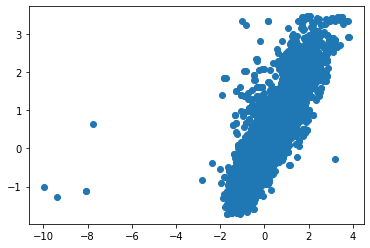

In [53]:
plt.scatter(X, m)



In [54]:
train_data.X = x.detach().numpy()

NameError: name 'x' is not defined

In [55]:
train_data.M = train_data.M.detach().numpy()

In [57]:
train_data.X = X
train_data.Y = train_data.Y.detach().numpy()
train_data.Z = train_data.Z.detach().numpy()
train_data.N = train_data.N.detach().numpy()
train_data.U = train_data.U.detach().numpy()
train_data.M = train_data.M.detach().numpy()

AttributeError: 'numpy.ndarray' object has no attribute 'detach'

In [100]:
train_data

In [59]:
idx = np.arange(train_data.Z.shape[0])

np.random.shuffle(idx)

In [60]:
train_data.keys()

dict_keys(['Z', 'U', 'Y', 'M', 'N', 'X'])

In [61]:
data2save = {}
data2save['Z'] = train_data.Z[idx]
data2save['U'] = train_data.U[idx]
data2save['Y'] = train_data.Y[idx]
data2save['M'] = train_data.M[idx]
data2save['N'] = train_data.N[idx]
data2save['X'] = train_data.X[idx]

### Visualise generated data



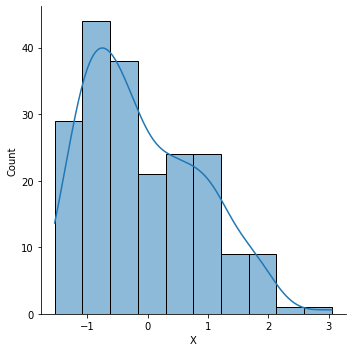

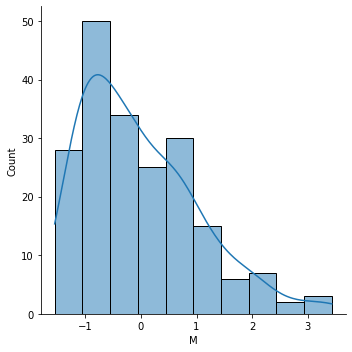

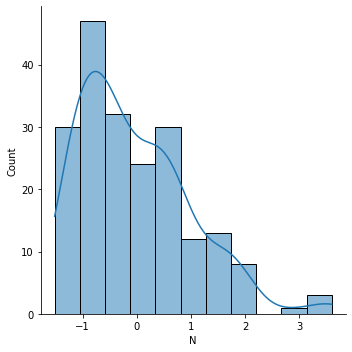

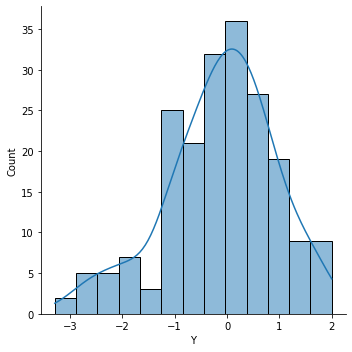

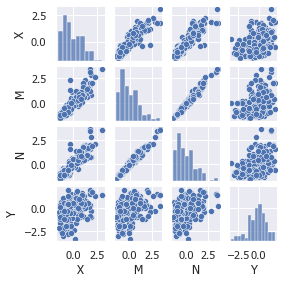

In [63]:
# set data
import seaborn as sns

X, Y, M, N = data2save['X'].flatten(), data2save['Y'].flatten(), data2save['M'].flatten(), data2save['N'].flatten()

# plotting
sample_size = 200

D = pd.DataFrame([X[:sample_size], M[:sample_size], N[:sample_size], Y[:sample_size]]).T
D.columns = ['X', 'M', 'N', 'Y']
# O = pd.DataFrame([Z[:sample_size], M[:sample_size], N[:sample_size], Y[:sample_size]]).T
# O.columns = ['Z', 'M', 'N', 'Y']

for v in ['X','M', 'N', 'Y']:
    sns.displot(D, x=v, label=v, kde=True), plt.show()

sns.set_theme(font="tahoma", font_scale=1)
plt.show()


sns.pairplot(D, height=1)
plt.show()

In [67]:
train_data.U.shape

(9968, 28)

In [95]:
M_std

tensor([[0.0866],
        [0.0834],
        [0.0882],
        ...,
        [0.0960],
        [0.1024],
        [0.1068]], dtype=torch.float64, grad_fn=<ExpBackward0>)

In [136]:
X_mean, X_std = lvm.xmodel.forward_(torch.tensor(train_data.Z), torch.tensor(train_data.U))
X_gen = torch.distributions.Normal(X_mean, X_std).sample()
M_mean, M_std = lvm.mdecoder.forward(X_gen)
M_gen = torch.distributions.Normal(M_mean, M_std*1.).sample()
N_mean, N_std = lvm.ndecoder.forward(X_gen)
N_gen = torch.distributions.Normal(N_mean, N_std*1.).sample()
Y_mean, Y_std = lvm.ymodel.forward_(X_gen, torch.tensor(train_data.U))
Y_gen = torch.distributions.Normal(Y_mean, Y_std).sample()


In [97]:
pmx_dist = torch.distributions.Normal(M_mean, M_var)


In [98]:
pmx_dist.sample().shape

torch.Size([9968, 1])

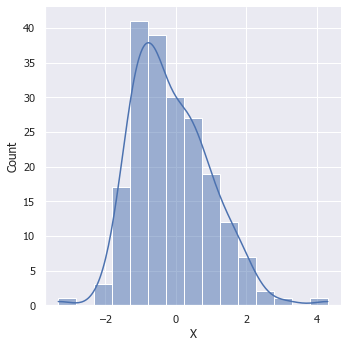

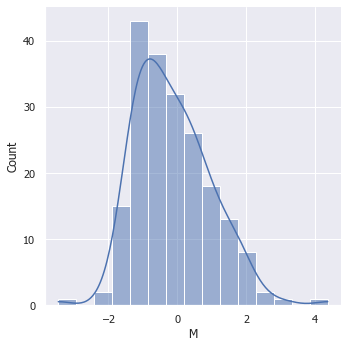

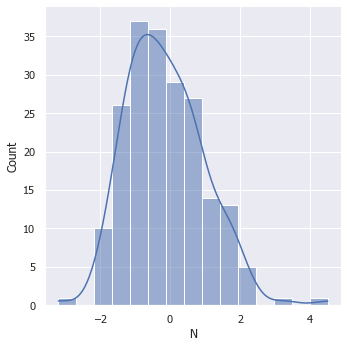

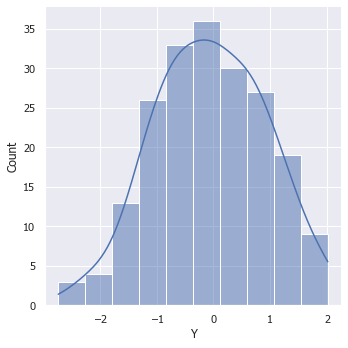

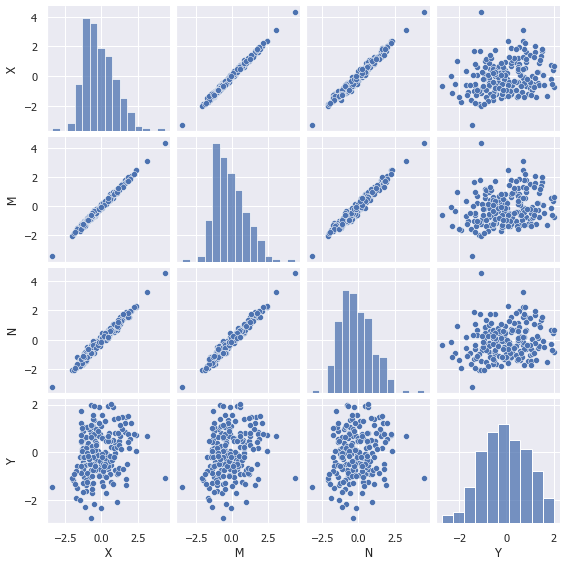

In [137]:

# plotting
sample_size = 200

D = pd.DataFrame([X_gen[idx][:sample_size].detach().numpy().flatten(), M_gen[idx][:sample_size].detach().numpy().flatten(), 
                  N_gen[idx][:sample_size].detach().numpy().flatten(), Y_gen[idx][:sample_size].detach().numpy().flatten()]).T
D.columns = ['X', 'M', 'N', 'Y']
# O = pd.DataFrame([Z[:sample_size], M[:sample_size], N[:sample_size], Y[:sample_size]]).T
# O.columns = ['Z', 'M', 'N', 'Y']

for v in ['X', 'M', 'N', 'Y']:
    sns.displot(D, x=v, label=v, kde=True), plt.show()

sns.set_theme(font="tahoma", font_scale=1)
plt.show()


sns.pairplot(D, height=2)
plt.show()

In [138]:
data2save = {'Z': train_data.Z[idx], 
             'U': train_data.U[idx],
             'X': X_gen.detach().numpy()[idx],
             'M': M_gen.detach().numpy()[idx],
             'N': N_gen.detach().numpy()[idx],
             'Y': Y_gen.detach().numpy()[idx]}

In [139]:
# save new data

import pickle

with open('../../dahl_lochner.pickle', 'wb') as handle:
    print(handle)
    pickle.dump(data2save, handle, protocol=pickle.HIGHEST_PROTOCOL)



<_io.BufferedWriter name='../../dahl_lochner.pickle'>


### Test KIVX on new data

In [104]:
os.getcwd()

'/Users/yuchenzhu/python_projects/ml/projects/measurement-error/miv/data/dahl2012/MS20050400_data'

In [51]:
mse_oracle = pd.read_csv(os.path.join(fdir, '06-16-18-48-22', 
                         'kivoracle', 
                         'dahl_lochner_m_scale:None-merror_func_str:gaussian',
                         'mse.csv'), header=None, delimiter=" ")
mse_mekiv = pd.read_csv(os.path.join(fdir, '06-16-20-13-35', 
                         'merrorkiv', 
                         'dahl_lochner_m_scale:None-merror_func_str:gaussian',
                         'mse.csv'), header=None, delimiter=" ")
mse_kivm = pd.read_csv(os.path.join(fdir, '06-16-18-43-17', 
                         'kivm', 
                         'dahl_lochner_m_scale:None-merror_func_str:gaussian',
                         'mse.csv'), header=None, delimiter=" ")

mse_kivmn = pd.read_csv(os.path.join(fdir, '06-16-18-15-27', 
                         'kivmn', 
                         'dahl_lochner_m_scale:None-merror_func_str:gaussian',
                         'mse.csv'), header=None, delimiter=" ")



In [55]:
mse_oracle_mean, mse_oracle_std = mse_oracle.values.mean(), mse_oracle.values.std()
mse_mekiv_mean, mse_mekiv_std = mse_mekiv.values.mean(), mse_mekiv.values.std()
mse_kivm_mean, mse_kivm_std = mse_kivm.values.mean(), mse_kivm.values.std()
mse_kivmn_mean, mse_kivmn_std = mse_kivmn.values.mean(), mse_kivmn.values.std()

print(mse_oracle_mean, mse_oracle_std)
print(mse_mekiv_mean, mse_mekiv_std)
print(mse_kivm_mean, mse_kivm_std)
print(mse_kivmn_mean, mse_kivmn_std)


0.03454661400096848 0.018958964888727874
0.029508518477282857 0.014409329116411466
0.03176328802413655 0.019909218746647757
0.031041294135295897 0.01424610898354415


In [41]:
fdir = '../../../../dumps/'
test_label = pd.read_csv(os.path.join(fdir, '06-16-18-48-22', 
                         'kivoracle', 
                         'dahl_lochner_m_scale:None-merror_func_str:gaussian',
                         'test_label.csv'), header=None, delimiter=" ")

test_input = pd.read_csv(os.path.join(fdir, '06-16-18-48-22', 
                         'kivoracle', 
                         'dahl_lochner_m_scale:None-merror_func_str:gaussian',
                         'test_input.csv'), header=None, delimiter=" ")

test_pred = pd.read_csv(os.path.join(fdir, '06-16-18-48-22', 
                         'kivoracle', 
                         'dahl_lochner_m_scale:None-merror_func_str:gaussian',
                         'test_pred.csv'), header=None, delimiter=" ")




In [42]:
fdir = '../../../../dumps/'
test_label_mekiv = pd.read_csv(os.path.join(fdir, '06-16-20-13-35', 
                         'merrorkiv', 
                         'dahl_lochner_m_scale:None-merror_func_str:gaussian',
                         'test_label.csv'), header=None, delimiter=" ")

test_input_mekiv = pd.read_csv(os.path.join(fdir, '06-16-20-13-35', 
                         'merrorkiv', 
                         'dahl_lochner_m_scale:None-merror_func_str:gaussian',
                         'test_input.csv'), header=None, delimiter=" ")

test_pred_mekiv = pd.read_csv(os.path.join(fdir, '06-16-20-13-35', 
                         'merrorkiv', 
                         'dahl_lochner_m_scale:None-merror_func_str:gaussian',
                         'test_pred.csv'), header=None, delimiter=" ")




In [43]:
test_pred_kivm = pd.read_csv(os.path.join(fdir, '06-16-18-43-17', 
                         'kivm', 
                         'dahl_lochner_m_scale:None-merror_func_str:gaussian',
                         'test_pred.csv'), header=None, delimiter=" ")




In [44]:
test_pred_kivmn = pd.read_csv(os.path.join(fdir, '06-16-18-15-27', 
                         'kivmn', 
                         'dahl_lochner_m_scale:None-merror_func_str:gaussian',
                         'test_pred.csv'), header=None, delimiter=" ")



In [45]:
test_pred_mekiv.values.shape

(100, 30)

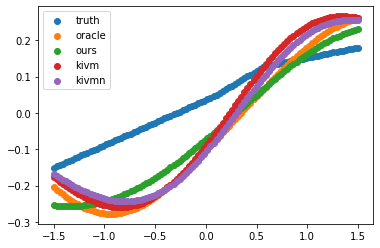

In [46]:
plt.scatter(test_input, test_label, label='truth')
plt.scatter(test_input.values.flatten(), np.mean(test_pred.values, axis=-1), label='oracle')
plt.scatter(test_input.values.flatten(), np.mean(test_pred_mekiv.values, axis=-1), label='ours')
plt.scatter(test_input.values.flatten(), np.mean(test_pred_kivm.values, axis=-1), label='kivm')
plt.scatter(test_input.values.flatten(), np.mean(test_pred_kivmn.values, axis=-1), label='kivmn')

plt.legend()


In [48]:
import seaborn as sns

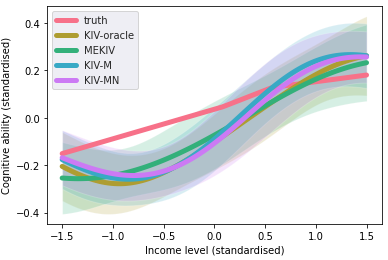

In [49]:
fig, ax = plt.subplots()
clrs = sns.color_palette("husl", 5)
with sns.axes_style("darkgrid"):
    tru = test_label
    
    oracle_mean = np.mean(test_pred.values, axis=-1)
    oracle_std = np.std(test_pred.values, axis=-1)
    
    ours_mean = np.mean(test_pred_mekiv.values, axis=-1)
    ours_std = np.std(test_pred_mekiv.values, axis=-1)
    
    kivm_mean = np.mean(test_pred_kivm.values, axis=-1)
    kivm_std = np.std(test_pred_kivm.values, axis=-1)
    
    kivmn_mean = np.mean(test_pred_kivmn.values, axis=-1)
    kivmn_std = np.std(test_pred_kivmn.values, axis=-1)
    
    ax.plot(test_input.values.flatten(), tru, label='truth', c=clrs[0], linewidth=5.0)
    
    ax.plot(test_input.values.flatten(), oracle_mean, label='KIV-oracle', c=clrs[1], linewidth=5.0)
    ax.fill_between(test_input.values.flatten(), oracle_mean-oracle_std, oracle_mean+oracle_std, alpha=0.2, facecolor=clrs[1])
    
    ax.plot(test_input.values.flatten(), ours_mean, label='MEKIV', c=clrs[2], linewidth=5.0)
    ax.fill_between(test_input.values.flatten(), ours_mean-ours_std, ours_mean+ours_std, alpha=0.2, facecolor=clrs[2])
    
    ax.plot(test_input.values.flatten(), kivm_mean, label='KIV-M', c=clrs[3], linewidth=5.0)
    ax.fill_between(test_input.values.flatten(), kivm_mean-kivm_std, kivm_mean+kivm_std, alpha=0.2, facecolor=clrs[3])
    
    ax.plot(test_input.values.flatten(), kivmn_mean, label='KIV-MN', c=clrs[4], linewidth=5.0)
    ax.fill_between(test_input.values.flatten(), kivmn_mean-kivmn_std, kivmn_mean+kivmn_std, alpha=0.2, facecolor=clrs[4])
    
    ax.legend()
#     ax.set_yscale('log')
    ax.set_xlabel('Income level (standardised)')
    ax.set_ylabel('Cognitive ability (standardised)')
    
    plt.savefig('../../../../results/camera_ready/figures/dahl_lochner.pdf')
    

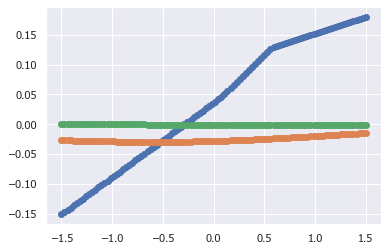

In [135]:
plt.scatter(test_input, test_label)
# plt.scatter(test_input.values.flatten(), test_pred.values[:,0])
plt.scatter(test_input.values.flatten(), test_pred_mekiv.values[:,0])
plt.scatter(test_input.values.flatten(), test_pred_kivm.values[:,0])



In [122]:
test_pred

,0
0,-2.721175136115429050e-01 -3.70483413236788183...
1,-2.739432141200790483e-01 -3.72929283094714236...
2,-2.752342985226020611e-01 -3.74719587505493945...
3,-2.759673348694621220e-01 -3.75838480916276029...
4,-2.761205851052588311e-01 -3.76272746453018391...
...,...
95,2.921642922993232874e-02 3.370233066550654688e-01
96,2.255460360792085894e-02 3.351615587982544331e-01
97,1.621771014072194775e-02 3.330543288654368439e-01
98,1.022002112310120038e-02 3.307073674556437193e-01


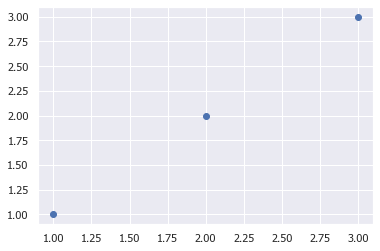

In [119]:
plt.scatter([1,2,3], [1,2,3])

In [74]:
torch.save(lvm.ymodel.state_dict(), '../../dahl_lochner_f.pt')

In [178]:
%debug

> /Users/yuchenzhu/miniconda3/lib/python3.7/site-packages/torch/_tensor.py(678)__array__()
    676             return handle_torch_function(Tensor.__array__, (self,), self, dtype=dtype)
    677         if dtype is None:
--> 678             return self.numpy()
    679         else:
    680             return self.numpy().astype(dtype, copy=False)

ipdb> u
> /Users/yuchenzhu/miniconda3/lib/python3.7/site-packages/numpy/ma/core.py(2795)__new__()
   2793         # Process data.
   2794         _data = np.array(data, dtype=dtype, copy=copy,
-> 2795                          order=order, subok=True, ndmin=ndmin)
   2796         _baseclass = getattr(data, '_baseclass', type(_data))
   2797         # Check that we're not erasing the mask.

ipdb> u
> /Users/yuchenzhu/miniconda3/lib/python3.7/site-packages/numpy/ma/core.py(7898)asanyarray()
   7896     if isinstance(a, MaskedArray) and (dtype is None or dtype == a.dtype):
   7897         return a
-> 7898     return masked_array(a, dtype=dtype, co

## Analyse main.dta

In [15]:
data_dir = "main.dta"
main = pd.read_stata(data_dir)

In [16]:
main.head()

,idchild,weight8600,momid,year,hrswrinew,wksuni,totamud,totamusd,totwead,cpi,...,ss52,sped0mm2,sped1mm2,sped2mm2,sped3mm2,sped4mm2,ddd1,ddd3,ageofsnew,spmissage
0,201.0,821916.0,2,1996,NaN,NaN,NaN,NaN,NaN,2.211,...,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,49.0,0.0
1,202.0,816447.0,2,1997,0.0,0.0,0.0,0.0,0.0,2.245,...,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,50.0,0.0
2,301.0,370619.0,3,1985,0.0,0.0,0.0,0.0,0.0,1.510,...,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,24.0,0.0
3,302.0,343291.0,3,1984,460.0,0.0,0.0,0.0,0.0,1.482,...,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,23.0,0.0
4,303.0,389548.0,3,1987,294.0,0.0,0.0,0.0,0.0,1.629,...,0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,26.0,0.0


In [17]:
main.columns

Index(['idchild', 'weight8600', 'momid', 'year', 'hrswrinew', 'wksuni',
       'totamud', 'totamusd', 'totwead', 'cpi',
       ...
       'ss52', 'sped0mm2', 'sped1mm2', 'sped2mm2', 'sped3mm2', 'sped4mm2',
       'ddd1', 'ddd3', 'ageofsnew', 'spmissage'],
      dtype='object', length=162)

In [18]:
for col in main.columns:
    print(col)

idchild
weight8600
momid
year
hrswrinew
wksuni
totamud
totamusd
totwead
cpi
cpily
ageofrimp
totweadimp2
rtotweadimp2
maxndep
maxndeply
earnincrimp
earnincsimp
earnincrsimp
unearnincrsimp
nontaxincrsimp
hgcbym79
hgcbyf79
race
afqt
liveboth
afqtadj
samprandom
samprandwhite
sampnmwhite
sampnmblack
sampnmhisp
sampnm
sampblau
male
black
hispanic
other
numofa
motstg
fatstg
piamatsn
piarersn
piarecsn
hgcbyfmis
hgcbymmis
state
marrlyimp
ed1age23
ed2age23
ed3age23
ed4age23
yrsbirth
statefips
mstat
depx
agex
pwages
swages
dividends
otherprop
pensions
gssi
transfers
rentpaid
proptax
otheritem
childcare
ui
depchild
mortgage
stcg
ltcg
afqtadjmiss
rural14miss
livebothmiss
fatstgmiss
motstgmiss
numofamiss
yy1
yy2
yy3
yy4
yy5
yy6
yy7
yy8
yy9
yy10
yy11
yy12
yy13
yy14
yy15
yy16
yy17
yy18
yy19
yy20
yy21
yy22
ss1
ss2
ss3
ss4
ss5
ss6
ss7
ss8
ss9
ss10
ss11
ss12
ss13
ss14
ss15
ss16
ss17
ss18
ss19
ss20
ss21
ss22
ss23
ss24
ss25
ss26
ss27
ss28
ss29
ss30
ss31
ss32
ss33
ss34
ss35
ss36
ss37
ss38
ss39
ss40
ss41
ss4

In [19]:
# colnokeep = ['idchild', 'momid']
# col_notsure = ['weight8600']
col2keep = {'year', 'hrswrinew', 'wksuni', 'maxndep', 'maxndeply', 
            'black', 'fatstg', 'hispanic', 'male', 'marrlyimp', 
            'motstg', 'numofa', 'samprandom', 'sampnm', 
            'samprandwhite', 'sampnmblack', 'sampnmhisp', 
            'afqtadj', 'ageofrimp', 'hgcbyf79', 'hgcbym79', 
            'liveboth', 'momid', 'idchild', 'piamatsn', 'piarecsn', 
            'piarersn', 'cpi', 'cpily', 'earnincrimp', 'earnincsimp', 
            'earnincrsimp', 'unearnincrsimp', 'nontaxincrsimp', 
            'swages', 'totamud', 'totamusd', 'totwead', 
            'totweadimp2', 'rtotweadimp2', 'childcare'}

dat2keep = main[col2keep]
dat2keep['totinc'] = dat2keep['earnincrsimp'] + dat2keep['unearnincrsimp'] + dat2keep['nontaxincrsimp']



/Users/yuchenzhu/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app


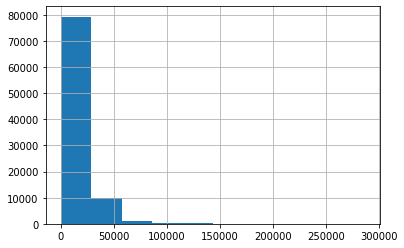

In [20]:
dat2keep['totinc'].hist()

In [21]:
dat2keep['totinc']

0        21299.798379
1        23066.485753
2        20242.914980
3        13487.071978
4        19808.306709
             ...     
91862      491.098834
91863    24764.328559
91864    15718.420593
91865    22391.615055
91866     9045.226131
Name: totinc, Length: 91867, dtype: float64

In [22]:
import numpy as np

np.sum(1*(dat2keep['totinc'] < 5.))

14

In [23]:
totinc = {1.1: 1.1}
bl = bool(totinc.get(2.1-1))
print(bl)

True


In [12]:
mom_prev = None
mom = None
year_dict = {}
totinc = None
diffs = {}

incomes = []
times = []
cpilys = []

for idx, _ in enumerate(dat2keep['year']):
    mom = dat2keep['momid'][idx]
    if not diffs.get(mom):
        diffs[mom] = []
        
    year = dat2keep['year'][idx]
    totinc = dat2keep['totinc'][idx]
    cpily = dat2keep['cpily'][idx]
    
    if mom_prev and mom_prev==mom:
        is_year_prev = year_dict.get(year-1)
        if is_year_prev:
            totinc_prev = year_dict[year-1] if is_year_prev else None
            diff = (totinc - totinc_prev)/totinc
            diffs[mom].append(diff)  
            incomes.append((totinc, totinc_prev))
            times.append(year)
            cpilys.append(cpily)
    else:
        print('new mum')
        year_dict = {}
        year_dict[year] = totinc
        
    mom_prev = mom
    


    
    

new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum


new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum


new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum


new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum


new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum


new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum
new mum


2003


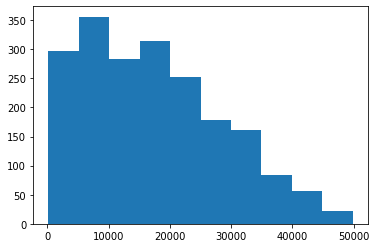

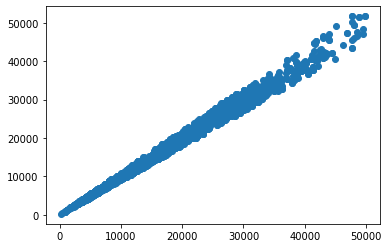

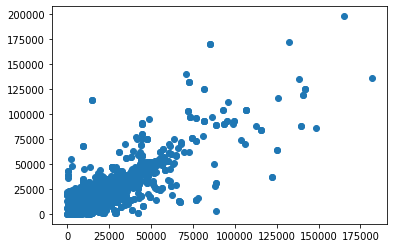

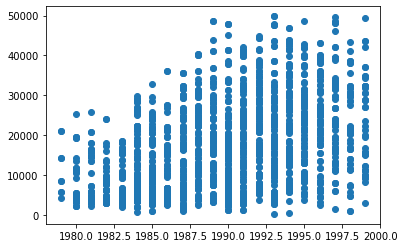

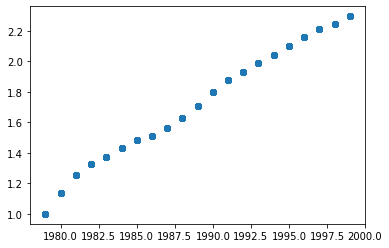

In [13]:
incomes_10percdiff = []
income0, income1 = [], []
times_selected = []
cpilys_selected = []

income0_orig, income1_orig = [], []


for idx, income in enumerate(incomes):
    if (np.abs((income[0] - income[1])/income[0]) < 0.1) and income[0]<50000:
        incomes_10percdiff.append(income[0])
        income0.append(income[0])
        income1.append(income[1])
        
        times_selected.append(times[idx])
        cpilys_selected.append(cpilys[idx])
        
    income0_orig.append(income[0])
    income1_orig.append(income[1])

import matplotlib.pyplot as plt

plt.hist(np.array(incomes_10percdiff))

plt.figure()

plt.scatter(income0, income1)

plt.figure()

plt.scatter(income0_orig, income1_orig)

plt.figure()

plt.scatter(times_selected, income0)

plt.figure()

plt.scatter(times_selected, cpilys_selected)

print(len(incomes_10percdiff))
        

In [40]:
tot_moms = 0
moms_w_income_change_less_than_20perc = 0
moms_w_income_change_less_than_10perc = 0

tot_diffs = 0
diffs_less_than_20perc = 0
diffs_less_than_10perc = 0

for mom in diffs.keys():
    
    tot_moms += 1
    
    if len(diffs[mom]) == 0:
        continue
    else:
        tot_diffs += len(diffs[mom])
        diffs_less_than_20perc += np.sum((np.array(diffs[mom])<0.2)*1)
        diffs_less_than_10perc += np.sum((np.array(diffs[mom])<0.1)*1)
        
    mean_income_change = np.mean(np.abs(np.array(diffs[mom])))
    print('mean perc diff: {}'.format(mean_income_change))
    
    if mean_income_change < 0.2:
        moms_w_income_change_less_than_20perc += 1
        
    if mean_income_change < 0.1:
        moms_w_income_change_less_than_10perc += 1
    
    
    
    print('max perc diff: {}'.format(np.max(np.abs(np.array(diffs[mom])))))

    
    
#     print(dat2keep['momid'][idx], dat2keep['year'][idx], dat2keep['totinc'][idx])

mean perc diff: 0.47414219422518666
max perc diff: 0.6729177444386963
mean perc diff: 0.5559245171942767
max perc diff: 0.5559245171942767
mean perc diff: 0.5784142048959734
max perc diff: 0.5784142048959734
mean perc diff: 0.4159142002371915
max perc diff: 0.4159142002371915
mean perc diff: 0.2066904783266117
max perc diff: 0.2066904783266117
mean perc diff: 0.07190753288986351
max perc diff: 0.07190753288986351
mean perc diff: 6.428718335292799
max perc diff: 6.428718335292799
mean perc diff: 0.04560937297668588
max perc diff: 0.04560937297668588
mean perc diff: 0.005826786906807061
max perc diff: 0.005826786906807061
mean perc diff: 0.06200694100994452
max perc diff: 0.06200694100994452
mean perc diff: 0.13018964946710446
max perc diff: 0.13018964946710446
mean perc diff: 0.009618199699934387
max perc diff: 0.009618199699934387
mean perc diff: 0.30905077262693154
max perc diff: 0.30905077262693154
mean perc diff: 0.48009826811039014
max perc diff: 0.48009826811039014
mean perc diff:

/Users/yuchenzhu/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in less
/Users/yuchenzhu/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in less



max perc diff: 0.21014735188444583
mean perc diff: 0.17228257983265535
max perc diff: 0.17228257983265535
mean perc diff: 0.18857643077453626
max perc diff: 0.18857643077453626
mean perc diff: 0.27896136968236307
max perc diff: 0.27896136968236307
mean perc diff: 0.6788862993419744
max perc diff: 0.6788862993419744
mean perc diff: 0.43903340644121974
max perc diff: 0.43903340644121974
mean perc diff: 1.9652754430622934
max perc diff: 1.9652754430622934
mean perc diff: 0.3030253877209473
max perc diff: 0.3354474776687175
mean perc diff: 0.7282340660615134
max perc diff: 0.7282340660615134
mean perc diff: 0.051985740649675705
max perc diff: 0.051985740649675705
mean perc diff: 0.3809255370881559
max perc diff: 0.3809255370881559
mean perc diff: 0.05521133133082826
max perc diff: 0.05521133133082826
mean perc diff: 0.34397607787408957
max perc diff: 0.6879521557481791
mean perc diff: 1.0599728517954838
max perc diff: 1.0599728517954838
mean perc diff: 0.2876164385863925
max perc diff: 0.

mean perc diff: 0.14706213266612736
max perc diff: 0.14706213266612736
mean perc diff: 0.26214610242967423
max perc diff: 0.26214610242967423
mean perc diff: 0.01619330300183848
max perc diff: 0.01619330300183848
mean perc diff: 0.0371674899454301
max perc diff: 0.0371674899454301
mean perc diff: 0.15569764521799598
max perc diff: 0.15569764521799598
mean perc diff: 0.03366871754780698
max perc diff: 0.03366871754780698
mean perc diff: 0.21278889878580465
max perc diff: 0.21278889878580465
mean perc diff: 2.9397000997316
max perc diff: 5.675119986232655
mean perc diff: 0.18999426223736404
max perc diff: 0.19475489195444035
mean perc diff: 0.5553088384660178
max perc diff: 0.5553088384660178
mean perc diff: 0.5320599844001779
max perc diff: 0.5320599844001779
mean perc diff: 0.03779162090632466
max perc diff: 0.03779162090632466
mean perc diff: 0.292729483710395
max perc diff: 0.292729483710395
mean perc diff: 0.10892772813352672
max perc diff: 0.10892772813352672
mean perc diff: 0.0628

mean perc diff: 1.8528313244274255
max perc diff: 1.8528313244274255
mean perc diff: 0.3586031517115302
max perc diff: 0.3586031517115302
mean perc diff: 0.0351231285820807
max perc diff: 0.0351231285820807
mean perc diff: 0.24444444444444435
max perc diff: 0.24444444444444435
mean perc diff: 0.6596080953152677
max perc diff: 0.6596080953152677
mean perc diff: 0.07318478858749831
max perc diff: 0.07318478858749831
mean perc diff: nan
max perc diff: nan
mean perc diff: 0.032425354182503724
max perc diff: 0.04785498636540704
mean perc diff: 0.20381449188357548
max perc diff: 0.20381449188357548
mean perc diff: 9.433802456197059
max perc diff: 9.433802456197059
mean perc diff: 0.01783613599840332
max perc diff: 0.01783613599840332
mean perc diff: 0.5582097540798997
max perc diff: 0.5582097540798997
mean perc diff: 0.21990891195404916
max perc diff: 0.21990891195404916
mean perc diff: 0.11669199322846464
max perc diff: 0.11669199322846464
mean perc diff: 0.0800325839035518
max perc diff: 0

max perc diff: 0.25407214525984145
mean perc diff: 0.17092416818464148
max perc diff: 0.17092416818464148
mean perc diff: 0.019814546169563022
max perc diff: 0.019814546169563022
mean perc diff: 0.7512546228856383
max perc diff: 0.7512546228856383
mean perc diff: 0.5840492976397051
max perc diff: 0.5840492976397051
mean perc diff: 0.5674953981934633
max perc diff: 0.5674953981934633
mean perc diff: 0.5900332547813393
max perc diff: 0.8455895567639656
mean perc diff: 4.132132409001554
max perc diff: 12.39639722700466
mean perc diff: 0.631689747681953
max perc diff: 0.631689747681953
mean perc diff: 0.021351059584095267
max perc diff: 0.021351059584095267
mean perc diff: 0.14145198891704494
max perc diff: 0.14145198891704494
mean perc diff: 0.14296325127132042
max perc diff: 0.14296325127132042
mean perc diff: 0.5046648205049102
max perc diff: 0.5046648205049102
mean perc diff: 0.6325579558037905
max perc diff: 0.7385964607296548
mean perc diff: 0.7702212651753368
max perc diff: 0.770221

max perc diff: 0.1733706221274693
mean perc diff: 0.9955047268609346
max perc diff: 0.9955047268609346
mean perc diff: 0.10700071073205393
max perc diff: 0.10700071073205393
mean perc diff: 1.17955720891389
max perc diff: 1.3832443751039827
mean perc diff: 0.42066427599825085
max perc diff: 0.5866506097074995
mean perc diff: 0.58239020345313
max perc diff: 0.58239020345313
mean perc diff: 0.565029746685834
max perc diff: 0.565029746685834
mean perc diff: 0.5806015960712094
max perc diff: 0.5806015960712094
mean perc diff: 0.3097516075012947
max perc diff: 0.3097516075012947
mean perc diff: 0.03830845771144272
max perc diff: 0.03830845771144272
mean perc diff: 1.0502535075811632
max perc diff: 1.0502535075811632
mean perc diff: 1.0
max perc diff: 1.0
mean perc diff: 0.6740722758200267
max perc diff: 0.6740722758200267
mean perc diff: 0.07532195268044331
max perc diff: 0.07532195268044331
mean perc diff: 0.1235730882682456
max perc diff: 0.12357308826824562
mean perc diff: 0.017514012642

In [41]:
num_mums = len(diffs.keys())

print(num_mums)
print(moms_w_income_change_less_than_20perc)
print(moms_w_income_change_less_than_10perc)
print(tot_diffs)
print(diffs_less_than_20perc)
print(diffs_less_than_10perc)

3769
1669
1086
5947
4360
3717


In [32]:
np.abs(np.array([-1,-2]))

array([1, 2])